In [1]:
import pickle
import pandas as pd
from sklearn.neighbors import KNeighborsClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score
import matplotlib.pyplot as plt
from sklearn.cross_validation import train_test_split
import numpy as np
from sklearn.naive_bayes import GaussianNB
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.cross_validation import ShuffleSplit
from sklearn.grid_search import GridSearchCV
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import f_classif
from sklearn.feature_selection import chi2
from sklearn.preprocessing import StandardScaler
from sklearn.cross_validation import StratifiedKFold
from sklearn.metrics import roc_curve, auc
from scipy import interp
%matplotlib inline

In [2]:
with open('final_artist_frame.pkl', 'r') as f:
    df = pickle.load(f)

In [3]:
pd.set_option('max_columns', 50)
df.head()

,artist,fans,rank,2015_shows,2014_shows,2013_shows,2012_shows,2011_shows,miles,all_shows,familiarity,hotttnesss,bon_2015,ult_2015,sxs_2015,coa_2015,han_2015,sas_2015,gba_2015,acl_2015,noi_2015,bea_2015,reggae,latin,classical,country,jazz,punk,electro house,pop,r&b,hip hop,rock,world,metal,blues,folk,bon_counts,ult_counts,acl_counts,han_counts,gba_counts,sas_counts,coa_counts,sxs_counts,bea_counts,noi_counts
/artists/10237-selecter,The Selecter,17141,5160,63,60,53,48,31,166410,300,0.567229,0.658224,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0.000000,0.000000,0,0,0.000000,0,0,0.000000,0,0,0,0,0,0,0,1,0,0,0
/artists/605942-stephen-jerzak,Stephen Jerzak,18709,4793,0,1,0,15,47,64463,177,0.459539,0.513883,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.000000,0.500000,0,0,0.500000,0,0,0.000000,0,0,0,0,0,0,0,0,1,0,0
/artists/3160066-flight-facilities,Flight Facilities,148020,679,51,29,32,18,22,346452,146,0.601317,0.723787,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1.000000,0.000000,0,0,0.000000,0,0,0.000000,0,0,0,0,0,0,0,1,1,0,0
/artists/72400-robert-randolph-and-the-family-band,Robert Randolph & The Family Band,29566,3258,35,67,75,51,84,399752,555,0.524043,0.571925,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.000000,0.000000,0,0,0.333333,0,0,0.666667,0,0,0,1,0,0,0,0,0,0,0
/artists/561185-bastille,Bastille,375096,169,30,124,144,36,18,326086,352,0.584801,0.716429,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.166667,0.833333,0,0,0.000000,0,0,0.000000,0,0,0,0,1,1,0,1,0,0,0


In [4]:
cols = df.columns.tolist()
cols = cols[:12] + cols[22:] + cols[12:22]
cols
df = df[cols]

In [5]:
df.shape

(2060, 47)

In [6]:
df.head()

,artist,fans,rank,2015_shows,2014_shows,2013_shows,2012_shows,2011_shows,miles,all_shows,familiarity,hotttnesss,reggae,latin,classical,country,jazz,punk,electro house,pop,r&b,hip hop,rock,world,metal,blues,folk,bon_counts,ult_counts,acl_counts,han_counts,gba_counts,sas_counts,coa_counts,sxs_counts,bea_counts,noi_counts,bon_2015,ult_2015,sxs_2015,coa_2015,han_2015,sas_2015,gba_2015,acl_2015,noi_2015,bea_2015
/artists/10237-selecter,The Selecter,17141,5160,63,60,53,48,31,166410,300,0.567229,0.658224,1,0,0,0,0,0,0.000000,0.000000,0,0,0.000000,0,0,0.000000,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0
/artists/605942-stephen-jerzak,Stephen Jerzak,18709,4793,0,1,0,15,47,64463,177,0.459539,0.513883,0,0,0,0,0,0,0.000000,0.500000,0,0,0.500000,0,0,0.000000,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0
/artists/3160066-flight-facilities,Flight Facilities,148020,679,51,29,32,18,22,346452,146,0.601317,0.723787,0,0,0,0,0,0,1.000000,0.000000,0,0,0.000000,0,0,0.000000,0,0,0,0,0,0,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0
/artists/72400-robert-randolph-and-the-family-band,Robert Randolph & The Family Band,29566,3258,35,67,75,51,84,399752,555,0.524043,0.571925,0,0,0,0,0,0,0.000000,0.000000,0,0,0.333333,0,0,0.666667,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
/artists/561185-bastille,Bastille,375096,169,30,124,144,36,18,326086,352,0.584801,0.716429,0,0,0,0,0,0,0.166667,0.833333,0,0,0.000000,0,0,0.000000,0,0,0,0,1,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0


# BONNAROO MUSIC FESTIVAL

In [29]:
y_bon, X_bon = df.bon_2015, df.ix[:, 'fans':'noi_counts']
X_bon_train, X_bon_test, y_bon_train, y_bon_test = train_test_split(X_bon, y_bon, test_size = 0.25, random_state = 4444)
bon_scale_fit = StandardScaler().fit(X_bon_train)
X_bon_train_scaled = pd.DataFrame(bon_scale_fit.transform(X_bon_train), columns = X_bon_train.columns)
new_bon_features = SelectKBest(f_classif, k = 10)
X_bon_best = new_bon_features.fit_transform(X_bon_train_scaled, y_bon_train)
best_bon_cols = new_bon_features.get_support(True)
X_bon.columns[best_bon_cols]

Index([u'rank', u'2015_shows', u'2014_shows', u'2012_shows', u'hotttnesss',
       u'electro house', u'bon_counts', u'acl_counts', u'han_counts',
       u'sxs_counts'],
      dtype='object')

In [23]:
X_bon_best = pd.DataFrame(X_bon_best, columns = X_bon.columns[best_bon_cols])
cw_range = [{1:1-cw, 0:cw} for cw in np.arange(.01, 1.0, .1)]
gamma_range = np.logspace(-9, 3, 9)
param_grid = dict(gamma=gamma_range, class_weight=cw_range)
cv = ShuffleSplit(len(y_bon_train), n_iter=5, test_size=0.2, random_state=42)
for score in ['accuracy','precision', 'recall']:
    grid = GridSearchCV(SVC(kernel = 'rbf'), param_grid=param_grid, cv=cv, scoring = score, verbose= 10)
    grid.fit(X_bon_best, y_bon_train)
    print("The best parameters are %s with a score of %0.2f"
          % (grid.best_params_, grid.best_score_))

Fitting 5 folds for each of 90 candidates, totalling 450 fits
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.045307 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.045307 -   0.1s

[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.2s



[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.045307 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.038835 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.048544 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.045307 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.045307 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999

[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.4s
[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.6s



[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.038835 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.048544 -   0.1s
[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.045307 -   0.1s
[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.045307 -   0.1s
[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.045307 -   0.1s
[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.03883

[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    1.0s
[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    1.4s



[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.038835 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.048544 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.045307 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.045307 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.045307 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.03883

[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    1.9s
[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    2.4s



[CV] gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.045307 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.038835 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.048544 -   0.1s
[CV] gamma=31.6227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=31.6227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.045307 -   0.1s
[CV] gamma=31.6227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=31.6227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.045307 -   0.1s
[CV] gamma=31.6227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=31.6227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.045307 -   0.1s


[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    3.2s
[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    3.5s



[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.961165 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.951456 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.954693 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.954693 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.954693 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.11, 

[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    3.9s
[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    4.2s



[CV] gamma=0.0316227766017, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.944984 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.954693 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.951456 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.951456 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.11, 1: 0.89000000000000001} .......
[CV]  gamma=1.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.954693 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.11, 1: 0.89000000000000001} .......
[CV]  gamma=1.0, class_weight={0: 0.11, 1: 0.890000000000000

[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    5.0s
[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    5.4s



[CV] gamma=3.16227766017e-08, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.954693 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.954693 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.954693 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.961165 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.210000000000

[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    5.6s
[Parallel(n_jobs=1)]: Done 128 jobs       | elapsed:    6.3s



[CV] gamma=31.6227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=31.6227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.961165 -   0.1s
[CV] gamma=31.6227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=31.6227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.951456 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=1000.0, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.954693 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=1000.0, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.954693 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=1000.0, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.954693 -   0.1s
[CV] gamma=1000.0, class_w

[Parallel(n_jobs=1)]: Done 145 jobs       | elapsed:    6.8s
[Parallel(n_jobs=1)]: Done 162 jobs       | elapsed:    7.1s



[CV] gamma=0.0316227766017, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.954693 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.961165 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.951456 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=1.0, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.954693 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=1.0, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.954693 -   0.1s
[CV] gamma=1

[Parallel(n_jobs=1)]: Done 181 jobs       | elapsed:    8.1s
[Parallel(n_jobs=1)]: Done 200 jobs       | elapsed:    8.3s



[CV] gamma=3.16227766017e-05, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.954693 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.954693 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.961165 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.951456 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=0.001, class_weight={0: 0.41000000000000003, 1: 0.589999999999

[Parallel(n_jobs=1)]: Done 221 jobs       | elapsed:    9.2s
[Parallel(n_jobs=1)]: Done 242 jobs       | elapsed:    9.6s



[CV] gamma=1e-06, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1e-06, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.954693 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1e-06, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.961165 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1e-06, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.951456 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.954693 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.954693 -   0.0s
[CV] gamma=3.162

[Parallel(n_jobs=1)]: Done 265 jobs       | elapsed:   10.5s
[Parallel(n_jobs=1)]: Done 288 jobs       | elapsed:   10.9s



[CV] gamma=1e-06, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999} 
[CV]  gamma=1e-06, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999}, score=0.961165 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999} 
[CV]  gamma=1e-06, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999}, score=0.951456 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999}, score=0.954693 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999}, score=0.954693 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999}, score=0.954693 -   0.0s
[CV] gamma=3

[Parallel(n_jobs=1)]: Done 313 jobs       | elapsed:   12.0s
[Parallel(n_jobs=1)]: Done 338 jobs       | elapsed:   12.3s



[CV] gamma=0.001, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=0.001, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.961165 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=0.001, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.951456 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.954693 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.954693 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.954693 -   0.0s
[CV]

[Parallel(n_jobs=1)]: Done 365 jobs       | elapsed:   13.4s
[Parallel(n_jobs=1)]: Done 392 jobs       | elapsed:   13.7s



[CV] gamma=1.0, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1.0, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.954693 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1.0, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.961165 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1.0, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.951456 -   0.0s
[CV] gamma=31.6227766017, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=31.6227766017, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.954693 -   0.1s
[CV] gamma=31.6227766017, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=31.6227766017, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.954693 -   0.1s
[CV] gamma=31.6227766017, class_weight={0: 0

[Parallel(n_jobs=1)]: Done 421 jobs       | elapsed:   14.8s
[Parallel(n_jobs=1)]: Done 450 jobs       | elapsed:   16.1s



The best parameters are {'gamma': 1.0000000000000001e-09, 'class_weight': {0: 0.11, 1: 0.89000000000000001}} with a score of 0.96
Fitting 5 folds for each of 90 candidates, totalling 450 fits
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.045307 -   0.1s

[Parallel(n_jobs=1)]: Done 450 out of 450 | elapsed:   16.1s finished
[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.1s



[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.045307 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.045307 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.038835 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.048544 -   0.1s

[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.4s



[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.045307 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.045307 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.045307 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.038835 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.048544 -   0.1s
[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, clas

[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.7s
[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    1.3s



[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.038835 -   0.1s
[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.048544 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.045307 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.045307 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.045307 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 

[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    1.6s
[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    2.2s



[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.045307 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.045307 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.045307 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.038835 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.048544 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=1.0, class_weight={0: 0.01, 1: 

[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    3.0s
[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    3.9s



[CV] gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.045307 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.045307 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.038835 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.048544 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class

[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    4.4s
[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    4.8s



[CV] gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=0.001, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=0.001, class_weight={0: 0.11, 

[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    5.3s
[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    6.6s



[CV] gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001} ....
[CV]  gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001} ....
[CV]  gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001} ....
[CV]  gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001} ....
[CV]  gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001} ....
[CV]  gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=1e-09, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.

[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    7.1s
[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    7.4s



[CV] gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.03162277660

[Parallel(n_jobs=1)]: Done 128 jobs       | elapsed:    8.0s
[Parallel(n_jobs=1)]: Done 145 jobs       | elapsed:    8.6s



[CV] gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.310000000000000

[Parallel(n_jobs=1)]: Done 162 jobs       | elapsed:    8.9s
[Parallel(n_jobs=1)]: Done 181 jobs       | elapsed:   10.0s



[CV] gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.410000000000000

[Parallel(n_jobs=1)]: Done 200 jobs       | elapsed:   10.2s
[Parallel(n_jobs=1)]: Done 221 jobs       | elapsed:   11.1s



[CV] gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1e-09, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.51000000000000001, 

[Parallel(n_jobs=1)]: Done 242 jobs       | elapsed:   11.5s
[Parallel(n_jobs=1)]: Done 265 jobs       | elapsed:   12.5s



[CV] gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.6100000000000001,

[Parallel(n_jobs=1)]: Done 288 jobs       | elapsed:   12.9s
[Parallel(n_jobs=1)]: Done 313 jobs       | elapsed:   13.9s



[CV] gamma=1000.0, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999}, score=0.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.2899999

[Parallel(n_jobs=1)]: Done 338 jobs       | elapsed:   14.2s
[Parallel(n_jobs=1)]: Done 365 jobs       | elapsed:   15.3s



[CV] gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.810000000000000

[Parallel(n_jobs=1)]: Done 392 jobs       | elapsed:   15.6s
[Parallel(n_jobs=1)]: Done 421 jobs       | elapsed:   16.6s



[CV] gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.910

[Parallel(n_jobs=1)]: Done 450 jobs       | elapsed:   17.5s
[Parallel(n_jobs=1)]: Done 450 out of 450 | elapsed:   17.5s finished
[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.1s



[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s

[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.3s



[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, clas

[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.6s
[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    0.9s



[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 

[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    1.3s
[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    1.7s



[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=1.0, class_weight={0: 0.01, 1: 

[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    2.3s
[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    3.1s



[CV] gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.0s
[CV] gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.0s
[CV] gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.0s
[CV] gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class

[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    3.4s
[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    3.7s



[CV] gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=0.001, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=0.001, class_weight={0: 0.11, 

[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    4.2s
[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    5.4s



[CV] gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001} ....
[CV]  gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001} ....
[CV]  gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001} ....
[CV]  gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001} ....
[CV]  gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001} ....
[CV]  gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=1e-09, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.

[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    6.0s
[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    6.2s



[CV] gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0:

[Parallel(n_jobs=1)]: Done 128 jobs       | elapsed:    7.3s
[Parallel(n_jobs=1)]: Done 145 jobs       | elapsed:    8.2s



[CV] gamma=3.16227766017e-08, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-06

[Parallel(n_jobs=1)]: Done 162 jobs       | elapsed:    8.6s
[Parallel(n_jobs=1)]: Done 181 jobs       | elapsed:   10.0s



[CV] gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.410000000000000

[Parallel(n_jobs=1)]: Done 200 jobs       | elapsed:   10.2s
[Parallel(n_jobs=1)]: Done 221 jobs       | elapsed:   11.2s



[CV] gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1e-09, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.51000000000000001, 

[Parallel(n_jobs=1)]: Done 242 jobs       | elapsed:   11.6s
[Parallel(n_jobs=1)]: Done 265 jobs       | elapsed:   12.5s



[CV] gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.6100000000000001,

[Parallel(n_jobs=1)]: Done 288 jobs       | elapsed:   12.9s
[Parallel(n_jobs=1)]: Done 313 jobs       | elapsed:   13.9s



[CV] gamma=1000.0, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999}, score=0.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.2899999

[Parallel(n_jobs=1)]: Done 338 jobs       | elapsed:   14.2s
[Parallel(n_jobs=1)]: Done 365 jobs       | elapsed:   15.3s



[CV] gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.810000000000000

[Parallel(n_jobs=1)]: Done 392 jobs       | elapsed:   15.7s
[Parallel(n_jobs=1)]: Done 421 jobs       | elapsed:   16.6s



[CV] gamma=1e-06, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969} 
[CV]  gamma=1e-06, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089

[Parallel(n_jobs=1)]: Done 450 jobs       | elapsed:   17.6s
[Parallel(n_jobs=1)]: Done 450 out of 450 | elapsed:   17.6s finished


The best parameters are {'gamma': 1.0e-09, 'class_weight': {0: 0.11, 1: 0.89}} with an accuracy score of 0.96.

The best parameters are {'gamma': 0.031622776601683791, 'class_weight': {0: 0.11, 1: 0.89}} with a precision score of 0.21.

The best parameters are {'gamma': 1.0e-09, 'class_weight': {0: 0.01, 1: 0.99}} with a recall score of 1.00.

In [24]:
cw_range = [{1:1-cw, 0:cw} for cw in np.arange(.01, .11, .005)]
gamma_range = np.logspace(-2, -1, 5)
param_grid = dict(gamma=gamma_range, class_weight=cw_range)
cv = ShuffleSplit(len(y_bon_train), n_iter=5, test_size=0.2, random_state=42)
for score in ['accuracy','precision', 'recall']:
    grid = GridSearchCV(SVC(kernel = 'rbf'), param_grid=param_grid, cv=cv, scoring = score, verbose= 10)
    grid.fit(X_bon_best, y_bon_train)
    print("The best parameters are %s with a score of %0.2f"
          % (grid.best_params_, grid.best_score_))

Fitting 5 folds for each of 100 candidates, totalling 500 fits
[CV] gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999} ......
[CV]  gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.045307 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999} ......
[CV]  gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.045307 -   0.1s

[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.1s



[CV] gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999} ......
[CV]  gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.045307 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999} ......
[CV]  gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.038835 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999} ......
[CV]  gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.048544 -   0.1s
[CV] gamma=0.0177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.045307 -   0.1s
[CV] gamma=0.0177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.045307 -   0.1s
[CV] gamma=0.0177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.0

[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.4s
[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.6s



[CV] gamma=0.0177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.038835 -   0.1s
[CV] gamma=0.0177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.048544 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.045307 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.045307 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.045307 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_wei

[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    1.0s
[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    1.3s



[CV] gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.038835 -   0.1s
[CV] gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.048544 -   0.1s
[CV] gamma=0.1, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=0.1, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.045307 -   0.1s
[CV] gamma=0.1, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=0.1, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.097087 -   0.1s
[CV] gamma=0.1, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=0.1, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.051780 -   0.1s
[CV] gamma=0.1, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=0.1, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.042071 -   0.1s
[CV] gamm

[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    1.9s
[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    2.4s



[CV] gamma=0.0177827941004, class_weight={0: 0.014999999999999999, 1: 0.98499999999999999} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.014999999999999999, 1: 0.98499999999999999}, score=0.045307 -   0.1s
[CV] gamma=0.0177827941004, class_weight={0: 0.014999999999999999, 1: 0.98499999999999999} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.014999999999999999, 1: 0.98499999999999999}, score=0.038835 -   0.1s
[CV] gamma=0.0177827941004, class_weight={0: 0.014999999999999999, 1: 0.98499999999999999} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.014999999999999999, 1: 0.98499999999999999}, score=0.048544 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.014999999999999999, 1: 0.98499999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.014999999999999999, 1: 0.98499999999999999}, score=0.074434 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.014999999999999999, 1: 0.98499999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.014999999999999999, 1: 

[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    3.1s
[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    3.8s



[CV] gamma=0.01, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998} 
[CV]  gamma=0.01, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998}, score=0.119741 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998} 
[CV]  gamma=0.01, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998}, score=0.213592 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998} 
[CV]  gamma=0.01, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998}, score=0.080906 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998} 
[CV]  gamma=0.01, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998}, score=0.064725 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998} 
[CV]  gamma=0.01, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998}, score=0.220065 -   0.1s
[CV] gamma=0.0177827941004, class_weight={0: 0.01999999999999999

[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    4.7s
[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    5.7s



[CV] gamma=0.1, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998} 
[CV]  gamma=0.1, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998}, score=0.488673 -   0.1s
[CV] gamma=0.1, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998} 
[CV]  gamma=0.1, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998}, score=0.511327 -   0.1s
[CV] gamma=0.1, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998} 
[CV]  gamma=0.1, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998}, score=0.498382 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.024999999999999998, 1: 0.97499999999999998} 
[CV]  gamma=0.01, class_weight={0: 0.024999999999999998, 1: 0.97499999999999998}, score=0.543689 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.024999999999999998, 1: 0.97499999999999998} 
[CV]  gamma=0.01, class_weight={0: 0.024999999999999998, 1: 0.97499999999999998}, score=0.514563 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.024999999999999998, 1: 0.974999999

[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    6.7s
[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    7.5s



[CV] gamma=0.1, class_weight={0: 0.024999999999999998, 1: 0.97499999999999998} 
[CV]  gamma=0.1, class_weight={0: 0.024999999999999998, 1: 0.97499999999999998}, score=0.576052 -   0.1s
[CV] gamma=0.1, class_weight={0: 0.024999999999999998, 1: 0.97499999999999998} 
[CV]  gamma=0.1, class_weight={0: 0.024999999999999998, 1: 0.97499999999999998}, score=0.608414 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.621359 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.579288 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.644013 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.9699999

[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    8.6s
[Parallel(n_jobs=1)]: Done 128 jobs       | elapsed:    9.5s



[CV] gamma=0.01, class_weight={0: 0.034999999999999996, 1: 0.96499999999999997} 
[CV]  gamma=0.01, class_weight={0: 0.034999999999999996, 1: 0.96499999999999997}, score=0.676375 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.034999999999999996, 1: 0.96499999999999997} 
[CV]  gamma=0.01, class_weight={0: 0.034999999999999996, 1: 0.96499999999999997}, score=0.711974 -   0.1s
[CV] gamma=0.0177827941004, class_weight={0: 0.034999999999999996, 1: 0.96499999999999997} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.034999999999999996, 1: 0.96499999999999997}, score=0.708738 -   0.1s
[CV] gamma=0.0177827941004, class_weight={0: 0.034999999999999996, 1: 0.96499999999999997} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.034999999999999996, 1: 0.96499999999999997}, score=0.673139 -   0.1s
[CV] gamma=0.0177827941004, class_weight={0: 0.034999999999999996, 1: 0.96499999999999997} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.034999999999999996, 1: 0.96499999999999997}, score=0.699029 -   0.1

[Parallel(n_jobs=1)]: Done 145 jobs       | elapsed:   10.5s
[Parallel(n_jobs=1)]: Done 162 jobs       | elapsed:   11.5s



[CV] gamma=0.0316227766017, class_weight={0: 0.039999999999999994, 1: 0.95999999999999996} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.039999999999999994, 1: 0.95999999999999996}, score=0.741100 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.039999999999999994, 1: 0.95999999999999996} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.039999999999999994, 1: 0.95999999999999996}, score=0.744337 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.039999999999999994, 1: 0.95999999999999996} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.039999999999999994, 1: 0.95999999999999996}, score=0.741100 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.039999999999999994, 1: 0.95999999999999996} 
[CV]  gamma=0.056234132519, class_weight={0: 0.039999999999999994, 1: 0.95999999999999996}, score=0.757282 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.039999999999999994, 1: 0.95999999999999996} 
[CV]  gamma=0.056234132519, class_weight={0: 0.039999999999999994, 1: 0.95

[Parallel(n_jobs=1)]: Done 181 jobs       | elapsed:   12.7s
[Parallel(n_jobs=1)]: Done 200 jobs       | elapsed:   13.6s



[CV] gamma=0.1, class_weight={0: 0.044999999999999998, 1: 0.95499999999999996} 
[CV]  gamma=0.1, class_weight={0: 0.044999999999999998, 1: 0.95499999999999996}, score=0.783172 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.049999999999999996, 1: 0.94999999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.049999999999999996, 1: 0.94999999999999996}, score=0.822006 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.049999999999999996, 1: 0.94999999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.049999999999999996, 1: 0.94999999999999996}, score=0.786408 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.049999999999999996, 1: 0.94999999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.049999999999999996, 1: 0.94999999999999996}, score=0.805825 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.049999999999999996, 1: 0.94999999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.049999999999999996, 1: 0.94999999999999996}, score=0.789644 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.049999999999999996, 1: 0.94999

[Parallel(n_jobs=1)]: Done 221 jobs       | elapsed:   14.7s
[Parallel(n_jobs=1)]: Done 242 jobs       | elapsed:   16.2s



[CV] gamma=0.056234132519, class_weight={0: 0.054999999999999993, 1: 0.94500000000000006} 
[CV]  gamma=0.056234132519, class_weight={0: 0.054999999999999993, 1: 0.94500000000000006}, score=0.828479 -   0.1s
[CV] gamma=0.056234132519, class_weight={0: 0.054999999999999993, 1: 0.94500000000000006} 
[CV]  gamma=0.056234132519, class_weight={0: 0.054999999999999993, 1: 0.94500000000000006}, score=0.828479 -   0.1s
[CV] gamma=0.056234132519, class_weight={0: 0.054999999999999993, 1: 0.94500000000000006} 
[CV]  gamma=0.056234132519, class_weight={0: 0.054999999999999993, 1: 0.94500000000000006}, score=0.828479 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.054999999999999993, 1: 0.94500000000000006} 
[CV]  gamma=0.1, class_weight={0: 0.054999999999999993, 1: 0.94500000000000006}, score=0.828479 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.054999999999999993, 1: 0.94500000000000006} 
[CV]  gamma=0.1, class_weight={0: 0.054999999999999993, 1: 0.94500000000000006}, score=0.828479 -   0.0s
[CV] gam

[Parallel(n_jobs=1)]: Done 265 jobs       | elapsed:   17.4s
[Parallel(n_jobs=1)]: Done 288 jobs       | elapsed:   18.4s



[CV] gamma=0.0316227766017, class_weight={0: 0.064999999999999988, 1: 0.93500000000000005} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.064999999999999988, 1: 0.93500000000000005}, score=0.844660 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.064999999999999988, 1: 0.93500000000000005} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.064999999999999988, 1: 0.93500000000000005}, score=0.857605 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.064999999999999988, 1: 0.93500000000000005} 
[CV]  gamma=0.056234132519, class_weight={0: 0.064999999999999988, 1: 0.93500000000000005}, score=0.841424 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.064999999999999988, 1: 0.93500000000000005} 
[CV]  gamma=0.056234132519, class_weight={0: 0.064999999999999988, 1: 0.93500000000000005}, score=0.844660 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.064999999999999988, 1: 0.93500000000000005} 
[CV]  gamma=0.056234132519, class_weight={0: 0.064999999999999988, 1: 0.9350

[Parallel(n_jobs=1)]: Done 313 jobs       | elapsed:   19.8s
[Parallel(n_jobs=1)]: Done 338 jobs       | elapsed:   20.8s



[CV] gamma=0.0316227766017, class_weight={0: 0.074999999999999983, 1: 0.92500000000000004} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.074999999999999983, 1: 0.92500000000000004}, score=0.889968 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.074999999999999983, 1: 0.92500000000000004} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.074999999999999983, 1: 0.92500000000000004}, score=0.880259 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.074999999999999983, 1: 0.92500000000000004} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.074999999999999983, 1: 0.92500000000000004}, score=0.886731 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.074999999999999983, 1: 0.92500000000000004} 
[CV]  gamma=0.056234132519, class_weight={0: 0.074999999999999983, 1: 0.92500000000000004}, score=0.870550 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.074999999999999983, 1: 0.92500000000000004} 
[CV]  gamma=0.056234132519, class_weight={0: 0.074999999999999983, 1: 0.92

[Parallel(n_jobs=1)]: Done 365 jobs       | elapsed:   21.9s
[Parallel(n_jobs=1)]: Done 392 jobs       | elapsed:   23.3s



[CV]  gamma=0.056234132519, class_weight={0: 0.084999999999999978, 1: 0.91500000000000004}, score=0.889968 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.084999999999999978, 1: 0.91500000000000004} 
[CV]  gamma=0.056234132519, class_weight={0: 0.084999999999999978, 1: 0.91500000000000004}, score=0.925566 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.084999999999999978, 1: 0.91500000000000004} 
[CV]  gamma=0.056234132519, class_weight={0: 0.084999999999999978, 1: 0.91500000000000004}, score=0.906149 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.084999999999999978, 1: 0.91500000000000004} 
[CV]  gamma=0.056234132519, class_weight={0: 0.084999999999999978, 1: 0.91500000000000004}, score=0.906149 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.084999999999999978, 1: 0.91500000000000004} 
[CV]  gamma=0.1, class_weight={0: 0.084999999999999978, 1: 0.91500000000000004}, score=0.922330 -   0.1s
[CV] gamma=0.1, class_weight={0: 0.084999999999999978, 1: 0.91500000000000004

[Parallel(n_jobs=1)]: Done 421 jobs       | elapsed:   24.6s
[Parallel(n_jobs=1)]: Done 450 jobs       | elapsed:   25.8s



[CV] gamma=0.1, class_weight={0: 0.094999999999999987, 1: 0.90500000000000003} 
[CV]  gamma=0.1, class_weight={0: 0.094999999999999987, 1: 0.90500000000000003}, score=0.922330 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.099999999999999978, 1: 0.90000000000000002} 
[CV]  gamma=0.01, class_weight={0: 0.099999999999999978, 1: 0.90000000000000002}, score=0.954693 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.099999999999999978, 1: 0.90000000000000002} 
[CV]  gamma=0.01, class_weight={0: 0.099999999999999978, 1: 0.90000000000000002}, score=0.954693 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.099999999999999978, 1: 0.90000000000000002} 
[CV]  gamma=0.01, class_weight={0: 0.099999999999999978, 1: 0.90000000000000002}, score=0.954693 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.099999999999999978, 1: 0.90000000000000002} 
[CV]  gamma=0.01, class_weight={0: 0.099999999999999978, 1: 0.90000000000000002}, score=0.957929 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.099999999999999978, 1: 0.90000

[Parallel(n_jobs=1)]: Done 481 jobs       | elapsed:   27.0s
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:   27.8s finished



The best parameters are {'gamma': 0.01, 'class_weight': {0: 0.10499999999999998, 1: 0.89500000000000002}} with a score of 0.96
Fitting 5 folds for each of 100 candidates, totalling 500 fits
[CV] gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999} ......
[CV]  gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.045307 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999} ......
[CV]  gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.045307 -   0.1s

[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.1s



[CV] gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999} ......
[CV]  gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.045307 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999} ......
[CV]  gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.038835 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999} ......
[CV]  gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.048544 -   0.1s
[CV] gamma=0.0177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.045307 -   0.1s
[CV] gamma=0.0177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.045307 -   0.1s
[CV] gamma=0.0177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.0

[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.5s



[CV] gamma=0.0177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.038835 -   0.1s
[CV] gamma=0.0177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.048544 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.045307 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.045307 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.045307 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_wei

[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    0.9s
[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    1.3s



[CV] gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.038835 -   0.1s
[CV] gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.048544 -   0.1s
[CV] gamma=0.1, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=0.1, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.045307 -   0.1s
[CV] gamma=0.1, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=0.1, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.047782 -   0.1s
[CV] gamma=0.1, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=0.1, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.045603 -   0.1s
[CV] gamma=0.1, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=0.1, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.038961 -   0.1s
[CV] gamm

[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    1.8s
[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    2.3s



[CV] gamma=0.0177827941004, class_weight={0: 0.014999999999999999, 1: 0.98499999999999999} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.014999999999999999, 1: 0.98499999999999999}, score=0.045307 -   0.1s
[CV] gamma=0.0177827941004, class_weight={0: 0.014999999999999999, 1: 0.98499999999999999} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.014999999999999999, 1: 0.98499999999999999}, score=0.038835 -   0.1s
[CV] gamma=0.0177827941004, class_weight={0: 0.014999999999999999, 1: 0.98499999999999999} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.014999999999999999, 1: 0.98499999999999999}, score=0.048544 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.014999999999999999, 1: 0.98499999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.014999999999999999, 1: 0.98499999999999999}, score=0.046667 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.014999999999999999, 1: 0.98499999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.014999999999999999, 1: 

[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    3.0s
[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    4.0s



[CV] gamma=0.01, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998} 
[CV]  gamma=0.01, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998}, score=0.048951 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998} 
[CV]  gamma=0.01, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998}, score=0.054475 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998} 
[CV]  gamma=0.01, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998}, score=0.046980 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998} 
[CV]  gamma=0.01, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998}, score=0.039867 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998} 
[CV]  gamma=0.01, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998}, score=0.058594 -   0.1s
[CV] gamma=0.0177827941004, class_weight={0: 0.01999999999999999

[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    4.9s
[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    5.6s



[CV] gamma=0.1, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998} 
[CV]  gamma=0.1, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998}, score=0.081395 -   0.1s
[CV] gamma=0.1, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998} 
[CV]  gamma=0.1, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998}, score=0.073620 -   0.1s
[CV] gamma=0.1, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998} 
[CV]  gamma=0.1, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998}, score=0.083333 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.024999999999999998, 1: 0.97499999999999998} 
[CV]  gamma=0.01, class_weight={0: 0.024999999999999998, 1: 0.97499999999999998}, score=0.090323 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.024999999999999998, 1: 0.97499999999999998} 
[CV]  gamma=0.01, class_weight={0: 0.024999999999999998, 1: 0.97499999999999998}, score=0.080247 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.024999999999999998, 1: 0.974999999

[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    6.4s
[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    7.2s



[CV] gamma=0.1, class_weight={0: 0.024999999999999998, 1: 0.97499999999999998} 
[CV]  gamma=0.1, class_weight={0: 0.024999999999999998, 1: 0.97499999999999998}, score=0.078014 -   0.1s
[CV] gamma=0.1, class_weight={0: 0.024999999999999998, 1: 0.97499999999999998} 
[CV]  gamma=0.1, class_weight={0: 0.024999999999999998, 1: 0.97499999999999998}, score=0.098485 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.106870 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.091549 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.106557 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.9699999

[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    8.1s
[Parallel(n_jobs=1)]: Done 128 jobs       | elapsed:    8.9s



[CV] gamma=0.01, class_weight={0: 0.034999999999999996, 1: 0.96499999999999997} 
[CV]  gamma=0.01, class_weight={0: 0.034999999999999996, 1: 0.96499999999999997}, score=0.100000 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.034999999999999996, 1: 0.96499999999999997} 
[CV]  gamma=0.01, class_weight={0: 0.034999999999999996, 1: 0.96499999999999997}, score=0.130000 -   0.1s
[CV] gamma=0.0177827941004, class_weight={0: 0.034999999999999996, 1: 0.96499999999999997} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.034999999999999996, 1: 0.96499999999999997}, score=0.134615 -   0.1s
[CV] gamma=0.0177827941004, class_weight={0: 0.034999999999999996, 1: 0.96499999999999997} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.034999999999999996, 1: 0.96499999999999997}, score=0.100917 -   0.1s
[CV] gamma=0.0177827941004, class_weight={0: 0.034999999999999996, 1: 0.96499999999999997} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.034999999999999996, 1: 0.96499999999999997}, score=0.123810 -   0.1

[Parallel(n_jobs=1)]: Done 145 jobs       | elapsed:    9.9s
[Parallel(n_jobs=1)]: Done 162 jobs       | elapsed:   10.7s



[CV] gamma=0.0316227766017, class_weight={0: 0.039999999999999994, 1: 0.95999999999999996} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.039999999999999994, 1: 0.95999999999999996}, score=0.133333 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.039999999999999994, 1: 0.95999999999999996} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.039999999999999994, 1: 0.95999999999999996}, score=0.123596 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.039999999999999994, 1: 0.95999999999999996} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.039999999999999994, 1: 0.95999999999999996}, score=0.142857 -   0.1s
[CV] gamma=0.056234132519, class_weight={0: 0.039999999999999994, 1: 0.95999999999999996} 
[CV]  gamma=0.056234132519, class_weight={0: 0.039999999999999994, 1: 0.95999999999999996}, score=0.141176 -   0.1s
[CV] gamma=0.056234132519, class_weight={0: 0.039999999999999994, 1: 0.95999999999999996} 
[CV]  gamma=0.056234132519, class_weight={0: 0.039999999999999994, 1: 0.95

[Parallel(n_jobs=1)]: Done 181 jobs       | elapsed:   11.7s
[Parallel(n_jobs=1)]: Done 200 jobs       | elapsed:   12.6s



[CV] gamma=0.1, class_weight={0: 0.044999999999999998, 1: 0.95499999999999996} 
[CV]  gamma=0.1, class_weight={0: 0.044999999999999998, 1: 0.95499999999999996}, score=0.157895 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.049999999999999996, 1: 0.94999999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.049999999999999996, 1: 0.94999999999999996}, score=0.152542 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.049999999999999996, 1: 0.94999999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.049999999999999996, 1: 0.94999999999999996}, score=0.128571 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.049999999999999996, 1: 0.94999999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.049999999999999996, 1: 0.94999999999999996}, score=0.171429 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.049999999999999996, 1: 0.94999999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.049999999999999996, 1: 0.94999999999999996}, score=0.136986 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.049999999999999996, 1: 0.94999

[Parallel(n_jobs=1)]: Done 221 jobs       | elapsed:   13.5s
[Parallel(n_jobs=1)]: Done 242 jobs       | elapsed:   14.4s



[CV] gamma=0.056234132519, class_weight={0: 0.054999999999999993, 1: 0.94500000000000006} 
[CV]  gamma=0.056234132519, class_weight={0: 0.054999999999999993, 1: 0.94500000000000006}, score=0.190476 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.054999999999999993, 1: 0.94500000000000006} 
[CV]  gamma=0.056234132519, class_weight={0: 0.054999999999999993, 1: 0.94500000000000006}, score=0.152542 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.054999999999999993, 1: 0.94500000000000006} 
[CV]  gamma=0.056234132519, class_weight={0: 0.054999999999999993, 1: 0.94500000000000006}, score=0.172414 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.054999999999999993, 1: 0.94500000000000006} 
[CV]  gamma=0.1, class_weight={0: 0.054999999999999993, 1: 0.94500000000000006}, score=0.169492 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.054999999999999993, 1: 0.94500000000000006} 
[CV]  gamma=0.1, class_weight={0: 0.054999999999999993, 1: 0.94500000000000006}, score=0.132075 -   0.0s
[CV] gam

[Parallel(n_jobs=1)]: Done 265 jobs       | elapsed:   15.3s
[Parallel(n_jobs=1)]: Done 288 jobs       | elapsed:   16.2s



[CV] gamma=0.0316227766017, class_weight={0: 0.064999999999999988, 1: 0.93500000000000005} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.064999999999999988, 1: 0.93500000000000005}, score=0.166667 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.064999999999999988, 1: 0.93500000000000005} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.064999999999999988, 1: 0.93500000000000005}, score=0.177778 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.064999999999999988, 1: 0.93500000000000005} 
[CV]  gamma=0.056234132519, class_weight={0: 0.064999999999999988, 1: 0.93500000000000005}, score=0.169811 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.064999999999999988, 1: 0.93500000000000005} 
[CV]  gamma=0.056234132519, class_weight={0: 0.064999999999999988, 1: 0.93500000000000005}, score=0.160000 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.064999999999999988, 1: 0.93500000000000005} 
[CV]  gamma=0.056234132519, class_weight={0: 0.064999999999999988, 1: 0.9350

[Parallel(n_jobs=1)]: Done 313 jobs       | elapsed:   17.2s
[Parallel(n_jobs=1)]: Done 338 jobs       | elapsed:   18.1s



[CV] gamma=0.0316227766017, class_weight={0: 0.074999999999999983, 1: 0.92500000000000004} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.074999999999999983, 1: 0.92500000000000004}, score=0.121212 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.074999999999999983, 1: 0.92500000000000004} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.074999999999999983, 1: 0.92500000000000004}, score=0.205882 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.074999999999999983, 1: 0.92500000000000004} 
[CV]  gamma=0.056234132519, class_weight={0: 0.074999999999999983, 1: 0.92500000000000004}, score=0.190476 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.074999999999999983, 1: 0.92500000000000004} 
[CV]  gamma=0.056234132519, class_weight={0: 0.074999999999999983, 1: 0.92500000000000004}, score=0.166667 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.074999999999999983, 1: 0.92500000000000004} 
[CV]  gamma=0.056234132519, class_weight={0: 0.074999999999999983, 1: 0.9250

[Parallel(n_jobs=1)]: Done 365 jobs       | elapsed:   19.1s
[Parallel(n_jobs=1)]: Done 392 jobs       | elapsed:   19.9s



[CV] gamma=0.056234132519, class_weight={0: 0.084999999999999978, 1: 0.91500000000000004} 
[CV]  gamma=0.056234132519, class_weight={0: 0.084999999999999978, 1: 0.91500000000000004}, score=0.285714 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.084999999999999978, 1: 0.91500000000000004} 
[CV]  gamma=0.056234132519, class_weight={0: 0.084999999999999978, 1: 0.91500000000000004}, score=0.130435 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.084999999999999978, 1: 0.91500000000000004} 
[CV]  gamma=0.056234132519, class_weight={0: 0.084999999999999978, 1: 0.91500000000000004}, score=0.208333 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.084999999999999978, 1: 0.91500000000000004} 
[CV]  gamma=0.1, class_weight={0: 0.084999999999999978, 1: 0.91500000000000004}, score=0.272727 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.084999999999999978, 1: 0.91500000000000004} 
[CV]  gamma=0.1, class_weight={0: 0.084999999999999978, 1: 0.91500000000000004}, score=0.166667 -   0.0s
[CV] gam

[Parallel(n_jobs=1)]: Done 421 jobs       | elapsed:   20.9s
[Parallel(n_jobs=1)]: Done 450 jobs       | elapsed:   21.8s



[CV] gamma=0.01, class_weight={0: 0.099999999999999978, 1: 0.90000000000000002} 
[CV]  gamma=0.01, class_weight={0: 0.099999999999999978, 1: 0.90000000000000002}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.099999999999999978, 1: 0.90000000000000002} 
[CV]  gamma=0.01, class_weight={0: 0.099999999999999978, 1: 0.90000000000000002}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.099999999999999978, 1: 0.90000000000000002} 
[CV]  gamma=0.01, class_weight={0: 0.099999999999999978, 1: 0.90000000000000002}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.099999999999999978, 1: 0.90000000000000002} 
[CV]  gamma=0.01, class_weight={0: 0.099999999999999978, 1: 0.90000000000000002}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.099999999999999978, 1: 0.90000000000000002} 
[CV]  gamma=0.01, class_weight={0: 0.099999999999999978, 1: 0.90000000000000002}, score=0.000000 -   0.0s
[CV] gamma=0.0177827941004, class_weight={0: 0.09999999999999997

[Parallel(n_jobs=1)]: Done 481 jobs       | elapsed:   22.7s
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:   23.2s finished



The best parameters are {'gamma': 0.01, 'class_weight': {0: 0.079999999999999988, 1: 0.92000000000000004}} with a score of 0.38
Fitting 5 folds for each of 100 candidates, totalling 500 fits
[CV] gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999} ......
[CV]  gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999} ......
[CV]  gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s

[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.1s



[CV] gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999} ......
[CV]  gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999} ......
[CV]  gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999} ......
[CV]  gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.0177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.0177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.0177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.0

[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.5s



[CV] gamma=0.0177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.0177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_wei

[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    0.8s
[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    1.2s



[CV] gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.1, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=0.1, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.1, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=0.1, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.1, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=0.1, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.1, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=0.1, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamm

[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    1.6s
[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    2.1s



[CV] gamma=0.0177827941004, class_weight={0: 0.014999999999999999, 1: 0.98499999999999999} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.014999999999999999, 1: 0.98499999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.0177827941004, class_weight={0: 0.014999999999999999, 1: 0.98499999999999999} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.014999999999999999, 1: 0.98499999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.0177827941004, class_weight={0: 0.014999999999999999, 1: 0.98499999999999999} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.014999999999999999, 1: 0.98499999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.014999999999999999, 1: 0.98499999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.014999999999999999, 1: 0.98499999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.014999999999999999, 1: 0.98499999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.014999999999999999, 1: 

[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    2.7s
[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    3.3s



[CV] gamma=0.01, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998} 
[CV]  gamma=0.01, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998}, score=1.000000 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998} 
[CV]  gamma=0.01, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998}, score=1.000000 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998} 
[CV]  gamma=0.01, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998}, score=1.000000 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998} 
[CV]  gamma=0.01, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998}, score=1.000000 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998} 
[CV]  gamma=0.01, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998}, score=1.000000 -   0.1s
[CV] gamma=0.0177827941004, class_weight={0: 0.01999999999999999

[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    4.1s
[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    4.8s



[CV] gamma=0.1, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998} 
[CV]  gamma=0.1, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998}, score=1.000000 -   0.1s
[CV] gamma=0.1, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998} 
[CV]  gamma=0.1, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998}, score=1.000000 -   0.1s
[CV] gamma=0.1, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998} 
[CV]  gamma=0.1, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998}, score=0.933333 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.024999999999999998, 1: 0.97499999999999998} 
[CV]  gamma=0.01, class_weight={0: 0.024999999999999998, 1: 0.97499999999999998}, score=1.000000 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.024999999999999998, 1: 0.97499999999999998} 
[CV]  gamma=0.01, class_weight={0: 0.024999999999999998, 1: 0.97499999999999998}, score=0.928571 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.024999999999999998, 1: 0.974999999

[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    5.6s
[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    6.4s



[CV] gamma=0.1, class_weight={0: 0.024999999999999998, 1: 0.97499999999999998} 
[CV]  gamma=0.1, class_weight={0: 0.024999999999999998, 1: 0.97499999999999998}, score=0.916667 -   0.1s
[CV] gamma=0.1, class_weight={0: 0.024999999999999998, 1: 0.97499999999999998} 
[CV]  gamma=0.1, class_weight={0: 0.024999999999999998, 1: 0.97499999999999998}, score=0.866667 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=1.000000 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.928571 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.928571 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.9699999

[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    7.3s
[Parallel(n_jobs=1)]: Done 128 jobs       | elapsed:    8.1s



[CV] gamma=0.01, class_weight={0: 0.034999999999999996, 1: 0.96499999999999997} 
[CV]  gamma=0.01, class_weight={0: 0.034999999999999996, 1: 0.96499999999999997}, score=0.916667 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.034999999999999996, 1: 0.96499999999999997} 
[CV]  gamma=0.01, class_weight={0: 0.034999999999999996, 1: 0.96499999999999997}, score=0.866667 -   0.1s
[CV] gamma=0.0177827941004, class_weight={0: 0.034999999999999996, 1: 0.96499999999999997} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.034999999999999996, 1: 0.96499999999999997}, score=1.000000 -   0.1s
[CV] gamma=0.0177827941004, class_weight={0: 0.034999999999999996, 1: 0.96499999999999997} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.034999999999999996, 1: 0.96499999999999997}, score=0.785714 -   0.1s
[CV] gamma=0.0177827941004, class_weight={0: 0.034999999999999996, 1: 0.96499999999999997} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.034999999999999996, 1: 0.96499999999999997}, score=0.928571 -   0.1

[Parallel(n_jobs=1)]: Done 145 jobs       | elapsed:    9.0s
[Parallel(n_jobs=1)]: Done 162 jobs       | elapsed:    9.9s



[CV] gamma=0.0316227766017, class_weight={0: 0.039999999999999994, 1: 0.95999999999999996} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.039999999999999994, 1: 0.95999999999999996}, score=0.857143 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.039999999999999994, 1: 0.95999999999999996} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.039999999999999994, 1: 0.95999999999999996}, score=0.916667 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.039999999999999994, 1: 0.95999999999999996} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.039999999999999994, 1: 0.95999999999999996}, score=0.866667 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.039999999999999994, 1: 0.95999999999999996} 
[CV]  gamma=0.056234132519, class_weight={0: 0.039999999999999994, 1: 0.95999999999999996}, score=0.857143 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.039999999999999994, 1: 0.95999999999999996} 
[CV]  gamma=0.056234132519, class_weight={0: 0.039999999999999994, 1: 0.95

[Parallel(n_jobs=1)]: Done 181 jobs       | elapsed:   10.8s
[Parallel(n_jobs=1)]: Done 200 jobs       | elapsed:   11.6s



[CV] gamma=0.01, class_weight={0: 0.049999999999999996, 1: 0.94999999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.049999999999999996, 1: 0.94999999999999996}, score=0.642857 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.049999999999999996, 1: 0.94999999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.049999999999999996, 1: 0.94999999999999996}, score=0.642857 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.049999999999999996, 1: 0.94999999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.049999999999999996, 1: 0.94999999999999996}, score=0.857143 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.049999999999999996, 1: 0.94999999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.049999999999999996, 1: 0.94999999999999996}, score=0.833333 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.049999999999999996, 1: 0.94999999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.049999999999999996, 1: 0.94999999999999996}, score=0.600000 -   0.0s
[CV] gamma=0.0177827941004, class_weight={0: 0.04999999999999999

[Parallel(n_jobs=1)]: Done 221 jobs       | elapsed:   12.5s
[Parallel(n_jobs=1)]: Done 242 jobs       | elapsed:   13.4s



[CV] gamma=0.056234132519, class_weight={0: 0.054999999999999993, 1: 0.94500000000000006} 
[CV]  gamma=0.056234132519, class_weight={0: 0.054999999999999993, 1: 0.94500000000000006}, score=0.857143 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.054999999999999993, 1: 0.94500000000000006} 
[CV]  gamma=0.056234132519, class_weight={0: 0.054999999999999993, 1: 0.94500000000000006}, score=0.750000 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.054999999999999993, 1: 0.94500000000000006} 
[CV]  gamma=0.056234132519, class_weight={0: 0.054999999999999993, 1: 0.94500000000000006}, score=0.666667 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.054999999999999993, 1: 0.94500000000000006} 
[CV]  gamma=0.1, class_weight={0: 0.054999999999999993, 1: 0.94500000000000006}, score=0.714286 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.054999999999999993, 1: 0.94500000000000006} 
[CV]  gamma=0.1, class_weight={0: 0.054999999999999993, 1: 0.94500000000000006}, score=0.500000 -   0.0s
[CV] gam

[Parallel(n_jobs=1)]: Done 265 jobs       | elapsed:   14.4s
[Parallel(n_jobs=1)]: Done 288 jobs       | elapsed:   15.3s



[CV] gamma=0.0316227766017, class_weight={0: 0.064999999999999988, 1: 0.93500000000000005} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.064999999999999988, 1: 0.93500000000000005}, score=0.750000 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.064999999999999988, 1: 0.93500000000000005} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.064999999999999988, 1: 0.93500000000000005}, score=0.533333 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.064999999999999988, 1: 0.93500000000000005} 
[CV]  gamma=0.056234132519, class_weight={0: 0.064999999999999988, 1: 0.93500000000000005}, score=0.642857 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.064999999999999988, 1: 0.93500000000000005} 
[CV]  gamma=0.056234132519, class_weight={0: 0.064999999999999988, 1: 0.93500000000000005}, score=0.571429 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.064999999999999988, 1: 0.93500000000000005} 
[CV]  gamma=0.056234132519, class_weight={0: 0.064999999999999988, 1: 0.9350

[Parallel(n_jobs=1)]: Done 313 jobs       | elapsed:   16.2s
[Parallel(n_jobs=1)]: Done 338 jobs       | elapsed:   17.1s



[CV] gamma=0.0316227766017, class_weight={0: 0.074999999999999983, 1: 0.92500000000000004} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.074999999999999983, 1: 0.92500000000000004}, score=0.333333 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.074999999999999983, 1: 0.92500000000000004} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.074999999999999983, 1: 0.92500000000000004}, score=0.466667 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.074999999999999983, 1: 0.92500000000000004} 
[CV]  gamma=0.056234132519, class_weight={0: 0.074999999999999983, 1: 0.92500000000000004}, score=0.571429 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.074999999999999983, 1: 0.92500000000000004} 
[CV]  gamma=0.056234132519, class_weight={0: 0.074999999999999983, 1: 0.92500000000000004}, score=0.500000 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.074999999999999983, 1: 0.92500000000000004} 
[CV]  gamma=0.056234132519, class_weight={0: 0.074999999999999983, 1: 0.9250

[Parallel(n_jobs=1)]: Done 365 jobs       | elapsed:   18.1s
[Parallel(n_jobs=1)]: Done 392 jobs       | elapsed:   19.0s



[CV] gamma=0.056234132519, class_weight={0: 0.084999999999999978, 1: 0.91500000000000004} 
[CV]  gamma=0.056234132519, class_weight={0: 0.084999999999999978, 1: 0.91500000000000004}, score=0.428571 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.084999999999999978, 1: 0.91500000000000004} 
[CV]  gamma=0.056234132519, class_weight={0: 0.084999999999999978, 1: 0.91500000000000004}, score=0.250000 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.084999999999999978, 1: 0.91500000000000004} 
[CV]  gamma=0.056234132519, class_weight={0: 0.084999999999999978, 1: 0.91500000000000004}, score=0.333333 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.084999999999999978, 1: 0.91500000000000004} 
[CV]  gamma=0.1, class_weight={0: 0.084999999999999978, 1: 0.91500000000000004}, score=0.428571 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.084999999999999978, 1: 0.91500000000000004} 
[CV]  gamma=0.1, class_weight={0: 0.084999999999999978, 1: 0.91500000000000004}, score=0.285714 -   0.0s
[CV] gam

[Parallel(n_jobs=1)]: Done 421 jobs       | elapsed:   19.9s
[Parallel(n_jobs=1)]: Done 450 jobs       | elapsed:   20.8s



[CV] gamma=0.01, class_weight={0: 0.099999999999999978, 1: 0.90000000000000002} 
[CV]  gamma=0.01, class_weight={0: 0.099999999999999978, 1: 0.90000000000000002}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.099999999999999978, 1: 0.90000000000000002} 
[CV]  gamma=0.01, class_weight={0: 0.099999999999999978, 1: 0.90000000000000002}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.099999999999999978, 1: 0.90000000000000002} 
[CV]  gamma=0.01, class_weight={0: 0.099999999999999978, 1: 0.90000000000000002}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.099999999999999978, 1: 0.90000000000000002} 
[CV]  gamma=0.01, class_weight={0: 0.099999999999999978, 1: 0.90000000000000002}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.099999999999999978, 1: 0.90000000000000002} 
[CV]  gamma=0.01, class_weight={0: 0.099999999999999978, 1: 0.90000000000000002}, score=0.000000 -   0.0s
[CV] gamma=0.0177827941004, class_weight={0: 0.09999999999999997

[Parallel(n_jobs=1)]: Done 481 jobs       | elapsed:   21.8s
[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:   22.4s finished



The best parameters are {'gamma': 0.01, 'class_weight': {0: 0.01, 1: 0.98999999999999999}} with a score of 1.00


The best parameters are {'gamma': 0.01, 'class_weight': {0: 0.105, 1: 0.895}} with an accuracy score of 0.96.

The best parameters are {'gamma': 0.01, 'class_weight': {0: 0.08, 1: 0.92}} with a precision score of 0.38.

The best parameters are {'gamma': 0.01, 'class_weight': {0: 0.01, 1: 0.99}} with a recall score of 1.00.

In [25]:
cw_range = [{1:1-cw, 0:cw} for cw in np.arange(.08, .11, .001)]
gamma_range = [0.01]
param_grid = dict(gamma=gamma_range, class_weight=cw_range)
cv = ShuffleSplit(len(y_bon_train), n_iter=5, test_size=0.2, random_state=42)
for score in ['accuracy','precision', 'recall']:
    grid = GridSearchCV(SVC(kernel = 'rbf'), param_grid=param_grid, cv=cv, scoring = score, verbose= 10)
    grid.fit(X_bon_best, y_bon_train)
    print("The best parameters are %s with a score of %0.2f"
          % (grid.best_params_, grid.best_score_))

Fitting 5 folds for each of 30 candidates, totalling 150 fits
[CV] gamma=0.01, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=0.01, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.941748 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=0.01, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.944984 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=0.01, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.957929 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=0.01, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.935275 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=0.01, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.941748 -   0.1s

[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.2s



[CV] gamma=0.01, class_weight={0: 0.081000000000000003, 1: 0.91900000000000004} 
[CV]  gamma=0.01, class_weight={0: 0.081000000000000003, 1: 0.91900000000000004}, score=0.944984 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.081000000000000003, 1: 0.91900000000000004} 
[CV]  gamma=0.01, class_weight={0: 0.081000000000000003, 1: 0.91900000000000004}, score=0.941748 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.081000000000000003, 1: 0.91900000000000004} 
[CV]  gamma=0.01, class_weight={0: 0.081000000000000003, 1: 0.91900000000000004}, score=0.954693 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.081000000000000003, 1: 0.91900000000000004} 
[CV]  gamma=0.01, class_weight={0: 0.081000000000000003, 1: 0.91900000000000004}, score=0.935275 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.081000000000000003, 1: 0.91900000000000004} 
[CV]  gamma=0.01, class_weight={0: 0.081000000000000003, 1: 0.91900000000000004}, score=0.944984 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.082000000000000003, 1: 0.918

[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    0.6s



[CV] gamma=0.01, class_weight={0: 0.082000000000000003, 1: 0.91800000000000004} 
[CV]  gamma=0.01, class_weight={0: 0.082000000000000003, 1: 0.91800000000000004}, score=0.935275 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.082000000000000003, 1: 0.91800000000000004} 
[CV]  gamma=0.01, class_weight={0: 0.082000000000000003, 1: 0.91800000000000004}, score=0.941748 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.083000000000000004, 1: 0.91700000000000004} 
[CV]  gamma=0.01, class_weight={0: 0.083000000000000004, 1: 0.91700000000000004}, score=0.941748 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.083000000000000004, 1: 0.91700000000000004} 
[CV]  gamma=0.01, class_weight={0: 0.083000000000000004, 1: 0.91700000000000004}, score=0.948220 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.083000000000000004, 1: 0.91700000000000004} 
[CV]  gamma=0.01, class_weight={0: 0.083000000000000004, 1: 0.91700000000000004}, score=0.954693 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.083000000000000004, 1: 0.917

[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    0.8s
[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    1.0s



[CV] gamma=0.01, class_weight={0: 0.085000000000000006, 1: 0.91500000000000004} 
[CV]  gamma=0.01, class_weight={0: 0.085000000000000006, 1: 0.91500000000000004}, score=0.941748 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.085000000000000006, 1: 0.91500000000000004} 
[CV]  gamma=0.01, class_weight={0: 0.085000000000000006, 1: 0.91500000000000004}, score=0.951456 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.085000000000000006, 1: 0.91500000000000004} 
[CV]  gamma=0.01, class_weight={0: 0.085000000000000006, 1: 0.91500000000000004}, score=0.954693 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.085000000000000006, 1: 0.91500000000000004} 
[CV]  gamma=0.01, class_weight={0: 0.085000000000000006, 1: 0.91500000000000004}, score=0.951456 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.085000000000000006, 1: 0.91500000000000004} 
[CV]  gamma=0.01, class_weight={0: 0.085000000000000006, 1: 0.91500000000000004}, score=0.941748 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.086000000000000007, 1: 0.914

[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    1.3s
[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    1.7s



[CV] gamma=0.01, class_weight={0: 0.088000000000000009, 1: 0.91200000000000003} 
[CV]  gamma=0.01, class_weight={0: 0.088000000000000009, 1: 0.91200000000000003}, score=0.944984 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.088000000000000009, 1: 0.91200000000000003} 
[CV]  gamma=0.01, class_weight={0: 0.088000000000000009, 1: 0.91200000000000003}, score=0.951456 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.088000000000000009, 1: 0.91200000000000003} 
[CV]  gamma=0.01, class_weight={0: 0.088000000000000009, 1: 0.91200000000000003}, score=0.954693 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.088000000000000009, 1: 0.91200000000000003} 
[CV]  gamma=0.01, class_weight={0: 0.088000000000000009, 1: 0.91200000000000003}, score=0.954693 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.088000000000000009, 1: 0.91200000000000003} 
[CV]  gamma=0.01, class_weight={0: 0.088000000000000009, 1: 0.91200000000000003}, score=0.951456 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.08900000000000001, 1: 0.9110

[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    2.0s
[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    2.5s



[CV] gamma=0.01, class_weight={0: 0.092000000000000012, 1: 0.90800000000000003} 
[CV]  gamma=0.01, class_weight={0: 0.092000000000000012, 1: 0.90800000000000003}, score=0.951456 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.092000000000000012, 1: 0.90800000000000003} 
[CV]  gamma=0.01, class_weight={0: 0.092000000000000012, 1: 0.90800000000000003}, score=0.954693 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.092000000000000012, 1: 0.90800000000000003} 
[CV]  gamma=0.01, class_weight={0: 0.092000000000000012, 1: 0.90800000000000003}, score=0.954693 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.092000000000000012, 1: 0.90800000000000003} 
[CV]  gamma=0.01, class_weight={0: 0.092000000000000012, 1: 0.90800000000000003}, score=0.961165 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.092000000000000012, 1: 0.90800000000000003} 
[CV]  gamma=0.01, class_weight={0: 0.092000000000000012, 1: 0.90800000000000003}, score=0.951456 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.093000000000000013, 1: 0.907

[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    2.9s
[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    3.3s



[CV] gamma=0.01, class_weight={0: 0.097000000000000017, 1: 0.90300000000000002} 
[CV]  gamma=0.01, class_weight={0: 0.097000000000000017, 1: 0.90300000000000002}, score=0.954693 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.097000000000000017, 1: 0.90300000000000002} 
[CV]  gamma=0.01, class_weight={0: 0.097000000000000017, 1: 0.90300000000000002}, score=0.954693 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.097000000000000017, 1: 0.90300000000000002} 
[CV]  gamma=0.01, class_weight={0: 0.097000000000000017, 1: 0.90300000000000002}, score=0.954693 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.097000000000000017, 1: 0.90300000000000002} 
[CV]  gamma=0.01, class_weight={0: 0.097000000000000017, 1: 0.90300000000000002}, score=0.957929 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.097000000000000017, 1: 0.90300000000000002} 
[CV]  gamma=0.01, class_weight={0: 0.097000000000000017, 1: 0.90300000000000002}, score=0.951456 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.098000000000000018, 1: 0.902

[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    3.7s
[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    4.3s



[CV] gamma=0.01, class_weight={0: 0.10200000000000002, 1: 0.89800000000000002} 
[CV]  gamma=0.01, class_weight={0: 0.10200000000000002, 1: 0.89800000000000002}, score=0.961165 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.10200000000000002, 1: 0.89800000000000002} 
[CV]  gamma=0.01, class_weight={0: 0.10200000000000002, 1: 0.89800000000000002}, score=0.951456 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.10300000000000002, 1: 0.89700000000000002} 
[CV]  gamma=0.01, class_weight={0: 0.10300000000000002, 1: 0.89700000000000002}, score=0.954693 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.10300000000000002, 1: 0.89700000000000002} 
[CV]  gamma=0.01, class_weight={0: 0.10300000000000002, 1: 0.89700000000000002}, score=0.954693 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.10300000000000002, 1: 0.89700000000000002} 
[CV]  gamma=0.01, class_weight={0: 0.10300000000000002, 1: 0.89700000000000002}, score=0.954693 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.10300000000000002, 1: 0.89700000000000

[Parallel(n_jobs=1)]: Done 128 jobs       | elapsed:    4.9s
[Parallel(n_jobs=1)]: Done 145 jobs       | elapsed:    5.4s



[CV] gamma=0.01, class_weight={0: 0.10900000000000003, 1: 0.89100000000000001} 
[CV]  gamma=0.01, class_weight={0: 0.10900000000000003, 1: 0.89100000000000001}, score=0.954693 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.10900000000000003, 1: 0.89100000000000001} 
[CV]  gamma=0.01, class_weight={0: 0.10900000000000003, 1: 0.89100000000000001}, score=0.954693 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.10900000000000003, 1: 0.89100000000000001} 
[CV]  gamma=0.01, class_weight={0: 0.10900000000000003, 1: 0.89100000000000001}, score=0.954693 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.10900000000000003, 1: 0.89100000000000001} 
[CV]  gamma=0.01, class_weight={0: 0.10900000000000003, 1: 0.89100000000000001}, score=0.961165 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.10900000000000003, 1: 0.89100000000000001} 
[CV]  gamma=0.01, class_weight={0: 0.10900000000000003, 1: 0.89100000000000001}, score=0.951456 -   0.0s
The best parameters are {'gamma': 0.01, 'class_weight': {0: 0.101000000000

[Parallel(n_jobs=1)]: Done 150 out of 150 | elapsed:    5.6s finished
[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.1s



[CV] gamma=0.01, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=0.01, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.333333 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=0.01, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.666667 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=0.01, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.214286 -   0.1s

[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.3s



[CV] gamma=0.01, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=0.01, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.363636 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.081000000000000003, 1: 0.91900000000000004} 
[CV]  gamma=0.01, class_weight={0: 0.081000000000000003, 1: 0.91900000000000004}, score=0.333333 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.081000000000000003, 1: 0.91900000000000004} 
[CV]  gamma=0.01, class_weight={0: 0.081000000000000003, 1: 0.91900000000000004}, score=0.250000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.081000000000000003, 1: 0.91900000000000004} 
[CV]  gamma=0.01, class_weight={0: 0.081000000000000003, 1: 0.91900000000000004}, score=0.500000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.081000000000000003, 1: 0.91900000000000004} 
[CV]  gamma=0.01, class_weight={0: 0.081000000000000003, 1: 0.91900000000000004}, score=0.214286 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.081000000000000003, 1: 0.919

[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.4s
[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    0.7s



[CV] gamma=0.01, class_weight={0: 0.082000000000000003, 1: 0.91800000000000004} 
[CV]  gamma=0.01, class_weight={0: 0.082000000000000003, 1: 0.91800000000000004}, score=0.500000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.082000000000000003, 1: 0.91800000000000004} 
[CV]  gamma=0.01, class_weight={0: 0.082000000000000003, 1: 0.91800000000000004}, score=0.214286 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.082000000000000003, 1: 0.91800000000000004} 
[CV]  gamma=0.01, class_weight={0: 0.082000000000000003, 1: 0.91800000000000004}, score=0.285714 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.083000000000000004, 1: 0.91700000000000004} 
[CV]  gamma=0.01, class_weight={0: 0.083000000000000004, 1: 0.91700000000000004}, score=0.166667 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.083000000000000004, 1: 0.91700000000000004} 
[CV]  gamma=0.01, class_weight={0: 0.083000000000000004, 1: 0.91700000000000004}, score=0.250000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.083000000000000004, 1: 0.917

[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    0.9s
[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    1.3s



[CV] gamma=0.01, class_weight={0: 0.084000000000000005, 1: 0.91600000000000004} 
[CV]  gamma=0.01, class_weight={0: 0.084000000000000005, 1: 0.91600000000000004}, score=0.333333 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.085000000000000006, 1: 0.91500000000000004} 
[CV]  gamma=0.01, class_weight={0: 0.085000000000000006, 1: 0.91500000000000004}, score=0.166667 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.085000000000000006, 1: 0.91500000000000004} 
[CV]  gamma=0.01, class_weight={0: 0.085000000000000006, 1: 0.91500000000000004}, score=0.000000 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.085000000000000006, 1: 0.91500000000000004} 
[CV]  gamma=0.01, class_weight={0: 0.085000000000000006, 1: 0.91500000000000004}, score=0.500000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.085000000000000006, 1: 0.91500000000000004} 
[CV]  gamma=0.01, class_weight={0: 0.085000000000000006, 1: 0.91500000000000004}, score=0.333333 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.085000000000000006, 1: 0.915

[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    1.6s
[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    1.9s



[CV] gamma=0.01, class_weight={0: 0.088000000000000009, 1: 0.91200000000000003} 
[CV]  gamma=0.01, class_weight={0: 0.088000000000000009, 1: 0.91200000000000003}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.088000000000000009, 1: 0.91200000000000003} 
[CV]  gamma=0.01, class_weight={0: 0.088000000000000009, 1: 0.91200000000000003}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.088000000000000009, 1: 0.91200000000000003} 
[CV]  gamma=0.01, class_weight={0: 0.088000000000000009, 1: 0.91200000000000003}, score=0.333333 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.088000000000000009, 1: 0.91200000000000003} 
[CV]  gamma=0.01, class_weight={0: 0.088000000000000009, 1: 0.91200000000000003}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.08900000000000001, 1: 0.91100000000000003} 
[CV]  gamma=0.01, class_weight={0: 0.08900000000000001, 1: 0.91100000000000003}, score=0.200000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.08900000000000001, 1: 0.911000

[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    2.2s
[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    2.7s



[CV] gamma=0.01, class_weight={0: 0.092000000000000012, 1: 0.90800000000000003} 
[CV]  gamma=0.01, class_weight={0: 0.092000000000000012, 1: 0.90800000000000003}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.092000000000000012, 1: 0.90800000000000003} 
[CV]  gamma=0.01, class_weight={0: 0.092000000000000012, 1: 0.90800000000000003}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.092000000000000012, 1: 0.90800000000000003} 
[CV]  gamma=0.01, class_weight={0: 0.092000000000000012, 1: 0.90800000000000003}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.092000000000000012, 1: 0.90800000000000003} 
[CV]  gamma=0.01, class_weight={0: 0.092000000000000012, 1: 0.90800000000000003}, score=0.500000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.092000000000000012, 1: 0.90800000000000003} 
[CV]  gamma=0.01, class_weight={0: 0.092000000000000012, 1: 0.90800000000000003}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.093000000000000013, 1: 0.907

[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    3.1s
[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    3.6s



[CV] gamma=0.01, class_weight={0: 0.096000000000000016, 1: 0.90400000000000003} 
[CV]  gamma=0.01, class_weight={0: 0.096000000000000016, 1: 0.90400000000000003}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.097000000000000017, 1: 0.90300000000000002} 
[CV]  gamma=0.01, class_weight={0: 0.097000000000000017, 1: 0.90300000000000002}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.097000000000000017, 1: 0.90300000000000002} 
[CV]  gamma=0.01, class_weight={0: 0.097000000000000017, 1: 0.90300000000000002}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.097000000000000017, 1: 0.90300000000000002} 
[CV]  gamma=0.01, class_weight={0: 0.097000000000000017, 1: 0.90300000000000002}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.097000000000000017, 1: 0.90300000000000002} 
[CV]  gamma=0.01, class_weight={0: 0.097000000000000017, 1: 0.90300000000000002}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.097000000000000017, 1: 0.903

[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    4.0s
[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    4.5s



[CV] gamma=0.01, class_weight={0: 0.10200000000000002, 1: 0.89800000000000002} 
[CV]  gamma=0.01, class_weight={0: 0.10200000000000002, 1: 0.89800000000000002}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.10200000000000002, 1: 0.89800000000000002} 
[CV]  gamma=0.01, class_weight={0: 0.10200000000000002, 1: 0.89800000000000002}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.10200000000000002, 1: 0.89800000000000002} 
[CV]  gamma=0.01, class_weight={0: 0.10200000000000002, 1: 0.89800000000000002}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.10300000000000002, 1: 0.89700000000000002} 
[CV]  gamma=0.01, class_weight={0: 0.10300000000000002, 1: 0.89700000000000002}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.10300000000000002, 1: 0.89700000000000002} 
[CV]  gamma=0.01, class_weight={0: 0.10300000000000002, 1: 0.89700000000000002}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.10300000000000002, 1: 0.89700000000000

[Parallel(n_jobs=1)]: Done 128 jobs       | elapsed:    4.9s
[Parallel(n_jobs=1)]: Done 145 jobs       | elapsed:    5.4s



[CV] gamma=0.01, class_weight={0: 0.10800000000000003, 1: 0.89200000000000002} 
[CV]  gamma=0.01, class_weight={0: 0.10800000000000003, 1: 0.89200000000000002}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.10900000000000003, 1: 0.89100000000000001} 
[CV]  gamma=0.01, class_weight={0: 0.10900000000000003, 1: 0.89100000000000001}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.10900000000000003, 1: 0.89100000000000001} 
[CV]  gamma=0.01, class_weight={0: 0.10900000000000003, 1: 0.89100000000000001}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.10900000000000003, 1: 0.89100000000000001} 
[CV]  gamma=0.01, class_weight={0: 0.10900000000000003, 1: 0.89100000000000001}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.10900000000000003, 1: 0.89100000000000001} 
[CV]  gamma=0.01, class_weight={0: 0.10900000000000003, 1: 0.89100000000000001}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.10900000000000003, 1: 0.89100000000000

[Parallel(n_jobs=1)]: Done 150 out of 150 | elapsed:    5.5s finished
[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.0s



[CV] gamma=0.01, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=0.01, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.214286 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=0.01, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.142857 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=0.01, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.250000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=0.01, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.266667 -   0.0s

[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.2s



[CV] gamma=0.01, class_weight={0: 0.081000000000000003, 1: 0.91900000000000004} 
[CV]  gamma=0.01, class_weight={0: 0.081000000000000003, 1: 0.91900000000000004}, score=0.214286 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.081000000000000003, 1: 0.91900000000000004} 
[CV]  gamma=0.01, class_weight={0: 0.081000000000000003, 1: 0.91900000000000004}, score=0.142857 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.081000000000000003, 1: 0.91900000000000004} 
[CV]  gamma=0.01, class_weight={0: 0.081000000000000003, 1: 0.91900000000000004}, score=0.071429 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.081000000000000003, 1: 0.91900000000000004} 
[CV]  gamma=0.01, class_weight={0: 0.081000000000000003, 1: 0.91900000000000004}, score=0.250000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.081000000000000003, 1: 0.91900000000000004} 
[CV]  gamma=0.01, class_weight={0: 0.081000000000000003, 1: 0.91900000000000004}, score=0.266667 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.082000000000000003, 1: 0.918

[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    0.5s



[CV] gamma=0.01, class_weight={0: 0.082000000000000003, 1: 0.91800000000000004} 
[CV]  gamma=0.01, class_weight={0: 0.082000000000000003, 1: 0.91800000000000004}, score=0.250000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.082000000000000003, 1: 0.91800000000000004} 
[CV]  gamma=0.01, class_weight={0: 0.082000000000000003, 1: 0.91800000000000004}, score=0.133333 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.083000000000000004, 1: 0.91700000000000004} 
[CV]  gamma=0.01, class_weight={0: 0.083000000000000004, 1: 0.91700000000000004}, score=0.071429 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.083000000000000004, 1: 0.91700000000000004} 
[CV]  gamma=0.01, class_weight={0: 0.083000000000000004, 1: 0.91700000000000004}, score=0.071429 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.083000000000000004, 1: 0.91700000000000004} 
[CV]  gamma=0.01, class_weight={0: 0.083000000000000004, 1: 0.91700000000000004}, score=0.071429 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.083000000000000004, 1: 0.917

[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    0.6s
[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    0.9s



[CV] gamma=0.01, class_weight={0: 0.085000000000000006, 1: 0.91500000000000004} 
[CV]  gamma=0.01, class_weight={0: 0.085000000000000006, 1: 0.91500000000000004}, score=0.071429 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.085000000000000006, 1: 0.91500000000000004} 
[CV]  gamma=0.01, class_weight={0: 0.085000000000000006, 1: 0.91500000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.085000000000000006, 1: 0.91500000000000004} 
[CV]  gamma=0.01, class_weight={0: 0.085000000000000006, 1: 0.91500000000000004}, score=0.071429 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.085000000000000006, 1: 0.91500000000000004} 
[CV]  gamma=0.01, class_weight={0: 0.085000000000000006, 1: 0.91500000000000004}, score=0.250000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.085000000000000006, 1: 0.91500000000000004} 
[CV]  gamma=0.01, class_weight={0: 0.085000000000000006, 1: 0.91500000000000004}, score=0.066667 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.086000000000000007, 1: 0.914

[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    1.1s
[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    1.4s



[CV] gamma=0.01, class_weight={0: 0.088000000000000009, 1: 0.91200000000000003} 
[CV]  gamma=0.01, class_weight={0: 0.088000000000000009, 1: 0.91200000000000003}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.088000000000000009, 1: 0.91200000000000003} 
[CV]  gamma=0.01, class_weight={0: 0.088000000000000009, 1: 0.91200000000000003}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.088000000000000009, 1: 0.91200000000000003} 
[CV]  gamma=0.01, class_weight={0: 0.088000000000000009, 1: 0.91200000000000003}, score=0.166667 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.088000000000000009, 1: 0.91200000000000003} 
[CV]  gamma=0.01, class_weight={0: 0.088000000000000009, 1: 0.91200000000000003}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.08900000000000001, 1: 0.91100000000000003} 
[CV]  gamma=0.01, class_weight={0: 0.08900000000000001, 1: 0.91100000000000003}, score=0.071429 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.08900000000000001, 1: 0.911000

[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    1.7s
[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    2.1s



[CV] gamma=0.01, class_weight={0: 0.092000000000000012, 1: 0.90800000000000003} 
[CV]  gamma=0.01, class_weight={0: 0.092000000000000012, 1: 0.90800000000000003}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.092000000000000012, 1: 0.90800000000000003} 
[CV]  gamma=0.01, class_weight={0: 0.092000000000000012, 1: 0.90800000000000003}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.092000000000000012, 1: 0.90800000000000003} 
[CV]  gamma=0.01, class_weight={0: 0.092000000000000012, 1: 0.90800000000000003}, score=0.083333 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.092000000000000012, 1: 0.90800000000000003} 
[CV]  gamma=0.01, class_weight={0: 0.092000000000000012, 1: 0.90800000000000003}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.093000000000000013, 1: 0.90700000000000003} 
[CV]  gamma=0.01, class_weight={0: 0.093000000000000013, 1: 0.90700000000000003}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.093000000000000013, 1: 0.907

[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    2.4s
[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    2.8s



[CV] gamma=0.01, class_weight={0: 0.097000000000000017, 1: 0.90300000000000002} 
[CV]  gamma=0.01, class_weight={0: 0.097000000000000017, 1: 0.90300000000000002}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.097000000000000017, 1: 0.90300000000000002} 
[CV]  gamma=0.01, class_weight={0: 0.097000000000000017, 1: 0.90300000000000002}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.097000000000000017, 1: 0.90300000000000002} 
[CV]  gamma=0.01, class_weight={0: 0.097000000000000017, 1: 0.90300000000000002}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.097000000000000017, 1: 0.90300000000000002} 
[CV]  gamma=0.01, class_weight={0: 0.097000000000000017, 1: 0.90300000000000002}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.097000000000000017, 1: 0.90300000000000002} 
[CV]  gamma=0.01, class_weight={0: 0.097000000000000017, 1: 0.90300000000000002}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.098000000000000018, 1: 0.902

[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    3.3s
[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    3.9s



[CV] gamma=0.01, class_weight={0: 0.10200000000000002, 1: 0.89800000000000002} 
[CV]  gamma=0.01, class_weight={0: 0.10200000000000002, 1: 0.89800000000000002}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.10200000000000002, 1: 0.89800000000000002} 
[CV]  gamma=0.01, class_weight={0: 0.10200000000000002, 1: 0.89800000000000002}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.10300000000000002, 1: 0.89700000000000002} 
[CV]  gamma=0.01, class_weight={0: 0.10300000000000002, 1: 0.89700000000000002}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.10300000000000002, 1: 0.89700000000000002} 
[CV]  gamma=0.01, class_weight={0: 0.10300000000000002, 1: 0.89700000000000002}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.10300000000000002, 1: 0.89700000000000002} 
[CV]  gamma=0.01, class_weight={0: 0.10300000000000002, 1: 0.89700000000000002}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.10300000000000002, 1: 0.89700000000000

[Parallel(n_jobs=1)]: Done 128 jobs       | elapsed:    4.3s
[Parallel(n_jobs=1)]: Done 145 jobs       | elapsed:    5.0s



[CV] gamma=0.01, class_weight={0: 0.10800000000000003, 1: 0.89200000000000002} 
[CV]  gamma=0.01, class_weight={0: 0.10800000000000003, 1: 0.89200000000000002}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.10900000000000003, 1: 0.89100000000000001} 
[CV]  gamma=0.01, class_weight={0: 0.10900000000000003, 1: 0.89100000000000001}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.10900000000000003, 1: 0.89100000000000001} 
[CV]  gamma=0.01, class_weight={0: 0.10900000000000003, 1: 0.89100000000000001}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.10900000000000003, 1: 0.89100000000000001} 
[CV]  gamma=0.01, class_weight={0: 0.10900000000000003, 1: 0.89100000000000001}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.10900000000000003, 1: 0.89100000000000001} 
[CV]  gamma=0.01, class_weight={0: 0.10900000000000003, 1: 0.89100000000000001}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.10900000000000003, 1: 0.89100000000000

[Parallel(n_jobs=1)]: Done 150 out of 150 | elapsed:    5.2s finished


The best parameters are {'gamma': 0.01, 'class_weight': {0: 0.08, 1: 0.92}} with a recall score of 0.22.

In [26]:
cv = ShuffleSplit(len(y_bon_train), n_iter=5, test_size = 0.2, random_state = 42)
classifier = SVC(kernel='rbf', gamma = 0.01, class_weight = {0: 0.08, 1:0.92}, probability=True,
                     random_state=42)

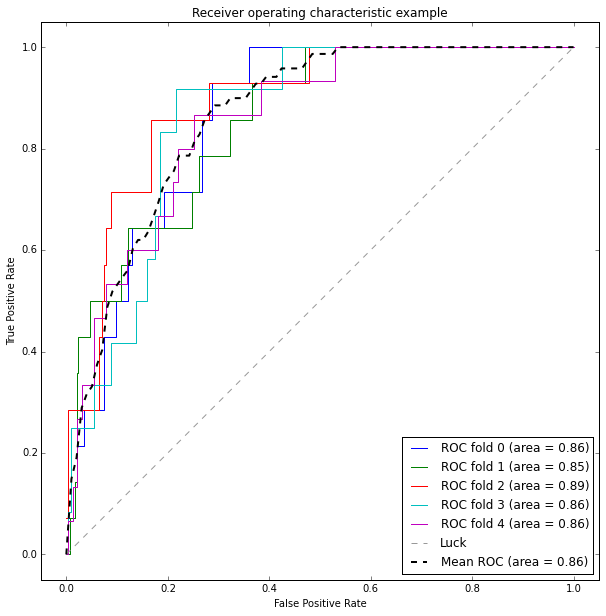

In [27]:
mean_tpr = 0.0
mean_fpr = np.linspace(0, 1, 100)
all_tpr = []

plt.figure(figsize=(10,10))

for i, (train, test) in enumerate(cv):
    probas_ = classifier.fit(X_bon_best.ix[train], y_bon_train.ix[train]).predict_proba(X_bon_best.ix[test])
    # Compute ROC curve and area the curve
    fpr, tpr, thresholds = roc_curve(y_bon_train.ix[test], probas_[:, 1])
    mean_tpr += interp(mean_fpr, fpr, tpr)
    mean_tpr[0] = 0.0
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw=1, label='ROC fold %d (area = %0.2f)' % (i, roc_auc))

plt.plot([0, 1], [0, 1], '--', color=(0.6, 0.6, 0.6), label='Luck')

mean_tpr /= len(cv)
mean_tpr[-1] = 1.0
bon_best_thresh = thresholds[np.argmax(mean_tpr - mean_fpr)]
mean_auc = auc(mean_fpr, mean_tpr)
plt.plot(mean_fpr, mean_tpr, 'k--',
         label='Mean ROC (area = %0.2f)' % mean_auc, lw=2)

plt.xlim([-0.05, 1.05])
plt.ylim([-0.05, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic example')
plt.legend(loc="lower right")

In [30]:
X_bon_test = pd.DataFrame(bon_scale_fit.transform(X_bon_test).transpose()[best_bon_cols].transpose(), columns = X_bon_test.columns[best_bon_cols])

In [31]:
bon_probas = classifier.fit(X_bon_best, y_bon_train).predict_proba(X_bon_test)
X_bon_pred = []
for row in bon_probas:
    if row[1] > bon_best_thresh:
        X_bon_pred.append(1)
    else:
        X_bon_pred.append(0)

In [32]:
accuracy_score(X_bon_pred, y_bon_test)

0.91456310679611652

In [33]:
precision_score(X_bon_pred, y_bon_test)

0.33333333333333331

In [34]:
recall_score(X_bon_pred, y_bon_test)

0.15789473684210525

In [35]:
f1_score(X_bon_pred, y_bon_test)

0.21428571428571427

# ULTRA MUSIC FESTIVAL

In [48]:
y_ult, X_ult = df.ult_2015, df.ix[:, 'fans':'noi_counts']
X_ult_train, X_ult_test, y_ult_train, y_ult_test = train_test_split(X_ult, y_ult, test_size = 0.25, random_state = 4444)
ult_scale_fit = StandardScaler().fit(X_ult_train)
X_ult_train_scaled = pd.DataFrame(ult_scale_fit.transform(X_ult_train), columns = X_ult_train.columns)
new_ult_features = SelectKBest(f_classif, k = 10)
X_ult_best = new_ult_features.fit_transform(X_ult_train_scaled, y_ult_train)
best_ult_cols = new_ult_features.get_support(True)
X_ult_best = pd.DataFrame(X_ult_best, columns = X_ult.columns[best_ult_cols])
X_ult.columns[best_ult_cols]

Index([u'2015_shows', u'2014_shows', u'2013_shows', u'miles', u'jazz',
       u'electro house', u'rock', u'bon_counts', u'ult_counts', u'sxs_counts'],
      dtype='object')

In [49]:
cw_range = [{1:1-cw, 0:cw} for cw in np.arange(.01, 1.0, .1)]
gamma_range = np.logspace(-9, 3, 9)
param_grid = dict(gamma=gamma_range, class_weight=cw_range)
cv = ShuffleSplit(len(y_ult_train), n_iter=5, test_size=0.2, random_state=42)
for score in ['accuracy','precision', 'recall']:
    grid = GridSearchCV(SVC(kernel = 'rbf'), param_grid=param_grid, cv=cv, scoring = score, verbose= 10)
    grid.fit(X_ult_best, y_ult_train)
    print("The best parameters are %s with a score of %0.2f"
          % (grid.best_params_, grid.best_score_))

Fitting 5 folds for each of 90 candidates, totalling 450 fits
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.009709 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.006472 -   0.1s

[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.2s



[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.983819 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.003236 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.983819 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.009709 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.006472 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999

[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.4s
[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.6s



[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.003236 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.983819 -   0.1s
[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.009709 -   0.1s
[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.006472 -   0.1s
[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.983819 -   0.1s
[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.00323

[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    0.9s
[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    1.3s



[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.003236 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.983819 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.009709 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.006472 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.983819 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.00323

[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    1.8s
[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    2.2s



[CV] gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.977346 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.320388 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.983819 -   0.1s
[CV] gamma=31.6227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=31.6227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.029126 -   0.1s
[CV] gamma=31.6227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=31.6227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.006472 -   0.1s
[CV] gamma=31.6227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=31.6227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.983819 -   0.1s


[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    3.0s
[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    3.3s



[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.990291 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.993528 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.983819 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.996764 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.983819 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.990291 -   0.0s
[CV] gam

[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    3.4s
[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    3.5s



[CV] gamma=0.001, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=0.001, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.983819 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.990291 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.993528 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.983819 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.996764 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.11, 1

[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    4.4s
[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    4.9s



[CV] gamma=3.16227766017e-08, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.993528 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.983819 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.996764 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.983819 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=1e-06, class_weight={0: 0.21000000000000002, 1: 0.790000000000

[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    5.0s
[Parallel(n_jobs=1)]: Done 128 jobs       | elapsed:    5.6s



[CV] gamma=31.6227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=31.6227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.996764 -   0.1s
[CV] gamma=31.6227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=31.6227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.983819 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=1000.0, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.990291 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=1000.0, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.993528 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=1000.0, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.983819 -   0.1s
[CV] gamma=1000.0, class_w

[Parallel(n_jobs=1)]: Done 145 jobs       | elapsed:    6.3s
[Parallel(n_jobs=1)]: Done 162 jobs       | elapsed:    6.4s



[CV] gamma=0.001, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=0.001, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.996764 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=0.001, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.983819 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.990291 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.993528 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.983819 -   0.0s
[CV]

[Parallel(n_jobs=1)]: Done 181 jobs       | elapsed:    7.4s
[Parallel(n_jobs=1)]: Done 200 jobs       | elapsed:    7.5s



[CV] gamma=3.16227766017e-05, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.996764 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.983819 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=0.001, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.990291 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=0.001, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.993528 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=0.001, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.983819 -   0.0s
[CV] gamma=0.001

[Parallel(n_jobs=1)]: Done 221 jobs       | elapsed:    8.2s
[Parallel(n_jobs=1)]: Done 242 jobs       | elapsed:    8.5s



[CV] gamma=1e-06, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1e-06, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.990291 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1e-06, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.993528 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1e-06, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.983819 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1e-06, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.996764 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1e-06, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.983819 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.510000000000000

[Parallel(n_jobs=1)]: Done 265 jobs       | elapsed:    9.2s
[Parallel(n_jobs=1)]: Done 288 jobs       | elapsed:    9.6s



[CV] gamma=3.16227766017e-05, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999}, score=0.983819 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999}, score=0.996764 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999}, score=0.983819 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999} 
[CV]  gamma=0.001, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999}, score=0.990291 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999} 
[CV]  gamma=0.001, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999}, score=0.993528 -   0.0s
[CV] gamma=0

[Parallel(n_jobs=1)]: Done 313 jobs       | elapsed:   10.6s
[Parallel(n_jobs=1)]: Done 338 jobs       | elapsed:   10.8s



[CV] gamma=0.001, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=0.001, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.983819 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=0.001, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.996764 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=0.001, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.983819 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.990291 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.993528 -   0.0s
[CV] gamma=0.03162277660

[Parallel(n_jobs=1)]: Done 365 jobs       | elapsed:   11.7s
[Parallel(n_jobs=1)]: Done 392 jobs       | elapsed:   12.0s



[CV] gamma=1.0, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1.0, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.993528 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1.0, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.983819 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1.0, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.996764 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1.0, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.983819 -   0.0s
[CV] gamma=31.6227766017, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=31.6227766017, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.990291 -   0.1s
[CV] gamma=31.6227766017, class_weight={0: 0.81000000000000005, 

[Parallel(n_jobs=1)]: Done 421 jobs       | elapsed:   12.8s
[Parallel(n_jobs=1)]: Done 450 jobs       | elapsed:   13.7s



[CV] gamma=1000.0, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969} 
[CV]  gamma=1000.0, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969}, score=0.983819 -   0.0s
The best parameters are {'gamma': 1.0000000000000001e-09, 'class_weight': {0: 0.11, 1: 0.89000000000000001}} with a score of 0.99
Fitting 5 folds for each of 90 candidates, totalling 450 fits
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.009709 -   0.1s

[Parallel(n_jobs=1)]: Done 450 out of 450 | elapsed:   13.7s finished
[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.1s



[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.006472 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.003236 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s

[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.3s



[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.009709 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.006472 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.003236 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, clas

[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.5s
[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    0.9s



[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.003236 -   0.1s
[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.009709 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.006472 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 

[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    1.2s
[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    1.7s



[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.039216 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.037037 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.071429 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.018519 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.088889 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=1.0, class_weight={0: 0.01, 1: 

[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    2.1s
[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    2.8s



[CV] gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.009709 -   0.0s
[CV] gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.006472 -   0.0s
[CV] gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.003236 -   0.0s
[CV] gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1e-09, clas

[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    3.1s
[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    3.2s



[CV] gamma=1e-06, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-06, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-05, clas

[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    3.3s
[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    4.0s



[CV] gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001} ....
[CV]  gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001} ....
[CV]  gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001} ....
[CV]  gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001} ....
[CV]  gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001} ....
[CV]  gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=1e-09, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.

[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    4.3s
[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    4.5s



[CV] gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0:

[Parallel(n_jobs=1)]: Done 128 jobs       | elapsed:    5.0s
[Parallel(n_jobs=1)]: Done 145 jobs       | elapsed:    5.4s



[CV] gamma=3.16227766017e-08, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.310

[Parallel(n_jobs=1)]: Done 162 jobs       | elapsed:    5.6s
[Parallel(n_jobs=1)]: Done 181 jobs       | elapsed:    6.5s



[CV] gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.410000000000000

[Parallel(n_jobs=1)]: Done 200 jobs       | elapsed:    6.7s
[Parallel(n_jobs=1)]: Done 221 jobs       | elapsed:    7.4s



[CV] gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1e-09, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.51000000000000001, 

[Parallel(n_jobs=1)]: Done 242 jobs       | elapsed:    7.7s
[Parallel(n_jobs=1)]: Done 265 jobs       | elapsed:    8.4s



[CV] gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.0s
[CV] gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.0s
[CV] gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.6100000000000001,

[Parallel(n_jobs=1)]: Done 288 jobs       | elapsed:    8.8s
[Parallel(n_jobs=1)]: Done 313 jobs       | elapsed:    9.7s



[CV] gamma=1000.0, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.2899999

[Parallel(n_jobs=1)]: Done 338 jobs       | elapsed:    9.9s
[Parallel(n_jobs=1)]: Done 365 jobs       | elapsed:   10.8s



[CV] gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.810000000000000

[Parallel(n_jobs=1)]: Done 392 jobs       | elapsed:   11.1s
[Parallel(n_jobs=1)]: Done 421 jobs       | elapsed:   12.0s



[CV] gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969}, score=0.000000 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969} 
[CV]  gamma=0.001, class_weight={0: 0.91000000000000003, 1: 0.089

[Parallel(n_jobs=1)]: Done 450 jobs       | elapsed:   12.8s
[Parallel(n_jobs=1)]: Done 450 out of 450 | elapsed:   12.8s finished
[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.1s



[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s

[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.3s



[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, clas

[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.5s
[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    0.8s



[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 

[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    1.2s
[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    1.6s



[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.666667 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.800000 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.800000 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=1.0, class_weight={0: 0.01, 1: 

[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    2.1s
[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    2.7s



[CV] gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.0s
[CV] gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.0s
[CV] gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1e-09, clas

[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    3.0s
[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    3.1s



[CV] gamma=1e-06, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-06, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-06, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.11, 

[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    3.3s
[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    4.0s



[CV] gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001} ....
[CV]  gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001} ....
[CV]  gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001} ....
[CV]  gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001} ....
[CV]  gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001} ....
[CV]  gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=1e-09, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.

[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    4.3s
[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    4.5s



[CV] gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.0s
[CV]

[Parallel(n_jobs=1)]: Done 128 jobs       | elapsed:    5.0s
[Parallel(n_jobs=1)]: Done 145 jobs       | elapsed:    5.5s



[CV] gamma=3.16227766017e-08, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.000000 -

[Parallel(n_jobs=1)]: Done 162 jobs       | elapsed:    5.6s
[Parallel(n_jobs=1)]: Done 181 jobs       | elapsed:    6.6s



[CV] gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.410000000000000

[Parallel(n_jobs=1)]: Done 200 jobs       | elapsed:    6.7s
[Parallel(n_jobs=1)]: Done 221 jobs       | elapsed:    7.5s



[CV] gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.51000000000000001

[Parallel(n_jobs=1)]: Done 242 jobs       | elapsed:    7.8s
[Parallel(n_jobs=1)]: Done 265 jobs       | elapsed:    8.5s



[CV] gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.0s
[CV] gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.0s
[CV] gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.6100000000000001,

[Parallel(n_jobs=1)]: Done 288 jobs       | elapsed:    8.9s
[Parallel(n_jobs=1)]: Done 313 jobs       | elapsed:    9.9s



[CV] gamma=1000.0, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999}, score=0.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.2899999

[Parallel(n_jobs=1)]: Done 338 jobs       | elapsed:   10.2s
[Parallel(n_jobs=1)]: Done 365 jobs       | elapsed:   11.4s



[CV] gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.810000000000000

[Parallel(n_jobs=1)]: Done 392 jobs       | elapsed:   11.7s
[Parallel(n_jobs=1)]: Done 421 jobs       | elapsed:   12.5s



[CV]  gamma=1e-06, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969} 
[CV]  gamma=1e-06, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969} 
[CV]  gamma=1e-06, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969} 
[CV]  gamma=1e-06, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969} 
[CV]  gamma=1e-06, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969} 
[CV]  gamma=3.16227766017e-05, class_weigh

[Parallel(n_jobs=1)]: Done 450 jobs       | elapsed:   13.6s
[Parallel(n_jobs=1)]: Done 450 out of 450 | elapsed:   13.6s finished


The best parameters are {'gamma': 1.0e-09, 'class_weight': {0: 0.11, 1: 0.89}} with an accuracy score of 0.99.

The best parameters are {'gamma': 0.03162, 'class_weight': {0: 0.01, 1: 0.99}} with a precision score of 0.05.

The best parameters are {'gamma': 0.03162, 'class_weight': {0: 0.01, 1: 0.99}} with a recall score of 0.85.

In [50]:
cw_range = [{1:1-cw, 0:cw} for cw in np.arange(.01, .03, .001)]
gamma_range = np.logspace(-2, -1, 9)
param_grid = dict(gamma=gamma_range, class_weight=cw_range)
cv = ShuffleSplit(len(y_ult_train), n_iter=5, test_size=0.2, random_state=42)
for score in ['accuracy','precision', 'recall']:
    grid = GridSearchCV(SVC(kernel = 'rbf'), param_grid=param_grid, cv=cv, scoring = score, verbose= 10)
    grid.fit(X_ult_best, y_ult_train)
    print("The best parameters are %s with a score of %0.2f"
          % (grid.best_params_, grid.best_score_))

Fitting 5 folds for each of 180 candidates, totalling 900 fits
[CV] gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999} ......
[CV]  gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.857605 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999} ......
[CV]  gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.815534 -   0.1s

[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.1s



[CV] gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999} ......
[CV]  gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.854369 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999} ......
[CV]  gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.825243 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999} ......
[CV]  gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.877023 -   0.1s
[CV] gamma=0.0133352143216, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.841424 -   0.1s
[CV] gamma=0.0133352143216, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.805825 -   0.1s
[CV] gamma=0.0133352143216, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.8

[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.5s



[CV] gamma=0.0133352143216, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.822006 -   0.1s
[CV] gamma=0.0133352143216, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.873786 -   0.1s
[CV] gamma=0.0177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.838188 -   0.0s
[CV] gamma=0.0177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.831715 -   0.1s
[CV] gamma=0.0177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.828479 -   0.1s
[CV] gamma=0.0177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0177827941004, class_wei

[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    0.8s
[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    1.1s



[CV] gamma=0.0237137370566, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0237137370566, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.828479 -   0.0s
[CV] gamma=0.0237137370566, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0237137370566, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.831715 -   0.1s
[CV] gamma=0.0237137370566, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0237137370566, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.864078 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.838188 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.831715 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_wei

[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    1.6s
[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    1.9s



[CV] gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.828479 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.822006 -   0.1s
[CV] gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.857605 -   0.1s
[CV] gamma=0.0749894209332, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0749894209332, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.834951 -   0.0s
[CV] gamma=0.0749894209332, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0749894209332, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.831715 -   0.1s
[CV] gamma=0.0749894209332, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0749894209332, class_weight={0

[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    2.4s
[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    3.0s



[CV] gamma=0.0133352143216, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score=0.844660 -   0.1s
[CV] gamma=0.0133352143216, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score=0.838188 -   0.1s
[CV] gamma=0.0133352143216, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score=0.841424 -   0.1s
[CV] gamma=0.0133352143216, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score=0.838188 -   0.1s
[CV] gamma=0.0133352143216, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.010999999999999999, 1: 

[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    3.6s
[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    4.1s



[CV] gamma=0.0421696503429, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score=0.828479 -   0.0s
[CV] gamma=0.0421696503429, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score=0.831715 -   0.0s
[CV] gamma=0.0421696503429, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score=0.867314 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=0.056234132519, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score=0.844660 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=0.056234132519, class_weight={0: 0.010999999999999999, 1: 0.98

[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    4.6s
[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    5.2s



[CV] gamma=0.0133352143216, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999}, score=0.838188 -   0.1s
[CV] gamma=0.0133352143216, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999}, score=0.880259 -   0.0s
[CV] gamma=0.0177827941004, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999}, score=0.847896 -   0.0s
[CV] gamma=0.0177827941004, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999}, score=0.841424 -   0.0s
[CV] gamma=0.0177827941004, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.011999999999999999, 1: 

[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    5.9s
[Parallel(n_jobs=1)]: Done 128 jobs       | elapsed:    6.5s



[CV] gamma=0.0749894209332, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999} 
[CV]  gamma=0.0749894209332, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999}, score=0.834951 -   0.0s
[CV] gamma=0.0749894209332, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999} 
[CV]  gamma=0.0749894209332, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999}, score=0.870550 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999} 
[CV]  gamma=0.1, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999}, score=0.854369 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999} 
[CV]  gamma=0.1, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999}, score=0.838188 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999} 
[CV]  gamma=0.1, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999}, score=0.864078 -   0.0s
[CV] gamma=0.1, class_weig

[Parallel(n_jobs=1)]: Done 145 jobs       | elapsed:    7.2s
[Parallel(n_jobs=1)]: Done 162 jobs       | elapsed:    7.9s



[CV] gamma=0.0421696503429, class_weight={0: 0.012999999999999998, 1: 0.98699999999999999} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.012999999999999998, 1: 0.98699999999999999}, score=0.844660 -   0.0s
[CV] gamma=0.0421696503429, class_weight={0: 0.012999999999999998, 1: 0.98699999999999999} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.012999999999999998, 1: 0.98699999999999999}, score=0.838188 -   0.0s
[CV] gamma=0.0421696503429, class_weight={0: 0.012999999999999998, 1: 0.98699999999999999} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.012999999999999998, 1: 0.98699999999999999}, score=0.847896 -   0.0s
[CV] gamma=0.0421696503429, class_weight={0: 0.012999999999999998, 1: 0.98699999999999999} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.012999999999999998, 1: 0.98699999999999999}, score=0.873786 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.012999999999999998, 1: 0.98699999999999999} 
[CV]  gamma=0.056234132519, class_weight={0: 0.012999999999999998, 1: 0.

[Parallel(n_jobs=1)]: Done 181 jobs       | elapsed:    8.7s
[Parallel(n_jobs=1)]: Done 200 jobs       | elapsed:    9.5s



[CV] gamma=0.0316227766017, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999}, score=0.854369 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999}, score=0.851133 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999}, score=0.841424 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999}, score=0.851133 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.013999999999999997, 1: 

[Parallel(n_jobs=1)]: Done 221 jobs       | elapsed:   10.3s
[Parallel(n_jobs=1)]: Done 242 jobs       | elapsed:   11.1s



[CV] gamma=0.0237137370566, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999} 
[CV]  gamma=0.0237137370566, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999}, score=0.844660 -   0.0s
[CV] gamma=0.0237137370566, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999} 
[CV]  gamma=0.0237137370566, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999}, score=0.854369 -   0.0s
[CV] gamma=0.0237137370566, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999} 
[CV]  gamma=0.0237137370566, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999}, score=0.873786 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999}, score=0.857605 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.014999999999999996, 1: 

[Parallel(n_jobs=1)]: Done 265 jobs       | elapsed:   12.0s
[Parallel(n_jobs=1)]: Done 288 jobs       | elapsed:   12.9s



[CV] gamma=0.0237137370566, class_weight={0: 0.015999999999999993, 1: 0.98399999999999999} 
[CV]  gamma=0.0237137370566, class_weight={0: 0.015999999999999993, 1: 0.98399999999999999}, score=0.851133 -   0.0s
[CV] gamma=0.0237137370566, class_weight={0: 0.015999999999999993, 1: 0.98399999999999999} 
[CV]  gamma=0.0237137370566, class_weight={0: 0.015999999999999993, 1: 0.98399999999999999}, score=0.854369 -   0.0s
[CV] gamma=0.0237137370566, class_weight={0: 0.015999999999999993, 1: 0.98399999999999999} 
[CV]  gamma=0.0237137370566, class_weight={0: 0.015999999999999993, 1: 0.98399999999999999}, score=0.877023 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.015999999999999993, 1: 0.98399999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.015999999999999993, 1: 0.98399999999999999}, score=0.857605 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.015999999999999993, 1: 0.98399999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.015999999999999993, 1: 

[Parallel(n_jobs=1)]: Done 313 jobs       | elapsed:   13.7s
[Parallel(n_jobs=1)]: Done 338 jobs       | elapsed:   14.7s



[CV] gamma=0.0316227766017, class_weight={0: 0.016999999999999994, 1: 0.98299999999999998} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.016999999999999994, 1: 0.98299999999999998}, score=0.854369 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.016999999999999994, 1: 0.98299999999999998} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.016999999999999994, 1: 0.98299999999999998}, score=0.854369 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.016999999999999994, 1: 0.98299999999999998} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.016999999999999994, 1: 0.98299999999999998}, score=0.877023 -   0.0s
[CV] gamma=0.0421696503429, class_weight={0: 0.016999999999999994, 1: 0.98299999999999998} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.016999999999999994, 1: 0.98299999999999998}, score=0.857605 -   0.0s
[CV] gamma=0.0421696503429, class_weight={0: 0.016999999999999994, 1: 0.98299999999999998} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.016999999999999994, 1: 

[Parallel(n_jobs=1)]: Done 365 jobs       | elapsed:   15.6s
[Parallel(n_jobs=1)]: Done 392 jobs       | elapsed:   16.5s



[CV] gamma=0.056234132519, class_weight={0: 0.017999999999999995, 1: 0.98199999999999998} 
[CV]  gamma=0.056234132519, class_weight={0: 0.017999999999999995, 1: 0.98199999999999998}, score=0.867314 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.017999999999999995, 1: 0.98199999999999998} 
[CV]  gamma=0.056234132519, class_weight={0: 0.017999999999999995, 1: 0.98199999999999998}, score=0.860841 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.017999999999999995, 1: 0.98199999999999998} 
[CV]  gamma=0.056234132519, class_weight={0: 0.017999999999999995, 1: 0.98199999999999998}, score=0.857605 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.017999999999999995, 1: 0.98199999999999998} 
[CV]  gamma=0.056234132519, class_weight={0: 0.017999999999999995, 1: 0.98199999999999998}, score=0.893204 -   0.0s
[CV] gamma=0.0749894209332, class_weight={0: 0.017999999999999995, 1: 0.98199999999999998} 
[CV]  gamma=0.0749894209332, class_weight={0: 0.017999999999999995, 1: 0.981999

[Parallel(n_jobs=1)]: Done 421 jobs       | elapsed:   17.5s
[Parallel(n_jobs=1)]: Done 450 jobs       | elapsed:   18.4s



[CV] gamma=0.1, class_weight={0: 0.018999999999999993, 1: 0.98099999999999998} 
[CV]  gamma=0.1, class_weight={0: 0.018999999999999993, 1: 0.98099999999999998}, score=0.919094 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.01999999999999999, 1: 0.97999999999999998} 
[CV]  gamma=0.01, class_weight={0: 0.01999999999999999, 1: 0.97999999999999998}, score=0.922330 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.01999999999999999, 1: 0.97999999999999998} 
[CV]  gamma=0.01, class_weight={0: 0.01999999999999999, 1: 0.97999999999999998}, score=0.909385 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.01999999999999999, 1: 0.97999999999999998} 
[CV]  gamma=0.01, class_weight={0: 0.01999999999999999, 1: 0.97999999999999998}, score=0.987055 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.01999999999999999, 1: 0.97999999999999998} 
[CV]  gamma=0.01, class_weight={0: 0.01999999999999999, 1: 0.97999999999999998}, score=0.912621 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.01999999999999999, 1: 0.97999999999999

[Parallel(n_jobs=1)]: Done 481 jobs       | elapsed:   19.4s
[Parallel(n_jobs=1)]: Done 512 jobs       | elapsed:   20.4s



[CV] gamma=0.0237137370566, class_weight={0: 0.020999999999999991, 1: 0.97899999999999998} 
[CV]  gamma=0.0237137370566, class_weight={0: 0.020999999999999991, 1: 0.97899999999999998}, score=0.877023 -   0.0s
[CV] gamma=0.0237137370566, class_weight={0: 0.020999999999999991, 1: 0.97899999999999998} 
[CV]  gamma=0.0237137370566, class_weight={0: 0.020999999999999991, 1: 0.97899999999999998}, score=0.880259 -   0.0s
[CV] gamma=0.0237137370566, class_weight={0: 0.020999999999999991, 1: 0.97899999999999998} 
[CV]  gamma=0.0237137370566, class_weight={0: 0.020999999999999991, 1: 0.97899999999999998}, score=0.867314 -   0.0s
[CV] gamma=0.0237137370566, class_weight={0: 0.020999999999999991, 1: 0.97899999999999998} 
[CV]  gamma=0.0237137370566, class_weight={0: 0.020999999999999991, 1: 0.97899999999999998}, score=0.919094 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.020999999999999991, 1: 0.97899999999999998} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.020999999999999991, 1: 

[Parallel(n_jobs=1)]: Done 545 jobs       | elapsed:   21.4s
[Parallel(n_jobs=1)]: Done 578 jobs       | elapsed:   22.4s



[CV] gamma=0.0749894209332, class_weight={0: 0.021999999999999992, 1: 0.97799999999999998} 
[CV]  gamma=0.0749894209332, class_weight={0: 0.021999999999999992, 1: 0.97799999999999998}, score=0.909385 -   0.0s
[CV] gamma=0.0749894209332, class_weight={0: 0.021999999999999992, 1: 0.97799999999999998} 
[CV]  gamma=0.0749894209332, class_weight={0: 0.021999999999999992, 1: 0.97799999999999998}, score=0.877023 -   0.0s
[CV] gamma=0.0749894209332, class_weight={0: 0.021999999999999992, 1: 0.97799999999999998} 
[CV]  gamma=0.0749894209332, class_weight={0: 0.021999999999999992, 1: 0.97799999999999998}, score=0.928803 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.021999999999999992, 1: 0.97799999999999998} 
[CV]  gamma=0.1, class_weight={0: 0.021999999999999992, 1: 0.97799999999999998}, score=0.906149 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.021999999999999992, 1: 0.97799999999999998} 
[CV]  gamma=0.1, class_weight={0: 0.021999999999999992, 1: 0.97799999999999998}, score=0.919094 -   0.0s
[C

[Parallel(n_jobs=1)]: Done 613 jobs       | elapsed:   23.4s
[Parallel(n_jobs=1)]: Done 648 jobs       | elapsed:   24.4s



[CV] gamma=0.0237137370566, class_weight={0: 0.023999999999999987, 1: 0.97599999999999998} 
[CV]  gamma=0.0237137370566, class_weight={0: 0.023999999999999987, 1: 0.97599999999999998}, score=0.925566 -   0.0s
[CV] gamma=0.0237137370566, class_weight={0: 0.023999999999999987, 1: 0.97599999999999998} 
[CV]  gamma=0.0237137370566, class_weight={0: 0.023999999999999987, 1: 0.97599999999999998}, score=0.873786 -   0.0s
[CV] gamma=0.0237137370566, class_weight={0: 0.023999999999999987, 1: 0.97599999999999998} 
[CV]  gamma=0.0237137370566, class_weight={0: 0.023999999999999987, 1: 0.97599999999999998}, score=0.944984 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.023999999999999987, 1: 0.97599999999999998} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.023999999999999987, 1: 0.97599999999999998}, score=0.877023 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.023999999999999987, 1: 0.97599999999999998} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.023999999999999987, 1: 

[Parallel(n_jobs=1)]: Done 685 jobs       | elapsed:   25.4s
[Parallel(n_jobs=1)]: Done 722 jobs       | elapsed:   26.4s



[CV] gamma=0.01, class_weight={0: 0.025999999999999988, 1: 0.97399999999999998} 
[CV]  gamma=0.01, class_weight={0: 0.025999999999999988, 1: 0.97399999999999998}, score=0.957929 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.025999999999999988, 1: 0.97399999999999998} 
[CV]  gamma=0.01, class_weight={0: 0.025999999999999988, 1: 0.97399999999999998}, score=0.983819 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.025999999999999988, 1: 0.97399999999999998} 
[CV]  gamma=0.01, class_weight={0: 0.025999999999999988, 1: 0.97399999999999998}, score=0.951456 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.025999999999999988, 1: 0.97399999999999998} 
[CV]  gamma=0.01, class_weight={0: 0.025999999999999988, 1: 0.97399999999999998}, score=0.983819 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.025999999999999988, 1: 0.97399999999999998} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.025999999999999988, 1: 0.97399999999999998}, score=0.928803 -   0.0s
[CV] gamma=0.0133352143216, class_weight={

[Parallel(n_jobs=1)]: Done 761 jobs       | elapsed:   27.4s
[Parallel(n_jobs=1)]: Done 800 jobs       | elapsed:   28.4s



[CV] gamma=0.056234132519, class_weight={0: 0.026999999999999989, 1: 0.97299999999999998} 
[CV]  gamma=0.056234132519, class_weight={0: 0.026999999999999989, 1: 0.97299999999999998}, score=0.938511 -   0.0s
[CV] gamma=0.0749894209332, class_weight={0: 0.026999999999999989, 1: 0.97299999999999998} 
[CV]  gamma=0.0749894209332, class_weight={0: 0.026999999999999989, 1: 0.97299999999999998}, score=0.925566 -   0.0s
[CV] gamma=0.0749894209332, class_weight={0: 0.026999999999999989, 1: 0.97299999999999998} 
[CV]  gamma=0.0749894209332, class_weight={0: 0.026999999999999989, 1: 0.97299999999999998}, score=0.922330 -   0.0s
[CV] gamma=0.0749894209332, class_weight={0: 0.026999999999999989, 1: 0.97299999999999998} 
[CV]  gamma=0.0749894209332, class_weight={0: 0.026999999999999989, 1: 0.97299999999999998}, score=0.919094 -   0.0s
[CV] gamma=0.0749894209332, class_weight={0: 0.026999999999999989, 1: 0.97299999999999998} 
[CV]  gamma=0.0749894209332, class_weight={0: 0.026999999999999989, 1: 0.

[Parallel(n_jobs=1)]: Done 841 jobs       | elapsed:   29.4s
[Parallel(n_jobs=1)]: Done 882 jobs       | elapsed:   30.4s



[CV] gamma=0.0421696503429, class_weight={0: 0.028999999999999984, 1: 0.97099999999999997} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.028999999999999984, 1: 0.97099999999999997}, score=0.909385 -   0.0s
[CV] gamma=0.0421696503429, class_weight={0: 0.028999999999999984, 1: 0.97099999999999997} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.028999999999999984, 1: 0.97099999999999997}, score=0.919094 -   0.0s
[CV] gamma=0.0421696503429, class_weight={0: 0.028999999999999984, 1: 0.97099999999999997} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.028999999999999984, 1: 0.97099999999999997}, score=0.935275 -   0.0s
[CV] gamma=0.0421696503429, class_weight={0: 0.028999999999999984, 1: 0.97099999999999997} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.028999999999999984, 1: 0.97099999999999997}, score=0.889968 -   0.0s
[CV] gamma=0.0421696503429, class_weight={0: 0.028999999999999984, 1: 0.97099999999999997} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.028999999999999984, 1: 

[Parallel(n_jobs=1)]: Done 900 out of 900 | elapsed:   30.8s finished
[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.1s



[CV] gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999} ......
[CV]  gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.033898 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999} ......
[CV]  gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.083333 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999} ......
[CV]  gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.018182 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999} ......
[CV]  gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.097561 -   0.1s

[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.3s



[CV] gamma=0.0133352143216, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.040000 -   0.1s
[CV] gamma=0.0133352143216, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032258 -   0.1s
[CV] gamma=0.0133352143216, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.074074 -   0.1s
[CV] gamma=0.0133352143216, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.017857 -   0.1s
[CV] gamma=0.0133352143216, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.095238 -   0.1s
[CV] gamma=0.0177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0177827941004, class_wei

[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.5s
[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    0.7s



[CV] gamma=0.0177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.071429 -   0.0s
[CV] gamma=0.0177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.018519 -   0.1s
[CV] gamma=0.0177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.088889 -   0.0s
[CV] gamma=0.0237137370566, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0237137370566, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.038462 -   0.0s
[CV] gamma=0.0237137370566, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0237137370566, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.037037 -   0.1s
[CV] gamma=0.0237137370566, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0237137370566, class_wei

[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    1.0s
[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    1.3s



[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.088889 -   0.0s
[CV] gamma=0.0421696503429, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.040000 -   0.0s
[CV] gamma=0.0421696503429, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.035714 -   0.1s
[CV] gamma=0.0421696503429, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.071429 -   0.0s
[CV] gamma=0.0421696503429, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.017857 -   0.0s
[CV] gamma=0.0421696503429, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.085106 -   0.0s
[CV] gamma=0.

[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    1.6s
[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    2.0s



[CV] gamma=0.1, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=0.1, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.037037 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=0.1, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.081633 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=0.1, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.017544 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=0.1, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.086957 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=0.01, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score=0.045455 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=0.01, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score=0.0

[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    2.5s
[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    3.0s



[CV] gamma=0.0237137370566, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=0.0237137370566, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score=0.037736 -   0.0s
[CV] gamma=0.0237137370566, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=0.0237137370566, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score=0.055556 -   0.0s
[CV] gamma=0.0237137370566, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=0.0237137370566, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score=0.019608 -   0.0s
[CV] gamma=0.0237137370566, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=0.0237137370566, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score=0.090909 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.010999999999999999, 1: 

[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    3.5s
[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    4.1s



[CV] gamma=0.0749894209332, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=0.0749894209332, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score=0.090909 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=0.1, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score=0.039216 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=0.1, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score=0.038462 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=0.1, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score=0.088889 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=0.1, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score=0.019231 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.010999999999999

[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    4.7s
[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    5.4s



[CV] gamma=0.0316227766017, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999}, score=0.020833 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999}, score=0.093023 -   0.0s
[CV] gamma=0.0421696503429, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999}, score=0.040000 -   0.0s
[CV] gamma=0.0421696503429, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999}, score=0.039216 -   0.0s
[CV] gamma=0.0421696503429, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.011999999999999999, 1: 

[Parallel(n_jobs=1)]: Done 128 jobs       | elapsed:    6.0s
[Parallel(n_jobs=1)]: Done 145 jobs       | elapsed:    6.7s



[CV] gamma=0.0177827941004, class_weight={0: 0.012999999999999998, 1: 0.98699999999999999} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.012999999999999998, 1: 0.98699999999999999}, score=0.022727 -   0.0s
[CV] gamma=0.0177827941004, class_weight={0: 0.012999999999999998, 1: 0.98699999999999999} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.012999999999999998, 1: 0.98699999999999999}, score=0.040816 -   0.0s
[CV] gamma=0.0177827941004, class_weight={0: 0.012999999999999998, 1: 0.98699999999999999} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.012999999999999998, 1: 0.98699999999999999}, score=0.062500 -   0.0s
[CV] gamma=0.0177827941004, class_weight={0: 0.012999999999999998, 1: 0.98699999999999999} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.012999999999999998, 1: 0.98699999999999999}, score=0.020833 -   0.0s
[CV] gamma=0.0177827941004, class_weight={0: 0.012999999999999998, 1: 0.98699999999999999} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.012999999999999998, 1: 

[Parallel(n_jobs=1)]: Done 162 jobs       | elapsed:    7.5s
[Parallel(n_jobs=1)]: Done 181 jobs       | elapsed:    8.2s



[CV] gamma=0.01, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999} 
[CV]  gamma=0.01, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999}, score=0.054054 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999} 
[CV]  gamma=0.01, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999}, score=0.093750 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999} 
[CV]  gamma=0.01, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999}, score=0.025000 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999} 
[CV]  gamma=0.01, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999}, score=0.120000 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999}, score=0.023256 -   0.0s
[CV] gamma=0.0133352143216, class_weight={

[Parallel(n_jobs=1)]: Done 200 jobs       | elapsed:    9.0s
[Parallel(n_jobs=1)]: Done 221 jobs       | elapsed:    9.8s



[CV] gamma=0.1, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999} 
[CV]  gamma=0.1, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999}, score=0.023256 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999} 
[CV]  gamma=0.1, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999}, score=0.021739 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999} 
[CV]  gamma=0.1, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999}, score=0.052632 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999} 
[CV]  gamma=0.1, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999}, score=0.021277 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999} 
[CV]  gamma=0.1, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999}, score=0.093750 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.014999999999999996, 1: 0.9849999999999

[Parallel(n_jobs=1)]: Done 242 jobs       | elapsed:   10.6s
[Parallel(n_jobs=1)]: Done 265 jobs       | elapsed:   11.5s



[CV] gamma=0.0749894209332, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999} 
[CV]  gamma=0.0749894209332, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999}, score=0.111111 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999} 
[CV]  gamma=0.1, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999}, score=0.025000 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999} 
[CV]  gamma=0.1, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999}, score=0.023256 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999} 
[CV]  gamma=0.1, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999}, score=0.028571 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999} 
[CV]  gamma=0.1, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999}, score=0.021277 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.014999999999999

[Parallel(n_jobs=1)]: Done 288 jobs       | elapsed:   12.3s
[Parallel(n_jobs=1)]: Done 313 jobs       | elapsed:   13.2s



[CV] gamma=0.1, class_weight={0: 0.015999999999999993, 1: 0.98399999999999999} 
[CV]  gamma=0.1, class_weight={0: 0.015999999999999993, 1: 0.98399999999999999}, score=0.029412 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.015999999999999993, 1: 0.98399999999999999} 
[CV]  gamma=0.1, class_weight={0: 0.015999999999999993, 1: 0.98399999999999999}, score=0.021277 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.015999999999999993, 1: 0.98399999999999999} 
[CV]  gamma=0.1, class_weight={0: 0.015999999999999993, 1: 0.98399999999999999}, score=0.076923 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.016999999999999994, 1: 0.98299999999999998} 
[CV]  gamma=0.01, class_weight={0: 0.016999999999999994, 1: 0.98299999999999998}, score=0.027778 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.016999999999999994, 1: 0.98299999999999998} 
[CV]  gamma=0.01, class_weight={0: 0.016999999999999994, 1: 0.98299999999999998}, score=0.060606 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.016999999999999994, 1: 0.982999999

[Parallel(n_jobs=1)]: Done 338 jobs       | elapsed:   14.2s
[Parallel(n_jobs=1)]: Done 365 jobs       | elapsed:   15.1s



[CV] gamma=0.0133352143216, class_weight={0: 0.017999999999999995, 1: 0.98199999999999998} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.017999999999999995, 1: 0.98199999999999998}, score=0.026316 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.017999999999999995, 1: 0.98199999999999998} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.017999999999999995, 1: 0.98199999999999998}, score=0.057143 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.017999999999999995, 1: 0.98199999999999998} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.017999999999999995, 1: 0.98199999999999998}, score=0.115385 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.017999999999999995, 1: 0.98199999999999998} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.017999999999999995, 1: 0.98199999999999998}, score=0.025000 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.017999999999999995, 1: 0.98199999999999998} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.017999999999999995, 1: 

[Parallel(n_jobs=1)]: Done 392 jobs       | elapsed:   16.0s
[Parallel(n_jobs=1)]: Done 421 jobs       | elapsed:   17.0s



[CV] gamma=0.0237137370566, class_weight={0: 0.018999999999999993, 1: 0.98099999999999998} 
[CV]  gamma=0.0237137370566, class_weight={0: 0.018999999999999993, 1: 0.98099999999999998}, score=0.024390 -   0.0s
[CV] gamma=0.0237137370566, class_weight={0: 0.018999999999999993, 1: 0.98099999999999998} 
[CV]  gamma=0.0237137370566, class_weight={0: 0.018999999999999993, 1: 0.98099999999999998}, score=0.065217 -   0.0s
[CV] gamma=0.0237137370566, class_weight={0: 0.018999999999999993, 1: 0.98099999999999998} 
[CV]  gamma=0.0237137370566, class_weight={0: 0.018999999999999993, 1: 0.98099999999999998}, score=0.022222 -   0.0s
[CV] gamma=0.0237137370566, class_weight={0: 0.018999999999999993, 1: 0.98099999999999998} 
[CV]  gamma=0.0237137370566, class_weight={0: 0.018999999999999993, 1: 0.98099999999999998}, score=0.114286 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.018999999999999993, 1: 0.98099999999999998} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.018999999999999993, 1: 

[Parallel(n_jobs=1)]: Done 450 jobs       | elapsed:   17.9s
[Parallel(n_jobs=1)]: Done 481 jobs       | elapsed:   18.9s



[CV] gamma=0.056234132519, class_weight={0: 0.01999999999999999, 1: 0.97999999999999998} 
[CV]  gamma=0.056234132519, class_weight={0: 0.01999999999999999, 1: 0.97999999999999998}, score=0.025641 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.01999999999999999, 1: 0.97999999999999998} 
[CV]  gamma=0.056234132519, class_weight={0: 0.01999999999999999, 1: 0.97999999999999998}, score=0.076923 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.01999999999999999, 1: 0.97999999999999998} 
[CV]  gamma=0.056234132519, class_weight={0: 0.01999999999999999, 1: 0.97999999999999998}, score=0.023810 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.01999999999999999, 1: 0.97999999999999998} 
[CV]  gamma=0.056234132519, class_weight={0: 0.01999999999999999, 1: 0.97999999999999998}, score=0.085714 -   0.0s
[CV] gamma=0.0749894209332, class_weight={0: 0.01999999999999999, 1: 0.97999999999999998} 
[CV]  gamma=0.0749894209332, class_weight={0: 0.01999999999999999, 1: 0.9799999999999999

[Parallel(n_jobs=1)]: Done 512 jobs       | elapsed:   19.9s
[Parallel(n_jobs=1)]: Done 545 jobs       | elapsed:   20.9s



[CV] gamma=0.0133352143216, class_weight={0: 0.021999999999999992, 1: 0.97799999999999998} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.021999999999999992, 1: 0.97799999999999998}, score=0.029412 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.021999999999999992, 1: 0.97799999999999998} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.021999999999999992, 1: 0.97799999999999998}, score=0.034483 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.021999999999999992, 1: 0.97799999999999998} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.021999999999999992, 1: 0.97799999999999998}, score=0.600000 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.021999999999999992, 1: 0.97799999999999998} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.021999999999999992, 1: 0.97799999999999998}, score=0.031250 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.021999999999999992, 1: 0.97799999999999998} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.021999999999999992, 1: 

[Parallel(n_jobs=1)]: Done 578 jobs       | elapsed:   21.9s
[Parallel(n_jobs=1)]: Done 613 jobs       | elapsed:   22.9s



[CV] gamma=0.0421696503429, class_weight={0: 0.022999999999999989, 1: 0.97699999999999998} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.022999999999999989, 1: 0.97699999999999998}, score=0.024390 -   0.0s
[CV] gamma=0.0421696503429, class_weight={0: 0.022999999999999989, 1: 0.97699999999999998} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.022999999999999989, 1: 0.97699999999999998}, score=0.093750 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.022999999999999989, 1: 0.97699999999999998} 
[CV]  gamma=0.056234132519, class_weight={0: 0.022999999999999989, 1: 0.97699999999999998}, score=0.029412 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.022999999999999989, 1: 0.97699999999999998} 
[CV]  gamma=0.056234132519, class_weight={0: 0.022999999999999989, 1: 0.97699999999999998}, score=0.031250 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.022999999999999989, 1: 0.97699999999999998} 
[CV]  gamma=0.056234132519, class_weight={0: 0.022999999999999989, 1: 0.9769

[Parallel(n_jobs=1)]: Done 648 jobs       | elapsed:   23.9s
[Parallel(n_jobs=1)]: Done 685 jobs       | elapsed:   24.9s



[CV] gamma=0.0177827941004, class_weight={0: 0.024999999999999988, 1: 0.97499999999999998} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.024999999999999988, 1: 0.97499999999999998}, score=0.031250 -   0.0s
[CV] gamma=0.0177827941004, class_weight={0: 0.024999999999999988, 1: 0.97499999999999998} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.024999999999999988, 1: 0.97499999999999998}, score=0.034483 -   0.0s
[CV] gamma=0.0177827941004, class_weight={0: 0.024999999999999988, 1: 0.97499999999999998} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.024999999999999988, 1: 0.97499999999999998}, score=0.400000 -   0.0s
[CV] gamma=0.0177827941004, class_weight={0: 0.024999999999999988, 1: 0.97499999999999998} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.024999999999999988, 1: 0.97499999999999998}, score=0.031250 -   0.0s
[CV] gamma=0.0177827941004, class_weight={0: 0.024999999999999988, 1: 0.97499999999999998} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.024999999999999988, 1: 

[Parallel(n_jobs=1)]: Done 722 jobs       | elapsed:   25.9s
[Parallel(n_jobs=1)]: Done 761 jobs       | elapsed:   26.9s



[CV] gamma=0.0749894209332, class_weight={0: 0.025999999999999988, 1: 0.97399999999999998} 
[CV]  gamma=0.0749894209332, class_weight={0: 0.025999999999999988, 1: 0.97399999999999998}, score=0.000000 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.025999999999999988, 1: 0.97399999999999998} 
[CV]  gamma=0.1, class_weight={0: 0.025999999999999988, 1: 0.97399999999999998}, score=0.000000 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.025999999999999988, 1: 0.97399999999999998} 
[CV]  gamma=0.1, class_weight={0: 0.025999999999999988, 1: 0.97399999999999998}, score=0.047619 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.025999999999999988, 1: 0.97399999999999998} 
[CV]  gamma=0.1, class_weight={0: 0.025999999999999988, 1: 0.97399999999999998}, score=0.047619 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.025999999999999988, 1: 0.97399999999999998} 
[CV]  gamma=0.1, class_weight={0: 0.025999999999999988, 1: 0.97399999999999998}, score=0.000000 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.025999999999999

[Parallel(n_jobs=1)]: Done 800 jobs       | elapsed:   28.0s
[Parallel(n_jobs=1)]: Done 841 jobs       | elapsed:   29.0s



[CV]  gamma=0.0421696503429, class_weight={0: 0.027999999999999983, 1: 0.97199999999999998}, score=0.222222 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.027999999999999983, 1: 0.97199999999999998} 
[CV]  gamma=0.056234132519, class_weight={0: 0.027999999999999983, 1: 0.97199999999999998}, score=0.000000 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.027999999999999983, 1: 0.97199999999999998} 
[CV]  gamma=0.056234132519, class_weight={0: 0.027999999999999983, 1: 0.97199999999999998}, score=0.041667 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.027999999999999983, 1: 0.97199999999999998} 
[CV]  gamma=0.056234132519, class_weight={0: 0.027999999999999983, 1: 0.97199999999999998}, score=0.045455 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.027999999999999983, 1: 0.97199999999999998} 
[CV]  gamma=0.056234132519, class_weight={0: 0.027999999999999983, 1: 0.97199999999999998}, score=0.031250 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.02799999

[Parallel(n_jobs=1)]: Done 882 jobs       | elapsed:   30.0s
[Parallel(n_jobs=1)]: Done 900 out of 900 | elapsed:   30.5s finished



The best parameters are {'gamma': 0.013335214321633241, 'class_weight': {0: 0.023999999999999987, 1: 0.97599999999999998}} with a score of 0.32
Fitting 5 folds for each of 180 candidates, totalling 900 fits
[CV] gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999} ......
[CV]  gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.666667 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999} ......
[CV]  gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s

[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.1s



[CV] gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999} ......
[CV]  gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.800000 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999} ......
[CV]  gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999} ......
[CV]  gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.800000 -   0.1s
[CV] gamma=0.0133352143216, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.666667 -   0.1s
[CV] gamma=0.0133352143216, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.0133352143216, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.8

[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.5s



[CV] gamma=0.0133352143216, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.0133352143216, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.800000 -   0.1s
[CV] gamma=0.0177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.666667 -   0.1s
[CV] gamma=0.0177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.0177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.800000 -   0.0s
[CV] gamma=0.0177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0177827941004, class_wei

[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    0.7s
[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    1.0s



[CV] gamma=0.0237137370566, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0237137370566, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.0237137370566, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0237137370566, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.800000 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.666667 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.800000 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_wei

[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    1.3s
[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    1.6s



[CV] gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.800000 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.800000 -   0.0s
[CV] gamma=0.0749894209332, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0749894209332, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.666667 -   0.0s
[CV] gamma=0.0749894209332, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0749894209332, class_weight={0: 

[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    2.0s
[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    2.5s



[CV] gamma=0.01, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=0.01, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score=0.800000 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score=0.666667 -   0.1s
[CV] gamma=0.0133352143216, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.0133352143216, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score=0.600000 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, 

[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    3.0s
[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    3.5s



[CV] gamma=0.0421696503429, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score=1.000000 -   0.0s
[CV] gamma=0.0421696503429, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score=0.800000 -   0.0s
[CV] gamma=0.0421696503429, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.0421696503429, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score=0.800000 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=0.056234132519, class_weight={0: 0.010999999999999999, 1: 0.

[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    4.1s
[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    4.7s



[CV] gamma=0.0133352143216, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.0133352143216, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999}, score=0.800000 -   0.0s
[CV] gamma=0.0177827941004, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999}, score=0.333333 -   0.0s
[CV] gamma=0.0177827941004, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999}, score=1.000000 -   0.0s
[CV] gamma=0.0177827941004, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.011999999999999999, 1: 

[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    5.4s
[Parallel(n_jobs=1)]: Done 128 jobs       | elapsed:    6.0s



[CV] gamma=0.0749894209332, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999} 
[CV]  gamma=0.0749894209332, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999}, score=0.800000 -   0.0s
[CV] gamma=0.0749894209332, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999} 
[CV]  gamma=0.0749894209332, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999}, score=1.000000 -   0.0s
[CV] gamma=0.0749894209332, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999} 
[CV]  gamma=0.0749894209332, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999}, score=0.800000 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999} 
[CV]  gamma=0.1, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999}, score=0.666667 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999} 
[CV]  gamma=0.1, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999}, score=0.500000 -   0.0s
[C

[Parallel(n_jobs=1)]: Done 145 jobs       | elapsed:    6.8s
[Parallel(n_jobs=1)]: Done 162 jobs       | elapsed:    7.5s



[CV] gamma=0.0421696503429, class_weight={0: 0.012999999999999998, 1: 0.98699999999999999} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.012999999999999998, 1: 0.98699999999999999}, score=1.000000 -   0.0s
[CV] gamma=0.0421696503429, class_weight={0: 0.012999999999999998, 1: 0.98699999999999999} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.012999999999999998, 1: 0.98699999999999999}, score=0.600000 -   0.0s
[CV] gamma=0.0421696503429, class_weight={0: 0.012999999999999998, 1: 0.98699999999999999} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.012999999999999998, 1: 0.98699999999999999}, score=1.000000 -   0.0s
[CV] gamma=0.0421696503429, class_weight={0: 0.012999999999999998, 1: 0.98699999999999999} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.012999999999999998, 1: 0.98699999999999999}, score=0.800000 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.012999999999999998, 1: 0.98699999999999999} 
[CV]  gamma=0.056234132519, class_weight={0: 0.012999999999999998, 1: 0.

[Parallel(n_jobs=1)]: Done 181 jobs       | elapsed:    8.2s
[Parallel(n_jobs=1)]: Done 200 jobs       | elapsed:    9.0s



[CV] gamma=0.0237137370566, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999} 
[CV]  gamma=0.0237137370566, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999}, score=0.800000 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999}, score=0.333333 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999}, score=1.000000 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999}, score=0.600000 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.013999999999999997, 1: 

[Parallel(n_jobs=1)]: Done 221 jobs       | elapsed:    9.8s
[Parallel(n_jobs=1)]: Done 242 jobs       | elapsed:   10.7s



[CV] gamma=0.0237137370566, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999} 
[CV]  gamma=0.0237137370566, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999}, score=0.600000 -   0.0s
[CV] gamma=0.0237137370566, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999} 
[CV]  gamma=0.0237137370566, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999}, score=1.000000 -   0.0s
[CV] gamma=0.0237137370566, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999} 
[CV]  gamma=0.0237137370566, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999}, score=0.800000 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999}, score=0.333333 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.014999999999999996, 1: 

[Parallel(n_jobs=1)]: Done 265 jobs       | elapsed:   11.5s
[Parallel(n_jobs=1)]: Done 288 jobs       | elapsed:   12.4s



[CV] gamma=0.0237137370566, class_weight={0: 0.015999999999999993, 1: 0.98399999999999999} 
[CV]  gamma=0.0237137370566, class_weight={0: 0.015999999999999993, 1: 0.98399999999999999}, score=0.600000 -   0.0s
[CV] gamma=0.0237137370566, class_weight={0: 0.015999999999999993, 1: 0.98399999999999999} 
[CV]  gamma=0.0237137370566, class_weight={0: 0.015999999999999993, 1: 0.98399999999999999}, score=1.000000 -   0.0s
[CV] gamma=0.0237137370566, class_weight={0: 0.015999999999999993, 1: 0.98399999999999999} 
[CV]  gamma=0.0237137370566, class_weight={0: 0.015999999999999993, 1: 0.98399999999999999}, score=0.800000 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.015999999999999993, 1: 0.98399999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.015999999999999993, 1: 0.98399999999999999}, score=0.333333 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.015999999999999993, 1: 0.98399999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.015999999999999993, 1: 

[Parallel(n_jobs=1)]: Done 313 jobs       | elapsed:   13.3s
[Parallel(n_jobs=1)]: Done 338 jobs       | elapsed:   14.2s



[CV] gamma=0.0316227766017, class_weight={0: 0.016999999999999994, 1: 0.98299999999999998} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.016999999999999994, 1: 0.98299999999999998}, score=0.600000 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.016999999999999994, 1: 0.98299999999999998} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.016999999999999994, 1: 0.98299999999999998}, score=1.000000 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.016999999999999994, 1: 0.98299999999999998} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.016999999999999994, 1: 0.98299999999999998}, score=0.800000 -   0.0s
[CV] gamma=0.0421696503429, class_weight={0: 0.016999999999999994, 1: 0.98299999999999998} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.016999999999999994, 1: 0.98299999999999998}, score=0.333333 -   0.0s
[CV] gamma=0.0421696503429, class_weight={0: 0.016999999999999994, 1: 0.98299999999999998} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.016999999999999994, 1: 

[Parallel(n_jobs=1)]: Done 365 jobs       | elapsed:   15.1s
[Parallel(n_jobs=1)]: Done 392 jobs       | elapsed:   16.1s



[CV] gamma=0.056234132519, class_weight={0: 0.017999999999999995, 1: 0.98199999999999998} 
[CV]  gamma=0.056234132519, class_weight={0: 0.017999999999999995, 1: 0.98199999999999998}, score=0.500000 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.017999999999999995, 1: 0.98199999999999998} 
[CV]  gamma=0.056234132519, class_weight={0: 0.017999999999999995, 1: 0.98199999999999998}, score=0.600000 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.017999999999999995, 1: 0.98199999999999998} 
[CV]  gamma=0.056234132519, class_weight={0: 0.017999999999999995, 1: 0.98199999999999998}, score=1.000000 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.017999999999999995, 1: 0.98199999999999998} 
[CV]  gamma=0.056234132519, class_weight={0: 0.017999999999999995, 1: 0.98199999999999998}, score=0.800000 -   0.0s
[CV] gamma=0.0749894209332, class_weight={0: 0.017999999999999995, 1: 0.98199999999999998} 
[CV]  gamma=0.0749894209332, class_weight={0: 0.017999999999999995, 1: 0.981999

[Parallel(n_jobs=1)]: Done 421 jobs       | elapsed:   17.0s
[Parallel(n_jobs=1)]: Done 450 jobs       | elapsed:   18.0s



[CV] gamma=0.1, class_weight={0: 0.018999999999999993, 1: 0.98099999999999998} 
[CV]  gamma=0.1, class_weight={0: 0.018999999999999993, 1: 0.98099999999999998}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.01999999999999999, 1: 0.97999999999999998} 
[CV]  gamma=0.01, class_weight={0: 0.01999999999999999, 1: 0.97999999999999998}, score=0.333333 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.01999999999999999, 1: 0.97999999999999998} 
[CV]  gamma=0.01, class_weight={0: 0.01999999999999999, 1: 0.97999999999999998}, score=0.500000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.01999999999999999, 1: 0.97999999999999998} 
[CV]  gamma=0.01, class_weight={0: 0.01999999999999999, 1: 0.97999999999999998}, score=0.200000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.01999999999999999, 1: 0.97999999999999998} 
[CV]  gamma=0.01, class_weight={0: 0.01999999999999999, 1: 0.97999999999999998}, score=1.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.01999999999999999, 1: 0.97999999999999

[Parallel(n_jobs=1)]: Done 481 jobs       | elapsed:   19.0s
[Parallel(n_jobs=1)]: Done 512 jobs       | elapsed:   20.0s



[CV] gamma=0.0237137370566, class_weight={0: 0.020999999999999991, 1: 0.97899999999999998} 
[CV]  gamma=0.0237137370566, class_weight={0: 0.020999999999999991, 1: 0.97899999999999998}, score=0.500000 -   0.0s
[CV] gamma=0.0237137370566, class_weight={0: 0.020999999999999991, 1: 0.97899999999999998} 
[CV]  gamma=0.0237137370566, class_weight={0: 0.020999999999999991, 1: 0.97899999999999998}, score=0.600000 -   0.0s
[CV] gamma=0.0237137370566, class_weight={0: 0.020999999999999991, 1: 0.97899999999999998} 
[CV]  gamma=0.0237137370566, class_weight={0: 0.020999999999999991, 1: 0.97899999999999998}, score=1.000000 -   0.0s
[CV] gamma=0.0237137370566, class_weight={0: 0.020999999999999991, 1: 0.97899999999999998} 
[CV]  gamma=0.0237137370566, class_weight={0: 0.020999999999999991, 1: 0.97899999999999998}, score=0.600000 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.020999999999999991, 1: 0.97899999999999998} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.020999999999999991, 1: 

[Parallel(n_jobs=1)]: Done 545 jobs       | elapsed:   21.0s
[Parallel(n_jobs=1)]: Done 578 jobs       | elapsed:   21.9s



[CV] gamma=0.0749894209332, class_weight={0: 0.021999999999999992, 1: 0.97799999999999998} 
[CV]  gamma=0.0749894209332, class_weight={0: 0.021999999999999992, 1: 0.97799999999999998}, score=0.200000 -   0.0s
[CV] gamma=0.0749894209332, class_weight={0: 0.021999999999999992, 1: 0.97799999999999998} 
[CV]  gamma=0.0749894209332, class_weight={0: 0.021999999999999992, 1: 0.97799999999999998}, score=1.000000 -   0.0s
[CV] gamma=0.0749894209332, class_weight={0: 0.021999999999999992, 1: 0.97799999999999998} 
[CV]  gamma=0.0749894209332, class_weight={0: 0.021999999999999992, 1: 0.97799999999999998}, score=0.000000 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.021999999999999992, 1: 0.97799999999999998} 
[CV]  gamma=0.1, class_weight={0: 0.021999999999999992, 1: 0.97799999999999998}, score=0.000000 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.021999999999999992, 1: 0.97799999999999998} 
[CV]  gamma=0.1, class_weight={0: 0.021999999999999992, 1: 0.97799999999999998}, score=0.500000 -   0.0s
[C

[Parallel(n_jobs=1)]: Done 613 jobs       | elapsed:   23.0s
[Parallel(n_jobs=1)]: Done 648 jobs       | elapsed:   24.0s



[CV] gamma=0.0237137370566, class_weight={0: 0.023999999999999987, 1: 0.97599999999999998} 
[CV]  gamma=0.0237137370566, class_weight={0: 0.023999999999999987, 1: 0.97599999999999998}, score=0.600000 -   0.0s
[CV] gamma=0.0237137370566, class_weight={0: 0.023999999999999987, 1: 0.97599999999999998} 
[CV]  gamma=0.0237137370566, class_weight={0: 0.023999999999999987, 1: 0.97599999999999998}, score=1.000000 -   0.0s
[CV] gamma=0.0237137370566, class_weight={0: 0.023999999999999987, 1: 0.97599999999999998} 
[CV]  gamma=0.0237137370566, class_weight={0: 0.023999999999999987, 1: 0.97599999999999998}, score=0.400000 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.023999999999999987, 1: 0.97599999999999998} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.023999999999999987, 1: 0.97599999999999998}, score=0.333333 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.023999999999999987, 1: 0.97599999999999998} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.023999999999999987, 1: 

[Parallel(n_jobs=1)]: Done 685 jobs       | elapsed:   25.0s
[Parallel(n_jobs=1)]: Done 722 jobs       | elapsed:   26.0s



[CV] gamma=0.01, class_weight={0: 0.025999999999999988, 1: 0.97399999999999998} 
[CV]  gamma=0.01, class_weight={0: 0.025999999999999988, 1: 0.97399999999999998}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.025999999999999988, 1: 0.97399999999999998} 
[CV]  gamma=0.01, class_weight={0: 0.025999999999999988, 1: 0.97399999999999998}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.025999999999999988, 1: 0.97399999999999998} 
[CV]  gamma=0.01, class_weight={0: 0.025999999999999988, 1: 0.97399999999999998}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.025999999999999988, 1: 0.97399999999999998} 
[CV]  gamma=0.01, class_weight={0: 0.025999999999999988, 1: 0.97399999999999998}, score=0.000000 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.025999999999999988, 1: 0.97399999999999998} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.025999999999999988, 1: 0.97399999999999998}, score=0.333333 -   0.0s
[CV] gamma=0.0133352143216, class_weight={

[Parallel(n_jobs=1)]: Done 761 jobs       | elapsed:   27.1s
[Parallel(n_jobs=1)]: Done 800 jobs       | elapsed:   28.1s



[CV] gamma=0.056234132519, class_weight={0: 0.026999999999999989, 1: 0.97299999999999998} 
[CV]  gamma=0.056234132519, class_weight={0: 0.026999999999999989, 1: 0.97299999999999998}, score=0.200000 -   0.0s
[CV] gamma=0.0749894209332, class_weight={0: 0.026999999999999989, 1: 0.97299999999999998} 
[CV]  gamma=0.0749894209332, class_weight={0: 0.026999999999999989, 1: 0.97299999999999998}, score=0.000000 -   0.0s
[CV] gamma=0.0749894209332, class_weight={0: 0.026999999999999989, 1: 0.97299999999999998} 
[CV]  gamma=0.0749894209332, class_weight={0: 0.026999999999999989, 1: 0.97299999999999998}, score=0.500000 -   0.0s
[CV] gamma=0.0749894209332, class_weight={0: 0.026999999999999989, 1: 0.97299999999999998} 
[CV]  gamma=0.0749894209332, class_weight={0: 0.026999999999999989, 1: 0.97299999999999998}, score=0.200000 -   0.0s
[CV] gamma=0.0749894209332, class_weight={0: 0.026999999999999989, 1: 0.97299999999999998} 
[CV]  gamma=0.0749894209332, class_weight={0: 0.026999999999999989, 1: 0.

[Parallel(n_jobs=1)]: Done 841 jobs       | elapsed:   29.2s
[Parallel(n_jobs=1)]: Done 882 jobs       | elapsed:   30.3s



[CV] gamma=0.0421696503429, class_weight={0: 0.028999999999999984, 1: 0.97099999999999997} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.028999999999999984, 1: 0.97099999999999997}, score=0.500000 -   0.0s
[CV] gamma=0.0421696503429, class_weight={0: 0.028999999999999984, 1: 0.97099999999999997} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.028999999999999984, 1: 0.97099999999999997}, score=0.200000 -   0.0s
[CV] gamma=0.0421696503429, class_weight={0: 0.028999999999999984, 1: 0.97099999999999997} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.028999999999999984, 1: 0.97099999999999997}, score=1.000000 -   0.0s
[CV] gamma=0.0421696503429, class_weight={0: 0.028999999999999984, 1: 0.97099999999999997} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.028999999999999984, 1: 0.97099999999999997}, score=0.400000 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.028999999999999984, 1: 0.97099999999999997} 
[CV]  gamma=0.056234132519, class_weight={0: 0.028999999999999984, 1: 0.

[Parallel(n_jobs=1)]: Done 900 out of 900 | elapsed:   30.8s finished


The best parameters are {'gamma': 0.001, 'class_weight': {0: 0.013, 1: 0.987}} with an accuracy score of 0.98.

The best parameters are {'gamma': 0.01334, 'class_weight': {0: 0.024, 1: 0.976}} with a precision score of 0.32.

The best parameters are {'gamma': 0.01, 'class_weight': {0: 0.01, 1: 0.99}} with a recall score of 0.85.

In [51]:
cv = ShuffleSplit(len(y_ult_train), n_iter=5, test_size = 0.2, random_state = 42)
classifier = SVC(kernel='rbf', gamma = 0.01, class_weight = {0: 0.016, 1:0.984}, probability=True,
                     random_state=42)

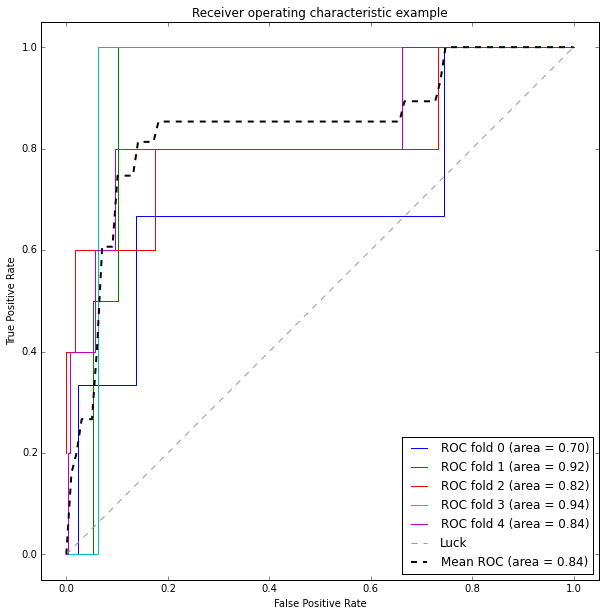

In [52]:
mean_tpr = 0.0
mean_fpr = np.linspace(0, 1, 100)
all_tpr = []

plt.figure(figsize=(10,10))

for i, (train, test) in enumerate(cv):
    probas_ = classifier.fit(X_ult_best.ix[train], y_ult_train.ix[train]).predict_proba(X_ult_best.ix[test])
    # Compute ROC curve and area the curve
    fpr, tpr, thresholds = roc_curve(y_ult_train.ix[test], probas_[:, 1])
    mean_tpr += interp(mean_fpr, fpr, tpr)
    mean_tpr[0] = 0.0
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw=1, label='ROC fold %d (area = %0.2f)' % (i, roc_auc))

plt.plot([0, 1], [0, 1], '--', color=(0.6, 0.6, 0.6), label='Luck')

mean_tpr /= len(cv)
mean_tpr[-1] = 1.0
ult_best_thresh = thresholds[np.argmax(mean_tpr - mean_fpr)]
mean_auc = auc(mean_fpr, mean_tpr)
plt.plot(mean_fpr, mean_tpr, 'k--',
         label='Mean ROC (area = %0.2f)' % mean_auc, lw=2)

plt.xlim([-0.05, 1.05])
plt.ylim([-0.05, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic example')
plt.legend(loc="lower right")

In [53]:
X_ult_test = pd.DataFrame(ult_scale_fit.transform(X_ult_test).transpose()[best_ult_cols].transpose(), columns = X_ult_test.columns[best_ult_cols])

In [54]:
ult_probas = classifier.fit(X_ult_best, y_ult_train).predict_proba(X_ult_test)
X_ult_pred = []
for row in ult_probas:
    if row[1] > ult_best_thresh:
        X_ult_pred.append(1)
    else:
        X_ult_pred.append(0)

In [55]:
accuracy_score(X_ult_pred, y_ult_test)

0.94368932038834952

In [56]:
precision_score(X_ult_pred, y_ult_test)

0.75

In [57]:
recall_score(X_ult_pred, y_ult_test)

0.096774193548387094

In [58]:
f1_score(X_ult_pred, y_ult_test)

0.1714285714285714

# SXSW MUSIC FESTIVAL

In [59]:
y_sxs, X_sxs = df.sxs_2015, df.ix[:, 'fans':'noi_counts']
X_sxs_train, X_sxs_test, y_sxs_train, y_sxs_test = train_test_split(X_sxs, y_sxs, test_size = 0.25, random_state = 4444)
sxs_scale_fit = StandardScaler().fit(X_sxs_train)
X_sxs_train_scaled = pd.DataFrame(sxs_scale_fit.transform(X_sxs_train), columns = X_sxs_train.columns)
new_sxs_features = SelectKBest(f_classif, k = 10)
X_sxs_best = new_sxs_features.fit_transform(X_sxs_train_scaled, y_sxs_train)
best_sxs_cols = new_sxs_features.get_support(True)
X_sxs_best = pd.DataFrame(X_sxs_best, columns = X_sxs.columns[best_sxs_cols])
X_sxs.columns[best_sxs_cols]

Index([u'fans', u'rank', u'2015_shows', u'familiarity', u'latin',
       u'electro house', u'rock', u'folk', u'bon_counts', u'bea_counts'],
      dtype='object')

In [60]:
cw_range = [{1:1-cw, 0:cw} for cw in np.arange(.01, 1.0, .1)]
gamma_range = np.logspace(-9, 3, 9)
param_grid = dict(gamma=gamma_range, class_weight=cw_range)
cv = ShuffleSplit(len(y_sxs_train), n_iter=5, test_size=0.2, random_state=42)
for score in ['accuracy','precision', 'recall']:
    grid = GridSearchCV(SVC(kernel = 'rbf'), param_grid=param_grid, cv=cv, scoring = score, verbose= 10)
    grid.fit(X_sxs_best, y_sxs_train)
    print("The best parameters are %s with a score of %0.2f"
          % (grid.best_params_, grid.best_score_))

Fitting 5 folds for each of 90 candidates, totalling 450 fits
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.025890 -   0.1s

[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.1s



[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.012945 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.012945 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.025890 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999

[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.4s
[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.6s



[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.012945 -   0.1s
[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.025890 -   0.1s
[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.012945 -   0.1s
[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.02265

[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    0.9s
[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    1.3s



[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.012945 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.025890 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.012945 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.02265

[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    1.8s
[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    2.3s



[CV] gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.045307 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.064725 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=31.6227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=31.6227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=31.6227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=31.6227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.025890 -   0.1s
[CV] gamma=31.6227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=31.6227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.012945 -   0.1s


[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    3.0s
[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    3.3s



[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.987055 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.977346 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.974110 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.987055 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.977346 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-08, clas

[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    3.5s
[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    3.8s



[CV] gamma=0.0316227766017, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.987055 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.977346 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.987055 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.11, 1: 0.89000000000000001} .......
[CV]  gamma=1.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.977346 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.11, 1: 0.89000000000000001} .......
[CV]  gamma=1.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.974110 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.11, 1: 0.89000000000000001} .......
[CV]  gamma=1.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.9870

[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    4.4s
[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    4.8s



[CV] gamma=3.16227766017e-08, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.974110 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.987055 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.977346 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.987055 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=1e-06, class_weight={0: 0.21000000000000002, 1: 0.790000000000

[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    4.9s
[Parallel(n_jobs=1)]: Done 128 jobs       | elapsed:    5.4s



[CV] gamma=31.6227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=31.6227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.977346 -   0.1s
[CV] gamma=31.6227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=31.6227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.987055 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=1000.0, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.977346 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=1000.0, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.974110 -   0.0s
[CV] gamma=1000.0, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=1000.0, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.987055 -   0.0s
[CV] gamma=1000.0, class_w

[Parallel(n_jobs=1)]: Done 145 jobs       | elapsed:    5.8s
[Parallel(n_jobs=1)]: Done 162 jobs       | elapsed:    6.0s



[CV]  gamma=0.0316227766017, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.974110 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.987055 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.977346 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.987055 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=1.0, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.977346 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 


[Parallel(n_jobs=1)]: Done 181 jobs       | elapsed:    6.8s
[Parallel(n_jobs=1)]: Done 200 jobs       | elapsed:    6.9s



[CV] gamma=3.16227766017e-05, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.987055 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.977346 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.987055 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=0.001, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.977346 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=0.001, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.974110 -

[Parallel(n_jobs=1)]: Done 221 jobs       | elapsed:    7.6s
[Parallel(n_jobs=1)]: Done 242 jobs       | elapsed:    7.9s



[CV] gamma=1e-06, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1e-06, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.977346 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1e-06, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.974110 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1e-06, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.987055 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1e-06, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.977346 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1e-06, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.987055 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.510000000000000

[Parallel(n_jobs=1)]: Done 265 jobs       | elapsed:    8.5s
[Parallel(n_jobs=1)]: Done 288 jobs       | elapsed:    8.8s



[CV] gamma=3.16227766017e-05, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999}, score=0.977346 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999}, score=0.987055 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999} 
[CV]  gamma=0.001, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999}, score=0.977346 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999} 
[CV]  gamma=0.001, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999}, score=0.974110 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999} 
[CV]  gamma=0.001, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999}, score=0.987055 -   0.0s
[CV] gamma=0.001, class_weight={0: 0

[Parallel(n_jobs=1)]: Done 313 jobs       | elapsed:    9.5s
[Parallel(n_jobs=1)]: Done 338 jobs       | elapsed:    9.8s



[CV] gamma=3.16227766017e-05, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.977346 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.987055 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=0.001, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.977346 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=0.001, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.974110 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=0.001, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.987055 -   0.0s
[CV] gamma=0.001

[Parallel(n_jobs=1)]: Done 365 jobs       | elapsed:   10.6s
[Parallel(n_jobs=1)]: Done 392 jobs       | elapsed:   10.8s



[CV] gamma=1.0, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1.0, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.987055 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1.0, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.977346 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1.0, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.987055 -   0.0s
[CV] gamma=31.6227766017, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=31.6227766017, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.977346 -   0.1s
[CV] gamma=31.6227766017, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=31.6227766017, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.974110 -   0.1s
[CV] gamma=31.6227766017, class_weight={0: 0

[Parallel(n_jobs=1)]: Done 421 jobs       | elapsed:   11.5s
[Parallel(n_jobs=1)]: Done 450 jobs       | elapsed:   12.2s



[CV] gamma=1000.0, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969} 
[CV]  gamma=1000.0, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969}, score=0.987055 -   0.0s
The best parameters are {'gamma': 1.0000000000000001e-09, 'class_weight': {0: 0.11, 1: 0.89000000000000001}} with a score of 0.98
Fitting 5 folds for each of 90 candidates, totalling 450 fits
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s

[Parallel(n_jobs=1)]: Done 450 out of 450 | elapsed:   12.2s finished
[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.1s



[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.025890 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.012945 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.012945 -   0.1s

[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.3s



[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.025890 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.012945 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.012945 -   0.1s
[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, clas

[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.5s
[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    0.8s



[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.012945 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.025890 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.012945 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 

[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    1.2s
[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    1.6s



[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022801 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.023102 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.014085 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022305 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.013793 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=1.0, class_weight={0: 0.01, 1: 

[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    2.0s
[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    2.7s



[CV] gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.0s
[CV] gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.025890 -   0.0s
[CV] gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.012945 -   0.0s
[CV] gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.0s
[CV] gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.012945 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1e-09, clas

[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    2.9s
[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    3.1s



[CV] gamma=1e-06, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-06, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-06, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.11, 

[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    3.2s
[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    3.8s



[CV] gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001} ....
[CV]  gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001} ....
[CV]  gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001} ....
[CV]  gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001} ....
[CV]  gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001} ....
[CV]  gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=1e-09, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.

[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    4.2s
[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    4.3s



[CV] gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.0s
[CV]

[Parallel(n_jobs=1)]: Done 128 jobs       | elapsed:    4.8s
[Parallel(n_jobs=1)]: Done 145 jobs       | elapsed:    5.3s



[CV] gamma=3.16227766017e-08, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.000000 -

[Parallel(n_jobs=1)]: Done 162 jobs       | elapsed:    5.4s
[Parallel(n_jobs=1)]: Done 181 jobs       | elapsed:    6.2s



[CV]  gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.41

[Parallel(n_jobs=1)]: Done 200 jobs       | elapsed:    6.4s
[Parallel(n_jobs=1)]: Done 221 jobs       | elapsed:    7.0s



[CV] gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1e-09, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.51000000000000001, 

[Parallel(n_jobs=1)]: Done 242 jobs       | elapsed:    7.3s
[Parallel(n_jobs=1)]: Done 265 jobs       | elapsed:    7.9s



[CV] gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.0s
[CV] gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.6100000000000001,

[Parallel(n_jobs=1)]: Done 288 jobs       | elapsed:    8.3s
[Parallel(n_jobs=1)]: Done 313 jobs       | elapsed:    9.0s



[CV] gamma=1000.0, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999}, score=0.000000 -   0.0s
[CV] gamma=1000.0, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999}, score=0.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.2899999

[Parallel(n_jobs=1)]: Done 338 jobs       | elapsed:    9.3s
[Parallel(n_jobs=1)]: Done 365 jobs       | elapsed:   10.0s



[CV] gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.810000000000000

[Parallel(n_jobs=1)]: Done 392 jobs       | elapsed:   10.3s
[Parallel(n_jobs=1)]: Done 421 jobs       | elapsed:   11.0s



[CV] gamma=3.16227766017e-08, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969} 
[CV]  gamma=1e-06, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969} 
[CV]  gamma=1e-06, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969} 
[CV]  gamma=1e-06, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969} 
[CV]  gamma=1e-06, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight

[Parallel(n_jobs=1)]: Done 450 jobs       | elapsed:   11.8s
[Parallel(n_jobs=1)]: Done 450 out of 450 | elapsed:   11.8s finished
[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.1s



[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s

[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.3s



[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, clas

[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.5s
[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    0.8s



[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 

[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    1.2s
[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    1.6s



[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.875000 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.857143 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=1.0, class_weight={0: 0.01, 1: 

[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    2.0s
[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    2.7s



[CV] gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.0s
[CV] gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.0s
[CV] gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.0s
[CV] gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.0s
[CV] gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1e-09, clas

[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    2.9s
[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    3.1s



[CV] gamma=1e-06, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-06, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-06, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.11, 

[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    3.3s
[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    3.9s



[CV] gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001} ....
[CV]  gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001} ....
[CV]  gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001} ....
[CV]  gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001} ....
[CV]  gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001} ....
[CV]  gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=1e-09, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.

[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    4.2s
[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    4.4s



[CV] gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.0s
[CV]

[Parallel(n_jobs=1)]: Done 128 jobs       | elapsed:    4.8s
[Parallel(n_jobs=1)]: Done 145 jobs       | elapsed:    5.3s



[CV] gamma=3.16227766017e-08, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-06

[Parallel(n_jobs=1)]: Done 162 jobs       | elapsed:    5.5s
[Parallel(n_jobs=1)]: Done 181 jobs       | elapsed:    6.3s



[CV] gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-08, class_weig

[Parallel(n_jobs=1)]: Done 200 jobs       | elapsed:    6.4s
[Parallel(n_jobs=1)]: Done 221 jobs       | elapsed:    7.0s



[CV] gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.51000000000000001

[Parallel(n_jobs=1)]: Done 242 jobs       | elapsed:    7.4s
[Parallel(n_jobs=1)]: Done 265 jobs       | elapsed:    7.9s



[CV] gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.0s
[CV] gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.6100000000000001,

[Parallel(n_jobs=1)]: Done 288 jobs       | elapsed:    8.3s
[Parallel(n_jobs=1)]: Done 313 jobs       | elapsed:    9.0s



[CV] gamma=1000.0, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999}, score=0.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.2899999

[Parallel(n_jobs=1)]: Done 338 jobs       | elapsed:    9.3s
[Parallel(n_jobs=1)]: Done 365 jobs       | elapsed:   10.1s



[CV] gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.810000000000000

[Parallel(n_jobs=1)]: Done 392 jobs       | elapsed:   10.3s
[Parallel(n_jobs=1)]: Done 421 jobs       | elapsed:   11.1s



[CV] gamma=1e-06, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969} 
[CV]  gamma=1e-06, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969} 
[CV]  gamma=1e-06, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969} 
[CV]  gamma=1e-06, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969} 
[CV]  gamma=1e-06, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969} 
[CV]  gamma=1e-06, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.91000

[Parallel(n_jobs=1)]: Done 450 jobs       | elapsed:   11.8s
[Parallel(n_jobs=1)]: Done 450 out of 450 | elapsed:   11.8s finished


The best parameters are {'gamma': 1.0e-09, 'class_weight': {0: 0.11, 1: 0.89}} with an accuracy score of 0.98.

The best parameters are {'gamma': 1.0, 'class_weight': {0: 0.01, 1: 0.99}} with a precision score of 0.02.

The best parameters are {'gamma': 1.0e-09, 'class_weight': {0: 0.01, 1: 0.99}} with a recall score of 1.00.

In [61]:
1.0*np.sum(y_sxs_train)/len(y_sxs_train)

0.018770226537216828

In [62]:
cw_range = [{1:1-cw, 0:cw} for cw in np.arange(.01, .03, .001)]
gamma_range = np.logspace(-9, 0, 9)
param_grid = dict(gamma=gamma_range, class_weight=cw_range)
cv = ShuffleSplit(len(y_sxs_train), n_iter=5, test_size=0.2, random_state=42)
for score in ['accuracy','precision', 'recall']:
    grid = GridSearchCV(SVC(kernel = 'rbf'), param_grid=param_grid, cv=cv, scoring = score, verbose= 10)
    grid.fit(X_sxs_best, y_sxs_train)
    print("The best parameters are %s with a score of %0.2f"
          % (grid.best_params_, grid.best_score_))

Fitting 5 folds for each of 180 candidates, totalling 900 fits
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.025890 -   0.1s

[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.2s



[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.012945 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.012945 -   0.1s
[CV] gamma=1.33352143216e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=1.33352143216e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=1.33352143216e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=1.33352143216e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.025890 -   0.1s
[CV] gamma=1.33352143216e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=1.33352143216e-08, class_weight={0: 0.01, 1: 0.98999999999999

[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.4s
[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.6s



[CV] gamma=1.33352143216e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=1.33352143216e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=1.33352143216e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=1.33352143216e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.012945 -   0.1s
[CV] gamma=1.77827941004e-07, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=1.77827941004e-07, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=1.77827941004e-07, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=1.77827941004e-07, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.025890 -   0.1s
[CV] gamma=1.77827941004e-07, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=1.77827941004e-07, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.012945 -   0.1s
[CV] gamma=1.77827941004e-07, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=1.77

[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    1.0s
[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    1.4s



[CV] gamma=2.37137370566e-06, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=2.37137370566e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=2.37137370566e-06, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=2.37137370566e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.012945 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.025890 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.012945 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16

[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    1.9s
[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    2.4s



[CV] gamma=0.0056234132519, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0056234132519, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.012945 -   0.1s
[CV] gamma=0.0056234132519, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0056234132519, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=0.0056234132519, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0056234132519, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.012945 -   0.1s
[CV] gamma=0.0749894209332, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0749894209332, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.077670 -   0.1s
[CV] gamma=0.0749894209332, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0749894209332, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.168285 -   0.1s
[CV] gamma=0.0749894209332, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0749894209332, class_wei

[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    3.1s
[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    3.6s



[CV] gamma=1.33352143216e-08, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=1.33352143216e-08, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score=0.022654 -   0.1s
[CV] gamma=1.33352143216e-08, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=1.33352143216e-08, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score=0.025890 -   0.1s
[CV] gamma=1.33352143216e-08, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=1.33352143216e-08, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score=0.012945 -   0.1s
[CV] gamma=1.33352143216e-08, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=1.33352143216e-08, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score=0.022654 -   0.1s
[CV] gamma=1.33352143216e-08, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=1.33352143216e-08, class_weight={0: 0.010

[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    4.4s
[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    5.1s



[CV] gamma=0.000421696503429, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=0.000421696503429, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score=0.012945 -   0.1s
[CV] gamma=0.000421696503429, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=0.000421696503429, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score=0.022654 -   0.1s
[CV] gamma=0.000421696503429, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=0.000421696503429, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score=0.012945 -   0.1s
[CV] gamma=0.0056234132519, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=0.0056234132519, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score=0.022654 -   0.1s
[CV] gamma=0.0056234132519, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=0.0056234132519, class_weight={0: 0.01099999999

[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    6.0s
[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    6.8s



[CV] gamma=1.33352143216e-08, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999} 
[CV]  gamma=1.33352143216e-08, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999}, score=0.022654 -   0.1s
[CV] gamma=1.33352143216e-08, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999} 
[CV]  gamma=1.33352143216e-08, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999}, score=0.012945 -   0.1s
[CV] gamma=1.77827941004e-07, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999} 
[CV]  gamma=1.77827941004e-07, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999}, score=0.022654 -   0.1s
[CV] gamma=1.77827941004e-07, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999} 
[CV]  gamma=1.77827941004e-07, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999}, score=0.025890 -   0.1s
[CV] gamma=1.77827941004e-07, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999} 
[CV]  gamma=1.77827941004e-07, class_weight={0: 0.011

[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    7.8s
[Parallel(n_jobs=1)]: Done 128 jobs       | elapsed:    8.7s



[CV] gamma=0.0749894209332, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999} 
[CV]  gamma=0.0749894209332, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999}, score=0.624595 -   0.1s
[CV] gamma=0.0749894209332, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999} 
[CV]  gamma=0.0749894209332, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999}, score=0.368932 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999} 
[CV]  gamma=1.0, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999}, score=0.097087 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999} 
[CV]  gamma=1.0, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999}, score=0.145631 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999} 
[CV]  gamma=1.0, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999}, score=0.093851 -   0.1s
[CV] gamma=1.0, class_weig

[Parallel(n_jobs=1)]: Done 145 jobs       | elapsed:    9.9s
[Parallel(n_jobs=1)]: Done 162 jobs       | elapsed:   10.9s



[CV] gamma=0.000421696503429, class_weight={0: 0.012999999999999998, 1: 0.98699999999999999} 
[CV]  gamma=0.000421696503429, class_weight={0: 0.012999999999999998, 1: 0.98699999999999999}, score=0.012945 -   0.1s
[CV] gamma=0.000421696503429, class_weight={0: 0.012999999999999998, 1: 0.98699999999999999} 
[CV]  gamma=0.000421696503429, class_weight={0: 0.012999999999999998, 1: 0.98699999999999999}, score=0.022654 -   0.1s
[CV] gamma=0.000421696503429, class_weight={0: 0.012999999999999998, 1: 0.98699999999999999} 
[CV]  gamma=0.000421696503429, class_weight={0: 0.012999999999999998, 1: 0.98699999999999999}, score=0.012945 -   0.1s
[CV] gamma=0.0056234132519, class_weight={0: 0.012999999999999998, 1: 0.98699999999999999} 
[CV]  gamma=0.0056234132519, class_weight={0: 0.012999999999999998, 1: 0.98699999999999999}, score=0.022654 -   0.1s
[CV] gamma=0.0056234132519, class_weight={0: 0.012999999999999998, 1: 0.98699999999999999} 
[CV]  gamma=0.0056234132519, class_weight={0: 0.01299999999

[Parallel(n_jobs=1)]: Done 181 jobs       | elapsed:   12.3s
[Parallel(n_jobs=1)]: Done 200 jobs       | elapsed:   13.5s



[CV] gamma=3.16227766017e-05, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999}, score=0.022654 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999}, score=0.025890 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999}, score=0.012945 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999}, score=0.022654 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.013

[Parallel(n_jobs=1)]: Done 221 jobs       | elapsed:   15.0s
[Parallel(n_jobs=1)]: Done 242 jobs       | elapsed:   16.5s



[CV] gamma=2.37137370566e-06, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999} 
[CV]  gamma=2.37137370566e-06, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999}, score=0.012945 -   0.1s
[CV] gamma=2.37137370566e-06, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999} 
[CV]  gamma=2.37137370566e-06, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999}, score=0.022654 -   0.1s
[CV] gamma=2.37137370566e-06, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999} 
[CV]  gamma=2.37137370566e-06, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999}, score=0.012945 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999}, score=0.022654 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.014

[Parallel(n_jobs=1)]: Done 265 jobs       | elapsed:   17.9s
[Parallel(n_jobs=1)]: Done 288 jobs       | elapsed:   19.4s



[CV] gamma=2.37137370566e-06, class_weight={0: 0.015999999999999993, 1: 0.98399999999999999} 
[CV]  gamma=2.37137370566e-06, class_weight={0: 0.015999999999999993, 1: 0.98399999999999999}, score=0.022654 -   0.1s
[CV] gamma=2.37137370566e-06, class_weight={0: 0.015999999999999993, 1: 0.98399999999999999} 
[CV]  gamma=2.37137370566e-06, class_weight={0: 0.015999999999999993, 1: 0.98399999999999999}, score=0.012945 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.015999999999999993, 1: 0.98399999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.015999999999999993, 1: 0.98399999999999999}, score=0.022654 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.015999999999999993, 1: 0.98399999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.015999999999999993, 1: 0.98399999999999999}, score=0.025890 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.015999999999999993, 1: 0.98399999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.015

[Parallel(n_jobs=1)]: Done 313 jobs       | elapsed:   21.0s
[Parallel(n_jobs=1)]: Done 338 jobs       | elapsed:   22.7s



[CV] gamma=3.16227766017e-05, class_weight={0: 0.016999999999999994, 1: 0.98299999999999998} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.016999999999999994, 1: 0.98299999999999998}, score=0.022654 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.016999999999999994, 1: 0.98299999999999998} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.016999999999999994, 1: 0.98299999999999998}, score=0.012945 -   0.1s
[CV] gamma=0.000421696503429, class_weight={0: 0.016999999999999994, 1: 0.98299999999999998} 
[CV]  gamma=0.000421696503429, class_weight={0: 0.016999999999999994, 1: 0.98299999999999998}, score=0.022654 -   0.1s
[CV] gamma=0.000421696503429, class_weight={0: 0.016999999999999994, 1: 0.98299999999999998} 
[CV]  gamma=0.000421696503429, class_weight={0: 0.016999999999999994, 1: 0.98299999999999998}, score=0.974110 -   0.1s
[CV] gamma=0.000421696503429, class_weight={0: 0.016999999999999994, 1: 0.98299999999999998} 
[CV]  gamma=0.000421696503429, class_weight={0: 0.016

[Parallel(n_jobs=1)]: Done 365 jobs       | elapsed:   24.9s
[Parallel(n_jobs=1)]: Done 392 jobs       | elapsed:   27.4s



[CV] gamma=0.0056234132519, class_weight={0: 0.017999999999999995, 1: 0.98199999999999998} 
[CV]  gamma=0.0056234132519, class_weight={0: 0.017999999999999995, 1: 0.98199999999999998}, score=0.093851 -   0.1s
[CV] gamma=0.0056234132519, class_weight={0: 0.017999999999999995, 1: 0.98199999999999998} 
[CV]  gamma=0.0056234132519, class_weight={0: 0.017999999999999995, 1: 0.98199999999999998}, score=0.886731 -   0.1s
[CV] gamma=0.0056234132519, class_weight={0: 0.017999999999999995, 1: 0.98199999999999998} 
[CV]  gamma=0.0056234132519, class_weight={0: 0.017999999999999995, 1: 0.98199999999999998}, score=0.064725 -   0.1s
[CV] gamma=0.0749894209332, class_weight={0: 0.017999999999999995, 1: 0.98199999999999998} 
[CV]  gamma=0.0749894209332, class_weight={0: 0.017999999999999995, 1: 0.98199999999999998}, score=0.766990 -   0.1s
[CV] gamma=0.0749894209332, class_weight={0: 0.017999999999999995, 1: 0.98199999999999998} 
[CV]  gamma=0.0749894209332, class_weight={0: 0.017999999999999995, 1: 

[Parallel(n_jobs=1)]: Done 421 jobs       | elapsed:   29.3s
[Parallel(n_jobs=1)]: Done 450 jobs       | elapsed:   31.1s



[CV] gamma=1e-09, class_weight={0: 0.01999999999999999, 1: 0.97999999999999998} 
[CV]  gamma=1e-09, class_weight={0: 0.01999999999999999, 1: 0.97999999999999998}, score=0.977346 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01999999999999999, 1: 0.97999999999999998} 
[CV]  gamma=1e-09, class_weight={0: 0.01999999999999999, 1: 0.97999999999999998}, score=0.974110 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01999999999999999, 1: 0.97999999999999998} 
[CV]  gamma=1e-09, class_weight={0: 0.01999999999999999, 1: 0.97999999999999998}, score=0.012945 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01999999999999999, 1: 0.97999999999999998} 
[CV]  gamma=1e-09, class_weight={0: 0.01999999999999999, 1: 0.97999999999999998}, score=0.977346 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01999999999999999, 1: 0.97999999999999998} 
[CV]  gamma=1e-09, class_weight={0: 0.01999999999999999, 1: 0.97999999999999998}, score=0.012945 -   0.1s
[CV] gamma=1.33352143216e-08, class_weight={0: 0.019999999999999

[Parallel(n_jobs=1)]: Done 481 jobs       | elapsed:   32.9s
[Parallel(n_jobs=1)]: Done 512 jobs       | elapsed:   34.7s



[CV] gamma=2.37137370566e-06, class_weight={0: 0.020999999999999991, 1: 0.97899999999999998} 
[CV]  gamma=2.37137370566e-06, class_weight={0: 0.020999999999999991, 1: 0.97899999999999998}, score=0.987055 -   0.1s
[CV] gamma=2.37137370566e-06, class_weight={0: 0.020999999999999991, 1: 0.97899999999999998} 
[CV]  gamma=2.37137370566e-06, class_weight={0: 0.020999999999999991, 1: 0.97899999999999998}, score=0.977346 -   0.1s
[CV] gamma=2.37137370566e-06, class_weight={0: 0.020999999999999991, 1: 0.97899999999999998} 
[CV]  gamma=2.37137370566e-06, class_weight={0: 0.020999999999999991, 1: 0.97899999999999998}, score=0.987055 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.020999999999999991, 1: 0.97899999999999998} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.020999999999999991, 1: 0.97899999999999998}, score=0.977346 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.020999999999999991, 1: 0.97899999999999998} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.020

[Parallel(n_jobs=1)]: Done 545 jobs       | elapsed:   36.5s
[Parallel(n_jobs=1)]: Done 578 jobs       | elapsed:   38.3s



[CV] gamma=0.0749894209332, class_weight={0: 0.021999999999999992, 1: 0.97799999999999998} 
[CV]  gamma=0.0749894209332, class_weight={0: 0.021999999999999992, 1: 0.97799999999999998}, score=0.822006 -   0.0s
[CV] gamma=0.0749894209332, class_weight={0: 0.021999999999999992, 1: 0.97799999999999998} 
[CV]  gamma=0.0749894209332, class_weight={0: 0.021999999999999992, 1: 0.97799999999999998}, score=0.799353 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.021999999999999992, 1: 0.97799999999999998} 
[CV]  gamma=1.0, class_weight={0: 0.021999999999999992, 1: 0.97799999999999998}, score=0.941748 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.021999999999999992, 1: 0.97799999999999998} 
[CV]  gamma=1.0, class_weight={0: 0.021999999999999992, 1: 0.97799999999999998}, score=0.951456 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.021999999999999992, 1: 0.97799999999999998} 
[CV]  gamma=1.0, class_weight={0: 0.021999999999999992, 1: 0.97799999999999998}, score=0.932039 -   0.1s
[CV] gamma=1.0, class_weig

[Parallel(n_jobs=1)]: Done 613 jobs       | elapsed:   40.6s
[Parallel(n_jobs=1)]: Done 648 jobs       | elapsed:   42.5s



[CV] gamma=2.37137370566e-06, class_weight={0: 0.023999999999999987, 1: 0.97599999999999998} 
[CV]  gamma=2.37137370566e-06, class_weight={0: 0.023999999999999987, 1: 0.97599999999999998}, score=0.977346 -   0.1s
[CV] gamma=2.37137370566e-06, class_weight={0: 0.023999999999999987, 1: 0.97599999999999998} 
[CV]  gamma=2.37137370566e-06, class_weight={0: 0.023999999999999987, 1: 0.97599999999999998}, score=0.987055 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.023999999999999987, 1: 0.97599999999999998} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.023999999999999987, 1: 0.97599999999999998}, score=0.977346 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.023999999999999987, 1: 0.97599999999999998} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.023999999999999987, 1: 0.97599999999999998}, score=0.974110 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.023999999999999987, 1: 0.97599999999999998} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.023

[Parallel(n_jobs=1)]: Done 685 jobs       | elapsed:   44.3s
[Parallel(n_jobs=1)]: Done 722 jobs       | elapsed:   46.1s



[CV] gamma=1e-09, class_weight={0: 0.025999999999999988, 1: 0.97399999999999998} 
[CV]  gamma=1e-09, class_weight={0: 0.025999999999999988, 1: 0.97399999999999998}, score=0.987055 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.025999999999999988, 1: 0.97399999999999998} 
[CV]  gamma=1e-09, class_weight={0: 0.025999999999999988, 1: 0.97399999999999998}, score=0.977346 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.025999999999999988, 1: 0.97399999999999998} 
[CV]  gamma=1e-09, class_weight={0: 0.025999999999999988, 1: 0.97399999999999998}, score=0.987055 -   0.0s
[CV] gamma=1.33352143216e-08, class_weight={0: 0.025999999999999988, 1: 0.97399999999999998} 
[CV]  gamma=1.33352143216e-08, class_weight={0: 0.025999999999999988, 1: 0.97399999999999998}, score=0.977346 -   0.0s
[CV] gamma=1.33352143216e-08, class_weight={0: 0.025999999999999988, 1: 0.97399999999999998} 
[CV]  gamma=1.33352143216e-08, class_weight={0: 0.025999999999999988, 1: 0.97399999999999998}, score=0.974110 -   0.0s
[CV] g

[Parallel(n_jobs=1)]: Done 761 jobs       | elapsed:   47.9s
[Parallel(n_jobs=1)]: Done 800 jobs       | elapsed:   49.6s



[CV] gamma=0.0749894209332, class_weight={0: 0.026999999999999989, 1: 0.97299999999999998} 
[CV]  gamma=0.0749894209332, class_weight={0: 0.026999999999999989, 1: 0.97299999999999998}, score=0.857605 -   0.0s
[CV] gamma=0.0749894209332, class_weight={0: 0.026999999999999989, 1: 0.97299999999999998} 
[CV]  gamma=0.0749894209332, class_weight={0: 0.026999999999999989, 1: 0.97299999999999998}, score=0.893204 -   0.0s
[CV] gamma=0.0749894209332, class_weight={0: 0.026999999999999989, 1: 0.97299999999999998} 
[CV]  gamma=0.0749894209332, class_weight={0: 0.026999999999999989, 1: 0.97299999999999998}, score=0.834951 -   0.0s
[CV] gamma=0.0749894209332, class_weight={0: 0.026999999999999989, 1: 0.97299999999999998} 
[CV]  gamma=0.0749894209332, class_weight={0: 0.026999999999999989, 1: 0.97299999999999998}, score=0.844660 -   0.0s
[CV] gamma=0.0749894209332, class_weight={0: 0.026999999999999989, 1: 0.97299999999999998} 
[CV]  gamma=0.0749894209332, class_weight={0: 0.026999999999999989, 1: 

[Parallel(n_jobs=1)]: Done 841 jobs       | elapsed:   51.4s
[Parallel(n_jobs=1)]: Done 882 jobs       | elapsed:   53.2s



[CV] gamma=0.000421696503429, class_weight={0: 0.028999999999999984, 1: 0.97099999999999997} 
[CV]  gamma=0.000421696503429, class_weight={0: 0.028999999999999984, 1: 0.97099999999999997}, score=0.974110 -   0.0s
[CV] gamma=0.000421696503429, class_weight={0: 0.028999999999999984, 1: 0.97099999999999997} 
[CV]  gamma=0.000421696503429, class_weight={0: 0.028999999999999984, 1: 0.97099999999999997}, score=0.987055 -   0.0s
[CV] gamma=0.000421696503429, class_weight={0: 0.028999999999999984, 1: 0.97099999999999997} 
[CV]  gamma=0.000421696503429, class_weight={0: 0.028999999999999984, 1: 0.97099999999999997}, score=0.977346 -   0.0s
[CV] gamma=0.000421696503429, class_weight={0: 0.028999999999999984, 1: 0.97099999999999997} 
[CV]  gamma=0.000421696503429, class_weight={0: 0.028999999999999984, 1: 0.97099999999999997}, score=0.987055 -   0.0s
[CV] gamma=0.0056234132519, class_weight={0: 0.028999999999999984, 1: 0.97099999999999997} 
[CV]  gamma=0.0056234132519, class_weight={0: 0.0289999

[Parallel(n_jobs=1)]: Done 900 out of 900 | elapsed:   53.9s finished
[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.1s



[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.025890 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.012945 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.012945 -   0.1s

[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.4s



[CV] gamma=1.33352143216e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=1.33352143216e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=1.33352143216e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=1.33352143216e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.025890 -   0.1s
[CV] gamma=1.33352143216e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=1.33352143216e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.012945 -   0.1s
[CV] gamma=1.33352143216e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=1.33352143216e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=1.33352143216e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=1.33352143216e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.012945 -   0.1s
[CV] gamma=1.77827941004e-07, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=1.77

[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.6s
[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    1.0s



[CV] gamma=1.77827941004e-07, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=1.77827941004e-07, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=1.77827941004e-07, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=1.77827941004e-07, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.012945 -   0.1s
[CV] gamma=2.37137370566e-06, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=2.37137370566e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=2.37137370566e-06, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=2.37137370566e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.025890 -   0.1s
[CV] gamma=2.37137370566e-06, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=2.37137370566e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.012945 -   0.1s
[CV] gamma=2.37137370566e-06, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=2.37

[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    1.3s
[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    1.7s



[CV] gamma=0.000421696503429, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.000421696503429, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=0.000421696503429, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.000421696503429, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.025890 -   0.1s
[CV] gamma=0.000421696503429, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.000421696503429, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.012945 -   0.1s
[CV] gamma=0.000421696503429, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.000421696503429, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=0.000421696503429, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.000421696503429, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.012945 -   0.1s
[CV] gamma=0.0056234132519, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0056

[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    2.2s
[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    2.8s



[CV] gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.026230 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.013378 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.023649 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.013072 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=1e-09, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score=0.022654 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=1e-09, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score

[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    3.3s
[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    4.0s



[CV] gamma=2.37137370566e-06, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=2.37137370566e-06, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score=0.025890 -   0.1s
[CV] gamma=2.37137370566e-06, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=2.37137370566e-06, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score=0.012945 -   0.1s
[CV] gamma=2.37137370566e-06, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=2.37137370566e-06, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score=0.022654 -   0.1s
[CV] gamma=2.37137370566e-06, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=2.37137370566e-06, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score=0.012945 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.010

[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    4.7s
[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    5.5s



[CV] gamma=1.0, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=1.0, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score=0.023333 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=1.0, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score=0.026756 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=1.0, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score=0.013746 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=1.0, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score=0.024648 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=1.0, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score=0.013378 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.011999999999999999, 1: 0.987999999999

[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    6.5s
[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    7.4s



[CV] gamma=3.16227766017e-05, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999}, score=0.022654 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999}, score=0.012945 -   0.1s
[CV] gamma=0.000421696503429, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999} 
[CV]  gamma=0.000421696503429, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999}, score=0.022654 -   0.1s
[CV] gamma=0.000421696503429, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999} 
[CV]  gamma=0.000421696503429, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999}, score=0.025890 -   0.1s
[CV] gamma=0.000421696503429, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999} 
[CV]  gamma=0.000421696503429, class_weight={0: 0.011

[Parallel(n_jobs=1)]: Done 128 jobs       | elapsed:    8.4s
[Parallel(n_jobs=1)]: Done 145 jobs       | elapsed:    9.4s



[CV] gamma=1.77827941004e-07, class_weight={0: 0.012999999999999998, 1: 0.98699999999999999} 
[CV]  gamma=1.77827941004e-07, class_weight={0: 0.012999999999999998, 1: 0.98699999999999999}, score=0.022654 -   0.1s
[CV] gamma=1.77827941004e-07, class_weight={0: 0.012999999999999998, 1: 0.98699999999999999} 
[CV]  gamma=1.77827941004e-07, class_weight={0: 0.012999999999999998, 1: 0.98699999999999999}, score=0.025890 -   0.1s
[CV] gamma=1.77827941004e-07, class_weight={0: 0.012999999999999998, 1: 0.98699999999999999} 
[CV]  gamma=1.77827941004e-07, class_weight={0: 0.012999999999999998, 1: 0.98699999999999999}, score=0.012945 -   0.1s
[CV] gamma=1.77827941004e-07, class_weight={0: 0.012999999999999998, 1: 0.98699999999999999} 
[CV]  gamma=1.77827941004e-07, class_weight={0: 0.012999999999999998, 1: 0.98699999999999999}, score=0.022654 -   0.1s
[CV] gamma=1.77827941004e-07, class_weight={0: 0.012999999999999998, 1: 0.98699999999999999} 
[CV]  gamma=1.77827941004e-07, class_weight={0: 0.012

[Parallel(n_jobs=1)]: Done 162 jobs       | elapsed:   10.5s
[Parallel(n_jobs=1)]: Done 181 jobs       | elapsed:   11.7s



[CV] gamma=1e-09, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999} 
[CV]  gamma=1e-09, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999}, score=0.025890 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999} 
[CV]  gamma=1e-09, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999}, score=0.012945 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999} 
[CV]  gamma=1e-09, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999}, score=0.022654 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999} 
[CV]  gamma=1e-09, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999}, score=0.012945 -   0.1s
[CV] gamma=1.33352143216e-08, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999} 
[CV]  gamma=1.33352143216e-08, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999}, score=0.022654 -   0.1s
[CV] gamma=1.33352143216e-08, 

[Parallel(n_jobs=1)]: Done 200 jobs       | elapsed:   13.0s
[Parallel(n_jobs=1)]: Done 221 jobs       | elapsed:   14.4s



[CV] gamma=1.0, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999} 
[CV]  gamma=1.0, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999}, score=0.027624 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999} 
[CV]  gamma=1.0, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999}, score=0.008584 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999} 
[CV]  gamma=1.0, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999}, score=0.036036 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999} 
[CV]  gamma=1.0, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999}, score=0.015038 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999} 
[CV]  gamma=1e-09, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999}, score=0.022654 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.014999999999999996, 1: 0.98499999

[Parallel(n_jobs=1)]: Done 242 jobs       | elapsed:   15.8s
[Parallel(n_jobs=1)]: Done 265 jobs       | elapsed:   17.3s



[CV] gamma=1.0, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999} 
[CV]  gamma=1.0, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999}, score=0.024096 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999} 
[CV]  gamma=1.0, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999}, score=0.049180 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999} 
[CV]  gamma=1.0, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999}, score=0.005263 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999} 
[CV]  gamma=1.0, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999}, score=0.040816 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999} 
[CV]  gamma=1.0, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999}, score=0.016461 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.015999999999999993, 1: 0.983999999999

[Parallel(n_jobs=1)]: Done 288 jobs       | elapsed:   18.8s
[Parallel(n_jobs=1)]: Done 313 jobs       | elapsed:   20.4s



[CV] gamma=1.0, class_weight={0: 0.015999999999999993, 1: 0.98399999999999999} 
[CV]  gamma=1.0, class_weight={0: 0.015999999999999993, 1: 0.98399999999999999}, score=0.057143 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.015999999999999993, 1: 0.98399999999999999} 
[CV]  gamma=1.0, class_weight={0: 0.015999999999999993, 1: 0.98399999999999999}, score=0.010989 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.016999999999999994, 1: 0.98299999999999998} 
[CV]  gamma=1e-09, class_weight={0: 0.016999999999999994, 1: 0.98299999999999998}, score=0.022654 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.016999999999999994, 1: 0.98299999999999998} 
[CV]  gamma=1e-09, class_weight={0: 0.016999999999999994, 1: 0.98299999999999998}, score=0.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.016999999999999994, 1: 0.98299999999999998} 
[CV]  gamma=1e-09, class_weight={0: 0.016999999999999994, 1: 0.98299999999999998}, score=0.012945 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.016999999999999994, 1: 0.

[Parallel(n_jobs=1)]: Done 338 jobs       | elapsed:   22.1s
[Parallel(n_jobs=1)]: Done 365 jobs       | elapsed:   23.8s



[CV] gamma=1.33352143216e-08, class_weight={0: 0.017999999999999995, 1: 0.98199999999999998} 
[CV]  gamma=1.33352143216e-08, class_weight={0: 0.017999999999999995, 1: 0.98199999999999998}, score=0.000000 -   0.1s
[CV] gamma=1.33352143216e-08, class_weight={0: 0.017999999999999995, 1: 0.98199999999999998} 
[CV]  gamma=1.33352143216e-08, class_weight={0: 0.017999999999999995, 1: 0.98199999999999998}, score=0.000000 -   0.1s
[CV] gamma=1.33352143216e-08, class_weight={0: 0.017999999999999995, 1: 0.98199999999999998} 
[CV]  gamma=1.33352143216e-08, class_weight={0: 0.017999999999999995, 1: 0.98199999999999998}, score=0.012945 -   0.1s
[CV] gamma=1.33352143216e-08, class_weight={0: 0.017999999999999995, 1: 0.98199999999999998} 
[CV]  gamma=1.33352143216e-08, class_weight={0: 0.017999999999999995, 1: 0.98199999999999998}, score=0.000000 -   0.1s
[CV] gamma=1.33352143216e-08, class_weight={0: 0.017999999999999995, 1: 0.98199999999999998} 
[CV]  gamma=1.33352143216e-08, class_weight={0: 0.017

[Parallel(n_jobs=1)]: Done 392 jobs       | elapsed:   25.5s
[Parallel(n_jobs=1)]: Done 421 jobs       | elapsed:   27.3s



[CV] gamma=2.37137370566e-06, class_weight={0: 0.018999999999999993, 1: 0.98099999999999998} 
[CV]  gamma=2.37137370566e-06, class_weight={0: 0.018999999999999993, 1: 0.98099999999999998}, score=0.000000 -   0.1s
[CV] gamma=2.37137370566e-06, class_weight={0: 0.018999999999999993, 1: 0.98099999999999998} 
[CV]  gamma=2.37137370566e-06, class_weight={0: 0.018999999999999993, 1: 0.98099999999999998}, score=0.012945 -   0.1s
[CV] gamma=2.37137370566e-06, class_weight={0: 0.018999999999999993, 1: 0.98099999999999998} 
[CV]  gamma=2.37137370566e-06, class_weight={0: 0.018999999999999993, 1: 0.98099999999999998}, score=0.000000 -   0.1s
[CV] gamma=2.37137370566e-06, class_weight={0: 0.018999999999999993, 1: 0.98099999999999998} 
[CV]  gamma=2.37137370566e-06, class_weight={0: 0.018999999999999993, 1: 0.98099999999999998}, score=0.012945 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.018999999999999993, 1: 0.98099999999999998} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.018

[Parallel(n_jobs=1)]: Done 450 jobs       | elapsed:   29.1s
[Parallel(n_jobs=1)]: Done 481 jobs       | elapsed:   31.0s



[CV] gamma=0.0056234132519, class_weight={0: 0.01999999999999999, 1: 0.97999999999999998} 
[CV]  gamma=0.0056234132519, class_weight={0: 0.01999999999999999, 1: 0.97999999999999998}, score=0.000000 -   0.1s
[CV] gamma=0.0056234132519, class_weight={0: 0.01999999999999999, 1: 0.97999999999999998} 
[CV]  gamma=0.0056234132519, class_weight={0: 0.01999999999999999, 1: 0.97999999999999998}, score=0.000000 -   0.1s
[CV] gamma=0.0056234132519, class_weight={0: 0.01999999999999999, 1: 0.97999999999999998} 
[CV]  gamma=0.0056234132519, class_weight={0: 0.01999999999999999, 1: 0.97999999999999998}, score=0.000000 -   0.1s
[CV] gamma=0.0056234132519, class_weight={0: 0.01999999999999999, 1: 0.97999999999999998} 
[CV]  gamma=0.0056234132519, class_weight={0: 0.01999999999999999, 1: 0.97999999999999998}, score=0.013245 -   0.1s
[CV] gamma=0.0749894209332, class_weight={0: 0.01999999999999999, 1: 0.97999999999999998} 
[CV]  gamma=0.0749894209332, class_weight={0: 0.01999999999999999, 1: 0.97999999

[Parallel(n_jobs=1)]: Done 512 jobs       | elapsed:   32.8s
[Parallel(n_jobs=1)]: Done 545 jobs       | elapsed:   34.6s



[CV] gamma=1.33352143216e-08, class_weight={0: 0.021999999999999992, 1: 0.97799999999999998} 
[CV]  gamma=1.33352143216e-08, class_weight={0: 0.021999999999999992, 1: 0.97799999999999998}, score=0.000000 -   0.1s
[CV] gamma=1.33352143216e-08, class_weight={0: 0.021999999999999992, 1: 0.97799999999999998} 
[CV]  gamma=1.33352143216e-08, class_weight={0: 0.021999999999999992, 1: 0.97799999999999998}, score=0.000000 -   0.0s
[CV] gamma=1.33352143216e-08, class_weight={0: 0.021999999999999992, 1: 0.97799999999999998} 
[CV]  gamma=1.33352143216e-08, class_weight={0: 0.021999999999999992, 1: 0.97799999999999998}, score=0.000000 -   0.1s
[CV] gamma=1.33352143216e-08, class_weight={0: 0.021999999999999992, 1: 0.97799999999999998} 
[CV]  gamma=1.33352143216e-08, class_weight={0: 0.021999999999999992, 1: 0.97799999999999998}, score=0.000000 -   0.1s
[CV] gamma=1.33352143216e-08, class_weight={0: 0.021999999999999992, 1: 0.97799999999999998} 
[CV]  gamma=1.33352143216e-08, class_weight={0: 0.021

[Parallel(n_jobs=1)]: Done 578 jobs       | elapsed:   36.5s
[Parallel(n_jobs=1)]: Done 613 jobs       | elapsed:   38.3s



[CV] gamma=0.000421696503429, class_weight={0: 0.022999999999999989, 1: 0.97699999999999998} 
[CV]  gamma=0.000421696503429, class_weight={0: 0.022999999999999989, 1: 0.97699999999999998}, score=0.000000 -   0.0s
[CV] gamma=0.000421696503429, class_weight={0: 0.022999999999999989, 1: 0.97699999999999998} 
[CV]  gamma=0.000421696503429, class_weight={0: 0.022999999999999989, 1: 0.97699999999999998}, score=0.000000 -   0.1s
[CV] gamma=0.0056234132519, class_weight={0: 0.022999999999999989, 1: 0.97699999999999998} 
[CV]  gamma=0.0056234132519, class_weight={0: 0.022999999999999989, 1: 0.97699999999999998}, score=0.000000 -   0.0s
[CV] gamma=0.0056234132519, class_weight={0: 0.022999999999999989, 1: 0.97699999999999998} 
[CV]  gamma=0.0056234132519, class_weight={0: 0.022999999999999989, 1: 0.97699999999999998}, score=0.000000 -   0.0s
[CV] gamma=0.0056234132519, class_weight={0: 0.022999999999999989, 1: 0.97699999999999998} 
[CV]  gamma=0.0056234132519, class_weight={0: 0.022999999999999

[Parallel(n_jobs=1)]: Done 648 jobs       | elapsed:   40.1s
[Parallel(n_jobs=1)]: Done 685 jobs       | elapsed:   41.9s



[CV] gamma=1.77827941004e-07, class_weight={0: 0.024999999999999988, 1: 0.97499999999999998} 
[CV]  gamma=1.77827941004e-07, class_weight={0: 0.024999999999999988, 1: 0.97499999999999998}, score=0.000000 -   0.0s
[CV] gamma=1.77827941004e-07, class_weight={0: 0.024999999999999988, 1: 0.97499999999999998} 
[CV]  gamma=1.77827941004e-07, class_weight={0: 0.024999999999999988, 1: 0.97499999999999998}, score=0.000000 -   0.0s
[CV] gamma=1.77827941004e-07, class_weight={0: 0.024999999999999988, 1: 0.97499999999999998} 
[CV]  gamma=1.77827941004e-07, class_weight={0: 0.024999999999999988, 1: 0.97499999999999998}, score=0.000000 -   0.1s
[CV] gamma=1.77827941004e-07, class_weight={0: 0.024999999999999988, 1: 0.97499999999999998} 
[CV]  gamma=1.77827941004e-07, class_weight={0: 0.024999999999999988, 1: 0.97499999999999998}, score=0.000000 -   0.1s
[CV] gamma=1.77827941004e-07, class_weight={0: 0.024999999999999988, 1: 0.97499999999999998} 
[CV]  gamma=1.77827941004e-07, class_weight={0: 0.024

[Parallel(n_jobs=1)]: Done 722 jobs       | elapsed:   43.7s
[Parallel(n_jobs=1)]: Done 761 jobs       | elapsed:   45.5s



[CV] gamma=1.0, class_weight={0: 0.025999999999999988, 1: 0.97399999999999998} 
[CV]  gamma=1.0, class_weight={0: 0.025999999999999988, 1: 0.97399999999999998}, score=0.000000 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.025999999999999988, 1: 0.97399999999999998} 
[CV]  gamma=1.0, class_weight={0: 0.025999999999999988, 1: 0.97399999999999998}, score=0.000000 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.025999999999999988, 1: 0.97399999999999998} 
[CV]  gamma=1.0, class_weight={0: 0.025999999999999988, 1: 0.97399999999999998}, score=0.000000 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.025999999999999988, 1: 0.97399999999999998} 
[CV]  gamma=1.0, class_weight={0: 0.025999999999999988, 1: 0.97399999999999998}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.026999999999999989, 1: 0.97299999999999998} 
[CV]  gamma=1e-09, class_weight={0: 0.026999999999999989, 1: 0.97299999999999998}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.026999999999999989, 1: 0.97299999

[Parallel(n_jobs=1)]: Done 800 jobs       | elapsed:   47.3s
[Parallel(n_jobs=1)]: Done 841 jobs       | elapsed:   49.1s



[CV] gamma=0.0056234132519, class_weight={0: 0.027999999999999983, 1: 0.97199999999999998} 
[CV]  gamma=0.0056234132519, class_weight={0: 0.027999999999999983, 1: 0.97199999999999998}, score=0.000000 -   0.0s
[CV] gamma=0.0056234132519, class_weight={0: 0.027999999999999983, 1: 0.97199999999999998} 
[CV]  gamma=0.0056234132519, class_weight={0: 0.027999999999999983, 1: 0.97199999999999998}, score=0.000000 -   0.0s
[CV] gamma=0.0056234132519, class_weight={0: 0.027999999999999983, 1: 0.97199999999999998} 
[CV]  gamma=0.0056234132519, class_weight={0: 0.027999999999999983, 1: 0.97199999999999998}, score=0.000000 -   0.1s
[CV] gamma=0.0056234132519, class_weight={0: 0.027999999999999983, 1: 0.97199999999999998} 
[CV]  gamma=0.0056234132519, class_weight={0: 0.027999999999999983, 1: 0.97199999999999998}, score=0.000000 -   0.0s
[CV] gamma=0.0056234132519, class_weight={0: 0.027999999999999983, 1: 0.97199999999999998} 
[CV]  gamma=0.0056234132519, class_weight={0: 0.027999999999999983, 1: 

[Parallel(n_jobs=1)]: Done 882 jobs       | elapsed:   50.9s
[Parallel(n_jobs=1)]: Done 900 out of 900 | elapsed:   51.7s finished



The best parameters are {'gamma': 1.0, 'class_weight': {0: 0.016999999999999994, 1: 0.98299999999999998}} with a score of 0.05
Fitting 5 folds for each of 180 candidates, totalling 900 fits
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s

[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.1s



[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1.33352143216e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=1.33352143216e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1.33352143216e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=1.33352143216e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1.33352143216e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=1.33352143216e-08, class_weight={0: 0.01, 1: 0.98999999999999

[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.5s



[CV] gamma=1.33352143216e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=1.33352143216e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1.33352143216e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=1.33352143216e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1.77827941004e-07, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=1.77827941004e-07, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1.77827941004e-07, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=1.77827941004e-07, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1.77827941004e-07, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=1.77827941004e-07, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1.77827941004e-07, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=1.77

[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    0.8s
[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    1.2s



[CV] gamma=2.37137370566e-06, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=2.37137370566e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=2.37137370566e-06, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=2.37137370566e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16

[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    1.6s
[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    2.0s



[CV] gamma=0.0056234132519, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0056234132519, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.0056234132519, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0056234132519, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.0056234132519, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0056234132519, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.0749894209332, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0749894209332, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.0749894209332, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0749894209332, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.875000 -   0.1s
[CV] gamma=0.0749894209332, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0749894209332, class_wei

[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    2.6s
[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    3.2s



[CV] gamma=1.33352143216e-08, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=1.33352143216e-08, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score=1.000000 -   0.1s
[CV] gamma=1.33352143216e-08, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=1.33352143216e-08, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score=1.000000 -   0.1s
[CV] gamma=1.33352143216e-08, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=1.33352143216e-08, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score=1.000000 -   0.1s
[CV] gamma=1.33352143216e-08, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=1.33352143216e-08, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score=1.000000 -   0.1s
[CV] gamma=1.33352143216e-08, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=1.33352143216e-08, class_weight={0: 0.010

[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    3.9s
[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    4.6s



[CV] gamma=0.000421696503429, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=0.000421696503429, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.000421696503429, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=0.000421696503429, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.000421696503429, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=0.000421696503429, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.0056234132519, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=0.0056234132519, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.0056234132519, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=0.0056234132519, class_weight={0: 0.01099999999

[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    5.5s
[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    6.3s



[CV] gamma=1.33352143216e-08, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999} 
[CV]  gamma=1.33352143216e-08, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999}, score=1.000000 -   0.1s
[CV] gamma=1.33352143216e-08, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999} 
[CV]  gamma=1.33352143216e-08, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999}, score=1.000000 -   0.1s
[CV] gamma=1.77827941004e-07, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999} 
[CV]  gamma=1.77827941004e-07, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999}, score=1.000000 -   0.1s
[CV] gamma=1.77827941004e-07, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999} 
[CV]  gamma=1.77827941004e-07, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999}, score=1.000000 -   0.1s
[CV] gamma=1.77827941004e-07, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999} 
[CV]  gamma=1.77827941004e-07, class_weight={0: 0.011

[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    7.3s
[Parallel(n_jobs=1)]: Done 128 jobs       | elapsed:    8.3s



[CV] gamma=0.0749894209332, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999} 
[CV]  gamma=0.0749894209332, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999}, score=0.571429 -   0.1s
[CV] gamma=0.0749894209332, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999} 
[CV]  gamma=0.0749894209332, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999}, score=0.500000 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999} 
[CV]  gamma=1.0, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999}, score=1.000000 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999} 
[CV]  gamma=1.0, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999}, score=1.000000 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999} 
[CV]  gamma=1.0, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999}, score=1.000000 -   0.1s
[CV] gamma=1.0, class_weig

[Parallel(n_jobs=1)]: Done 145 jobs       | elapsed:    9.5s
[Parallel(n_jobs=1)]: Done 162 jobs       | elapsed:   10.9s



[CV] gamma=0.000421696503429, class_weight={0: 0.012999999999999998, 1: 0.98699999999999999} 
[CV]  gamma=0.000421696503429, class_weight={0: 0.012999999999999998, 1: 0.98699999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.000421696503429, class_weight={0: 0.012999999999999998, 1: 0.98699999999999999} 
[CV]  gamma=0.000421696503429, class_weight={0: 0.012999999999999998, 1: 0.98699999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.000421696503429, class_weight={0: 0.012999999999999998, 1: 0.98699999999999999} 
[CV]  gamma=0.000421696503429, class_weight={0: 0.012999999999999998, 1: 0.98699999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.0056234132519, class_weight={0: 0.012999999999999998, 1: 0.98699999999999999} 
[CV]  gamma=0.0056234132519, class_weight={0: 0.012999999999999998, 1: 0.98699999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.0056234132519, class_weight={0: 0.012999999999999998, 1: 0.98699999999999999} 
[CV]  gamma=0.0056234132519, class_weight={0: 0.01299999999

[Parallel(n_jobs=1)]: Done 181 jobs       | elapsed:   12.5s
[Parallel(n_jobs=1)]: Done 200 jobs       | elapsed:   14.1s



[CV] gamma=3.16227766017e-05, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.013

[Parallel(n_jobs=1)]: Done 221 jobs       | elapsed:   16.1s
[Parallel(n_jobs=1)]: Done 242 jobs       | elapsed:   18.5s



[CV] gamma=2.37137370566e-06, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999} 
[CV]  gamma=2.37137370566e-06, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999}, score=1.000000 -   0.1s
[CV] gamma=2.37137370566e-06, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999} 
[CV]  gamma=2.37137370566e-06, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999}, score=1.000000 -   0.1s
[CV] gamma=2.37137370566e-06, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999} 
[CV]  gamma=2.37137370566e-06, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.014

[Parallel(n_jobs=1)]: Done 265 jobs       | elapsed:   20.8s
[Parallel(n_jobs=1)]: Done 288 jobs       | elapsed:   22.4s



[CV] gamma=2.37137370566e-06, class_weight={0: 0.015999999999999993, 1: 0.98399999999999999} 
[CV]  gamma=2.37137370566e-06, class_weight={0: 0.015999999999999993, 1: 0.98399999999999999}, score=1.000000 -   0.1s
[CV] gamma=2.37137370566e-06, class_weight={0: 0.015999999999999993, 1: 0.98399999999999999} 
[CV]  gamma=2.37137370566e-06, class_weight={0: 0.015999999999999993, 1: 0.98399999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.015999999999999993, 1: 0.98399999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.015999999999999993, 1: 0.98399999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.015999999999999993, 1: 0.98399999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.015999999999999993, 1: 0.98399999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.015999999999999993, 1: 0.98399999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.015

[Parallel(n_jobs=1)]: Done 313 jobs       | elapsed:   23.9s
[Parallel(n_jobs=1)]: Done 338 jobs       | elapsed:   25.5s



[CV] gamma=3.16227766017e-05, class_weight={0: 0.016999999999999994, 1: 0.98299999999999998} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.016999999999999994, 1: 0.98299999999999998}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.016999999999999994, 1: 0.98299999999999998} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.016999999999999994, 1: 0.98299999999999998}, score=1.000000 -   0.1s
[CV] gamma=0.000421696503429, class_weight={0: 0.016999999999999994, 1: 0.98299999999999998} 
[CV]  gamma=0.000421696503429, class_weight={0: 0.016999999999999994, 1: 0.98299999999999998}, score=1.000000 -   0.1s
[CV] gamma=0.000421696503429, class_weight={0: 0.016999999999999994, 1: 0.98299999999999998} 
[CV]  gamma=0.000421696503429, class_weight={0: 0.016999999999999994, 1: 0.98299999999999998}, score=0.000000 -   0.1s
[CV] gamma=0.000421696503429, class_weight={0: 0.016999999999999994, 1: 0.98299999999999998} 
[CV]  gamma=0.000421696503429, class_weight={0: 0.016

[Parallel(n_jobs=1)]: Done 365 jobs       | elapsed:   27.3s
[Parallel(n_jobs=1)]: Done 392 jobs       | elapsed:   29.0s



[CV] gamma=0.0056234132519, class_weight={0: 0.017999999999999995, 1: 0.98199999999999998} 
[CV]  gamma=0.0056234132519, class_weight={0: 0.017999999999999995, 1: 0.98199999999999998}, score=1.000000 -   0.1s
[CV] gamma=0.0056234132519, class_weight={0: 0.017999999999999995, 1: 0.98199999999999998} 
[CV]  gamma=0.0056234132519, class_weight={0: 0.017999999999999995, 1: 0.98199999999999998}, score=0.285714 -   0.1s
[CV] gamma=0.0056234132519, class_weight={0: 0.017999999999999995, 1: 0.98199999999999998} 
[CV]  gamma=0.0056234132519, class_weight={0: 0.017999999999999995, 1: 0.98199999999999998}, score=1.000000 -   0.1s
[CV] gamma=0.0749894209332, class_weight={0: 0.017999999999999995, 1: 0.98199999999999998} 
[CV]  gamma=0.0749894209332, class_weight={0: 0.017999999999999995, 1: 0.98199999999999998}, score=0.571429 -   0.1s
[CV] gamma=0.0749894209332, class_weight={0: 0.017999999999999995, 1: 0.98199999999999998} 
[CV]  gamma=0.0749894209332, class_weight={0: 0.017999999999999995, 1: 

[Parallel(n_jobs=1)]: Done 421 jobs       | elapsed:   30.8s
[Parallel(n_jobs=1)]: Done 450 jobs       | elapsed:   32.5s



[CV] gamma=1e-09, class_weight={0: 0.01999999999999999, 1: 0.97999999999999998} 
[CV]  gamma=1e-09, class_weight={0: 0.01999999999999999, 1: 0.97999999999999998}, score=0.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01999999999999999, 1: 0.97999999999999998} 
[CV]  gamma=1e-09, class_weight={0: 0.01999999999999999, 1: 0.97999999999999998}, score=0.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01999999999999999, 1: 0.97999999999999998} 
[CV]  gamma=1e-09, class_weight={0: 0.01999999999999999, 1: 0.97999999999999998}, score=1.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01999999999999999, 1: 0.97999999999999998} 
[CV]  gamma=1e-09, class_weight={0: 0.01999999999999999, 1: 0.97999999999999998}, score=0.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01999999999999999, 1: 0.97999999999999998} 
[CV]  gamma=1e-09, class_weight={0: 0.01999999999999999, 1: 0.97999999999999998}, score=1.000000 -   0.1s
[CV] gamma=1.33352143216e-08, class_weight={0: 0.019999999999999

[Parallel(n_jobs=1)]: Done 481 jobs       | elapsed:   34.4s
[Parallel(n_jobs=1)]: Done 512 jobs       | elapsed:   36.4s



[CV] gamma=2.37137370566e-06, class_weight={0: 0.020999999999999991, 1: 0.97899999999999998} 
[CV]  gamma=2.37137370566e-06, class_weight={0: 0.020999999999999991, 1: 0.97899999999999998}, score=0.000000 -   0.1s
[CV] gamma=2.37137370566e-06, class_weight={0: 0.020999999999999991, 1: 0.97899999999999998} 
[CV]  gamma=2.37137370566e-06, class_weight={0: 0.020999999999999991, 1: 0.97899999999999998}, score=0.000000 -   0.1s
[CV] gamma=2.37137370566e-06, class_weight={0: 0.020999999999999991, 1: 0.97899999999999998} 
[CV]  gamma=2.37137370566e-06, class_weight={0: 0.020999999999999991, 1: 0.97899999999999998}, score=0.000000 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.020999999999999991, 1: 0.97899999999999998} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.020999999999999991, 1: 0.97899999999999998}, score=0.000000 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.020999999999999991, 1: 0.97899999999999998} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.020

[Parallel(n_jobs=1)]: Done 545 jobs       | elapsed:   38.3s
[Parallel(n_jobs=1)]: Done 578 jobs       | elapsed:   40.0s



[CV] gamma=0.0749894209332, class_weight={0: 0.021999999999999992, 1: 0.97799999999999998} 
[CV]  gamma=0.0749894209332, class_weight={0: 0.021999999999999992, 1: 0.97799999999999998}, score=0.000000 -   0.0s
[CV] gamma=0.0749894209332, class_weight={0: 0.021999999999999992, 1: 0.97799999999999998} 
[CV]  gamma=0.0749894209332, class_weight={0: 0.021999999999999992, 1: 0.97799999999999998}, score=0.285714 -   0.0s
[CV] gamma=0.0749894209332, class_weight={0: 0.021999999999999992, 1: 0.97799999999999998} 
[CV]  gamma=0.0749894209332, class_weight={0: 0.021999999999999992, 1: 0.97799999999999998}, score=0.250000 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.021999999999999992, 1: 0.97799999999999998} 
[CV]  gamma=1.0, class_weight={0: 0.021999999999999992, 1: 0.97799999999999998}, score=0.000000 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.021999999999999992, 1: 0.97799999999999998} 
[CV]  gamma=1.0, class_weight={0: 0.021999999999999992, 1: 0.97799999999999998}, score=0.000000 -   0.1s
[C

[Parallel(n_jobs=1)]: Done 613 jobs       | elapsed:   41.9s
[Parallel(n_jobs=1)]: Done 648 jobs       | elapsed:   43.6s



[CV] gamma=2.37137370566e-06, class_weight={0: 0.023999999999999987, 1: 0.97599999999999998} 
[CV]  gamma=2.37137370566e-06, class_weight={0: 0.023999999999999987, 1: 0.97599999999999998}, score=0.000000 -   0.0s
[CV] gamma=2.37137370566e-06, class_weight={0: 0.023999999999999987, 1: 0.97599999999999998} 
[CV]  gamma=2.37137370566e-06, class_weight={0: 0.023999999999999987, 1: 0.97599999999999998}, score=0.000000 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.023999999999999987, 1: 0.97599999999999998} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.023999999999999987, 1: 0.97599999999999998}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.023999999999999987, 1: 0.97599999999999998} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.023999999999999987, 1: 0.97599999999999998}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.023999999999999987, 1: 0.97599999999999998} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.023

[Parallel(n_jobs=1)]: Done 685 jobs       | elapsed:   45.4s
[Parallel(n_jobs=1)]: Done 722 jobs       | elapsed:   47.2s



[CV] gamma=1e-09, class_weight={0: 0.025999999999999988, 1: 0.97399999999999998} 
[CV]  gamma=1e-09, class_weight={0: 0.025999999999999988, 1: 0.97399999999999998}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.025999999999999988, 1: 0.97399999999999998} 
[CV]  gamma=1e-09, class_weight={0: 0.025999999999999988, 1: 0.97399999999999998}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.025999999999999988, 1: 0.97399999999999998} 
[CV]  gamma=1e-09, class_weight={0: 0.025999999999999988, 1: 0.97399999999999998}, score=0.000000 -   0.0s
[CV] gamma=1.33352143216e-08, class_weight={0: 0.025999999999999988, 1: 0.97399999999999998} 
[CV]  gamma=1.33352143216e-08, class_weight={0: 0.025999999999999988, 1: 0.97399999999999998}, score=0.000000 -   0.0s
[CV] gamma=1.33352143216e-08, class_weight={0: 0.025999999999999988, 1: 0.97399999999999998} 
[CV]  gamma=1.33352143216e-08, class_weight={0: 0.025999999999999988, 1: 0.97399999999999998}, score=0.000000 -   0.0s
[CV] g

[Parallel(n_jobs=1)]: Done 761 jobs       | elapsed:   49.0s
[Parallel(n_jobs=1)]: Done 800 jobs       | elapsed:   50.7s



[CV] gamma=0.0749894209332, class_weight={0: 0.026999999999999989, 1: 0.97299999999999998} 
[CV]  gamma=0.0749894209332, class_weight={0: 0.026999999999999989, 1: 0.97299999999999998}, score=0.428571 -   0.0s
[CV] gamma=0.0749894209332, class_weight={0: 0.026999999999999989, 1: 0.97299999999999998} 
[CV]  gamma=0.0749894209332, class_weight={0: 0.026999999999999989, 1: 0.97299999999999998}, score=0.125000 -   0.0s
[CV] gamma=0.0749894209332, class_weight={0: 0.026999999999999989, 1: 0.97299999999999998} 
[CV]  gamma=0.0749894209332, class_weight={0: 0.026999999999999989, 1: 0.97299999999999998}, score=0.000000 -   0.0s
[CV] gamma=0.0749894209332, class_weight={0: 0.026999999999999989, 1: 0.97299999999999998} 
[CV]  gamma=0.0749894209332, class_weight={0: 0.026999999999999989, 1: 0.97299999999999998}, score=0.285714 -   0.0s
[CV] gamma=0.0749894209332, class_weight={0: 0.026999999999999989, 1: 0.97299999999999998} 
[CV]  gamma=0.0749894209332, class_weight={0: 0.026999999999999989, 1: 

[Parallel(n_jobs=1)]: Done 841 jobs       | elapsed:   52.5s
[Parallel(n_jobs=1)]: Done 882 jobs       | elapsed:   54.2s



[CV] gamma=0.000421696503429, class_weight={0: 0.028999999999999984, 1: 0.97099999999999997} 
[CV]  gamma=0.000421696503429, class_weight={0: 0.028999999999999984, 1: 0.97099999999999997}, score=0.000000 -   0.0s
[CV] gamma=0.000421696503429, class_weight={0: 0.028999999999999984, 1: 0.97099999999999997} 
[CV]  gamma=0.000421696503429, class_weight={0: 0.028999999999999984, 1: 0.97099999999999997}, score=0.000000 -   0.0s
[CV] gamma=0.000421696503429, class_weight={0: 0.028999999999999984, 1: 0.97099999999999997} 
[CV]  gamma=0.000421696503429, class_weight={0: 0.028999999999999984, 1: 0.97099999999999997}, score=0.000000 -   0.0s
[CV] gamma=0.000421696503429, class_weight={0: 0.028999999999999984, 1: 0.97099999999999997} 
[CV]  gamma=0.000421696503429, class_weight={0: 0.028999999999999984, 1: 0.97099999999999997}, score=0.000000 -   0.0s
[CV] gamma=0.0056234132519, class_weight={0: 0.028999999999999984, 1: 0.97099999999999997} 
[CV]  gamma=0.0056234132519, class_weight={0: 0.0289999

[Parallel(n_jobs=1)]: Done 900 out of 900 | elapsed:   55.0s finished


The best parameters are {'gamma': 1.0e-09, 'class_weight': {0: 0.021, 1: 0.979}} with an accuracy score of 0.98.

The best parameters are {'gamma': 1.0, 'class_weight': {0: 0.017, 1: 0.983}} with a precision score of 0.05.

The best parameters are {'gamma': 1.0e-09, 'class_weight': {0: 0.01, 1: 0.99}} with a recall score of 1.00.

In [63]:
cw_range = [{1:1-cw, 0:cw} for cw in np.arange(.01, .02, .0008)]
gamma_range = np.logspace(-1, 1, 5, base = 2)
param_grid = dict(gamma=gamma_range, class_weight=cw_range)
cv = ShuffleSplit(len(y_sxs_train), n_iter=5, test_size=0.2, random_state=42)
for score in ['accuracy','precision', 'recall']:
    grid = GridSearchCV(SVC(kernel = 'rbf'), param_grid=param_grid, cv=cv, scoring = score, verbose= 10)
    grid.fit(X_sxs_best, y_sxs_train)
    print("The best parameters are %s with a score of %0.2f"
          % (grid.best_params_, grid.best_score_))

Fitting 5 folds for each of 65 candidates, totalling 325 fits
[CV] gamma=0.5, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=0.5, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.038835 -   0.1s
[CV] gamma=0.5, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=0.5, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.042071 -   0.1s

[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.1s



[CV] gamma=0.5, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=0.5, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.139159 -   0.1s
[CV] gamma=0.5, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=0.5, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.216828 -   0.1s
[CV] gamma=0.5, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=0.5, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.012945 -   0.1s
[CV] gamma=0.707106781187, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.707106781187, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.042071 -   0.1s
[CV] gamma=0.707106781187, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.707106781187, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.038835 -   0.1s
[CV] gamma=0.707106781187, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.707106781187, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.055016 -  

[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.4s
[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.7s



[CV] gamma=0.707106781187, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.707106781187, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.097087 -   0.1s
[CV] gamma=0.707106781187, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.707106781187, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.019417 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.038835 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.038835 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.045307 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.064725 -   0.1s
[CV] gamm

[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    1.1s
[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    1.4s



[CV] gamma=1.41421356237, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=1.41421356237, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.038835 -   0.1s
[CV] gamma=1.41421356237, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=1.41421356237, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.012945 -   0.1s
[CV] gamma=2.0, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=2.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=2.0, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=2.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.025890 -   0.1s
[CV] gamma=2.0, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=2.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.012945 -   0.1s
[CV] gamma=2.0, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=2.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=2.

[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    2.0s
[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    2.6s



[CV] gamma=0.707106781187, class_weight={0: 0.010800000000000001, 1: 0.98919999999999997} 
[CV]  gamma=0.707106781187, class_weight={0: 0.010800000000000001, 1: 0.98919999999999997}, score=0.093851 -   0.1s
[CV] gamma=0.707106781187, class_weight={0: 0.010800000000000001, 1: 0.98919999999999997} 
[CV]  gamma=0.707106781187, class_weight={0: 0.010800000000000001, 1: 0.98919999999999997}, score=0.207120 -   0.1s
[CV] gamma=0.707106781187, class_weight={0: 0.010800000000000001, 1: 0.98919999999999997} 
[CV]  gamma=0.707106781187, class_weight={0: 0.010800000000000001, 1: 0.98919999999999997}, score=0.032362 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.010800000000000001, 1: 0.98919999999999997} 
[CV]  gamma=1.0, class_weight={0: 0.010800000000000001, 1: 0.98919999999999997}, score=0.051780 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.010800000000000001, 1: 0.98919999999999997} 
[CV]  gamma=1.0, class_weight={0: 0.010800000000000001, 1: 0.98919999999999997}, score=0.058252 -   0.1s
[CV] gam

[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    3.3s
[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    4.0s



[CV] gamma=0.5, class_weight={0: 0.011600000000000001, 1: 0.98839999999999995} 
[CV]  gamma=0.5, class_weight={0: 0.011600000000000001, 1: 0.98839999999999995}, score=0.171521 -   0.1s
[CV] gamma=0.5, class_weight={0: 0.011600000000000001, 1: 0.98839999999999995} 
[CV]  gamma=0.5, class_weight={0: 0.011600000000000001, 1: 0.98839999999999995}, score=0.265372 -   0.1s
[CV] gamma=0.5, class_weight={0: 0.011600000000000001, 1: 0.98839999999999995} 
[CV]  gamma=0.5, class_weight={0: 0.011600000000000001, 1: 0.98839999999999995}, score=0.281553 -   0.1s
[CV] gamma=0.5, class_weight={0: 0.011600000000000001, 1: 0.98839999999999995} 
[CV]  gamma=0.5, class_weight={0: 0.011600000000000001, 1: 0.98839999999999995}, score=0.378641 -   0.1s
[CV] gamma=0.5, class_weight={0: 0.011600000000000001, 1: 0.98839999999999995} 
[CV]  gamma=0.5, class_weight={0: 0.011600000000000001, 1: 0.98839999999999995}, score=0.097087 -   0.1s
[CV] gamma=0.707106781187, class_weight={0: 0.011600000000000001, 1: 0.988

[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    4.8s
[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    5.5s



[CV] gamma=2.0, class_weight={0: 0.011600000000000001, 1: 0.98839999999999995} 
[CV]  gamma=2.0, class_weight={0: 0.011600000000000001, 1: 0.98839999999999995}, score=0.016181 -   0.1s
[CV] gamma=2.0, class_weight={0: 0.011600000000000001, 1: 0.98839999999999995} 
[CV]  gamma=2.0, class_weight={0: 0.011600000000000001, 1: 0.98839999999999995}, score=0.048544 -   0.1s
[CV] gamma=2.0, class_weight={0: 0.011600000000000001, 1: 0.98839999999999995} 
[CV]  gamma=2.0, class_weight={0: 0.011600000000000001, 1: 0.98839999999999995}, score=0.016181 -   0.1s
[CV] gamma=0.5, class_weight={0: 0.012400000000000001, 1: 0.98760000000000003} 
[CV]  gamma=0.5, class_weight={0: 0.012400000000000001, 1: 0.98760000000000003}, score=0.268608 -   0.1s
[CV] gamma=0.5, class_weight={0: 0.012400000000000001, 1: 0.98760000000000003} 
[CV]  gamma=0.5, class_weight={0: 0.012400000000000001, 1: 0.98760000000000003}, score=0.446602 -   0.1s
[CV] gamma=0.5, class_weight={0: 0.012400000000000001, 1: 0.98760000000000

[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    6.4s
[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    7.3s



[CV] gamma=2.0, class_weight={0: 0.012400000000000001, 1: 0.98760000000000003} 
[CV]  gamma=2.0, class_weight={0: 0.012400000000000001, 1: 0.98760000000000003}, score=0.090615 -   0.1s
[CV] gamma=2.0, class_weight={0: 0.012400000000000001, 1: 0.98760000000000003} 
[CV]  gamma=2.0, class_weight={0: 0.012400000000000001, 1: 0.98760000000000003}, score=0.035599 -   0.1s
[CV] gamma=0.5, class_weight={0: 0.013200000000000002, 1: 0.98680000000000001} 
[CV]  gamma=0.5, class_weight={0: 0.013200000000000002, 1: 0.98680000000000001}, score=0.385113 -   0.1s
[CV] gamma=0.5, class_weight={0: 0.013200000000000002, 1: 0.98680000000000001} 
[CV]  gamma=0.5, class_weight={0: 0.013200000000000002, 1: 0.98680000000000001}, score=0.653722 -   0.1s
[CV] gamma=0.5, class_weight={0: 0.013200000000000002, 1: 0.98680000000000001} 
[CV]  gamma=0.5, class_weight={0: 0.013200000000000002, 1: 0.98680000000000001}, score=0.443366 -   0.1s
[CV] gamma=0.5, class_weight={0: 0.013200000000000002, 1: 0.98680000000000

[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    8.6s
[Parallel(n_jobs=1)]: Done 128 jobs       | elapsed:    9.8s



[CV] gamma=0.5, class_weight={0: 0.014000000000000002, 1: 0.98599999999999999} 
[CV]  gamma=0.5, class_weight={0: 0.014000000000000002, 1: 0.98599999999999999}, score=0.789644 -   0.1s
[CV] gamma=0.5, class_weight={0: 0.014000000000000002, 1: 0.98599999999999999} 
[CV]  gamma=0.5, class_weight={0: 0.014000000000000002, 1: 0.98599999999999999}, score=0.352751 -   0.1s
[CV] gamma=0.707106781187, class_weight={0: 0.014000000000000002, 1: 0.98599999999999999} 
[CV]  gamma=0.707106781187, class_weight={0: 0.014000000000000002, 1: 0.98599999999999999}, score=0.388350 -   0.1s
[CV] gamma=0.707106781187, class_weight={0: 0.014000000000000002, 1: 0.98599999999999999} 
[CV]  gamma=0.707106781187, class_weight={0: 0.014000000000000002, 1: 0.98599999999999999}, score=0.711974 -   0.1s
[CV] gamma=0.707106781187, class_weight={0: 0.014000000000000002, 1: 0.98599999999999999} 
[CV]  gamma=0.707106781187, class_weight={0: 0.014000000000000002, 1: 0.98599999999999999}, score=0.391586 -   0.1s
[CV] gam

[Parallel(n_jobs=1)]: Done 145 jobs       | elapsed:   10.9s
[Parallel(n_jobs=1)]: Done 162 jobs       | elapsed:   12.1s



[CV] gamma=1.0, class_weight={0: 0.014800000000000002, 1: 0.98519999999999996} 
[CV]  gamma=1.0, class_weight={0: 0.014800000000000002, 1: 0.98519999999999996}, score=0.339806 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.014800000000000002, 1: 0.98519999999999996} 
[CV]  gamma=1.0, class_weight={0: 0.014800000000000002, 1: 0.98519999999999996}, score=0.822006 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.014800000000000002, 1: 0.98519999999999996} 
[CV]  gamma=1.0, class_weight={0: 0.014800000000000002, 1: 0.98519999999999996}, score=0.207120 -   0.1s
[CV] gamma=1.41421356237, class_weight={0: 0.014800000000000002, 1: 0.98519999999999996} 
[CV]  gamma=1.41421356237, class_weight={0: 0.014800000000000002, 1: 0.98519999999999996}, score=0.281553 -   0.1s
[CV] gamma=1.41421356237, class_weight={0: 0.014800000000000002, 1: 0.98519999999999996} 
[CV]  gamma=1.41421356237, class_weight={0: 0.014800000000000002, 1: 0.98519999999999996}, score=0.449838 -   0.1s
[CV] gamma=1.41421356237, class_we

[Parallel(n_jobs=1)]: Done 181 jobs       | elapsed:   13.3s
[Parallel(n_jobs=1)]: Done 200 jobs       | elapsed:   14.6s



[CV] gamma=0.5, class_weight={0: 0.016400000000000005, 1: 0.98360000000000003} 
[CV]  gamma=0.5, class_weight={0: 0.016400000000000005, 1: 0.98360000000000003}, score=0.844660 -   0.1s
[CV] gamma=0.5, class_weight={0: 0.016400000000000005, 1: 0.98360000000000003} 
[CV]  gamma=0.5, class_weight={0: 0.016400000000000005, 1: 0.98360000000000003}, score=0.893204 -   0.1s
[CV] gamma=0.5, class_weight={0: 0.016400000000000005, 1: 0.98360000000000003} 
[CV]  gamma=0.5, class_weight={0: 0.016400000000000005, 1: 0.98360000000000003}, score=0.818770 -   0.1s
[CV] gamma=0.5, class_weight={0: 0.016400000000000005, 1: 0.98360000000000003} 
[CV]  gamma=0.5, class_weight={0: 0.016400000000000005, 1: 0.98360000000000003}, score=0.860841 -   0.1s
[CV] gamma=0.5, class_weight={0: 0.016400000000000005, 1: 0.98360000000000003} 
[CV]  gamma=0.5, class_weight={0: 0.016400000000000005, 1: 0.98360000000000003}, score=0.786408 -   0.1s
[CV] gamma=0.707106781187, class_weight={0: 0.016400000000000005, 1: 0.983

[Parallel(n_jobs=1)]: Done 221 jobs       | elapsed:   15.9s
[Parallel(n_jobs=1)]: Done 242 jobs       | elapsed:   17.3s



[CV] gamma=1.41421356237, class_weight={0: 0.017200000000000003, 1: 0.98280000000000001} 
[CV]  gamma=1.41421356237, class_weight={0: 0.017200000000000003, 1: 0.98280000000000001}, score=0.802589 -   0.1s
[CV] gamma=1.41421356237, class_weight={0: 0.017200000000000003, 1: 0.98280000000000001} 
[CV]  gamma=1.41421356237, class_weight={0: 0.017200000000000003, 1: 0.98280000000000001}, score=0.915858 -   0.1s
[CV] gamma=1.41421356237, class_weight={0: 0.017200000000000003, 1: 0.98280000000000001} 
[CV]  gamma=1.41421356237, class_weight={0: 0.017200000000000003, 1: 0.98280000000000001}, score=0.592233 -   0.1s
[CV] gamma=2.0, class_weight={0: 0.017200000000000003, 1: 0.98280000000000001} 
[CV]  gamma=2.0, class_weight={0: 0.017200000000000003, 1: 0.98280000000000001}, score=0.935275 -   0.1s
[CV] gamma=2.0, class_weight={0: 0.017200000000000003, 1: 0.98280000000000001} 
[CV]  gamma=2.0, class_weight={0: 0.017200000000000003, 1: 0.98280000000000001}, score=0.957929 -   0.1s
[CV] gamma=2.0

[Parallel(n_jobs=1)]: Done 265 jobs       | elapsed:   18.7s
[Parallel(n_jobs=1)]: Done 288 jobs       | elapsed:   20.2s



[CV] gamma=1.0, class_weight={0: 0.018800000000000004, 1: 0.98119999999999996} 
[CV]  gamma=1.0, class_weight={0: 0.018800000000000004, 1: 0.98119999999999996}, score=0.922330 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.018800000000000004, 1: 0.98119999999999996} 
[CV]  gamma=1.0, class_weight={0: 0.018800000000000004, 1: 0.98119999999999996}, score=0.889968 -   0.1s
[CV] gamma=1.41421356237, class_weight={0: 0.018800000000000004, 1: 0.98119999999999996} 
[CV]  gamma=1.41421356237, class_weight={0: 0.018800000000000004, 1: 0.98119999999999996}, score=0.944984 -   0.1s
[CV] gamma=1.41421356237, class_weight={0: 0.018800000000000004, 1: 0.98119999999999996} 
[CV]  gamma=1.41421356237, class_weight={0: 0.018800000000000004, 1: 0.98119999999999996}, score=0.957929 -   0.1s
[CV] gamma=1.41421356237, class_weight={0: 0.018800000000000004, 1: 0.98119999999999996} 
[CV]  gamma=1.41421356237, class_weight={0: 0.018800000000000004, 1: 0.98119999999999996}, score=0.912621 -   0.1s
[CV] gamma=1.4

[Parallel(n_jobs=1)]: Done 313 jobs       | elapsed:   21.8s
[Parallel(n_jobs=1)]: Done 325 out of 325 | elapsed:   22.6s finished



The best parameters are {'gamma': 2.0, 'class_weight': {0: 0.019600000000000006, 1: 0.98039999999999994}} with a score of 0.95
Fitting 5 folds for each of 65 candidates, totalling 325 fits
[CV] gamma=0.5, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=0.5, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.023026 -   0.1s
[CV] gamma=0.5, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=0.5, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.026316 -   0.1s

[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.1s



[CV] gamma=0.5, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=0.5, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.011194 -   0.1s
[CV] gamma=0.5, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=0.5, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.024291 -   0.1s
[CV] gamma=0.5, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=0.5, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.012945 -   0.1s
[CV] gamma=0.707106781187, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.707106781187, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.023102 -   0.1s
[CV] gamma=0.707106781187, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.707106781187, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.026230 -   0.1s
[CV] gamma=0.707106781187, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.707106781187, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.013514 -  

[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.4s
[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.7s



[CV] gamma=0.707106781187, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.707106781187, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.024476 -   0.1s
[CV] gamma=0.707106781187, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.707106781187, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.013029 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.023026 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.026230 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.013378 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.023649 -   0.1s
[CV] gamm

[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    1.0s
[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    1.4s



[CV] gamma=1.41421356237, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=1.41421356237, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.023026 -   0.1s
[CV] gamma=1.41421356237, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=1.41421356237, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.012945 -   0.1s
[CV] gamma=2.0, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=2.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=2.0, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=2.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.025890 -   0.1s
[CV] gamma=2.0, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=2.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.012945 -   0.1s
[CV] gamma=2.0, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=2.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=2.

[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    1.9s
[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    2.4s



[CV] gamma=0.707106781187, class_weight={0: 0.010800000000000001, 1: 0.98919999999999997} 
[CV]  gamma=0.707106781187, class_weight={0: 0.010800000000000001, 1: 0.98919999999999997}, score=0.010638 -   0.1s
[CV] gamma=0.707106781187, class_weight={0: 0.010800000000000001, 1: 0.98919999999999997} 
[CV]  gamma=0.707106781187, class_weight={0: 0.010800000000000001, 1: 0.98919999999999997}, score=0.024000 -   0.1s
[CV] gamma=0.707106781187, class_weight={0: 0.010800000000000001, 1: 0.98919999999999997} 
[CV]  gamma=0.707106781187, class_weight={0: 0.010800000000000001, 1: 0.98919999999999997}, score=0.013201 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.010800000000000001, 1: 0.98919999999999997} 
[CV]  gamma=1.0, class_weight={0: 0.010800000000000001, 1: 0.98919999999999997}, score=0.023333 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.010800000000000001, 1: 0.98919999999999997} 
[CV]  gamma=1.0, class_weight={0: 0.010800000000000001, 1: 0.98919999999999997}, score=0.026756 -   0.1s
[CV] gam

[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    3.1s
[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    3.7s



[CV] gamma=0.5, class_weight={0: 0.011600000000000001, 1: 0.98839999999999995} 
[CV]  gamma=0.5, class_weight={0: 0.011600000000000001, 1: 0.98839999999999995}, score=0.022989 -   0.1s
[CV] gamma=0.5, class_weight={0: 0.011600000000000001, 1: 0.98839999999999995} 
[CV]  gamma=0.5, class_weight={0: 0.011600000000000001, 1: 0.98839999999999995}, score=0.034043 -   0.1s
[CV] gamma=0.5, class_weight={0: 0.011600000000000001, 1: 0.98839999999999995} 
[CV]  gamma=0.5, class_weight={0: 0.011600000000000001, 1: 0.98839999999999995}, score=0.009009 -   0.1s
[CV] gamma=0.5, class_weight={0: 0.011600000000000001, 1: 0.98839999999999995} 
[CV]  gamma=0.5, class_weight={0: 0.011600000000000001, 1: 0.98839999999999995}, score=0.020725 -   0.1s
[CV] gamma=0.5, class_weight={0: 0.011600000000000001, 1: 0.98839999999999995} 
[CV]  gamma=0.5, class_weight={0: 0.011600000000000001, 1: 0.98839999999999995}, score=0.014134 -   0.1s
[CV] gamma=0.707106781187, class_weight={0: 0.011600000000000001, 1: 0.988

[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    4.4s
[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    5.2s



[CV] gamma=2.0, class_weight={0: 0.011600000000000001, 1: 0.98839999999999995} 
[CV]  gamma=2.0, class_weight={0: 0.011600000000000001, 1: 0.98839999999999995}, score=0.012987 -   0.1s
[CV] gamma=2.0, class_weight={0: 0.011600000000000001, 1: 0.98839999999999995} 
[CV]  gamma=2.0, class_weight={0: 0.011600000000000001, 1: 0.98839999999999995}, score=0.023256 -   0.1s
[CV] gamma=2.0, class_weight={0: 0.011600000000000001, 1: 0.98839999999999995} 
[CV]  gamma=2.0, class_weight={0: 0.011600000000000001, 1: 0.98839999999999995}, score=0.012987 -   0.1s
[CV] gamma=0.5, class_weight={0: 0.012400000000000001, 1: 0.98760000000000003} 
[CV]  gamma=0.5, class_weight={0: 0.012400000000000001, 1: 0.98760000000000003}, score=0.025974 -   0.1s
[CV] gamma=0.5, class_weight={0: 0.012400000000000001, 1: 0.98760000000000003} 
[CV]  gamma=0.5, class_weight={0: 0.012400000000000001, 1: 0.98760000000000003}, score=0.034286 -   0.1s
[CV] gamma=0.5, class_weight={0: 0.012400000000000001, 1: 0.98760000000000

[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    6.1s
[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    7.0s



[CV] gamma=2.0, class_weight={0: 0.012400000000000001, 1: 0.98760000000000003} 
[CV]  gamma=2.0, class_weight={0: 0.012400000000000001, 1: 0.98760000000000003}, score=0.024306 -   0.1s
[CV] gamma=2.0, class_weight={0: 0.012400000000000001, 1: 0.98760000000000003} 
[CV]  gamma=2.0, class_weight={0: 0.012400000000000001, 1: 0.98760000000000003}, score=0.013245 -   0.1s
[CV] gamma=0.5, class_weight={0: 0.013200000000000002, 1: 0.98680000000000001} 
[CV]  gamma=0.5, class_weight={0: 0.013200000000000002, 1: 0.98680000000000001}, score=0.025907 -   0.1s
[CV] gamma=0.5, class_weight={0: 0.013200000000000002, 1: 0.98680000000000001} 
[CV]  gamma=0.5, class_weight={0: 0.013200000000000002, 1: 0.98680000000000001}, score=0.028571 -   0.1s
[CV] gamma=0.5, class_weight={0: 0.013200000000000002, 1: 0.98680000000000001} 
[CV]  gamma=0.5, class_weight={0: 0.013200000000000002, 1: 0.98680000000000001}, score=0.005882 -   0.1s
[CV] gamma=0.5, class_weight={0: 0.013200000000000002, 1: 0.98680000000000

[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    8.0s
[Parallel(n_jobs=1)]: Done 128 jobs       | elapsed:    9.0s



[CV] gamma=0.5, class_weight={0: 0.014000000000000002, 1: 0.98599999999999999} 
[CV]  gamma=0.5, class_weight={0: 0.014000000000000002, 1: 0.98599999999999999}, score=0.032258 -   0.1s
[CV] gamma=0.5, class_weight={0: 0.014000000000000002, 1: 0.98599999999999999} 
[CV]  gamma=0.5, class_weight={0: 0.014000000000000002, 1: 0.98599999999999999}, score=0.010000 -   0.1s
[CV] gamma=0.707106781187, class_weight={0: 0.014000000000000002, 1: 0.98599999999999999} 
[CV]  gamma=0.707106781187, class_weight={0: 0.014000000000000002, 1: 0.98599999999999999}, score=0.026042 -   0.1s
[CV] gamma=0.707106781187, class_weight={0: 0.014000000000000002, 1: 0.98599999999999999} 
[CV]  gamma=0.707106781187, class_weight={0: 0.014000000000000002, 1: 0.98599999999999999}, score=0.034483 -   0.1s
[CV] gamma=0.707106781187, class_weight={0: 0.014000000000000002, 1: 0.98599999999999999} 
[CV]  gamma=0.707106781187, class_weight={0: 0.014000000000000002, 1: 0.98599999999999999}, score=0.005376 -   0.1s
[CV] gam

[Parallel(n_jobs=1)]: Done 145 jobs       | elapsed:   10.1s
[Parallel(n_jobs=1)]: Done 162 jobs       | elapsed:   11.3s



[CV] gamma=1.0, class_weight={0: 0.014800000000000002, 1: 0.98519999999999996} 
[CV]  gamma=1.0, class_weight={0: 0.014800000000000002, 1: 0.98519999999999996}, score=0.004950 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.014800000000000002, 1: 0.98519999999999996} 
[CV]  gamma=1.0, class_weight={0: 0.014800000000000002, 1: 0.98519999999999996}, score=0.038462 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.014800000000000002, 1: 0.98519999999999996} 
[CV]  gamma=1.0, class_weight={0: 0.014800000000000002, 1: 0.98519999999999996}, score=0.016064 -   0.1s
[CV] gamma=1.41421356237, class_weight={0: 0.014800000000000002, 1: 0.98519999999999996} 
[CV]  gamma=1.41421356237, class_weight={0: 0.014800000000000002, 1: 0.98519999999999996}, score=0.026432 -   0.1s
[CV] gamma=1.41421356237, class_weight={0: 0.014800000000000002, 1: 0.98519999999999996} 
[CV]  gamma=1.41421356237, class_weight={0: 0.014800000000000002, 1: 0.98519999999999996}, score=0.029070 -   0.1s
[CV] gamma=1.41421356237, class_we

[Parallel(n_jobs=1)]: Done 181 jobs       | elapsed:   12.5s
[Parallel(n_jobs=1)]: Done 200 jobs       | elapsed:   13.8s



[CV] gamma=0.5, class_weight={0: 0.016400000000000005, 1: 0.98360000000000003} 
[CV]  gamma=0.5, class_weight={0: 0.016400000000000005, 1: 0.98360000000000003}, score=0.081633 -   0.1s
[CV] gamma=0.5, class_weight={0: 0.016400000000000005, 1: 0.98360000000000003} 
[CV]  gamma=0.5, class_weight={0: 0.016400000000000005, 1: 0.98360000000000003}, score=0.096774 -   0.1s
[CV] gamma=0.5, class_weight={0: 0.016400000000000005, 1: 0.98360000000000003} 
[CV]  gamma=0.5, class_weight={0: 0.016400000000000005, 1: 0.98360000000000003}, score=0.000000 -   0.1s
[CV] gamma=0.5, class_weight={0: 0.016400000000000005, 1: 0.98360000000000003} 
[CV]  gamma=0.5, class_weight={0: 0.016400000000000005, 1: 0.98360000000000003}, score=0.026316 -   0.1s
[CV] gamma=0.5, class_weight={0: 0.016400000000000005, 1: 0.98360000000000003} 
[CV]  gamma=0.5, class_weight={0: 0.016400000000000005, 1: 0.98360000000000003}, score=0.015625 -   0.1s
[CV] gamma=0.707106781187, class_weight={0: 0.016400000000000005, 1: 0.983

[Parallel(n_jobs=1)]: Done 221 jobs       | elapsed:   15.2s
[Parallel(n_jobs=1)]: Done 242 jobs       | elapsed:   16.5s



[CV] gamma=1.41421356237, class_weight={0: 0.017200000000000003, 1: 0.98280000000000001} 
[CV]  gamma=1.41421356237, class_weight={0: 0.017200000000000003, 1: 0.98280000000000001}, score=0.016949 -   0.1s
[CV] gamma=1.41421356237, class_weight={0: 0.017200000000000003, 1: 0.98280000000000001} 
[CV]  gamma=1.41421356237, class_weight={0: 0.017200000000000003, 1: 0.98280000000000001}, score=0.000000 -   0.1s
[CV] gamma=1.41421356237, class_weight={0: 0.017200000000000003, 1: 0.98280000000000001} 
[CV]  gamma=1.41421356237, class_weight={0: 0.017200000000000003, 1: 0.98280000000000001}, score=0.015873 -   0.1s
[CV] gamma=2.0, class_weight={0: 0.017200000000000003, 1: 0.98280000000000001} 
[CV]  gamma=2.0, class_weight={0: 0.017200000000000003, 1: 0.98280000000000001}, score=0.066667 -   0.1s
[CV] gamma=2.0, class_weight={0: 0.017200000000000003, 1: 0.98280000000000001} 
[CV]  gamma=2.0, class_weight={0: 0.017200000000000003, 1: 0.98280000000000001}, score=0.000000 -   0.1s
[CV] gamma=2.0

[Parallel(n_jobs=1)]: Done 265 jobs       | elapsed:   18.0s
[Parallel(n_jobs=1)]: Done 288 jobs       | elapsed:   19.4s



[CV] gamma=1.0, class_weight={0: 0.018800000000000004, 1: 0.98119999999999996} 
[CV]  gamma=1.0, class_weight={0: 0.018800000000000004, 1: 0.98119999999999996}, score=0.000000 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.018800000000000004, 1: 0.98119999999999996} 
[CV]  gamma=1.0, class_weight={0: 0.018800000000000004, 1: 0.98119999999999996}, score=0.031250 -   0.1s
[CV] gamma=1.41421356237, class_weight={0: 0.018800000000000004, 1: 0.98119999999999996} 
[CV]  gamma=1.41421356237, class_weight={0: 0.018800000000000004, 1: 0.98119999999999996}, score=0.000000 -   0.1s
[CV] gamma=1.41421356237, class_weight={0: 0.018800000000000004, 1: 0.98119999999999996} 
[CV]  gamma=1.41421356237, class_weight={0: 0.018800000000000004, 1: 0.98119999999999996}, score=0.000000 -   0.1s
[CV] gamma=1.41421356237, class_weight={0: 0.018800000000000004, 1: 0.98119999999999996} 
[CV]  gamma=1.41421356237, class_weight={0: 0.018800000000000004, 1: 0.98119999999999996}, score=0.000000 -   0.1s
[CV] gamma=1.4

[Parallel(n_jobs=1)]: Done 313 jobs       | elapsed:   21.0s
[Parallel(n_jobs=1)]: Done 325 out of 325 | elapsed:   21.8s finished



The best parameters are {'gamma': 0.5, 'class_weight': {0: 0.019600000000000006, 1: 0.98039999999999994}} with a score of 0.05
Fitting 5 folds for each of 65 candidates, totalling 325 fits
[CV] gamma=0.5, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=0.5, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.5, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=0.5, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s

[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.1s



[CV] gamma=0.5, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=0.5, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.750000 -   0.1s
[CV] gamma=0.5, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=0.5, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.857143 -   0.1s
[CV] gamma=0.5, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=0.5, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.707106781187, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.707106781187, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.707106781187, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.707106781187, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.707106781187, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.707106781187, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -  

[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.5s



[CV] gamma=0.707106781187, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.707106781187, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.707106781187, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.707106781187, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamm

[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    0.9s
[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    1.2s



[CV] gamma=1.41421356237, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=1.41421356237, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1.41421356237, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=1.41421356237, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=2.0, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=2.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=2.0, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=2.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=2.0, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=2.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=2.0, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=2.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=2.

[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    1.7s
[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    2.3s



[CV] gamma=0.707106781187, class_weight={0: 0.010800000000000001, 1: 0.98919999999999997} 
[CV]  gamma=0.707106781187, class_weight={0: 0.010800000000000001, 1: 0.98919999999999997}, score=0.750000 -   0.1s
[CV] gamma=0.707106781187, class_weight={0: 0.010800000000000001, 1: 0.98919999999999997} 
[CV]  gamma=0.707106781187, class_weight={0: 0.010800000000000001, 1: 0.98919999999999997}, score=0.857143 -   0.1s
[CV] gamma=0.707106781187, class_weight={0: 0.010800000000000001, 1: 0.98919999999999997} 
[CV]  gamma=0.707106781187, class_weight={0: 0.010800000000000001, 1: 0.98919999999999997}, score=1.000000 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.010800000000000001, 1: 0.98919999999999997} 
[CV]  gamma=1.0, class_weight={0: 0.010800000000000001, 1: 0.98919999999999997}, score=1.000000 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.010800000000000001, 1: 0.98919999999999997} 
[CV]  gamma=1.0, class_weight={0: 0.010800000000000001, 1: 0.98919999999999997}, score=1.000000 -   0.1s
[CV] gam

[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    2.9s
[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    3.7s



[CV] gamma=0.5, class_weight={0: 0.011600000000000001, 1: 0.98839999999999995} 
[CV]  gamma=0.5, class_weight={0: 0.011600000000000001, 1: 0.98839999999999995}, score=0.857143 -   0.1s
[CV] gamma=0.5, class_weight={0: 0.011600000000000001, 1: 0.98839999999999995} 
[CV]  gamma=0.5, class_weight={0: 0.011600000000000001, 1: 0.98839999999999995}, score=1.000000 -   0.1s
[CV] gamma=0.5, class_weight={0: 0.011600000000000001, 1: 0.98839999999999995} 
[CV]  gamma=0.5, class_weight={0: 0.011600000000000001, 1: 0.98839999999999995}, score=0.500000 -   0.1s
[CV] gamma=0.5, class_weight={0: 0.011600000000000001, 1: 0.98839999999999995} 
[CV]  gamma=0.5, class_weight={0: 0.011600000000000001, 1: 0.98839999999999995}, score=0.571429 -   0.1s
[CV] gamma=0.5, class_weight={0: 0.011600000000000001, 1: 0.98839999999999995} 
[CV]  gamma=0.5, class_weight={0: 0.011600000000000001, 1: 0.98839999999999995}, score=1.000000 -   0.1s
[CV] gamma=0.707106781187, class_weight={0: 0.011600000000000001, 1: 0.988

[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    4.5s
[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    5.4s



[CV] gamma=2.0, class_weight={0: 0.011600000000000001, 1: 0.98839999999999995} 
[CV]  gamma=2.0, class_weight={0: 0.011600000000000001, 1: 0.98839999999999995}, score=1.000000 -   0.1s
[CV] gamma=2.0, class_weight={0: 0.011600000000000001, 1: 0.98839999999999995} 
[CV]  gamma=2.0, class_weight={0: 0.011600000000000001, 1: 0.98839999999999995}, score=1.000000 -   0.1s
[CV] gamma=2.0, class_weight={0: 0.011600000000000001, 1: 0.98839999999999995} 
[CV]  gamma=2.0, class_weight={0: 0.011600000000000001, 1: 0.98839999999999995}, score=1.000000 -   0.1s
[CV] gamma=0.5, class_weight={0: 0.012400000000000001, 1: 0.98760000000000003} 
[CV]  gamma=0.5, class_weight={0: 0.012400000000000001, 1: 0.98760000000000003}, score=0.857143 -   0.1s
[CV] gamma=0.5, class_weight={0: 0.012400000000000001, 1: 0.98760000000000003} 
[CV]  gamma=0.5, class_weight={0: 0.012400000000000001, 1: 0.98760000000000003}, score=0.750000 -   0.1s
[CV] gamma=0.5, class_weight={0: 0.012400000000000001, 1: 0.98760000000000

[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    6.4s
[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    7.3s



[CV] gamma=2.0, class_weight={0: 0.012400000000000001, 1: 0.98760000000000003} 
[CV]  gamma=2.0, class_weight={0: 0.012400000000000001, 1: 0.98760000000000003}, score=1.000000 -   0.1s
[CV] gamma=2.0, class_weight={0: 0.012400000000000001, 1: 0.98760000000000003} 
[CV]  gamma=2.0, class_weight={0: 0.012400000000000001, 1: 0.98760000000000003}, score=1.000000 -   0.1s
[CV] gamma=0.5, class_weight={0: 0.013200000000000002, 1: 0.98680000000000001} 
[CV]  gamma=0.5, class_weight={0: 0.013200000000000002, 1: 0.98680000000000001}, score=0.714286 -   0.1s
[CV] gamma=0.5, class_weight={0: 0.013200000000000002, 1: 0.98680000000000001} 
[CV]  gamma=0.5, class_weight={0: 0.013200000000000002, 1: 0.98680000000000001}, score=0.375000 -   0.1s
[CV] gamma=0.5, class_weight={0: 0.013200000000000002, 1: 0.98680000000000001} 
[CV]  gamma=0.5, class_weight={0: 0.013200000000000002, 1: 0.98680000000000001}, score=0.250000 -   0.1s
[CV] gamma=0.5, class_weight={0: 0.013200000000000002, 1: 0.98680000000000

[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    8.3s
[Parallel(n_jobs=1)]: Done 128 jobs       | elapsed:    9.3s



[CV] gamma=0.5, class_weight={0: 0.014000000000000002, 1: 0.98599999999999999} 
[CV]  gamma=0.5, class_weight={0: 0.014000000000000002, 1: 0.98599999999999999}, score=0.285714 -   0.1s
[CV] gamma=0.5, class_weight={0: 0.014000000000000002, 1: 0.98599999999999999} 
[CV]  gamma=0.5, class_weight={0: 0.014000000000000002, 1: 0.98599999999999999}, score=0.500000 -   0.1s
[CV] gamma=0.707106781187, class_weight={0: 0.014000000000000002, 1: 0.98599999999999999} 
[CV]  gamma=0.707106781187, class_weight={0: 0.014000000000000002, 1: 0.98599999999999999}, score=0.714286 -   0.1s
[CV] gamma=0.707106781187, class_weight={0: 0.014000000000000002, 1: 0.98599999999999999} 
[CV]  gamma=0.707106781187, class_weight={0: 0.014000000000000002, 1: 0.98599999999999999}, score=0.375000 -   0.1s
[CV] gamma=0.707106781187, class_weight={0: 0.014000000000000002, 1: 0.98599999999999999} 
[CV]  gamma=0.707106781187, class_weight={0: 0.014000000000000002, 1: 0.98599999999999999}, score=0.250000 -   0.1s
[CV] gam

[Parallel(n_jobs=1)]: Done 145 jobs       | elapsed:   10.5s
[Parallel(n_jobs=1)]: Done 162 jobs       | elapsed:   11.6s



[CV] gamma=1.0, class_weight={0: 0.014800000000000002, 1: 0.98519999999999996} 
[CV]  gamma=1.0, class_weight={0: 0.014800000000000002, 1: 0.98519999999999996}, score=0.250000 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.014800000000000002, 1: 0.98519999999999996} 
[CV]  gamma=1.0, class_weight={0: 0.014800000000000002, 1: 0.98519999999999996}, score=0.285714 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.014800000000000002, 1: 0.98519999999999996} 
[CV]  gamma=1.0, class_weight={0: 0.014800000000000002, 1: 0.98519999999999996}, score=1.000000 -   0.1s
[CV] gamma=1.41421356237, class_weight={0: 0.014800000000000002, 1: 0.98519999999999996} 
[CV]  gamma=1.41421356237, class_weight={0: 0.014800000000000002, 1: 0.98519999999999996}, score=0.857143 -   0.1s
[CV] gamma=1.41421356237, class_weight={0: 0.014800000000000002, 1: 0.98519999999999996} 
[CV]  gamma=1.41421356237, class_weight={0: 0.014800000000000002, 1: 0.98519999999999996}, score=0.625000 -   0.1s
[CV] gamma=1.41421356237, class_we

[Parallel(n_jobs=1)]: Done 181 jobs       | elapsed:   12.9s
[Parallel(n_jobs=1)]: Done 200 jobs       | elapsed:   14.3s



[CV] gamma=0.5, class_weight={0: 0.016400000000000005, 1: 0.98360000000000003} 
[CV]  gamma=0.5, class_weight={0: 0.016400000000000005, 1: 0.98360000000000003}, score=0.571429 -   0.1s
[CV] gamma=0.5, class_weight={0: 0.016400000000000005, 1: 0.98360000000000003} 
[CV]  gamma=0.5, class_weight={0: 0.016400000000000005, 1: 0.98360000000000003}, score=0.375000 -   0.1s
[CV] gamma=0.5, class_weight={0: 0.016400000000000005, 1: 0.98360000000000003} 
[CV]  gamma=0.5, class_weight={0: 0.016400000000000005, 1: 0.98360000000000003}, score=0.000000 -   0.1s
[CV] gamma=0.5, class_weight={0: 0.016400000000000005, 1: 0.98360000000000003} 
[CV]  gamma=0.5, class_weight={0: 0.016400000000000005, 1: 0.98360000000000003}, score=0.142857 -   0.1s
[CV] gamma=0.5, class_weight={0: 0.016400000000000005, 1: 0.98360000000000003} 
[CV]  gamma=0.5, class_weight={0: 0.016400000000000005, 1: 0.98360000000000003}, score=0.250000 -   0.1s
[CV] gamma=0.707106781187, class_weight={0: 0.016400000000000005, 1: 0.983

[Parallel(n_jobs=1)]: Done 221 jobs       | elapsed:   15.7s
[Parallel(n_jobs=1)]: Done 242 jobs       | elapsed:   17.0s



[CV] gamma=1.41421356237, class_weight={0: 0.017200000000000003, 1: 0.98280000000000001} 
[CV]  gamma=1.41421356237, class_weight={0: 0.017200000000000003, 1: 0.98280000000000001}, score=0.250000 -   0.1s
[CV] gamma=1.41421356237, class_weight={0: 0.017200000000000003, 1: 0.98280000000000001} 
[CV]  gamma=1.41421356237, class_weight={0: 0.017200000000000003, 1: 0.98280000000000001}, score=0.000000 -   0.1s
[CV] gamma=1.41421356237, class_weight={0: 0.017200000000000003, 1: 0.98280000000000001} 
[CV]  gamma=1.41421356237, class_weight={0: 0.017200000000000003, 1: 0.98280000000000001}, score=0.500000 -   0.1s
[CV] gamma=2.0, class_weight={0: 0.017200000000000003, 1: 0.98280000000000001} 
[CV]  gamma=2.0, class_weight={0: 0.017200000000000003, 1: 0.98280000000000001}, score=0.142857 -   0.1s
[CV] gamma=2.0, class_weight={0: 0.017200000000000003, 1: 0.98280000000000001} 
[CV]  gamma=2.0, class_weight={0: 0.017200000000000003, 1: 0.98280000000000001}, score=0.000000 -   0.1s
[CV] gamma=2.0

[Parallel(n_jobs=1)]: Done 265 jobs       | elapsed:   18.7s
[Parallel(n_jobs=1)]: Done 288 jobs       | elapsed:   20.8s



[CV] gamma=1.0, class_weight={0: 0.018800000000000004, 1: 0.98119999999999996} 
[CV]  gamma=1.0, class_weight={0: 0.018800000000000004, 1: 0.98119999999999996}, score=0.000000 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.018800000000000004, 1: 0.98119999999999996} 
[CV]  gamma=1.0, class_weight={0: 0.018800000000000004, 1: 0.98119999999999996}, score=0.250000 -   0.1s
[CV] gamma=1.41421356237, class_weight={0: 0.018800000000000004, 1: 0.98119999999999996} 
[CV]  gamma=1.41421356237, class_weight={0: 0.018800000000000004, 1: 0.98119999999999996}, score=0.000000 -   0.1s
[CV] gamma=1.41421356237, class_weight={0: 0.018800000000000004, 1: 0.98119999999999996} 
[CV]  gamma=1.41421356237, class_weight={0: 0.018800000000000004, 1: 0.98119999999999996}, score=0.000000 -   0.1s
[CV] gamma=1.41421356237, class_weight={0: 0.018800000000000004, 1: 0.98119999999999996} 
[CV]  gamma=1.41421356237, class_weight={0: 0.018800000000000004, 1: 0.98119999999999996}, score=0.000000 -   0.1s
[CV] gamma=1.4

[Parallel(n_jobs=1)]: Done 313 jobs       | elapsed:   23.1s
[Parallel(n_jobs=1)]: Done 325 out of 325 | elapsed:   24.3s finished



The best parameters are {'gamma': 0.70710678118654757, 'class_weight': {0: 0.01, 1: 0.98999999999999999}} with a score of 1.00


The best parameters are {'gamma': 2.0, 'class_weight': {0: 0.0196, 1: 0.9804}} with an accuracy score of 0.95.

The best parameters are {'gamma': 0.5, 'class_weight': {0: 0.0196, 1: 0.9804}} with a precision score of 0.05.

The best parameters are {'gamma': 0.70711, 'class_weight': {0: 0.01, 1: 0.99}} with a recall score of 1.00.

In [64]:
cv = ShuffleSplit(len(y_sxs_train), n_iter=5, test_size = 0.2, random_state = 42)
classifier = SVC(kernel='rbf', gamma = 0.70711, class_weight = {0: 0.0196, 1:0.9804}, probability=True,
                     random_state=42)

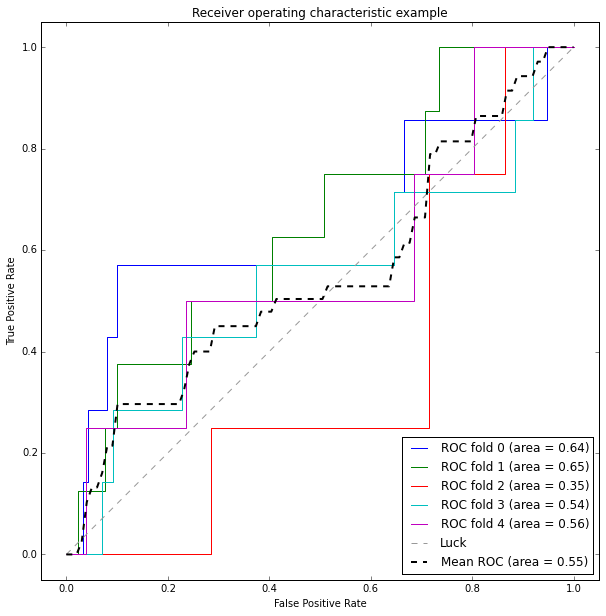

In [65]:
mean_tpr = 0.0
mean_fpr = np.linspace(0, 1, 100)
all_tpr = []

plt.figure(figsize=(10,10))

for i, (train, test) in enumerate(cv):
    probas_ = classifier.fit(X_sxs_best.ix[train], y_sxs_train.ix[train]).predict_proba(X_sxs_best.ix[test])
    # Compute ROC curve and area the curve
    fpr, tpr, thresholds = roc_curve(y_sxs_train.ix[test], probas_[:, 1])
    mean_tpr += interp(mean_fpr, fpr, tpr)
    mean_tpr[0] = 0.0
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw=1, label='ROC fold %d (area = %0.2f)' % (i, roc_auc))

plt.plot([0, 1], [0, 1], '--', color=(0.6, 0.6, 0.6), label='Luck')

mean_tpr /= len(cv)
mean_tpr[-1] = 1.0
sxs_best_thresh = thresholds[np.argmax(mean_tpr - mean_fpr)]
mean_auc = auc(mean_fpr, mean_tpr)
plt.plot(mean_fpr, mean_tpr, 'k--',
         label='Mean ROC (area = %0.2f)' % mean_auc, lw=2)

plt.xlim([-0.05, 1.05])
plt.ylim([-0.05, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic example')
plt.legend(loc="lower right")

In [66]:
X_sxs_test = pd.DataFrame(sxs_scale_fit.transform(X_sxs_test).transpose()[best_sxs_cols].transpose(), columns = X_sxs_test.columns[best_sxs_cols])

In [67]:
sxs_probas = classifier.fit(X_sxs_best, y_sxs_train).predict_proba(X_sxs_test)
X_sxs_pred = []
for row in sxs_probas:
    if row[1] > sxs_best_thresh:
        X_sxs_pred.append(1)
    else:
        X_sxs_pred.append(0)

In [68]:
accuracy_score(X_sxs_pred, y_sxs_test)

0.94368932038834952

In [69]:
precision_score(X_sxs_pred, y_sxs_test)

0.0

In [70]:
recall_score(X_sxs_pred, y_sxs_test)

0.0

In [71]:
f1_score(X_sxs_pred, y_sxs_test)

0.0

Quite bad.

# COACHELLA MUSIC FESTIVAL

In [72]:
y_coa, X_coa = df.coa_2015, df.ix[:, 'fans':'noi_counts']
X_coa_train, X_coa_test, y_coa_train, y_coa_test = train_test_split(X_coa, y_coa, test_size = 0.25, random_state = 4444)
coa_scale_fit = StandardScaler().fit(X_coa_train)
X_coa_train_scaled = pd.DataFrame(coa_scale_fit.transform(X_coa_train), columns = X_coa_train.columns)
new_coa_features = SelectKBest(f_classif, k = 10)
X_coa_best = new_coa_features.fit_transform(X_coa_train_scaled, y_coa_train)
best_coa_cols = new_coa_features.get_support(True)
X_coa_best = pd.DataFrame(X_coa_best, columns = X_coa.columns[best_coa_cols])

In [73]:
cw_range = [{1:1-cw, 0:cw} for cw in np.arange(.01, 1.0, .1)]
gamma_range = np.logspace(-9, 3, 9)
param_grid = dict(gamma=gamma_range, class_weight=cw_range)
cv = ShuffleSplit(len(y_coa_train), n_iter=5, test_size=0.2, random_state=42)
for score in ['accuracy','precision', 'recall']:
    grid = GridSearchCV(SVC(kernel = 'rbf'), param_grid=param_grid, cv=cv, scoring = score, verbose= 10)
    grid.fit(X_coa_best, y_coa_train)
    print("The best parameters are %s with a score of %0.2f"
          % (grid.best_params_, grid.best_score_))

Fitting 5 folds for each of 90 candidates, totalling 450 fits
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.100324 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.058252 -   0.1s

[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.1s



[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.074434 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.061489 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.058252 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.100324 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.058252 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999

[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.4s
[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.5s



[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.061489 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.058252 -   0.1s
[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.100324 -   0.1s
[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.058252 -   0.1s
[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.074434 -   0.1s
[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.06148

[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    0.9s
[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    1.3s



[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.061489 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.058252 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.100324 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.058252 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.074434 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.06148

[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    1.8s
[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    2.3s



[CV] gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.074434 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.061489 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.058252 -   0.1s
[CV] gamma=31.6227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=31.6227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.100324 -   0.1s
[CV] gamma=31.6227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=31.6227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.058252 -   0.1s
[CV] gamma=31.6227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=31.6227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.074434 -   0.1s


[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    3.0s
[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    3.5s



[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.941748 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.899676 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.941748 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.925566 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.938511 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-08, clas

[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    4.1s
[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    4.6s



[CV] gamma=0.0316227766017, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.864078 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.841424 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.841424 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.11, 1: 0.89000000000000001} .......
[CV]  gamma=1.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.899676 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.11, 1: 0.89000000000000001} .......
[CV]  gamma=1.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.941748 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.11, 1: 0.89000000000000001} .......
[CV]  gamma=1.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.9255

[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    5.6s
[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    6.1s



[CV] gamma=3.16227766017e-08, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.941748 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.925566 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.938511 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.941748 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=1e-06, class_weight={0: 0.21000000000000002, 1: 0.790000000000

[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    6.4s
[Parallel(n_jobs=1)]: Done 128 jobs       | elapsed:    7.3s



[CV] gamma=31.6227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=31.6227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.938511 -   0.1s
[CV] gamma=31.6227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=31.6227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.941748 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=1000.0, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.899676 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=1000.0, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.941748 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=1000.0, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.925566 -   0.1s
[CV] gamma=1000.0, class_w

[Parallel(n_jobs=1)]: Done 145 jobs       | elapsed:    8.1s
[Parallel(n_jobs=1)]: Done 162 jobs       | elapsed:    8.4s



[CV] gamma=0.0316227766017, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.925566 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.938511 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.941748 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=1.0, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.899676 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=1.0, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.941748 -   0.1s
[CV] gamma=1

[Parallel(n_jobs=1)]: Done 181 jobs       | elapsed:    9.7s
[Parallel(n_jobs=1)]: Done 200 jobs       | elapsed:   10.0s



[CV] gamma=3.16227766017e-05, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.925566 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.938511 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.941748 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=0.001, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.899676 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=0.001, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.941748 -

[Parallel(n_jobs=1)]: Done 221 jobs       | elapsed:   11.1s
[Parallel(n_jobs=1)]: Done 242 jobs       | elapsed:   11.6s



[CV] gamma=3.16227766017e-05, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.941748 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.925566 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.938511 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.941748 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=0.001, class_weight={0: 0.51000000000000001, 1: 0.489999999999

[Parallel(n_jobs=1)]: Done 265 jobs       | elapsed:   12.6s
[Parallel(n_jobs=1)]: Done 288 jobs       | elapsed:   13.1s



[CV] gamma=3.16227766017e-05, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999}, score=0.899676 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999}, score=0.941748 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999}, score=0.925566 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999}, score=0.938511 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.6100000000000001, 1: 0.3899999

[Parallel(n_jobs=1)]: Done 313 jobs       | elapsed:   14.4s
[Parallel(n_jobs=1)]: Done 338 jobs       | elapsed:   15.0s



[CV] gamma=0.001, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=0.001, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.941748 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=0.001, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.925566 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=0.001, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.938511 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=0.001, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.941748 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.899676 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0:

[Parallel(n_jobs=1)]: Done 365 jobs       | elapsed:   16.8s
[Parallel(n_jobs=1)]: Done 392 jobs       | elapsed:   17.4s



[CV] gamma=1.0, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1.0, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.925566 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1.0, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.938511 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1.0, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.941748 -   0.1s
[CV] gamma=31.6227766017, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=31.6227766017, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.899676 -   0.1s
[CV] gamma=31.6227766017, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=31.6227766017, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.941748 -   0.1s
[CV] gamma=31.6227766017, class_weight={0: 0

[Parallel(n_jobs=1)]: Done 421 jobs       | elapsed:   18.7s
[Parallel(n_jobs=1)]: Done 450 jobs       | elapsed:   20.0s



The best parameters are {'gamma': 0.031622776601683791, 'class_weight': {0: 0.21000000000000002, 1: 0.79000000000000004}} with a score of 0.93
Fitting 5 folds for each of 90 candidates, totalling 450 fits
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.100324 -   0.1s

[Parallel(n_jobs=1)]: Done 450 out of 450 | elapsed:   20.0s finished
[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.1s



[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.058252 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.074434 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.061489 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.058252 -   0.1s

[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.5s



[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.100324 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.058252 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.074434 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.061489 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.058252 -   0.1s
[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, clas

[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.7s
[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    1.2s



[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.061489 -   0.1s
[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.058252 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.100324 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.058252 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.074434 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 

[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    1.8s
[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    2.4s



[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.100324 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.058252 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.074434 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.061489 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.058252 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=1.0, class_weight={0: 0.01, 1: 

[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    3.1s
[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    3.8s



[CV] gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.100324 -   0.0s
[CV] gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.058252 -   0.0s
[CV] gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.074434 -   0.0s
[CV] gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.061489 -   0.0s
[CV] gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.058252 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1e-09, clas

[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    4.2s
[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    4.6s



[CV] gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=0.001, clas

[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    5.1s
[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    6.0s



[CV] gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001} ....
[CV]  gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001} ....
[CV]  gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001} ....
[CV]  gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001} ....
[CV]  gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001} ....
[CV]  gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=1e-09, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.

[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    6.5s
[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    6.9s



[CV] gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.500000 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=1.000000 -   0.0s
[CV]

[Parallel(n_jobs=1)]: Done 128 jobs       | elapsed:    7.6s
[Parallel(n_jobs=1)]: Done 145 jobs       | elapsed:    8.2s



[CV] gamma=3.16227766017e-08, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.310

[Parallel(n_jobs=1)]: Done 162 jobs       | elapsed:    8.6s
[Parallel(n_jobs=1)]: Done 181 jobs       | elapsed:    9.8s



[CV] gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.410000000000000

[Parallel(n_jobs=1)]: Done 200 jobs       | elapsed:   10.1s
[Parallel(n_jobs=1)]: Done 221 jobs       | elapsed:   11.2s



[CV] gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1e-09, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.51000000000000001, 

[Parallel(n_jobs=1)]: Done 242 jobs       | elapsed:   11.6s
[Parallel(n_jobs=1)]: Done 265 jobs       | elapsed:   12.6s



[CV] gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.0s
[CV] gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.6100000000000001,

[Parallel(n_jobs=1)]: Done 288 jobs       | elapsed:   13.1s
[Parallel(n_jobs=1)]: Done 313 jobs       | elapsed:   14.3s



[CV] gamma=1000.0, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999}, score=0.000000 -   0.0s
[CV] gamma=1000.0, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999}, score=0.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.289999999

[Parallel(n_jobs=1)]: Done 338 jobs       | elapsed:   14.7s
[Parallel(n_jobs=1)]: Done 365 jobs       | elapsed:   15.9s



[CV] gamma=3.16227766017e-08, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.810000000000

[Parallel(n_jobs=1)]: Done 392 jobs       | elapsed:   16.4s
[Parallel(n_jobs=1)]: Done 421 jobs       | elapsed:   17.4s



[CV] gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.910

[Parallel(n_jobs=1)]: Done 450 jobs       | elapsed:   18.6s
[Parallel(n_jobs=1)]: Done 450 out of 450 | elapsed:   18.6s finished
[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.1s



[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s

[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.3s



[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, clas

[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.5s
[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    0.9s



[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 

[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    1.2s
[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    1.7s



[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=1.0, class_weight={0: 0.01, 1: 

[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    2.2s
[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    2.9s



[CV] gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.0s
[CV] gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.0s
[CV] gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1e-09, clas

[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    3.3s
[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    3.7s



[CV] gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=0.001, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=0.001, class_weight={0: 0.11, 

[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    4.2s
[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    5.1s



[CV] gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001} ....
[CV]  gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001} ....
[CV]  gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001} ....
[CV]  gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001} ....
[CV]  gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001} ....
[CV]  gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=1e-09, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.

[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    5.8s
[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    6.1s



[CV] gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.055556 -   0.0s
[CV] gamma=0.03162277660

[Parallel(n_jobs=1)]: Done 128 jobs       | elapsed:    7.0s
[Parallel(n_jobs=1)]: Done 145 jobs       | elapsed:    7.7s



[CV] gamma=3.16227766017e-08, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.310

[Parallel(n_jobs=1)]: Done 162 jobs       | elapsed:    8.1s
[Parallel(n_jobs=1)]: Done 181 jobs       | elapsed:    9.2s



[CV] gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.410000000000000

[Parallel(n_jobs=1)]: Done 200 jobs       | elapsed:    9.5s
[Parallel(n_jobs=1)]: Done 221 jobs       | elapsed:   10.5s



[CV] gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1e-09, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.51000000000000001, 

[Parallel(n_jobs=1)]: Done 242 jobs       | elapsed:   10.9s
[Parallel(n_jobs=1)]: Done 265 jobs       | elapsed:   11.8s



[CV] gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.0s
[CV] gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.0s
[CV] gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.0s
[CV] gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.6100000000000001,

[Parallel(n_jobs=1)]: Done 288 jobs       | elapsed:   12.3s
[Parallel(n_jobs=1)]: Done 313 jobs       | elapsed:   13.5s



[CV] gamma=1000.0, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999}, score=0.000000 -   0.0s
[CV] gamma=1000.0, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999}, score=0.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.289999999

[Parallel(n_jobs=1)]: Done 338 jobs       | elapsed:   13.9s
[Parallel(n_jobs=1)]: Done 365 jobs       | elapsed:   15.2s



[CV] gamma=3.16227766017e-08, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.810000000000

[Parallel(n_jobs=1)]: Done 392 jobs       | elapsed:   15.6s
[Parallel(n_jobs=1)]: Done 421 jobs       | elapsed:   16.6s



[CV] gamma=1e-06, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969} 
[CV]  gamma=1e-06, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969} 
[CV]  gamma=1e-06, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969} 
[CV]  gamma=1e-06, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969}, score=0.000000 -   0.0s
[CV] g

[Parallel(n_jobs=1)]: Done 450 jobs       | elapsed:   17.7s
[Parallel(n_jobs=1)]: Done 450 out of 450 | elapsed:   17.7s finished


The best parameters are {'gamma': 0.031622, 'class_weight': {0: 0.21, 1: 0.79}} with an accuracy score of 0.93.

The best parameters are {'gamma': 0.031622, 'class_weight': {0: 0.21, 1: 0.79}} with a precision score of 0.60.

The best parameters are {'gamma': 1.0e-09, 'class_weight': {0: 0.01, 1: 0.99}} with a recall score of 1.00.

In [74]:
cw_range = [{1:1-cw, 0:cw} for cw in np.arange(.17, .25, .01)]
gamma_range = np.logspace(-2, -1, 9)
param_grid = dict(gamma=gamma_range, class_weight=cw_range)
cv = ShuffleSplit(len(y_coa_train), n_iter=5, test_size=0.2, random_state=42)
for score in ['accuracy','precision', 'recall']:
    grid = GridSearchCV(SVC(kernel = 'rbf'), param_grid=param_grid, cv=cv, scoring = score, verbose= 10)
    grid.fit(X_coa_best, y_coa_train)
    print("The best parameters are %s with a score of %0.2f"
          % (grid.best_params_, grid.best_score_))

Fitting 5 folds for each of 72 candidates, totalling 360 fits
[CV] gamma=0.01, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.899676 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.941748 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.925566 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.935275 -   0.0s

[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.2s



[CV] gamma=0.01, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.941748 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.899676 -   0.1s
[CV] gamma=0.0133352143216, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.938511 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.932039 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.93

[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    0.5s



[CV] gamma=0.0177827941004, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.932039 -   0.0s
[CV] gamma=0.0177827941004, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.932039 -   0.0s
[CV] gamma=0.0177827941004, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.948220 -   0.1s
[CV] gamma=0.0237137370566, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=0.0237137370566, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.899676 -   0.0s
[CV] gamma=0.0237137370566, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=0.0237137370566, class_weight={0: 0.17000000000000001, 1: 0.82999999

[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    0.7s
[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    0.9s



[CV] gamma=0.0316227766017, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.954693 -   0.0s
[CV] gamma=0.0421696503429, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.906149 -   0.0s
[CV] gamma=0.0421696503429, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.935275 -   0.0s
[CV] gamma=0.0421696503429, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.928803 -   0.0s
[CV] gamma=0.0421696503429, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.17000000000000001, 1: 0.82999999

[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    1.1s
[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    1.4s



[CV] gamma=0.1, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=0.1, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.915858 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=0.1, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.925566 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=0.1, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.919094 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=0.1, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.912621 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=0.1, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.935275 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995} 
[CV]

[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    1.7s
[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    2.1s



[CV] gamma=0.0237137370566, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995} 
[CV]  gamma=0.0237137370566, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995}, score=0.941748 -   0.0s
[CV] gamma=0.0237137370566, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995} 
[CV]  gamma=0.0237137370566, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995}, score=0.932039 -   0.0s
[CV] gamma=0.0237137370566, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995} 
[CV]  gamma=0.0237137370566, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995}, score=0.932039 -   0.0s
[CV] gamma=0.0237137370566, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995} 
[CV]  gamma=0.0237137370566, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995}, score=0.948220 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.18000000000000002, 1: 0.81999999

[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    2.5s
[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    3.0s



[CV] gamma=0.0749894209332, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995} 
[CV]  gamma=0.0749894209332, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995}, score=0.941748 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995} 
[CV]  gamma=0.1, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995}, score=0.912621 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995} 
[CV]  gamma=0.1, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995}, score=0.928803 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995} 
[CV]  gamma=0.1, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995}, score=0.925566 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995} 
[CV]  gamma=0.1, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995}, score=0.915858 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.18000000000000002, 1: 0.8

[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    3.4s
[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    3.8s



[CV] gamma=0.0316227766017, class_weight={0: 0.19000000000000003, 1: 0.80999999999999994} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.19000000000000003, 1: 0.80999999999999994}, score=0.932039 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.19000000000000003, 1: 0.80999999999999994} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.19000000000000003, 1: 0.80999999999999994}, score=0.932039 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.19000000000000003, 1: 0.80999999999999994} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.19000000000000003, 1: 0.80999999999999994}, score=0.948220 -   0.0s
[CV] gamma=0.0421696503429, class_weight={0: 0.19000000000000003, 1: 0.80999999999999994} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.19000000000000003, 1: 0.80999999999999994}, score=0.902913 -   0.0s
[CV] gamma=0.0421696503429, class_weight={0: 0.19000000000000003, 1: 0.80999999999999994} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.19000000000000003, 1: 0.80999999

[Parallel(n_jobs=1)]: Done 128 jobs       | elapsed:    4.3s
[Parallel(n_jobs=1)]: Done 145 jobs       | elapsed:    5.0s



[CV] gamma=0.0133352143216, class_weight={0: 0.20000000000000004, 1: 0.79999999999999993} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.20000000000000004, 1: 0.79999999999999993}, score=0.941748 -   0.0s
[CV] gamma=0.0177827941004, class_weight={0: 0.20000000000000004, 1: 0.79999999999999993} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.20000000000000004, 1: 0.79999999999999993}, score=0.899676 -   0.0s
[CV] gamma=0.0177827941004, class_weight={0: 0.20000000000000004, 1: 0.79999999999999993} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.20000000000000004, 1: 0.79999999999999993}, score=0.941748 -   0.0s
[CV] gamma=0.0177827941004, class_weight={0: 0.20000000000000004, 1: 0.79999999999999993} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.20000000000000004, 1: 0.79999999999999993}, score=0.925566 -   0.0s
[CV] gamma=0.0177827941004, class_weight={0: 0.20000000000000004, 1: 0.79999999999999993} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.20000000000000004, 1: 0.79999999

[Parallel(n_jobs=1)]: Done 162 jobs       | elapsed:    5.6s
[Parallel(n_jobs=1)]: Done 181 jobs       | elapsed:    6.2s



[CV] gamma=0.01, class_weight={0: 0.21000000000000005, 1: 0.78999999999999992} 
[CV]  gamma=0.01, class_weight={0: 0.21000000000000005, 1: 0.78999999999999992}, score=0.941748 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.21000000000000005, 1: 0.78999999999999992} 
[CV]  gamma=0.01, class_weight={0: 0.21000000000000005, 1: 0.78999999999999992}, score=0.925566 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.21000000000000005, 1: 0.78999999999999992} 
[CV]  gamma=0.01, class_weight={0: 0.21000000000000005, 1: 0.78999999999999992}, score=0.938511 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.21000000000000005, 1: 0.78999999999999992} 
[CV]  gamma=0.01, class_weight={0: 0.21000000000000005, 1: 0.78999999999999992}, score=0.941748 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.21000000000000005, 1: 0.78999999999999992} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.21000000000000005, 1: 0.78999999999999992}, score=0.899676 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.21000

[Parallel(n_jobs=1)]: Done 200 jobs       | elapsed:    6.8s
[Parallel(n_jobs=1)]: Done 221 jobs       | elapsed:    7.4s



[CV] gamma=0.1, class_weight={0: 0.21000000000000005, 1: 0.78999999999999992} 
[CV]  gamma=0.1, class_weight={0: 0.21000000000000005, 1: 0.78999999999999992}, score=0.938511 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.21000000000000005, 1: 0.78999999999999992} 
[CV]  gamma=0.1, class_weight={0: 0.21000000000000005, 1: 0.78999999999999992}, score=0.932039 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.21000000000000005, 1: 0.78999999999999992} 
[CV]  gamma=0.1, class_weight={0: 0.21000000000000005, 1: 0.78999999999999992}, score=0.928803 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.21000000000000005, 1: 0.78999999999999992} 
[CV]  gamma=0.1, class_weight={0: 0.21000000000000005, 1: 0.78999999999999992}, score=0.941748 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.22000000000000006, 1: 0.77999999999999992} 
[CV]  gamma=0.01, class_weight={0: 0.22000000000000006, 1: 0.77999999999999992}, score=0.899676 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.22000000000000006, 1: 0.77999999999999992} 
[C

[Parallel(n_jobs=1)]: Done 242 jobs       | elapsed:    8.0s
[Parallel(n_jobs=1)]: Done 265 jobs       | elapsed:    8.8s



[CV] gamma=0.1, class_weight={0: 0.22000000000000006, 1: 0.77999999999999992} 
[CV]  gamma=0.1, class_weight={0: 0.22000000000000006, 1: 0.77999999999999992}, score=0.899676 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.22000000000000006, 1: 0.77999999999999992} 
[CV]  gamma=0.1, class_weight={0: 0.22000000000000006, 1: 0.77999999999999992}, score=0.944984 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.22000000000000006, 1: 0.77999999999999992} 
[CV]  gamma=0.1, class_weight={0: 0.22000000000000006, 1: 0.77999999999999992}, score=0.928803 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.22000000000000006, 1: 0.77999999999999992} 
[CV]  gamma=0.1, class_weight={0: 0.22000000000000006, 1: 0.77999999999999992}, score=0.928803 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.22000000000000006, 1: 0.77999999999999992} 
[CV]  gamma=0.1, class_weight={0: 0.22000000000000006, 1: 0.77999999999999992}, score=0.941748 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.23000000000000007, 1: 0.76999999999999991} 
[CV]

[Parallel(n_jobs=1)]: Done 288 jobs       | elapsed:    9.7s
[Parallel(n_jobs=1)]: Done 313 jobs       | elapsed:   10.6s



[CV] gamma=0.1, class_weight={0: 0.23000000000000007, 1: 0.76999999999999991} 
[CV]  gamma=0.1, class_weight={0: 0.23000000000000007, 1: 0.76999999999999991}, score=0.932039 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.23000000000000007, 1: 0.76999999999999991} 
[CV]  gamma=0.1, class_weight={0: 0.23000000000000007, 1: 0.76999999999999991}, score=0.941748 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.24000000000000007, 1: 0.7599999999999999} 
[CV]  gamma=0.01, class_weight={0: 0.24000000000000007, 1: 0.7599999999999999}, score=0.899676 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.24000000000000007, 1: 0.7599999999999999} 
[CV]  gamma=0.01, class_weight={0: 0.24000000000000007, 1: 0.7599999999999999}, score=0.941748 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.24000000000000007, 1: 0.7599999999999999} 
[CV]  gamma=0.01, class_weight={0: 0.24000000000000007, 1: 0.7599999999999999}, score=0.925566 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.24000000000000007, 1: 0.7599999999999999} 
[CV] 

[Parallel(n_jobs=1)]: Done 338 jobs       | elapsed:   11.5s
[Parallel(n_jobs=1)]: Done 360 out of 360 | elapsed:   12.4s finished



[CV] gamma=0.1, class_weight={0: 0.24000000000000007, 1: 0.7599999999999999} 
[CV]  gamma=0.1, class_weight={0: 0.24000000000000007, 1: 0.7599999999999999}, score=0.951456 -   0.0s
The best parameters are {'gamma': 0.042169650342858224, 'class_weight': {0: 0.19000000000000003, 1: 0.80999999999999994}} with a score of 0.93
Fitting 5 folds for each of 72 candidates, totalling 360 fits
[CV] gamma=0.01, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.500000 -   0.0s

[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.1s



[CV] gamma=0.01, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.428571 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.000000 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.000000 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.428571 -   0.0s
[CV] gamma=0.0133352143216, cl

[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.4s



[CV]  gamma=0.0133352143216, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=1.000000 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.444444 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=1.000000 -   0.0s
[CV] gamma=0.0177827941004, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.000000 -   0.0s
[CV] gamma=0.0177827941004, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.500000 -   0.0s
[CV] gamma=0.0177827941004, class_weight={0: 0.17000000

[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    0.6s
[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    0.8s



[CV] gamma=0.0237137370566, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=0.0237137370566, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.700000 -   0.0s
[CV] gamma=0.0237137370566, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=0.0237137370566, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.375000 -   0.0s
[CV] gamma=0.0237137370566, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=0.0237137370566, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.857143 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=1.000000 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.17000000000000001, 1: 0.82999999

[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    1.2s
[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    1.4s



[CV] gamma=0.056234132519, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=0.056234132519, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.470588 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=0.056234132519, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.200000 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=0.056234132519, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.538462 -   0.0s
[CV] gamma=0.0749894209332, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=0.0749894209332, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.800000 -   0.0s
[CV] gamma=0.0749894209332, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=0.0749894209332, class_weight={0: 0.17000000000000001, 1: 0.82999999999999

[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    1.7s
[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    2.0s



[CV] gamma=0.0133352143216, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995}, score=0.000000 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995}, score=0.333333 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995}, score=0.000000 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995}, score=0.428571 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.18000000000000002, 1: 0.81999999

[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    2.3s
[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    2.6s



[CV] gamma=0.0421696503429, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995}, score=0.615385 -   0.0s
[CV] gamma=0.0421696503429, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995}, score=0.300000 -   0.0s
[CV] gamma=0.0421696503429, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995}, score=0.666667 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995} 
[CV]  gamma=0.056234132519, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995}, score=0.750000 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995} 
[CV]  gamma=0.056234132519, class_weight={0: 0.18000000000000002, 1: 0.819999999999

[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    3.2s
[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    3.8s



[CV] gamma=0.0133352143216, class_weight={0: 0.19000000000000003, 1: 0.80999999999999994} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.19000000000000003, 1: 0.80999999999999994}, score=0.000000 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.19000000000000003, 1: 0.80999999999999994} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.19000000000000003, 1: 0.80999999999999994}, score=0.333333 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.19000000000000003, 1: 0.80999999999999994} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.19000000000000003, 1: 0.80999999999999994}, score=0.000000 -   0.0s
[CV] gamma=0.0177827941004, class_weight={0: 0.19000000000000003, 1: 0.80999999999999994} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.19000000000000003, 1: 0.80999999999999994}, score=0.000000 -   0.0s
[CV] gamma=0.0177827941004, class_weight={0: 0.19000000000000003, 1: 0.80999999999999994} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.19000000000000003, 1: 0.80999999

[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    4.3s
[Parallel(n_jobs=1)]: Done 128 jobs       | elapsed:    4.7s



[CV] gamma=0.0749894209332, class_weight={0: 0.19000000000000003, 1: 0.80999999999999994} 
[CV]  gamma=0.0749894209332, class_weight={0: 0.19000000000000003, 1: 0.80999999999999994}, score=0.615385 -   0.0s
[CV] gamma=0.0749894209332, class_weight={0: 0.19000000000000003, 1: 0.80999999999999994} 
[CV]  gamma=0.0749894209332, class_weight={0: 0.19000000000000003, 1: 0.80999999999999994}, score=0.300000 -   0.0s
[CV] gamma=0.0749894209332, class_weight={0: 0.19000000000000003, 1: 0.80999999999999994} 
[CV]  gamma=0.0749894209332, class_weight={0: 0.19000000000000003, 1: 0.80999999999999994}, score=0.625000 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.19000000000000003, 1: 0.80999999999999994} 
[CV]  gamma=0.1, class_weight={0: 0.19000000000000003, 1: 0.80999999999999994}, score=1.000000 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.19000000000000003, 1: 0.80999999999999994} 
[CV]  gamma=0.1, class_weight={0: 0.19000000000000003, 1: 0.80999999999999994}, score=0.333333 -   0.0s
[CV] gamma=0

[Parallel(n_jobs=1)]: Done 145 jobs       | elapsed:    5.2s
[Parallel(n_jobs=1)]: Done 162 jobs       | elapsed:    5.7s



[CV] gamma=0.0421696503429, class_weight={0: 0.20000000000000004, 1: 0.79999999999999993} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.20000000000000004, 1: 0.79999999999999993}, score=0.500000 -   0.0s
[CV] gamma=0.0421696503429, class_weight={0: 0.20000000000000004, 1: 0.79999999999999993} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.20000000000000004, 1: 0.79999999999999993}, score=0.666667 -   0.0s
[CV] gamma=0.0421696503429, class_weight={0: 0.20000000000000004, 1: 0.79999999999999993} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.20000000000000004, 1: 0.79999999999999993}, score=0.375000 -   0.0s
[CV] gamma=0.0421696503429, class_weight={0: 0.20000000000000004, 1: 0.79999999999999993} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.20000000000000004, 1: 0.79999999999999993}, score=1.000000 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.20000000000000004, 1: 0.79999999999999993} 
[CV]  gamma=0.056234132519, class_weight={0: 0.20000000000000004, 1: 0.7999999999

[Parallel(n_jobs=1)]: Done 181 jobs       | elapsed:    6.2s
[Parallel(n_jobs=1)]: Done 200 jobs       | elapsed:    6.7s



[CV] gamma=0.0237137370566, class_weight={0: 0.21000000000000005, 1: 0.78999999999999992} 
[CV]  gamma=0.0237137370566, class_weight={0: 0.21000000000000005, 1: 0.78999999999999992}, score=0.000000 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.21000000000000005, 1: 0.78999999999999992} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.21000000000000005, 1: 0.78999999999999992}, score=0.000000 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.21000000000000005, 1: 0.78999999999999992} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.21000000000000005, 1: 0.78999999999999992}, score=0.500000 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.21000000000000005, 1: 0.78999999999999992} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.21000000000000005, 1: 0.78999999999999992}, score=1.000000 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.21000000000000005, 1: 0.78999999999999992} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.21000000000000005, 1: 0.78999999

[Parallel(n_jobs=1)]: Done 221 jobs       | elapsed:    7.4s
[Parallel(n_jobs=1)]: Done 242 jobs       | elapsed:    8.1s



[CV] gamma=0.0237137370566, class_weight={0: 0.22000000000000006, 1: 0.77999999999999992} 
[CV]  gamma=0.0237137370566, class_weight={0: 0.22000000000000006, 1: 0.77999999999999992}, score=0.000000 -   0.0s
[CV] gamma=0.0237137370566, class_weight={0: 0.22000000000000006, 1: 0.77999999999999992} 
[CV]  gamma=0.0237137370566, class_weight={0: 0.22000000000000006, 1: 0.77999999999999992}, score=0.333333 -   0.0s
[CV] gamma=0.0237137370566, class_weight={0: 0.22000000000000006, 1: 0.77999999999999992} 
[CV]  gamma=0.0237137370566, class_weight={0: 0.22000000000000006, 1: 0.77999999999999992}, score=0.000000 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.22000000000000006, 1: 0.77999999999999992} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.22000000000000006, 1: 0.77999999999999992}, score=0.000000 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.22000000000000006, 1: 0.77999999999999992} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.22000000000000006, 1: 0.77999999

[Parallel(n_jobs=1)]: Done 265 jobs       | elapsed:    8.7s
[Parallel(n_jobs=1)]: Done 288 jobs       | elapsed:    9.4s



[CV] gamma=0.0237137370566, class_weight={0: 0.23000000000000007, 1: 0.76999999999999991} 
[CV]  gamma=0.0237137370566, class_weight={0: 0.23000000000000007, 1: 0.76999999999999991}, score=0.000000 -   0.0s
[CV] gamma=0.0237137370566, class_weight={0: 0.23000000000000007, 1: 0.76999999999999991} 
[CV]  gamma=0.0237137370566, class_weight={0: 0.23000000000000007, 1: 0.76999999999999991}, score=0.000000 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.23000000000000007, 1: 0.76999999999999991} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.23000000000000007, 1: 0.76999999999999991}, score=0.000000 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.23000000000000007, 1: 0.76999999999999991} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.23000000000000007, 1: 0.76999999999999991}, score=0.000000 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.23000000000000007, 1: 0.76999999999999991} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.23000000000000007, 1: 0.76999999

[Parallel(n_jobs=1)]: Done 313 jobs       | elapsed:   10.2s
[Parallel(n_jobs=1)]: Done 338 jobs       | elapsed:   10.9s



[CV] gamma=0.0316227766017, class_weight={0: 0.24000000000000007, 1: 0.7599999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.24000000000000007, 1: 0.7599999999999999}, score=0.500000 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.24000000000000007, 1: 0.7599999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.24000000000000007, 1: 0.7599999999999999}, score=0.000000 -   0.0s
[CV] gamma=0.0421696503429, class_weight={0: 0.24000000000000007, 1: 0.7599999999999999} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.24000000000000007, 1: 0.7599999999999999}, score=0.000000 -   0.0s
[CV] gamma=0.0421696503429, class_weight={0: 0.24000000000000007, 1: 0.7599999999999999} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.24000000000000007, 1: 0.7599999999999999}, score=0.000000 -   0.0s
[CV] gamma=0.0421696503429, class_weight={0: 0.24000000000000007, 1: 0.7599999999999999} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.24000000000000007, 1: 0.7599999999999999}

[Parallel(n_jobs=1)]: Done 360 out of 360 | elapsed:   11.6s finished
[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.0s



[CV] gamma=0.01, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.166667 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.157895 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.000000 -   0.0s

[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.2s



[CV] gamma=0.0133352143216, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.000000 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.166667 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.086957 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.210526 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.17000000000000001, 1: 0.82999999

[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    0.5s



[CV] gamma=0.0177827941004, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.157895 -   0.0s
[CV] gamma=0.0177827941004, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.111111 -   0.0s
[CV] gamma=0.0237137370566, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=0.0237137370566, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.000000 -   0.0s
[CV] gamma=0.0237137370566, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=0.0237137370566, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.222222 -   0.0s
[CV] gamma=0.0237137370566, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=0.0237137370566, class_weight={0: 0.17000000000000001, 1: 0.82999999

[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    0.7s
[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    0.9s



[CV] gamma=0.0421696503429, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.096774 -   0.0s
[CV] gamma=0.0421696503429, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.222222 -   0.0s
[CV] gamma=0.0421696503429, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.347826 -   0.0s
[CV] gamma=0.0421696503429, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.210526 -   0.0s
[CV] gamma=0.0421696503429, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.17000000000000001, 1: 0.82999999

[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    1.1s
[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    1.4s



[CV] gamma=0.1, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=0.1, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.222222 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=0.1, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.347826 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=0.1, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.210526 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=0.1, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.333333 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995} 
[CV]  gamma=0.01, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995} 
[C

[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    1.7s
[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    2.1s



[CV] gamma=0.0237137370566, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995} 
[CV]  gamma=0.0237137370566, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995}, score=0.166667 -   0.0s
[CV] gamma=0.0237137370566, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995} 
[CV]  gamma=0.0237137370566, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995}, score=0.173913 -   0.0s
[CV] gamma=0.0237137370566, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995} 
[CV]  gamma=0.0237137370566, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995}, score=0.157895 -   0.0s
[CV] gamma=0.0237137370566, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995} 
[CV]  gamma=0.0237137370566, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995}, score=0.111111 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.18000000000000002, 1: 0.81999999

[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    2.4s
[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    2.9s



[CV] gamma=0.1, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995} 
[CV]  gamma=0.1, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995}, score=0.129032 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995} 
[CV]  gamma=0.1, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995}, score=0.166667 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995} 
[CV]  gamma=0.1, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995}, score=0.347826 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995} 
[CV]  gamma=0.1, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995}, score=0.157895 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995} 
[CV]  gamma=0.1, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995}, score=0.277778 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.19000000000000003, 1: 0.80999999999999994} 
[CV]

[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    3.3s
[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    3.8s



[CV] gamma=0.0316227766017, class_weight={0: 0.19000000000000003, 1: 0.80999999999999994} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.19000000000000003, 1: 0.80999999999999994}, score=0.157895 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.19000000000000003, 1: 0.80999999999999994} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.19000000000000003, 1: 0.80999999999999994}, score=0.111111 -   0.0s
[CV] gamma=0.0421696503429, class_weight={0: 0.19000000000000003, 1: 0.80999999999999994} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.19000000000000003, 1: 0.80999999999999994}, score=0.032258 -   0.0s
[CV] gamma=0.0421696503429, class_weight={0: 0.19000000000000003, 1: 0.80999999999999994} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.19000000000000003, 1: 0.80999999999999994}, score=0.166667 -   0.0s
[CV] gamma=0.0421696503429, class_weight={0: 0.19000000000000003, 1: 0.80999999999999994} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.19000000000000003, 1: 0.80999999

[Parallel(n_jobs=1)]: Done 128 jobs       | elapsed:    4.2s
[Parallel(n_jobs=1)]: Done 145 jobs       | elapsed:    4.7s



[CV] gamma=0.0177827941004, class_weight={0: 0.20000000000000004, 1: 0.79999999999999993} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.20000000000000004, 1: 0.79999999999999993}, score=0.000000 -   0.0s
[CV] gamma=0.0177827941004, class_weight={0: 0.20000000000000004, 1: 0.79999999999999993} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.20000000000000004, 1: 0.79999999999999993}, score=0.000000 -   0.0s
[CV] gamma=0.0177827941004, class_weight={0: 0.20000000000000004, 1: 0.79999999999999993} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.20000000000000004, 1: 0.79999999999999993}, score=0.000000 -   0.0s
[CV] gamma=0.0177827941004, class_weight={0: 0.20000000000000004, 1: 0.79999999999999993} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.20000000000000004, 1: 0.79999999999999993}, score=0.105263 -   0.0s
[CV] gamma=0.0177827941004, class_weight={0: 0.20000000000000004, 1: 0.79999999999999993} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.20000000000000004, 1: 0.79999999

[Parallel(n_jobs=1)]: Done 162 jobs       | elapsed:    5.3s
[Parallel(n_jobs=1)]: Done 181 jobs       | elapsed:    5.9s



[CV] gamma=0.01, class_weight={0: 0.21000000000000005, 1: 0.78999999999999992} 
[CV]  gamma=0.01, class_weight={0: 0.21000000000000005, 1: 0.78999999999999992}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.21000000000000005, 1: 0.78999999999999992} 
[CV]  gamma=0.01, class_weight={0: 0.21000000000000005, 1: 0.78999999999999992}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.21000000000000005, 1: 0.78999999999999992} 
[CV]  gamma=0.01, class_weight={0: 0.21000000000000005, 1: 0.78999999999999992}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.21000000000000005, 1: 0.78999999999999992} 
[CV]  gamma=0.01, class_weight={0: 0.21000000000000005, 1: 0.78999999999999992}, score=0.000000 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.21000000000000005, 1: 0.78999999999999992} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.21000000000000005, 1: 0.78999999999999992}, score=0.000000 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.21000

[Parallel(n_jobs=1)]: Done 200 jobs       | elapsed:    6.5s
[Parallel(n_jobs=1)]: Done 221 jobs       | elapsed:    7.1s



[CV] gamma=0.1, class_weight={0: 0.21000000000000005, 1: 0.78999999999999992} 
[CV]  gamma=0.1, class_weight={0: 0.21000000000000005, 1: 0.78999999999999992}, score=0.166667 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.21000000000000005, 1: 0.78999999999999992} 
[CV]  gamma=0.1, class_weight={0: 0.21000000000000005, 1: 0.78999999999999992}, score=0.217391 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.21000000000000005, 1: 0.78999999999999992} 
[CV]  gamma=0.1, class_weight={0: 0.21000000000000005, 1: 0.78999999999999992}, score=0.157895 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.21000000000000005, 1: 0.78999999999999992} 
[CV]  gamma=0.1, class_weight={0: 0.21000000000000005, 1: 0.78999999999999992}, score=0.166667 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.22000000000000006, 1: 0.77999999999999992} 
[CV]  gamma=0.01, class_weight={0: 0.22000000000000006, 1: 0.77999999999999992}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.22000000000000006, 1: 0.77999999999999992} 
[C

[Parallel(n_jobs=1)]: Done 242 jobs       | elapsed:    7.8s
[Parallel(n_jobs=1)]: Done 265 jobs       | elapsed:    8.4s



[CV] gamma=0.1, class_weight={0: 0.22000000000000006, 1: 0.77999999999999992} 
[CV]  gamma=0.1, class_weight={0: 0.22000000000000006, 1: 0.77999999999999992}, score=0.000000 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.22000000000000006, 1: 0.77999999999999992} 
[CV]  gamma=0.1, class_weight={0: 0.22000000000000006, 1: 0.77999999999999992}, score=0.166667 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.22000000000000006, 1: 0.77999999999999992} 
[CV]  gamma=0.1, class_weight={0: 0.22000000000000006, 1: 0.77999999999999992}, score=0.173913 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.22000000000000006, 1: 0.77999999999999992} 
[CV]  gamma=0.1, class_weight={0: 0.22000000000000006, 1: 0.77999999999999992}, score=0.157895 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.22000000000000006, 1: 0.77999999999999992} 
[CV]  gamma=0.1, class_weight={0: 0.22000000000000006, 1: 0.77999999999999992}, score=0.166667 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.23000000000000007, 1: 0.76999999999999991} 
[CV]

[Parallel(n_jobs=1)]: Done 288 jobs       | elapsed:    9.0s
[Parallel(n_jobs=1)]: Done 313 jobs       | elapsed:    9.7s



[CV] gamma=0.1, class_weight={0: 0.23000000000000007, 1: 0.76999999999999991} 
[CV]  gamma=0.1, class_weight={0: 0.23000000000000007, 1: 0.76999999999999991}, score=0.157895 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.23000000000000007, 1: 0.76999999999999991} 
[CV]  gamma=0.1, class_weight={0: 0.23000000000000007, 1: 0.76999999999999991}, score=0.166667 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.24000000000000007, 1: 0.7599999999999999} 
[CV]  gamma=0.01, class_weight={0: 0.24000000000000007, 1: 0.7599999999999999}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.24000000000000007, 1: 0.7599999999999999} 
[CV]  gamma=0.01, class_weight={0: 0.24000000000000007, 1: 0.7599999999999999}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.24000000000000007, 1: 0.7599999999999999} 
[CV]  gamma=0.01, class_weight={0: 0.24000000000000007, 1: 0.7599999999999999}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.24000000000000007, 1: 0.7599999999999999} 
[CV] 

[Parallel(n_jobs=1)]: Done 338 jobs       | elapsed:   10.4s
[Parallel(n_jobs=1)]: Done 360 out of 360 | elapsed:   11.0s finished



[CV] gamma=0.1, class_weight={0: 0.24000000000000007, 1: 0.7599999999999999} 
[CV]  gamma=0.1, class_weight={0: 0.24000000000000007, 1: 0.7599999999999999}, score=0.166667 -   0.0s
The best parameters are {'gamma': 0.10000000000000001, 'class_weight': {0: 0.17000000000000001, 1: 0.82999999999999996}} with a score of 0.26


The best parameters are {'gamma': 0.04216, 'class_weight': {0: 0.19, 1: 0.81}} with an accuracy score of 0.93.

The best parameters are {'gamma': 0.04216, 'class_weight': {0: 0.23, 1: 0.77}} with a precision score of 0.72.

The best parameters are {'gamma': 0.1, 'class_weight': {0: 0.17, 1: 0.83}} with a recall score of 0.26.

In [75]:
cw_range = [{1:1-cw, 0:cw} for cw in np.arange(.19, .23, .001)]
gamma_range = np.arange(0.04, 0.05, 0.001)
param_grid = dict(gamma=gamma_range, class_weight=cw_range)
cv = ShuffleSplit(len(y_coa_train), n_iter=5, test_size=0.2, random_state=42)
for score in ['accuracy','precision', 'recall']:
    grid = GridSearchCV(SVC(kernel = 'rbf'), param_grid=param_grid, cv=cv, scoring = score, verbose= 10)
    grid.fit(X_coa_best, y_coa_train)
    print("The best parameters are %s with a score of %0.2f"
          % (grid.best_params_, grid.best_score_))

Fitting 5 folds for each of 451 candidates, totalling 2255 fits
[CV] gamma=0.04, class_weight={0: 0.19, 1: 0.81000000000000005} ......
[CV]  gamma=0.04, class_weight={0: 0.19, 1: 0.81000000000000005}, score=0.902913 -   0.0s
[CV] gamma=0.04, class_weight={0: 0.19, 1: 0.81000000000000005} ......
[CV]  gamma=0.04, class_weight={0: 0.19, 1: 0.81000000000000005}, score=0.944984 -   0.0s
[CV] gamma=0.04, class_weight={0: 0.19, 1: 0.81000000000000005} ......
[CV]  gamma=0.04, class_weight={0: 0.19, 1: 0.81000000000000005}, score=0.938511 -   0.0s
[CV] gamma=0.04, class_weight={0: 0.19, 1: 0.81000000000000005} ......
[CV]  gamma=0.04, class_weight={0: 0.19, 1: 0.81000000000000005}, score=0.932039 -   0.0s

[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.2s



[CV] gamma=0.04, class_weight={0: 0.19, 1: 0.81000000000000005} ......
[CV]  gamma=0.04, class_weight={0: 0.19, 1: 0.81000000000000005}, score=0.954693 -   0.0s
[CV] gamma=0.041, class_weight={0: 0.19, 1: 0.81000000000000005} .....
[CV]  gamma=0.041, class_weight={0: 0.19, 1: 0.81000000000000005}, score=0.902913 -   0.0s
[CV] gamma=0.041, class_weight={0: 0.19, 1: 0.81000000000000005} .....
[CV]  gamma=0.041, class_weight={0: 0.19, 1: 0.81000000000000005}, score=0.944984 -   0.0s
[CV] gamma=0.041, class_weight={0: 0.19, 1: 0.81000000000000005} .....
[CV]  gamma=0.041, class_weight={0: 0.19, 1: 0.81000000000000005}, score=0.938511 -   0.0s
[CV] gamma=0.041, class_weight={0: 0.19, 1: 0.81000000000000005} .....
[CV]  gamma=0.041, class_weight={0: 0.19, 1: 0.81000000000000005}, score=0.932039 -   0.0s
[CV] gamma=0.041, class_weight={0: 0.19, 1: 0.81000000000000005} .....
[CV]  gamma=0.041, class_weight={0: 0.19, 1: 0.81000000000000005}, score=0.954693 -   0.0s
[CV] gamma=0.042, class_weig

[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    0.4s



[CV] gamma=0.042, class_weight={0: 0.19, 1: 0.81000000000000005} .....
[CV]  gamma=0.042, class_weight={0: 0.19, 1: 0.81000000000000005}, score=0.938511 -   0.0s
[CV] gamma=0.042, class_weight={0: 0.19, 1: 0.81000000000000005} .....
[CV]  gamma=0.042, class_weight={0: 0.19, 1: 0.81000000000000005}, score=0.932039 -   0.0s
[CV] gamma=0.042, class_weight={0: 0.19, 1: 0.81000000000000005} .....
[CV]  gamma=0.042, class_weight={0: 0.19, 1: 0.81000000000000005}, score=0.954693 -   0.0s
[CV] gamma=0.043, class_weight={0: 0.19, 1: 0.81000000000000005} .....
[CV]  gamma=0.043, class_weight={0: 0.19, 1: 0.81000000000000005}, score=0.902913 -   0.0s
[CV] gamma=0.043, class_weight={0: 0.19, 1: 0.81000000000000005} .....
[CV]  gamma=0.043, class_weight={0: 0.19, 1: 0.81000000000000005}, score=0.941748 -   0.0s
[CV] gamma=0.043, class_weight={0: 0.19, 1: 0.81000000000000005} .....
[CV]  gamma=0.043, class_weight={0: 0.19, 1: 0.81000000000000005}, score=0.938511 -   0.0s
[CV] gamma=0.043, class_wei

[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    0.6s
[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    0.8s



[CV] gamma=0.044, class_weight={0: 0.19, 1: 0.81000000000000005} .....
[CV]  gamma=0.044, class_weight={0: 0.19, 1: 0.81000000000000005}, score=0.954693 -   0.0s
[CV] gamma=0.045, class_weight={0: 0.19, 1: 0.81000000000000005} .....
[CV]  gamma=0.045, class_weight={0: 0.19, 1: 0.81000000000000005}, score=0.902913 -   0.0s
[CV] gamma=0.045, class_weight={0: 0.19, 1: 0.81000000000000005} .....
[CV]  gamma=0.045, class_weight={0: 0.19, 1: 0.81000000000000005}, score=0.938511 -   0.0s
[CV] gamma=0.045, class_weight={0: 0.19, 1: 0.81000000000000005} .....
[CV]  gamma=0.045, class_weight={0: 0.19, 1: 0.81000000000000005}, score=0.938511 -   0.0s
[CV] gamma=0.045, class_weight={0: 0.19, 1: 0.81000000000000005} .....
[CV]  gamma=0.045, class_weight={0: 0.19, 1: 0.81000000000000005}, score=0.932039 -   0.0s
[CV] gamma=0.045, class_weight={0: 0.19, 1: 0.81000000000000005} .....
[CV]  gamma=0.045, class_weight={0: 0.19, 1: 0.81000000000000005}, score=0.954693 -   0.0s
[CV] gamma=0.046, class_wei

[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    1.1s
[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    1.3s



[CV] gamma=0.048, class_weight={0: 0.19, 1: 0.81000000000000005} .....
[CV]  gamma=0.048, class_weight={0: 0.19, 1: 0.81000000000000005}, score=0.906149 -   0.0s
[CV] gamma=0.048, class_weight={0: 0.19, 1: 0.81000000000000005} .....
[CV]  gamma=0.048, class_weight={0: 0.19, 1: 0.81000000000000005}, score=0.938511 -   0.0s
[CV] gamma=0.048, class_weight={0: 0.19, 1: 0.81000000000000005} .....
[CV]  gamma=0.048, class_weight={0: 0.19, 1: 0.81000000000000005}, score=0.935275 -   0.0s
[CV] gamma=0.048, class_weight={0: 0.19, 1: 0.81000000000000005} .....
[CV]  gamma=0.048, class_weight={0: 0.19, 1: 0.81000000000000005}, score=0.928803 -   0.0s
[CV] gamma=0.048, class_weight={0: 0.19, 1: 0.81000000000000005} .....
[CV]  gamma=0.048, class_weight={0: 0.19, 1: 0.81000000000000005}, score=0.948220 -   0.0s
[CV] gamma=0.049, class_weight={0: 0.19, 1: 0.81000000000000005} .....
[CV]  gamma=0.049, class_weight={0: 0.19, 1: 0.81000000000000005}, score=0.909385 -   0.0s
[CV] gamma=0.049, class_wei

[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    1.6s
[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    2.0s



[CV] gamma=0.041, class_weight={0: 0.191, 1: 0.80899999999999994} ....
[CV]  gamma=0.041, class_weight={0: 0.191, 1: 0.80899999999999994}, score=0.944984 -   0.0s
[CV] gamma=0.041, class_weight={0: 0.191, 1: 0.80899999999999994} ....
[CV]  gamma=0.041, class_weight={0: 0.191, 1: 0.80899999999999994}, score=0.938511 -   0.0s
[CV] gamma=0.041, class_weight={0: 0.191, 1: 0.80899999999999994} ....
[CV]  gamma=0.041, class_weight={0: 0.191, 1: 0.80899999999999994}, score=0.932039 -   0.0s
[CV] gamma=0.041, class_weight={0: 0.191, 1: 0.80899999999999994} ....
[CV]  gamma=0.041, class_weight={0: 0.191, 1: 0.80899999999999994}, score=0.954693 -   0.0s
[CV] gamma=0.042, class_weight={0: 0.191, 1: 0.80899999999999994} ....
[CV]  gamma=0.042, class_weight={0: 0.191, 1: 0.80899999999999994}, score=0.902913 -   0.0s
[CV] gamma=0.042, class_weight={0: 0.191, 1: 0.80899999999999994} ....
[CV]  gamma=0.042, class_weight={0: 0.191, 1: 0.80899999999999994}, score=0.944984 -   0.0s
[CV] gamma=0.042, cla

[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    2.3s
[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    2.7s



[CV] gamma=0.046, class_weight={0: 0.191, 1: 0.80899999999999994} ....
[CV]  gamma=0.046, class_weight={0: 0.191, 1: 0.80899999999999994}, score=0.902913 -   0.0s
[CV] gamma=0.046, class_weight={0: 0.191, 1: 0.80899999999999994} ....
[CV]  gamma=0.046, class_weight={0: 0.191, 1: 0.80899999999999994}, score=0.938511 -   0.0s
[CV] gamma=0.046, class_weight={0: 0.191, 1: 0.80899999999999994} ....
[CV]  gamma=0.046, class_weight={0: 0.191, 1: 0.80899999999999994}, score=0.938511 -   0.0s
[CV] gamma=0.046, class_weight={0: 0.191, 1: 0.80899999999999994} ....
[CV]  gamma=0.046, class_weight={0: 0.191, 1: 0.80899999999999994}, score=0.932039 -   0.0s
[CV] gamma=0.046, class_weight={0: 0.191, 1: 0.80899999999999994} ....
[CV]  gamma=0.046, class_weight={0: 0.191, 1: 0.80899999999999994}, score=0.954693 -   0.0s
[CV] gamma=0.047, class_weight={0: 0.191, 1: 0.80899999999999994} ....
[CV]  gamma=0.047, class_weight={0: 0.191, 1: 0.80899999999999994}, score=0.902913 -   0.0s
[CV] gamma=0.047, cla

[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    3.0s
[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    3.5s



[CV] gamma=0.04, class_weight={0: 0.192, 1: 0.80800000000000005} .....
[CV]  gamma=0.04, class_weight={0: 0.192, 1: 0.80800000000000005}, score=0.932039 -   0.0s
[CV] gamma=0.04, class_weight={0: 0.192, 1: 0.80800000000000005} .....
[CV]  gamma=0.04, class_weight={0: 0.192, 1: 0.80800000000000005}, score=0.954693 -   0.0s
[CV] gamma=0.041, class_weight={0: 0.192, 1: 0.80800000000000005} ....
[CV]  gamma=0.041, class_weight={0: 0.192, 1: 0.80800000000000005}, score=0.902913 -   0.0s
[CV] gamma=0.041, class_weight={0: 0.192, 1: 0.80800000000000005} ....
[CV]  gamma=0.041, class_weight={0: 0.192, 1: 0.80800000000000005}, score=0.944984 -   0.0s
[CV] gamma=0.041, class_weight={0: 0.192, 1: 0.80800000000000005} ....
[CV]  gamma=0.041, class_weight={0: 0.192, 1: 0.80800000000000005}, score=0.938511 -   0.0s
[CV] gamma=0.041, class_weight={0: 0.192, 1: 0.80800000000000005} ....
[CV]  gamma=0.041, class_weight={0: 0.192, 1: 0.80800000000000005}, score=0.932039 -   0.0s
[CV] gamma=0.041, class

[Parallel(n_jobs=1)]: Done 128 jobs       | elapsed:    3.9s
[Parallel(n_jobs=1)]: Done 145 jobs       | elapsed:    4.4s



[CV] gamma=0.047, class_weight={0: 0.192, 1: 0.80800000000000005} ....
[CV]  gamma=0.047, class_weight={0: 0.192, 1: 0.80800000000000005}, score=0.902913 -   0.0s
[CV] gamma=0.047, class_weight={0: 0.192, 1: 0.80800000000000005} ....
[CV]  gamma=0.047, class_weight={0: 0.192, 1: 0.80800000000000005}, score=0.938511 -   0.0s
[CV] gamma=0.047, class_weight={0: 0.192, 1: 0.80800000000000005} ....
[CV]  gamma=0.047, class_weight={0: 0.192, 1: 0.80800000000000005}, score=0.935275 -   0.0s
[CV] gamma=0.047, class_weight={0: 0.192, 1: 0.80800000000000005} ....
[CV]  gamma=0.047, class_weight={0: 0.192, 1: 0.80800000000000005}, score=0.932039 -   0.0s
[CV] gamma=0.047, class_weight={0: 0.192, 1: 0.80800000000000005} ....
[CV]  gamma=0.047, class_weight={0: 0.192, 1: 0.80800000000000005}, score=0.954693 -   0.0s
[CV] gamma=0.048, class_weight={0: 0.192, 1: 0.80800000000000005} ....
[CV]  gamma=0.048, class_weight={0: 0.192, 1: 0.80800000000000005}, score=0.902913 -   0.0s
[CV] gamma=0.048, cla

[Parallel(n_jobs=1)]: Done 162 jobs       | elapsed:    4.9s
[Parallel(n_jobs=1)]: Done 181 jobs       | elapsed:    5.4s



[CV] gamma=0.043, class_weight={0: 0.193, 1: 0.80699999999999994} ....
[CV]  gamma=0.043, class_weight={0: 0.193, 1: 0.80699999999999994}, score=0.944984 -   0.0s
[CV] gamma=0.043, class_weight={0: 0.193, 1: 0.80699999999999994} ....
[CV]  gamma=0.043, class_weight={0: 0.193, 1: 0.80699999999999994}, score=0.935275 -   0.0s
[CV] gamma=0.043, class_weight={0: 0.193, 1: 0.80699999999999994} ....
[CV]  gamma=0.043, class_weight={0: 0.193, 1: 0.80699999999999994}, score=0.932039 -   0.0s
[CV] gamma=0.043, class_weight={0: 0.193, 1: 0.80699999999999994} ....
[CV]  gamma=0.043, class_weight={0: 0.193, 1: 0.80699999999999994}, score=0.954693 -   0.0s
[CV] gamma=0.044, class_weight={0: 0.193, 1: 0.80699999999999994} ....
[CV]  gamma=0.044, class_weight={0: 0.193, 1: 0.80699999999999994}, score=0.902913 -   0.0s
[CV] gamma=0.044, class_weight={0: 0.193, 1: 0.80699999999999994} ....
[CV]  gamma=0.044, class_weight={0: 0.193, 1: 0.80699999999999994}, score=0.944984 -   0.0s
[CV] gamma=0.044, cla

[Parallel(n_jobs=1)]: Done 200 jobs       | elapsed:    5.9s
[Parallel(n_jobs=1)]: Done 221 jobs       | elapsed:    6.5s



[CV] gamma=0.04, class_weight={0: 0.19400000000000001, 1: 0.80600000000000005} 
[CV]  gamma=0.04, class_weight={0: 0.19400000000000001, 1: 0.80600000000000005}, score=0.941748 -   0.0s
[CV] gamma=0.04, class_weight={0: 0.19400000000000001, 1: 0.80600000000000005} 
[CV]  gamma=0.04, class_weight={0: 0.19400000000000001, 1: 0.80600000000000005}, score=0.932039 -   0.0s
[CV] gamma=0.04, class_weight={0: 0.19400000000000001, 1: 0.80600000000000005} 
[CV]  gamma=0.04, class_weight={0: 0.19400000000000001, 1: 0.80600000000000005}, score=0.932039 -   0.0s
[CV] gamma=0.04, class_weight={0: 0.19400000000000001, 1: 0.80600000000000005} 
[CV]  gamma=0.04, class_weight={0: 0.19400000000000001, 1: 0.80600000000000005}, score=0.951456 -   0.0s
[CV] gamma=0.041, class_weight={0: 0.19400000000000001, 1: 0.80600000000000005} 
[CV]  gamma=0.041, class_weight={0: 0.19400000000000001, 1: 0.80600000000000005}, score=0.902913 -   0.0s
[CV] gamma=0.041, class_weight={0: 0.19400000000000001, 1: 0.80600000000

[Parallel(n_jobs=1)]: Done 242 jobs       | elapsed:    7.1s
[Parallel(n_jobs=1)]: Done 265 jobs       | elapsed:    7.8s



[CV] gamma=0.049, class_weight={0: 0.19400000000000001, 1: 0.80600000000000005} 
[CV]  gamma=0.049, class_weight={0: 0.19400000000000001, 1: 0.80600000000000005}, score=0.902913 -   0.0s
[CV] gamma=0.049, class_weight={0: 0.19400000000000001, 1: 0.80600000000000005} 
[CV]  gamma=0.049, class_weight={0: 0.19400000000000001, 1: 0.80600000000000005}, score=0.938511 -   0.0s
[CV] gamma=0.049, class_weight={0: 0.19400000000000001, 1: 0.80600000000000005} 
[CV]  gamma=0.049, class_weight={0: 0.19400000000000001, 1: 0.80600000000000005}, score=0.935275 -   0.0s
[CV] gamma=0.049, class_weight={0: 0.19400000000000001, 1: 0.80600000000000005} 
[CV]  gamma=0.049, class_weight={0: 0.19400000000000001, 1: 0.80600000000000005}, score=0.932039 -   0.0s
[CV] gamma=0.049, class_weight={0: 0.19400000000000001, 1: 0.80600000000000005} 
[CV]  gamma=0.049, class_weight={0: 0.19400000000000001, 1: 0.80600000000000005}, score=0.954693 -   0.0s
[CV] gamma=0.05, class_weight={0: 0.19400000000000001, 1: 0.8060

[Parallel(n_jobs=1)]: Done 288 jobs       | elapsed:    8.4s
[Parallel(n_jobs=1)]: Done 313 jobs       | elapsed:    9.1s



[CV] gamma=0.047, class_weight={0: 0.19500000000000001, 1: 0.80499999999999994} 
[CV]  gamma=0.047, class_weight={0: 0.19500000000000001, 1: 0.80499999999999994}, score=0.932039 -   0.0s
[CV] gamma=0.047, class_weight={0: 0.19500000000000001, 1: 0.80499999999999994} 
[CV]  gamma=0.047, class_weight={0: 0.19500000000000001, 1: 0.80499999999999994}, score=0.954693 -   0.0s
[CV] gamma=0.048, class_weight={0: 0.19500000000000001, 1: 0.80499999999999994} 
[CV]  gamma=0.048, class_weight={0: 0.19500000000000001, 1: 0.80499999999999994}, score=0.902913 -   0.0s
[CV] gamma=0.048, class_weight={0: 0.19500000000000001, 1: 0.80499999999999994} 
[CV]  gamma=0.048, class_weight={0: 0.19500000000000001, 1: 0.80499999999999994}, score=0.941748 -   0.0s
[CV] gamma=0.048, class_weight={0: 0.19500000000000001, 1: 0.80499999999999994} 
[CV]  gamma=0.048, class_weight={0: 0.19500000000000001, 1: 0.80499999999999994}, score=0.935275 -   0.0s
[CV] gamma=0.048, class_weight={0: 0.19500000000000001, 1: 0.804

[Parallel(n_jobs=1)]: Done 338 jobs       | elapsed:    9.9s
[Parallel(n_jobs=1)]: Done 365 jobs       | elapsed:   10.7s



[CV] gamma=0.047, class_weight={0: 0.19600000000000001, 1: 0.80400000000000005} 
[CV]  gamma=0.047, class_weight={0: 0.19600000000000001, 1: 0.80400000000000005}, score=0.902913 -   0.0s
[CV] gamma=0.047, class_weight={0: 0.19600000000000001, 1: 0.80400000000000005} 
[CV]  gamma=0.047, class_weight={0: 0.19600000000000001, 1: 0.80400000000000005}, score=0.944984 -   0.0s
[CV] gamma=0.047, class_weight={0: 0.19600000000000001, 1: 0.80400000000000005} 
[CV]  gamma=0.047, class_weight={0: 0.19600000000000001, 1: 0.80400000000000005}, score=0.935275 -   0.0s
[CV] gamma=0.047, class_weight={0: 0.19600000000000001, 1: 0.80400000000000005} 
[CV]  gamma=0.047, class_weight={0: 0.19600000000000001, 1: 0.80400000000000005}, score=0.932039 -   0.0s
[CV] gamma=0.047, class_weight={0: 0.19600000000000001, 1: 0.80400000000000005} 
[CV]  gamma=0.047, class_weight={0: 0.19600000000000001, 1: 0.80400000000000005}, score=0.954693 -   0.0s
[CV] gamma=0.048, class_weight={0: 0.19600000000000001, 1: 0.804

[Parallel(n_jobs=1)]: Done 392 jobs       | elapsed:   11.7s
[Parallel(n_jobs=1)]: Done 421 jobs       | elapsed:   12.8s



[CV] gamma=0.047, class_weight={0: 0.19700000000000001, 1: 0.80299999999999994} 
[CV]  gamma=0.047, class_weight={0: 0.19700000000000001, 1: 0.80299999999999994}, score=0.902913 -   0.0s
[CV] gamma=0.047, class_weight={0: 0.19700000000000001, 1: 0.80299999999999994} 
[CV]  gamma=0.047, class_weight={0: 0.19700000000000001, 1: 0.80299999999999994}, score=0.944984 -   0.0s
[CV] gamma=0.047, class_weight={0: 0.19700000000000001, 1: 0.80299999999999994} 
[CV]  gamma=0.047, class_weight={0: 0.19700000000000001, 1: 0.80299999999999994}, score=0.932039 -   0.0s
[CV] gamma=0.047, class_weight={0: 0.19700000000000001, 1: 0.80299999999999994} 
[CV]  gamma=0.047, class_weight={0: 0.19700000000000001, 1: 0.80299999999999994}, score=0.932039 -   0.0s
[CV] gamma=0.047, class_weight={0: 0.19700000000000001, 1: 0.80299999999999994} 
[CV]  gamma=0.047, class_weight={0: 0.19700000000000001, 1: 0.80299999999999994}, score=0.954693 -   0.0s
[CV] gamma=0.048, class_weight={0: 0.19700000000000001, 1: 0.802

[Parallel(n_jobs=1)]: Done 450 jobs       | elapsed:   13.9s
[Parallel(n_jobs=1)]: Done 481 jobs       | elapsed:   15.1s



[CV] gamma=0.048, class_weight={0: 0.19800000000000001, 1: 0.80200000000000005} 
[CV]  gamma=0.048, class_weight={0: 0.19800000000000001, 1: 0.80200000000000005}, score=0.902913 -   0.0s
[CV] gamma=0.048, class_weight={0: 0.19800000000000001, 1: 0.80200000000000005} 
[CV]  gamma=0.048, class_weight={0: 0.19800000000000001, 1: 0.80200000000000005}, score=0.944984 -   0.0s
[CV] gamma=0.048, class_weight={0: 0.19800000000000001, 1: 0.80200000000000005} 
[CV]  gamma=0.048, class_weight={0: 0.19800000000000001, 1: 0.80200000000000005}, score=0.932039 -   0.0s
[CV] gamma=0.048, class_weight={0: 0.19800000000000001, 1: 0.80200000000000005} 
[CV]  gamma=0.048, class_weight={0: 0.19800000000000001, 1: 0.80200000000000005}, score=0.932039 -   0.0s
[CV] gamma=0.048, class_weight={0: 0.19800000000000001, 1: 0.80200000000000005} 
[CV]  gamma=0.048, class_weight={0: 0.19800000000000001, 1: 0.80200000000000005}, score=0.954693 -   0.0s
[CV] gamma=0.049, class_weight={0: 0.19800000000000001, 1: 0.802

[Parallel(n_jobs=1)]: Done 512 jobs       | elapsed:   16.3s
[Parallel(n_jobs=1)]: Done 545 jobs       | elapsed:   17.5s



[CV] gamma=0.049, class_weight={0: 0.19900000000000001, 1: 0.80099999999999993} 
[CV]  gamma=0.049, class_weight={0: 0.19900000000000001, 1: 0.80099999999999993}, score=0.954693 -   0.0s
[CV] gamma=0.05, class_weight={0: 0.19900000000000001, 1: 0.80099999999999993} 
[CV]  gamma=0.05, class_weight={0: 0.19900000000000001, 1: 0.80099999999999993}, score=0.902913 -   0.0s
[CV] gamma=0.05, class_weight={0: 0.19900000000000001, 1: 0.80099999999999993} 
[CV]  gamma=0.05, class_weight={0: 0.19900000000000001, 1: 0.80099999999999993}, score=0.944984 -   0.0s
[CV] gamma=0.05, class_weight={0: 0.19900000000000001, 1: 0.80099999999999993} 
[CV]  gamma=0.05, class_weight={0: 0.19900000000000001, 1: 0.80099999999999993}, score=0.932039 -   0.0s
[CV] gamma=0.05, class_weight={0: 0.19900000000000001, 1: 0.80099999999999993} 
[CV]  gamma=0.05, class_weight={0: 0.19900000000000001, 1: 0.80099999999999993}, score=0.932039 -   0.0s
[CV] gamma=0.05, class_weight={0: 0.19900000000000001, 1: 0.800999999999

[Parallel(n_jobs=1)]: Done 578 jobs       | elapsed:   18.7s
[Parallel(n_jobs=1)]: Done 613 jobs       | elapsed:   19.9s



[CV] gamma=0.041, class_weight={0: 0.20100000000000001, 1: 0.79899999999999993} 
[CV]  gamma=0.041, class_weight={0: 0.20100000000000001, 1: 0.79899999999999993}, score=0.932039 -   0.0s
[CV] gamma=0.041, class_weight={0: 0.20100000000000001, 1: 0.79899999999999993} 
[CV]  gamma=0.041, class_weight={0: 0.20100000000000001, 1: 0.79899999999999993}, score=0.932039 -   0.0s
[CV] gamma=0.041, class_weight={0: 0.20100000000000001, 1: 0.79899999999999993} 
[CV]  gamma=0.041, class_weight={0: 0.20100000000000001, 1: 0.79899999999999993}, score=0.948220 -   0.0s
[CV] gamma=0.042, class_weight={0: 0.20100000000000001, 1: 0.79899999999999993} 
[CV]  gamma=0.042, class_weight={0: 0.20100000000000001, 1: 0.79899999999999993}, score=0.899676 -   0.0s
[CV] gamma=0.042, class_weight={0: 0.20100000000000001, 1: 0.79899999999999993} 
[CV]  gamma=0.042, class_weight={0: 0.20100000000000001, 1: 0.79899999999999993}, score=0.941748 -   0.0s
[CV] gamma=0.042, class_weight={0: 0.20100000000000001, 1: 0.798

[Parallel(n_jobs=1)]: Done 648 jobs       | elapsed:   21.0s
[Parallel(n_jobs=1)]: Done 685 jobs       | elapsed:   22.2s



[CV] gamma=0.044, class_weight={0: 0.20200000000000001, 1: 0.79800000000000004} 
[CV]  gamma=0.044, class_weight={0: 0.20200000000000001, 1: 0.79800000000000004}, score=0.948220 -   0.0s
[CV] gamma=0.045, class_weight={0: 0.20200000000000001, 1: 0.79800000000000004} 
[CV]  gamma=0.045, class_weight={0: 0.20200000000000001, 1: 0.79800000000000004}, score=0.899676 -   0.0s
[CV] gamma=0.045, class_weight={0: 0.20200000000000001, 1: 0.79800000000000004} 
[CV]  gamma=0.045, class_weight={0: 0.20200000000000001, 1: 0.79800000000000004}, score=0.941748 -   0.0s
[CV] gamma=0.045, class_weight={0: 0.20200000000000001, 1: 0.79800000000000004} 
[CV]  gamma=0.045, class_weight={0: 0.20200000000000001, 1: 0.79800000000000004}, score=0.932039 -   0.0s
[CV] gamma=0.045, class_weight={0: 0.20200000000000001, 1: 0.79800000000000004} 
[CV]  gamma=0.045, class_weight={0: 0.20200000000000001, 1: 0.79800000000000004}, score=0.932039 -   0.0s
[CV] gamma=0.045, class_weight={0: 0.20200000000000001, 1: 0.798

[Parallel(n_jobs=1)]: Done 722 jobs       | elapsed:   23.2s
[Parallel(n_jobs=1)]: Done 761 jobs       | elapsed:   24.3s



[CV] gamma=0.049, class_weight={0: 0.20300000000000001, 1: 0.79699999999999993} 
[CV]  gamma=0.049, class_weight={0: 0.20300000000000001, 1: 0.79699999999999993}, score=0.899676 -   0.0s
[CV] gamma=0.049, class_weight={0: 0.20300000000000001, 1: 0.79699999999999993} 
[CV]  gamma=0.049, class_weight={0: 0.20300000000000001, 1: 0.79699999999999993}, score=0.948220 -   0.0s
[CV] gamma=0.049, class_weight={0: 0.20300000000000001, 1: 0.79699999999999993} 
[CV]  gamma=0.049, class_weight={0: 0.20300000000000001, 1: 0.79699999999999993}, score=0.932039 -   0.0s
[CV] gamma=0.049, class_weight={0: 0.20300000000000001, 1: 0.79699999999999993} 
[CV]  gamma=0.049, class_weight={0: 0.20300000000000001, 1: 0.79699999999999993}, score=0.932039 -   0.0s
[CV] gamma=0.049, class_weight={0: 0.20300000000000001, 1: 0.79699999999999993} 
[CV]  gamma=0.049, class_weight={0: 0.20300000000000001, 1: 0.79699999999999993}, score=0.951456 -   0.0s
[CV] gamma=0.05, class_weight={0: 0.20300000000000001, 1: 0.7969

[Parallel(n_jobs=1)]: Done 800 jobs       | elapsed:   25.3s
[Parallel(n_jobs=1)]: Done 841 jobs       | elapsed:   26.6s



[CV] gamma=0.043, class_weight={0: 0.20500000000000002, 1: 0.79499999999999993} 
[CV]  gamma=0.043, class_weight={0: 0.20500000000000002, 1: 0.79499999999999993}, score=0.899676 -   0.0s
[CV] gamma=0.043, class_weight={0: 0.20500000000000002, 1: 0.79499999999999993} 
[CV]  gamma=0.043, class_weight={0: 0.20500000000000002, 1: 0.79499999999999993}, score=0.941748 -   0.0s
[CV] gamma=0.043, class_weight={0: 0.20500000000000002, 1: 0.79499999999999993} 
[CV]  gamma=0.043, class_weight={0: 0.20500000000000002, 1: 0.79499999999999993}, score=0.932039 -   0.1s
[CV] gamma=0.043, class_weight={0: 0.20500000000000002, 1: 0.79499999999999993} 
[CV]  gamma=0.043, class_weight={0: 0.20500000000000002, 1: 0.79499999999999993}, score=0.932039 -   0.0s
[CV] gamma=0.043, class_weight={0: 0.20500000000000002, 1: 0.79499999999999993} 
[CV]  gamma=0.043, class_weight={0: 0.20500000000000002, 1: 0.79499999999999993}, score=0.948220 -   0.0s
[CV] gamma=0.044, class_weight={0: 0.20500000000000002, 1: 0.794

[Parallel(n_jobs=1)]: Done 882 jobs       | elapsed:   28.1s
[Parallel(n_jobs=1)]: Done 925 jobs       | elapsed:   29.4s



[CV] gamma=0.049, class_weight={0: 0.20600000000000002, 1: 0.79400000000000004} 
[CV]  gamma=0.049, class_weight={0: 0.20600000000000002, 1: 0.79400000000000004}, score=0.899676 -   0.0s
[CV] gamma=0.049, class_weight={0: 0.20600000000000002, 1: 0.79400000000000004} 
[CV]  gamma=0.049, class_weight={0: 0.20600000000000002, 1: 0.79400000000000004}, score=0.941748 -   0.0s
[CV] gamma=0.049, class_weight={0: 0.20600000000000002, 1: 0.79400000000000004} 
[CV]  gamma=0.049, class_weight={0: 0.20600000000000002, 1: 0.79400000000000004}, score=0.932039 -   0.0s
[CV] gamma=0.049, class_weight={0: 0.20600000000000002, 1: 0.79400000000000004} 
[CV]  gamma=0.049, class_weight={0: 0.20600000000000002, 1: 0.79400000000000004}, score=0.932039 -   0.0s
[CV] gamma=0.049, class_weight={0: 0.20600000000000002, 1: 0.79400000000000004} 
[CV]  gamma=0.049, class_weight={0: 0.20600000000000002, 1: 0.79400000000000004}, score=0.951456 -   0.0s
[CV] gamma=0.05, class_weight={0: 0.20600000000000002, 1: 0.7940

[Parallel(n_jobs=1)]: Done 968 jobs       | elapsed:   30.6s
[Parallel(n_jobs=1)]: Done 1013 jobs       | elapsed:   31.9s



[CV] gamma=0.044, class_weight={0: 0.20800000000000002, 1: 0.79200000000000004} 
[CV]  gamma=0.044, class_weight={0: 0.20800000000000002, 1: 0.79200000000000004}, score=0.932039 -   0.0s
[CV] gamma=0.044, class_weight={0: 0.20800000000000002, 1: 0.79200000000000004} 
[CV]  gamma=0.044, class_weight={0: 0.20800000000000002, 1: 0.79200000000000004}, score=0.948220 -   0.0s
[CV] gamma=0.045, class_weight={0: 0.20800000000000002, 1: 0.79200000000000004} 
[CV]  gamma=0.045, class_weight={0: 0.20800000000000002, 1: 0.79200000000000004}, score=0.899676 -   0.0s
[CV] gamma=0.045, class_weight={0: 0.20800000000000002, 1: 0.79200000000000004} 
[CV]  gamma=0.045, class_weight={0: 0.20800000000000002, 1: 0.79200000000000004}, score=0.941748 -   0.0s
[CV] gamma=0.045, class_weight={0: 0.20800000000000002, 1: 0.79200000000000004} 
[CV]  gamma=0.045, class_weight={0: 0.20800000000000002, 1: 0.79200000000000004}, score=0.932039 -   0.0s
[CV] gamma=0.045, class_weight={0: 0.20800000000000002, 1: 0.792

[Parallel(n_jobs=1)]: Done 1058 jobs       | elapsed:   33.3s
[Parallel(n_jobs=1)]: Done 1105 jobs       | elapsed:   34.5s



[CV] gamma=0.041, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.041, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.899676 -   0.0s
[CV] gamma=0.041, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.041, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.941748 -   0.0s
[CV] gamma=0.041, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.041, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.925566 -   0.0s
[CV] gamma=0.041, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.041, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.935275 -   0.0s
[CV] gamma=0.041, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.041, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.944984 -   0.0s
[CV] gamma=0.042, class_weight={0: 0.21000000000000002, 1: 0.790

[Parallel(n_jobs=1)]: Done 1152 jobs       | elapsed:   35.8s
[Parallel(n_jobs=1)]: Done 1201 jobs       | elapsed:   37.1s



[CV] gamma=0.049, class_weight={0: 0.21100000000000002, 1: 0.78899999999999992} 
[CV]  gamma=0.049, class_weight={0: 0.21100000000000002, 1: 0.78899999999999992}, score=0.941748 -   0.0s
[CV] gamma=0.049, class_weight={0: 0.21100000000000002, 1: 0.78899999999999992} 
[CV]  gamma=0.049, class_weight={0: 0.21100000000000002, 1: 0.78899999999999992}, score=0.932039 -   0.0s
[CV] gamma=0.049, class_weight={0: 0.21100000000000002, 1: 0.78899999999999992} 
[CV]  gamma=0.049, class_weight={0: 0.21100000000000002, 1: 0.78899999999999992}, score=0.935275 -   0.0s
[CV] gamma=0.049, class_weight={0: 0.21100000000000002, 1: 0.78899999999999992} 
[CV]  gamma=0.049, class_weight={0: 0.21100000000000002, 1: 0.78899999999999992}, score=0.948220 -   0.0s
[CV] gamma=0.05, class_weight={0: 0.21100000000000002, 1: 0.78899999999999992} 
[CV]  gamma=0.05, class_weight={0: 0.21100000000000002, 1: 0.78899999999999992}, score=0.899676 -   0.0s
[CV] gamma=0.05, class_weight={0: 0.21100000000000002, 1: 0.788999

[Parallel(n_jobs=1)]: Done 1250 jobs       | elapsed:   38.4s
[Parallel(n_jobs=1)]: Done 1301 jobs       | elapsed:   39.7s



[CV] gamma=0.047, class_weight={0: 0.21300000000000002, 1: 0.78699999999999992} 
[CV]  gamma=0.047, class_weight={0: 0.21300000000000002, 1: 0.78699999999999992}, score=0.899676 -   0.0s
[CV] gamma=0.047, class_weight={0: 0.21300000000000002, 1: 0.78699999999999992} 
[CV]  gamma=0.047, class_weight={0: 0.21300000000000002, 1: 0.78699999999999992}, score=0.941748 -   0.0s
[CV] gamma=0.047, class_weight={0: 0.21300000000000002, 1: 0.78699999999999992} 
[CV]  gamma=0.047, class_weight={0: 0.21300000000000002, 1: 0.78699999999999992}, score=0.925566 -   0.0s
[CV] gamma=0.047, class_weight={0: 0.21300000000000002, 1: 0.78699999999999992} 
[CV]  gamma=0.047, class_weight={0: 0.21300000000000002, 1: 0.78699999999999992}, score=0.935275 -   0.0s
[CV] gamma=0.047, class_weight={0: 0.21300000000000002, 1: 0.78699999999999992} 
[CV]  gamma=0.047, class_weight={0: 0.21300000000000002, 1: 0.78699999999999992}, score=0.944984 -   0.0s
[CV] gamma=0.048, class_weight={0: 0.21300000000000002, 1: 0.786

[Parallel(n_jobs=1)]: Done 1352 jobs       | elapsed:   41.1s
[Parallel(n_jobs=1)]: Done 1405 jobs       | elapsed:   42.5s



[CV] gamma=0.045, class_weight={0: 0.21500000000000002, 1: 0.78499999999999992} 
[CV]  gamma=0.045, class_weight={0: 0.21500000000000002, 1: 0.78499999999999992}, score=0.944984 -   0.0s
[CV] gamma=0.046, class_weight={0: 0.21500000000000002, 1: 0.78499999999999992} 
[CV]  gamma=0.046, class_weight={0: 0.21500000000000002, 1: 0.78499999999999992}, score=0.899676 -   0.0s
[CV] gamma=0.046, class_weight={0: 0.21500000000000002, 1: 0.78499999999999992} 
[CV]  gamma=0.046, class_weight={0: 0.21500000000000002, 1: 0.78499999999999992}, score=0.944984 -   0.0s
[CV] gamma=0.046, class_weight={0: 0.21500000000000002, 1: 0.78499999999999992} 
[CV]  gamma=0.046, class_weight={0: 0.21500000000000002, 1: 0.78499999999999992}, score=0.925566 -   0.0s
[CV] gamma=0.046, class_weight={0: 0.21500000000000002, 1: 0.78499999999999992} 
[CV]  gamma=0.046, class_weight={0: 0.21500000000000002, 1: 0.78499999999999992}, score=0.935275 -   0.0s
[CV] gamma=0.046, class_weight={0: 0.21500000000000002, 1: 0.784

[Parallel(n_jobs=1)]: Done 1458 jobs       | elapsed:   43.9s
[Parallel(n_jobs=1)]: Done 1513 jobs       | elapsed:   45.4s



[CV] gamma=0.045, class_weight={0: 0.21700000000000003, 1: 0.78299999999999992} 
[CV]  gamma=0.045, class_weight={0: 0.21700000000000003, 1: 0.78299999999999992}, score=0.925566 -   0.0s
[CV] gamma=0.045, class_weight={0: 0.21700000000000003, 1: 0.78299999999999992} 
[CV]  gamma=0.045, class_weight={0: 0.21700000000000003, 1: 0.78299999999999992}, score=0.938511 -   0.0s
[CV] gamma=0.045, class_weight={0: 0.21700000000000003, 1: 0.78299999999999992} 
[CV]  gamma=0.045, class_weight={0: 0.21700000000000003, 1: 0.78299999999999992}, score=0.944984 -   0.0s
[CV] gamma=0.046, class_weight={0: 0.21700000000000003, 1: 0.78299999999999992} 
[CV]  gamma=0.046, class_weight={0: 0.21700000000000003, 1: 0.78299999999999992}, score=0.899676 -   0.0s
[CV] gamma=0.046, class_weight={0: 0.21700000000000003, 1: 0.78299999999999992} 
[CV]  gamma=0.046, class_weight={0: 0.21700000000000003, 1: 0.78299999999999992}, score=0.944984 -   0.0s
[CV] gamma=0.046, class_weight={0: 0.21700000000000003, 1: 0.782

[Parallel(n_jobs=1)]: Done 1568 jobs       | elapsed:   46.9s
[Parallel(n_jobs=1)]: Done 1625 jobs       | elapsed:   48.4s



[CV] gamma=0.045, class_weight={0: 0.21900000000000003, 1: 0.78099999999999992} 
[CV]  gamma=0.045, class_weight={0: 0.21900000000000003, 1: 0.78099999999999992}, score=0.944984 -   0.0s
[CV] gamma=0.046, class_weight={0: 0.21900000000000003, 1: 0.78099999999999992} 
[CV]  gamma=0.046, class_weight={0: 0.21900000000000003, 1: 0.78099999999999992}, score=0.899676 -   0.0s
[CV] gamma=0.046, class_weight={0: 0.21900000000000003, 1: 0.78099999999999992} 
[CV]  gamma=0.046, class_weight={0: 0.21900000000000003, 1: 0.78099999999999992}, score=0.944984 -   0.0s
[CV] gamma=0.046, class_weight={0: 0.21900000000000003, 1: 0.78099999999999992} 
[CV]  gamma=0.046, class_weight={0: 0.21900000000000003, 1: 0.78099999999999992}, score=0.925566 -   0.0s
[CV] gamma=0.046, class_weight={0: 0.21900000000000003, 1: 0.78099999999999992} 
[CV]  gamma=0.046, class_weight={0: 0.21900000000000003, 1: 0.78099999999999992}, score=0.938511 -   0.0s
[CV] gamma=0.046, class_weight={0: 0.21900000000000003, 1: 0.780

[Parallel(n_jobs=1)]: Done 1682 jobs       | elapsed:   50.0s
[Parallel(n_jobs=1)]: Done 1741 jobs       | elapsed:   51.6s



[CV] gamma=0.047, class_weight={0: 0.22100000000000003, 1: 0.77899999999999991} 
[CV]  gamma=0.047, class_weight={0: 0.22100000000000003, 1: 0.77899999999999991}, score=0.899676 -   0.0s
[CV] gamma=0.047, class_weight={0: 0.22100000000000003, 1: 0.77899999999999991} 
[CV]  gamma=0.047, class_weight={0: 0.22100000000000003, 1: 0.77899999999999991}, score=0.944984 -   0.0s
[CV] gamma=0.047, class_weight={0: 0.22100000000000003, 1: 0.77899999999999991} 
[CV]  gamma=0.047, class_weight={0: 0.22100000000000003, 1: 0.77899999999999991}, score=0.925566 -   0.0s
[CV] gamma=0.047, class_weight={0: 0.22100000000000003, 1: 0.77899999999999991} 
[CV]  gamma=0.047, class_weight={0: 0.22100000000000003, 1: 0.77899999999999991}, score=0.938511 -   0.0s
[CV] gamma=0.047, class_weight={0: 0.22100000000000003, 1: 0.77899999999999991} 
[CV]  gamma=0.047, class_weight={0: 0.22100000000000003, 1: 0.77899999999999991}, score=0.944984 -   0.0s
[CV] gamma=0.048, class_weight={0: 0.22100000000000003, 1: 0.778

[Parallel(n_jobs=1)]: Done 1800 jobs       | elapsed:   53.2s
[Parallel(n_jobs=1)]: Done 1861 jobs       | elapsed:   54.8s



[CV] gamma=0.049, class_weight={0: 0.22300000000000003, 1: 0.77699999999999991} 
[CV]  gamma=0.049, class_weight={0: 0.22300000000000003, 1: 0.77699999999999991}, score=0.899676 -   0.0s
[CV] gamma=0.049, class_weight={0: 0.22300000000000003, 1: 0.77699999999999991} 
[CV]  gamma=0.049, class_weight={0: 0.22300000000000003, 1: 0.77699999999999991}, score=0.944984 -   0.0s
[CV] gamma=0.049, class_weight={0: 0.22300000000000003, 1: 0.77699999999999991} 
[CV]  gamma=0.049, class_weight={0: 0.22300000000000003, 1: 0.77699999999999991}, score=0.925566 -   0.0s
[CV] gamma=0.049, class_weight={0: 0.22300000000000003, 1: 0.77699999999999991} 
[CV]  gamma=0.049, class_weight={0: 0.22300000000000003, 1: 0.77699999999999991}, score=0.938511 -   0.0s
[CV] gamma=0.049, class_weight={0: 0.22300000000000003, 1: 0.77699999999999991} 
[CV]  gamma=0.049, class_weight={0: 0.22300000000000003, 1: 0.77699999999999991}, score=0.944984 -   0.0s
[CV] gamma=0.05, class_weight={0: 0.22300000000000003, 1: 0.7769

[Parallel(n_jobs=1)]: Done 1922 jobs       | elapsed:   56.5s
[Parallel(n_jobs=1)]: Done 1985 jobs       | elapsed:   58.1s



[CV] gamma=0.041, class_weight={0: 0.22600000000000003, 1: 0.77400000000000002} 
[CV]  gamma=0.041, class_weight={0: 0.22600000000000003, 1: 0.77400000000000002}, score=0.899676 -   0.0s
[CV] gamma=0.041, class_weight={0: 0.22600000000000003, 1: 0.77400000000000002} 
[CV]  gamma=0.041, class_weight={0: 0.22600000000000003, 1: 0.77400000000000002}, score=0.944984 -   0.0s
[CV] gamma=0.041, class_weight={0: 0.22600000000000003, 1: 0.77400000000000002} 
[CV]  gamma=0.041, class_weight={0: 0.22600000000000003, 1: 0.77400000000000002}, score=0.928803 -   0.0s
[CV] gamma=0.041, class_weight={0: 0.22600000000000003, 1: 0.77400000000000002} 
[CV]  gamma=0.041, class_weight={0: 0.22600000000000003, 1: 0.77400000000000002}, score=0.941748 -   0.0s
[CV] gamma=0.041, class_weight={0: 0.22600000000000003, 1: 0.77400000000000002} 
[CV]  gamma=0.041, class_weight={0: 0.22600000000000003, 1: 0.77400000000000002}, score=0.944984 -   0.0s
[CV] gamma=0.042, class_weight={0: 0.22600000000000003, 1: 0.774

[Parallel(n_jobs=1)]: Done 2048 jobs       | elapsed:   59.7s
[Parallel(n_jobs=1)]: Done 2113 jobs       | elapsed:  1.0min



[CV] gamma=0.044, class_weight={0: 0.22800000000000004, 1: 0.77200000000000002} 
[CV]  gamma=0.044, class_weight={0: 0.22800000000000004, 1: 0.77200000000000002}, score=0.928803 -   0.0s
[CV] gamma=0.044, class_weight={0: 0.22800000000000004, 1: 0.77200000000000002} 
[CV]  gamma=0.044, class_weight={0: 0.22800000000000004, 1: 0.77200000000000002}, score=0.941748 -   0.0s
[CV] gamma=0.044, class_weight={0: 0.22800000000000004, 1: 0.77200000000000002} 
[CV]  gamma=0.044, class_weight={0: 0.22800000000000004, 1: 0.77200000000000002}, score=0.944984 -   0.0s
[CV] gamma=0.045, class_weight={0: 0.22800000000000004, 1: 0.77200000000000002} 
[CV]  gamma=0.045, class_weight={0: 0.22800000000000004, 1: 0.77200000000000002}, score=0.899676 -   0.0s
[CV] gamma=0.045, class_weight={0: 0.22800000000000004, 1: 0.77200000000000002} 
[CV]  gamma=0.045, class_weight={0: 0.22800000000000004, 1: 0.77200000000000002}, score=0.944984 -   0.0s
[CV] gamma=0.045, class_weight={0: 0.22800000000000004, 1: 0.772

[Parallel(n_jobs=1)]: Done 2178 jobs       | elapsed:  1.1min
[Parallel(n_jobs=1)]: Done 2245 jobs       | elapsed:  1.1min



[CV] gamma=0.048, class_weight={0: 0.23000000000000004, 1: 0.77000000000000002} 
[CV]  gamma=0.048, class_weight={0: 0.23000000000000004, 1: 0.77000000000000002}, score=0.938511 -   0.0s
[CV] gamma=0.048, class_weight={0: 0.23000000000000004, 1: 0.77000000000000002} 
[CV]  gamma=0.048, class_weight={0: 0.23000000000000004, 1: 0.77000000000000002}, score=0.944984 -   0.0s
[CV] gamma=0.049, class_weight={0: 0.23000000000000004, 1: 0.77000000000000002} 
[CV]  gamma=0.049, class_weight={0: 0.23000000000000004, 1: 0.77000000000000002}, score=0.899676 -   0.0s
[CV] gamma=0.049, class_weight={0: 0.23000000000000004, 1: 0.77000000000000002} 
[CV]  gamma=0.049, class_weight={0: 0.23000000000000004, 1: 0.77000000000000002}, score=0.944984 -   0.0s
[CV] gamma=0.049, class_weight={0: 0.23000000000000004, 1: 0.77000000000000002} 
[CV]  gamma=0.049, class_weight={0: 0.23000000000000004, 1: 0.77000000000000002}, score=0.928803 -   0.0s
[CV] gamma=0.049, class_weight={0: 0.23000000000000004, 1: 0.770

[Parallel(n_jobs=1)]: Done 2255 out of 2255 | elapsed:  1.1min finished
[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.0s



Fitting 5 folds for each of 451 candidates, totalling 2255 fits
[CV] gamma=0.04, class_weight={0: 0.19, 1: 0.81000000000000005} ......
[CV]  gamma=0.04, class_weight={0: 0.19, 1: 0.81000000000000005}, score=1.000000 -   0.0s
[CV] gamma=0.04, class_weight={0: 0.19, 1: 0.81000000000000005} ......
[CV]  gamma=0.04, class_weight={0: 0.19, 1: 0.81000000000000005}, score=0.600000 -   0.0s
[CV] gamma=0.04, class_weight={0: 0.19, 1: 0.81000000000000005} ......
[CV]  gamma=0.04, class_weight={0: 0.19, 1: 0.81000000000000005}, score=0.750000 -   0.0s
[CV] gamma=0.04, class_weight={0: 0.19, 1: 0.81000000000000005} ......
[CV]  gamma=0.04, class_weight={0: 0.19, 1: 0.81000000000000005}, score=0.375000 -   0.0s

[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.1s



[CV] gamma=0.04, class_weight={0: 0.19, 1: 0.81000000000000005} ......
[CV]  gamma=0.04, class_weight={0: 0.19, 1: 0.81000000000000005}, score=0.833333 -   0.0s
[CV] gamma=0.041, class_weight={0: 0.19, 1: 0.81000000000000005} .....
[CV]  gamma=0.041, class_weight={0: 0.19, 1: 0.81000000000000005}, score=1.000000 -   0.0s
[CV] gamma=0.041, class_weight={0: 0.19, 1: 0.81000000000000005} .....
[CV]  gamma=0.041, class_weight={0: 0.19, 1: 0.81000000000000005}, score=0.600000 -   0.0s
[CV] gamma=0.041, class_weight={0: 0.19, 1: 0.81000000000000005} .....
[CV]  gamma=0.041, class_weight={0: 0.19, 1: 0.81000000000000005}, score=0.750000 -   0.0s
[CV] gamma=0.041, class_weight={0: 0.19, 1: 0.81000000000000005} .....
[CV]  gamma=0.041, class_weight={0: 0.19, 1: 0.81000000000000005}, score=0.375000 -   0.0s
[CV] gamma=0.041, class_weight={0: 0.19, 1: 0.81000000000000005} .....
[CV]  gamma=0.041, class_weight={0: 0.19, 1: 0.81000000000000005}, score=0.833333 -   0.0s
[CV] gamma=0.042, class_weig

[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    0.4s



[CV] gamma=0.042, class_weight={0: 0.19, 1: 0.81000000000000005} .....
[CV]  gamma=0.042, class_weight={0: 0.19, 1: 0.81000000000000005}, score=0.750000 -   0.0s
[CV] gamma=0.042, class_weight={0: 0.19, 1: 0.81000000000000005} .....
[CV]  gamma=0.042, class_weight={0: 0.19, 1: 0.81000000000000005}, score=0.375000 -   0.0s
[CV] gamma=0.042, class_weight={0: 0.19, 1: 0.81000000000000005} .....
[CV]  gamma=0.042, class_weight={0: 0.19, 1: 0.81000000000000005}, score=0.833333 -   0.0s
[CV] gamma=0.043, class_weight={0: 0.19, 1: 0.81000000000000005} .....
[CV]  gamma=0.043, class_weight={0: 0.19, 1: 0.81000000000000005}, score=1.000000 -   0.0s
[CV] gamma=0.043, class_weight={0: 0.19, 1: 0.81000000000000005} .....
[CV]  gamma=0.043, class_weight={0: 0.19, 1: 0.81000000000000005}, score=0.500000 -   0.0s
[CV] gamma=0.043, class_weight={0: 0.19, 1: 0.81000000000000005} .....
[CV]  gamma=0.043, class_weight={0: 0.19, 1: 0.81000000000000005}, score=0.750000 -   0.0s
[CV] gamma=0.043, class_wei

[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    0.5s
[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    0.7s



[CV] gamma=0.044, class_weight={0: 0.19, 1: 0.81000000000000005} .....
[CV]  gamma=0.044, class_weight={0: 0.19, 1: 0.81000000000000005}, score=0.833333 -   0.0s
[CV] gamma=0.045, class_weight={0: 0.19, 1: 0.81000000000000005} .....
[CV]  gamma=0.045, class_weight={0: 0.19, 1: 0.81000000000000005}, score=1.000000 -   0.0s
[CV] gamma=0.045, class_weight={0: 0.19, 1: 0.81000000000000005} .....
[CV]  gamma=0.045, class_weight={0: 0.19, 1: 0.81000000000000005}, score=0.428571 -   0.0s
[CV] gamma=0.045, class_weight={0: 0.19, 1: 0.81000000000000005} .....
[CV]  gamma=0.045, class_weight={0: 0.19, 1: 0.81000000000000005}, score=0.750000 -   0.0s
[CV] gamma=0.045, class_weight={0: 0.19, 1: 0.81000000000000005} .....
[CV]  gamma=0.045, class_weight={0: 0.19, 1: 0.81000000000000005}, score=0.375000 -   0.0s
[CV] gamma=0.045, class_weight={0: 0.19, 1: 0.81000000000000005} .....
[CV]  gamma=0.045, class_weight={0: 0.19, 1: 0.81000000000000005}, score=0.833333 -   0.0s
[CV] gamma=0.046, class_wei

[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    0.9s
[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    1.2s



[CV] gamma=0.048, class_weight={0: 0.19, 1: 0.81000000000000005} .....
[CV]  gamma=0.048, class_weight={0: 0.19, 1: 0.81000000000000005}, score=1.000000 -   0.0s
[CV] gamma=0.048, class_weight={0: 0.19, 1: 0.81000000000000005} .....
[CV]  gamma=0.048, class_weight={0: 0.19, 1: 0.81000000000000005}, score=0.428571 -   0.0s
[CV] gamma=0.048, class_weight={0: 0.19, 1: 0.81000000000000005} .....
[CV]  gamma=0.048, class_weight={0: 0.19, 1: 0.81000000000000005}, score=0.666667 -   0.0s
[CV] gamma=0.048, class_weight={0: 0.19, 1: 0.81000000000000005} .....
[CV]  gamma=0.048, class_weight={0: 0.19, 1: 0.81000000000000005}, score=0.333333 -   0.0s
[CV] gamma=0.048, class_weight={0: 0.19, 1: 0.81000000000000005} .....
[CV]  gamma=0.048, class_weight={0: 0.19, 1: 0.81000000000000005}, score=0.625000 -   0.0s
[CV] gamma=0.049, class_weight={0: 0.19, 1: 0.81000000000000005} .....
[CV]  gamma=0.049, class_weight={0: 0.19, 1: 0.81000000000000005}, score=1.000000 -   0.0s
[CV] gamma=0.049, class_wei

[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    1.4s
[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    1.7s



[CV] gamma=0.041, class_weight={0: 0.191, 1: 0.80899999999999994} ....
[CV]  gamma=0.041, class_weight={0: 0.191, 1: 0.80899999999999994}, score=1.000000 -   0.0s
[CV] gamma=0.041, class_weight={0: 0.191, 1: 0.80899999999999994} ....
[CV]  gamma=0.041, class_weight={0: 0.191, 1: 0.80899999999999994}, score=0.600000 -   0.0s
[CV] gamma=0.041, class_weight={0: 0.191, 1: 0.80899999999999994} ....
[CV]  gamma=0.041, class_weight={0: 0.191, 1: 0.80899999999999994}, score=0.750000 -   0.0s
[CV] gamma=0.041, class_weight={0: 0.191, 1: 0.80899999999999994} ....
[CV]  gamma=0.041, class_weight={0: 0.191, 1: 0.80899999999999994}, score=0.375000 -   0.0s
[CV] gamma=0.041, class_weight={0: 0.191, 1: 0.80899999999999994} ....
[CV]  gamma=0.041, class_weight={0: 0.191, 1: 0.80899999999999994}, score=0.833333 -   0.0s
[CV] gamma=0.042, class_weight={0: 0.191, 1: 0.80899999999999994} ....
[CV]  gamma=0.042, class_weight={0: 0.191, 1: 0.80899999999999994}, score=1.000000 -   0.0s
[CV] gamma=0.042, cla

[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    2.1s
[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    2.4s



[CV] gamma=0.045, class_weight={0: 0.191, 1: 0.80899999999999994} ....
[CV]  gamma=0.045, class_weight={0: 0.191, 1: 0.80899999999999994}, score=0.833333 -   0.0s
[CV] gamma=0.046, class_weight={0: 0.191, 1: 0.80899999999999994} ....
[CV]  gamma=0.046, class_weight={0: 0.191, 1: 0.80899999999999994}, score=1.000000 -   0.0s
[CV] gamma=0.046, class_weight={0: 0.191, 1: 0.80899999999999994} ....
[CV]  gamma=0.046, class_weight={0: 0.191, 1: 0.80899999999999994}, score=0.428571 -   0.0s
[CV] gamma=0.046, class_weight={0: 0.191, 1: 0.80899999999999994} ....
[CV]  gamma=0.046, class_weight={0: 0.191, 1: 0.80899999999999994}, score=0.750000 -   0.0s
[CV] gamma=0.046, class_weight={0: 0.191, 1: 0.80899999999999994} ....
[CV]  gamma=0.046, class_weight={0: 0.191, 1: 0.80899999999999994}, score=0.375000 -   0.0s
[CV] gamma=0.046, class_weight={0: 0.191, 1: 0.80899999999999994} ....
[CV]  gamma=0.046, class_weight={0: 0.191, 1: 0.80899999999999994}, score=0.833333 -   0.0s
[CV] gamma=0.047, cla

[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    2.8s
[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    3.2s



[CV] gamma=0.04, class_weight={0: 0.192, 1: 0.80800000000000005} .....
[CV]  gamma=0.04, class_weight={0: 0.192, 1: 0.80800000000000005}, score=0.714286 -   0.0s
[CV] gamma=0.04, class_weight={0: 0.192, 1: 0.80800000000000005} .....
[CV]  gamma=0.04, class_weight={0: 0.192, 1: 0.80800000000000005}, score=0.375000 -   0.0s
[CV] gamma=0.04, class_weight={0: 0.192, 1: 0.80800000000000005} .....
[CV]  gamma=0.04, class_weight={0: 0.192, 1: 0.80800000000000005}, score=0.833333 -   0.0s
[CV] gamma=0.041, class_weight={0: 0.192, 1: 0.80800000000000005} ....
[CV]  gamma=0.041, class_weight={0: 0.192, 1: 0.80800000000000005}, score=1.000000 -   0.0s
[CV] gamma=0.041, class_weight={0: 0.192, 1: 0.80800000000000005} ....
[CV]  gamma=0.041, class_weight={0: 0.192, 1: 0.80800000000000005}, score=0.600000 -   0.0s
[CV] gamma=0.041, class_weight={0: 0.192, 1: 0.80800000000000005} ....
[CV]  gamma=0.041, class_weight={0: 0.192, 1: 0.80800000000000005}, score=0.750000 -   0.0s
[CV] gamma=0.041, class_

[Parallel(n_jobs=1)]: Done 128 jobs       | elapsed:    3.7s
[Parallel(n_jobs=1)]: Done 145 jobs       | elapsed:    4.1s



[CV] gamma=0.046, class_weight={0: 0.192, 1: 0.80800000000000005} ....
[CV]  gamma=0.046, class_weight={0: 0.192, 1: 0.80800000000000005}, score=0.833333 -   0.0s
[CV] gamma=0.047, class_weight={0: 0.192, 1: 0.80800000000000005} ....
[CV]  gamma=0.047, class_weight={0: 0.192, 1: 0.80800000000000005}, score=1.000000 -   0.0s
[CV] gamma=0.047, class_weight={0: 0.192, 1: 0.80800000000000005} ....
[CV]  gamma=0.047, class_weight={0: 0.192, 1: 0.80800000000000005}, score=0.428571 -   0.0s
[CV] gamma=0.047, class_weight={0: 0.192, 1: 0.80800000000000005} ....
[CV]  gamma=0.047, class_weight={0: 0.192, 1: 0.80800000000000005}, score=0.666667 -   0.0s
[CV] gamma=0.047, class_weight={0: 0.192, 1: 0.80800000000000005} ....
[CV]  gamma=0.047, class_weight={0: 0.192, 1: 0.80800000000000005}, score=0.375000 -   0.0s
[CV] gamma=0.047, class_weight={0: 0.192, 1: 0.80800000000000005} ....
[CV]  gamma=0.047, class_weight={0: 0.192, 1: 0.80800000000000005}, score=0.833333 -   0.0s
[CV] gamma=0.048, cla

[Parallel(n_jobs=1)]: Done 162 jobs       | elapsed:    4.6s
[Parallel(n_jobs=1)]: Done 181 jobs       | elapsed:    5.1s



[CV] gamma=0.043, class_weight={0: 0.193, 1: 0.80699999999999994} ....
[CV]  gamma=0.043, class_weight={0: 0.193, 1: 0.80699999999999994}, score=1.000000 -   0.0s
[CV] gamma=0.043, class_weight={0: 0.193, 1: 0.80699999999999994} ....
[CV]  gamma=0.043, class_weight={0: 0.193, 1: 0.80699999999999994}, score=0.600000 -   0.0s
[CV] gamma=0.043, class_weight={0: 0.193, 1: 0.80699999999999994} ....
[CV]  gamma=0.043, class_weight={0: 0.193, 1: 0.80699999999999994}, score=0.714286 -   0.0s
[CV] gamma=0.043, class_weight={0: 0.193, 1: 0.80699999999999994} ....
[CV]  gamma=0.043, class_weight={0: 0.193, 1: 0.80699999999999994}, score=0.375000 -   0.0s
[CV] gamma=0.043, class_weight={0: 0.193, 1: 0.80699999999999994} ....
[CV]  gamma=0.043, class_weight={0: 0.193, 1: 0.80699999999999994}, score=0.833333 -   0.0s
[CV] gamma=0.044, class_weight={0: 0.193, 1: 0.80699999999999994} ....
[CV]  gamma=0.044, class_weight={0: 0.193, 1: 0.80699999999999994}, score=1.000000 -   0.0s
[CV] gamma=0.044, cla

[Parallel(n_jobs=1)]: Done 200 jobs       | elapsed:    5.6s
[Parallel(n_jobs=1)]: Done 221 jobs       | elapsed:    6.2s



[CV] gamma=0.04, class_weight={0: 0.19400000000000001, 1: 0.80600000000000005} 
[CV]  gamma=0.04, class_weight={0: 0.19400000000000001, 1: 0.80600000000000005}, score=0.000000 -   0.0s
[CV] gamma=0.04, class_weight={0: 0.19400000000000001, 1: 0.80600000000000005} 
[CV]  gamma=0.04, class_weight={0: 0.19400000000000001, 1: 0.80600000000000005}, score=0.500000 -   0.0s
[CV] gamma=0.04, class_weight={0: 0.19400000000000001, 1: 0.80600000000000005} 
[CV]  gamma=0.04, class_weight={0: 0.19400000000000001, 1: 0.80600000000000005}, score=0.666667 -   0.0s
[CV] gamma=0.04, class_weight={0: 0.19400000000000001, 1: 0.80600000000000005} 
[CV]  gamma=0.04, class_weight={0: 0.19400000000000001, 1: 0.80600000000000005}, score=0.375000 -   0.0s
[CV] gamma=0.04, class_weight={0: 0.19400000000000001, 1: 0.80600000000000005} 
[CV]  gamma=0.04, class_weight={0: 0.19400000000000001, 1: 0.80600000000000005}, score=1.000000 -   0.0s
[CV] gamma=0.041, class_weight={0: 0.19400000000000001, 1: 0.8060000000000

[Parallel(n_jobs=1)]: Done 242 jobs       | elapsed:    6.8s
[Parallel(n_jobs=1)]: Done 265 jobs       | elapsed:    7.4s



[CV] gamma=0.048, class_weight={0: 0.19400000000000001, 1: 0.80600000000000005} 
[CV]  gamma=0.048, class_weight={0: 0.19400000000000001, 1: 0.80600000000000005}, score=0.833333 -   0.0s
[CV] gamma=0.049, class_weight={0: 0.19400000000000001, 1: 0.80600000000000005} 
[CV]  gamma=0.049, class_weight={0: 0.19400000000000001, 1: 0.80600000000000005}, score=1.000000 -   0.0s
[CV] gamma=0.049, class_weight={0: 0.19400000000000001, 1: 0.80600000000000005} 
[CV]  gamma=0.049, class_weight={0: 0.19400000000000001, 1: 0.80600000000000005}, score=0.428571 -   0.0s
[CV] gamma=0.049, class_weight={0: 0.19400000000000001, 1: 0.80600000000000005} 
[CV]  gamma=0.049, class_weight={0: 0.19400000000000001, 1: 0.80600000000000005}, score=0.666667 -   0.0s
[CV] gamma=0.049, class_weight={0: 0.19400000000000001, 1: 0.80600000000000005} 
[CV]  gamma=0.049, class_weight={0: 0.19400000000000001, 1: 0.80600000000000005}, score=0.375000 -   0.0s
[CV] gamma=0.049, class_weight={0: 0.19400000000000001, 1: 0.806

[Parallel(n_jobs=1)]: Done 288 jobs       | elapsed:    8.1s
[Parallel(n_jobs=1)]: Done 313 jobs       | elapsed:    8.8s



[CV] gamma=0.047, class_weight={0: 0.19500000000000001, 1: 0.80499999999999994} 
[CV]  gamma=0.047, class_weight={0: 0.19500000000000001, 1: 0.80499999999999994}, score=0.714286 -   0.0s
[CV] gamma=0.047, class_weight={0: 0.19500000000000001, 1: 0.80499999999999994} 
[CV]  gamma=0.047, class_weight={0: 0.19500000000000001, 1: 0.80499999999999994}, score=0.375000 -   0.0s
[CV] gamma=0.047, class_weight={0: 0.19500000000000001, 1: 0.80499999999999994} 
[CV]  gamma=0.047, class_weight={0: 0.19500000000000001, 1: 0.80499999999999994}, score=0.833333 -   0.0s
[CV] gamma=0.048, class_weight={0: 0.19500000000000001, 1: 0.80499999999999994} 
[CV]  gamma=0.048, class_weight={0: 0.19500000000000001, 1: 0.80499999999999994}, score=1.000000 -   0.0s
[CV] gamma=0.048, class_weight={0: 0.19500000000000001, 1: 0.80499999999999994} 
[CV]  gamma=0.048, class_weight={0: 0.19500000000000001, 1: 0.80499999999999994}, score=0.500000 -   0.0s
[CV] gamma=0.048, class_weight={0: 0.19500000000000001, 1: 0.804

[Parallel(n_jobs=1)]: Done 338 jobs       | elapsed:    9.5s
[Parallel(n_jobs=1)]: Done 365 jobs       | elapsed:   10.3s



[CV] gamma=0.046, class_weight={0: 0.19600000000000001, 1: 0.80400000000000005} 
[CV]  gamma=0.046, class_weight={0: 0.19600000000000001, 1: 0.80400000000000005}, score=0.833333 -   0.0s
[CV] gamma=0.047, class_weight={0: 0.19600000000000001, 1: 0.80400000000000005} 
[CV]  gamma=0.047, class_weight={0: 0.19600000000000001, 1: 0.80400000000000005}, score=1.000000 -   0.0s
[CV] gamma=0.047, class_weight={0: 0.19600000000000001, 1: 0.80400000000000005} 
[CV]  gamma=0.047, class_weight={0: 0.19600000000000001, 1: 0.80400000000000005}, score=0.600000 -   0.0s
[CV] gamma=0.047, class_weight={0: 0.19600000000000001, 1: 0.80400000000000005} 
[CV]  gamma=0.047, class_weight={0: 0.19600000000000001, 1: 0.80400000000000005}, score=0.714286 -   0.0s
[CV] gamma=0.047, class_weight={0: 0.19600000000000001, 1: 0.80400000000000005} 
[CV]  gamma=0.047, class_weight={0: 0.19600000000000001, 1: 0.80400000000000005}, score=0.375000 -   0.0s
[CV] gamma=0.047, class_weight={0: 0.19600000000000001, 1: 0.804

[Parallel(n_jobs=1)]: Done 392 jobs       | elapsed:   11.3s
[Parallel(n_jobs=1)]: Done 421 jobs       | elapsed:   12.3s



[CV] gamma=0.047, class_weight={0: 0.19700000000000001, 1: 0.80299999999999994} 
[CV]  gamma=0.047, class_weight={0: 0.19700000000000001, 1: 0.80299999999999994}, score=1.000000 -   0.0s
[CV] gamma=0.047, class_weight={0: 0.19700000000000001, 1: 0.80299999999999994} 
[CV]  gamma=0.047, class_weight={0: 0.19700000000000001, 1: 0.80299999999999994}, score=0.600000 -   0.0s
[CV] gamma=0.047, class_weight={0: 0.19700000000000001, 1: 0.80299999999999994} 
[CV]  gamma=0.047, class_weight={0: 0.19700000000000001, 1: 0.80299999999999994}, score=0.666667 -   0.0s
[CV] gamma=0.047, class_weight={0: 0.19700000000000001, 1: 0.80299999999999994} 
[CV]  gamma=0.047, class_weight={0: 0.19700000000000001, 1: 0.80299999999999994}, score=0.375000 -   0.0s
[CV] gamma=0.047, class_weight={0: 0.19700000000000001, 1: 0.80299999999999994} 
[CV]  gamma=0.047, class_weight={0: 0.19700000000000001, 1: 0.80299999999999994}, score=0.833333 -   0.0s
[CV] gamma=0.048, class_weight={0: 0.19700000000000001, 1: 0.802

[Parallel(n_jobs=1)]: Done 450 jobs       | elapsed:   13.4s
[Parallel(n_jobs=1)]: Done 481 jobs       | elapsed:   14.3s



[CV] gamma=0.048, class_weight={0: 0.19800000000000001, 1: 0.80200000000000005} 
[CV]  gamma=0.048, class_weight={0: 0.19800000000000001, 1: 0.80200000000000005}, score=1.000000 -   0.0s
[CV] gamma=0.048, class_weight={0: 0.19800000000000001, 1: 0.80200000000000005} 
[CV]  gamma=0.048, class_weight={0: 0.19800000000000001, 1: 0.80200000000000005}, score=0.600000 -   0.0s
[CV] gamma=0.048, class_weight={0: 0.19800000000000001, 1: 0.80200000000000005} 
[CV]  gamma=0.048, class_weight={0: 0.19800000000000001, 1: 0.80200000000000005}, score=0.666667 -   0.0s
[CV] gamma=0.048, class_weight={0: 0.19800000000000001, 1: 0.80200000000000005} 
[CV]  gamma=0.048, class_weight={0: 0.19800000000000001, 1: 0.80200000000000005}, score=0.375000 -   0.0s
[CV] gamma=0.048, class_weight={0: 0.19800000000000001, 1: 0.80200000000000005} 
[CV]  gamma=0.048, class_weight={0: 0.19800000000000001, 1: 0.80200000000000005}, score=0.833333 -   0.0s
[CV] gamma=0.049, class_weight={0: 0.19800000000000001, 1: 0.802

[Parallel(n_jobs=1)]: Done 512 jobs       | elapsed:   15.5s
[Parallel(n_jobs=1)]: Done 545 jobs       | elapsed:   16.6s



[CV] gamma=0.05, class_weight={0: 0.19900000000000001, 1: 0.80099999999999993} 
[CV]  gamma=0.05, class_weight={0: 0.19900000000000001, 1: 0.80099999999999993}, score=1.000000 -   0.0s
[CV] gamma=0.05, class_weight={0: 0.19900000000000001, 1: 0.80099999999999993} 
[CV]  gamma=0.05, class_weight={0: 0.19900000000000001, 1: 0.80099999999999993}, score=0.600000 -   0.0s
[CV] gamma=0.05, class_weight={0: 0.19900000000000001, 1: 0.80099999999999993} 
[CV]  gamma=0.05, class_weight={0: 0.19900000000000001, 1: 0.80099999999999993}, score=0.666667 -   0.0s
[CV] gamma=0.05, class_weight={0: 0.19900000000000001, 1: 0.80099999999999993} 
[CV]  gamma=0.05, class_weight={0: 0.19900000000000001, 1: 0.80099999999999993}, score=0.375000 -   0.0s
[CV] gamma=0.05, class_weight={0: 0.19900000000000001, 1: 0.80099999999999993} 
[CV]  gamma=0.05, class_weight={0: 0.19900000000000001, 1: 0.80099999999999993}, score=0.833333 -   0.0s
[CV] gamma=0.04, class_weight={0: 0.20000000000000001, 1: 0.80000000000000

[Parallel(n_jobs=1)]: Done 578 jobs       | elapsed:   17.6s
[Parallel(n_jobs=1)]: Done 613 jobs       | elapsed:   18.6s



[CV] gamma=0.041, class_weight={0: 0.20100000000000001, 1: 0.79899999999999993} 
[CV]  gamma=0.041, class_weight={0: 0.20100000000000001, 1: 0.79899999999999993}, score=0.375000 -   0.0s
[CV] gamma=0.041, class_weight={0: 0.20100000000000001, 1: 0.79899999999999993} 
[CV]  gamma=0.041, class_weight={0: 0.20100000000000001, 1: 0.79899999999999993}, score=1.000000 -   0.0s
[CV] gamma=0.042, class_weight={0: 0.20100000000000001, 1: 0.79899999999999993} 
[CV]  gamma=0.042, class_weight={0: 0.20100000000000001, 1: 0.79899999999999993}, score=0.000000 -   0.0s
[CV] gamma=0.042, class_weight={0: 0.20100000000000001, 1: 0.79899999999999993} 
[CV]  gamma=0.042, class_weight={0: 0.20100000000000001, 1: 0.79899999999999993}, score=0.500000 -   0.0s
[CV] gamma=0.042, class_weight={0: 0.20100000000000001, 1: 0.79899999999999993} 
[CV]  gamma=0.042, class_weight={0: 0.20100000000000001, 1: 0.79899999999999993}, score=0.666667 -   0.0s
[CV] gamma=0.042, class_weight={0: 0.20100000000000001, 1: 0.798

[Parallel(n_jobs=1)]: Done 648 jobs       | elapsed:   19.7s
[Parallel(n_jobs=1)]: Done 685 jobs       | elapsed:   20.9s



[CV] gamma=0.045, class_weight={0: 0.20200000000000001, 1: 0.79800000000000004} 
[CV]  gamma=0.045, class_weight={0: 0.20200000000000001, 1: 0.79800000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.045, class_weight={0: 0.20200000000000001, 1: 0.79800000000000004} 
[CV]  gamma=0.045, class_weight={0: 0.20200000000000001, 1: 0.79800000000000004}, score=0.500000 -   0.0s
[CV] gamma=0.045, class_weight={0: 0.20200000000000001, 1: 0.79800000000000004} 
[CV]  gamma=0.045, class_weight={0: 0.20200000000000001, 1: 0.79800000000000004}, score=0.666667 -   0.0s
[CV] gamma=0.045, class_weight={0: 0.20200000000000001, 1: 0.79800000000000004} 
[CV]  gamma=0.045, class_weight={0: 0.20200000000000001, 1: 0.79800000000000004}, score=0.375000 -   0.0s
[CV] gamma=0.045, class_weight={0: 0.20200000000000001, 1: 0.79800000000000004} 
[CV]  gamma=0.045, class_weight={0: 0.20200000000000001, 1: 0.79800000000000004}, score=1.000000 -   0.0s
[CV] gamma=0.046, class_weight={0: 0.20200000000000001, 1: 0.798

[Parallel(n_jobs=1)]: Done 722 jobs       | elapsed:   22.3s
[Parallel(n_jobs=1)]: Done 761 jobs       | elapsed:   23.5s



[CV] gamma=0.049, class_weight={0: 0.20300000000000001, 1: 0.79699999999999993} 
[CV]  gamma=0.049, class_weight={0: 0.20300000000000001, 1: 0.79699999999999993}, score=0.750000 -   0.0s
[CV] gamma=0.049, class_weight={0: 0.20300000000000001, 1: 0.79699999999999993} 
[CV]  gamma=0.049, class_weight={0: 0.20300000000000001, 1: 0.79699999999999993}, score=0.666667 -   0.0s
[CV] gamma=0.049, class_weight={0: 0.20300000000000001, 1: 0.79699999999999993} 
[CV]  gamma=0.049, class_weight={0: 0.20300000000000001, 1: 0.79699999999999993}, score=0.375000 -   0.0s
[CV] gamma=0.049, class_weight={0: 0.20300000000000001, 1: 0.79699999999999993} 
[CV]  gamma=0.049, class_weight={0: 0.20300000000000001, 1: 0.79699999999999993}, score=1.000000 -   0.0s
[CV] gamma=0.05, class_weight={0: 0.20300000000000001, 1: 0.79699999999999993} 
[CV]  gamma=0.05, class_weight={0: 0.20300000000000001, 1: 0.79699999999999993}, score=0.000000 -   0.0s
[CV] gamma=0.05, class_weight={0: 0.20300000000000001, 1: 0.796999

[Parallel(n_jobs=1)]: Done 800 jobs       | elapsed:   24.7s
[Parallel(n_jobs=1)]: Done 841 jobs       | elapsed:   25.9s



[CV] gamma=0.043, class_weight={0: 0.20500000000000002, 1: 0.79499999999999993} 
[CV]  gamma=0.043, class_weight={0: 0.20500000000000002, 1: 0.79499999999999993}, score=0.500000 -   0.0s
[CV] gamma=0.043, class_weight={0: 0.20500000000000002, 1: 0.79499999999999993} 
[CV]  gamma=0.043, class_weight={0: 0.20500000000000002, 1: 0.79499999999999993}, score=0.666667 -   0.0s
[CV] gamma=0.043, class_weight={0: 0.20500000000000002, 1: 0.79499999999999993} 
[CV]  gamma=0.043, class_weight={0: 0.20500000000000002, 1: 0.79499999999999993}, score=0.375000 -   0.0s
[CV] gamma=0.043, class_weight={0: 0.20500000000000002, 1: 0.79499999999999993} 
[CV]  gamma=0.043, class_weight={0: 0.20500000000000002, 1: 0.79499999999999993}, score=1.000000 -   0.0s
[CV] gamma=0.044, class_weight={0: 0.20500000000000002, 1: 0.79499999999999993} 
[CV]  gamma=0.044, class_weight={0: 0.20500000000000002, 1: 0.79499999999999993}, score=0.000000 -   0.0s
[CV] gamma=0.044, class_weight={0: 0.20500000000000002, 1: 0.794

[Parallel(n_jobs=1)]: Done 882 jobs       | elapsed:   27.2s
[Parallel(n_jobs=1)]: Done 925 jobs       | elapsed:   28.9s



[CV]  gamma=0.048, class_weight={0: 0.20600000000000002, 1: 0.79400000000000004}, score=1.000000 -   0.0s
[CV] gamma=0.049, class_weight={0: 0.20600000000000002, 1: 0.79400000000000004} 
[CV]  gamma=0.049, class_weight={0: 0.20600000000000002, 1: 0.79400000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.049, class_weight={0: 0.20600000000000002, 1: 0.79400000000000004} 
[CV]  gamma=0.049, class_weight={0: 0.20600000000000002, 1: 0.79400000000000004}, score=0.500000 -   0.0s
[CV] gamma=0.049, class_weight={0: 0.20600000000000002, 1: 0.79400000000000004} 
[CV]  gamma=0.049, class_weight={0: 0.20600000000000002, 1: 0.79400000000000004}, score=0.666667 -   0.0s
[CV] gamma=0.049, class_weight={0: 0.20600000000000002, 1: 0.79400000000000004} 
[CV]  gamma=0.049, class_weight={0: 0.20600000000000002, 1: 0.79400000000000004}, score=0.375000 -   0.0s
[CV] gamma=0.049, class_weight={0: 0.20600000000000002, 1: 0.79400000000000004} 
[CV]  gamma=0.049, class_weight={0: 0.20600000000000002, 1: 0.79

[Parallel(n_jobs=1)]: Done 968 jobs       | elapsed:   30.4s
[Parallel(n_jobs=1)]: Done 1013 jobs       | elapsed:   31.9s



[CV] gamma=0.044, class_weight={0: 0.20800000000000002, 1: 0.79200000000000004} 
[CV]  gamma=0.044, class_weight={0: 0.20800000000000002, 1: 0.79200000000000004}, score=0.375000 -   0.0s
[CV] gamma=0.044, class_weight={0: 0.20800000000000002, 1: 0.79200000000000004} 
[CV]  gamma=0.044, class_weight={0: 0.20800000000000002, 1: 0.79200000000000004}, score=1.000000 -   0.0s
[CV] gamma=0.045, class_weight={0: 0.20800000000000002, 1: 0.79200000000000004} 
[CV]  gamma=0.045, class_weight={0: 0.20800000000000002, 1: 0.79200000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.045, class_weight={0: 0.20800000000000002, 1: 0.79200000000000004} 
[CV]  gamma=0.045, class_weight={0: 0.20800000000000002, 1: 0.79200000000000004}, score=0.500000 -   0.0s
[CV] gamma=0.045, class_weight={0: 0.20800000000000002, 1: 0.79200000000000004} 
[CV]  gamma=0.045, class_weight={0: 0.20800000000000002, 1: 0.79200000000000004}, score=0.666667 -   0.0s
[CV] gamma=0.045, class_weight={0: 0.20800000000000002, 1: 0.792

[Parallel(n_jobs=1)]: Done 1058 jobs       | elapsed:   33.4s
[Parallel(n_jobs=1)]: Done 1105 jobs       | elapsed:   34.8s



[CV] gamma=0.04, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.04, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=1.000000 -   0.0s
[CV] gamma=0.041, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.041, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.041, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.041, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.500000 -   0.0s
[CV] gamma=0.041, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.041, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.500000 -   0.0s
[CV] gamma=0.041, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.041, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.428571 -   0.0s
[CV] gamma=0.041, class_weight={0: 0.21000000000000002, 1: 0.79000

[Parallel(n_jobs=1)]: Done 1152 jobs       | elapsed:   36.7s
[Parallel(n_jobs=1)]: Done 1201 jobs       | elapsed:   38.8s



[CV] gamma=0.049, class_weight={0: 0.21100000000000002, 1: 0.78899999999999992} 
[CV]  gamma=0.049, class_weight={0: 0.21100000000000002, 1: 0.78899999999999992}, score=0.000000 -   0.0s
[CV] gamma=0.049, class_weight={0: 0.21100000000000002, 1: 0.78899999999999992} 
[CV]  gamma=0.049, class_weight={0: 0.21100000000000002, 1: 0.78899999999999992}, score=0.500000 -   0.0s
[CV] gamma=0.049, class_weight={0: 0.21100000000000002, 1: 0.78899999999999992} 
[CV]  gamma=0.049, class_weight={0: 0.21100000000000002, 1: 0.78899999999999992}, score=0.666667 -   0.0s
[CV] gamma=0.049, class_weight={0: 0.21100000000000002, 1: 0.78899999999999992} 
[CV]  gamma=0.049, class_weight={0: 0.21100000000000002, 1: 0.78899999999999992}, score=0.428571 -   0.1s
[CV] gamma=0.049, class_weight={0: 0.21100000000000002, 1: 0.78899999999999992} 
[CV]  gamma=0.049, class_weight={0: 0.21100000000000002, 1: 0.78899999999999992}, score=1.000000 -   0.0s
[CV] gamma=0.05, class_weight={0: 0.21100000000000002, 1: 0.7889

[Parallel(n_jobs=1)]: Done 1250 jobs       | elapsed:   40.4s
[Parallel(n_jobs=1)]: Done 1301 jobs       | elapsed:   42.4s



[CV] gamma=0.047, class_weight={0: 0.21300000000000002, 1: 0.78699999999999992} 
[CV]  gamma=0.047, class_weight={0: 0.21300000000000002, 1: 0.78699999999999992}, score=0.500000 -   0.0s
[CV] gamma=0.047, class_weight={0: 0.21300000000000002, 1: 0.78699999999999992} 
[CV]  gamma=0.047, class_weight={0: 0.21300000000000002, 1: 0.78699999999999992}, score=0.500000 -   0.0s
[CV] gamma=0.047, class_weight={0: 0.21300000000000002, 1: 0.78699999999999992} 
[CV]  gamma=0.047, class_weight={0: 0.21300000000000002, 1: 0.78699999999999992}, score=0.428571 -   0.0s
[CV] gamma=0.047, class_weight={0: 0.21300000000000002, 1: 0.78699999999999992} 
[CV]  gamma=0.047, class_weight={0: 0.21300000000000002, 1: 0.78699999999999992}, score=1.000000 -   0.0s
[CV] gamma=0.048, class_weight={0: 0.21300000000000002, 1: 0.78699999999999992} 
[CV]  gamma=0.048, class_weight={0: 0.21300000000000002, 1: 0.78699999999999992}, score=0.000000 -   0.0s
[CV] gamma=0.048, class_weight={0: 0.21300000000000002, 1: 0.786

[Parallel(n_jobs=1)]: Done 1352 jobs       | elapsed:   44.2s
[Parallel(n_jobs=1)]: Done 1405 jobs       | elapsed:   45.9s



[CV] gamma=0.046, class_weight={0: 0.21500000000000002, 1: 0.78499999999999992} 
[CV]  gamma=0.046, class_weight={0: 0.21500000000000002, 1: 0.78499999999999992}, score=0.000000 -   0.0s
[CV] gamma=0.046, class_weight={0: 0.21500000000000002, 1: 0.78499999999999992} 
[CV]  gamma=0.046, class_weight={0: 0.21500000000000002, 1: 0.78499999999999992}, score=1.000000 -   0.0s
[CV] gamma=0.046, class_weight={0: 0.21500000000000002, 1: 0.78499999999999992} 
[CV]  gamma=0.046, class_weight={0: 0.21500000000000002, 1: 0.78499999999999992}, score=0.500000 -   0.0s
[CV] gamma=0.046, class_weight={0: 0.21500000000000002, 1: 0.78499999999999992} 
[CV]  gamma=0.046, class_weight={0: 0.21500000000000002, 1: 0.78499999999999992}, score=0.428571 -   0.0s
[CV] gamma=0.046, class_weight={0: 0.21500000000000002, 1: 0.78499999999999992} 
[CV]  gamma=0.046, class_weight={0: 0.21500000000000002, 1: 0.78499999999999992}, score=1.000000 -   0.0s
[CV] gamma=0.047, class_weight={0: 0.21500000000000002, 1: 0.784

[Parallel(n_jobs=1)]: Done 1458 jobs       | elapsed:   47.4s
[Parallel(n_jobs=1)]: Done 1513 jobs       | elapsed:   48.9s



[CV] gamma=0.045, class_weight={0: 0.21700000000000003, 1: 0.78299999999999992} 
[CV]  gamma=0.045, class_weight={0: 0.21700000000000003, 1: 0.78299999999999992}, score=0.500000 -   0.0s
[CV] gamma=0.045, class_weight={0: 0.21700000000000003, 1: 0.78299999999999992} 
[CV]  gamma=0.045, class_weight={0: 0.21700000000000003, 1: 0.78299999999999992}, score=1.000000 -   0.0s
[CV] gamma=0.046, class_weight={0: 0.21700000000000003, 1: 0.78299999999999992} 
[CV]  gamma=0.046, class_weight={0: 0.21700000000000003, 1: 0.78299999999999992}, score=0.000000 -   0.0s
[CV] gamma=0.046, class_weight={0: 0.21700000000000003, 1: 0.78299999999999992} 
[CV]  gamma=0.046, class_weight={0: 0.21700000000000003, 1: 0.78299999999999992}, score=1.000000 -   0.0s
[CV] gamma=0.046, class_weight={0: 0.21700000000000003, 1: 0.78299999999999992} 
[CV]  gamma=0.046, class_weight={0: 0.21700000000000003, 1: 0.78299999999999992}, score=0.500000 -   0.0s
[CV] gamma=0.046, class_weight={0: 0.21700000000000003, 1: 0.782

[Parallel(n_jobs=1)]: Done 1568 jobs       | elapsed:   50.5s
[Parallel(n_jobs=1)]: Done 1625 jobs       | elapsed:   52.1s



[CV] gamma=0.046, class_weight={0: 0.21900000000000003, 1: 0.78099999999999992} 
[CV]  gamma=0.046, class_weight={0: 0.21900000000000003, 1: 0.78099999999999992}, score=0.000000 -   0.0s
[CV] gamma=0.046, class_weight={0: 0.21900000000000003, 1: 0.78099999999999992} 
[CV]  gamma=0.046, class_weight={0: 0.21900000000000003, 1: 0.78099999999999992}, score=1.000000 -   0.0s
[CV] gamma=0.046, class_weight={0: 0.21900000000000003, 1: 0.78099999999999992} 
[CV]  gamma=0.046, class_weight={0: 0.21900000000000003, 1: 0.78099999999999992}, score=0.500000 -   0.0s
[CV] gamma=0.046, class_weight={0: 0.21900000000000003, 1: 0.78099999999999992} 
[CV]  gamma=0.046, class_weight={0: 0.21900000000000003, 1: 0.78099999999999992}, score=0.500000 -   0.0s
[CV] gamma=0.046, class_weight={0: 0.21900000000000003, 1: 0.78099999999999992} 
[CV]  gamma=0.046, class_weight={0: 0.21900000000000003, 1: 0.78099999999999992}, score=1.000000 -   0.0s
[CV] gamma=0.047, class_weight={0: 0.21900000000000003, 1: 0.780

[Parallel(n_jobs=1)]: Done 1682 jobs       | elapsed:   53.6s
[Parallel(n_jobs=1)]: Done 1741 jobs       | elapsed:   55.2s



[CV] gamma=0.047, class_weight={0: 0.22100000000000003, 1: 0.77899999999999991} 
[CV]  gamma=0.047, class_weight={0: 0.22100000000000003, 1: 0.77899999999999991}, score=1.000000 -   0.0s
[CV] gamma=0.047, class_weight={0: 0.22100000000000003, 1: 0.77899999999999991} 
[CV]  gamma=0.047, class_weight={0: 0.22100000000000003, 1: 0.77899999999999991}, score=0.500000 -   0.0s
[CV] gamma=0.047, class_weight={0: 0.22100000000000003, 1: 0.77899999999999991} 
[CV]  gamma=0.047, class_weight={0: 0.22100000000000003, 1: 0.77899999999999991}, score=0.500000 -   0.0s
[CV] gamma=0.047, class_weight={0: 0.22100000000000003, 1: 0.77899999999999991} 
[CV]  gamma=0.047, class_weight={0: 0.22100000000000003, 1: 0.77899999999999991}, score=1.000000 -   0.0s
[CV] gamma=0.048, class_weight={0: 0.22100000000000003, 1: 0.77899999999999991} 
[CV]  gamma=0.048, class_weight={0: 0.22100000000000003, 1: 0.77899999999999991}, score=0.000000 -   0.0s
[CV] gamma=0.048, class_weight={0: 0.22100000000000003, 1: 0.778

[Parallel(n_jobs=1)]: Done 1800 jobs       | elapsed:   56.8s
[Parallel(n_jobs=1)]: Done 1861 jobs       | elapsed:   58.5s



[CV] gamma=0.049, class_weight={0: 0.22300000000000003, 1: 0.77699999999999991} 
[CV]  gamma=0.049, class_weight={0: 0.22300000000000003, 1: 0.77699999999999991}, score=1.000000 -   0.0s
[CV] gamma=0.049, class_weight={0: 0.22300000000000003, 1: 0.77699999999999991} 
[CV]  gamma=0.049, class_weight={0: 0.22300000000000003, 1: 0.77699999999999991}, score=0.500000 -   0.0s
[CV] gamma=0.049, class_weight={0: 0.22300000000000003, 1: 0.77699999999999991} 
[CV]  gamma=0.049, class_weight={0: 0.22300000000000003, 1: 0.77699999999999991}, score=0.500000 -   0.0s
[CV] gamma=0.049, class_weight={0: 0.22300000000000003, 1: 0.77699999999999991} 
[CV]  gamma=0.049, class_weight={0: 0.22300000000000003, 1: 0.77699999999999991}, score=1.000000 -   0.0s
[CV] gamma=0.05, class_weight={0: 0.22300000000000003, 1: 0.77699999999999991} 
[CV]  gamma=0.05, class_weight={0: 0.22300000000000003, 1: 0.77699999999999991}, score=0.000000 -   0.0s
[CV] gamma=0.05, class_weight={0: 0.22300000000000003, 1: 0.776999

[Parallel(n_jobs=1)]: Done 1922 jobs       | elapsed:  1.0min
[Parallel(n_jobs=1)]: Done 1985 jobs       | elapsed:  1.0min



[CV] gamma=0.041, class_weight={0: 0.22600000000000003, 1: 0.77400000000000002} 
[CV]  gamma=0.041, class_weight={0: 0.22600000000000003, 1: 0.77400000000000002}, score=0.000000 -   0.0s
[CV] gamma=0.041, class_weight={0: 0.22600000000000003, 1: 0.77400000000000002} 
[CV]  gamma=0.041, class_weight={0: 0.22600000000000003, 1: 0.77400000000000002}, score=1.000000 -   0.0s
[CV] gamma=0.041, class_weight={0: 0.22600000000000003, 1: 0.77400000000000002} 
[CV]  gamma=0.041, class_weight={0: 0.22600000000000003, 1: 0.77400000000000002}, score=1.000000 -   0.0s
[CV] gamma=0.041, class_weight={0: 0.22600000000000003, 1: 0.77400000000000002} 
[CV]  gamma=0.041, class_weight={0: 0.22600000000000003, 1: 0.77400000000000002}, score=0.600000 -   0.0s
[CV] gamma=0.041, class_weight={0: 0.22600000000000003, 1: 0.77400000000000002} 
[CV]  gamma=0.041, class_weight={0: 0.22600000000000003, 1: 0.77400000000000002}, score=1.000000 -   0.0s
[CV] gamma=0.042, class_weight={0: 0.22600000000000003, 1: 0.774

[Parallel(n_jobs=1)]: Done 2048 jobs       | elapsed:  1.1min
[Parallel(n_jobs=1)]: Done 2113 jobs       | elapsed:  1.1min



[CV] gamma=0.044, class_weight={0: 0.22800000000000004, 1: 0.77200000000000002} 
[CV]  gamma=0.044, class_weight={0: 0.22800000000000004, 1: 0.77200000000000002}, score=0.600000 -   0.0s
[CV] gamma=0.044, class_weight={0: 0.22800000000000004, 1: 0.77200000000000002} 
[CV]  gamma=0.044, class_weight={0: 0.22800000000000004, 1: 0.77200000000000002}, score=1.000000 -   0.0s
[CV] gamma=0.045, class_weight={0: 0.22800000000000004, 1: 0.77200000000000002} 
[CV]  gamma=0.045, class_weight={0: 0.22800000000000004, 1: 0.77200000000000002}, score=0.000000 -   0.0s
[CV] gamma=0.045, class_weight={0: 0.22800000000000004, 1: 0.77200000000000002} 
[CV]  gamma=0.045, class_weight={0: 0.22800000000000004, 1: 0.77200000000000002}, score=1.000000 -   0.0s
[CV] gamma=0.045, class_weight={0: 0.22800000000000004, 1: 0.77200000000000002} 
[CV]  gamma=0.045, class_weight={0: 0.22800000000000004, 1: 0.77200000000000002}, score=0.666667 -   0.0s
[CV] gamma=0.045, class_weight={0: 0.22800000000000004, 1: 0.772

[Parallel(n_jobs=1)]: Done 2178 jobs       | elapsed:  1.1min
[Parallel(n_jobs=1)]: Done 2245 jobs       | elapsed:  1.1min



[CV] gamma=0.048, class_weight={0: 0.23000000000000004, 1: 0.77000000000000002} 
[CV]  gamma=0.048, class_weight={0: 0.23000000000000004, 1: 0.77000000000000002}, score=1.000000 -   0.0s
[CV] gamma=0.049, class_weight={0: 0.23000000000000004, 1: 0.77000000000000002} 
[CV]  gamma=0.049, class_weight={0: 0.23000000000000004, 1: 0.77000000000000002}, score=0.000000 -   0.0s
[CV] gamma=0.049, class_weight={0: 0.23000000000000004, 1: 0.77000000000000002} 
[CV]  gamma=0.049, class_weight={0: 0.23000000000000004, 1: 0.77000000000000002}, score=1.000000 -   0.0s
[CV] gamma=0.049, class_weight={0: 0.23000000000000004, 1: 0.77000000000000002} 
[CV]  gamma=0.049, class_weight={0: 0.23000000000000004, 1: 0.77000000000000002}, score=0.666667 -   0.0s
[CV] gamma=0.049, class_weight={0: 0.23000000000000004, 1: 0.77000000000000002} 
[CV]  gamma=0.049, class_weight={0: 0.23000000000000004, 1: 0.77000000000000002}, score=0.500000 -   0.0s
[CV] gamma=0.049, class_weight={0: 0.23000000000000004, 1: 0.770

[Parallel(n_jobs=1)]: Done 2255 out of 2255 | elapsed:  1.2min finished
[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.0s



Fitting 5 folds for each of 451 candidates, totalling 2255 fits
[CV] gamma=0.04, class_weight={0: 0.19, 1: 0.81000000000000005} ......
[CV]  gamma=0.04, class_weight={0: 0.19, 1: 0.81000000000000005}, score=0.032258 -   0.0s
[CV] gamma=0.04, class_weight={0: 0.19, 1: 0.81000000000000005} ......
[CV]  gamma=0.04, class_weight={0: 0.19, 1: 0.81000000000000005}, score=0.166667 -   0.0s
[CV] gamma=0.04, class_weight={0: 0.19, 1: 0.81000000000000005} ......
[CV]  gamma=0.04, class_weight={0: 0.19, 1: 0.81000000000000005}, score=0.260870 -   0.0s
[CV] gamma=0.04, class_weight={0: 0.19, 1: 0.81000000000000005} ......
[CV]  gamma=0.04, class_weight={0: 0.19, 1: 0.81000000000000005}, score=0.157895 -   0.0s

[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.2s



[CV] gamma=0.04, class_weight={0: 0.19, 1: 0.81000000000000005} ......
[CV]  gamma=0.04, class_weight={0: 0.19, 1: 0.81000000000000005}, score=0.277778 -   0.0s
[CV] gamma=0.041, class_weight={0: 0.19, 1: 0.81000000000000005} .....
[CV]  gamma=0.041, class_weight={0: 0.19, 1: 0.81000000000000005}, score=0.032258 -   0.0s
[CV] gamma=0.041, class_weight={0: 0.19, 1: 0.81000000000000005} .....
[CV]  gamma=0.041, class_weight={0: 0.19, 1: 0.81000000000000005}, score=0.166667 -   0.0s
[CV] gamma=0.041, class_weight={0: 0.19, 1: 0.81000000000000005} .....
[CV]  gamma=0.041, class_weight={0: 0.19, 1: 0.81000000000000005}, score=0.260870 -   0.0s
[CV] gamma=0.041, class_weight={0: 0.19, 1: 0.81000000000000005} .....
[CV]  gamma=0.041, class_weight={0: 0.19, 1: 0.81000000000000005}, score=0.157895 -   0.0s
[CV] gamma=0.041, class_weight={0: 0.19, 1: 0.81000000000000005} .....
[CV]  gamma=0.041, class_weight={0: 0.19, 1: 0.81000000000000005}, score=0.277778 -   0.0s
[CV] gamma=0.042, class_weig

[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    0.4s



[CV] gamma=0.042, class_weight={0: 0.19, 1: 0.81000000000000005} .....
[CV]  gamma=0.042, class_weight={0: 0.19, 1: 0.81000000000000005}, score=0.260870 -   0.0s
[CV] gamma=0.042, class_weight={0: 0.19, 1: 0.81000000000000005} .....
[CV]  gamma=0.042, class_weight={0: 0.19, 1: 0.81000000000000005}, score=0.157895 -   0.0s
[CV] gamma=0.042, class_weight={0: 0.19, 1: 0.81000000000000005} .....
[CV]  gamma=0.042, class_weight={0: 0.19, 1: 0.81000000000000005}, score=0.277778 -   0.0s
[CV] gamma=0.043, class_weight={0: 0.19, 1: 0.81000000000000005} .....
[CV]  gamma=0.043, class_weight={0: 0.19, 1: 0.81000000000000005}, score=0.032258 -   0.0s
[CV] gamma=0.043, class_weight={0: 0.19, 1: 0.81000000000000005} .....
[CV]  gamma=0.043, class_weight={0: 0.19, 1: 0.81000000000000005}, score=0.166667 -   0.0s
[CV] gamma=0.043, class_weight={0: 0.19, 1: 0.81000000000000005} .....
[CV]  gamma=0.043, class_weight={0: 0.19, 1: 0.81000000000000005}, score=0.260870 -   0.0s
[CV] gamma=0.043, class_wei

[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    0.5s
[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    0.7s



[CV] gamma=0.044, class_weight={0: 0.19, 1: 0.81000000000000005} .....
[CV]  gamma=0.044, class_weight={0: 0.19, 1: 0.81000000000000005}, score=0.277778 -   0.0s
[CV] gamma=0.045, class_weight={0: 0.19, 1: 0.81000000000000005} .....
[CV]  gamma=0.045, class_weight={0: 0.19, 1: 0.81000000000000005}, score=0.032258 -   0.0s
[CV] gamma=0.045, class_weight={0: 0.19, 1: 0.81000000000000005} .....
[CV]  gamma=0.045, class_weight={0: 0.19, 1: 0.81000000000000005}, score=0.166667 -   0.0s
[CV] gamma=0.045, class_weight={0: 0.19, 1: 0.81000000000000005} .....
[CV]  gamma=0.045, class_weight={0: 0.19, 1: 0.81000000000000005}, score=0.260870 -   0.0s
[CV] gamma=0.045, class_weight={0: 0.19, 1: 0.81000000000000005} .....
[CV]  gamma=0.045, class_weight={0: 0.19, 1: 0.81000000000000005}, score=0.157895 -   0.0s
[CV] gamma=0.045, class_weight={0: 0.19, 1: 0.81000000000000005} .....
[CV]  gamma=0.045, class_weight={0: 0.19, 1: 0.81000000000000005}, score=0.277778 -   0.0s
[CV] gamma=0.046, class_wei

[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    1.0s
[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    1.2s



[CV] gamma=0.048, class_weight={0: 0.19, 1: 0.81000000000000005} .....
[CV]  gamma=0.048, class_weight={0: 0.19, 1: 0.81000000000000005}, score=0.064516 -   0.0s
[CV] gamma=0.048, class_weight={0: 0.19, 1: 0.81000000000000005} .....
[CV]  gamma=0.048, class_weight={0: 0.19, 1: 0.81000000000000005}, score=0.166667 -   0.0s
[CV] gamma=0.048, class_weight={0: 0.19, 1: 0.81000000000000005} .....
[CV]  gamma=0.048, class_weight={0: 0.19, 1: 0.81000000000000005}, score=0.260870 -   0.0s
[CV] gamma=0.048, class_weight={0: 0.19, 1: 0.81000000000000005} .....
[CV]  gamma=0.048, class_weight={0: 0.19, 1: 0.81000000000000005}, score=0.157895 -   0.0s
[CV] gamma=0.048, class_weight={0: 0.19, 1: 0.81000000000000005} .....
[CV]  gamma=0.048, class_weight={0: 0.19, 1: 0.81000000000000005}, score=0.277778 -   0.0s
[CV] gamma=0.049, class_weight={0: 0.19, 1: 0.81000000000000005} .....
[CV]  gamma=0.049, class_weight={0: 0.19, 1: 0.81000000000000005}, score=0.096774 -   0.0s
[CV] gamma=0.049, class_wei

[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    1.5s
[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    1.8s



[CV] gamma=0.041, class_weight={0: 0.191, 1: 0.80899999999999994} ....
[CV]  gamma=0.041, class_weight={0: 0.191, 1: 0.80899999999999994}, score=0.032258 -   0.0s
[CV] gamma=0.041, class_weight={0: 0.191, 1: 0.80899999999999994} ....
[CV]  gamma=0.041, class_weight={0: 0.191, 1: 0.80899999999999994}, score=0.166667 -   0.0s
[CV] gamma=0.041, class_weight={0: 0.191, 1: 0.80899999999999994} ....
[CV]  gamma=0.041, class_weight={0: 0.191, 1: 0.80899999999999994}, score=0.260870 -   0.0s
[CV] gamma=0.041, class_weight={0: 0.191, 1: 0.80899999999999994} ....
[CV]  gamma=0.041, class_weight={0: 0.191, 1: 0.80899999999999994}, score=0.157895 -   0.0s
[CV] gamma=0.041, class_weight={0: 0.191, 1: 0.80899999999999994} ....
[CV]  gamma=0.041, class_weight={0: 0.191, 1: 0.80899999999999994}, score=0.277778 -   0.0s
[CV] gamma=0.042, class_weight={0: 0.191, 1: 0.80899999999999994} ....
[CV]  gamma=0.042, class_weight={0: 0.191, 1: 0.80899999999999994}, score=0.032258 -   0.0s
[CV] gamma=0.042, cla

[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    2.1s
[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    2.5s



[CV] gamma=0.045, class_weight={0: 0.191, 1: 0.80899999999999994} ....
[CV]  gamma=0.045, class_weight={0: 0.191, 1: 0.80899999999999994}, score=0.277778 -   0.0s
[CV] gamma=0.046, class_weight={0: 0.191, 1: 0.80899999999999994} ....
[CV]  gamma=0.046, class_weight={0: 0.191, 1: 0.80899999999999994}, score=0.032258 -   0.0s
[CV] gamma=0.046, class_weight={0: 0.191, 1: 0.80899999999999994} ....
[CV]  gamma=0.046, class_weight={0: 0.191, 1: 0.80899999999999994}, score=0.166667 -   0.0s
[CV] gamma=0.046, class_weight={0: 0.191, 1: 0.80899999999999994} ....
[CV]  gamma=0.046, class_weight={0: 0.191, 1: 0.80899999999999994}, score=0.260870 -   0.0s
[CV] gamma=0.046, class_weight={0: 0.191, 1: 0.80899999999999994} ....
[CV]  gamma=0.046, class_weight={0: 0.191, 1: 0.80899999999999994}, score=0.157895 -   0.0s
[CV] gamma=0.046, class_weight={0: 0.191, 1: 0.80899999999999994} ....
[CV]  gamma=0.046, class_weight={0: 0.191, 1: 0.80899999999999994}, score=0.277778 -   0.0s
[CV] gamma=0.047, cla

[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    2.9s
[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    3.3s



[CV] gamma=0.04, class_weight={0: 0.192, 1: 0.80800000000000005} .....
[CV]  gamma=0.04, class_weight={0: 0.192, 1: 0.80800000000000005}, score=0.217391 -   0.0s
[CV] gamma=0.04, class_weight={0: 0.192, 1: 0.80800000000000005} .....
[CV]  gamma=0.04, class_weight={0: 0.192, 1: 0.80800000000000005}, score=0.157895 -   0.0s
[CV] gamma=0.04, class_weight={0: 0.192, 1: 0.80800000000000005} .....
[CV]  gamma=0.04, class_weight={0: 0.192, 1: 0.80800000000000005}, score=0.277778 -   0.0s
[CV] gamma=0.041, class_weight={0: 0.192, 1: 0.80800000000000005} ....
[CV]  gamma=0.041, class_weight={0: 0.192, 1: 0.80800000000000005}, score=0.032258 -   0.0s
[CV] gamma=0.041, class_weight={0: 0.192, 1: 0.80800000000000005} ....
[CV]  gamma=0.041, class_weight={0: 0.192, 1: 0.80800000000000005}, score=0.166667 -   0.0s
[CV] gamma=0.041, class_weight={0: 0.192, 1: 0.80800000000000005} ....
[CV]  gamma=0.041, class_weight={0: 0.192, 1: 0.80800000000000005}, score=0.260870 -   0.0s
[CV] gamma=0.041, class_

[Parallel(n_jobs=1)]: Done 128 jobs       | elapsed:    3.8s
[Parallel(n_jobs=1)]: Done 145 jobs       | elapsed:    4.3s



[CV] gamma=0.046, class_weight={0: 0.192, 1: 0.80800000000000005} ....
[CV]  gamma=0.046, class_weight={0: 0.192, 1: 0.80800000000000005}, score=0.277778 -   0.0s
[CV] gamma=0.047, class_weight={0: 0.192, 1: 0.80800000000000005} ....
[CV]  gamma=0.047, class_weight={0: 0.192, 1: 0.80800000000000005}, score=0.032258 -   0.0s
[CV] gamma=0.047, class_weight={0: 0.192, 1: 0.80800000000000005} ....
[CV]  gamma=0.047, class_weight={0: 0.192, 1: 0.80800000000000005}, score=0.166667 -   0.0s
[CV] gamma=0.047, class_weight={0: 0.192, 1: 0.80800000000000005} ....
[CV]  gamma=0.047, class_weight={0: 0.192, 1: 0.80800000000000005}, score=0.260870 -   0.0s
[CV] gamma=0.047, class_weight={0: 0.192, 1: 0.80800000000000005} ....
[CV]  gamma=0.047, class_weight={0: 0.192, 1: 0.80800000000000005}, score=0.157895 -   0.0s
[CV] gamma=0.047, class_weight={0: 0.192, 1: 0.80800000000000005} ....
[CV]  gamma=0.047, class_weight={0: 0.192, 1: 0.80800000000000005}, score=0.277778 -   0.0s
[CV] gamma=0.048, cla

[Parallel(n_jobs=1)]: Done 162 jobs       | elapsed:    4.8s
[Parallel(n_jobs=1)]: Done 181 jobs       | elapsed:    5.3s



[CV] gamma=0.043, class_weight={0: 0.193, 1: 0.80699999999999994} ....
[CV]  gamma=0.043, class_weight={0: 0.193, 1: 0.80699999999999994}, score=0.032258 -   0.0s
[CV] gamma=0.043, class_weight={0: 0.193, 1: 0.80699999999999994} ....
[CV]  gamma=0.043, class_weight={0: 0.193, 1: 0.80699999999999994}, score=0.166667 -   0.0s
[CV] gamma=0.043, class_weight={0: 0.193, 1: 0.80699999999999994} ....
[CV]  gamma=0.043, class_weight={0: 0.193, 1: 0.80699999999999994}, score=0.217391 -   0.0s
[CV] gamma=0.043, class_weight={0: 0.193, 1: 0.80699999999999994} ....
[CV]  gamma=0.043, class_weight={0: 0.193, 1: 0.80699999999999994}, score=0.157895 -   0.0s
[CV] gamma=0.043, class_weight={0: 0.193, 1: 0.80699999999999994} ....
[CV]  gamma=0.043, class_weight={0: 0.193, 1: 0.80699999999999994}, score=0.277778 -   0.0s
[CV] gamma=0.044, class_weight={0: 0.193, 1: 0.80699999999999994} ....
[CV]  gamma=0.044, class_weight={0: 0.193, 1: 0.80699999999999994}, score=0.032258 -   0.0s
[CV] gamma=0.044, cla

[Parallel(n_jobs=1)]: Done 200 jobs       | elapsed:    5.9s
[Parallel(n_jobs=1)]: Done 221 jobs       | elapsed:    6.5s



[CV] gamma=0.04, class_weight={0: 0.19400000000000001, 1: 0.80600000000000005} 
[CV]  gamma=0.04, class_weight={0: 0.19400000000000001, 1: 0.80600000000000005}, score=0.000000 -   0.0s
[CV] gamma=0.04, class_weight={0: 0.19400000000000001, 1: 0.80600000000000005} 
[CV]  gamma=0.04, class_weight={0: 0.19400000000000001, 1: 0.80600000000000005}, score=0.111111 -   0.0s
[CV] gamma=0.04, class_weight={0: 0.19400000000000001, 1: 0.80600000000000005} 
[CV]  gamma=0.04, class_weight={0: 0.19400000000000001, 1: 0.80600000000000005}, score=0.173913 -   0.0s
[CV] gamma=0.04, class_weight={0: 0.19400000000000001, 1: 0.80600000000000005} 
[CV]  gamma=0.04, class_weight={0: 0.19400000000000001, 1: 0.80600000000000005}, score=0.157895 -   0.0s
[CV] gamma=0.04, class_weight={0: 0.19400000000000001, 1: 0.80600000000000005} 
[CV]  gamma=0.04, class_weight={0: 0.19400000000000001, 1: 0.80600000000000005}, score=0.166667 -   0.0s
[CV] gamma=0.041, class_weight={0: 0.19400000000000001, 1: 0.8060000000000

[Parallel(n_jobs=1)]: Done 242 jobs       | elapsed:    7.1s
[Parallel(n_jobs=1)]: Done 265 jobs       | elapsed:    7.7s



[CV] gamma=0.048, class_weight={0: 0.19400000000000001, 1: 0.80600000000000005} 
[CV]  gamma=0.048, class_weight={0: 0.19400000000000001, 1: 0.80600000000000005}, score=0.277778 -   0.0s
[CV] gamma=0.049, class_weight={0: 0.19400000000000001, 1: 0.80600000000000005} 
[CV]  gamma=0.049, class_weight={0: 0.19400000000000001, 1: 0.80600000000000005}, score=0.032258 -   0.0s
[CV] gamma=0.049, class_weight={0: 0.19400000000000001, 1: 0.80600000000000005} 
[CV]  gamma=0.049, class_weight={0: 0.19400000000000001, 1: 0.80600000000000005}, score=0.166667 -   0.0s
[CV] gamma=0.049, class_weight={0: 0.19400000000000001, 1: 0.80600000000000005} 
[CV]  gamma=0.049, class_weight={0: 0.19400000000000001, 1: 0.80600000000000005}, score=0.260870 -   0.0s
[CV] gamma=0.049, class_weight={0: 0.19400000000000001, 1: 0.80600000000000005} 
[CV]  gamma=0.049, class_weight={0: 0.19400000000000001, 1: 0.80600000000000005}, score=0.157895 -   0.0s
[CV] gamma=0.049, class_weight={0: 0.19400000000000001, 1: 0.806

[Parallel(n_jobs=1)]: Done 288 jobs       | elapsed:    8.4s
[Parallel(n_jobs=1)]: Done 313 jobs       | elapsed:    9.1s



[CV] gamma=0.047, class_weight={0: 0.19500000000000001, 1: 0.80499999999999994} 
[CV]  gamma=0.047, class_weight={0: 0.19500000000000001, 1: 0.80499999999999994}, score=0.217391 -   0.0s
[CV] gamma=0.047, class_weight={0: 0.19500000000000001, 1: 0.80499999999999994} 
[CV]  gamma=0.047, class_weight={0: 0.19500000000000001, 1: 0.80499999999999994}, score=0.157895 -   0.0s
[CV] gamma=0.047, class_weight={0: 0.19500000000000001, 1: 0.80499999999999994} 
[CV]  gamma=0.047, class_weight={0: 0.19500000000000001, 1: 0.80499999999999994}, score=0.277778 -   0.0s
[CV] gamma=0.048, class_weight={0: 0.19500000000000001, 1: 0.80499999999999994} 
[CV]  gamma=0.048, class_weight={0: 0.19500000000000001, 1: 0.80499999999999994}, score=0.032258 -   0.0s
[CV] gamma=0.048, class_weight={0: 0.19500000000000001, 1: 0.80499999999999994} 
[CV]  gamma=0.048, class_weight={0: 0.19500000000000001, 1: 0.80499999999999994}, score=0.166667 -   0.0s
[CV] gamma=0.048, class_weight={0: 0.19500000000000001, 1: 0.804

[Parallel(n_jobs=1)]: Done 338 jobs       | elapsed:    9.8s
[Parallel(n_jobs=1)]: Done 365 jobs       | elapsed:   10.6s



[CV] gamma=0.046, class_weight={0: 0.19600000000000001, 1: 0.80400000000000005} 
[CV]  gamma=0.046, class_weight={0: 0.19600000000000001, 1: 0.80400000000000005}, score=0.277778 -   0.0s
[CV] gamma=0.047, class_weight={0: 0.19600000000000001, 1: 0.80400000000000005} 
[CV]  gamma=0.047, class_weight={0: 0.19600000000000001, 1: 0.80400000000000005}, score=0.032258 -   0.0s
[CV] gamma=0.047, class_weight={0: 0.19600000000000001, 1: 0.80400000000000005} 
[CV]  gamma=0.047, class_weight={0: 0.19600000000000001, 1: 0.80400000000000005}, score=0.166667 -   0.0s
[CV] gamma=0.047, class_weight={0: 0.19600000000000001, 1: 0.80400000000000005} 
[CV]  gamma=0.047, class_weight={0: 0.19600000000000001, 1: 0.80400000000000005}, score=0.217391 -   0.0s
[CV] gamma=0.047, class_weight={0: 0.19600000000000001, 1: 0.80400000000000005} 
[CV]  gamma=0.047, class_weight={0: 0.19600000000000001, 1: 0.80400000000000005}, score=0.157895 -   0.0s
[CV] gamma=0.047, class_weight={0: 0.19600000000000001, 1: 0.804

[Parallel(n_jobs=1)]: Done 392 jobs       | elapsed:   11.4s
[Parallel(n_jobs=1)]: Done 421 jobs       | elapsed:   12.3s



[CV] gamma=0.047, class_weight={0: 0.19700000000000001, 1: 0.80299999999999994} 
[CV]  gamma=0.047, class_weight={0: 0.19700000000000001, 1: 0.80299999999999994}, score=0.032258 -   0.0s
[CV] gamma=0.047, class_weight={0: 0.19700000000000001, 1: 0.80299999999999994} 
[CV]  gamma=0.047, class_weight={0: 0.19700000000000001, 1: 0.80299999999999994}, score=0.166667 -   0.0s
[CV] gamma=0.047, class_weight={0: 0.19700000000000001, 1: 0.80299999999999994} 
[CV]  gamma=0.047, class_weight={0: 0.19700000000000001, 1: 0.80299999999999994}, score=0.173913 -   0.0s
[CV] gamma=0.047, class_weight={0: 0.19700000000000001, 1: 0.80299999999999994} 
[CV]  gamma=0.047, class_weight={0: 0.19700000000000001, 1: 0.80299999999999994}, score=0.157895 -   0.0s
[CV] gamma=0.047, class_weight={0: 0.19700000000000001, 1: 0.80299999999999994} 
[CV]  gamma=0.047, class_weight={0: 0.19700000000000001, 1: 0.80299999999999994}, score=0.277778 -   0.0s
[CV] gamma=0.048, class_weight={0: 0.19700000000000001, 1: 0.802

[Parallel(n_jobs=1)]: Done 450 jobs       | elapsed:   13.2s
[Parallel(n_jobs=1)]: Done 481 jobs       | elapsed:   14.1s



[CV] gamma=0.048, class_weight={0: 0.19800000000000001, 1: 0.80200000000000005} 
[CV]  gamma=0.048, class_weight={0: 0.19800000000000001, 1: 0.80200000000000005}, score=0.032258 -   0.0s
[CV] gamma=0.048, class_weight={0: 0.19800000000000001, 1: 0.80200000000000005} 
[CV]  gamma=0.048, class_weight={0: 0.19800000000000001, 1: 0.80200000000000005}, score=0.166667 -   0.0s
[CV] gamma=0.048, class_weight={0: 0.19800000000000001, 1: 0.80200000000000005} 
[CV]  gamma=0.048, class_weight={0: 0.19800000000000001, 1: 0.80200000000000005}, score=0.173913 -   0.0s
[CV] gamma=0.048, class_weight={0: 0.19800000000000001, 1: 0.80200000000000005} 
[CV]  gamma=0.048, class_weight={0: 0.19800000000000001, 1: 0.80200000000000005}, score=0.157895 -   0.0s
[CV] gamma=0.048, class_weight={0: 0.19800000000000001, 1: 0.80200000000000005} 
[CV]  gamma=0.048, class_weight={0: 0.19800000000000001, 1: 0.80200000000000005}, score=0.277778 -   0.0s
[CV] gamma=0.049, class_weight={0: 0.19800000000000001, 1: 0.802

[Parallel(n_jobs=1)]: Done 512 jobs       | elapsed:   15.1s
[Parallel(n_jobs=1)]: Done 545 jobs       | elapsed:   16.1s



[CV] gamma=0.049, class_weight={0: 0.19900000000000001, 1: 0.80099999999999993} 
[CV]  gamma=0.049, class_weight={0: 0.19900000000000001, 1: 0.80099999999999993}, score=0.277778 -   0.0s
[CV] gamma=0.05, class_weight={0: 0.19900000000000001, 1: 0.80099999999999993} 
[CV]  gamma=0.05, class_weight={0: 0.19900000000000001, 1: 0.80099999999999993}, score=0.032258 -   0.0s
[CV] gamma=0.05, class_weight={0: 0.19900000000000001, 1: 0.80099999999999993} 
[CV]  gamma=0.05, class_weight={0: 0.19900000000000001, 1: 0.80099999999999993}, score=0.166667 -   0.0s
[CV] gamma=0.05, class_weight={0: 0.19900000000000001, 1: 0.80099999999999993} 
[CV]  gamma=0.05, class_weight={0: 0.19900000000000001, 1: 0.80099999999999993}, score=0.173913 -   0.0s
[CV] gamma=0.05, class_weight={0: 0.19900000000000001, 1: 0.80099999999999993} 
[CV]  gamma=0.05, class_weight={0: 0.19900000000000001, 1: 0.80099999999999993}, score=0.157895 -   0.0s
[CV] gamma=0.05, class_weight={0: 0.19900000000000001, 1: 0.800999999999

[Parallel(n_jobs=1)]: Done 578 jobs       | elapsed:   17.1s
[Parallel(n_jobs=1)]: Done 613 jobs       | elapsed:   18.2s



[CV] gamma=0.041, class_weight={0: 0.20100000000000001, 1: 0.79899999999999993} 
[CV]  gamma=0.041, class_weight={0: 0.20100000000000001, 1: 0.79899999999999993}, score=0.173913 -   0.0s
[CV] gamma=0.041, class_weight={0: 0.20100000000000001, 1: 0.79899999999999993} 
[CV]  gamma=0.041, class_weight={0: 0.20100000000000001, 1: 0.79899999999999993}, score=0.157895 -   0.0s
[CV] gamma=0.041, class_weight={0: 0.20100000000000001, 1: 0.79899999999999993} 
[CV]  gamma=0.041, class_weight={0: 0.20100000000000001, 1: 0.79899999999999993}, score=0.111111 -   0.0s
[CV] gamma=0.042, class_weight={0: 0.20100000000000001, 1: 0.79899999999999993} 
[CV]  gamma=0.042, class_weight={0: 0.20100000000000001, 1: 0.79899999999999993}, score=0.000000 -   0.0s
[CV] gamma=0.042, class_weight={0: 0.20100000000000001, 1: 0.79899999999999993} 
[CV]  gamma=0.042, class_weight={0: 0.20100000000000001, 1: 0.79899999999999993}, score=0.055556 -   0.0s
[CV] gamma=0.042, class_weight={0: 0.20100000000000001, 1: 0.798

[Parallel(n_jobs=1)]: Done 648 jobs       | elapsed:   19.2s
[Parallel(n_jobs=1)]: Done 685 jobs       | elapsed:   20.2s



[CV] gamma=0.044, class_weight={0: 0.20200000000000001, 1: 0.79800000000000004} 
[CV]  gamma=0.044, class_weight={0: 0.20200000000000001, 1: 0.79800000000000004}, score=0.111111 -   0.0s
[CV] gamma=0.045, class_weight={0: 0.20200000000000001, 1: 0.79800000000000004} 
[CV]  gamma=0.045, class_weight={0: 0.20200000000000001, 1: 0.79800000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.045, class_weight={0: 0.20200000000000001, 1: 0.79800000000000004} 
[CV]  gamma=0.045, class_weight={0: 0.20200000000000001, 1: 0.79800000000000004}, score=0.055556 -   0.0s
[CV] gamma=0.045, class_weight={0: 0.20200000000000001, 1: 0.79800000000000004} 
[CV]  gamma=0.045, class_weight={0: 0.20200000000000001, 1: 0.79800000000000004}, score=0.173913 -   0.0s
[CV] gamma=0.045, class_weight={0: 0.20200000000000001, 1: 0.79800000000000004} 
[CV]  gamma=0.045, class_weight={0: 0.20200000000000001, 1: 0.79800000000000004}, score=0.157895 -   0.0s
[CV] gamma=0.045, class_weight={0: 0.20200000000000001, 1: 0.798

[Parallel(n_jobs=1)]: Done 722 jobs       | elapsed:   21.4s
[Parallel(n_jobs=1)]: Done 761 jobs       | elapsed:   22.7s



[CV] gamma=0.049, class_weight={0: 0.20300000000000001, 1: 0.79699999999999993} 
[CV]  gamma=0.049, class_weight={0: 0.20300000000000001, 1: 0.79699999999999993}, score=0.000000 -   0.0s
[CV] gamma=0.049, class_weight={0: 0.20300000000000001, 1: 0.79699999999999993} 
[CV]  gamma=0.049, class_weight={0: 0.20300000000000001, 1: 0.79699999999999993}, score=0.166667 -   0.0s
[CV] gamma=0.049, class_weight={0: 0.20300000000000001, 1: 0.79699999999999993} 
[CV]  gamma=0.049, class_weight={0: 0.20300000000000001, 1: 0.79699999999999993}, score=0.173913 -   0.0s
[CV] gamma=0.049, class_weight={0: 0.20300000000000001, 1: 0.79699999999999993} 
[CV]  gamma=0.049, class_weight={0: 0.20300000000000001, 1: 0.79699999999999993}, score=0.157895 -   0.0s
[CV] gamma=0.049, class_weight={0: 0.20300000000000001, 1: 0.79699999999999993} 
[CV]  gamma=0.049, class_weight={0: 0.20300000000000001, 1: 0.79699999999999993}, score=0.166667 -   0.0s
[CV] gamma=0.05, class_weight={0: 0.20300000000000001, 1: 0.7969

[Parallel(n_jobs=1)]: Done 800 jobs       | elapsed:   24.0s
[Parallel(n_jobs=1)]: Done 841 jobs       | elapsed:   25.5s



[CV] gamma=0.043, class_weight={0: 0.20500000000000002, 1: 0.79499999999999993} 
[CV]  gamma=0.043, class_weight={0: 0.20500000000000002, 1: 0.79499999999999993}, score=0.055556 -   0.0s
[CV] gamma=0.043, class_weight={0: 0.20500000000000002, 1: 0.79499999999999993} 
[CV]  gamma=0.043, class_weight={0: 0.20500000000000002, 1: 0.79499999999999993}, score=0.173913 -   0.0s
[CV] gamma=0.043, class_weight={0: 0.20500000000000002, 1: 0.79499999999999993} 
[CV]  gamma=0.043, class_weight={0: 0.20500000000000002, 1: 0.79499999999999993}, score=0.157895 -   0.0s
[CV] gamma=0.043, class_weight={0: 0.20500000000000002, 1: 0.79499999999999993} 
[CV]  gamma=0.043, class_weight={0: 0.20500000000000002, 1: 0.79499999999999993}, score=0.111111 -   0.0s
[CV] gamma=0.044, class_weight={0: 0.20500000000000002, 1: 0.79499999999999993} 
[CV]  gamma=0.044, class_weight={0: 0.20500000000000002, 1: 0.79499999999999993}, score=0.000000 -   0.0s
[CV] gamma=0.044, class_weight={0: 0.20500000000000002, 1: 0.794

[Parallel(n_jobs=1)]: Done 882 jobs       | elapsed:   26.9s
[Parallel(n_jobs=1)]: Done 925 jobs       | elapsed:   28.1s



[CV] gamma=0.049, class_weight={0: 0.20600000000000002, 1: 0.79400000000000004} 
[CV]  gamma=0.049, class_weight={0: 0.20600000000000002, 1: 0.79400000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.049, class_weight={0: 0.20600000000000002, 1: 0.79400000000000004} 
[CV]  gamma=0.049, class_weight={0: 0.20600000000000002, 1: 0.79400000000000004}, score=0.055556 -   0.0s
[CV] gamma=0.049, class_weight={0: 0.20600000000000002, 1: 0.79400000000000004} 
[CV]  gamma=0.049, class_weight={0: 0.20600000000000002, 1: 0.79400000000000004}, score=0.173913 -   0.0s
[CV] gamma=0.049, class_weight={0: 0.20600000000000002, 1: 0.79400000000000004} 
[CV]  gamma=0.049, class_weight={0: 0.20600000000000002, 1: 0.79400000000000004}, score=0.157895 -   0.0s
[CV] gamma=0.049, class_weight={0: 0.20600000000000002, 1: 0.79400000000000004} 
[CV]  gamma=0.049, class_weight={0: 0.20600000000000002, 1: 0.79400000000000004}, score=0.166667 -   0.0s
[CV] gamma=0.05, class_weight={0: 0.20600000000000002, 1: 0.7940

[Parallel(n_jobs=1)]: Done 968 jobs       | elapsed:   29.3s
[Parallel(n_jobs=1)]: Done 1013 jobs       | elapsed:   30.5s



[CV] gamma=0.044, class_weight={0: 0.20800000000000002, 1: 0.79200000000000004} 
[CV]  gamma=0.044, class_weight={0: 0.20800000000000002, 1: 0.79200000000000004}, score=0.157895 -   0.0s
[CV] gamma=0.044, class_weight={0: 0.20800000000000002, 1: 0.79200000000000004} 
[CV]  gamma=0.044, class_weight={0: 0.20800000000000002, 1: 0.79200000000000004}, score=0.111111 -   0.0s
[CV] gamma=0.045, class_weight={0: 0.20800000000000002, 1: 0.79200000000000004} 
[CV]  gamma=0.045, class_weight={0: 0.20800000000000002, 1: 0.79200000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.045, class_weight={0: 0.20800000000000002, 1: 0.79200000000000004} 
[CV]  gamma=0.045, class_weight={0: 0.20800000000000002, 1: 0.79200000000000004}, score=0.055556 -   0.0s
[CV] gamma=0.045, class_weight={0: 0.20800000000000002, 1: 0.79200000000000004} 
[CV]  gamma=0.045, class_weight={0: 0.20800000000000002, 1: 0.79200000000000004}, score=0.173913 -   0.0s
[CV] gamma=0.045, class_weight={0: 0.20800000000000002, 1: 0.792

[Parallel(n_jobs=1)]: Done 1058 jobs       | elapsed:   31.8s
[Parallel(n_jobs=1)]: Done 1105 jobs       | elapsed:   33.1s



[CV] gamma=0.041, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.041, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.041, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.041, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.055556 -   0.0s
[CV] gamma=0.041, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.041, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.086957 -   0.0s
[CV] gamma=0.041, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.041, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.157895 -   0.0s
[CV] gamma=0.041, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.041, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.055556 -   0.0s
[CV] gamma=0.042, class_weight={0: 0.21000000000000002, 1: 0.790

[Parallel(n_jobs=1)]: Done 1152 jobs       | elapsed:   34.4s
[Parallel(n_jobs=1)]: Done 1201 jobs       | elapsed:   35.8s



[CV] gamma=0.049, class_weight={0: 0.21100000000000002, 1: 0.78899999999999992} 
[CV]  gamma=0.049, class_weight={0: 0.21100000000000002, 1: 0.78899999999999992}, score=0.000000 -   0.0s
[CV] gamma=0.049, class_weight={0: 0.21100000000000002, 1: 0.78899999999999992} 
[CV]  gamma=0.049, class_weight={0: 0.21100000000000002, 1: 0.78899999999999992}, score=0.055556 -   0.0s
[CV] gamma=0.049, class_weight={0: 0.21100000000000002, 1: 0.78899999999999992} 
[CV]  gamma=0.049, class_weight={0: 0.21100000000000002, 1: 0.78899999999999992}, score=0.173913 -   0.0s
[CV] gamma=0.049, class_weight={0: 0.21100000000000002, 1: 0.78899999999999992} 
[CV]  gamma=0.049, class_weight={0: 0.21100000000000002, 1: 0.78899999999999992}, score=0.157895 -   0.0s
[CV] gamma=0.049, class_weight={0: 0.21100000000000002, 1: 0.78899999999999992} 
[CV]  gamma=0.049, class_weight={0: 0.21100000000000002, 1: 0.78899999999999992}, score=0.111111 -   0.0s
[CV] gamma=0.05, class_weight={0: 0.21100000000000002, 1: 0.7889

[Parallel(n_jobs=1)]: Done 1250 jobs       | elapsed:   37.6s
[Parallel(n_jobs=1)]: Done 1301 jobs       | elapsed:   39.5s



[CV] gamma=0.047, class_weight={0: 0.21300000000000002, 1: 0.78699999999999992} 
[CV]  gamma=0.047, class_weight={0: 0.21300000000000002, 1: 0.78699999999999992}, score=0.000000 -   0.0s
[CV] gamma=0.047, class_weight={0: 0.21300000000000002, 1: 0.78699999999999992} 
[CV]  gamma=0.047, class_weight={0: 0.21300000000000002, 1: 0.78699999999999992}, score=0.055556 -   0.0s
[CV] gamma=0.047, class_weight={0: 0.21300000000000002, 1: 0.78699999999999992} 
[CV]  gamma=0.047, class_weight={0: 0.21300000000000002, 1: 0.78699999999999992}, score=0.086957 -   0.0s
[CV] gamma=0.047, class_weight={0: 0.21300000000000002, 1: 0.78699999999999992} 
[CV]  gamma=0.047, class_weight={0: 0.21300000000000002, 1: 0.78699999999999992}, score=0.157895 -   0.0s
[CV] gamma=0.047, class_weight={0: 0.21300000000000002, 1: 0.78699999999999992} 
[CV]  gamma=0.047, class_weight={0: 0.21300000000000002, 1: 0.78699999999999992}, score=0.055556 -   0.0s
[CV] gamma=0.048, class_weight={0: 0.21300000000000002, 1: 0.786

[Parallel(n_jobs=1)]: Done 1352 jobs       | elapsed:   41.1s
[Parallel(n_jobs=1)]: Done 1405 jobs       | elapsed:   42.7s



[CV] gamma=0.045, class_weight={0: 0.21500000000000002, 1: 0.78499999999999992} 
[CV]  gamma=0.045, class_weight={0: 0.21500000000000002, 1: 0.78499999999999992}, score=0.055556 -   0.0s
[CV] gamma=0.046, class_weight={0: 0.21500000000000002, 1: 0.78499999999999992} 
[CV]  gamma=0.046, class_weight={0: 0.21500000000000002, 1: 0.78499999999999992}, score=0.000000 -   0.0s
[CV] gamma=0.046, class_weight={0: 0.21500000000000002, 1: 0.78499999999999992} 
[CV]  gamma=0.046, class_weight={0: 0.21500000000000002, 1: 0.78499999999999992}, score=0.055556 -   0.0s
[CV] gamma=0.046, class_weight={0: 0.21500000000000002, 1: 0.78499999999999992} 
[CV]  gamma=0.046, class_weight={0: 0.21500000000000002, 1: 0.78499999999999992}, score=0.086957 -   0.0s
[CV] gamma=0.046, class_weight={0: 0.21500000000000002, 1: 0.78499999999999992} 
[CV]  gamma=0.046, class_weight={0: 0.21500000000000002, 1: 0.78499999999999992}, score=0.157895 -   0.0s
[CV] gamma=0.046, class_weight={0: 0.21500000000000002, 1: 0.784

[Parallel(n_jobs=1)]: Done 1458 jobs       | elapsed:   44.4s
[Parallel(n_jobs=1)]: Done 1513 jobs       | elapsed:   45.9s



[CV] gamma=0.045, class_weight={0: 0.21700000000000003, 1: 0.78299999999999992} 
[CV]  gamma=0.045, class_weight={0: 0.21700000000000003, 1: 0.78299999999999992}, score=0.086957 -   0.0s
[CV] gamma=0.045, class_weight={0: 0.21700000000000003, 1: 0.78299999999999992} 
[CV]  gamma=0.045, class_weight={0: 0.21700000000000003, 1: 0.78299999999999992}, score=0.157895 -   0.0s
[CV] gamma=0.045, class_weight={0: 0.21700000000000003, 1: 0.78299999999999992} 
[CV]  gamma=0.045, class_weight={0: 0.21700000000000003, 1: 0.78299999999999992}, score=0.055556 -   0.0s
[CV] gamma=0.046, class_weight={0: 0.21700000000000003, 1: 0.78299999999999992} 
[CV]  gamma=0.046, class_weight={0: 0.21700000000000003, 1: 0.78299999999999992}, score=0.000000 -   0.0s
[CV] gamma=0.046, class_weight={0: 0.21700000000000003, 1: 0.78299999999999992} 
[CV]  gamma=0.046, class_weight={0: 0.21700000000000003, 1: 0.78299999999999992}, score=0.055556 -   0.0s
[CV] gamma=0.046, class_weight={0: 0.21700000000000003, 1: 0.782

[Parallel(n_jobs=1)]: Done 1568 jobs       | elapsed:   47.6s
[Parallel(n_jobs=1)]: Done 1625 jobs       | elapsed:   49.3s



[CV] gamma=0.045, class_weight={0: 0.21900000000000003, 1: 0.78099999999999992} 
[CV]  gamma=0.045, class_weight={0: 0.21900000000000003, 1: 0.78099999999999992}, score=0.055556 -   0.0s
[CV] gamma=0.046, class_weight={0: 0.21900000000000003, 1: 0.78099999999999992} 
[CV]  gamma=0.046, class_weight={0: 0.21900000000000003, 1: 0.78099999999999992}, score=0.000000 -   0.0s
[CV] gamma=0.046, class_weight={0: 0.21900000000000003, 1: 0.78099999999999992} 
[CV]  gamma=0.046, class_weight={0: 0.21900000000000003, 1: 0.78099999999999992}, score=0.055556 -   0.0s
[CV] gamma=0.046, class_weight={0: 0.21900000000000003, 1: 0.78099999999999992} 
[CV]  gamma=0.046, class_weight={0: 0.21900000000000003, 1: 0.78099999999999992}, score=0.086957 -   0.0s
[CV] gamma=0.046, class_weight={0: 0.21900000000000003, 1: 0.78099999999999992} 
[CV]  gamma=0.046, class_weight={0: 0.21900000000000003, 1: 0.78099999999999992}, score=0.157895 -   0.0s
[CV] gamma=0.046, class_weight={0: 0.21900000000000003, 1: 0.780

[Parallel(n_jobs=1)]: Done 1682 jobs       | elapsed:   50.9s
[Parallel(n_jobs=1)]: Done 1741 jobs       | elapsed:   52.6s



[CV] gamma=0.047, class_weight={0: 0.22100000000000003, 1: 0.77899999999999991} 
[CV]  gamma=0.047, class_weight={0: 0.22100000000000003, 1: 0.77899999999999991}, score=0.000000 -   0.0s
[CV] gamma=0.047, class_weight={0: 0.22100000000000003, 1: 0.77899999999999991} 
[CV]  gamma=0.047, class_weight={0: 0.22100000000000003, 1: 0.77899999999999991}, score=0.055556 -   0.0s
[CV] gamma=0.047, class_weight={0: 0.22100000000000003, 1: 0.77899999999999991} 
[CV]  gamma=0.047, class_weight={0: 0.22100000000000003, 1: 0.77899999999999991}, score=0.086957 -   0.0s
[CV] gamma=0.047, class_weight={0: 0.22100000000000003, 1: 0.77899999999999991} 
[CV]  gamma=0.047, class_weight={0: 0.22100000000000003, 1: 0.77899999999999991}, score=0.157895 -   0.0s
[CV] gamma=0.047, class_weight={0: 0.22100000000000003, 1: 0.77899999999999991} 
[CV]  gamma=0.047, class_weight={0: 0.22100000000000003, 1: 0.77899999999999991}, score=0.055556 -   0.0s
[CV] gamma=0.048, class_weight={0: 0.22100000000000003, 1: 0.778

[Parallel(n_jobs=1)]: Done 1800 jobs       | elapsed:   54.4s
[Parallel(n_jobs=1)]: Done 1861 jobs       | elapsed:   56.1s



[CV] gamma=0.049, class_weight={0: 0.22300000000000003, 1: 0.77699999999999991} 
[CV]  gamma=0.049, class_weight={0: 0.22300000000000003, 1: 0.77699999999999991}, score=0.000000 -   0.0s
[CV] gamma=0.049, class_weight={0: 0.22300000000000003, 1: 0.77699999999999991} 
[CV]  gamma=0.049, class_weight={0: 0.22300000000000003, 1: 0.77699999999999991}, score=0.055556 -   0.0s
[CV] gamma=0.049, class_weight={0: 0.22300000000000003, 1: 0.77699999999999991} 
[CV]  gamma=0.049, class_weight={0: 0.22300000000000003, 1: 0.77699999999999991}, score=0.086957 -   0.0s
[CV] gamma=0.049, class_weight={0: 0.22300000000000003, 1: 0.77699999999999991} 
[CV]  gamma=0.049, class_weight={0: 0.22300000000000003, 1: 0.77699999999999991}, score=0.157895 -   0.0s
[CV] gamma=0.049, class_weight={0: 0.22300000000000003, 1: 0.77699999999999991} 
[CV]  gamma=0.049, class_weight={0: 0.22300000000000003, 1: 0.77699999999999991}, score=0.055556 -   0.0s
[CV] gamma=0.05, class_weight={0: 0.22300000000000003, 1: 0.7769

[Parallel(n_jobs=1)]: Done 1922 jobs       | elapsed:   57.9s
[Parallel(n_jobs=1)]: Done 1985 jobs       | elapsed:   59.6s



[CV]  gamma=0.04, class_weight={0: 0.22600000000000003, 1: 0.77400000000000002}, score=0.055556 -   0.0s
[CV] gamma=0.041, class_weight={0: 0.22600000000000003, 1: 0.77400000000000002} 
[CV]  gamma=0.041, class_weight={0: 0.22600000000000003, 1: 0.77400000000000002}, score=0.000000 -   0.0s
[CV] gamma=0.041, class_weight={0: 0.22600000000000003, 1: 0.77400000000000002} 
[CV]  gamma=0.041, class_weight={0: 0.22600000000000003, 1: 0.77400000000000002}, score=0.055556 -   0.0s
[CV] gamma=0.041, class_weight={0: 0.22600000000000003, 1: 0.77400000000000002} 
[CV]  gamma=0.041, class_weight={0: 0.22600000000000003, 1: 0.77400000000000002}, score=0.043478 -   0.0s
[CV] gamma=0.041, class_weight={0: 0.22600000000000003, 1: 0.77400000000000002} 
[CV]  gamma=0.041, class_weight={0: 0.22600000000000003, 1: 0.77400000000000002}, score=0.157895 -   0.0s
[CV] gamma=0.041, class_weight={0: 0.22600000000000003, 1: 0.77400000000000002} 
[CV]  gamma=0.041, class_weight={0: 0.22600000000000003, 1: 0.774

[Parallel(n_jobs=1)]: Done 2048 jobs       | elapsed:  1.0min
[Parallel(n_jobs=1)]: Done 2113 jobs       | elapsed:  1.1min



[CV] gamma=0.044, class_weight={0: 0.22800000000000004, 1: 0.77200000000000002} 
[CV]  gamma=0.044, class_weight={0: 0.22800000000000004, 1: 0.77200000000000002}, score=0.086957 -   0.0s
[CV] gamma=0.044, class_weight={0: 0.22800000000000004, 1: 0.77200000000000002} 
[CV]  gamma=0.044, class_weight={0: 0.22800000000000004, 1: 0.77200000000000002}, score=0.157895 -   0.0s
[CV] gamma=0.044, class_weight={0: 0.22800000000000004, 1: 0.77200000000000002} 
[CV]  gamma=0.044, class_weight={0: 0.22800000000000004, 1: 0.77200000000000002}, score=0.055556 -   0.0s
[CV] gamma=0.045, class_weight={0: 0.22800000000000004, 1: 0.77200000000000002} 
[CV]  gamma=0.045, class_weight={0: 0.22800000000000004, 1: 0.77200000000000002}, score=0.000000 -   0.0s
[CV] gamma=0.045, class_weight={0: 0.22800000000000004, 1: 0.77200000000000002} 
[CV]  gamma=0.045, class_weight={0: 0.22800000000000004, 1: 0.77200000000000002}, score=0.055556 -   0.0s
[CV] gamma=0.045, class_weight={0: 0.22800000000000004, 1: 0.772

[Parallel(n_jobs=1)]: Done 2178 jobs       | elapsed:  1.1min
[Parallel(n_jobs=1)]: Done 2245 jobs       | elapsed:  1.1min



[CV] gamma=0.048, class_weight={0: 0.23000000000000004, 1: 0.77000000000000002} 
[CV]  gamma=0.048, class_weight={0: 0.23000000000000004, 1: 0.77000000000000002}, score=0.157895 -   0.0s
[CV] gamma=0.048, class_weight={0: 0.23000000000000004, 1: 0.77000000000000002} 
[CV]  gamma=0.048, class_weight={0: 0.23000000000000004, 1: 0.77000000000000002}, score=0.055556 -   0.0s
[CV] gamma=0.049, class_weight={0: 0.23000000000000004, 1: 0.77000000000000002} 
[CV]  gamma=0.049, class_weight={0: 0.23000000000000004, 1: 0.77000000000000002}, score=0.000000 -   0.0s
[CV] gamma=0.049, class_weight={0: 0.23000000000000004, 1: 0.77000000000000002} 
[CV]  gamma=0.049, class_weight={0: 0.23000000000000004, 1: 0.77000000000000002}, score=0.055556 -   0.0s
[CV] gamma=0.049, class_weight={0: 0.23000000000000004, 1: 0.77000000000000002} 
[CV]  gamma=0.049, class_weight={0: 0.23000000000000004, 1: 0.77000000000000002}, score=0.086957 -   0.0s
[CV] gamma=0.049, class_weight={0: 0.23000000000000004, 1: 0.770

[Parallel(n_jobs=1)]: Done 2255 out of 2255 | elapsed:  1.1min finished


The best parameters are {'gamma': 0.04, 'class_weight': {0: 0.19, 1: 0.81}} with an accuracy score of 0.93.

The best parameters are {'gamma': 0.046, 'class_weight': {0: 0.199, 1: 0.801}} with a precision score of 0.76.

The best parameters are {'gamma': 0.049, 'class_weight': {0: 0.19, 1: 0.81}} with a recall score of 0.19.

In [76]:
cv = ShuffleSplit(len(y_coa_train), n_iter=5, test_size = 0.2, random_state = 42)
classifier = SVC(kernel='rbf', gamma = 0.042169, class_weight = {0: 0.19, 1:0.81}, probability=True,
                     random_state=42)

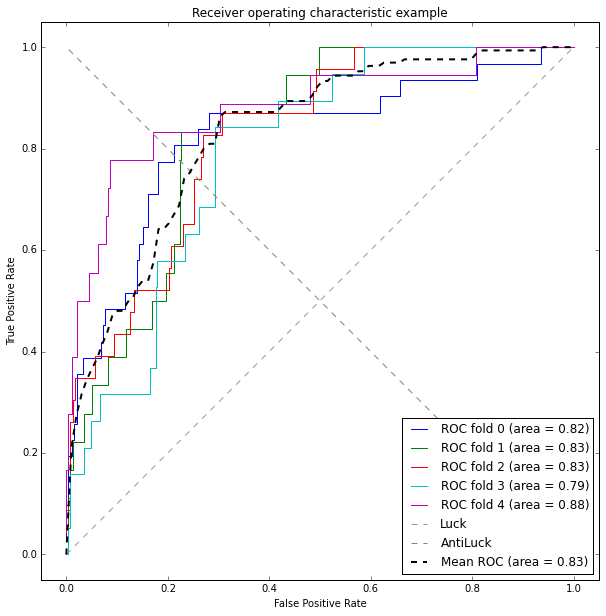

In [77]:
mean_tpr = 0.0
mean_fpr = np.linspace(0, 1, 100)
all_tpr = []

plt.figure(figsize=(10,10))

for i, (train, test) in enumerate(cv):
    probas_ = classifier.fit(X_coa_best.ix[train], y_coa_train.ix[train]).predict_proba(X_coa_best.ix[test])
    # Compute ROC curve and area the curve
    fpr, tpr, thresholds = roc_curve(y_coa_train.ix[test], probas_[:, 1])
    mean_tpr += interp(mean_fpr, fpr, tpr)
    mean_tpr[0] = 0.0
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw=1, label='ROC fold %d (area = %0.2f)' % (i, roc_auc))

plt.plot([0, 1], [0, 1], '--', color=(0.6, 0.6, 0.6), label='Luck')
plt.plot([1, 0], [0, 1], '--', color=(.5,.5,.5), label='AntiLuck')

mean_tpr /= len(cv)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
coa_best_thresh = thresholds[np.argmax(mean_tpr - mean_fpr)]
plt.plot(mean_fpr, mean_tpr, 'k--',
         label='Mean ROC (area = %0.2f)' % mean_auc, lw=2)

plt.xlim([-0.05, 1.05])
plt.ylim([-0.05, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic example')
plt.legend(loc="lower right")

In [80]:
X_coa_test = pd.DataFrame(coa_scale_fit.transform(X_coa_test).transpose()[best_coa_cols].transpose(), columns = X_coa_test.columns[best_coa_cols])

In [83]:
coa_probas = classifier.fit(X_coa_best, y_coa_train).predict_proba(X_coa_test)
X_coa_pred = []
for row in coa_probas:
    if row[1] > coa_best_thresh:
        X_coa_pred.append(1)
    else:
        X_coa_pred.append(0)

In [89]:
1 - 1.0*np.sum(y_sxs_test)/len(y_sxs_test)

0.9825242718446602

In [84]:
accuracy_score(X_coa_pred, y_coa_test)

0.90485436893203886

In [85]:
precision_score(X_coa_pred, y_coa_test)

0.34375

In [86]:
recall_score(X_coa_pred, y_coa_test)

0.28205128205128205

In [87]:
f1_score(X_coa_pred, y_coa_test)

0.3098591549295775

# HANGOUT MUSIC FESTIVAL

In [90]:
y_han, X_han = df.han_2015, df.ix[:, 'fans':'noi_counts']
X_han_train, X_han_test, y_han_train, y_han_test = train_test_split(X_han, y_han, test_size = 0.25, random_state = 4444)
han_scale_fit = StandardScaler().fit(X_han_train)
X_han_train_scaled = pd.DataFrame(han_scale_fit.transform(X_han_train), columns = X_han_train.columns)
new_han_features = SelectKBest(f_classif, k = 10)
X_han_best = new_han_features.fit_transform(X_han_train_scaled, y_han_train)
best_han_cols = new_han_features.get_support(True)
X_han_best = pd.DataFrame(X_han_best, columns = X_han.columns[best_han_cols])
X_han.columns[best_han_cols]

Index([u'2015_shows', u'2014_shows', u'2013_shows', u'all_shows',
       u'hotttnesss', u'bon_counts', u'acl_counts', u'han_counts',
       u'gba_counts', u'sas_counts'],
      dtype='object')

In [91]:
cw_range = [{1:1-cw, 0:cw} for cw in np.arange(.01, 1.0, .1)]
gamma_range = np.logspace(-9, 3, 9)
param_grid = dict(gamma=gamma_range, class_weight=cw_range)
cv = ShuffleSplit(len(y_han_train), n_iter=5, test_size=0.2, random_state=42)
for score in ['accuracy','precision', 'recall']:
    grid = GridSearchCV(SVC(kernel = 'rbf'), param_grid=param_grid, cv=cv, scoring = score, verbose= 10)
    grid.fit(X_han_best, y_han_train)
    print("The best parameters are %s with a score of %0.2f"
          % (grid.best_params_, grid.best_score_))

Fitting 5 folds for each of 90 candidates, totalling 450 fits
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032362 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.038835 -   0.1s

[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.1s



[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.029126 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.035599 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032362 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.038835 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999

[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.6s



[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.035599 -   0.1s
[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032362 -   0.1s
[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.038835 -   0.1s
[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.029126 -   0.1s
[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.02265

[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    0.9s
[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    1.3s



[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.035599 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032362 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.038835 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.029126 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.02265

[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    1.7s
[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    2.2s



[CV] gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.203883 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.187702 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.233010 -   0.1s
[CV] gamma=31.6227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=31.6227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032362 -   0.1s
[CV] gamma=31.6227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=31.6227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.038835 -   0.1s
[CV] gamma=31.6227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=31.6227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.029126 -   0.1s


[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    3.0s
[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    3.3s



[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.964401 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.967638 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.961165 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.970874 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.977346 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.964401 -   0.0s
[CV

[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    3.6s
[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    3.9s



[CV] gamma=0.0316227766017, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.970874 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.977346 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.964401 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.11, 1: 0.89000000000000001} .......
[CV]  gamma=1.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.967638 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.11, 1: 0.89000000000000001} .......
[CV]  gamma=1.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.957929 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.11, 1: 0.89000000000000001} .......
[CV]  gamma=1.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.9708

[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    4.6s
[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    5.0s



[CV] gamma=3.16227766017e-08, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.977346 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.964401 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=1e-06, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.967638 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=1e-06, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.961165 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=1e-06, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.970874 -   0.0s
[CV] gamma=1e-06

[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    5.3s
[Parallel(n_jobs=1)]: Done 128 jobs       | elapsed:    5.9s



[CV] gamma=31.6227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=31.6227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.977346 -   0.1s
[CV] gamma=31.6227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=31.6227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.964401 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=1000.0, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.967638 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=1000.0, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.961165 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=1000.0, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.970874 -   0.1s
[CV] gamma=1000.0, class_w

[Parallel(n_jobs=1)]: Done 145 jobs       | elapsed:    6.5s
[Parallel(n_jobs=1)]: Done 162 jobs       | elapsed:    6.7s



[CV] gamma=0.001, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=0.001, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.964401 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.967638 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.961165 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.970874 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.

[Parallel(n_jobs=1)]: Done 181 jobs       | elapsed:    7.6s
[Parallel(n_jobs=1)]: Done 200 jobs       | elapsed:    7.8s



[CV] gamma=3.16227766017e-05, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.970874 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.977346 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.964401 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=0.001, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.967638 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=0.001, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.961165 -

[Parallel(n_jobs=1)]: Done 221 jobs       | elapsed:    8.6s
[Parallel(n_jobs=1)]: Done 242 jobs       | elapsed:    9.1s



[CV] gamma=1e-06, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1e-06, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.977346 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1e-06, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.964401 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.967638 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.961165 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.970874 -

[Parallel(n_jobs=1)]: Done 265 jobs       | elapsed:   10.0s
[Parallel(n_jobs=1)]: Done 288 jobs       | elapsed:   10.5s



[CV] gamma=3.16227766017e-05, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999}, score=0.970874 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999}, score=0.977346 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999}, score=0.964401 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999} 
[CV]  gamma=0.001, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999}, score=0.967638 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999} 
[CV]  gamma=0.001, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999}, score=0.961165 -   0.0s
[CV] gamma=0

[Parallel(n_jobs=1)]: Done 313 jobs       | elapsed:   11.8s
[Parallel(n_jobs=1)]: Done 338 jobs       | elapsed:   12.3s



[CV] gamma=0.001, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=0.001, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.970874 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=0.001, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.977346 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=0.001, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.964401 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.967638 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.961165 -   0.0s
[CV] gamma=0.03162277660

[Parallel(n_jobs=1)]: Done 365 jobs       | elapsed:   13.4s
[Parallel(n_jobs=1)]: Done 392 jobs       | elapsed:   13.8s



[CV] gamma=1.0, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1.0, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.970874 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1.0, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.977346 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1.0, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.964401 -   0.0s
[CV] gamma=31.6227766017, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=31.6227766017, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.967638 -   0.1s
[CV] gamma=31.6227766017, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=31.6227766017, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.961165 -   0.1s
[CV] gamma=31.6227766017, class_weight={0: 0

[Parallel(n_jobs=1)]: Done 421 jobs       | elapsed:   14.8s
[Parallel(n_jobs=1)]: Done 450 jobs       | elapsed:   15.6s



[CV] gamma=1000.0, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969} 
[CV]  gamma=1000.0, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969}, score=0.964401 -   0.0s
The best parameters are {'gamma': 1.0000000000000001e-09, 'class_weight': {0: 0.11, 1: 0.89000000000000001}} with a score of 0.97
Fitting 5 folds for each of 90 candidates, totalling 450 fits
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032362 -   0.1s

[Parallel(n_jobs=1)]: Done 450 out of 450 | elapsed:   15.6s finished
[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.1s



[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.038835 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.029126 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.035599 -   0.1s

[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.3s



[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032362 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.038835 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.029126 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.035599 -   0.1s
[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, clas

[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.5s
[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    0.9s



[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.035599 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032362 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.038835 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.029126 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 

[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    1.2s
[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    1.8s



[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.047619 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.060440 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.040000 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.028571 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.061453 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=1.0, class_weight={0: 0.01, 1: 

[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    2.4s
[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    3.3s



[CV] gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.038835 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.029126 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.035599 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class

[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    3.7s
[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    3.9s



[CV] gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=0.001, clas

[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    4.2s
[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    4.9s



[CV] gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001} ....
[CV]  gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001} ....
[CV]  gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001} ....
[CV]  gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001} ....
[CV]  gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001} ....
[CV]  gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=1e-09, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.

[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    5.3s
[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    5.5s



[CV] gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.03162277660

[Parallel(n_jobs=1)]: Done 128 jobs       | elapsed:    6.2s
[Parallel(n_jobs=1)]: Done 145 jobs       | elapsed:    6.7s



[CV] gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.310000000000000

[Parallel(n_jobs=1)]: Done 162 jobs       | elapsed:    6.9s
[Parallel(n_jobs=1)]: Done 181 jobs       | elapsed:    7.9s



[CV] gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.410000000000000

[Parallel(n_jobs=1)]: Done 200 jobs       | elapsed:    8.1s
[Parallel(n_jobs=1)]: Done 221 jobs       | elapsed:    8.9s



[CV] gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1e-09, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.51000000000000001, 

[Parallel(n_jobs=1)]: Done 242 jobs       | elapsed:    9.2s
[Parallel(n_jobs=1)]: Done 265 jobs       | elapsed:    9.9s



[CV] gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.0s
[CV] gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.0s
[CV] gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.6100000000000001,

[Parallel(n_jobs=1)]: Done 288 jobs       | elapsed:   10.4s
[Parallel(n_jobs=1)]: Done 313 jobs       | elapsed:   11.2s



[CV] gamma=1000.0, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.2899999

[Parallel(n_jobs=1)]: Done 338 jobs       | elapsed:   11.5s
[Parallel(n_jobs=1)]: Done 365 jobs       | elapsed:   12.5s



[CV] gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.81000000000000005, 1: 0.189999999999

[Parallel(n_jobs=1)]: Done 392 jobs       | elapsed:   12.8s
[Parallel(n_jobs=1)]: Done 421 jobs       | elapsed:   13.6s



[CV] gamma=1e-06, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969} 
[CV]  gamma=1e-06, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969} 
[CV]  gamma=1e-06, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969} 
[CV]  gamma=1e-06, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969} 
[CV]  gamma=1e-06, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, 

[Parallel(n_jobs=1)]: Done 450 jobs       | elapsed:   14.6s
[Parallel(n_jobs=1)]: Done 450 out of 450 | elapsed:   14.6s finished
[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.1s



[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s

[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.3s



[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, clas

[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.5s
[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    0.9s



[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 

[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    1.2s
[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    1.6s



[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.916667 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=1.0, class_weight={0: 0.01, 1: 

[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    2.1s
[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    2.8s



[CV] gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class

[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    3.2s
[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    3.5s



[CV] gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=0.001, clas

[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    3.8s
[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    4.5s



[CV] gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001} ....
[CV]  gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001} ....
[CV]  gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001} ....
[CV]  gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001} ....
[CV]  gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001} ....
[CV]  gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=1e-09, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.

[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    4.9s
[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    5.2s



[CV] gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.03162277660

[Parallel(n_jobs=1)]: Done 128 jobs       | elapsed:    5.7s
[Parallel(n_jobs=1)]: Done 145 jobs       | elapsed:    6.3s



[CV] gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.310000000000000

[Parallel(n_jobs=1)]: Done 162 jobs       | elapsed:    6.6s
[Parallel(n_jobs=1)]: Done 181 jobs       | elapsed:    7.5s



[CV] gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.410000000000000

[Parallel(n_jobs=1)]: Done 200 jobs       | elapsed:    7.7s
[Parallel(n_jobs=1)]: Done 221 jobs       | elapsed:    8.5s



[CV] gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1e-09, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.51000000000000001, 

[Parallel(n_jobs=1)]: Done 242 jobs       | elapsed:    8.9s
[Parallel(n_jobs=1)]: Done 265 jobs       | elapsed:    9.7s



[CV] gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.6100000000000001,

[Parallel(n_jobs=1)]: Done 288 jobs       | elapsed:   10.2s
[Parallel(n_jobs=1)]: Done 313 jobs       | elapsed:   11.0s



[CV] gamma=1000.0, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999}, score=0.000000 -   0.0s
[CV] gamma=1000.0, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999}, score=0.000000 -   0.0s
[CV] gamma=1000.0, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999}, score=0.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.289999999

[Parallel(n_jobs=1)]: Done 338 jobs       | elapsed:   11.3s
[Parallel(n_jobs=1)]: Done 365 jobs       | elapsed:   12.3s



[CV] gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.810000000000000

[Parallel(n_jobs=1)]: Done 392 jobs       | elapsed:   12.6s
[Parallel(n_jobs=1)]: Done 421 jobs       | elapsed:   13.4s



[CV] gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969}, score=0.000000 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969} 
[CV]  gamma=0.001, class_weight={0: 0.91000000000000003, 1: 0.089

[Parallel(n_jobs=1)]: Done 450 jobs       | elapsed:   14.3s
[Parallel(n_jobs=1)]: Done 450 out of 450 | elapsed:   14.3s finished


The best parameters are {'gamma': 1.0e-09, 'class_weight': {0: 0.11, 1: 0.89}} with an accuracy score of 0.97.

The best parameters are {'gamma': 1.0, 'class_weight': {0: 0.11, 1: 0.89}} with a precision score of 0.20.

The best parameters are {'gamma': 1.0e-09, 'class_weight': {0: 0.01, 1: 0.99}} with a recall score of 1.00.

In [92]:
cw_range = [{1:1-cw, 0:cw} for cw in np.arange(.01, .15, .01)]
gamma_range = np.logspace(-9, 0, 9)
param_grid = dict(gamma=gamma_range, class_weight=cw_range)
cv = ShuffleSplit(len(y_han_train), n_iter=5, test_size=0.2, random_state=42)
for score in ['accuracy','precision', 'recall']:
    grid = GridSearchCV(SVC(kernel = 'rbf'), param_grid=param_grid, cv=cv, scoring = score, verbose= 10)
    grid.fit(X_han_best, y_han_train)
    print("The best parameters are %s with a score of %0.2f"
          % (grid.best_params_, grid.best_score_))

Fitting 5 folds for each of 126 candidates, totalling 630 fits
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032362 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.038835 -   0.1s

[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.1s



[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.029126 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.035599 -   0.1s
[CV] gamma=1.33352143216e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=1.33352143216e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032362 -   0.1s
[CV] gamma=1.33352143216e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=1.33352143216e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.038835 -   0.1s
[CV] gamma=1.33352143216e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=1.33352143216e-08, class_weight={0: 0.01, 1: 0.98999999999999

[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.5s



[CV] gamma=1.33352143216e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=1.33352143216e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=1.33352143216e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=1.33352143216e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.035599 -   0.1s
[CV] gamma=1.77827941004e-07, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=1.77827941004e-07, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032362 -   0.1s
[CV] gamma=1.77827941004e-07, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=1.77827941004e-07, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.038835 -   0.1s
[CV] gamma=1.77827941004e-07, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=1.77827941004e-07, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.029126 -   0.1s
[CV] gamma=1.77827941004e-07, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=1.77

[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    0.9s
[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    1.2s



[CV] gamma=2.37137370566e-06, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=2.37137370566e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=2.37137370566e-06, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=2.37137370566e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.035599 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032362 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.038835 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.029126 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16

[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    1.7s
[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    2.1s



[CV] gamma=0.0056234132519, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0056234132519, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.029126 -   0.1s
[CV] gamma=0.0056234132519, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0056234132519, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=0.0056234132519, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0056234132519, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.035599 -   0.1s
[CV] gamma=0.0749894209332, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0749894209332, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.514563 -   0.1s
[CV] gamma=0.0749894209332, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0749894209332, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.485437 -   0.1s
[CV] gamma=0.0749894209332, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0749894209332, class_wei

[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    2.7s
[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    3.3s



[CV] gamma=1.33352143216e-08, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=1.33352143216e-08, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.032362 -   0.1s
[CV] gamma=1.33352143216e-08, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=1.33352143216e-08, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.038835 -   0.1s
[CV] gamma=1.33352143216e-08, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=1.33352143216e-08, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.029126 -   0.1s
[CV] gamma=1.33352143216e-08, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=1.33352143216e-08, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.022654 -   0.1s
[CV] gamma=1.33352143216e-08, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=1.33352143216e-08, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.035599 -   0.1s
[CV] gamma=1.77827941004e-07, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=1.77

[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    4.1s
[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    4.9s



[CV] gamma=0.000421696503429, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.000421696503429, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.029126 -   0.1s
[CV] gamma=0.000421696503429, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.000421696503429, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.022654 -   0.1s
[CV] gamma=0.000421696503429, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.000421696503429, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.035599 -   0.1s
[CV] gamma=0.0056234132519, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.0056234132519, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.530744 -   0.1s
[CV] gamma=0.0056234132519, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.0056234132519, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.631068 -   0.1s
[CV] gamma=0.0056234132519, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.005623413251

[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    5.8s
[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    6.6s



[CV] gamma=1.33352143216e-08, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=1.33352143216e-08, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.022654 -   0.1s
[CV] gamma=1.33352143216e-08, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=1.33352143216e-08, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.964401 -   0.1s
[CV] gamma=1.77827941004e-07, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=1.77827941004e-07, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.967638 -   0.1s
[CV] gamma=1.77827941004e-07, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=1.77827941004e-07, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.961165 -   0.1s
[CV] gamma=1.77827941004e-07, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=1.77827941004e-07, class_weight={0: 0.029

[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    7.7s
[Parallel(n_jobs=1)]: Done 128 jobs       | elapsed:    8.6s



[CV] gamma=0.0749894209332, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.0749894209332, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.737864 -   0.0s
[CV] gamma=0.0749894209332, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.0749894209332, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.702265 -   0.0s
[CV] gamma=0.0749894209332, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.0749894209332, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.721683 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=1.0, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.543689 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=1.0, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.666667 -   0.1s
[C

[Parallel(n_jobs=1)]: Done 145 jobs       | elapsed:    9.5s
[Parallel(n_jobs=1)]: Done 162 jobs       | elapsed:   10.4s



[CV] gamma=0.000421696503429, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.000421696503429, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.970874 -   0.1s
[CV] gamma=0.000421696503429, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.000421696503429, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.977346 -   0.1s
[CV] gamma=0.000421696503429, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.000421696503429, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.964401 -   0.1s
[CV] gamma=0.0056234132519, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.0056234132519, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.847896 -   0.0s
[CV] gamma=0.0056234132519, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.0056234132519, class_weight={0: 0.04000000000

[Parallel(n_jobs=1)]: Done 181 jobs       | elapsed:   11.4s
[Parallel(n_jobs=1)]: Done 200 jobs       | elapsed:   12.2s



[CV] gamma=3.16227766017e-05, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996}, score=0.967638 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996}, score=0.961165 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996}, score=0.970874 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996}, score=0.977346 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.050

[Parallel(n_jobs=1)]: Done 221 jobs       | elapsed:   13.0s
[Parallel(n_jobs=1)]: Done 242 jobs       | elapsed:   13.8s



[CV] gamma=2.37137370566e-06, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=2.37137370566e-06, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995}, score=0.970874 -   0.0s
[CV] gamma=2.37137370566e-06, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=2.37137370566e-06, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995}, score=0.977346 -   0.0s
[CV] gamma=2.37137370566e-06, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=2.37137370566e-06, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995}, score=0.964401 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995}, score=0.967638 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.060

[Parallel(n_jobs=1)]: Done 265 jobs       | elapsed:   14.7s
[Parallel(n_jobs=1)]: Done 288 jobs       | elapsed:   15.7s



[CV] gamma=2.37137370566e-06, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=2.37137370566e-06, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005}, score=0.977346 -   0.0s
[CV] gamma=2.37137370566e-06, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=2.37137370566e-06, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005}, score=0.964401 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005}, score=0.967638 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005}, score=0.961165 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.069

[Parallel(n_jobs=1)]: Done 313 jobs       | elapsed:   16.9s
[Parallel(n_jobs=1)]: Done 338 jobs       | elapsed:   17.9s



[CV] gamma=3.16227766017e-05, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.970874 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.977346 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.964401 -   0.0s
[CV] gamma=0.000421696503429, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=0.000421696503429, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.967638 -   0.0s
[CV] gamma=0.000421696503429, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=0.000421696503429, class_weight={0: 0.080

[Parallel(n_jobs=1)]: Done 365 jobs       | elapsed:   18.8s
[Parallel(n_jobs=1)]: Done 392 jobs       | elapsed:   19.5s



[CV] gamma=0.0056234132519, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.0056234132519, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003}, score=0.970874 -   0.0s
[CV] gamma=0.0056234132519, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.0056234132519, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003}, score=0.977346 -   0.0s
[CV] gamma=0.0056234132519, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.0056234132519, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003}, score=0.964401 -   0.0s
[CV] gamma=0.0749894209332, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.0749894209332, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003}, score=0.957929 -   0.0s
[CV] gamma=0.0749894209332, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.0749894209332, class_weight={0: 0.089999999999999997, 1: 

[Parallel(n_jobs=1)]: Done 421 jobs       | elapsed:   20.3s
[Parallel(n_jobs=1)]: Done 450 jobs       | elapsed:   21.0s



[CV] gamma=1.0, class_weight={0: 0.099999999999999992, 1: 0.90000000000000002} 
[CV]  gamma=1.0, class_weight={0: 0.099999999999999992, 1: 0.90000000000000002}, score=0.964401 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.967638 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.961165 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.970874 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.977346 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.964401 -   0.0s
[CV]

[Parallel(n_jobs=1)]: Done 481 jobs       | elapsed:   21.7s
[Parallel(n_jobs=1)]: Done 512 jobs       | elapsed:   22.4s



[CV] gamma=2.37137370566e-06, class_weight={0: 0.12, 1: 0.88} ........
[CV]  gamma=2.37137370566e-06, class_weight={0: 0.12, 1: 0.88}, score=0.967638 -   0.0s
[CV] gamma=2.37137370566e-06, class_weight={0: 0.12, 1: 0.88} ........
[CV]  gamma=2.37137370566e-06, class_weight={0: 0.12, 1: 0.88}, score=0.961165 -   0.0s
[CV] gamma=2.37137370566e-06, class_weight={0: 0.12, 1: 0.88} ........
[CV]  gamma=2.37137370566e-06, class_weight={0: 0.12, 1: 0.88}, score=0.970874 -   0.0s
[CV] gamma=2.37137370566e-06, class_weight={0: 0.12, 1: 0.88} ........
[CV]  gamma=2.37137370566e-06, class_weight={0: 0.12, 1: 0.88}, score=0.977346 -   0.0s
[CV] gamma=2.37137370566e-06, class_weight={0: 0.12, 1: 0.88} ........
[CV]  gamma=2.37137370566e-06, class_weight={0: 0.12, 1: 0.88}, score=0.964401 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.12, 1: 0.88} ........
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.12, 1: 0.88}, score=0.967638 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0

[Parallel(n_jobs=1)]: Done 545 jobs       | elapsed:   23.2s
[Parallel(n_jobs=1)]: Done 578 jobs       | elapsed:   23.8s



[CV] gamma=0.0749894209332, class_weight={0: 0.13, 1: 0.87} ..........
[CV]  gamma=0.0749894209332, class_weight={0: 0.13, 1: 0.87}, score=0.961165 -   0.0s
[CV] gamma=0.0749894209332, class_weight={0: 0.13, 1: 0.87} ..........
[CV]  gamma=0.0749894209332, class_weight={0: 0.13, 1: 0.87}, score=0.970874 -   0.0s
[CV] gamma=0.0749894209332, class_weight={0: 0.13, 1: 0.87} ..........
[CV]  gamma=0.0749894209332, class_weight={0: 0.13, 1: 0.87}, score=0.977346 -   0.0s
[CV] gamma=0.0749894209332, class_weight={0: 0.13, 1: 0.87} ..........
[CV]  gamma=0.0749894209332, class_weight={0: 0.13, 1: 0.87}, score=0.964401 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.13, 1: 0.87} ......................
[CV]  gamma=1.0, class_weight={0: 0.13, 1: 0.87}, score=0.967638 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.13, 1: 0.87} ......................
[CV]  gamma=1.0, class_weight={0: 0.13, 1: 0.87}, score=0.957929 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.13, 1: 0.87} ......................
[CV]  gamm

[Parallel(n_jobs=1)]: Done 613 jobs       | elapsed:   24.5s
[Parallel(n_jobs=1)]: Done 630 out of 630 | elapsed:   24.9s finished



The best parameters are {'gamma': 1.0000000000000001e-09, 'class_weight': {0: 0.040000000000000001, 1: 0.95999999999999996}} with a score of 0.97
Fitting 5 folds for each of 126 candidates, totalling 630 fits
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032362 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.038835 -   0.1s

[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.2s



[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.029126 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.035599 -   0.1s
[CV] gamma=1.33352143216e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=1.33352143216e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032362 -   0.1s
[CV] gamma=1.33352143216e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=1.33352143216e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.038835 -   0.1s
[CV] gamma=1.33352143216e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=1.33352143216e-08, class_weight={0: 0.01, 1: 0.98999999999999

[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.4s
[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.6s



[CV] gamma=1.33352143216e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=1.33352143216e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=1.33352143216e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=1.33352143216e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.035599 -   0.1s
[CV] gamma=1.77827941004e-07, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=1.77827941004e-07, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032362 -   0.1s
[CV] gamma=1.77827941004e-07, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=1.77827941004e-07, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.038835 -   0.1s
[CV] gamma=1.77827941004e-07, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=1.77827941004e-07, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.029126 -   0.1s
[CV] gamma=1.77827941004e-07, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=1.77

[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    0.9s
[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    1.2s



[CV] gamma=2.37137370566e-06, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=2.37137370566e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=2.37137370566e-06, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=2.37137370566e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.035599 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032362 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.038835 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.029126 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16

[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    1.7s
[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    2.2s



[CV] gamma=0.0056234132519, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0056234132519, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.029126 -   0.1s
[CV] gamma=0.0056234132519, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0056234132519, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=0.0056234132519, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0056234132519, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.035599 -   0.1s
[CV] gamma=0.0749894209332, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0749894209332, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.062500 -   0.1s
[CV] gamma=0.0749894209332, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0749894209332, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.065089 -   0.1s
[CV] gamma=0.0749894209332, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0749894209332, class_wei

[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    3.1s
[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    3.8s



[CV] gamma=1.33352143216e-08, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=1.33352143216e-08, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.032362 -   0.1s
[CV] gamma=1.33352143216e-08, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=1.33352143216e-08, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.038835 -   0.1s
[CV] gamma=1.33352143216e-08, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=1.33352143216e-08, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.029126 -   0.1s
[CV] gamma=1.33352143216e-08, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=1.33352143216e-08, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.022654 -   0.1s
[CV] gamma=1.33352143216e-08, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=1.33352143216e-08, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.035599 -   0.1s
[CV] gamma=1.77827941004e-07, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=1.77

[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    4.5s
[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    5.3s



[CV] gamma=0.000421696503429, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.000421696503429, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.029126 -   0.1s
[CV] gamma=0.000421696503429, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.000421696503429, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.022654 -   0.1s
[CV] gamma=0.000421696503429, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.000421696503429, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.035599 -   0.1s
[CV] gamma=0.0056234132519, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.0056234132519, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.064516 -   0.1s
[CV] gamma=0.0056234132519, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.0056234132519, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.081967 -   0.1s
[CV] gamma=0.0056234132519, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.005623413251

[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    6.1s
[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    7.0s



[CV] gamma=1.33352143216e-08, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=1.33352143216e-08, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.022654 -   0.1s
[CV] gamma=1.33352143216e-08, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=1.33352143216e-08, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.000000 -   0.1s
[CV] gamma=1.77827941004e-07, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=1.77827941004e-07, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.000000 -   0.1s
[CV] gamma=1.77827941004e-07, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=1.77827941004e-07, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.000000 -   0.1s
[CV] gamma=1.77827941004e-07, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=1.77827941004e-07, class_weight={0: 0.029

[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    7.9s
[Parallel(n_jobs=1)]: Done 128 jobs       | elapsed:    8.8s



[CV] gamma=0.0749894209332, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.0749894209332, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.100000 -   0.0s
[CV] gamma=0.0749894209332, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.0749894209332, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.070707 -   0.0s
[CV] gamma=0.0749894209332, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.0749894209332, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.078652 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=1.0, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.066225 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=1.0, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.090090 -   0.1s
[C

[Parallel(n_jobs=1)]: Done 145 jobs       | elapsed:    9.7s
[Parallel(n_jobs=1)]: Done 162 jobs       | elapsed:   10.5s



[CV] gamma=0.000421696503429, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.000421696503429, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.000000 -   0.0s
[CV] gamma=0.000421696503429, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.000421696503429, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.000000 -   0.1s
[CV] gamma=0.000421696503429, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.000421696503429, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.000000 -   0.1s
[CV] gamma=0.000421696503429, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.000421696503429, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.000000 -   0.1s
[CV] gamma=0.0056234132519, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.0056234132519, class_weight={0: 0.0400000

[Parallel(n_jobs=1)]: Done 181 jobs       | elapsed:   11.4s
[Parallel(n_jobs=1)]: Done 200 jobs       | elapsed:   12.2s



[CV] gamma=3.16227766017e-05, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.050

[Parallel(n_jobs=1)]: Done 221 jobs       | elapsed:   13.2s
[Parallel(n_jobs=1)]: Done 242 jobs       | elapsed:   14.0s



[CV] gamma=2.37137370566e-06, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=2.37137370566e-06, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995}, score=0.000000 -   0.0s
[CV] gamma=2.37137370566e-06, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=2.37137370566e-06, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995}, score=0.000000 -   0.0s
[CV] gamma=2.37137370566e-06, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=2.37137370566e-06, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995}, score=0.000000 -   0.0s
[CV] gamma=2.37137370566e-06, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=2.37137370566e-06, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.060

[Parallel(n_jobs=1)]: Done 265 jobs       | elapsed:   14.8s
[Parallel(n_jobs=1)]: Done 288 jobs       | elapsed:   15.6s



[CV] gamma=2.37137370566e-06, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=2.37137370566e-06, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005}, score=0.000000 -   0.0s
[CV] gamma=2.37137370566e-06, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=2.37137370566e-06, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005}, score=0.000000 -   0.0s
[CV] gamma=2.37137370566e-06, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=2.37137370566e-06, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.069

[Parallel(n_jobs=1)]: Done 313 jobs       | elapsed:   16.6s
[Parallel(n_jobs=1)]: Done 338 jobs       | elapsed:   17.3s



[CV] gamma=3.16227766017e-05, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.000421696503429, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=0.000421696503429, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.000421696503429, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=0.000421696503429, class_weight={0: 0.080

[Parallel(n_jobs=1)]: Done 365 jobs       | elapsed:   18.2s
[Parallel(n_jobs=1)]: Done 392 jobs       | elapsed:   19.0s



[CV] gamma=0.0056234132519, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.0056234132519, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003}, score=0.000000 -   0.0s
[CV] gamma=0.0056234132519, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.0056234132519, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003}, score=0.000000 -   0.0s
[CV] gamma=0.0056234132519, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.0056234132519, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003}, score=0.000000 -   0.0s
[CV] gamma=0.0749894209332, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.0749894209332, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003}, score=0.000000 -   0.0s
[CV] gamma=0.0749894209332, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.0749894209332, class_weight={0: 0.089999999999999997, 1: 

[Parallel(n_jobs=1)]: Done 421 jobs       | elapsed:   19.8s
[Parallel(n_jobs=1)]: Done 450 jobs       | elapsed:   20.6s



[CV] gamma=1.0, class_weight={0: 0.099999999999999992, 1: 0.90000000000000002} 
[CV]  gamma=1.0, class_weight={0: 0.099999999999999992, 1: 0.90000000000000002}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV]

[Parallel(n_jobs=1)]: Done 481 jobs       | elapsed:   21.3s
[Parallel(n_jobs=1)]: Done 512 jobs       | elapsed:   22.1s



[CV] gamma=2.37137370566e-06, class_weight={0: 0.12, 1: 0.88} ........
[CV]  gamma=2.37137370566e-06, class_weight={0: 0.12, 1: 0.88}, score=0.000000 -   0.0s
[CV] gamma=2.37137370566e-06, class_weight={0: 0.12, 1: 0.88} ........
[CV]  gamma=2.37137370566e-06, class_weight={0: 0.12, 1: 0.88}, score=0.000000 -   0.0s
[CV] gamma=2.37137370566e-06, class_weight={0: 0.12, 1: 0.88} ........
[CV]  gamma=2.37137370566e-06, class_weight={0: 0.12, 1: 0.88}, score=0.000000 -   0.0s
[CV] gamma=2.37137370566e-06, class_weight={0: 0.12, 1: 0.88} ........
[CV]  gamma=2.37137370566e-06, class_weight={0: 0.12, 1: 0.88}, score=0.000000 -   0.0s
[CV] gamma=2.37137370566e-06, class_weight={0: 0.12, 1: 0.88} ........
[CV]  gamma=2.37137370566e-06, class_weight={0: 0.12, 1: 0.88}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.12, 1: 0.88} ........
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.12, 1: 0.88}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0

[Parallel(n_jobs=1)]: Done 545 jobs       | elapsed:   23.0s
[Parallel(n_jobs=1)]: Done 578 jobs       | elapsed:   23.7s



[CV] gamma=0.0749894209332, class_weight={0: 0.13, 1: 0.87} ..........
[CV]  gamma=0.0749894209332, class_weight={0: 0.13, 1: 0.87}, score=0.000000 -   0.0s
[CV] gamma=0.0749894209332, class_weight={0: 0.13, 1: 0.87} ..........
[CV]  gamma=0.0749894209332, class_weight={0: 0.13, 1: 0.87}, score=0.000000 -   0.0s
[CV] gamma=0.0749894209332, class_weight={0: 0.13, 1: 0.87} ..........
[CV]  gamma=0.0749894209332, class_weight={0: 0.13, 1: 0.87}, score=0.000000 -   0.0s
[CV] gamma=0.0749894209332, class_weight={0: 0.13, 1: 0.87} ..........
[CV]  gamma=0.0749894209332, class_weight={0: 0.13, 1: 0.87}, score=0.000000 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.13, 1: 0.87} ......................
[CV]  gamma=1.0, class_weight={0: 0.13, 1: 0.87}, score=0.000000 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.13, 1: 0.87} ......................
[CV]  gamma=1.0, class_weight={0: 0.13, 1: 0.87}, score=0.000000 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.13, 1: 0.87} ......................
[CV]  gamm

[Parallel(n_jobs=1)]: Done 613 jobs       | elapsed:   24.5s
[Parallel(n_jobs=1)]: Done 630 out of 630 | elapsed:   25.0s finished



[CV] gamma=1.0, class_weight={0: 0.14000000000000001, 1: 0.85999999999999999} 
[CV]  gamma=1.0, class_weight={0: 0.14000000000000001, 1: 0.85999999999999999}, score=0.000000 -   0.0s
The best parameters are {'gamma': 1.0, 'class_weight': {0: 0.050000000000000003, 1: 0.94999999999999996}} with a score of 0.45
Fitting 5 folds for each of 126 candidates, totalling 630 fits
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s

[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.1s



[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1.33352143216e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=1.33352143216e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1.33352143216e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=1.33352143216e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1.33352143216e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=1.33352143216e-08, class_weight={0: 0.01, 1: 0.98999999999999

[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.5s



[CV] gamma=1.33352143216e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=1.33352143216e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1.33352143216e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=1.33352143216e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1.77827941004e-07, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=1.77827941004e-07, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1.77827941004e-07, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=1.77827941004e-07, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1.77827941004e-07, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=1.77827941004e-07, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1.77827941004e-07, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=1.77

[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    0.9s
[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    1.2s



[CV] gamma=2.37137370566e-06, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=2.37137370566e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=2.37137370566e-06, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=2.37137370566e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16

[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    1.7s
[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    2.2s



[CV] gamma=0.0056234132519, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0056234132519, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.0056234132519, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0056234132519, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.0056234132519, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0056234132519, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.0749894209332, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0749894209332, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.0749894209332, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0749894209332, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.916667 -   0.1s
[CV] gamma=0.0749894209332, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0749894209332, class_wei

[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    2.9s
[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    3.6s



[CV] gamma=1.33352143216e-08, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=1.33352143216e-08, class_weight={0: 0.02, 1: 0.97999999999999998}, score=1.000000 -   0.1s
[CV] gamma=1.33352143216e-08, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=1.33352143216e-08, class_weight={0: 0.02, 1: 0.97999999999999998}, score=1.000000 -   0.1s
[CV] gamma=1.33352143216e-08, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=1.33352143216e-08, class_weight={0: 0.02, 1: 0.97999999999999998}, score=1.000000 -   0.1s
[CV] gamma=1.33352143216e-08, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=1.33352143216e-08, class_weight={0: 0.02, 1: 0.97999999999999998}, score=1.000000 -   0.1s
[CV] gamma=1.33352143216e-08, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=1.33352143216e-08, class_weight={0: 0.02, 1: 0.97999999999999998}, score=1.000000 -   0.1s
[CV] gamma=1.77827941004e-07, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=1.77

[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    4.5s
[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    5.3s



[CV] gamma=0.000421696503429, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.000421696503429, class_weight={0: 0.02, 1: 0.97999999999999998}, score=1.000000 -   0.1s
[CV] gamma=0.000421696503429, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.000421696503429, class_weight={0: 0.02, 1: 0.97999999999999998}, score=1.000000 -   0.1s
[CV] gamma=0.000421696503429, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.000421696503429, class_weight={0: 0.02, 1: 0.97999999999999998}, score=1.000000 -   0.1s
[CV] gamma=0.0056234132519, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.0056234132519, class_weight={0: 0.02, 1: 0.97999999999999998}, score=1.000000 -   0.1s
[CV] gamma=0.0056234132519, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.0056234132519, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.833333 -   0.1s
[CV] gamma=0.0056234132519, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.005623413251

[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    6.3s
[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    7.5s



[CV] gamma=1.33352143216e-08, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=1.33352143216e-08, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=1.000000 -   0.1s
[CV] gamma=1.33352143216e-08, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=1.33352143216e-08, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.000000 -   0.1s
[CV] gamma=1.77827941004e-07, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=1.77827941004e-07, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.000000 -   0.1s
[CV] gamma=1.77827941004e-07, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=1.77827941004e-07, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.000000 -   0.1s
[CV] gamma=1.77827941004e-07, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=1.77827941004e-07, class_weight={0: 0.029

[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    8.9s
[Parallel(n_jobs=1)]: Done 128 jobs       | elapsed:   10.2s



[CV] gamma=0.0749894209332, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.0749894209332, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=1.000000 -   0.1s
[CV] gamma=0.0749894209332, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.0749894209332, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.636364 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=1.0, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=1.000000 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=1.0, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.833333 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=1.0, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.888889 -   0.1s
[CV] gamma=1.0, class_weig

[Parallel(n_jobs=1)]: Done 145 jobs       | elapsed:   11.5s
[Parallel(n_jobs=1)]: Done 162 jobs       | elapsed:   12.6s



[CV] gamma=0.000421696503429, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.000421696503429, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.000000 -   0.0s
[CV] gamma=0.000421696503429, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.000421696503429, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.000000 -   0.1s
[CV] gamma=0.000421696503429, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.000421696503429, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.000000 -   0.1s
[CV] gamma=0.000421696503429, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.000421696503429, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.000000 -   0.1s
[CV] gamma=0.0056234132519, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.0056234132519, class_weight={0: 0.0400000

[Parallel(n_jobs=1)]: Done 181 jobs       | elapsed:   13.5s
[Parallel(n_jobs=1)]: Done 200 jobs       | elapsed:   14.4s



[CV] gamma=3.16227766017e-05, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.050

[Parallel(n_jobs=1)]: Done 221 jobs       | elapsed:   15.2s
[Parallel(n_jobs=1)]: Done 242 jobs       | elapsed:   16.0s



[CV] gamma=2.37137370566e-06, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=2.37137370566e-06, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995}, score=0.000000 -   0.0s
[CV] gamma=2.37137370566e-06, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=2.37137370566e-06, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995}, score=0.000000 -   0.0s
[CV] gamma=2.37137370566e-06, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=2.37137370566e-06, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995}, score=0.000000 -   0.0s
[CV] gamma=2.37137370566e-06, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=2.37137370566e-06, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.060

[Parallel(n_jobs=1)]: Done 265 jobs       | elapsed:   16.9s
[Parallel(n_jobs=1)]: Done 288 jobs       | elapsed:   17.7s



[CV] gamma=2.37137370566e-06, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=2.37137370566e-06, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005}, score=0.000000 -   0.0s
[CV] gamma=2.37137370566e-06, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=2.37137370566e-06, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.069

[Parallel(n_jobs=1)]: Done 313 jobs       | elapsed:   18.5s
[Parallel(n_jobs=1)]: Done 338 jobs       | elapsed:   19.4s



[CV] gamma=3.16227766017e-05, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.000421696503429, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=0.000421696503429, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.000421696503429, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=0.000421696503429, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.000421696503429, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=0.000421696503429, class_weight={0: 0.080

[Parallel(n_jobs=1)]: Done 365 jobs       | elapsed:   20.4s
[Parallel(n_jobs=1)]: Done 392 jobs       | elapsed:   21.1s



[CV] gamma=0.0056234132519, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.0056234132519, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003}, score=0.000000 -   0.0s
[CV] gamma=0.0056234132519, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.0056234132519, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003}, score=0.000000 -   0.0s
[CV] gamma=0.0056234132519, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.0056234132519, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003}, score=0.000000 -   0.0s
[CV] gamma=0.0749894209332, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.0749894209332, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003}, score=0.000000 -   0.0s
[CV] gamma=0.0749894209332, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.0749894209332, class_weight={0: 0.089999999999999997, 1: 

[Parallel(n_jobs=1)]: Done 421 jobs       | elapsed:   22.0s
[Parallel(n_jobs=1)]: Done 450 jobs       | elapsed:   23.0s



[CV]  gamma=1.0, class_weight={0: 0.099999999999999992, 1: 0.90000000000000002}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1.33352143216e-08, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  

[Parallel(n_jobs=1)]: Done 481 jobs       | elapsed:   23.7s
[Parallel(n_jobs=1)]: Done 512 jobs       | elapsed:   24.4s



[CV] gamma=2.37137370566e-06, class_weight={0: 0.12, 1: 0.88} ........
[CV]  gamma=2.37137370566e-06, class_weight={0: 0.12, 1: 0.88}, score=0.000000 -   0.0s
[CV] gamma=2.37137370566e-06, class_weight={0: 0.12, 1: 0.88} ........
[CV]  gamma=2.37137370566e-06, class_weight={0: 0.12, 1: 0.88}, score=0.000000 -   0.0s
[CV] gamma=2.37137370566e-06, class_weight={0: 0.12, 1: 0.88} ........
[CV]  gamma=2.37137370566e-06, class_weight={0: 0.12, 1: 0.88}, score=0.000000 -   0.0s
[CV] gamma=2.37137370566e-06, class_weight={0: 0.12, 1: 0.88} ........
[CV]  gamma=2.37137370566e-06, class_weight={0: 0.12, 1: 0.88}, score=0.000000 -   0.0s
[CV] gamma=2.37137370566e-06, class_weight={0: 0.12, 1: 0.88} ........
[CV]  gamma=2.37137370566e-06, class_weight={0: 0.12, 1: 0.88}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.12, 1: 0.88} ........
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.12, 1: 0.88}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0

[Parallel(n_jobs=1)]: Done 545 jobs       | elapsed:   25.2s
[Parallel(n_jobs=1)]: Done 578 jobs       | elapsed:   25.9s



[CV] gamma=0.0749894209332, class_weight={0: 0.13, 1: 0.87} ..........
[CV]  gamma=0.0749894209332, class_weight={0: 0.13, 1: 0.87}, score=0.000000 -   0.0s
[CV] gamma=0.0749894209332, class_weight={0: 0.13, 1: 0.87} ..........
[CV]  gamma=0.0749894209332, class_weight={0: 0.13, 1: 0.87}, score=0.000000 -   0.0s
[CV] gamma=0.0749894209332, class_weight={0: 0.13, 1: 0.87} ..........
[CV]  gamma=0.0749894209332, class_weight={0: 0.13, 1: 0.87}, score=0.000000 -   0.0s
[CV] gamma=0.0749894209332, class_weight={0: 0.13, 1: 0.87} ..........
[CV]  gamma=0.0749894209332, class_weight={0: 0.13, 1: 0.87}, score=0.000000 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.13, 1: 0.87} ......................
[CV]  gamma=1.0, class_weight={0: 0.13, 1: 0.87}, score=0.000000 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.13, 1: 0.87} ......................
[CV]  gamma=1.0, class_weight={0: 0.13, 1: 0.87}, score=0.000000 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.13, 1: 0.87} ......................
[CV]  gamm

[Parallel(n_jobs=1)]: Done 613 jobs       | elapsed:   26.7s
[Parallel(n_jobs=1)]: Done 630 out of 630 | elapsed:   27.2s finished



The best parameters are {'gamma': 1.0000000000000001e-09, 'class_weight': {0: 0.01, 1: 0.98999999999999999}} with a score of 1.00


The best parameters are {'gamma': 1.0e-09, 'class_weight': {0: 0.04, 1: 0.96}} with an accuracy score of 0.97.

The best parameters are {'gamma': 1.0, 'class_weight': {0: 0.05, 1: 0.95}} with a precision score of 0.45.

The best parameters are {'gamma': 1.0e-09, 'class_weight': {0: 0.01, 1: 0.99}} with a recall score of 1.00.

In [93]:
cw_range = [{1:1-cw, 0:cw} for cw in np.arange(.04, .06, .001)]
gamma_range = np.logspace(-2, 0, 5)
param_grid = dict(gamma=gamma_range, class_weight=cw_range)
cv = ShuffleSplit(len(y_han_train), n_iter=5, test_size=0.2, random_state=42)
for score in ['accuracy','precision', 'recall']:
    grid = GridSearchCV(SVC(kernel = 'rbf'), param_grid=param_grid, cv=cv, scoring = score, verbose= 10)
    grid.fit(X_han_best, y_han_train)
    print("The best parameters are %s with a score of %0.2f"
          % (grid.best_params_, grid.best_score_))

Fitting 5 folds for each of 100 candidates, totalling 500 fits
[CV] gamma=0.01, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.825243 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.834951 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.812298 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.834951 -   0.0s

[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.2s



[CV] gamma=0.01, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.815534 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.805825 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.812298 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.802589 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, 

[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    0.6s



[CV] gamma=0.1, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.1, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.760518 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.1, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.766990 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.1, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.766990 -   0.0s
[CV] gamma=0.316227766017, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.316227766017, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.867314 -   0.1s
[CV] gamma=0.316227766017, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.316227766017, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.889968 -   0.0s
[CV] gamma=0.316227766017, cla

[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    0.8s
[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    1.1s



[CV] gamma=1.0, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=1.0, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.967638 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.041000000000000002, 1: 0.95899999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.041000000000000002, 1: 0.95899999999999996}, score=0.818770 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.041000000000000002, 1: 0.95899999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.041000000000000002, 1: 0.95899999999999996}, score=0.841424 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.041000000000000002, 1: 0.95899999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.041000000000000002, 1: 0.95899999999999996}, score=0.822006 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.041000000000000002, 1: 0.95899999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.041000000000000002, 1: 0.95899999999999996}, score=0.834951 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.041000000000000002, 1: 0.95899

[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    1.4s
[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    1.8s



[CV] gamma=0.316227766017, class_weight={0: 0.041000000000000002, 1: 0.95899999999999996} 
[CV]  gamma=0.316227766017, class_weight={0: 0.041000000000000002, 1: 0.95899999999999996}, score=0.883495 -   0.0s
[CV] gamma=0.316227766017, class_weight={0: 0.041000000000000002, 1: 0.95899999999999996} 
[CV]  gamma=0.316227766017, class_weight={0: 0.041000000000000002, 1: 0.95899999999999996}, score=0.915858 -   0.0s
[CV] gamma=0.316227766017, class_weight={0: 0.041000000000000002, 1: 0.95899999999999996} 
[CV]  gamma=0.316227766017, class_weight={0: 0.041000000000000002, 1: 0.95899999999999996}, score=0.893204 -   0.0s
[CV] gamma=0.316227766017, class_weight={0: 0.041000000000000002, 1: 0.95899999999999996} 
[CV]  gamma=0.316227766017, class_weight={0: 0.041000000000000002, 1: 0.95899999999999996}, score=0.779935 -   0.1s
[CV] gamma=0.316227766017, class_weight={0: 0.041000000000000002, 1: 0.95899999999999996} 
[CV]  gamma=0.316227766017, class_weight={0: 0.041000000000000002, 1: 0.95899999

[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    2.2s
[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    2.7s



[CV] gamma=0.1, class_weight={0: 0.042000000000000003, 1: 0.95799999999999996} 
[CV]  gamma=0.1, class_weight={0: 0.042000000000000003, 1: 0.95799999999999996}, score=0.766990 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.042000000000000003, 1: 0.95799999999999996} 
[CV]  gamma=0.1, class_weight={0: 0.042000000000000003, 1: 0.95799999999999996}, score=0.792880 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.042000000000000003, 1: 0.95799999999999996} 
[CV]  gamma=0.1, class_weight={0: 0.042000000000000003, 1: 0.95799999999999996}, score=0.766990 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.042000000000000003, 1: 0.95799999999999996} 
[CV]  gamma=0.1, class_weight={0: 0.042000000000000003, 1: 0.95799999999999996}, score=0.773463 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.042000000000000003, 1: 0.95799999999999996} 
[CV]  gamma=0.1, class_weight={0: 0.042000000000000003, 1: 0.95799999999999996}, score=0.766990 -   0.0s
[CV] gamma=0.316227766017, class_weight={0: 0.042000000000000003, 1: 0.957

[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    3.2s
[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    3.8s



[CV] gamma=0.1, class_weight={0: 0.043000000000000003, 1: 0.95699999999999996} 
[CV]  gamma=0.1, class_weight={0: 0.043000000000000003, 1: 0.95699999999999996}, score=0.770227 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.043000000000000003, 1: 0.95699999999999996} 
[CV]  gamma=0.1, class_weight={0: 0.043000000000000003, 1: 0.95699999999999996}, score=0.796117 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.043000000000000003, 1: 0.95699999999999996} 
[CV]  gamma=0.1, class_weight={0: 0.043000000000000003, 1: 0.95699999999999996}, score=0.770227 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.043000000000000003, 1: 0.95699999999999996} 
[CV]  gamma=0.1, class_weight={0: 0.043000000000000003, 1: 0.95699999999999996}, score=0.776699 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.043000000000000003, 1: 0.95699999999999996} 
[CV]  gamma=0.1, class_weight={0: 0.043000000000000003, 1: 0.95699999999999996}, score=0.766990 -   0.0s
[CV] gamma=0.316227766017, class_weight={0: 0.043000000000000003, 1: 0.956

[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    4.4s
[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    5.0s



[CV] gamma=0.1, class_weight={0: 0.044000000000000004, 1: 0.95599999999999996} 
[CV]  gamma=0.1, class_weight={0: 0.044000000000000004, 1: 0.95599999999999996}, score=0.773463 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.044000000000000004, 1: 0.95599999999999996} 
[CV]  gamma=0.1, class_weight={0: 0.044000000000000004, 1: 0.95599999999999996}, score=0.779935 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.044000000000000004, 1: 0.95599999999999996} 
[CV]  gamma=0.1, class_weight={0: 0.044000000000000004, 1: 0.95599999999999996}, score=0.766990 -   0.0s
[CV] gamma=0.316227766017, class_weight={0: 0.044000000000000004, 1: 0.95599999999999996} 
[CV]  gamma=0.316227766017, class_weight={0: 0.044000000000000004, 1: 0.95599999999999996}, score=0.902913 -   0.0s
[CV] gamma=0.316227766017, class_weight={0: 0.044000000000000004, 1: 0.95599999999999996} 
[CV]  gamma=0.316227766017, class_weight={0: 0.044000000000000004, 1: 0.95599999999999996}, score=0.925566 -   0.0s
[CV] gamma=0.316227766017, cla

[Parallel(n_jobs=1)]: Done 128 jobs       | elapsed:    5.7s
[Parallel(n_jobs=1)]: Done 145 jobs       | elapsed:    6.6s



[CV] gamma=1.0, class_weight={0: 0.045000000000000005, 1: 0.95499999999999996} 
[CV]  gamma=1.0, class_weight={0: 0.045000000000000005, 1: 0.95499999999999996}, score=0.974110 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.045000000000000005, 1: 0.95499999999999996} 
[CV]  gamma=1.0, class_weight={0: 0.045000000000000005, 1: 0.95499999999999996}, score=0.957929 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.045000000000000005, 1: 0.95499999999999996} 
[CV]  gamma=1.0, class_weight={0: 0.045000000000000005, 1: 0.95499999999999996}, score=0.967638 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.045000000000000005, 1: 0.95499999999999996} 
[CV]  gamma=1.0, class_weight={0: 0.045000000000000005, 1: 0.95499999999999996}, score=0.970874 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.045000000000000005, 1: 0.95499999999999996} 
[CV]  gamma=1.0, class_weight={0: 0.045000000000000005, 1: 0.95499999999999996}, score=0.967638 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.046000000000000006, 1: 0.9539999999999

[Parallel(n_jobs=1)]: Done 162 jobs       | elapsed:    7.6s
[Parallel(n_jobs=1)]: Done 181 jobs       | elapsed:    8.8s



[CV] gamma=0.0316227766017, class_weight={0: 0.047000000000000007, 1: 0.95299999999999996} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.047000000000000007, 1: 0.95299999999999996}, score=0.828479 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.047000000000000007, 1: 0.95299999999999996} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.047000000000000007, 1: 0.95299999999999996}, score=0.818770 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.047000000000000007, 1: 0.95299999999999996} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.047000000000000007, 1: 0.95299999999999996}, score=0.831715 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.047000000000000007, 1: 0.95299999999999996} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.047000000000000007, 1: 0.95299999999999996}, score=0.809061 -   0.1s
[CV] gamma=0.1, class_weight={0: 0.047000000000000007, 1: 0.95299999999999996} 
[CV]  gamma=0.1, class_weight={0: 0.047000000000000007, 1: 0.95299999999999996}, sc

[Parallel(n_jobs=1)]: Done 200 jobs       | elapsed:    9.8s
[Parallel(n_jobs=1)]: Done 221 jobs       | elapsed:   11.1s



[CV] gamma=1.0, class_weight={0: 0.048000000000000008, 1: 0.95199999999999996} 
[CV]  gamma=1.0, class_weight={0: 0.048000000000000008, 1: 0.95199999999999996}, score=0.957929 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.048000000000000008, 1: 0.95199999999999996} 
[CV]  gamma=1.0, class_weight={0: 0.048000000000000008, 1: 0.95199999999999996}, score=0.967638 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.048000000000000008, 1: 0.95199999999999996} 
[CV]  gamma=1.0, class_weight={0: 0.048000000000000008, 1: 0.95199999999999996}, score=0.970874 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.048000000000000008, 1: 0.95199999999999996} 
[CV]  gamma=1.0, class_weight={0: 0.048000000000000008, 1: 0.95199999999999996}, score=0.967638 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.049000000000000009, 1: 0.95099999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.049000000000000009, 1: 0.95099999999999996}, score=0.857605 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.049000000000000009, 1: 0.95099999999

[Parallel(n_jobs=1)]: Done 242 jobs       | elapsed:   12.3s
[Parallel(n_jobs=1)]: Done 265 jobs       | elapsed:   13.7s



[CV] gamma=0.316227766017, class_weight={0: 0.05000000000000001, 1: 0.94999999999999996} 
[CV]  gamma=0.316227766017, class_weight={0: 0.05000000000000001, 1: 0.94999999999999996}, score=0.922330 -   0.1s
[CV] gamma=0.316227766017, class_weight={0: 0.05000000000000001, 1: 0.94999999999999996} 
[CV]  gamma=0.316227766017, class_weight={0: 0.05000000000000001, 1: 0.94999999999999996}, score=0.941748 -   0.1s
[CV] gamma=0.316227766017, class_weight={0: 0.05000000000000001, 1: 0.94999999999999996} 
[CV]  gamma=0.316227766017, class_weight={0: 0.05000000000000001, 1: 0.94999999999999996}, score=0.941748 -   0.1s
[CV] gamma=0.316227766017, class_weight={0: 0.05000000000000001, 1: 0.94999999999999996} 
[CV]  gamma=0.316227766017, class_weight={0: 0.05000000000000001, 1: 0.94999999999999996}, score=0.948220 -   0.1s
[CV] gamma=0.316227766017, class_weight={0: 0.05000000000000001, 1: 0.94999999999999996} 
[CV]  gamma=0.316227766017, class_weight={0: 0.05000000000000001, 1: 0.94999999999999996}

[Parallel(n_jobs=1)]: Done 288 jobs       | elapsed:   15.2s
[Parallel(n_jobs=1)]: Done 313 jobs       | elapsed:   16.5s



[CV] gamma=0.1, class_weight={0: 0.052000000000000011, 1: 0.94799999999999995} 
[CV]  gamma=0.1, class_weight={0: 0.052000000000000011, 1: 0.94799999999999995}, score=0.815534 -   0.1s
[CV] gamma=0.1, class_weight={0: 0.052000000000000011, 1: 0.94799999999999995} 
[CV]  gamma=0.1, class_weight={0: 0.052000000000000011, 1: 0.94799999999999995}, score=0.809061 -   0.0s
[CV] gamma=0.316227766017, class_weight={0: 0.052000000000000011, 1: 0.94799999999999995} 
[CV]  gamma=0.316227766017, class_weight={0: 0.052000000000000011, 1: 0.94799999999999995}, score=0.938511 -   0.1s
[CV] gamma=0.316227766017, class_weight={0: 0.052000000000000011, 1: 0.94799999999999995} 
[CV]  gamma=0.316227766017, class_weight={0: 0.052000000000000011, 1: 0.94799999999999995}, score=0.944984 -   0.1s
[CV] gamma=0.316227766017, class_weight={0: 0.052000000000000011, 1: 0.94799999999999995} 
[CV]  gamma=0.316227766017, class_weight={0: 0.052000000000000011, 1: 0.94799999999999995}, score=0.948220 -   0.0s
[CV] gam

[Parallel(n_jobs=1)]: Done 338 jobs       | elapsed:   17.9s
[Parallel(n_jobs=1)]: Done 365 jobs       | elapsed:   19.1s



[CV] gamma=0.1, class_weight={0: 0.054000000000000013, 1: 0.94599999999999995} 
[CV]  gamma=0.1, class_weight={0: 0.054000000000000013, 1: 0.94599999999999995}, score=0.822006 -   0.0s
[CV] gamma=0.316227766017, class_weight={0: 0.054000000000000013, 1: 0.94599999999999995} 
[CV]  gamma=0.316227766017, class_weight={0: 0.054000000000000013, 1: 0.94599999999999995}, score=0.941748 -   0.1s
[CV] gamma=0.316227766017, class_weight={0: 0.054000000000000013, 1: 0.94599999999999995} 
[CV]  gamma=0.316227766017, class_weight={0: 0.054000000000000013, 1: 0.94599999999999995}, score=0.948220 -   0.1s
[CV] gamma=0.316227766017, class_weight={0: 0.054000000000000013, 1: 0.94599999999999995} 
[CV]  gamma=0.316227766017, class_weight={0: 0.054000000000000013, 1: 0.94599999999999995}, score=0.951456 -   0.1s
[CV] gamma=0.316227766017, class_weight={0: 0.054000000000000013, 1: 0.94599999999999995} 
[CV]  gamma=0.316227766017, class_weight={0: 0.054000000000000013, 1: 0.94599999999999995}, score=0.95

[Parallel(n_jobs=1)]: Done 392 jobs       | elapsed:   20.7s
[Parallel(n_jobs=1)]: Done 421 jobs       | elapsed:   22.3s



[CV] gamma=1.0, class_weight={0: 0.056000000000000015, 1: 0.94399999999999995} 
[CV]  gamma=1.0, class_weight={0: 0.056000000000000015, 1: 0.94399999999999995}, score=0.957929 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.056000000000000015, 1: 0.94399999999999995} 
[CV]  gamma=1.0, class_weight={0: 0.056000000000000015, 1: 0.94399999999999995}, score=0.970874 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.056000000000000015, 1: 0.94399999999999995} 
[CV]  gamma=1.0, class_weight={0: 0.056000000000000015, 1: 0.94399999999999995}, score=0.970874 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.056000000000000015, 1: 0.94399999999999995} 
[CV]  gamma=1.0, class_weight={0: 0.056000000000000015, 1: 0.94399999999999995}, score=0.967638 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.057000000000000016, 1: 0.94299999999999995} 
[CV]  gamma=0.01, class_weight={0: 0.057000000000000016, 1: 0.94299999999999995}, score=0.873786 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.057000000000000016, 1: 0.94299999999

[Parallel(n_jobs=1)]: Done 450 jobs       | elapsed:   23.9s
[Parallel(n_jobs=1)]: Done 481 jobs       | elapsed:   25.6s



[CV] gamma=0.0316227766017, class_weight={0: 0.059000000000000018, 1: 0.94099999999999995} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.059000000000000018, 1: 0.94099999999999995}, score=0.883495 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.059000000000000018, 1: 0.94099999999999995} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.059000000000000018, 1: 0.94099999999999995}, score=0.860841 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.059000000000000018, 1: 0.94099999999999995} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.059000000000000018, 1: 0.94099999999999995}, score=0.883495 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.059000000000000018, 1: 0.94099999999999995} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.059000000000000018, 1: 0.94099999999999995}, score=0.857605 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.059000000000000018, 1: 0.94099999999999995} 
[CV]  gamma=0.1, class_weight={0: 0.059000000000000018, 1: 0.94099999999999995}, sc

[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:   26.6s finished
[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.1s



[CV] gamma=0.01, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.117647 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.111111 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.107143 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.129032 -   0.1s

[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.3s



[CV] gamma=0.0316227766017, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.109375 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.129032 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.117647 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.080000 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.040000000000000001, 1: 

[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.5s
[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    0.7s



[CV] gamma=0.1, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.1, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.077922 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.1, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.093333 -   0.0s
[CV] gamma=0.316227766017, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.316227766017, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.121951 -   0.1s
[CV] gamma=0.316227766017, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.316227766017, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.156250 -   0.1s
[CV] gamma=0.316227766017, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.316227766017, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.131579 -   0.1s
[CV] gam

[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    1.0s
[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    1.4s



[CV] gamma=0.01, class_weight={0: 0.041000000000000002, 1: 0.95899999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.041000000000000002, 1: 0.95899999999999996}, score=0.089286 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.041000000000000002, 1: 0.95899999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.041000000000000002, 1: 0.95899999999999996}, score=0.122449 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.041000000000000002, 1: 0.95899999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.041000000000000002, 1: 0.95899999999999996}, score=0.116667 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.041000000000000002, 1: 0.95899999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.041000000000000002, 1: 0.95899999999999996}, score=0.107143 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.041000000000000002, 1: 0.95899999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.041000000000000002, 1: 0.95899999999999996}, score=0.114754 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.04100000000000000

[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    1.7s
[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    2.2s



[CV] gamma=0.316227766017, class_weight={0: 0.041000000000000002, 1: 0.95899999999999996} 
[CV]  gamma=0.316227766017, class_weight={0: 0.041000000000000002, 1: 0.95899999999999996}, score=0.181818 -   0.1s
[CV] gamma=0.316227766017, class_weight={0: 0.041000000000000002, 1: 0.95899999999999996} 
[CV]  gamma=0.316227766017, class_weight={0: 0.041000000000000002, 1: 0.95899999999999996}, score=0.147059 -   0.1s
[CV] gamma=0.316227766017, class_weight={0: 0.041000000000000002, 1: 0.95899999999999996} 
[CV]  gamma=0.316227766017, class_weight={0: 0.041000000000000002, 1: 0.95899999999999996}, score=0.082192 -   0.1s
[CV] gamma=0.316227766017, class_weight={0: 0.041000000000000002, 1: 0.95899999999999996} 
[CV]  gamma=0.316227766017, class_weight={0: 0.041000000000000002, 1: 0.95899999999999996}, score=0.142857 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.041000000000000002, 1: 0.95899999999999996} 
[CV]  gamma=1.0, class_weight={0: 0.041000000000000002, 1: 0.95899999999999996}, score=1.00

[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    2.8s
[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    3.5s



[CV] gamma=0.1, class_weight={0: 0.042000000000000003, 1: 0.95799999999999996} 
[CV]  gamma=0.1, class_weight={0: 0.042000000000000003, 1: 0.95799999999999996}, score=0.128571 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.042000000000000003, 1: 0.95799999999999996} 
[CV]  gamma=0.1, class_weight={0: 0.042000000000000003, 1: 0.95799999999999996}, score=0.090909 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.042000000000000003, 1: 0.95799999999999996} 
[CV]  gamma=0.1, class_weight={0: 0.042000000000000003, 1: 0.95799999999999996}, score=0.080000 -   0.1s
[CV] gamma=0.1, class_weight={0: 0.042000000000000003, 1: 0.95799999999999996} 
[CV]  gamma=0.1, class_weight={0: 0.042000000000000003, 1: 0.95799999999999996}, score=0.093333 -   0.0s
[CV] gamma=0.316227766017, class_weight={0: 0.042000000000000003, 1: 0.95799999999999996} 
[CV]  gamma=0.316227766017, class_weight={0: 0.042000000000000003, 1: 0.95799999999999996}, score=0.172414 -   0.0s
[CV] gamma=0.316227766017, class_weight={0: 0.042000

[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    4.0s
[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    4.5s



[CV] gamma=0.0316227766017, class_weight={0: 0.043000000000000003, 1: 0.95699999999999996} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.043000000000000003, 1: 0.95699999999999996}, score=0.104478 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.043000000000000003, 1: 0.95699999999999996} 
[CV]  gamma=0.1, class_weight={0: 0.043000000000000003, 1: 0.95699999999999996}, score=0.093333 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.043000000000000003, 1: 0.95699999999999996} 
[CV]  gamma=0.1, class_weight={0: 0.043000000000000003, 1: 0.95699999999999996}, score=0.130435 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.043000000000000003, 1: 0.95699999999999996} 
[CV]  gamma=0.1, class_weight={0: 0.043000000000000003, 1: 0.95699999999999996}, score=0.092105 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.043000000000000003, 1: 0.95699999999999996} 
[CV]  gamma=0.1, class_weight={0: 0.043000000000000003, 1: 0.95699999999999996}, score=0.081081 -   0.1s
[CV] gamma=0.1, class_weight={0: 0.043000000000000

[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    5.0s
[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    5.7s



[CV] gamma=0.1, class_weight={0: 0.044000000000000004, 1: 0.95599999999999996} 
[CV]  gamma=0.1, class_weight={0: 0.044000000000000004, 1: 0.95599999999999996}, score=0.082192 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.044000000000000004, 1: 0.95599999999999996} 
[CV]  gamma=0.1, class_weight={0: 0.044000000000000004, 1: 0.95599999999999996}, score=0.093333 -   0.0s
[CV] gamma=0.316227766017, class_weight={0: 0.044000000000000004, 1: 0.95599999999999996} 
[CV]  gamma=0.316227766017, class_weight={0: 0.044000000000000004, 1: 0.95599999999999996}, score=0.115385 -   0.0s
[CV] gamma=0.316227766017, class_weight={0: 0.044000000000000004, 1: 0.95599999999999996} 
[CV]  gamma=0.316227766017, class_weight={0: 0.044000000000000004, 1: 0.95599999999999996}, score=0.076923 -   0.0s
[CV] gamma=0.316227766017, class_weight={0: 0.044000000000000004, 1: 0.95599999999999996} 
[CV]  gamma=0.316227766017, class_weight={0: 0.044000000000000004, 1: 0.95599999999999996}, score=0.086957 -   0.0s
[CV] gam

[Parallel(n_jobs=1)]: Done 128 jobs       | elapsed:    6.3s
[Parallel(n_jobs=1)]: Done 145 jobs       | elapsed:    7.1s



[CV] gamma=1.0, class_weight={0: 0.045000000000000005, 1: 0.95499999999999996} 
[CV]  gamma=1.0, class_weight={0: 0.045000000000000005, 1: 0.95499999999999996}, score=1.000000 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.045000000000000005, 1: 0.95499999999999996} 
[CV]  gamma=1.0, class_weight={0: 0.045000000000000005, 1: 0.95499999999999996}, score=0.000000 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.045000000000000005, 1: 0.95499999999999996} 
[CV]  gamma=1.0, class_weight={0: 0.045000000000000005, 1: 0.95499999999999996}, score=0.000000 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.045000000000000005, 1: 0.95499999999999996} 
[CV]  gamma=1.0, class_weight={0: 0.045000000000000005, 1: 0.95499999999999996}, score=0.250000 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.045000000000000005, 1: 0.95499999999999996} 
[CV]  gamma=1.0, class_weight={0: 0.045000000000000005, 1: 0.95499999999999996}, score=1.000000 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.046000000000000006, 1: 0.9539999999999

[Parallel(n_jobs=1)]: Done 162 jobs       | elapsed:    8.0s
[Parallel(n_jobs=1)]: Done 181 jobs       | elapsed:    9.0s



[CV] gamma=0.0316227766017, class_weight={0: 0.047000000000000007, 1: 0.95299999999999996} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.047000000000000007, 1: 0.95299999999999996}, score=0.105263 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.047000000000000007, 1: 0.95299999999999996} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.047000000000000007, 1: 0.95299999999999996}, score=0.127273 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.047000000000000007, 1: 0.95299999999999996} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.047000000000000007, 1: 0.95299999999999996}, score=0.126984 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.047000000000000007, 1: 0.95299999999999996} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.047000000000000007, 1: 0.95299999999999996}, score=0.105263 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.047000000000000007, 1: 0.95299999999999996} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.047000000000000007, 1: 

[Parallel(n_jobs=1)]: Done 200 jobs       | elapsed:    9.8s
[Parallel(n_jobs=1)]: Done 221 jobs       | elapsed:   10.6s



[CV] gamma=1.0, class_weight={0: 0.048000000000000008, 1: 0.95199999999999996} 
[CV]  gamma=1.0, class_weight={0: 0.048000000000000008, 1: 0.95199999999999996}, score=0.000000 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.048000000000000008, 1: 0.95199999999999996} 
[CV]  gamma=1.0, class_weight={0: 0.048000000000000008, 1: 0.95199999999999996}, score=0.000000 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.048000000000000008, 1: 0.95199999999999996} 
[CV]  gamma=1.0, class_weight={0: 0.048000000000000008, 1: 0.95199999999999996}, score=0.250000 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.048000000000000008, 1: 0.95199999999999996} 
[CV]  gamma=1.0, class_weight={0: 0.048000000000000008, 1: 0.95199999999999996}, score=1.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.049000000000000009, 1: 0.95099999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.049000000000000009, 1: 0.95099999999999996}, score=0.052632 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.049000000000000009, 1: 0.95099999999

[Parallel(n_jobs=1)]: Done 242 jobs       | elapsed:   11.4s
[Parallel(n_jobs=1)]: Done 265 jobs       | elapsed:   12.3s



[CV] gamma=0.316227766017, class_weight={0: 0.05000000000000001, 1: 0.94999999999999996} 
[CV]  gamma=0.316227766017, class_weight={0: 0.05000000000000001, 1: 0.94999999999999996}, score=0.150000 -   0.0s
[CV] gamma=0.316227766017, class_weight={0: 0.05000000000000001, 1: 0.94999999999999996} 
[CV]  gamma=0.316227766017, class_weight={0: 0.05000000000000001, 1: 0.94999999999999996}, score=0.125000 -   0.0s
[CV] gamma=0.316227766017, class_weight={0: 0.05000000000000001, 1: 0.94999999999999996} 
[CV]  gamma=0.316227766017, class_weight={0: 0.05000000000000001, 1: 0.94999999999999996}, score=0.000000 -   0.0s
[CV] gamma=0.316227766017, class_weight={0: 0.05000000000000001, 1: 0.94999999999999996} 
[CV]  gamma=0.316227766017, class_weight={0: 0.05000000000000001, 1: 0.94999999999999996}, score=0.153846 -   0.0s
[CV] gamma=0.316227766017, class_weight={0: 0.05000000000000001, 1: 0.94999999999999996} 
[CV]  gamma=0.316227766017, class_weight={0: 0.05000000000000001, 1: 0.94999999999999996}

[Parallel(n_jobs=1)]: Done 288 jobs       | elapsed:   13.2s
[Parallel(n_jobs=1)]: Done 313 jobs       | elapsed:   14.2s



[CV] gamma=0.1, class_weight={0: 0.052000000000000011, 1: 0.94799999999999995} 
[CV]  gamma=0.1, class_weight={0: 0.052000000000000011, 1: 0.94799999999999995}, score=0.096774 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.052000000000000011, 1: 0.94799999999999995} 
[CV]  gamma=0.1, class_weight={0: 0.052000000000000011, 1: 0.94799999999999995}, score=0.112903 -   0.0s
[CV] gamma=0.316227766017, class_weight={0: 0.052000000000000011, 1: 0.94799999999999995} 
[CV]  gamma=0.316227766017, class_weight={0: 0.052000000000000011, 1: 0.94799999999999995}, score=0.200000 -   0.0s
[CV] gamma=0.316227766017, class_weight={0: 0.052000000000000011, 1: 0.94799999999999995} 
[CV]  gamma=0.316227766017, class_weight={0: 0.052000000000000011, 1: 0.94799999999999995}, score=0.142857 -   0.0s
[CV] gamma=0.316227766017, class_weight={0: 0.052000000000000011, 1: 0.94799999999999995} 
[CV]  gamma=0.316227766017, class_weight={0: 0.052000000000000011, 1: 0.94799999999999995}, score=0.000000 -   0.0s
[CV] gam

[Parallel(n_jobs=1)]: Done 338 jobs       | elapsed:   15.2s
[Parallel(n_jobs=1)]: Done 365 jobs       | elapsed:   16.4s



[CV] gamma=0.316227766017, class_weight={0: 0.054000000000000013, 1: 0.94599999999999995} 
[CV]  gamma=0.316227766017, class_weight={0: 0.054000000000000013, 1: 0.94599999999999995}, score=0.166667 -   0.0s
[CV] gamma=0.316227766017, class_weight={0: 0.054000000000000013, 1: 0.94599999999999995} 
[CV]  gamma=0.316227766017, class_weight={0: 0.054000000000000013, 1: 0.94599999999999995}, score=0.166667 -   0.0s
[CV] gamma=0.316227766017, class_weight={0: 0.054000000000000013, 1: 0.94599999999999995} 
[CV]  gamma=0.316227766017, class_weight={0: 0.054000000000000013, 1: 0.94599999999999995}, score=0.000000 -   0.0s
[CV] gamma=0.316227766017, class_weight={0: 0.054000000000000013, 1: 0.94599999999999995} 
[CV]  gamma=0.316227766017, class_weight={0: 0.054000000000000013, 1: 0.94599999999999995}, score=0.125000 -   0.0s
[CV] gamma=0.316227766017, class_weight={0: 0.054000000000000013, 1: 0.94599999999999995} 
[CV]  gamma=0.316227766017, class_weight={0: 0.054000000000000013, 1: 0.94599999

[Parallel(n_jobs=1)]: Done 392 jobs       | elapsed:   17.4s
[Parallel(n_jobs=1)]: Done 421 jobs       | elapsed:   18.6s



[CV] gamma=1.0, class_weight={0: 0.056000000000000015, 1: 0.94399999999999995} 
[CV]  gamma=1.0, class_weight={0: 0.056000000000000015, 1: 0.94399999999999995}, score=0.000000 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.056000000000000015, 1: 0.94399999999999995} 
[CV]  gamma=1.0, class_weight={0: 0.056000000000000015, 1: 0.94399999999999995}, score=0.000000 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.056000000000000015, 1: 0.94399999999999995} 
[CV]  gamma=1.0, class_weight={0: 0.056000000000000015, 1: 0.94399999999999995}, score=0.250000 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.056000000000000015, 1: 0.94399999999999995} 
[CV]  gamma=1.0, class_weight={0: 0.056000000000000015, 1: 0.94399999999999995}, score=1.000000 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.057000000000000016, 1: 0.94299999999999995} 
[CV]  gamma=0.01, class_weight={0: 0.057000000000000016, 1: 0.94299999999999995}, score=0.060606 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.057000000000000016, 1: 0.94299999999

[Parallel(n_jobs=1)]: Done 450 jobs       | elapsed:   19.9s
[Parallel(n_jobs=1)]: Done 481 jobs       | elapsed:   21.1s



[CV] gamma=0.0316227766017, class_weight={0: 0.059000000000000018, 1: 0.94099999999999995} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.059000000000000018, 1: 0.94099999999999995}, score=0.147059 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.059000000000000018, 1: 0.94099999999999995} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.059000000000000018, 1: 0.94099999999999995}, score=0.130435 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.059000000000000018, 1: 0.94099999999999995} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.059000000000000018, 1: 0.94099999999999995}, score=0.146341 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.059000000000000018, 1: 0.94099999999999995} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.059000000000000018, 1: 0.94099999999999995}, score=0.133333 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.059000000000000018, 1: 0.94099999999999995} 
[CV]  gamma=0.1, class_weight={0: 0.059000000000000018, 1: 0.94099999999999995}, sc

[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:   21.8s finished
[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.0s



Fitting 5 folds for each of 100 candidates, totalling 500 fits
[CV] gamma=0.01, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.700000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.500000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.777778 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.857143 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.727273 -   0.0s

[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.2s



[CV] gamma=0.0316227766017, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.700000 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.666667 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.888889 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.857143 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.040000000000000001, 1: 

[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.4s
[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    0.6s



[CV] gamma=0.1, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.1, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.857143 -   0.1s
[CV] gamma=0.1, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.1, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.636364 -   0.0s
[CV] gamma=0.316227766017, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.316227766017, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.500000 -   0.1s
[CV] gamma=0.316227766017, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.316227766017, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.416667 -   0.0s
[CV] gamma=0.316227766017, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.316227766017, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.555556 -   0.1s
[CV] gam

[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    0.8s
[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    1.2s



[CV] gamma=0.01, class_weight={0: 0.041000000000000002, 1: 0.95899999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.041000000000000002, 1: 0.95899999999999996}, score=0.500000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.041000000000000002, 1: 0.95899999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.041000000000000002, 1: 0.95899999999999996}, score=0.500000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.041000000000000002, 1: 0.95899999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.041000000000000002, 1: 0.95899999999999996}, score=0.777778 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.041000000000000002, 1: 0.95899999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.041000000000000002, 1: 0.95899999999999996}, score=0.857143 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.041000000000000002, 1: 0.95899999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.041000000000000002, 1: 0.95899999999999996}, score=0.636364 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.04100000000000000

[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    1.5s
[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    1.9s



[CV] gamma=0.316227766017, class_weight={0: 0.041000000000000002, 1: 0.95899999999999996} 
[CV]  gamma=0.316227766017, class_weight={0: 0.041000000000000002, 1: 0.95899999999999996}, score=0.500000 -   0.0s
[CV] gamma=0.316227766017, class_weight={0: 0.041000000000000002, 1: 0.95899999999999996} 
[CV]  gamma=0.316227766017, class_weight={0: 0.041000000000000002, 1: 0.95899999999999996}, score=0.333333 -   0.0s
[CV] gamma=0.316227766017, class_weight={0: 0.041000000000000002, 1: 0.95899999999999996} 
[CV]  gamma=0.316227766017, class_weight={0: 0.041000000000000002, 1: 0.95899999999999996}, score=0.555556 -   0.0s
[CV] gamma=0.316227766017, class_weight={0: 0.041000000000000002, 1: 0.95899999999999996} 
[CV]  gamma=0.316227766017, class_weight={0: 0.041000000000000002, 1: 0.95899999999999996}, score=0.857143 -   0.0s
[CV] gamma=0.316227766017, class_weight={0: 0.041000000000000002, 1: 0.95899999999999996} 
[CV]  gamma=0.316227766017, class_weight={0: 0.041000000000000002, 1: 0.95899999

[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    2.4s
[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    2.8s



[CV] gamma=0.1, class_weight={0: 0.042000000000000003, 1: 0.95799999999999996} 
[CV]  gamma=0.1, class_weight={0: 0.042000000000000003, 1: 0.95799999999999996}, score=0.750000 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.042000000000000003, 1: 0.95799999999999996} 
[CV]  gamma=0.1, class_weight={0: 0.042000000000000003, 1: 0.95799999999999996}, score=0.777778 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.042000000000000003, 1: 0.95799999999999996} 
[CV]  gamma=0.1, class_weight={0: 0.042000000000000003, 1: 0.95799999999999996}, score=0.857143 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.042000000000000003, 1: 0.95799999999999996} 
[CV]  gamma=0.1, class_weight={0: 0.042000000000000003, 1: 0.95799999999999996}, score=0.636364 -   0.0s
[CV] gamma=0.316227766017, class_weight={0: 0.042000000000000003, 1: 0.95799999999999996} 
[CV]  gamma=0.316227766017, class_weight={0: 0.042000000000000003, 1: 0.95799999999999996}, score=0.500000 -   0.0s
[CV] gamma=0.316227766017, class_weight={0: 0.042000

[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    3.3s
[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    3.9s



[CV] gamma=0.1, class_weight={0: 0.043000000000000003, 1: 0.95699999999999996} 
[CV]  gamma=0.1, class_weight={0: 0.043000000000000003, 1: 0.95699999999999996}, score=0.700000 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.043000000000000003, 1: 0.95699999999999996} 
[CV]  gamma=0.1, class_weight={0: 0.043000000000000003, 1: 0.95699999999999996}, score=0.750000 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.043000000000000003, 1: 0.95699999999999996} 
[CV]  gamma=0.1, class_weight={0: 0.043000000000000003, 1: 0.95699999999999996}, score=0.777778 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.043000000000000003, 1: 0.95699999999999996} 
[CV]  gamma=0.1, class_weight={0: 0.043000000000000003, 1: 0.95699999999999996}, score=0.857143 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.043000000000000003, 1: 0.95699999999999996} 
[CV]  gamma=0.1, class_weight={0: 0.043000000000000003, 1: 0.95699999999999996}, score=0.636364 -   0.0s
[CV] gamma=0.316227766017, class_weight={0: 0.043000000000000003, 1: 0.956

[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    4.5s
[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    5.2s



[CV] gamma=0.1, class_weight={0: 0.044000000000000004, 1: 0.95599999999999996} 
[CV]  gamma=0.1, class_weight={0: 0.044000000000000004, 1: 0.95599999999999996}, score=0.857143 -   0.1s
[CV] gamma=0.1, class_weight={0: 0.044000000000000004, 1: 0.95599999999999996} 
[CV]  gamma=0.1, class_weight={0: 0.044000000000000004, 1: 0.95599999999999996}, score=0.636364 -   0.1s
[CV] gamma=0.316227766017, class_weight={0: 0.044000000000000004, 1: 0.95599999999999996} 
[CV]  gamma=0.316227766017, class_weight={0: 0.044000000000000004, 1: 0.95599999999999996}, score=0.300000 -   0.1s
[CV] gamma=0.316227766017, class_weight={0: 0.044000000000000004, 1: 0.95599999999999996} 
[CV]  gamma=0.316227766017, class_weight={0: 0.044000000000000004, 1: 0.95599999999999996}, score=0.083333 -   0.0s
[CV] gamma=0.316227766017, class_weight={0: 0.044000000000000004, 1: 0.95599999999999996} 
[CV]  gamma=0.316227766017, class_weight={0: 0.044000000000000004, 1: 0.95599999999999996}, score=0.222222 -   0.0s
[CV] gam

[Parallel(n_jobs=1)]: Done 128 jobs       | elapsed:    6.0s
[Parallel(n_jobs=1)]: Done 145 jobs       | elapsed:    6.8s



[CV] gamma=1.0, class_weight={0: 0.045000000000000005, 1: 0.95499999999999996} 
[CV]  gamma=1.0, class_weight={0: 0.045000000000000005, 1: 0.95499999999999996}, score=0.200000 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.045000000000000005, 1: 0.95499999999999996} 
[CV]  gamma=1.0, class_weight={0: 0.045000000000000005, 1: 0.95499999999999996}, score=0.000000 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.045000000000000005, 1: 0.95499999999999996} 
[CV]  gamma=1.0, class_weight={0: 0.045000000000000005, 1: 0.95499999999999996}, score=0.000000 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.045000000000000005, 1: 0.95499999999999996} 
[CV]  gamma=1.0, class_weight={0: 0.045000000000000005, 1: 0.95499999999999996}, score=0.142857 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.045000000000000005, 1: 0.95499999999999996} 
[CV]  gamma=1.0, class_weight={0: 0.045000000000000005, 1: 0.95499999999999996}, score=0.090909 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.046000000000000006, 1: 0.9539999999999

[Parallel(n_jobs=1)]: Done 162 jobs       | elapsed:    7.8s
[Parallel(n_jobs=1)]: Done 181 jobs       | elapsed:    9.0s



[CV] gamma=0.0316227766017, class_weight={0: 0.047000000000000007, 1: 0.95299999999999996} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.047000000000000007, 1: 0.95299999999999996}, score=0.583333 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.047000000000000007, 1: 0.95299999999999996} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.047000000000000007, 1: 0.95299999999999996}, score=0.888889 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.047000000000000007, 1: 0.95299999999999996} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.047000000000000007, 1: 0.95299999999999996}, score=0.857143 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.047000000000000007, 1: 0.95299999999999996} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.047000000000000007, 1: 0.95299999999999996}, score=0.636364 -   0.1s
[CV] gamma=0.1, class_weight={0: 0.047000000000000007, 1: 0.95299999999999996} 
[CV]  gamma=0.1, class_weight={0: 0.047000000000000007, 1: 0.95299999999999996}, sc

[Parallel(n_jobs=1)]: Done 200 jobs       | elapsed:    9.9s
[Parallel(n_jobs=1)]: Done 221 jobs       | elapsed:   10.8s



[CV] gamma=1.0, class_weight={0: 0.048000000000000008, 1: 0.95199999999999996} 
[CV]  gamma=1.0, class_weight={0: 0.048000000000000008, 1: 0.95199999999999996}, score=0.000000 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.048000000000000008, 1: 0.95199999999999996} 
[CV]  gamma=1.0, class_weight={0: 0.048000000000000008, 1: 0.95199999999999996}, score=0.000000 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.048000000000000008, 1: 0.95199999999999996} 
[CV]  gamma=1.0, class_weight={0: 0.048000000000000008, 1: 0.95199999999999996}, score=0.142857 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.048000000000000008, 1: 0.95199999999999996} 
[CV]  gamma=1.0, class_weight={0: 0.048000000000000008, 1: 0.95199999999999996}, score=0.090909 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.049000000000000009, 1: 0.95099999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.049000000000000009, 1: 0.95099999999999996}, score=0.200000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.049000000000000009, 1: 0.95099999999

[Parallel(n_jobs=1)]: Done 242 jobs       | elapsed:   11.7s
[Parallel(n_jobs=1)]: Done 265 jobs       | elapsed:   12.6s



[CV] gamma=0.1, class_weight={0: 0.05000000000000001, 1: 0.94999999999999996} 
[CV]  gamma=0.1, class_weight={0: 0.05000000000000001, 1: 0.94999999999999996}, score=0.636364 -   0.0s
[CV] gamma=0.316227766017, class_weight={0: 0.05000000000000001, 1: 0.94999999999999996} 
[CV]  gamma=0.316227766017, class_weight={0: 0.05000000000000001, 1: 0.94999999999999996}, score=0.300000 -   0.0s
[CV] gamma=0.316227766017, class_weight={0: 0.05000000000000001, 1: 0.94999999999999996} 
[CV]  gamma=0.316227766017, class_weight={0: 0.05000000000000001, 1: 0.94999999999999996}, score=0.083333 -   0.0s
[CV] gamma=0.316227766017, class_weight={0: 0.05000000000000001, 1: 0.94999999999999996} 
[CV]  gamma=0.316227766017, class_weight={0: 0.05000000000000001, 1: 0.94999999999999996}, score=0.000000 -   0.0s
[CV] gamma=0.316227766017, class_weight={0: 0.05000000000000001, 1: 0.94999999999999996} 
[CV]  gamma=0.316227766017, class_weight={0: 0.05000000000000001, 1: 0.94999999999999996}, score=0.285714 -   0

[Parallel(n_jobs=1)]: Done 288 jobs       | elapsed:   13.6s
[Parallel(n_jobs=1)]: Done 313 jobs       | elapsed:   14.7s



[CV] gamma=0.1, class_weight={0: 0.052000000000000011, 1: 0.94799999999999995} 
[CV]  gamma=0.1, class_weight={0: 0.052000000000000011, 1: 0.94799999999999995}, score=0.857143 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.052000000000000011, 1: 0.94799999999999995} 
[CV]  gamma=0.1, class_weight={0: 0.052000000000000011, 1: 0.94799999999999995}, score=0.636364 -   0.0s
[CV] gamma=0.316227766017, class_weight={0: 0.052000000000000011, 1: 0.94799999999999995} 
[CV]  gamma=0.316227766017, class_weight={0: 0.052000000000000011, 1: 0.94799999999999995}, score=0.300000 -   0.0s
[CV] gamma=0.316227766017, class_weight={0: 0.052000000000000011, 1: 0.94799999999999995} 
[CV]  gamma=0.316227766017, class_weight={0: 0.052000000000000011, 1: 0.94799999999999995}, score=0.083333 -   0.0s
[CV] gamma=0.316227766017, class_weight={0: 0.052000000000000011, 1: 0.94799999999999995} 
[CV]  gamma=0.316227766017, class_weight={0: 0.052000000000000011, 1: 0.94799999999999995}, score=0.000000 -   0.0s
[CV] gam

[Parallel(n_jobs=1)]: Done 338 jobs       | elapsed:   15.7s
[Parallel(n_jobs=1)]: Done 365 jobs       | elapsed:   16.8s



[CV] gamma=0.316227766017, class_weight={0: 0.054000000000000013, 1: 0.94599999999999995} 
[CV]  gamma=0.316227766017, class_weight={0: 0.054000000000000013, 1: 0.94599999999999995}, score=0.200000 -   0.0s
[CV] gamma=0.316227766017, class_weight={0: 0.054000000000000013, 1: 0.94599999999999995} 
[CV]  gamma=0.316227766017, class_weight={0: 0.054000000000000013, 1: 0.94599999999999995}, score=0.083333 -   0.0s
[CV] gamma=0.316227766017, class_weight={0: 0.054000000000000013, 1: 0.94599999999999995} 
[CV]  gamma=0.316227766017, class_weight={0: 0.054000000000000013, 1: 0.94599999999999995}, score=0.000000 -   0.0s
[CV] gamma=0.316227766017, class_weight={0: 0.054000000000000013, 1: 0.94599999999999995} 
[CV]  gamma=0.316227766017, class_weight={0: 0.054000000000000013, 1: 0.94599999999999995}, score=0.142857 -   0.0s
[CV] gamma=0.316227766017, class_weight={0: 0.054000000000000013, 1: 0.94599999999999995} 
[CV]  gamma=0.316227766017, class_weight={0: 0.054000000000000013, 1: 0.94599999

[Parallel(n_jobs=1)]: Done 392 jobs       | elapsed:   17.9s
[Parallel(n_jobs=1)]: Done 421 jobs       | elapsed:   19.0s



[CV] gamma=1.0, class_weight={0: 0.056000000000000015, 1: 0.94399999999999995} 
[CV]  gamma=1.0, class_weight={0: 0.056000000000000015, 1: 0.94399999999999995}, score=0.000000 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.056000000000000015, 1: 0.94399999999999995} 
[CV]  gamma=1.0, class_weight={0: 0.056000000000000015, 1: 0.94399999999999995}, score=0.000000 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.056000000000000015, 1: 0.94399999999999995} 
[CV]  gamma=1.0, class_weight={0: 0.056000000000000015, 1: 0.94399999999999995}, score=0.142857 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.056000000000000015, 1: 0.94399999999999995} 
[CV]  gamma=1.0, class_weight={0: 0.056000000000000015, 1: 0.94399999999999995}, score=0.090909 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.057000000000000016, 1: 0.94299999999999995} 
[CV]  gamma=0.01, class_weight={0: 0.057000000000000016, 1: 0.94299999999999995}, score=0.200000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.057000000000000016, 1: 0.94299999999

[Parallel(n_jobs=1)]: Done 450 jobs       | elapsed:   20.2s
[Parallel(n_jobs=1)]: Done 481 jobs       | elapsed:   21.3s



[CV] gamma=0.0316227766017, class_weight={0: 0.059000000000000018, 1: 0.94099999999999995} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.059000000000000018, 1: 0.94099999999999995}, score=0.416667 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.059000000000000018, 1: 0.94099999999999995} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.059000000000000018, 1: 0.94099999999999995}, score=0.666667 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.059000000000000018, 1: 0.94099999999999995} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.059000000000000018, 1: 0.94099999999999995}, score=0.857143 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.059000000000000018, 1: 0.94099999999999995} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.059000000000000018, 1: 0.94099999999999995}, score=0.545455 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.059000000000000018, 1: 0.94099999999999995} 
[CV]  gamma=0.1, class_weight={0: 0.059000000000000018, 1: 0.94099999999999995}, sc

[Parallel(n_jobs=1)]: Done 500 out of 500 | elapsed:   22.0s finished


The best parameters are {'gamma': 1.0, 'class_weight': {0: 0.045, 1: 0.955}} with an accuracy score of 0.97.

The best parameters are {'gamma': 1.0, 'class_weight': {0: 0.044, 1: 0.956}} with a precision score of 0.45.

The best parameters are {'gamma': 0.03162, 'class_weight': {0: 0.04, 1: 0.96}} with a recall score of 0.75.

In [94]:
cv = ShuffleSplit(len(y_han_train), n_iter=5, test_size = 0.2, random_state = 42)
classifier = SVC(kernel='rbf', gamma = 0.515, class_weight = {0: 0.042, 1:0.958}, probability=True,
                     random_state=42)

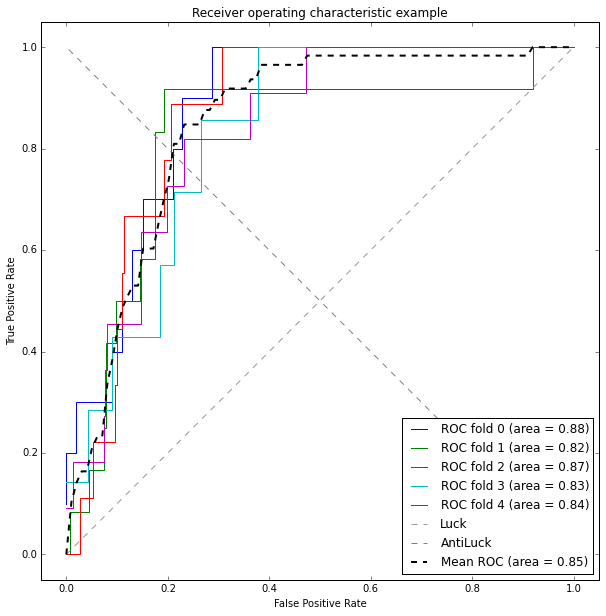

In [95]:
mean_tpr = 0.0
mean_fpr = np.linspace(0, 1, 100)
all_tpr = []

plt.figure(figsize=(10,10))

for i, (train, test) in enumerate(cv):
    probas_ = classifier.fit(X_han_best.ix[train], y_han_train.ix[train]).predict_proba(X_han_best.ix[test])
    # Compute ROC curve and area the curve
    fpr, tpr, thresholds = roc_curve(y_han_train.ix[test], probas_[:, 1])
    mean_tpr += interp(mean_fpr, fpr, tpr)
    mean_tpr[0] = 0.0
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw=1, label='ROC fold %d (area = %0.2f)' % (i, roc_auc))

plt.plot([0, 1], [0, 1], '--', color=(0.6, 0.6, 0.6), label='Luck')
plt.plot([1, 0], [0, 1], '--', color=(.5,.5,.5), label='AntiLuck')

mean_tpr /= len(cv)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
han_best_thresh = thresholds[np.argmax(mean_tpr - mean_fpr)]
plt.plot(mean_fpr, mean_tpr, 'k--',
         label='Mean ROC (area = %0.2f)' % mean_auc, lw=2)

plt.xlim([-0.05, 1.05])
plt.ylim([-0.05, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic example')
plt.legend(loc="lower right")

In [96]:
X_han_test = pd.DataFrame(han_scale_fit.transform(X_han_test).transpose()[best_han_cols].transpose(), columns = X_han_test.columns[best_han_cols])

In [97]:
han_probas = classifier.fit(X_han_best, y_han_train).predict_proba(X_han_test)
X_han_pred = []
for row in han_probas:
    if row[1] > han_best_thresh:
        X_han_pred.append(1)
    else:
        X_han_pred.append(0)

In [98]:
1 - 1.0*np.sum(y_han_test)/len(y_han_test)

0.9786407766990292

In [99]:
accuracy_score(X_han_pred, y_han_test)

0.86601941747572819

In [100]:
precision_score(X_han_pred, y_han_test)

0.45454545454545453

In [102]:
recall_score(X_han_pred, y_han_test)

0.073529411764705885

In [103]:
f1_score(X_han_pred, y_han_test)

0.12658227848101267

# SASQUATCH MUSIC FESTIVAL

In [104]:
y_sas, X_sas = df.sas_2015, df.ix[:, 'fans':'noi_counts']
X_sas_train, X_sas_test, y_sas_train, y_sas_test = train_test_split(X_sas, y_sas, test_size = 0.25, random_state = 4444)
sas_scale_fit = StandardScaler().fit(X_sas_train)
X_sas_train_scaled = pd.DataFrame(sas_scale_fit.transform(X_sas_train), columns = X_sas_train.columns)
new_sas_features = SelectKBest(f_classif, k = 10)
X_sas_best = new_sas_features.fit_transform(X_sas_train_scaled, y_sas_train)
best_sas_cols = new_sas_features.get_support(True)
X_sas_best = pd.DataFrame(X_sas_best, columns = X_sas.columns[best_sas_cols])
X_sas.columns[best_sas_cols]

Index([u'rank', u'2015_shows', u'2014_shows', u'2011_shows', u'hotttnesss',
       u'electro house', u'hip hop', u'rock', u'folk', u'gba_counts'],
      dtype='object')

In [106]:
cw_range = [{1:1-cw, 0:cw} for cw in np.arange(.01, 1.0, .1)]
gamma_range = np.logspace(-9, 3, 9)
param_grid = dict(gamma=gamma_range, class_weight=cw_range)
cv = ShuffleSplit(len(y_sas_train), n_iter=5, test_size=0.2, random_state=42)
for score in ['accuracy','precision', 'recall']:
    grid = GridSearchCV(SVC(kernel = 'rbf'), param_grid=param_grid, cv=cv, scoring = score, verbose= 10)
    grid.fit(X_sas_best, y_sas_train)
    print("The best parameters are %s with a score of %0.2f"
          % (grid.best_params_, grid.best_score_))

Fitting 5 folds for each of 90 candidates, totalling 450 fits
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032362 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032362 -   0.1s

[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.1s



[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.029126 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.016181 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.025890 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032362 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032362 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999

[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.6s



[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.016181 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.025890 -   0.1s
[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032362 -   0.1s
[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032362 -   0.1s
[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.029126 -   0.1s
[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.01618

[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    0.9s
[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    1.3s



[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.016181 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.025890 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032362 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032362 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.029126 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.01618

[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    1.7s
[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    2.3s



[CV] gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.029126 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.016181 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.025890 -   0.1s
[CV] gamma=31.6227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=31.6227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032362 -   0.1s
[CV] gamma=31.6227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=31.6227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032362 -   0.1s
[CV] gamma=31.6227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=31.6227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.029126 -   0.1s


[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    3.0s
[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    3.4s



[CV] gamma=3.16227766017e-08, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.967638 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.967638 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.970874 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.983819 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.974110 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-06, clas

[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    3.7s
[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    4.0s



[CV] gamma=0.0316227766017, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.967638 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.961165 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.977346 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.974110 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.11, 1: 0.89000000000000001} .......
[CV]  gamma=1.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.967638 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.11, 1: 0.89000000000000001} .......
[CV]  gamma=1.0, class_weight={0: 0.11, 1: 0.890000000000000

[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    4.9s
[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    5.2s



[CV] gamma=3.16227766017e-08, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.983819 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.974110 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=1e-06, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.967638 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=1e-06, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.967638 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=1e-06, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.970874 -   0.0s
[CV] gamma=1e-06

[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    5.4s
[Parallel(n_jobs=1)]: Done 128 jobs       | elapsed:    6.1s



[CV] gamma=31.6227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=31.6227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.983819 -   0.1s
[CV] gamma=31.6227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=31.6227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.974110 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=1000.0, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.967638 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=1000.0, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.967638 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=1000.0, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.970874 -   0.1s
[CV] gamma=1000.0, class_w

[Parallel(n_jobs=1)]: Done 145 jobs       | elapsed:    6.7s
[Parallel(n_jobs=1)]: Done 162 jobs       | elapsed:    7.0s



[CV] gamma=0.0316227766017, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.970874 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.983819 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.974110 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=1.0, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.967638 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=1.0, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.967638 -   0.1s
[CV] gamma=1

[Parallel(n_jobs=1)]: Done 181 jobs       | elapsed:    8.1s
[Parallel(n_jobs=1)]: Done 200 jobs       | elapsed:    8.3s



[CV] gamma=3.16227766017e-05, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.967638 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.970874 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.983819 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.974110 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=0.001, class_weight={0: 0.41000000000000003, 1: 0.589999999999

[Parallel(n_jobs=1)]: Done 221 jobs       | elapsed:    9.3s
[Parallel(n_jobs=1)]: Done 242 jobs       | elapsed:    9.6s



[CV] gamma=1e-06, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1e-06, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.970874 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1e-06, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.983819 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1e-06, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.974110 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.967638 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.967638 -   0.0s
[CV] gamma=3.162

[Parallel(n_jobs=1)]: Done 265 jobs       | elapsed:   10.5s
[Parallel(n_jobs=1)]: Done 288 jobs       | elapsed:   10.9s



[CV] gamma=3.16227766017e-05, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999}, score=0.967638 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999}, score=0.970874 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999}, score=0.983819 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999}, score=0.974110 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999} 
[CV]  gamma=0.001, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999}, score=0.9676

[Parallel(n_jobs=1)]: Done 313 jobs       | elapsed:   11.9s
[Parallel(n_jobs=1)]: Done 338 jobs       | elapsed:   12.1s



[CV] gamma=0.001, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=0.001, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.970874 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=0.001, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.983819 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=0.001, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.974110 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.967638 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.967638 -   0.0s
[CV] gamma=0.03162277660

[Parallel(n_jobs=1)]: Done 365 jobs       | elapsed:   13.2s
[Parallel(n_jobs=1)]: Done 392 jobs       | elapsed:   13.5s



[CV] gamma=1.0, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1.0, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.967638 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1.0, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.970874 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1.0, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.983819 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1.0, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.974110 -   0.0s
[CV] gamma=31.6227766017, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=31.6227766017, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.967638 -   0.1s
[CV] gamma=31.6227766017, class_weight={0: 0.81000000000000005, 

[Parallel(n_jobs=1)]: Done 421 jobs       | elapsed:   14.4s
[Parallel(n_jobs=1)]: Done 450 jobs       | elapsed:   15.4s



The best parameters are {'gamma': 1.0000000000000001e-09, 'class_weight': {0: 0.11, 1: 0.89000000000000001}} with a score of 0.97
Fitting 5 folds for each of 90 candidates, totalling 450 fits
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032362 -   0.1s

[Parallel(n_jobs=1)]: Done 450 out of 450 | elapsed:   15.4s finished
[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.1s



[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032362 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.029126 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.016181 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.025890 -   0.1s

[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.4s



[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032362 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032362 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.029126 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.016181 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.025890 -   0.1s
[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, clas

[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.6s
[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    0.9s



[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.016181 -   0.1s
[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.025890 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032362 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032362 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.029126 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 

[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    1.2s
[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    1.7s



[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032362 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032362 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.029703 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.016181 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.025890 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=1.0, class_weight={0: 0.01, 1: 

[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    2.2s
[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    2.9s



[CV] gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032362 -   0.0s
[CV] gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032362 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.029126 -   0.0s
[CV] gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.016181 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.025890 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1e-09, clas

[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    3.2s
[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    3.5s



[CV] gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=0.001, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=0.001, class_weight={0: 0.11, 

[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    3.8s
[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    4.6s



[CV] gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001} ....
[CV]  gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001} ....
[CV]  gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001} ....
[CV]  gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001} ....
[CV]  gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001} ....
[CV]  gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=1e-09, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.

[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    5.0s
[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    5.2s



[CV] gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.0s
[CV]

[Parallel(n_jobs=1)]: Done 128 jobs       | elapsed:    5.8s
[Parallel(n_jobs=1)]: Done 145 jobs       | elapsed:    6.4s



[CV] gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.310000000000000

[Parallel(n_jobs=1)]: Done 162 jobs       | elapsed:    6.6s
[Parallel(n_jobs=1)]: Done 181 jobs       | elapsed:    7.8s



[CV] gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.410000000000000

[Parallel(n_jobs=1)]: Done 200 jobs       | elapsed:    8.0s
[Parallel(n_jobs=1)]: Done 221 jobs       | elapsed:    9.0s



[CV] gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1e-09, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.51000000000000001, 

[Parallel(n_jobs=1)]: Done 242 jobs       | elapsed:    9.3s
[Parallel(n_jobs=1)]: Done 265 jobs       | elapsed:   10.2s



[CV] gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.6100000000000001,

[Parallel(n_jobs=1)]: Done 288 jobs       | elapsed:   10.8s
[Parallel(n_jobs=1)]: Done 313 jobs       | elapsed:   11.8s



[CV] gamma=1000.0, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999}, score=0.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.2899999

[Parallel(n_jobs=1)]: Done 338 jobs       | elapsed:   12.2s
[Parallel(n_jobs=1)]: Done 365 jobs       | elapsed:   13.2s



[CV]  gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.81

[Parallel(n_jobs=1)]: Done 392 jobs       | elapsed:   13.5s
[Parallel(n_jobs=1)]: Done 421 jobs       | elapsed:   14.4s



[CV]  gamma=1e-06, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weig

[Parallel(n_jobs=1)]: Done 450 jobs       | elapsed:   15.4s
[Parallel(n_jobs=1)]: Done 450 out of 450 | elapsed:   15.4s finished
[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.1s



[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s

[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.3s



[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, clas

[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.5s
[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    0.8s



[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 

[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    1.2s
[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    1.7s



[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=1.0, class_weight={0: 0.01, 1: 

[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    2.2s
[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    2.8s



[CV] gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.0s
[CV] gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class

[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    3.2s
[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    3.5s



[CV] gamma=1e-06, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-06, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-05, clas

[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    3.8s
[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    4.6s



[CV] gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001} ....
[CV]  gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001} ....
[CV]  gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001} ....
[CV]  gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001} ....
[CV]  gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001} ....
[CV]  gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=1e-09, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.

[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    5.1s
[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    5.3s



[CV] gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0:

[Parallel(n_jobs=1)]: Done 128 jobs       | elapsed:    6.2s
[Parallel(n_jobs=1)]: Done 145 jobs       | elapsed:    7.0s



[CV] gamma=3.16227766017e-08, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.310

[Parallel(n_jobs=1)]: Done 162 jobs       | elapsed:    7.2s
[Parallel(n_jobs=1)]: Done 181 jobs       | elapsed:    8.3s



[CV] gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.410000000000000

[Parallel(n_jobs=1)]: Done 200 jobs       | elapsed:    8.6s
[Parallel(n_jobs=1)]: Done 221 jobs       | elapsed:    9.7s



[CV] gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1e-09, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.51000000000000001, 

[Parallel(n_jobs=1)]: Done 242 jobs       | elapsed:   10.1s
[Parallel(n_jobs=1)]: Done 265 jobs       | elapsed:   11.0s



[CV] gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.0s
[CV] gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.0s
[CV] gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.0s
[CV] gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.6100000000000001,

[Parallel(n_jobs=1)]: Done 288 jobs       | elapsed:   11.4s
[Parallel(n_jobs=1)]: Done 313 jobs       | elapsed:   12.3s



[CV] gamma=1000.0, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999}, score=0.000000 -   0.0s
[CV] gamma=1000.0, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999}, score=0.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.289999999

[Parallel(n_jobs=1)]: Done 338 jobs       | elapsed:   12.6s
[Parallel(n_jobs=1)]: Done 365 jobs       | elapsed:   13.6s



[CV] gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-08, class_weig

[Parallel(n_jobs=1)]: Done 392 jobs       | elapsed:   13.9s
[Parallel(n_jobs=1)]: Done 421 jobs       | elapsed:   14.9s



[CV] gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969}, score=0.000000 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969} 
[CV]  gamma=0.001, class_weight={0: 0.91000000000000003, 1: 0.089

[Parallel(n_jobs=1)]: Done 450 jobs       | elapsed:   16.0s
[Parallel(n_jobs=1)]: Done 450 out of 450 | elapsed:   16.0s finished


The best parameters are {'gamma': 1.0e-09, 'class_weight': {0: 0.11, 1: 0.89}} with an accuracy score of 0.97.

The best parameters are {'gamma': 0.03162, 'class_weight': {0: 0.11, 1: 0.89}} with a precision score of 0.09.

The best parameters are {'gamma': 1.0e-09, 'class_weight': {0: 0.01, 1: 0.99}} with a recall score of 1.00.

In [107]:
cw_range = [{1:1-cw, 0:cw} for cw in np.arange(.01, .2, .01)]
gamma_range = np.logspace(-9, -2, 9)
param_grid = dict(gamma=gamma_range, class_weight=cw_range)
cv = ShuffleSplit(len(y_sas_train), n_iter=5, test_size=0.2, random_state=42)
for score in ['accuracy','precision', 'recall']:
    grid = GridSearchCV(SVC(kernel = 'rbf'), param_grid=param_grid, cv=cv, scoring = score, verbose= 10)
    grid.fit(X_sas_best, y_sas_train)
    print("The best parameters are %s with a score of %0.2f"
          % (grid.best_params_, grid.best_score_))

Fitting 5 folds for each of 171 candidates, totalling 855 fits
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032362 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032362 -   0.1s

[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.1s



[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.029126 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.016181 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.025890 -   0.1s
[CV] gamma=7.49894209332e-09, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=7.49894209332e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032362 -   0.1s
[CV] gamma=7.49894209332e-09, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=7.49894209332e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032362 -   0.1s
[CV] gamma=7.49894209332e-09, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=7.49894209332e-09, class_weight={0: 0.01, 1: 0.98999999999999

[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.5s



[CV] gamma=7.49894209332e-09, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=7.49894209332e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.016181 -   0.1s
[CV] gamma=7.49894209332e-09, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=7.49894209332e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.025890 -   0.1s
[CV] gamma=5.6234132519e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=5.6234132519e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032362 -   0.1s
[CV] gamma=5.6234132519e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=5.6234132519e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032362 -   0.1s
[CV] gamma=5.6234132519e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=5.6234132519e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.029126 -   0.1s
[CV] gamma=5.6234132519e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=5.623413251

[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    0.9s
[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    1.2s



[CV] gamma=4.21696503429e-07, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=4.21696503429e-07, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.016181 -   0.1s
[CV] gamma=4.21696503429e-07, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=4.21696503429e-07, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.025890 -   0.1s
[CV] gamma=3.16227766017e-06, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032362 -   0.1s
[CV] gamma=3.16227766017e-06, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032362 -   0.1s
[CV] gamma=3.16227766017e-06, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.029126 -   0.1s
[CV] gamma=3.16227766017e-06, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16

[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    1.6s
[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    2.1s



[CV] gamma=0.000177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.029126 -   0.1s
[CV] gamma=0.000177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.016181 -   0.1s
[CV] gamma=0.000177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.025890 -   0.1s
[CV] gamma=0.00133352143216, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.00133352143216, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032362 -   0.1s
[CV] gamma=0.00133352143216, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.00133352143216, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032362 -   0.1s
[CV] gamma=0.00133352143216, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0013335

[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    2.7s
[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    3.2s



[CV] gamma=7.49894209332e-09, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=7.49894209332e-09, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.032362 -   0.1s
[CV] gamma=7.49894209332e-09, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=7.49894209332e-09, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.032362 -   0.1s
[CV] gamma=7.49894209332e-09, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=7.49894209332e-09, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.029126 -   0.1s
[CV] gamma=7.49894209332e-09, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=7.49894209332e-09, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.016181 -   0.1s
[CV] gamma=7.49894209332e-09, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=7.49894209332e-09, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.025890 -   0.1s
[CV] gamma=5.6234132519e-08, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=5.623

[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    4.0s
[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    4.7s



[CV] gamma=2.37137370566e-05, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=2.37137370566e-05, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.029126 -   0.1s
[CV] gamma=2.37137370566e-05, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=2.37137370566e-05, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.016181 -   0.1s
[CV] gamma=2.37137370566e-05, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=2.37137370566e-05, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.025890 -   0.1s
[CV] gamma=0.000177827941004, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.032362 -   0.1s
[CV] gamma=0.000177827941004, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.032362 -   0.1s
[CV] gamma=0.000177827941004, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.00

[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    5.6s
[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    6.5s



[CV] gamma=7.49894209332e-09, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=7.49894209332e-09, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.016181 -   0.1s
[CV] gamma=7.49894209332e-09, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=7.49894209332e-09, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.025890 -   0.1s
[CV] gamma=5.6234132519e-08, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=5.6234132519e-08, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.967638 -   0.1s
[CV] gamma=5.6234132519e-08, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=5.6234132519e-08, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.967638 -   0.1s
[CV] gamma=5.6234132519e-08, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=5.6234132519e-08, class_weight={0: 0.029999999

[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    7.5s
[Parallel(n_jobs=1)]: Done 128 jobs       | elapsed:    8.7s



[CV] gamma=0.00133352143216, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.00133352143216, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.016181 -   0.1s
[CV] gamma=0.00133352143216, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.00133352143216, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.025890 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.750809 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.754045 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.728155 -   0.1s
[CV] gamma=0.01,

[Parallel(n_jobs=1)]: Done 145 jobs       | elapsed:    9.7s
[Parallel(n_jobs=1)]: Done 162 jobs       | elapsed:   10.8s



[CV] gamma=2.37137370566e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=2.37137370566e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.967638 -   0.0s
[CV] gamma=2.37137370566e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=2.37137370566e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.970874 -   0.0s
[CV] gamma=2.37137370566e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=2.37137370566e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.983819 -   0.1s
[CV] gamma=2.37137370566e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=2.37137370566e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.974110 -   0.1s
[CV] gamma=0.000177827941004, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.040

[Parallel(n_jobs=1)]: Done 181 jobs       | elapsed:   12.0s
[Parallel(n_jobs=1)]: Done 200 jobs       | elapsed:   13.0s



[CV] gamma=3.16227766017e-06, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=3.16227766017e-06, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996}, score=0.967638 -   0.1s
[CV] gamma=3.16227766017e-06, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=3.16227766017e-06, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996}, score=0.967638 -   0.1s
[CV] gamma=3.16227766017e-06, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=3.16227766017e-06, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996}, score=0.970874 -   0.1s
[CV] gamma=3.16227766017e-06, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=3.16227766017e-06, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996}, score=0.983819 -   0.1s
[CV] gamma=3.16227766017e-06, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=3.16227766017e-06, class_weight={0: 0.050

[Parallel(n_jobs=1)]: Done 221 jobs       | elapsed:   14.1s
[Parallel(n_jobs=1)]: Done 242 jobs       | elapsed:   15.1s



[CV] gamma=4.21696503429e-07, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=4.21696503429e-07, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995}, score=0.970874 -   0.0s
[CV] gamma=4.21696503429e-07, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=4.21696503429e-07, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995}, score=0.983819 -   0.1s
[CV] gamma=4.21696503429e-07, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=4.21696503429e-07, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995}, score=0.974110 -   0.1s
[CV] gamma=3.16227766017e-06, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=3.16227766017e-06, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995}, score=0.967638 -   0.0s
[CV] gamma=3.16227766017e-06, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=3.16227766017e-06, class_weight={0: 0.060

[Parallel(n_jobs=1)]: Done 265 jobs       | elapsed:   16.1s
[Parallel(n_jobs=1)]: Done 288 jobs       | elapsed:   16.8s



[CV] gamma=4.21696503429e-07, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=4.21696503429e-07, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005}, score=0.983819 -   0.0s
[CV] gamma=4.21696503429e-07, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=4.21696503429e-07, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005}, score=0.974110 -   0.0s
[CV] gamma=3.16227766017e-06, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=3.16227766017e-06, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005}, score=0.967638 -   0.0s
[CV] gamma=3.16227766017e-06, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=3.16227766017e-06, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005}, score=0.967638 -   0.0s
[CV] gamma=3.16227766017e-06, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=3.16227766017e-06, class_weight={0: 0.069

[Parallel(n_jobs=1)]: Done 313 jobs       | elapsed:   17.6s
[Parallel(n_jobs=1)]: Done 338 jobs       | elapsed:   18.3s



[CV] gamma=3.16227766017e-06, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=3.16227766017e-06, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.983819 -   0.0s
[CV] gamma=3.16227766017e-06, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=3.16227766017e-06, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.974110 -   0.0s
[CV] gamma=2.37137370566e-05, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=2.37137370566e-05, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.967638 -   0.0s
[CV] gamma=2.37137370566e-05, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=2.37137370566e-05, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.967638 -   0.0s
[CV] gamma=2.37137370566e-05, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=2.37137370566e-05, class_weight={0: 0.080

[Parallel(n_jobs=1)]: Done 365 jobs       | elapsed:   19.0s
[Parallel(n_jobs=1)]: Done 392 jobs       | elapsed:   19.7s



[CV] gamma=0.000177827941004, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003}, score=0.967638 -   0.0s
[CV] gamma=0.000177827941004, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003}, score=0.970874 -   0.0s
[CV] gamma=0.000177827941004, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003}, score=0.983819 -   0.0s
[CV] gamma=0.000177827941004, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003}, score=0.974110 -   0.0s
[CV] gamma=0.00133352143216, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.00133352143216, class_weight={0: 0.08999

[Parallel(n_jobs=1)]: Done 421 jobs       | elapsed:   20.6s
[Parallel(n_jobs=1)]: Done 450 jobs       | elapsed:   21.3s



[CV] gamma=0.01, class_weight={0: 0.099999999999999992, 1: 0.90000000000000002} 
[CV]  gamma=0.01, class_weight={0: 0.099999999999999992, 1: 0.90000000000000002}, score=0.974110 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.967638 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.967638 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.970874 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.983819 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.974110 -   0.0s
[C

[Parallel(n_jobs=1)]: Done 481 jobs       | elapsed:   22.1s
[Parallel(n_jobs=1)]: Done 512 jobs       | elapsed:   22.8s



[CV] gamma=4.21696503429e-07, class_weight={0: 0.12, 1: 0.88} ........
[CV]  gamma=4.21696503429e-07, class_weight={0: 0.12, 1: 0.88}, score=0.967638 -   0.0s
[CV] gamma=4.21696503429e-07, class_weight={0: 0.12, 1: 0.88} ........
[CV]  gamma=4.21696503429e-07, class_weight={0: 0.12, 1: 0.88}, score=0.967638 -   0.0s
[CV] gamma=4.21696503429e-07, class_weight={0: 0.12, 1: 0.88} ........
[CV]  gamma=4.21696503429e-07, class_weight={0: 0.12, 1: 0.88}, score=0.970874 -   0.0s
[CV] gamma=4.21696503429e-07, class_weight={0: 0.12, 1: 0.88} ........
[CV]  gamma=4.21696503429e-07, class_weight={0: 0.12, 1: 0.88}, score=0.983819 -   0.0s
[CV] gamma=4.21696503429e-07, class_weight={0: 0.12, 1: 0.88} ........
[CV]  gamma=4.21696503429e-07, class_weight={0: 0.12, 1: 0.88}, score=0.974110 -   0.0s
[CV] gamma=3.16227766017e-06, class_weight={0: 0.12, 1: 0.88} ........
[CV]  gamma=3.16227766017e-06, class_weight={0: 0.12, 1: 0.88}, score=0.967638 -   0.0s
[CV] gamma=3.16227766017e-06, class_weight={0

[Parallel(n_jobs=1)]: Done 545 jobs       | elapsed:   23.6s
[Parallel(n_jobs=1)]: Done 578 jobs       | elapsed:   24.4s



[CV] gamma=0.00133352143216, class_weight={0: 0.13, 1: 0.87} .........
[CV]  gamma=0.00133352143216, class_weight={0: 0.13, 1: 0.87}, score=0.967638 -   0.0s
[CV] gamma=0.00133352143216, class_weight={0: 0.13, 1: 0.87} .........
[CV]  gamma=0.00133352143216, class_weight={0: 0.13, 1: 0.87}, score=0.970874 -   0.0s
[CV] gamma=0.00133352143216, class_weight={0: 0.13, 1: 0.87} .........
[CV]  gamma=0.00133352143216, class_weight={0: 0.13, 1: 0.87}, score=0.983819 -   0.0s
[CV] gamma=0.00133352143216, class_weight={0: 0.13, 1: 0.87} .........
[CV]  gamma=0.00133352143216, class_weight={0: 0.13, 1: 0.87}, score=0.974110 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.13, 1: 0.87} .....................
[CV]  gamma=0.01, class_weight={0: 0.13, 1: 0.87}, score=0.967638 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.13, 1: 0.87} .....................
[CV]  gamma=0.01, class_weight={0: 0.13, 1: 0.87}, score=0.967638 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.13, 1: 0.87} .....................
[CV]

[Parallel(n_jobs=1)]: Done 613 jobs       | elapsed:   25.1s
[Parallel(n_jobs=1)]: Done 648 jobs       | elapsed:   25.7s



[CV] gamma=4.21696503429e-07, class_weight={0: 0.15000000000000002, 1: 0.84999999999999998} 
[CV]  gamma=4.21696503429e-07, class_weight={0: 0.15000000000000002, 1: 0.84999999999999998}, score=0.967638 -   0.0s
[CV] gamma=4.21696503429e-07, class_weight={0: 0.15000000000000002, 1: 0.84999999999999998} 
[CV]  gamma=4.21696503429e-07, class_weight={0: 0.15000000000000002, 1: 0.84999999999999998}, score=0.967638 -   0.0s
[CV] gamma=4.21696503429e-07, class_weight={0: 0.15000000000000002, 1: 0.84999999999999998} 
[CV]  gamma=4.21696503429e-07, class_weight={0: 0.15000000000000002, 1: 0.84999999999999998}, score=0.970874 -   0.0s
[CV] gamma=4.21696503429e-07, class_weight={0: 0.15000000000000002, 1: 0.84999999999999998} 
[CV]  gamma=4.21696503429e-07, class_weight={0: 0.15000000000000002, 1: 0.84999999999999998}, score=0.983819 -   0.0s
[CV] gamma=4.21696503429e-07, class_weight={0: 0.15000000000000002, 1: 0.84999999999999998} 
[CV]  gamma=4.21696503429e-07, class_weight={0: 0.150000000000

[Parallel(n_jobs=1)]: Done 685 jobs       | elapsed:   26.5s
[Parallel(n_jobs=1)]: Done 722 jobs       | elapsed:   27.1s



[CV] gamma=1e-09, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=1e-09, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.967638 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=1e-09, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.970874 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=1e-09, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.983819 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=1e-09, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.974110 -   0.0s
[CV] gamma=7.49894209332e-09, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=7.49894209332e-09, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.967638 -   0.0s
[CV] gamma=7.49894209332e-09, class_weig

[Parallel(n_jobs=1)]: Done 761 jobs       | elapsed:   27.9s
[Parallel(n_jobs=1)]: Done 800 jobs       | elapsed:   28.7s



[CV] gamma=0.000177827941004, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995}, score=0.974110 -   0.0s
[CV] gamma=0.00133352143216, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995} 
[CV]  gamma=0.00133352143216, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995}, score=0.967638 -   0.0s
[CV] gamma=0.00133352143216, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995} 
[CV]  gamma=0.00133352143216, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995}, score=0.967638 -   0.0s
[CV] gamma=0.00133352143216, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995} 
[CV]  gamma=0.00133352143216, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995}, score=0.970874 -   0.0s
[CV] gamma=0.00133352143216, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995} 
[CV]  gamma=0.00133352143216, class_weight={0: 0.18000000000000002, 1

[Parallel(n_jobs=1)]: Done 841 jobs       | elapsed:   29.6s
[Parallel(n_jobs=1)]: Done 855 out of 855 | elapsed:   29.9s finished



[CV] gamma=0.01, class_weight={0: 0.19, 1: 0.81000000000000005} ......
[CV]  gamma=0.01, class_weight={0: 0.19, 1: 0.81000000000000005}, score=0.974110 -   0.0s
The best parameters are {'gamma': 1.0000000000000001e-09, 'class_weight': {0: 0.040000000000000001, 1: 0.95999999999999996}} with a score of 0.97
Fitting 5 folds for each of 171 candidates, totalling 855 fits
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032362 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032362 -   0.1s

[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.2s



[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.029126 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.016181 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.025890 -   0.1s
[CV] gamma=7.49894209332e-09, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=7.49894209332e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032362 -   0.1s
[CV] gamma=7.49894209332e-09, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=7.49894209332e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032362 -   0.1s
[CV] gamma=7.49894209332e-09, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=7.49894209332e-09, class_weight={0: 0.01, 1: 0.98999999999999

[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.4s
[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.7s



[CV] gamma=7.49894209332e-09, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=7.49894209332e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.016181 -   0.1s
[CV] gamma=7.49894209332e-09, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=7.49894209332e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.025890 -   0.1s
[CV] gamma=5.6234132519e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=5.6234132519e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032362 -   0.1s
[CV] gamma=5.6234132519e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=5.6234132519e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032362 -   0.1s
[CV] gamma=5.6234132519e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=5.6234132519e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.029126 -   0.1s
[CV] gamma=5.6234132519e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=5.623413251

[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    1.2s
[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    1.7s



[CV] gamma=4.21696503429e-07, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=4.21696503429e-07, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.016181 -   0.1s
[CV] gamma=4.21696503429e-07, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=4.21696503429e-07, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.025890 -   0.1s
[CV] gamma=3.16227766017e-06, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032362 -   0.1s
[CV] gamma=3.16227766017e-06, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032362 -   0.1s
[CV] gamma=3.16227766017e-06, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.029126 -   0.1s
[CV] gamma=3.16227766017e-06, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16

[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    2.3s
[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    3.0s



[CV] gamma=0.000177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.029126 -   0.1s
[CV] gamma=0.000177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.016181 -   0.1s
[CV] gamma=0.000177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.025890 -   0.1s
[CV] gamma=0.00133352143216, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.00133352143216, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032362 -   0.1s
[CV] gamma=0.00133352143216, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.00133352143216, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032362 -   0.1s
[CV] gamma=0.00133352143216, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0013335

[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    3.7s
[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    4.5s



[CV] gamma=7.49894209332e-09, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=7.49894209332e-09, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.032362 -   0.1s
[CV] gamma=7.49894209332e-09, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=7.49894209332e-09, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.032362 -   0.1s
[CV] gamma=7.49894209332e-09, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=7.49894209332e-09, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.029126 -   0.1s
[CV] gamma=7.49894209332e-09, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=7.49894209332e-09, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.016181 -   0.1s
[CV] gamma=7.49894209332e-09, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=7.49894209332e-09, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.025890 -   0.1s
[CV] gamma=5.6234132519e-08, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=5.623

[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    5.5s
[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    6.3s



[CV] gamma=2.37137370566e-05, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=2.37137370566e-05, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.029126 -   0.1s
[CV] gamma=2.37137370566e-05, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=2.37137370566e-05, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.016181 -   0.1s
[CV] gamma=2.37137370566e-05, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=2.37137370566e-05, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.025890 -   0.1s
[CV] gamma=0.000177827941004, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.032362 -   0.1s
[CV] gamma=0.000177827941004, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.032362 -   0.1s
[CV] gamma=0.000177827941004, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.00

[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    7.2s
[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    8.1s



[CV] gamma=7.49894209332e-09, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=7.49894209332e-09, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.016181 -   0.1s
[CV] gamma=7.49894209332e-09, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=7.49894209332e-09, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.025890 -   0.1s
[CV] gamma=5.6234132519e-08, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=5.6234132519e-08, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.000000 -   0.1s
[CV] gamma=5.6234132519e-08, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=5.6234132519e-08, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.000000 -   0.1s
[CV] gamma=5.6234132519e-08, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=5.6234132519e-08, class_weight={0: 0.029999999

[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    9.2s
[Parallel(n_jobs=1)]: Done 128 jobs       | elapsed:   10.2s



[CV] gamma=0.00133352143216, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.00133352143216, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.016181 -   0.1s
[CV] gamma=0.00133352143216, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.00133352143216, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.025890 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.114943 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.087500 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.078652 -   0.1s
[CV] gamma=0.01,

[Parallel(n_jobs=1)]: Done 145 jobs       | elapsed:   11.2s
[Parallel(n_jobs=1)]: Done 162 jobs       | elapsed:   12.1s



[CV] gamma=2.37137370566e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=2.37137370566e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.000000 -   0.0s
[CV] gamma=2.37137370566e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=2.37137370566e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.000000 -   0.1s
[CV] gamma=2.37137370566e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=2.37137370566e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.000000 -   0.1s
[CV] gamma=0.000177827941004, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.000000 -   0.0s
[CV] gamma=0.000177827941004, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.040

[Parallel(n_jobs=1)]: Done 181 jobs       | elapsed:   13.0s
[Parallel(n_jobs=1)]: Done 200 jobs       | elapsed:   13.8s



[CV] gamma=4.21696503429e-07, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=4.21696503429e-07, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-06, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=3.16227766017e-06, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-06, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=3.16227766017e-06, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-06, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=3.16227766017e-06, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-06, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=3.16227766017e-06, class_weight={0: 0.050

[Parallel(n_jobs=1)]: Done 221 jobs       | elapsed:   14.7s
[Parallel(n_jobs=1)]: Done 242 jobs       | elapsed:   15.5s



[CV] gamma=4.21696503429e-07, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=4.21696503429e-07, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995}, score=0.000000 -   0.0s
[CV] gamma=4.21696503429e-07, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=4.21696503429e-07, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995}, score=0.000000 -   0.0s
[CV] gamma=4.21696503429e-07, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=4.21696503429e-07, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995}, score=0.000000 -   0.0s
[CV] gamma=4.21696503429e-07, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=4.21696503429e-07, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-06, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=3.16227766017e-06, class_weight={0: 0.060

[Parallel(n_jobs=1)]: Done 265 jobs       | elapsed:   16.4s
[Parallel(n_jobs=1)]: Done 288 jobs       | elapsed:   17.2s



[CV] gamma=4.21696503429e-07, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=4.21696503429e-07, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005}, score=0.000000 -   0.0s
[CV] gamma=4.21696503429e-07, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=4.21696503429e-07, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-06, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=3.16227766017e-06, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-06, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=3.16227766017e-06, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-06, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=3.16227766017e-06, class_weight={0: 0.069

[Parallel(n_jobs=1)]: Done 313 jobs       | elapsed:   18.0s
[Parallel(n_jobs=1)]: Done 338 jobs       | elapsed:   18.9s



[CV] gamma=3.16227766017e-06, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=3.16227766017e-06, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-06, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=3.16227766017e-06, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.000000 -   0.0s
[CV] gamma=2.37137370566e-05, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=2.37137370566e-05, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.000000 -   0.0s
[CV] gamma=2.37137370566e-05, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=2.37137370566e-05, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.000000 -   0.0s
[CV] gamma=2.37137370566e-05, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=2.37137370566e-05, class_weight={0: 0.080

[Parallel(n_jobs=1)]: Done 365 jobs       | elapsed:   19.7s
[Parallel(n_jobs=1)]: Done 392 jobs       | elapsed:   20.4s



[CV] gamma=0.000177827941004, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003}, score=0.000000 -   0.0s
[CV] gamma=0.000177827941004, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003}, score=0.000000 -   0.0s
[CV] gamma=0.000177827941004, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003}, score=0.000000 -   0.0s
[CV] gamma=0.00133352143216, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.00133352143216, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003}, score=0.000000 -   0.0s
[CV] gamma=0.00133352143216, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.00133352143216, class_weight={0: 0.0899999

[Parallel(n_jobs=1)]: Done 421 jobs       | elapsed:   21.2s
[Parallel(n_jobs=1)]: Done 450 jobs       | elapsed:   22.0s



[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=7.49894209332e-09, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=7.49894209332e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gam

[Parallel(n_jobs=1)]: Done 481 jobs       | elapsed:   22.7s
[Parallel(n_jobs=1)]: Done 512 jobs       | elapsed:   23.5s



[CV] gamma=4.21696503429e-07, class_weight={0: 0.12, 1: 0.88} ........
[CV]  gamma=4.21696503429e-07, class_weight={0: 0.12, 1: 0.88}, score=0.000000 -   0.0s
[CV] gamma=4.21696503429e-07, class_weight={0: 0.12, 1: 0.88} ........
[CV]  gamma=4.21696503429e-07, class_weight={0: 0.12, 1: 0.88}, score=0.000000 -   0.0s
[CV] gamma=4.21696503429e-07, class_weight={0: 0.12, 1: 0.88} ........
[CV]  gamma=4.21696503429e-07, class_weight={0: 0.12, 1: 0.88}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-06, class_weight={0: 0.12, 1: 0.88} ........
[CV]  gamma=3.16227766017e-06, class_weight={0: 0.12, 1: 0.88}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-06, class_weight={0: 0.12, 1: 0.88} ........
[CV]  gamma=3.16227766017e-06, class_weight={0: 0.12, 1: 0.88}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-06, class_weight={0: 0.12, 1: 0.88} ........
[CV]  gamma=3.16227766017e-06, class_weight={0: 0.12, 1: 0.88}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-06, class_weight={0

[Parallel(n_jobs=1)]: Done 545 jobs       | elapsed:   24.2s
[Parallel(n_jobs=1)]: Done 578 jobs       | elapsed:   24.9s



[CV] gamma=0.00133352143216, class_weight={0: 0.13, 1: 0.87} .........
[CV]  gamma=0.00133352143216, class_weight={0: 0.13, 1: 0.87}, score=0.000000 -   0.0s
[CV] gamma=0.00133352143216, class_weight={0: 0.13, 1: 0.87} .........
[CV]  gamma=0.00133352143216, class_weight={0: 0.13, 1: 0.87}, score=0.000000 -   0.0s
[CV] gamma=0.00133352143216, class_weight={0: 0.13, 1: 0.87} .........
[CV]  gamma=0.00133352143216, class_weight={0: 0.13, 1: 0.87}, score=0.000000 -   0.0s
[CV] gamma=0.00133352143216, class_weight={0: 0.13, 1: 0.87} .........
[CV]  gamma=0.00133352143216, class_weight={0: 0.13, 1: 0.87}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.13, 1: 0.87} .....................
[CV]  gamma=0.01, class_weight={0: 0.13, 1: 0.87}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.13, 1: 0.87} .....................
[CV]  gamma=0.01, class_weight={0: 0.13, 1: 0.87}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.13, 1: 0.87} .....................
[CV]

[Parallel(n_jobs=1)]: Done 613 jobs       | elapsed:   25.7s
[Parallel(n_jobs=1)]: Done 648 jobs       | elapsed:   26.4s



[CV] gamma=4.21696503429e-07, class_weight={0: 0.15000000000000002, 1: 0.84999999999999998} 
[CV]  gamma=4.21696503429e-07, class_weight={0: 0.15000000000000002, 1: 0.84999999999999998}, score=0.000000 -   0.0s
[CV] gamma=4.21696503429e-07, class_weight={0: 0.15000000000000002, 1: 0.84999999999999998} 
[CV]  gamma=4.21696503429e-07, class_weight={0: 0.15000000000000002, 1: 0.84999999999999998}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-06, class_weight={0: 0.15000000000000002, 1: 0.84999999999999998} 
[CV]  gamma=3.16227766017e-06, class_weight={0: 0.15000000000000002, 1: 0.84999999999999998}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-06, class_weight={0: 0.15000000000000002, 1: 0.84999999999999998} 
[CV]  gamma=3.16227766017e-06, class_weight={0: 0.15000000000000002, 1: 0.84999999999999998}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-06, class_weight={0: 0.15000000000000002, 1: 0.84999999999999998} 
[CV]  gamma=3.16227766017e-06, class_weight={0: 0.150000000000

[Parallel(n_jobs=1)]: Done 685 jobs       | elapsed:   27.1s
[Parallel(n_jobs=1)]: Done 722 jobs       | elapsed:   27.7s



[CV] gamma=1e-09, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=1e-09, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=1e-09, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=1e-09, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=1e-09, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.000000 -   0.0s
[CV] gamma=7.49894209332e-09, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=7.49894209332e-09, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.000000 -   0.0s
[CV] gamma=7.49894209332e-09, class_weig

[Parallel(n_jobs=1)]: Done 761 jobs       | elapsed:   28.5s
[Parallel(n_jobs=1)]: Done 800 jobs       | elapsed:   29.1s



[CV] gamma=0.000177827941004, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995}, score=0.000000 -   0.0s
[CV] gamma=0.00133352143216, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995} 
[CV]  gamma=0.00133352143216, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995}, score=0.000000 -   0.0s
[CV] gamma=0.00133352143216, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995} 
[CV]  gamma=0.00133352143216, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995}, score=0.000000 -   0.0s
[CV] gamma=0.00133352143216, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995} 
[CV]  gamma=0.00133352143216, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995}, score=0.000000 -   0.0s
[CV] gamma=0.00133352143216, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995} 
[CV]  gamma=0.00133352143216, class_weight={0: 0.18000000000000002, 1

[Parallel(n_jobs=1)]: Done 841 jobs       | elapsed:   29.8s
[Parallel(n_jobs=1)]: Done 855 out of 855 | elapsed:   30.1s finished



[CV] gamma=0.01, class_weight={0: 0.19, 1: 0.81000000000000005} ......
[CV]  gamma=0.01, class_weight={0: 0.19, 1: 0.81000000000000005}, score=0.000000 -   0.0s
The best parameters are {'gamma': 0.01, 'class_weight': {0: 0.069999999999999993, 1: 0.93000000000000005}} with a score of 0.16
Fitting 5 folds for each of 171 candidates, totalling 855 fits
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s

[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.1s



[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=7.49894209332e-09, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=7.49894209332e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=7.49894209332e-09, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=7.49894209332e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=7.49894209332e-09, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=7.49894209332e-09, class_weight={0: 0.01, 1: 0.98999999999999

[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.5s



[CV] gamma=7.49894209332e-09, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=7.49894209332e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=7.49894209332e-09, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=7.49894209332e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=5.6234132519e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=5.6234132519e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=5.6234132519e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=5.6234132519e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=5.6234132519e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=5.6234132519e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=5.6234132519e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=5.623413251

[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    0.9s
[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    1.2s



[CV] gamma=4.21696503429e-07, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=4.21696503429e-07, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=4.21696503429e-07, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=4.21696503429e-07, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-06, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-06, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-06, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-06, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16

[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    1.7s
[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    2.1s



[CV] gamma=0.000177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.000177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.000177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.00133352143216, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.00133352143216, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.00133352143216, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.00133352143216, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.00133352143216, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0013335

[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    2.7s
[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    3.4s



[CV] gamma=7.49894209332e-09, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=7.49894209332e-09, class_weight={0: 0.02, 1: 0.97999999999999998}, score=1.000000 -   0.1s
[CV] gamma=7.49894209332e-09, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=7.49894209332e-09, class_weight={0: 0.02, 1: 0.97999999999999998}, score=1.000000 -   0.1s
[CV] gamma=7.49894209332e-09, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=7.49894209332e-09, class_weight={0: 0.02, 1: 0.97999999999999998}, score=1.000000 -   0.1s
[CV] gamma=7.49894209332e-09, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=7.49894209332e-09, class_weight={0: 0.02, 1: 0.97999999999999998}, score=1.000000 -   0.1s
[CV] gamma=7.49894209332e-09, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=7.49894209332e-09, class_weight={0: 0.02, 1: 0.97999999999999998}, score=1.000000 -   0.1s
[CV] gamma=5.6234132519e-08, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=5.623

[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    4.2s
[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    5.0s



[CV] gamma=2.37137370566e-05, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=2.37137370566e-05, class_weight={0: 0.02, 1: 0.97999999999999998}, score=1.000000 -   0.1s
[CV] gamma=2.37137370566e-05, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=2.37137370566e-05, class_weight={0: 0.02, 1: 0.97999999999999998}, score=1.000000 -   0.1s
[CV] gamma=2.37137370566e-05, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=2.37137370566e-05, class_weight={0: 0.02, 1: 0.97999999999999998}, score=1.000000 -   0.1s
[CV] gamma=0.000177827941004, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.02, 1: 0.97999999999999998}, score=1.000000 -   0.1s
[CV] gamma=0.000177827941004, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.02, 1: 0.97999999999999998}, score=1.000000 -   0.1s
[CV] gamma=0.000177827941004, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.00

[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    6.0s
[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    7.1s



[CV] gamma=7.49894209332e-09, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=7.49894209332e-09, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=1.000000 -   0.1s
[CV] gamma=7.49894209332e-09, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=7.49894209332e-09, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=1.000000 -   0.1s
[CV] gamma=5.6234132519e-08, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=5.6234132519e-08, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.000000 -   0.1s
[CV] gamma=5.6234132519e-08, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=5.6234132519e-08, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.000000 -   0.1s
[CV] gamma=5.6234132519e-08, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=5.6234132519e-08, class_weight={0: 0.029999999

[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    8.2s
[Parallel(n_jobs=1)]: Done 128 jobs       | elapsed:    9.2s



[CV] gamma=0.00133352143216, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.00133352143216, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=1.000000 -   0.1s
[CV] gamma=0.00133352143216, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.00133352143216, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=1.000000 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=1.000000 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.700000 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.777778 -   0.1s
[CV] gamma=0.01,

[Parallel(n_jobs=1)]: Done 145 jobs       | elapsed:   10.3s
[Parallel(n_jobs=1)]: Done 162 jobs       | elapsed:   11.2s



[CV]  gamma=2.37137370566e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.000000 -   0.0s
[CV] gamma=2.37137370566e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=2.37137370566e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.000000 -   0.1s
[CV] gamma=2.37137370566e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=2.37137370566e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.000000 -   0.1s
[CV] gamma=2.37137370566e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=2.37137370566e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.000000 -   0.1s
[CV] gamma=0.000177827941004, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.000000 -   0.1s
[CV] gamma=0.000177827941004

[Parallel(n_jobs=1)]: Done 181 jobs       | elapsed:   12.2s
[Parallel(n_jobs=1)]: Done 200 jobs       | elapsed:   13.0s



[CV] gamma=4.21696503429e-07, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=4.21696503429e-07, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-06, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=3.16227766017e-06, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-06, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=3.16227766017e-06, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-06, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=3.16227766017e-06, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-06, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=3.16227766017e-06, class_weight={0: 0.050

[Parallel(n_jobs=1)]: Done 221 jobs       | elapsed:   13.9s
[Parallel(n_jobs=1)]: Done 242 jobs       | elapsed:   14.7s



[CV] gamma=4.21696503429e-07, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=4.21696503429e-07, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995}, score=0.000000 -   0.0s
[CV] gamma=4.21696503429e-07, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=4.21696503429e-07, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995}, score=0.000000 -   0.0s
[CV] gamma=4.21696503429e-07, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=4.21696503429e-07, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995}, score=0.000000 -   0.0s
[CV] gamma=4.21696503429e-07, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=4.21696503429e-07, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-06, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=3.16227766017e-06, class_weight={0: 0.060

[Parallel(n_jobs=1)]: Done 265 jobs       | elapsed:   15.6s
[Parallel(n_jobs=1)]: Done 288 jobs       | elapsed:   16.3s



[CV] gamma=4.21696503429e-07, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=4.21696503429e-07, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005}, score=0.000000 -   0.0s
[CV] gamma=4.21696503429e-07, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=4.21696503429e-07, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-06, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=3.16227766017e-06, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-06, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=3.16227766017e-06, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-06, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=3.16227766017e-06, class_weight={0: 0.069

[Parallel(n_jobs=1)]: Done 313 jobs       | elapsed:   17.1s
[Parallel(n_jobs=1)]: Done 338 jobs       | elapsed:   17.8s



[CV] gamma=3.16227766017e-06, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=3.16227766017e-06, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-06, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=3.16227766017e-06, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.000000 -   0.0s
[CV] gamma=2.37137370566e-05, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=2.37137370566e-05, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.000000 -   0.0s
[CV] gamma=2.37137370566e-05, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=2.37137370566e-05, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.000000 -   0.0s
[CV] gamma=2.37137370566e-05, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=2.37137370566e-05, class_weight={0: 0.080

[Parallel(n_jobs=1)]: Done 365 jobs       | elapsed:   18.5s
[Parallel(n_jobs=1)]: Done 392 jobs       | elapsed:   19.2s



[CV] gamma=0.000177827941004, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003}, score=0.000000 -   0.0s
[CV] gamma=0.000177827941004, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003}, score=0.000000 -   0.0s
[CV] gamma=0.000177827941004, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003}, score=0.000000 -   0.0s
[CV] gamma=0.00133352143216, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.00133352143216, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003}, score=0.000000 -   0.0s
[CV] gamma=0.00133352143216, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.00133352143216, class_weight={0: 0.0899999

[Parallel(n_jobs=1)]: Done 421 jobs       | elapsed:   20.0s
[Parallel(n_jobs=1)]: Done 450 jobs       | elapsed:   20.8s



[CV] gamma=0.01, class_weight={0: 0.099999999999999992, 1: 0.90000000000000002} 
[CV]  gamma=0.01, class_weight={0: 0.099999999999999992, 1: 0.90000000000000002}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[C

[Parallel(n_jobs=1)]: Done 481 jobs       | elapsed:   21.6s
[Parallel(n_jobs=1)]: Done 512 jobs       | elapsed:   22.4s



[CV] gamma=4.21696503429e-07, class_weight={0: 0.12, 1: 0.88} ........
[CV]  gamma=4.21696503429e-07, class_weight={0: 0.12, 1: 0.88}, score=0.000000 -   0.0s
[CV] gamma=4.21696503429e-07, class_weight={0: 0.12, 1: 0.88} ........
[CV]  gamma=4.21696503429e-07, class_weight={0: 0.12, 1: 0.88}, score=0.000000 -   0.0s
[CV] gamma=4.21696503429e-07, class_weight={0: 0.12, 1: 0.88} ........
[CV]  gamma=4.21696503429e-07, class_weight={0: 0.12, 1: 0.88}, score=0.000000 -   0.0s
[CV] gamma=4.21696503429e-07, class_weight={0: 0.12, 1: 0.88} ........
[CV]  gamma=4.21696503429e-07, class_weight={0: 0.12, 1: 0.88}, score=0.000000 -   0.0s
[CV] gamma=4.21696503429e-07, class_weight={0: 0.12, 1: 0.88} ........
[CV]  gamma=4.21696503429e-07, class_weight={0: 0.12, 1: 0.88}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-06, class_weight={0: 0.12, 1: 0.88} ........
[CV]  gamma=3.16227766017e-06, class_weight={0: 0.12, 1: 0.88}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-06, class_weight={0

[Parallel(n_jobs=1)]: Done 545 jobs       | elapsed:   23.2s
[Parallel(n_jobs=1)]: Done 578 jobs       | elapsed:   23.9s



[CV] gamma=0.00133352143216, class_weight={0: 0.13, 1: 0.87} .........
[CV]  gamma=0.00133352143216, class_weight={0: 0.13, 1: 0.87}, score=0.000000 -   0.0s
[CV] gamma=0.00133352143216, class_weight={0: 0.13, 1: 0.87} .........
[CV]  gamma=0.00133352143216, class_weight={0: 0.13, 1: 0.87}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.13, 1: 0.87} .....................
[CV]  gamma=0.01, class_weight={0: 0.13, 1: 0.87}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.13, 1: 0.87} .....................
[CV]  gamma=0.01, class_weight={0: 0.13, 1: 0.87}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.13, 1: 0.87} .....................
[CV]  gamma=0.01, class_weight={0: 0.13, 1: 0.87}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.13, 1: 0.87} .....................
[CV]  gamma=0.01, class_weight={0: 0.13, 1: 0.87}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.13, 1: 0.87} .....................
[CV]  gamma=0.01, class_weig

[Parallel(n_jobs=1)]: Done 613 jobs       | elapsed:   24.6s
[Parallel(n_jobs=1)]: Done 648 jobs       | elapsed:   25.3s



[CV] gamma=4.21696503429e-07, class_weight={0: 0.15000000000000002, 1: 0.84999999999999998} 
[CV]  gamma=4.21696503429e-07, class_weight={0: 0.15000000000000002, 1: 0.84999999999999998}, score=0.000000 -   0.0s
[CV] gamma=4.21696503429e-07, class_weight={0: 0.15000000000000002, 1: 0.84999999999999998} 
[CV]  gamma=4.21696503429e-07, class_weight={0: 0.15000000000000002, 1: 0.84999999999999998}, score=0.000000 -   0.0s
[CV] gamma=4.21696503429e-07, class_weight={0: 0.15000000000000002, 1: 0.84999999999999998} 
[CV]  gamma=4.21696503429e-07, class_weight={0: 0.15000000000000002, 1: 0.84999999999999998}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-06, class_weight={0: 0.15000000000000002, 1: 0.84999999999999998} 
[CV]  gamma=3.16227766017e-06, class_weight={0: 0.15000000000000002, 1: 0.84999999999999998}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-06, class_weight={0: 0.15000000000000002, 1: 0.84999999999999998} 
[CV]  gamma=3.16227766017e-06, class_weight={0: 0.150000000000

[Parallel(n_jobs=1)]: Done 685 jobs       | elapsed:   25.9s
[Parallel(n_jobs=1)]: Done 722 jobs       | elapsed:   26.6s



[CV] gamma=1e-09, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=1e-09, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=1e-09, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=1e-09, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=1e-09, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=1e-09, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.000000 -   0.0s
[CV] gamma=7.49894209332e-09, class_weight={0: 0.170000000000000

[Parallel(n_jobs=1)]: Done 761 jobs       | elapsed:   27.4s
[Parallel(n_jobs=1)]: Done 800 jobs       | elapsed:   28.1s



[CV] gamma=0.000177827941004, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995}, score=0.000000 -   0.0s
[CV] gamma=0.000177827941004, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995}, score=0.000000 -   0.0s
[CV] gamma=0.000177827941004, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995}, score=0.000000 -   0.0s
[CV] gamma=0.00133352143216, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995} 
[CV]  gamma=0.00133352143216, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995}, score=0.000000 -   0.0s
[CV] gamma=0.00133352143216, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995} 
[CV]  gamma=0.00133352143216, class_weight={0: 0.1800000000000000

[Parallel(n_jobs=1)]: Done 841 jobs       | elapsed:   28.8s
[Parallel(n_jobs=1)]: Done 855 out of 855 | elapsed:   29.0s finished



[CV] gamma=0.01, class_weight={0: 0.19, 1: 0.81000000000000005} ......
[CV]  gamma=0.01, class_weight={0: 0.19, 1: 0.81000000000000005}, score=0.000000 -   0.0s
The best parameters are {'gamma': 1.0000000000000001e-09, 'class_weight': {0: 0.01, 1: 0.98999999999999999}} with a score of 1.00


The best parameters are {'gamma': 1.0e-09, 'class_weight': {0: 0.04, 1: 0.96}} with an accuracy score of 0.97.

The best parameters are {'gamma': 0.01, 'class_weight': {0: 0.07, 1: 0.93}} with a precision score of 0.16.

The best parameters are {'gamma': 1.0e-09, 'class_weight': {0: 0.01, 1: 0.99}} with a recall score of 1.00.

In [108]:
cw_range = [{1:1-cw, 0:cw} for cw in np.arange(.04, .07, .005)]
gamma_range = np.logspace(-5, -2, 9)
param_grid = dict(gamma=gamma_range, class_weight=cw_range)
cv = ShuffleSplit(len(y_sas_train), n_iter=5, test_size=0.2, random_state=42)
for score in ['accuracy','precision', 'recall']:
    grid = GridSearchCV(SVC(kernel = 'rbf'), param_grid=param_grid, cv=cv, scoring = score, verbose= 10)
    grid.fit(X_sas_best, y_sas_train)
    print("The best parameters are %s with a score of %0.2f"
          % (grid.best_params_, grid.best_score_))

Fitting 5 folds for each of 63 candidates, totalling 315 fits
[CV] gamma=1e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=1e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.967638 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=1e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.967638 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=1e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.970874 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=1e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.983819 -   0.1s

[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.0s
[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.2s



[CV] gamma=1e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=1e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.974110 -   0.0s
[CV] gamma=2.37137370566e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=2.37137370566e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.967638 -   0.0s
[CV] gamma=2.37137370566e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=2.37137370566e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.967638 -   0.1s
[CV] gamma=2.37137370566e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=2.37137370566e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.970874 -   0.1s
[CV] gamma=2.37137370566e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=2.37137370566e-05, class_weight={0: 0.040000000000000001, 1: 0.95

[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.4s
[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    0.7s



[CV] gamma=5.6234132519e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=5.6234132519e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.970874 -   0.0s
[CV] gamma=5.6234132519e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=5.6234132519e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.983819 -   0.1s
[CV] gamma=5.6234132519e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=5.6234132519e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.974110 -   0.0s
[CV] gamma=0.000133352143216, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.000133352143216, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.967638 -   0.1s
[CV] gamma=0.000133352143216, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.000133352143216, class_weight={0: 0.040000000

[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    0.9s
[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    1.3s



[CV] gamma=0.000316227766017, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.000316227766017, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.974110 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.967638 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.967638 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.970874 -   0.1s
[CV] gamma=0.000749894209332, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.040

[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    1.7s
[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    2.1s



[CV] gamma=0.01, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.873786 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.864078 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.851133 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.847896 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.851133 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.044999999999999998, 1: 0.95

[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    2.6s
[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    3.2s



[CV] gamma=0.000133352143216, class_weight={0: 0.044999999999999998, 1: 0.95499999999999996} 
[CV]  gamma=0.000133352143216, class_weight={0: 0.044999999999999998, 1: 0.95499999999999996}, score=0.967638 -   0.0s
[CV] gamma=0.000133352143216, class_weight={0: 0.044999999999999998, 1: 0.95499999999999996} 
[CV]  gamma=0.000133352143216, class_weight={0: 0.044999999999999998, 1: 0.95499999999999996}, score=0.970874 -   0.1s
[CV] gamma=0.000133352143216, class_weight={0: 0.044999999999999998, 1: 0.95499999999999996} 
[CV]  gamma=0.000133352143216, class_weight={0: 0.044999999999999998, 1: 0.95499999999999996}, score=0.983819 -   0.1s
[CV] gamma=0.000133352143216, class_weight={0: 0.044999999999999998, 1: 0.95499999999999996} 
[CV]  gamma=0.000133352143216, class_weight={0: 0.044999999999999998, 1: 0.95499999999999996}, score=0.974110 -   0.1s
[CV] gamma=0.000316227766017, class_weight={0: 0.044999999999999998, 1: 0.95499999999999996} 
[CV]  gamma=0.000316227766017, class_weight={0: 0.044

[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    3.8s
[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    4.4s



[CV] gamma=0.01, class_weight={0: 0.044999999999999998, 1: 0.95499999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.044999999999999998, 1: 0.95499999999999996}, score=0.899676 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.044999999999999998, 1: 0.95499999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.044999999999999998, 1: 0.95499999999999996}, score=0.893204 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.044999999999999998, 1: 0.95499999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.044999999999999998, 1: 0.95499999999999996}, score=0.870550 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.044999999999999998, 1: 0.95499999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.044999999999999998, 1: 0.95499999999999996}, score=0.870550 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.044999999999999998, 1: 0.95499999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.044999999999999998, 1: 0.95499999999999996}, score=0.864078 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.049999999999999996, 1: 0.94

[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    5.1s
[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    5.9s



[CV] gamma=0.000316227766017, class_weight={0: 0.049999999999999996, 1: 0.94999999999999996} 
[CV]  gamma=0.000316227766017, class_weight={0: 0.049999999999999996, 1: 0.94999999999999996}, score=0.970874 -   0.0s
[CV] gamma=0.000316227766017, class_weight={0: 0.049999999999999996, 1: 0.94999999999999996} 
[CV]  gamma=0.000316227766017, class_weight={0: 0.049999999999999996, 1: 0.94999999999999996}, score=0.983819 -   0.1s
[CV] gamma=0.000316227766017, class_weight={0: 0.049999999999999996, 1: 0.94999999999999996} 
[CV]  gamma=0.000316227766017, class_weight={0: 0.049999999999999996, 1: 0.94999999999999996}, score=0.974110 -   0.1s
[CV] gamma=0.000749894209332, class_weight={0: 0.049999999999999996, 1: 0.94999999999999996} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.049999999999999996, 1: 0.94999999999999996}, score=0.967638 -   0.1s
[CV] gamma=0.000749894209332, class_weight={0: 0.049999999999999996, 1: 0.94999999999999996} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.049

[Parallel(n_jobs=1)]: Done 128 jobs       | elapsed:    6.7s
[Parallel(n_jobs=1)]: Done 145 jobs       | elapsed:    7.5s



[CV] gamma=5.6234132519e-05, class_weight={0: 0.054999999999999993, 1: 0.94500000000000006} 
[CV]  gamma=5.6234132519e-05, class_weight={0: 0.054999999999999993, 1: 0.94500000000000006}, score=0.967638 -   0.0s
[CV] gamma=5.6234132519e-05, class_weight={0: 0.054999999999999993, 1: 0.94500000000000006} 
[CV]  gamma=5.6234132519e-05, class_weight={0: 0.054999999999999993, 1: 0.94500000000000006}, score=0.967638 -   0.0s
[CV] gamma=5.6234132519e-05, class_weight={0: 0.054999999999999993, 1: 0.94500000000000006} 
[CV]  gamma=5.6234132519e-05, class_weight={0: 0.054999999999999993, 1: 0.94500000000000006}, score=0.970874 -   0.0s
[CV] gamma=5.6234132519e-05, class_weight={0: 0.054999999999999993, 1: 0.94500000000000006} 
[CV]  gamma=5.6234132519e-05, class_weight={0: 0.054999999999999993, 1: 0.94500000000000006}, score=0.983819 -   0.1s
[CV] gamma=5.6234132519e-05, class_weight={0: 0.054999999999999993, 1: 0.94500000000000006} 
[CV]  gamma=5.6234132519e-05, class_weight={0: 0.0549999999999

[Parallel(n_jobs=1)]: Done 162 jobs       | elapsed:    8.2s
[Parallel(n_jobs=1)]: Done 181 jobs       | elapsed:    9.1s



[CV] gamma=1e-05, class_weight={0: 0.059999999999999991, 1: 0.94000000000000006} 
[CV]  gamma=1e-05, class_weight={0: 0.059999999999999991, 1: 0.94000000000000006}, score=0.967638 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.059999999999999991, 1: 0.94000000000000006} 
[CV]  gamma=1e-05, class_weight={0: 0.059999999999999991, 1: 0.94000000000000006}, score=0.970874 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.059999999999999991, 1: 0.94000000000000006} 
[CV]  gamma=1e-05, class_weight={0: 0.059999999999999991, 1: 0.94000000000000006}, score=0.983819 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.059999999999999991, 1: 0.94000000000000006} 
[CV]  gamma=1e-05, class_weight={0: 0.059999999999999991, 1: 0.94000000000000006}, score=0.974110 -   0.0s
[CV] gamma=2.37137370566e-05, class_weight={0: 0.059999999999999991, 1: 0.94000000000000006} 
[CV]  gamma=2.37137370566e-05, class_weight={0: 0.059999999999999991, 1: 0.94000000000000006}, score=0.967638 -   0.0s
[CV] gamma=2.37137370566e-05, 

[Parallel(n_jobs=1)]: Done 200 jobs       | elapsed:    9.8s
[Parallel(n_jobs=1)]: Done 221 jobs       | elapsed:   10.6s



[CV] gamma=0.01, class_weight={0: 0.059999999999999991, 1: 0.94000000000000006} 
[CV]  gamma=0.01, class_weight={0: 0.059999999999999991, 1: 0.94000000000000006}, score=0.948220 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.059999999999999991, 1: 0.94000000000000006} 
[CV]  gamma=0.01, class_weight={0: 0.059999999999999991, 1: 0.94000000000000006}, score=0.932039 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.059999999999999991, 1: 0.94000000000000006} 
[CV]  gamma=0.01, class_weight={0: 0.059999999999999991, 1: 0.94000000000000006}, score=0.919094 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.059999999999999991, 1: 0.94000000000000006} 
[CV]  gamma=0.01, class_weight={0: 0.059999999999999991, 1: 0.94000000000000006}, score=0.954693 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.064999999999999988, 1: 0.93500000000000005} 
[CV]  gamma=1e-05, class_weight={0: 0.064999999999999988, 1: 0.93500000000000005}, score=0.967638 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.064999999999999988, 1: 0.

[Parallel(n_jobs=1)]: Done 242 jobs       | elapsed:   11.5s
[Parallel(n_jobs=1)]: Done 265 jobs       | elapsed:   12.7s



[CV] gamma=0.00421696503429, class_weight={0: 0.064999999999999988, 1: 0.93500000000000005} 
[CV]  gamma=0.00421696503429, class_weight={0: 0.064999999999999988, 1: 0.93500000000000005}, score=0.974110 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.064999999999999988, 1: 0.93500000000000005} 
[CV]  gamma=0.01, class_weight={0: 0.064999999999999988, 1: 0.93500000000000005}, score=0.967638 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.064999999999999988, 1: 0.93500000000000005} 
[CV]  gamma=0.01, class_weight={0: 0.064999999999999988, 1: 0.93500000000000005}, score=0.961165 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.064999999999999988, 1: 0.93500000000000005} 
[CV]  gamma=0.01, class_weight={0: 0.064999999999999988, 1: 0.93500000000000005}, score=0.944984 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.064999999999999988, 1: 0.93500000000000005} 
[CV]  gamma=0.01, class_weight={0: 0.064999999999999988, 1: 0.93500000000000005}, score=0.938511 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.0649

[Parallel(n_jobs=1)]: Done 288 jobs       | elapsed:   13.6s
[Parallel(n_jobs=1)]: Done 313 jobs       | elapsed:   14.7s



[CV] gamma=0.01, class_weight={0: 0.069999999999999979, 1: 0.93000000000000005} 
[CV]  gamma=0.01, class_weight={0: 0.069999999999999979, 1: 0.93000000000000005}, score=0.944984 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.069999999999999979, 1: 0.93000000000000005} 
[CV]  gamma=0.01, class_weight={0: 0.069999999999999979, 1: 0.93000000000000005}, score=0.974110 -   0.0s
The best parameters are {'gamma': 1.0000000000000001e-05, 'class_weight': {0: 0.040000000000000001, 1: 0.95999999999999996}} with a score of 0.97
Fitting 5 folds for each of 63 candidates, totalling 315 fits
[CV] gamma=1e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=1e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.000000 -   0.1s

[Parallel(n_jobs=1)]: Done 315 out of 315 | elapsed:   14.8s finished
[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.1s



[CV] gamma=1e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=1e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.000000 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=1e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.000000 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=1e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.000000 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=1e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.000000 -   0.1s

[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.4s



[CV] gamma=2.37137370566e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=2.37137370566e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.000000 -   0.1s
[CV] gamma=2.37137370566e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=2.37137370566e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.000000 -   0.1s
[CV] gamma=2.37137370566e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=2.37137370566e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.000000 -   0.1s
[CV] gamma=2.37137370566e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=2.37137370566e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.000000 -   0.1s
[CV] gamma=2.37137370566e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=2.37137370566e-05, class_weight={0: 0.040

[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.6s
[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    0.9s



[CV] gamma=5.6234132519e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=5.6234132519e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.000000 -   0.1s
[CV] gamma=5.6234132519e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=5.6234132519e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.000000 -   0.1s
[CV] gamma=0.000133352143216, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.000133352143216, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.000000 -   0.1s
[CV] gamma=0.000133352143216, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.000133352143216, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.000000 -   0.1s
[CV] gamma=0.000133352143216, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.000133352143216, class_weight={0: 0.0400000

[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    1.2s
[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    1.8s



[CV] gamma=0.000749894209332, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.000000 -   0.1s
[CV] gamma=0.000749894209332, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.000000 -   0.1s
[CV] gamma=0.000749894209332, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.000000 -   0.1s
[CV] gamma=0.000749894209332, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.000000 -   0.1s
[CV] gamma=0.000749894209332, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.040

[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    2.3s
[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    2.9s



[CV] gamma=0.01, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.136364 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.122449 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.080000 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.134615 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.044999999999999998, 1: 0.95499999999999996} 
[CV]  gamma=1e-05, class_weight={0: 0.044999999999999998, 1: 0.95499999999999996}, score=0.000000 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.044999999999999998, 1: 0.

[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    3.5s
[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    4.2s



[CV] gamma=0.000133352143216, class_weight={0: 0.044999999999999998, 1: 0.95499999999999996} 
[CV]  gamma=0.000133352143216, class_weight={0: 0.044999999999999998, 1: 0.95499999999999996}, score=0.000000 -   0.1s
[CV] gamma=0.000133352143216, class_weight={0: 0.044999999999999998, 1: 0.95499999999999996} 
[CV]  gamma=0.000133352143216, class_weight={0: 0.044999999999999998, 1: 0.95499999999999996}, score=0.000000 -   0.1s
[CV] gamma=0.000133352143216, class_weight={0: 0.044999999999999998, 1: 0.95499999999999996} 
[CV]  gamma=0.000133352143216, class_weight={0: 0.044999999999999998, 1: 0.95499999999999996}, score=0.000000 -   0.1s
[CV] gamma=0.000133352143216, class_weight={0: 0.044999999999999998, 1: 0.95499999999999996} 
[CV]  gamma=0.000133352143216, class_weight={0: 0.044999999999999998, 1: 0.95499999999999996}, score=0.000000 -   0.1s
[CV] gamma=0.000316227766017, class_weight={0: 0.044999999999999998, 1: 0.95499999999999996} 
[CV]  gamma=0.000316227766017, class_weight={0: 0.044

[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    5.0s
[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    5.6s



[CV] gamma=0.00421696503429, class_weight={0: 0.044999999999999998, 1: 0.95499999999999996} 
[CV]  gamma=0.00421696503429, class_weight={0: 0.044999999999999998, 1: 0.95499999999999996}, score=0.500000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.044999999999999998, 1: 0.95499999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.044999999999999998, 1: 0.95499999999999996}, score=0.200000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.044999999999999998, 1: 0.95499999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.044999999999999998, 1: 0.95499999999999996}, score=0.129032 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.044999999999999998, 1: 0.95499999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.044999999999999998, 1: 0.95499999999999996}, score=0.121951 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.044999999999999998, 1: 0.95499999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.044999999999999998, 1: 0.95499999999999996}, score=0.093023 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.0449

[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    6.2s
[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    6.9s



[CV] gamma=0.000316227766017, class_weight={0: 0.049999999999999996, 1: 0.94999999999999996} 
[CV]  gamma=0.000316227766017, class_weight={0: 0.049999999999999996, 1: 0.94999999999999996}, score=0.000000 -   0.0s
[CV] gamma=0.000316227766017, class_weight={0: 0.049999999999999996, 1: 0.94999999999999996} 
[CV]  gamma=0.000316227766017, class_weight={0: 0.049999999999999996, 1: 0.94999999999999996}, score=0.000000 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.049999999999999996, 1: 0.94999999999999996} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.049999999999999996, 1: 0.94999999999999996}, score=0.000000 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.049999999999999996, 1: 0.94999999999999996} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.049999999999999996, 1: 0.94999999999999996}, score=0.000000 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.049999999999999996, 1: 0.94999999999999996} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.049

[Parallel(n_jobs=1)]: Done 128 jobs       | elapsed:    7.5s
[Parallel(n_jobs=1)]: Done 145 jobs       | elapsed:    8.2s



[CV] gamma=5.6234132519e-05, class_weight={0: 0.054999999999999993, 1: 0.94500000000000006} 
[CV]  gamma=5.6234132519e-05, class_weight={0: 0.054999999999999993, 1: 0.94500000000000006}, score=0.000000 -   0.0s
[CV] gamma=5.6234132519e-05, class_weight={0: 0.054999999999999993, 1: 0.94500000000000006} 
[CV]  gamma=5.6234132519e-05, class_weight={0: 0.054999999999999993, 1: 0.94500000000000006}, score=0.000000 -   0.0s
[CV] gamma=5.6234132519e-05, class_weight={0: 0.054999999999999993, 1: 0.94500000000000006} 
[CV]  gamma=5.6234132519e-05, class_weight={0: 0.054999999999999993, 1: 0.94500000000000006}, score=0.000000 -   0.0s
[CV] gamma=5.6234132519e-05, class_weight={0: 0.054999999999999993, 1: 0.94500000000000006} 
[CV]  gamma=5.6234132519e-05, class_weight={0: 0.054999999999999993, 1: 0.94500000000000006}, score=0.000000 -   0.0s
[CV] gamma=5.6234132519e-05, class_weight={0: 0.054999999999999993, 1: 0.94500000000000006} 
[CV]  gamma=5.6234132519e-05, class_weight={0: 0.0549999999999

[Parallel(n_jobs=1)]: Done 162 jobs       | elapsed:    9.0s
[Parallel(n_jobs=1)]: Done 181 jobs       | elapsed:    9.7s



[CV] gamma=1e-05, class_weight={0: 0.059999999999999991, 1: 0.94000000000000006} 
[CV]  gamma=1e-05, class_weight={0: 0.059999999999999991, 1: 0.94000000000000006}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.059999999999999991, 1: 0.94000000000000006} 
[CV]  gamma=1e-05, class_weight={0: 0.059999999999999991, 1: 0.94000000000000006}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.059999999999999991, 1: 0.94000000000000006} 
[CV]  gamma=1e-05, class_weight={0: 0.059999999999999991, 1: 0.94000000000000006}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.059999999999999991, 1: 0.94000000000000006} 
[CV]  gamma=1e-05, class_weight={0: 0.059999999999999991, 1: 0.94000000000000006}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.059999999999999991, 1: 0.94000000000000006} 
[CV]  gamma=1e-05, class_weight={0: 0.059999999999999991, 1: 0.94000000000000006}, score=0.000000 -   0.0s
[CV] gamma=2.37137370566e-05, class_weight={0: 0.05999

[Parallel(n_jobs=1)]: Done 200 jobs       | elapsed:   10.5s
[Parallel(n_jobs=1)]: Done 221 jobs       | elapsed:   11.3s



[CV] gamma=0.01, class_weight={0: 0.059999999999999991, 1: 0.94000000000000006} 
[CV]  gamma=0.01, class_weight={0: 0.059999999999999991, 1: 0.94000000000000006}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.059999999999999991, 1: 0.94000000000000006} 
[CV]  gamma=0.01, class_weight={0: 0.059999999999999991, 1: 0.94000000000000006}, score=0.200000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.059999999999999991, 1: 0.94000000000000006} 
[CV]  gamma=0.01, class_weight={0: 0.059999999999999991, 1: 0.94000000000000006}, score=0.166667 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.059999999999999991, 1: 0.94000000000000006} 
[CV]  gamma=0.01, class_weight={0: 0.059999999999999991, 1: 0.94000000000000006}, score=0.115385 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.059999999999999991, 1: 0.94000000000000006} 
[CV]  gamma=0.01, class_weight={0: 0.059999999999999991, 1: 0.94000000000000006}, score=0.250000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.064999999999999988, 1: 0.93

[Parallel(n_jobs=1)]: Done 242 jobs       | elapsed:   12.0s
[Parallel(n_jobs=1)]: Done 265 jobs       | elapsed:   12.8s



[CV] gamma=0.00421696503429, class_weight={0: 0.064999999999999988, 1: 0.93500000000000005} 
[CV]  gamma=0.00421696503429, class_weight={0: 0.064999999999999988, 1: 0.93500000000000005}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.064999999999999988, 1: 0.93500000000000005} 
[CV]  gamma=0.01, class_weight={0: 0.064999999999999988, 1: 0.93500000000000005}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.064999999999999988, 1: 0.93500000000000005} 
[CV]  gamma=0.01, class_weight={0: 0.064999999999999988, 1: 0.93500000000000005}, score=0.250000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.064999999999999988, 1: 0.93500000000000005} 
[CV]  gamma=0.01, class_weight={0: 0.064999999999999988, 1: 0.93500000000000005}, score=0.214286 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.064999999999999988, 1: 0.93500000000000005} 
[CV]  gamma=0.01, class_weight={0: 0.064999999999999988, 1: 0.93500000000000005}, score=0.150000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.0649

[Parallel(n_jobs=1)]: Done 288 jobs       | elapsed:   13.5s
[Parallel(n_jobs=1)]: Done 313 jobs       | elapsed:   14.3s



[CV] gamma=0.01, class_weight={0: 0.069999999999999979, 1: 0.93000000000000005} 
[CV]  gamma=0.01, class_weight={0: 0.069999999999999979, 1: 0.93000000000000005}, score=0.071429 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.069999999999999979, 1: 0.93000000000000005} 
[CV]  gamma=0.01, class_weight={0: 0.069999999999999979, 1: 0.93000000000000005}, score=0.000000 -   0.0s
The best parameters are {'gamma': 0.0042169650342858229, 'class_weight': {0: 0.044999999999999998, 1: 0.95499999999999996}} with a score of 0.27

[Parallel(n_jobs=1)]: Done 315 out of 315 | elapsed:   14.4s finished
[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.0s



Fitting 5 folds for each of 63 candidates, totalling 315 fits
[CV] gamma=1e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=1e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=1e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=1e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=1e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.000000 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=1e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.000000 -

[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.3s



[CV] gamma=2.37137370566e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=2.37137370566e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.000000 -   0.0s
[CV] gamma=2.37137370566e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=2.37137370566e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.000000 -   0.1s
[CV] gamma=2.37137370566e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=2.37137370566e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.000000 -   0.1s
[CV] gamma=2.37137370566e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=2.37137370566e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.000000 -   0.1s
[CV] gamma=2.37137370566e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=2.37137370566e-05, class_weight={0: 0.040

[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.4s
[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    0.7s



[CV] gamma=5.6234132519e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=5.6234132519e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.000000 -   0.1s
[CV] gamma=5.6234132519e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=5.6234132519e-05, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.000000 -   0.1s
[CV] gamma=0.000133352143216, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.000133352143216, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.000000 -   0.1s
[CV] gamma=0.000133352143216, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.000133352143216, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.000000 -   0.0s
[CV] gamma=0.000133352143216, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.000133352143216, class_weight={0: 0.0400000

[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    1.0s
[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    1.4s



[CV] gamma=0.000749894209332, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.000000 -   0.1s
[CV] gamma=0.000749894209332, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.000000 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.000000 -   0.1s
[CV] gamma=0.000749894209332, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.000000 -   0.1s
[CV] gamma=0.000749894209332, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.040

[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    1.8s
[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    2.3s



[CV] gamma=0.01, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.600000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.666667 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.800000 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.875000 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.044999999999999998, 1: 0.95499999999999996} 
[CV]  gamma=1e-05, class_weight={0: 0.044999999999999998, 1: 0.95499999999999996}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.044999999999999998, 1: 0.

[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    2.8s
[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    3.4s



[CV] gamma=0.000133352143216, class_weight={0: 0.044999999999999998, 1: 0.95499999999999996} 
[CV]  gamma=0.000133352143216, class_weight={0: 0.044999999999999998, 1: 0.95499999999999996}, score=0.000000 -   0.1s
[CV] gamma=0.000133352143216, class_weight={0: 0.044999999999999998, 1: 0.95499999999999996} 
[CV]  gamma=0.000133352143216, class_weight={0: 0.044999999999999998, 1: 0.95499999999999996}, score=0.000000 -   0.1s
[CV] gamma=0.000133352143216, class_weight={0: 0.044999999999999998, 1: 0.95499999999999996} 
[CV]  gamma=0.000133352143216, class_weight={0: 0.044999999999999998, 1: 0.95499999999999996}, score=0.000000 -   0.1s
[CV] gamma=0.000133352143216, class_weight={0: 0.044999999999999998, 1: 0.95499999999999996} 
[CV]  gamma=0.000133352143216, class_weight={0: 0.044999999999999998, 1: 0.95499999999999996}, score=0.000000 -   0.1s
[CV] gamma=0.000316227766017, class_weight={0: 0.044999999999999998, 1: 0.95499999999999996} 
[CV]  gamma=0.000316227766017, class_weight={0: 0.044

[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    4.0s
[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    4.7s



[CV] gamma=0.01, class_weight={0: 0.044999999999999998, 1: 0.95499999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.044999999999999998, 1: 0.95499999999999996}, score=0.700000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.044999999999999998, 1: 0.95499999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.044999999999999998, 1: 0.95499999999999996}, score=0.400000 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.044999999999999998, 1: 0.95499999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.044999999999999998, 1: 0.95499999999999996}, score=0.555556 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.044999999999999998, 1: 0.95499999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.044999999999999998, 1: 0.95499999999999996}, score=0.800000 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.044999999999999998, 1: 0.95499999999999996} 
[CV]  gamma=0.01, class_weight={0: 0.044999999999999998, 1: 0.95499999999999996}, score=0.875000 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.049999999999999996, 1: 0.94

[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    5.3s
[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    6.0s



[CV] gamma=0.000316227766017, class_weight={0: 0.049999999999999996, 1: 0.94999999999999996} 
[CV]  gamma=0.000316227766017, class_weight={0: 0.049999999999999996, 1: 0.94999999999999996}, score=0.000000 -   0.0s
[CV] gamma=0.000316227766017, class_weight={0: 0.049999999999999996, 1: 0.94999999999999996} 
[CV]  gamma=0.000316227766017, class_weight={0: 0.049999999999999996, 1: 0.94999999999999996}, score=0.000000 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.049999999999999996, 1: 0.94999999999999996} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.049999999999999996, 1: 0.94999999999999996}, score=0.000000 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.049999999999999996, 1: 0.94999999999999996} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.049999999999999996, 1: 0.94999999999999996}, score=0.000000 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.049999999999999996, 1: 0.94999999999999996} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.049

[Parallel(n_jobs=1)]: Done 128 jobs       | elapsed:    6.7s
[Parallel(n_jobs=1)]: Done 145 jobs       | elapsed:    7.4s



[CV] gamma=5.6234132519e-05, class_weight={0: 0.054999999999999993, 1: 0.94500000000000006} 
[CV]  gamma=5.6234132519e-05, class_weight={0: 0.054999999999999993, 1: 0.94500000000000006}, score=0.000000 -   0.0s
[CV] gamma=5.6234132519e-05, class_weight={0: 0.054999999999999993, 1: 0.94500000000000006} 
[CV]  gamma=5.6234132519e-05, class_weight={0: 0.054999999999999993, 1: 0.94500000000000006}, score=0.000000 -   0.1s
[CV] gamma=5.6234132519e-05, class_weight={0: 0.054999999999999993, 1: 0.94500000000000006} 
[CV]  gamma=5.6234132519e-05, class_weight={0: 0.054999999999999993, 1: 0.94500000000000006}, score=0.000000 -   0.0s
[CV] gamma=5.6234132519e-05, class_weight={0: 0.054999999999999993, 1: 0.94500000000000006} 
[CV]  gamma=5.6234132519e-05, class_weight={0: 0.054999999999999993, 1: 0.94500000000000006}, score=0.000000 -   0.1s
[CV] gamma=5.6234132519e-05, class_weight={0: 0.054999999999999993, 1: 0.94500000000000006} 
[CV]  gamma=5.6234132519e-05, class_weight={0: 0.0549999999999

[Parallel(n_jobs=1)]: Done 162 jobs       | elapsed:    8.2s
[Parallel(n_jobs=1)]: Done 181 jobs       | elapsed:    9.0s



[CV] gamma=1e-05, class_weight={0: 0.059999999999999991, 1: 0.94000000000000006} 
[CV]  gamma=1e-05, class_weight={0: 0.059999999999999991, 1: 0.94000000000000006}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.059999999999999991, 1: 0.94000000000000006} 
[CV]  gamma=1e-05, class_weight={0: 0.059999999999999991, 1: 0.94000000000000006}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.059999999999999991, 1: 0.94000000000000006} 
[CV]  gamma=1e-05, class_weight={0: 0.059999999999999991, 1: 0.94000000000000006}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.059999999999999991, 1: 0.94000000000000006} 
[CV]  gamma=1e-05, class_weight={0: 0.059999999999999991, 1: 0.94000000000000006}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.059999999999999991, 1: 0.94000000000000006} 
[CV]  gamma=1e-05, class_weight={0: 0.059999999999999991, 1: 0.94000000000000006}, score=0.000000 -   0.0s
[CV] gamma=2.37137370566e-05, class_weight={0: 0.05999

[Parallel(n_jobs=1)]: Done 200 jobs       | elapsed:    9.7s
[Parallel(n_jobs=1)]: Done 221 jobs       | elapsed:   10.5s



[CV] gamma=0.01, class_weight={0: 0.059999999999999991, 1: 0.94000000000000006} 
[CV]  gamma=0.01, class_weight={0: 0.059999999999999991, 1: 0.94000000000000006}, score=0.200000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.059999999999999991, 1: 0.94000000000000006} 
[CV]  gamma=0.01, class_weight={0: 0.059999999999999991, 1: 0.94000000000000006}, score=0.333333 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.059999999999999991, 1: 0.94000000000000006} 
[CV]  gamma=0.01, class_weight={0: 0.059999999999999991, 1: 0.94000000000000006}, score=0.600000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.059999999999999991, 1: 0.94000000000000006} 
[CV]  gamma=0.01, class_weight={0: 0.059999999999999991, 1: 0.94000000000000006}, score=0.375000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.064999999999999988, 1: 0.93500000000000005} 
[CV]  gamma=1e-05, class_weight={0: 0.064999999999999988, 1: 0.93500000000000005}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.064999999999999988, 1: 0.

[Parallel(n_jobs=1)]: Done 242 jobs       | elapsed:   11.3s
[Parallel(n_jobs=1)]: Done 265 jobs       | elapsed:   12.1s



[CV] gamma=0.01, class_weight={0: 0.064999999999999988, 1: 0.93500000000000005} 
[CV]  gamma=0.01, class_weight={0: 0.064999999999999988, 1: 0.93500000000000005}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.064999999999999988, 1: 0.93500000000000005} 
[CV]  gamma=0.01, class_weight={0: 0.064999999999999988, 1: 0.93500000000000005}, score=0.100000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.064999999999999988, 1: 0.93500000000000005} 
[CV]  gamma=0.01, class_weight={0: 0.064999999999999988, 1: 0.93500000000000005}, score=0.333333 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.064999999999999988, 1: 0.93500000000000005} 
[CV]  gamma=0.01, class_weight={0: 0.064999999999999988, 1: 0.93500000000000005}, score=0.600000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.064999999999999988, 1: 0.93500000000000005} 
[CV]  gamma=0.01, class_weight={0: 0.064999999999999988, 1: 0.93500000000000005}, score=0.250000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.069999999999999979, 1: 0.93

[Parallel(n_jobs=1)]: Done 288 jobs       | elapsed:   12.9s
[Parallel(n_jobs=1)]: Done 313 jobs       | elapsed:   13.7s



[CV] gamma=0.01, class_weight={0: 0.069999999999999979, 1: 0.93000000000000005} 
[CV]  gamma=0.01, class_weight={0: 0.069999999999999979, 1: 0.93000000000000005}, score=0.200000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.069999999999999979, 1: 0.93000000000000005} 
[CV]  gamma=0.01, class_weight={0: 0.069999999999999979, 1: 0.93000000000000005}, score=0.000000 -   0.0s
The best parameters are {'gamma': 0.01, 'class_weight': {0: 0.040000000000000001, 1: 0.95999999999999996}} with a score of 0.79


[Parallel(n_jobs=1)]: Done 315 out of 315 | elapsed:   13.8s finished


The best parameters are {'gamma': 1.0e-05, 'class_weight': {0: 0.04, 1: 0.96}} with an accuracy score of 0.97.

The best parameters are {'gamma': 0.00422, 'class_weight': {0: 0.045, 1: 0.955}} with a precision score of 0.27.

The best parameters are {'gamma': 0.01, 'class_weight': {0: 0.04, 1: 0.96}} with a score of 0.79.

In [109]:
cv = ShuffleSplit(len(y_sas_train), n_iter=5, test_size = 0.2, random_state = 42)
classifier = SVC(kernel='rbf', gamma = 0.005, class_weight = {0: 0.042, 1:0.958}, probability=True,
                     random_state=42)

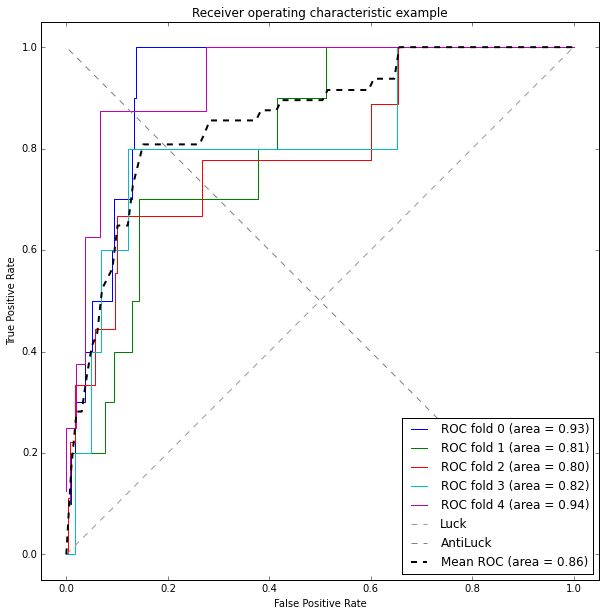

In [110]:
mean_tpr = 0.0
mean_fpr = np.linspace(0, 1, 100)
all_tpr = []

plt.figure(figsize=(10,10))

for i, (train, test) in enumerate(cv):
    probas_ = classifier.fit(X_sas_best.ix[train], y_sas_train.ix[train]).predict_proba(X_sas_best.ix[test])
    # Compute ROC curve and area the curve
    fpr, tpr, thresholds = roc_curve(y_sas_train.ix[test], probas_[:, 1])
    mean_tpr += interp(mean_fpr, fpr, tpr)
    mean_tpr[0] = 0.0
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw=1, label='ROC fold %d (area = %0.2f)' % (i, roc_auc))

plt.plot([0, 1], [0, 1], '--', color=(0.6, 0.6, 0.6), label='Luck')
plt.plot([1, 0], [0, 1], '--', color=(.5,.5,.5), label='AntiLuck')

mean_tpr /= len(cv)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
sas_best_thresh = thresholds[np.argmax(mean_tpr - mean_fpr)]
plt.plot(mean_fpr, mean_tpr, 'k--',
         label='Mean ROC (area = %0.2f)' % mean_auc, lw=2)

plt.xlim([-0.05, 1.05])
plt.ylim([-0.05, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic example')
plt.legend(loc="lower right")

In [111]:
X_sas_test = pd.DataFrame(sas_scale_fit.transform(X_sas_test).transpose()[best_sas_cols].transpose(), columns = X_sas_test.columns[best_sas_cols])

In [112]:
sas_probas = classifier.fit(X_sas_best, y_sas_train).predict_proba(X_sas_test)
X_sas_pred = []
for row in sas_probas:
    if row[1] > sas_best_thresh:
        X_sas_pred.append(1)
    else:
        X_sas_pred.append(0)

In [114]:
1 - 1.0*np.sum(y_sas_test)/len(y_sas_test)

0.9553398058252427

In [115]:
accuracy_score(X_sas_pred, y_sas_test)

0.89320388349514568

In [116]:
precision_score(X_sas_pred, y_sas_test)

0.30434782608695654

In [117]:
recall_score(X_sas_pred, y_sas_test)

0.15217391304347827

In [118]:
f1_score(X_sas_pred, y_sas_test)

0.20289855072463769

# GOVERNORS BALL MUSIC FESTIVAL

In [119]:
y_gba, X_gba = df.gba_2015, df.ix[:, 'fans':'noi_counts']
X_gba_train, X_gba_test, y_gba_train, y_gba_test = train_test_split(X_gba, y_gba, test_size = 0.25, random_state = 4444)
gba_scale_fit = StandardScaler().fit(X_gba_train)
X_gba_train_scaled = pd.DataFrame(gba_scale_fit.transform(X_gba_train), columns = X_gba_train.columns)
new_gba_features = SelectKBest(f_classif, k = 10)
X_gba_best = new_gba_features.fit_transform(X_gba_train_scaled, y_gba_train)
best_gba_cols = new_gba_features.get_support(True)
X_gba_best = pd.DataFrame(X_gba_best, columns = X_gba.columns[best_gba_cols])
X_gba.columns[best_gba_cols]

Index([u'fans', u'rank', u'2015_shows', u'2014_shows', u'familiarity',
       u'hotttnesss', u'rock', u'bon_counts', u'acl_counts', u'coa_counts'],
      dtype='object')

In [120]:
cw_range = [{1:1-cw, 0:cw} for cw in np.arange(.01, 1.0, .1)]
gamma_range = np.logspace(-9, 3, 9)
param_grid = dict(gamma=gamma_range, class_weight=cw_range)
cv = ShuffleSplit(len(y_gba_train), n_iter=5, test_size=0.2, random_state=42)
for score in ['accuracy','precision', 'recall']:
    grid = GridSearchCV(SVC(kernel = 'rbf'), param_grid=param_grid, cv=cv, scoring = score, verbose= 10)
    grid.fit(X_gba_best, y_gba_train)
    print("The best parameters are %s with a score of %0.2f"
          % (grid.best_params_, grid.best_score_))

Fitting 5 folds for each of 90 candidates, totalling 450 fits
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.035599 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032362 -   0.1s

[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.1s



[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.025890 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.016181 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.035599 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032362 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999

[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.5s



[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.016181 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.035599 -   0.1s
[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032362 -   0.1s
[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.025890 -   0.1s
[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.01618

[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    0.9s
[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    1.2s



[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.016181 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.035599 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032362 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.025890 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.01618

[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    1.7s
[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    2.2s



[CV] gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.025890 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.016181 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=31.6227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=31.6227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.035599 -   0.1s
[CV] gamma=31.6227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=31.6227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032362 -   0.1s
[CV] gamma=31.6227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=31.6227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.025890 -   0.1s


[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    2.8s
[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    3.1s



[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.977346 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.964401 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.967638 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.974110 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.983819 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-08, clas

[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    3.3s
[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    3.5s



[CV] gamma=0.0316227766017, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.974110 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.983819 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.977346 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.11, 1: 0.89000000000000001} .......
[CV]  gamma=1.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.964401 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.11, 1: 0.89000000000000001} .......
[CV]  gamma=1.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.967638 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.11, 1: 0.89000000000000001} .......
[CV]  gamma=1.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.9741

[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    4.5s
[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    4.9s



[CV]  gamma=3.16227766017e-08, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.974110 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.983819 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.977346 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=1e-06, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.964401 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=1e-06, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.967638 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]

[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    5.1s
[Parallel(n_jobs=1)]: Done 128 jobs       | elapsed:    5.8s



[CV] gamma=31.6227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=31.6227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.983819 -   0.1s
[CV] gamma=31.6227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=31.6227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.977346 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=1000.0, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.964401 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=1000.0, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.967638 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=1000.0, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.974110 -   0.1s
[CV] gamma=1000.0, class_w

[Parallel(n_jobs=1)]: Done 145 jobs       | elapsed:    6.4s
[Parallel(n_jobs=1)]: Done 162 jobs       | elapsed:    6.6s



[CV] gamma=0.0316227766017, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.967638 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.974110 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.983819 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.977346 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=1.0, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.9644

[Parallel(n_jobs=1)]: Done 181 jobs       | elapsed:    7.6s
[Parallel(n_jobs=1)]: Done 200 jobs       | elapsed:    7.8s



[CV] gamma=0.001, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=0.001, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.964401 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=0.001, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.967638 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=0.001, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.974110 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=0.001, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.983819 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=0.001, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.977346 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.41000000000000003

[Parallel(n_jobs=1)]: Done 221 jobs       | elapsed:    8.7s
[Parallel(n_jobs=1)]: Done 242 jobs       | elapsed:    9.1s



[CV] gamma=3.16227766017e-05, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.967638 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.974110 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.983819 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.977346 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=0.001, class_weight={0: 0.51000000000000001, 1: 0.489999999999

[Parallel(n_jobs=1)]: Done 265 jobs       | elapsed:    9.9s
[Parallel(n_jobs=1)]: Done 288 jobs       | elapsed:   10.3s



[CV] gamma=1e-06, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999} 
[CV]  gamma=1e-06, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999}, score=0.977346 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999}, score=0.964401 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999}, score=0.967638 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999}, score=0.974110 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999}, score=0.9838

[Parallel(n_jobs=1)]: Done 313 jobs       | elapsed:   11.2s
[Parallel(n_jobs=1)]: Done 338 jobs       | elapsed:   11.5s



[CV] gamma=0.001, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=0.001, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.967638 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=0.001, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.974110 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=0.001, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.983819 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=0.001, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.977346 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.964401 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0:

[Parallel(n_jobs=1)]: Done 365 jobs       | elapsed:   12.4s
[Parallel(n_jobs=1)]: Done 392 jobs       | elapsed:   12.8s



[CV] gamma=1.0, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1.0, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.974110 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1.0, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.983819 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1.0, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.977346 -   0.0s
[CV] gamma=31.6227766017, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=31.6227766017, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.964401 -   0.1s
[CV] gamma=31.6227766017, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=31.6227766017, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.967638 -   0.1s
[CV] gamma=31.6227766017, class_weight={0: 0

[Parallel(n_jobs=1)]: Done 421 jobs       | elapsed:   13.6s
[Parallel(n_jobs=1)]: Done 450 jobs       | elapsed:   14.5s



[CV] gamma=1000.0, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969} 
[CV]  gamma=1000.0, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969}, score=0.977346 -   0.0s
The best parameters are {'gamma': 1.0000000000000001e-09, 'class_weight': {0: 0.11, 1: 0.89000000000000001}} with a score of 0.97
Fitting 5 folds for each of 90 candidates, totalling 450 fits
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.035599 -   0.1s

[Parallel(n_jobs=1)]: Done 450 out of 450 | elapsed:   14.5s finished
[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.1s



[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032362 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.025890 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.016181 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s

[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.3s



[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.035599 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032362 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.025890 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.016181 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, clas

[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.5s
[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    0.9s



[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.016181 -   0.1s
[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.035599 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032362 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.025890 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 

[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    1.2s
[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    1.7s



[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.037037 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.035398 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.025890 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.016181 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=1.0, class_weight={0: 0.01, 1: 

[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    2.1s
[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    2.8s



[CV] gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032362 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.025890 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.016181 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class

[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    3.2s
[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    3.4s



[CV] gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=0.001, clas

[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    3.6s
[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    4.5s



[CV] gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001} ....
[CV]  gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001} ....
[CV]  gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001} ....
[CV]  gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001} ....
[CV]  gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001} ....
[CV]  gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=1e-09, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.

[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    4.8s
[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    5.0s



[CV] gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.0s
[CV]

[Parallel(n_jobs=1)]: Done 128 jobs       | elapsed:    5.7s
[Parallel(n_jobs=1)]: Done 145 jobs       | elapsed:    6.3s



[CV] gamma=3.16227766017e-08, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.689999999999

[Parallel(n_jobs=1)]: Done 162 jobs       | elapsed:    6.5s
[Parallel(n_jobs=1)]: Done 181 jobs       | elapsed:    7.5s



[CV] gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.410000000000000

[Parallel(n_jobs=1)]: Done 200 jobs       | elapsed:    7.7s
[Parallel(n_jobs=1)]: Done 221 jobs       | elapsed:    8.5s



[CV] gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1e-09, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.51000000000000001, 

[Parallel(n_jobs=1)]: Done 242 jobs       | elapsed:    8.9s
[Parallel(n_jobs=1)]: Done 265 jobs       | elapsed:    9.7s



[CV] gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.0s
[CV] gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.6100000000000001,

[Parallel(n_jobs=1)]: Done 288 jobs       | elapsed:   10.1s
[Parallel(n_jobs=1)]: Done 313 jobs       | elapsed:   11.1s



[CV] gamma=1000.0, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999}, score=0.000000 -   0.0s
[CV] gamma=1000.0, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999}, score=0.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.2899999

[Parallel(n_jobs=1)]: Done 338 jobs       | elapsed:   11.4s
[Parallel(n_jobs=1)]: Done 365 jobs       | elapsed:   12.4s



[CV] gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.810000000000000

[Parallel(n_jobs=1)]: Done 392 jobs       | elapsed:   12.7s
[Parallel(n_jobs=1)]: Done 421 jobs       | elapsed:   13.6s



[CV] gamma=1e-06, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969} 
[CV]  gamma=1e-06, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089

[Parallel(n_jobs=1)]: Done 450 jobs       | elapsed:   14.6s
[Parallel(n_jobs=1)]: Done 450 out of 450 | elapsed:   14.6s finished
[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.1s



[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s

[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.3s



[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, clas

[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.6s
[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    0.9s



[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 

[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    1.2s
[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    1.7s



[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.800000 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=1.0, class_weight={0: 0.01, 1: 

[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    2.4s
[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    3.1s



[CV] gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.0s
[CV] gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.0s
[CV] gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.0s
[CV] gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1e-09, clas

[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    3.4s
[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    3.7s



[CV] gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=0.001, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=0.001, class_weight={0: 0.11, 

[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    3.9s
[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    4.7s



[CV] gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001} ....
[CV]  gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001} ....
[CV]  gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001} ....
[CV]  gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001} ....
[CV]  gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001} ....
[CV]  gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=1e-09, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.

[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    5.1s
[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    5.3s



[CV] gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.21000000000000002

[Parallel(n_jobs=1)]: Done 128 jobs       | elapsed:    6.0s
[Parallel(n_jobs=1)]: Done 145 jobs       | elapsed:    6.5s



[CV] gamma=3.16227766017e-08, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.689999999999

[Parallel(n_jobs=1)]: Done 162 jobs       | elapsed:    6.7s
[Parallel(n_jobs=1)]: Done 181 jobs       | elapsed:    7.7s



[CV] gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.410000000000000

[Parallel(n_jobs=1)]: Done 200 jobs       | elapsed:    7.9s
[Parallel(n_jobs=1)]: Done 221 jobs       | elapsed:    8.8s



[CV] gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.51000000000000001

[Parallel(n_jobs=1)]: Done 242 jobs       | elapsed:    9.2s
[Parallel(n_jobs=1)]: Done 265 jobs       | elapsed:   10.0s



[CV] gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.0s
[CV] gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.0s
[CV] gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.6100000000000001,

[Parallel(n_jobs=1)]: Done 288 jobs       | elapsed:   10.4s
[Parallel(n_jobs=1)]: Done 313 jobs       | elapsed:   11.4s



[CV] gamma=1000.0, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999}, score=0.000000 -   0.0s
[CV] gamma=1000.0, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999}, score=0.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.2899999

[Parallel(n_jobs=1)]: Done 338 jobs       | elapsed:   11.8s
[Parallel(n_jobs=1)]: Done 365 jobs       | elapsed:   12.9s



[CV] gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.810000000000000

[Parallel(n_jobs=1)]: Done 392 jobs       | elapsed:   13.3s
[Parallel(n_jobs=1)]: Done 421 jobs       | elapsed:   14.2s



[CV] gamma=1e-06, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969} 
[CV]  gamma=1e-06, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969} 
[CV]  gamma=1e-06, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969} 
[CV]  gamma=1e-06, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969} 
[CV]  gamma=1e-06, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, 

[Parallel(n_jobs=1)]: Done 450 jobs       | elapsed:   15.2s
[Parallel(n_jobs=1)]: Done 450 out of 450 | elapsed:   15.2s finished


The best parameters are {'gamma': 1.0e-09, 'class_weight': {0: 0.11, 1: 0.89}} with an accuracy score of 0.97.

The best parameters are {'gamma': 0.03162, 'class_weight': {0: 0.01, 1: 0.99}} with a precision score of 0.03.

The best parameters are {'gamma': 1.0e-09, 'class_weight': {0: 0.01, 1: 0.99}} with a recall score of 1.00.

In [121]:
cw_range = [{1:1-cw, 0:cw} for cw in np.arange(.01, .15, .01)]
gamma_range = np.logspace(-9, -1, 9)
param_grid = dict(gamma=gamma_range, class_weight=cw_range)
cv = ShuffleSplit(len(y_gba_train), n_iter=5, test_size=0.2, random_state=42)
for score in ['accuracy','precision', 'recall']:
    grid = GridSearchCV(SVC(kernel = 'rbf'), param_grid=param_grid, cv=cv, scoring = score, verbose= 10)
    grid.fit(X_gba_best, y_gba_train)
    print("The best parameters are %s with a score of %0.2f"
          % (grid.best_params_, grid.best_score_))

Fitting 5 folds for each of 126 candidates, totalling 630 fits
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.035599 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032362 -   0.1s

[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.1s



[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.025890 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.016181 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=1e-08, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.035599 -   0.1s
[CV] gamma=1e-08, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032362 -   0.1s
[CV] gamma=1e-08, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.025890 -   0.1s

[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.5s



[CV] gamma=1e-08, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.016181 -   0.1s
[CV] gamma=1e-08, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=1e-07, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-07, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.035599 -   0.1s
[CV] gamma=1e-07, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-07, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032362 -   0.1s
[CV] gamma=1e-07, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-07, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.025890 -   0.1s
[CV] gamma=1e-07, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-07, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.016181 -   0.1s
[CV] gamma=1e-07, class_wei

[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    0.9s
[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    1.2s



[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.016181 -   0.1s
[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.035599 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032362 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.025890 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.016181 -   0.1s
[CV] gamma=1e-05, class_wei

[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    1.6s
[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    2.1s



[CV] gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.025890 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.016181 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999} ......
[CV]  gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.035599 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999} ......
[CV]  gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032362 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999} ......
[CV]  gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.025890 -   0.1s
[CV] gamma=0.01, class_weight=

[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    2.7s
[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    3.3s



[CV] gamma=1e-08, class_weight={0: 0.02, 1: 0.97999999999999998} .....
[CV]  gamma=1e-08, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.035599 -   0.1s
[CV] gamma=1e-08, class_weight={0: 0.02, 1: 0.97999999999999998} .....
[CV]  gamma=1e-08, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.032362 -   0.1s
[CV] gamma=1e-08, class_weight={0: 0.02, 1: 0.97999999999999998} .....
[CV]  gamma=1e-08, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.025890 -   0.1s
[CV] gamma=1e-08, class_weight={0: 0.02, 1: 0.97999999999999998} .....
[CV]  gamma=1e-08, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.016181 -   0.1s
[CV] gamma=1e-08, class_weight={0: 0.02, 1: 0.97999999999999998} .....
[CV]  gamma=1e-08, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.022654 -   0.1s
[CV] gamma=1e-07, class_weight={0: 0.02, 1: 0.97999999999999998} .....
[CV]  gamma=1e-07, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.035599 -   0.1s
[CV] gamma=1e-07, class_wei

[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    4.0s
[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    4.8s



[CV] gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998} ....
[CV]  gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.025890 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998} ....
[CV]  gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.016181 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998} ....
[CV]  gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.022654 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.02, 1: 0.97999999999999998} .....
[CV]  gamma=0.001, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.035599 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.02, 1: 0.97999999999999998} .....
[CV]  gamma=0.001, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.032362 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.02, 1: 0.97999999999999998} .....
[CV]  gamma=0.001, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.025890 -   0.1s
[CV] gamma=0.001, class_

[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    5.6s
[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    6.4s



[CV] gamma=1e-08, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=1e-08, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.983819 -   0.1s
[CV] gamma=1e-08, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=1e-08, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.977346 -   0.1s
[CV] gamma=1e-07, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=1e-07, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.964401 -   0.1s
[CV] gamma=1e-07, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=1e-07, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.967638 -   0.1s
[CV] gamma=1e-07, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=1e-07, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.974110 -   0.1s
[CV] gamma=1e-07, class_weight={0: 0.02999999999999999

[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    7.3s
[Parallel(n_jobs=1)]: Done 128 jobs       | elapsed:    8.1s



[CV] gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.741100 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.834951 -   0.1s
[CV] gamma=0.1, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.1, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.857605 -   0.1s
[CV] gamma=0.1, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.1, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.760518 -   0.1s
[CV] gamma=0.1, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.1, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.805825 -   0.1s
[CV] gamma=0.1, class_weight={0: 0.029999999999999999, 1: 0.9699999999

[Parallel(n_jobs=1)]: Done 145 jobs       | elapsed:    9.0s
[Parallel(n_jobs=1)]: Done 162 jobs       | elapsed:    9.7s



[CV] gamma=0.0001, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.0001, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.974110 -   0.0s
[CV] gamma=0.0001, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.0001, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.983819 -   0.0s
[CV] gamma=0.0001, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.0001, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.977346 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.001, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.964401 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.001, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.967638 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.04000000000

[Parallel(n_jobs=1)]: Done 181 jobs       | elapsed:   10.5s
[Parallel(n_jobs=1)]: Done 200 jobs       | elapsed:   11.3s



[CV] gamma=1e-05, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=1e-05, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996}, score=0.964401 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=1e-05, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996}, score=0.967638 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=1e-05, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996}, score=0.974110 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=1e-05, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996}, score=0.983819 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=1e-05, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996}, score=0.977346 -   0.0s
[CV] gamma=0.0001, class_weight={0: 0.0500000000000000

[Parallel(n_jobs=1)]: Done 221 jobs       | elapsed:   12.2s
[Parallel(n_jobs=1)]: Done 242 jobs       | elapsed:   13.0s



[CV] gamma=1e-06, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=1e-06, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995}, score=0.974110 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=1e-06, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995}, score=0.983819 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=1e-06, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995}, score=0.977346 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=1e-05, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995}, score=0.964401 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=1e-05, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995}, score=0.967638 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.06000000000000000

[Parallel(n_jobs=1)]: Done 265 jobs       | elapsed:   13.8s
[Parallel(n_jobs=1)]: Done 288 jobs       | elapsed:   14.6s



[CV] gamma=1e-06, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=1e-06, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005}, score=0.974110 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=1e-06, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005}, score=0.983819 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=1e-06, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005}, score=0.977346 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=1e-05, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005}, score=0.964401 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=1e-05, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005}, score=0.967638 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.06999999999999999

[Parallel(n_jobs=1)]: Done 313 jobs       | elapsed:   15.6s
[Parallel(n_jobs=1)]: Done 338 jobs       | elapsed:   16.3s



[CV] gamma=1e-05, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=1e-05, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.983819 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=1e-05, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.977346 -   0.0s
[CV] gamma=0.0001, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=0.0001, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.964401 -   0.0s
[CV] gamma=0.0001, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=0.0001, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.967638 -   0.0s
[CV] gamma=0.0001, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=0.0001, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.974110 -   0.0s
[CV] gamma=0.0001, class_weight={0: 0.0800000000

[Parallel(n_jobs=1)]: Done 365 jobs       | elapsed:   17.1s
[Parallel(n_jobs=1)]: Done 392 jobs       | elapsed:   17.7s



[CV] gamma=0.001, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.001, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003}, score=0.964401 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.001, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003}, score=0.967638 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.001, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003}, score=0.974110 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.001, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003}, score=0.983819 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.001, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003}, score=0.977346 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.089999999999999997

[Parallel(n_jobs=1)]: Done 421 jobs       | elapsed:   18.3s
[Parallel(n_jobs=1)]: Done 450 jobs       | elapsed:   18.9s



[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.964401 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.967638 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.974110 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.983819 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.977346 -   0.0s
[CV] gamma=1e-08, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-08, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.964401 -   0.0s
[CV] gamma=1e-08, class_wei

[Parallel(n_jobs=1)]: Done 481 jobs       | elapsed:   19.8s
[Parallel(n_jobs=1)]: Done 512 jobs       | elapsed:   21.0s



[CV] gamma=1e-06, class_weight={0: 0.12, 1: 0.88} ....................
[CV]  gamma=1e-06, class_weight={0: 0.12, 1: 0.88}, score=0.974110 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.12, 1: 0.88} ....................
[CV]  gamma=1e-06, class_weight={0: 0.12, 1: 0.88}, score=0.983819 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.12, 1: 0.88} ....................
[CV]  gamma=1e-06, class_weight={0: 0.12, 1: 0.88}, score=0.977346 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.12, 1: 0.88} ....................
[CV]  gamma=1e-05, class_weight={0: 0.12, 1: 0.88}, score=0.964401 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.12, 1: 0.88} ....................
[CV]  gamma=1e-05, class_weight={0: 0.12, 1: 0.88}, score=0.967638 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.12, 1: 0.88} ....................
[CV]  gamma=1e-05, class_weight={0: 0.12, 1: 0.88}, score=0.974110 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.12, 1: 0.88} ....................
[CV]  gamma=1e-05, class_weight={0: 0.12, 1: 0

[Parallel(n_jobs=1)]: Done 545 jobs       | elapsed:   21.7s
[Parallel(n_jobs=1)]: Done 578 jobs       | elapsed:   22.8s



[CV] gamma=0.01, class_weight={0: 0.13, 1: 0.87} .....................
[CV]  gamma=0.01, class_weight={0: 0.13, 1: 0.87}, score=0.983819 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.13, 1: 0.87} .....................
[CV]  gamma=0.01, class_weight={0: 0.13, 1: 0.87}, score=0.977346 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.13, 1: 0.87} ......................
[CV]  gamma=0.1, class_weight={0: 0.13, 1: 0.87}, score=0.964401 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.13, 1: 0.87} ......................
[CV]  gamma=0.1, class_weight={0: 0.13, 1: 0.87}, score=0.967638 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.13, 1: 0.87} ......................
[CV]  gamma=0.1, class_weight={0: 0.13, 1: 0.87}, score=0.974110 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.13, 1: 0.87} ......................
[CV]  gamma=0.1, class_weight={0: 0.13, 1: 0.87}, score=0.983819 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.13, 1: 0.87} ......................
[CV]  gamma=0.1, class_weight={0: 0.13, 1: 0.87}, score=

[Parallel(n_jobs=1)]: Done 613 jobs       | elapsed:   23.6s
[Parallel(n_jobs=1)]: Done 630 out of 630 | elapsed:   24.0s finished



[CV] gamma=0.1, class_weight={0: 0.14000000000000001, 1: 0.85999999999999999} 
[CV]  gamma=0.1, class_weight={0: 0.14000000000000001, 1: 0.85999999999999999}, score=0.977346 -   0.0s
The best parameters are {'gamma': 1.0000000000000001e-09, 'class_weight': {0: 0.029999999999999999, 1: 0.96999999999999997}} with a score of 0.97
Fitting 5 folds for each of 126 candidates, totalling 630 fits
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.035599 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032362 -   0.1s

[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.2s



[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.025890 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.016181 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=1e-08, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.035599 -   0.1s
[CV] gamma=1e-08, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032362 -   0.1s
[CV] gamma=1e-08, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.025890 -   0.1s

[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.5s
[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.8s



[CV] gamma=1e-08, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.016181 -   0.1s
[CV] gamma=1e-08, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=1e-07, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-07, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.035599 -   0.1s
[CV] gamma=1e-07, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-07, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032362 -   0.1s
[CV] gamma=1e-07, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-07, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.025890 -   0.1s
[CV] gamma=1e-07, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-07, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.016181 -   0.1s
[CV] gamma=1e-07, class_wei

[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    1.2s
[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    1.7s



[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.016181 -   0.1s
[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.035599 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032362 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.025890 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.016181 -   0.1s
[CV] gamma=1e-05, class_wei

[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    2.3s
[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    2.9s



[CV] gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.025890 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.016181 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999} ......
[CV]  gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.035599 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999} ......
[CV]  gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032362 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999} ......
[CV]  gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.025890 -   0.1s
[CV] gamma=0.01, class_weight=

[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    3.7s
[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    4.5s



[CV] gamma=1e-08, class_weight={0: 0.02, 1: 0.97999999999999998} .....
[CV]  gamma=1e-08, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.035599 -   0.1s
[CV] gamma=1e-08, class_weight={0: 0.02, 1: 0.97999999999999998} .....
[CV]  gamma=1e-08, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.032362 -   0.1s
[CV] gamma=1e-08, class_weight={0: 0.02, 1: 0.97999999999999998} .....
[CV]  gamma=1e-08, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.025890 -   0.1s
[CV] gamma=1e-08, class_weight={0: 0.02, 1: 0.97999999999999998} .....
[CV]  gamma=1e-08, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.016181 -   0.1s
[CV] gamma=1e-08, class_weight={0: 0.02, 1: 0.97999999999999998} .....
[CV]  gamma=1e-08, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.022654 -   0.1s
[CV] gamma=1e-07, class_weight={0: 0.02, 1: 0.97999999999999998} .....
[CV]  gamma=1e-07, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.035599 -   0.1s
[CV] gamma=1e-07, class_wei

[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    5.4s
[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    6.5s



[CV] gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998} ....
[CV]  gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.025890 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998} ....
[CV]  gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.016181 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998} ....
[CV]  gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.022654 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.02, 1: 0.97999999999999998} .....
[CV]  gamma=0.001, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.035599 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.02, 1: 0.97999999999999998} .....
[CV]  gamma=0.001, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.032362 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.02, 1: 0.97999999999999998} .....
[CV]  gamma=0.001, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.025890 -   0.1s
[CV] gamma=0.001, class_

[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    7.4s
[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    8.1s



[CV] gamma=1e-08, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=1e-08, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.000000 -   0.1s
[CV] gamma=1e-08, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=1e-08, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.000000 -   0.1s
[CV] gamma=1e-07, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=1e-07, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.000000 -   0.1s
[CV] gamma=1e-07, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=1e-07, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.000000 -   0.1s
[CV] gamma=1e-07, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=1e-07, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.000000 -   0.1s
[CV] gamma=1e-07, class_weight={0: 0.02999999999999999

[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    9.0s
[Parallel(n_jobs=1)]: Done 128 jobs       | elapsed:    9.8s



[CV] gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.025316 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.092593 -   0.1s
[CV] gamma=0.1, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.1, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.076923 -   0.1s
[CV] gamma=0.1, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.1, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.042857 -   0.1s
[CV] gamma=0.1, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.1, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.093750 -   0.1s
[CV] gamma=0.1, class_weight={0: 0.029999999999999999, 1: 0.9699999999

[Parallel(n_jobs=1)]: Done 145 jobs       | elapsed:   10.8s
[Parallel(n_jobs=1)]: Done 162 jobs       | elapsed:   11.8s



[CV] gamma=0.0001, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.0001, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.000000 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.0001, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.000000 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.0001, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.000000 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.001, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.000000 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.001, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.000000 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.04000000000

[Parallel(n_jobs=1)]: Done 181 jobs       | elapsed:   12.8s
[Parallel(n_jobs=1)]: Done 200 jobs       | elapsed:   13.6s



[CV] gamma=1e-05, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=1e-05, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996}, score=0.000000 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=1e-05, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=1e-05, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=1e-05, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996}, score=0.000000 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=1e-05, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996}, score=0.000000 -   0.0s
[CV] gamma=0.0001, class_weight={0: 0.0500000000000000

[Parallel(n_jobs=1)]: Done 221 jobs       | elapsed:   14.6s
[Parallel(n_jobs=1)]: Done 242 jobs       | elapsed:   15.2s



[CV] gamma=1e-06, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=1e-06, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=1e-06, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=1e-06, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=1e-06, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=1e-05, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.06000000000000000

[Parallel(n_jobs=1)]: Done 265 jobs       | elapsed:   16.0s
[Parallel(n_jobs=1)]: Done 288 jobs       | elapsed:   16.6s



[CV] gamma=1e-06, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=1e-06, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=1e-06, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=1e-06, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=1e-05, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=1e-05, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.06999999999999999

[Parallel(n_jobs=1)]: Done 313 jobs       | elapsed:   17.4s
[Parallel(n_jobs=1)]: Done 338 jobs       | elapsed:   18.0s



[CV] gamma=1e-05, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=1e-05, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=1e-05, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=1e-05, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.0001, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=0.0001, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.0001, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=0.0001, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.0001, class_weight={0: 0.080000000000

[Parallel(n_jobs=1)]: Done 365 jobs       | elapsed:   18.8s
[Parallel(n_jobs=1)]: Done 392 jobs       | elapsed:   19.4s



[CV] gamma=0.001, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.001, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003}, score=0.000000 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.001, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003}, score=0.000000 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.001, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.01, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.01, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.089999999999999997, 1:

[Parallel(n_jobs=1)]: Done 421 jobs       | elapsed:   20.1s
[Parallel(n_jobs=1)]: Done 450 jobs       | elapsed:   20.7s



[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1e-08, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-08, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1e-08, class_wei

[Parallel(n_jobs=1)]: Done 481 jobs       | elapsed:   21.3s
[Parallel(n_jobs=1)]: Done 512 jobs       | elapsed:   21.9s



[CV] gamma=1e-06, class_weight={0: 0.12, 1: 0.88} ....................
[CV]  gamma=1e-06, class_weight={0: 0.12, 1: 0.88}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.12, 1: 0.88} ....................
[CV]  gamma=1e-06, class_weight={0: 0.12, 1: 0.88}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.12, 1: 0.88} ....................
[CV]  gamma=1e-06, class_weight={0: 0.12, 1: 0.88}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.12, 1: 0.88} ....................
[CV]  gamma=1e-05, class_weight={0: 0.12, 1: 0.88}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.12, 1: 0.88} ....................
[CV]  gamma=1e-05, class_weight={0: 0.12, 1: 0.88}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.12, 1: 0.88} ....................
[CV]  gamma=1e-05, class_weight={0: 0.12, 1: 0.88}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.12, 1: 0.88} ....................
[CV]  gamma=1e-05, class_weight={0: 0.12, 1: 0

[Parallel(n_jobs=1)]: Done 545 jobs       | elapsed:   22.6s
[Parallel(n_jobs=1)]: Done 578 jobs       | elapsed:   23.2s



[CV] gamma=0.01, class_weight={0: 0.13, 1: 0.87} .....................
[CV]  gamma=0.01, class_weight={0: 0.13, 1: 0.87}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.13, 1: 0.87} .....................
[CV]  gamma=0.01, class_weight={0: 0.13, 1: 0.87}, score=0.000000 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.13, 1: 0.87} ......................
[CV]  gamma=0.1, class_weight={0: 0.13, 1: 0.87}, score=0.000000 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.13, 1: 0.87} ......................
[CV]  gamma=0.1, class_weight={0: 0.13, 1: 0.87}, score=0.000000 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.13, 1: 0.87} ......................
[CV]  gamma=0.1, class_weight={0: 0.13, 1: 0.87}, score=0.000000 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.13, 1: 0.87} ......................
[CV]  gamma=0.1, class_weight={0: 0.13, 1: 0.87}, score=0.000000 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.13, 1: 0.87} ......................
[CV]  gamma=0.1, class_weight={0: 0.13, 1: 0.87}, score=

[Parallel(n_jobs=1)]: Done 613 jobs       | elapsed:   23.8s
[Parallel(n_jobs=1)]: Done 630 out of 630 | elapsed:   24.2s finished



The best parameters are {'gamma': 0.01, 'class_weight': {0: 0.040000000000000001, 1: 0.95999999999999996}} with a score of 0.13
Fitting 5 folds for each of 126 candidates, totalling 630 fits
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s

[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.1s



[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-08, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-08, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-08, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s

[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.5s



[CV] gamma=1e-08, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-08, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-07, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-07, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-07, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-07, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-07, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-07, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-07, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-07, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-07, class_wei

[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    0.9s
[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    1.2s



[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-05, class_wei

[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    1.6s
[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    2.0s



[CV] gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999} ......
[CV]  gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999} ......
[CV]  gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999} ......
[CV]  gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.01, class_weight=

[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    2.7s
[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    3.3s



[CV] gamma=1e-08, class_weight={0: 0.02, 1: 0.97999999999999998} .....
[CV]  gamma=1e-08, class_weight={0: 0.02, 1: 0.97999999999999998}, score=1.000000 -   0.1s
[CV] gamma=1e-08, class_weight={0: 0.02, 1: 0.97999999999999998} .....
[CV]  gamma=1e-08, class_weight={0: 0.02, 1: 0.97999999999999998}, score=1.000000 -   0.1s
[CV] gamma=1e-08, class_weight={0: 0.02, 1: 0.97999999999999998} .....
[CV]  gamma=1e-08, class_weight={0: 0.02, 1: 0.97999999999999998}, score=1.000000 -   0.1s
[CV] gamma=1e-08, class_weight={0: 0.02, 1: 0.97999999999999998} .....
[CV]  gamma=1e-08, class_weight={0: 0.02, 1: 0.97999999999999998}, score=1.000000 -   0.1s
[CV] gamma=1e-08, class_weight={0: 0.02, 1: 0.97999999999999998} .....
[CV]  gamma=1e-08, class_weight={0: 0.02, 1: 0.97999999999999998}, score=1.000000 -   0.1s
[CV] gamma=1e-07, class_weight={0: 0.02, 1: 0.97999999999999998} .....
[CV]  gamma=1e-07, class_weight={0: 0.02, 1: 0.97999999999999998}, score=1.000000 -   0.1s
[CV] gamma=1e-07, class_wei

[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    4.0s
[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    4.9s



[CV] gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998} ....
[CV]  gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998}, score=1.000000 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998} ....
[CV]  gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998}, score=1.000000 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998} ....
[CV]  gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998}, score=1.000000 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.02, 1: 0.97999999999999998} .....
[CV]  gamma=0.001, class_weight={0: 0.02, 1: 0.97999999999999998}, score=1.000000 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.02, 1: 0.97999999999999998} .....
[CV]  gamma=0.001, class_weight={0: 0.02, 1: 0.97999999999999998}, score=1.000000 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.02, 1: 0.97999999999999998} .....
[CV]  gamma=0.001, class_weight={0: 0.02, 1: 0.97999999999999998}, score=1.000000 -   0.1s
[CV] gamma=0.001, class_

[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    5.8s
[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    6.6s



[CV] gamma=1e-08, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=1e-08, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.000000 -   0.1s
[CV] gamma=1e-08, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=1e-08, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.000000 -   0.1s
[CV] gamma=1e-07, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=1e-07, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.000000 -   0.1s
[CV] gamma=1e-07, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=1e-07, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.000000 -   0.1s
[CV] gamma=1e-07, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=1e-07, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.000000 -   0.1s
[CV] gamma=1e-07, class_weight={0: 0.02999999999999999

[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    7.6s
[Parallel(n_jobs=1)]: Done 128 jobs       | elapsed:    8.5s



[CV] gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.625000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.400000 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.714286 -   0.1s
[CV] gamma=0.1, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.1, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.272727 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.1, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.300000 -   0.1s
[CV] gamma=0.1, class_weight={0: 0.029999999999999999, 1: 0.96999999

[Parallel(n_jobs=1)]: Done 145 jobs       | elapsed:    9.4s
[Parallel(n_jobs=1)]: Done 162 jobs       | elapsed:   10.1s



[CV] gamma=0.0001, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.0001, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.000000 -   0.0s
[CV] gamma=0.0001, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.0001, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.000000 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.0001, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.000000 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.001, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.000000 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.001, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.000000 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.04000000000

[Parallel(n_jobs=1)]: Done 181 jobs       | elapsed:   11.1s
[Parallel(n_jobs=1)]: Done 200 jobs       | elapsed:   11.8s



[CV] gamma=1e-06, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=1e-06, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=1e-05, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=1e-05, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=1e-05, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=1e-05, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.05000000000000000

[Parallel(n_jobs=1)]: Done 221 jobs       | elapsed:   12.6s
[Parallel(n_jobs=1)]: Done 242 jobs       | elapsed:   13.3s



[CV] gamma=1e-06, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=1e-06, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=1e-06, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=1e-06, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=1e-06, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=1e-05, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.06000000000000000

[Parallel(n_jobs=1)]: Done 265 jobs       | elapsed:   14.1s
[Parallel(n_jobs=1)]: Done 288 jobs       | elapsed:   14.8s



[CV] gamma=1e-06, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=1e-06, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=1e-06, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=1e-06, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=1e-05, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=1e-05, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.06999999999999999

[Parallel(n_jobs=1)]: Done 313 jobs       | elapsed:   15.6s
[Parallel(n_jobs=1)]: Done 338 jobs       | elapsed:   16.3s



[CV] gamma=1e-05, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=1e-05, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=1e-05, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.0001, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=0.0001, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.0001, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=0.0001, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.0001, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=0.0001, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.0001, class_weight={0: 0.0800000000

[Parallel(n_jobs=1)]: Done 365 jobs       | elapsed:   17.0s
[Parallel(n_jobs=1)]: Done 392 jobs       | elapsed:   17.5s



[CV] gamma=0.001, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.001, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003}, score=0.000000 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.001, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003}, score=0.000000 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.001, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003}, score=0.000000 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.001, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003}, score=0.000000 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.001, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.089999999999999997

[Parallel(n_jobs=1)]: Done 421 jobs       | elapsed:   18.3s
[Parallel(n_jobs=1)]: Done 450 jobs       | elapsed:   19.0s



[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1e-08, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-08, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1e-08, class_wei

[Parallel(n_jobs=1)]: Done 481 jobs       | elapsed:   19.6s
[Parallel(n_jobs=1)]: Done 512 jobs       | elapsed:   20.2s



[CV] gamma=1e-06, class_weight={0: 0.12, 1: 0.88} ....................
[CV]  gamma=1e-06, class_weight={0: 0.12, 1: 0.88}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.12, 1: 0.88} ....................
[CV]  gamma=1e-06, class_weight={0: 0.12, 1: 0.88}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.12, 1: 0.88} ....................
[CV]  gamma=1e-06, class_weight={0: 0.12, 1: 0.88}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.12, 1: 0.88} ....................
[CV]  gamma=1e-05, class_weight={0: 0.12, 1: 0.88}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.12, 1: 0.88} ....................
[CV]  gamma=1e-05, class_weight={0: 0.12, 1: 0.88}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.12, 1: 0.88} ....................
[CV]  gamma=1e-05, class_weight={0: 0.12, 1: 0.88}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.12, 1: 0.88} ....................
[CV]  gamma=1e-05, class_weight={0: 0.12, 1: 0

[Parallel(n_jobs=1)]: Done 545 jobs       | elapsed:   20.8s
[Parallel(n_jobs=1)]: Done 578 jobs       | elapsed:   21.4s



[CV] gamma=0.01, class_weight={0: 0.13, 1: 0.87} .....................
[CV]  gamma=0.01, class_weight={0: 0.13, 1: 0.87}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.13, 1: 0.87} .....................
[CV]  gamma=0.01, class_weight={0: 0.13, 1: 0.87}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.13, 1: 0.87} .....................
[CV]  gamma=0.01, class_weight={0: 0.13, 1: 0.87}, score=0.000000 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.13, 1: 0.87} ......................
[CV]  gamma=0.1, class_weight={0: 0.13, 1: 0.87}, score=0.000000 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.13, 1: 0.87} ......................
[CV]  gamma=0.1, class_weight={0: 0.13, 1: 0.87}, score=0.000000 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.13, 1: 0.87} ......................
[CV]  gamma=0.1, class_weight={0: 0.13, 1: 0.87}, score=0.000000 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.13, 1: 0.87} ......................
[CV]  gamma=0.1, class_weight={0: 0.13, 1: 0.87}, score

[Parallel(n_jobs=1)]: Done 613 jobs       | elapsed:   22.0s
[Parallel(n_jobs=1)]: Done 630 out of 630 | elapsed:   22.4s finished



[CV] gamma=0.1, class_weight={0: 0.14000000000000001, 1: 0.85999999999999999} 
[CV]  gamma=0.1, class_weight={0: 0.14000000000000001, 1: 0.85999999999999999}, score=0.000000 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.14000000000000001, 1: 0.85999999999999999} 
[CV]  gamma=0.1, class_weight={0: 0.14000000000000001, 1: 0.85999999999999999}, score=0.000000 -   0.0s
The best parameters are {'gamma': 1.0000000000000001e-09, 'class_weight': {0: 0.01, 1: 0.98999999999999999}} with a score of 1.00


The best parameters are {'gamma': 1.0e-09, 'class_weight': {0: 0.03, 1: 0.97}} with an accuracy score of 0.97.

The best parameters are {'gamma': 0.01, 'class_weight': {0: 0.04, 1: 0.96}} with a precision score of 0.13.

The best parameters are {'gamma': 1.0e-09, 'class_weight': {0: 0.01, 1: 0.99}} with a recall score of 1.00.

In [122]:
cw_range = [{1:1-cw, 0:cw} for cw in np.arange(.01, .04, .005)]
gamma_range = np.logspace(-3, -1, 9)
param_grid = dict(gamma=gamma_range, class_weight=cw_range)
cv = ShuffleSplit(len(y_gba_train), n_iter=5, test_size=0.2, random_state=42)
for score in ['accuracy','precision', 'recall']:
    grid = GridSearchCV(SVC(kernel = 'rbf'), param_grid=param_grid, cv=cv, scoring = score, verbose= 10)
    grid.fit(X_gba_best, y_gba_train)
    print("The best parameters are %s with a score of %0.2f"
          % (grid.best_params_, grid.best_score_))

Fitting 5 folds for each of 54 candidates, totalling 270 fits
[CV] gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.035599 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032362 -   0.1s

[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.1s



[CV] gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.025890 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.016181 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=0.00177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.00177827941004, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.035599 -   0.1s
[CV] gamma=0.00177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.00177827941004, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032362 -   0.1s
[CV] gamma=0.00177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.00177827941004, class_weight={0: 0.01, 1: 0.98999999999999999}, 

[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.6s



[CV] gamma=0.00177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.00177827941004, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.016181 -   0.1s
[CV] gamma=0.00177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.00177827941004, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.035599 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032362 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.025890 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0031622776601

[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    0.9s
[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    1.2s



[CV] gamma=0.0056234132519, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0056234132519, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.016181 -   0.1s
[CV] gamma=0.0056234132519, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0056234132519, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999} ......
[CV]  gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.035599 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999} ......
[CV]  gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032362 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999} ......
[CV]  gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.025890 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999} ......
[CV]  gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.016181 -   0.1s
[

[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    1.7s
[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    2.1s



[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.025890 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.016181 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.239482 -   0.1s
[CV] gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.368932 -   0.1s
[CV] gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.056234132519, class_weight={0

[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    2.7s
[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    3.3s



[CV] gamma=0.00177827941004, class_weight={0: 0.014999999999999999, 1: 0.98499999999999999} 
[CV]  gamma=0.00177827941004, class_weight={0: 0.014999999999999999, 1: 0.98499999999999999}, score=0.035599 -   0.1s
[CV] gamma=0.00177827941004, class_weight={0: 0.014999999999999999, 1: 0.98499999999999999} 
[CV]  gamma=0.00177827941004, class_weight={0: 0.014999999999999999, 1: 0.98499999999999999}, score=0.032362 -   0.1s
[CV] gamma=0.00177827941004, class_weight={0: 0.014999999999999999, 1: 0.98499999999999999} 
[CV]  gamma=0.00177827941004, class_weight={0: 0.014999999999999999, 1: 0.98499999999999999}, score=0.025890 -   0.1s
[CV] gamma=0.00177827941004, class_weight={0: 0.014999999999999999, 1: 0.98499999999999999} 
[CV]  gamma=0.00177827941004, class_weight={0: 0.014999999999999999, 1: 0.98499999999999999}, score=0.016181 -   0.1s
[CV] gamma=0.00177827941004, class_weight={0: 0.014999999999999999, 1: 0.98499999999999999} 
[CV]  gamma=0.00177827941004, class_weight={0: 0.0149999999999

[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    4.0s
[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    4.7s



[CV] gamma=0.0177827941004, class_weight={0: 0.014999999999999999, 1: 0.98499999999999999} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.014999999999999999, 1: 0.98499999999999999}, score=0.300971 -   0.1s
[CV] gamma=0.0177827941004, class_weight={0: 0.014999999999999999, 1: 0.98499999999999999} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.014999999999999999, 1: 0.98499999999999999}, score=0.307443 -   0.1s
[CV] gamma=0.0177827941004, class_weight={0: 0.014999999999999999, 1: 0.98499999999999999} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.014999999999999999, 1: 0.98499999999999999}, score=0.155340 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.014999999999999999, 1: 0.98499999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.014999999999999999, 1: 0.98499999999999999}, score=0.553398 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.014999999999999999, 1: 0.98499999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.014999999999999999, 1: 

[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    5.6s
[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    6.5s



[CV] gamma=0.00177827941004, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998} 
[CV]  gamma=0.00177827941004, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998}, score=0.016181 -   0.1s
[CV] gamma=0.00177827941004, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998} 
[CV]  gamma=0.00177827941004, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998}, score=0.022654 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998}, score=0.200647 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998}, score=0.262136 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.0199999999999

[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    7.6s
[Parallel(n_jobs=1)]: Done 128 jobs       | elapsed:    8.8s



[CV] gamma=0.056234132519, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998} 
[CV]  gamma=0.056234132519, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998}, score=0.540453 -   0.1s
[CV] gamma=0.056234132519, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998} 
[CV]  gamma=0.056234132519, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998}, score=0.621359 -   0.1s
[CV] gamma=0.1, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998} 
[CV]  gamma=0.1, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998}, score=0.741100 -   0.1s
[CV] gamma=0.1, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998} 
[CV]  gamma=0.1, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998}, score=0.673139 -   0.1s
[CV] gamma=0.1, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998} 
[CV]  gamma=0.1, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998}, score=0.621359 -   0.1s
[CV] gamma=0.1, class_weight={

[Parallel(n_jobs=1)]: Done 145 jobs       | elapsed:   10.3s
[Parallel(n_jobs=1)]: Done 162 jobs       | elapsed:   11.6s



[CV] gamma=0.0177827941004, class_weight={0: 0.024999999999999998, 1: 0.97499999999999998} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.024999999999999998, 1: 0.97499999999999998}, score=0.728155 -   0.1s
[CV] gamma=0.0177827941004, class_weight={0: 0.024999999999999998, 1: 0.97499999999999998} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.024999999999999998, 1: 0.97499999999999998}, score=0.676375 -   0.1s
[CV] gamma=0.0177827941004, class_weight={0: 0.024999999999999998, 1: 0.97499999999999998} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.024999999999999998, 1: 0.97499999999999998}, score=0.754045 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.024999999999999998, 1: 0.97499999999999998} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.024999999999999998, 1: 0.97499999999999998}, score=0.786408 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.024999999999999998, 1: 0.97499999999999998} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.024999999999999998, 1: 

[Parallel(n_jobs=1)]: Done 181 jobs       | elapsed:   12.8s
[Parallel(n_jobs=1)]: Done 200 jobs       | elapsed:   14.1s



[CV] gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.844660 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.779935 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.809061 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.741100 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.834951 -   0.1s
[CV] gamma=0.0177827941004, class_weight={0: 0.02999999999999999

[Parallel(n_jobs=1)]: Done 221 jobs       | elapsed:   15.6s
[Parallel(n_jobs=1)]: Done 242 jobs       | elapsed:   16.9s



[CV] gamma=0.0056234132519, class_weight={0: 0.034999999999999996, 1: 0.96499999999999997} 
[CV]  gamma=0.0056234132519, class_weight={0: 0.034999999999999996, 1: 0.96499999999999997}, score=0.899676 -   0.1s
[CV] gamma=0.0056234132519, class_weight={0: 0.034999999999999996, 1: 0.96499999999999997} 
[CV]  gamma=0.0056234132519, class_weight={0: 0.034999999999999996, 1: 0.96499999999999997}, score=0.834951 -   0.1s
[CV] gamma=0.0056234132519, class_weight={0: 0.034999999999999996, 1: 0.96499999999999997} 
[CV]  gamma=0.0056234132519, class_weight={0: 0.034999999999999996, 1: 0.96499999999999997}, score=0.899676 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.034999999999999996, 1: 0.96499999999999997} 
[CV]  gamma=0.01, class_weight={0: 0.034999999999999996, 1: 0.96499999999999997}, score=0.899676 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.034999999999999996, 1: 0.96499999999999997} 
[CV]  gamma=0.01, class_weight={0: 0.034999999999999996, 1: 0.96499999999999997}, score=0.831715 -   0.1

[Parallel(n_jobs=1)]: Done 265 jobs       | elapsed:   18.4s
[Parallel(n_jobs=1)]: Done 270 out of 270 | elapsed:   18.7s finished



The best parameters are {'gamma': 0.001, 'class_weight': {0: 0.029999999999999999, 1: 0.96999999999999997}} with a score of 0.97
Fitting 5 folds for each of 54 candidates, totalling 270 fits
[CV] gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.035599 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032362 -   0.1s

[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.2s



[CV] gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.025890 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.016181 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=0.00177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.00177827941004, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.035599 -   0.1s
[CV] gamma=0.00177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.00177827941004, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032362 -   0.1s
[CV] gamma=0.00177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.00177827941004, class_weight={0: 0.01, 1: 0.98999999999999999}, 

[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.4s
[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.7s



[CV] gamma=0.00177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.00177827941004, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.016181 -   0.1s
[CV] gamma=0.00177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.00177827941004, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.035599 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032362 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.025890 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0031622776601

[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    1.1s
[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    1.5s



[CV] gamma=0.0056234132519, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0056234132519, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.016181 -   0.1s
[CV] gamma=0.0056234132519, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0056234132519, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999} ......
[CV]  gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.035599 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999} ......
[CV]  gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.032362 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999} ......
[CV]  gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.025890 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999} ......
[CV]  gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.016181 -   0.1s
[

[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    2.1s
[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    2.7s



[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.025890 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.016181 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.044715 -   0.1s
[CV] gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.035176 -   0.1s
[CV] gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.056234132519, class_weight={0

[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    3.5s
[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    4.3s



[CV] gamma=0.00177827941004, class_weight={0: 0.014999999999999999, 1: 0.98499999999999999} 
[CV]  gamma=0.00177827941004, class_weight={0: 0.014999999999999999, 1: 0.98499999999999999}, score=0.035599 -   0.1s
[CV] gamma=0.00177827941004, class_weight={0: 0.014999999999999999, 1: 0.98499999999999999} 
[CV]  gamma=0.00177827941004, class_weight={0: 0.014999999999999999, 1: 0.98499999999999999}, score=0.032362 -   0.1s
[CV] gamma=0.00177827941004, class_weight={0: 0.014999999999999999, 1: 0.98499999999999999} 
[CV]  gamma=0.00177827941004, class_weight={0: 0.014999999999999999, 1: 0.98499999999999999}, score=0.025890 -   0.1s
[CV] gamma=0.00177827941004, class_weight={0: 0.014999999999999999, 1: 0.98499999999999999} 
[CV]  gamma=0.00177827941004, class_weight={0: 0.014999999999999999, 1: 0.98499999999999999}, score=0.016181 -   0.1s
[CV] gamma=0.00177827941004, class_weight={0: 0.014999999999999999, 1: 0.98499999999999999} 
[CV]  gamma=0.00177827941004, class_weight={0: 0.0149999999999

[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    5.1s
[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    5.9s



[CV] gamma=0.0177827941004, class_weight={0: 0.014999999999999999, 1: 0.98499999999999999} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.014999999999999999, 1: 0.98499999999999999}, score=0.031532 -   0.1s
[CV] gamma=0.0177827941004, class_weight={0: 0.014999999999999999, 1: 0.98499999999999999} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.014999999999999999, 1: 0.98499999999999999}, score=0.018433 -   0.1s
[CV] gamma=0.0177827941004, class_weight={0: 0.014999999999999999, 1: 0.98499999999999999} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.014999999999999999, 1: 0.98499999999999999}, score=0.026119 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.014999999999999999, 1: 0.98499999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.014999999999999999, 1: 0.98499999999999999}, score=0.055944 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.014999999999999999, 1: 0.98499999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.014999999999999999, 1: 

[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    6.8s
[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    7.7s



[CV] gamma=0.00177827941004, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998} 
[CV]  gamma=0.00177827941004, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998}, score=0.016181 -   0.1s
[CV] gamma=0.00177827941004, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998} 
[CV]  gamma=0.00177827941004, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998}, score=0.022654 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998}, score=0.039062 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998}, score=0.034188 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.0199999999999

[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    8.8s
[Parallel(n_jobs=1)]: Done 128 jobs       | elapsed:    9.7s



[CV] gamma=0.056234132519, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998} 
[CV]  gamma=0.056234132519, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998}, score=0.027586 -   0.1s
[CV] gamma=0.056234132519, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998} 
[CV]  gamma=0.056234132519, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998}, score=0.049180 -   0.1s
[CV] gamma=0.1, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998} 
[CV]  gamma=0.1, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998}, score=0.084337 -   0.1s
[CV] gamma=0.1, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998} 
[CV]  gamma=0.1, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998}, score=0.049505 -   0.1s
[CV] gamma=0.1, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998} 
[CV]  gamma=0.1, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998}, score=0.056911 -   0.1s
[CV] gamma=0.1, class_weight={

[Parallel(n_jobs=1)]: Done 145 jobs       | elapsed:   10.9s
[Parallel(n_jobs=1)]: Done 162 jobs       | elapsed:   11.9s



[CV] gamma=0.0177827941004, class_weight={0: 0.024999999999999998, 1: 0.97499999999999998} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.024999999999999998, 1: 0.97499999999999998}, score=0.068182 -   0.1s
[CV] gamma=0.0177827941004, class_weight={0: 0.024999999999999998, 1: 0.97499999999999998} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.024999999999999998, 1: 0.97499999999999998}, score=0.029703 -   0.1s
[CV] gamma=0.0177827941004, class_weight={0: 0.024999999999999998, 1: 0.97499999999999998} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.024999999999999998, 1: 0.97499999999999998}, score=0.074074 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.024999999999999998, 1: 0.97499999999999998} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.024999999999999998, 1: 0.97499999999999998}, score=0.089552 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.024999999999999998, 1: 0.97499999999999998} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.024999999999999998, 1: 

[Parallel(n_jobs=1)]: Done 181 jobs       | elapsed:   12.9s
[Parallel(n_jobs=1)]: Done 200 jobs       | elapsed:   14.0s



[CV] gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.106383 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.060606 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.081967 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.025316 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.092593 -   0.1s
[CV] gamma=0.0177827941004, class_weight={0: 0.02999999999999999

[Parallel(n_jobs=1)]: Done 221 jobs       | elapsed:   15.2s
[Parallel(n_jobs=1)]: Done 242 jobs       | elapsed:   16.5s



[CV] gamma=0.0056234132519, class_weight={0: 0.034999999999999996, 1: 0.96499999999999997} 
[CV]  gamma=0.0056234132519, class_weight={0: 0.034999999999999996, 1: 0.96499999999999997}, score=0.074074 -   0.1s
[CV] gamma=0.0056234132519, class_weight={0: 0.034999999999999996, 1: 0.96499999999999997} 
[CV]  gamma=0.0056234132519, class_weight={0: 0.034999999999999996, 1: 0.96499999999999997}, score=0.040000 -   0.1s
[CV] gamma=0.0056234132519, class_weight={0: 0.034999999999999996, 1: 0.96499999999999997} 
[CV]  gamma=0.0056234132519, class_weight={0: 0.034999999999999996, 1: 0.96499999999999997}, score=0.100000 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.034999999999999996, 1: 0.96499999999999997} 
[CV]  gamma=0.01, class_weight={0: 0.034999999999999996, 1: 0.96499999999999997}, score=0.142857 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.034999999999999996, 1: 0.96499999999999997} 
[CV]  gamma=0.01, class_weight={0: 0.034999999999999996, 1: 0.96499999999999997}, score=0.080000 -   0.0

[Parallel(n_jobs=1)]: Done 265 jobs       | elapsed:   17.7s
[Parallel(n_jobs=1)]: Done 270 out of 270 | elapsed:   18.0s finished



The best parameters are {'gamma': 0.0031622776601683794, 'class_weight': {0: 0.029999999999999999, 1: 0.96999999999999997}} with a score of 0.18
Fitting 5 folds for each of 54 candidates, totalling 270 fits
[CV] gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s

[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.2s



[CV] gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.00177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.00177827941004, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.00177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.00177827941004, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.00177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.00177827941004, class_weight={0: 0.01, 1: 0.98999999999999999}, 

[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.4s
[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.6s



[CV] gamma=0.00177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.00177827941004, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.00177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.00177827941004, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0031622776601

[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    1.0s
[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    1.4s



[CV] gamma=0.0056234132519, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0056234132519, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.0056234132519, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0056234132519, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999} ......
[CV]  gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999} ......
[CV]  gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999} ......
[CV]  gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999} ......
[CV]  gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[

[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    1.8s
[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    2.3s



[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.700000 -   0.1s
[CV] gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.056234132519, class_weight={0

[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    3.0s
[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    3.6s



[CV] gamma=0.00177827941004, class_weight={0: 0.014999999999999999, 1: 0.98499999999999999} 
[CV]  gamma=0.00177827941004, class_weight={0: 0.014999999999999999, 1: 0.98499999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.00177827941004, class_weight={0: 0.014999999999999999, 1: 0.98499999999999999} 
[CV]  gamma=0.00177827941004, class_weight={0: 0.014999999999999999, 1: 0.98499999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.00177827941004, class_weight={0: 0.014999999999999999, 1: 0.98499999999999999} 
[CV]  gamma=0.00177827941004, class_weight={0: 0.014999999999999999, 1: 0.98499999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.00177827941004, class_weight={0: 0.014999999999999999, 1: 0.98499999999999999} 
[CV]  gamma=0.00177827941004, class_weight={0: 0.014999999999999999, 1: 0.98499999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.00177827941004, class_weight={0: 0.014999999999999999, 1: 0.98499999999999999} 
[CV]  gamma=0.00177827941004, class_weight={0: 0.0149999999999

[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    4.4s
[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    5.1s



[CV] gamma=0.0177827941004, class_weight={0: 0.014999999999999999, 1: 0.98499999999999999} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.014999999999999999, 1: 0.98499999999999999}, score=0.875000 -   0.1s
[CV] gamma=0.0177827941004, class_weight={0: 0.014999999999999999, 1: 0.98499999999999999} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.014999999999999999, 1: 0.98499999999999999}, score=0.800000 -   0.1s
[CV] gamma=0.0177827941004, class_weight={0: 0.014999999999999999, 1: 0.98499999999999999} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.014999999999999999, 1: 0.98499999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.014999999999999999, 1: 0.98499999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.014999999999999999, 1: 0.98499999999999999}, score=0.727273 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.014999999999999999, 1: 0.98499999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.014999999999999999, 1: 

[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    6.0s
[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    7.0s



[CV] gamma=0.00177827941004, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998} 
[CV]  gamma=0.00177827941004, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998}, score=1.000000 -   0.1s
[CV] gamma=0.00177827941004, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998} 
[CV]  gamma=0.00177827941004, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998}, score=1.000000 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998}, score=0.909091 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998}, score=0.800000 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.0199999999999

[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    8.0s
[Parallel(n_jobs=1)]: Done 128 jobs       | elapsed:    9.0s



[CV] gamma=0.056234132519, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998} 
[CV]  gamma=0.056234132519, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998}, score=0.800000 -   0.1s
[CV] gamma=0.056234132519, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998} 
[CV]  gamma=0.056234132519, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998}, score=0.857143 -   0.1s
[CV] gamma=0.1, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998} 
[CV]  gamma=0.1, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998}, score=0.636364 -   0.1s
[CV] gamma=0.1, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998} 
[CV]  gamma=0.1, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998}, score=0.500000 -   0.1s
[CV] gamma=0.1, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998} 
[CV]  gamma=0.1, class_weight={0: 0.019999999999999997, 1: 0.97999999999999998}, score=0.875000 -   0.1s
[CV] gamma=0.1, class_weight={

[Parallel(n_jobs=1)]: Done 145 jobs       | elapsed:   10.1s
[Parallel(n_jobs=1)]: Done 162 jobs       | elapsed:   11.2s



[CV] gamma=0.0177827941004, class_weight={0: 0.024999999999999998, 1: 0.97499999999999998} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.024999999999999998, 1: 0.97499999999999998}, score=0.750000 -   0.1s
[CV] gamma=0.0177827941004, class_weight={0: 0.024999999999999998, 1: 0.97499999999999998} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.024999999999999998, 1: 0.97499999999999998}, score=0.600000 -   0.1s
[CV] gamma=0.0177827941004, class_weight={0: 0.024999999999999998, 1: 0.97499999999999998} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.024999999999999998, 1: 0.97499999999999998}, score=0.857143 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.024999999999999998, 1: 0.97499999999999998} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.024999999999999998, 1: 0.97499999999999998}, score=0.545455 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.024999999999999998, 1: 0.97499999999999998} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.024999999999999998, 1: 

[Parallel(n_jobs=1)]: Done 181 jobs       | elapsed:   12.3s
[Parallel(n_jobs=1)]: Done 200 jobs       | elapsed:   13.4s



[CV] gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.454545 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.400000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.625000 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.400000 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.714286 -   0.1s
[CV] gamma=0.0177827941004, class_weight={0: 0.02999999999999999

[Parallel(n_jobs=1)]: Done 221 jobs       | elapsed:   14.6s
[Parallel(n_jobs=1)]: Done 242 jobs       | elapsed:   15.9s



[CV] gamma=0.0056234132519, class_weight={0: 0.034999999999999996, 1: 0.96499999999999997} 
[CV]  gamma=0.0056234132519, class_weight={0: 0.034999999999999996, 1: 0.96499999999999997}, score=0.250000 -   0.1s
[CV] gamma=0.0056234132519, class_weight={0: 0.034999999999999996, 1: 0.96499999999999997} 
[CV]  gamma=0.0056234132519, class_weight={0: 0.034999999999999996, 1: 0.96499999999999997}, score=0.400000 -   0.1s
[CV] gamma=0.0056234132519, class_weight={0: 0.034999999999999996, 1: 0.96499999999999997} 
[CV]  gamma=0.0056234132519, class_weight={0: 0.034999999999999996, 1: 0.96499999999999997}, score=0.428571 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.034999999999999996, 1: 0.96499999999999997} 
[CV]  gamma=0.01, class_weight={0: 0.034999999999999996, 1: 0.96499999999999997}, score=0.363636 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.034999999999999996, 1: 0.96499999999999997} 
[CV]  gamma=0.01, class_weight={0: 0.034999999999999996, 1: 0.96499999999999997}, score=0.400000 -   0.0

[Parallel(n_jobs=1)]: Done 265 jobs       | elapsed:   17.1s
[Parallel(n_jobs=1)]: Done 270 out of 270 | elapsed:   17.4s finished



The best parameters are {'gamma': 0.001, 'class_weight': {0: 0.01, 1: 0.98999999999999999}} with a score of 1.00


The best parameters are {'gamma': 0.001, 'class_weight': {0: 0.03, 1: 0.97}} with an accuracy score of 0.97.

The best parameters are {'gamma': 0.00316, 'class_weight': {0: 0.03, 1: 0.97}} with a precision score of 0.18.

The best parameters are {'gamma': 0.001, 'class_weight': {0: 0.01, 1: 0.99}} with a recall score of 1.00.

In [123]:
cv = ShuffleSplit(len(y_gba_train), n_iter=5, test_size = 0.2, random_state = 42)
classifier = SVC(kernel='rbf', gamma = 0.002, class_weight = {0: 0.02, 1:0.98}, probability=True,
                     random_state=42)

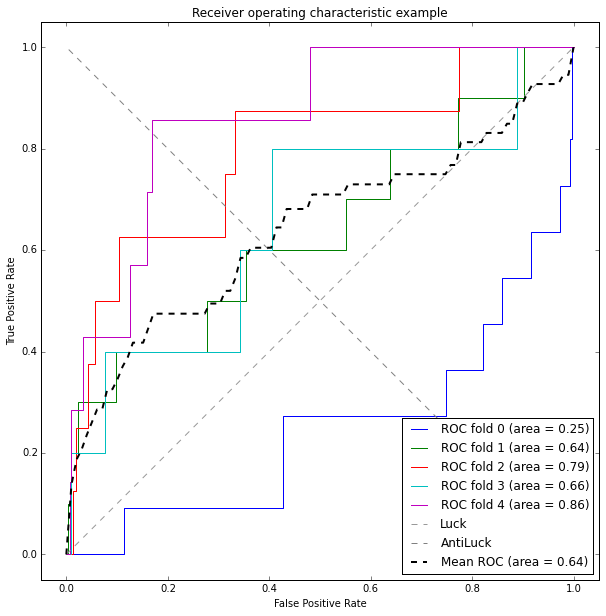

In [124]:
mean_tpr = 0.0
mean_fpr = np.linspace(0, 1, 100)
all_tpr = []

plt.figure(figsize=(10,10))

for i, (train, test) in enumerate(cv):
    probas_ = classifier.fit(X_gba_best.ix[train], y_gba_train.ix[train]).predict_proba(X_gba_best.ix[test])
    # Compute ROC curve and area the curve
    fpr, tpr, thresholds = roc_curve(y_gba_train.ix[test], probas_[:, 1])
    mean_tpr += interp(mean_fpr, fpr, tpr)
    mean_tpr[0] = 0.0
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw=1, label='ROC fold %d (area = %0.2f)' % (i, roc_auc))

plt.plot([0, 1], [0, 1], '--', color=(0.6, 0.6, 0.6), label='Luck')
plt.plot([1, 0], [0, 1], '--', color=(.5,.5,.5), label='AntiLuck')

mean_tpr /= len(cv)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
gba_best_thresh = thresholds[np.argmax(mean_tpr - mean_fpr)]
plt.plot(mean_fpr, mean_tpr, 'k--',
         label='Mean ROC (area = %0.2f)' % mean_auc, lw=2)

plt.xlim([-0.05, 1.05])
plt.ylim([-0.05, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic example')
plt.legend(loc="lower right")

In [125]:
X_gba_test = pd.DataFrame(gba_scale_fit.transform(X_gba_test).transpose()[best_gba_cols].transpose(), columns = X_gba_test.columns[best_gba_cols])

In [126]:
gba_probas = classifier.fit(X_gba_best, y_gba_train).predict_proba(X_gba_test)
X_gba_pred = []
for row in gba_probas:
    if row[1] > gba_best_thresh:
        X_gba_pred.append(1)
    else:
        X_gba_pred.append(0)

In [128]:
accuracy_score(X_gba_pred, y_gba_test)

0.90291262135922334

In [129]:
precision_score(X_gba_pred, y_gba_test)

0.38095238095238093

In [130]:
recall_score(X_gba_pred, y_gba_test)

0.17777777777777778

In [131]:
f1_score(X_gba_pred, y_gba_test)

0.24242424242424243

# AUSTIN CITY LIMITS MUSTIC FESTIVAL

In [167]:
y_acl, X_acl = df.acl_2015, df.ix[:, 'fans':'noi_counts']
X_acl_train, X_acl_test, y_acl_train, y_acl_test = train_test_split(X_acl, y_acl, test_size = 0.25, random_state = 4444)
acl_scale_fit = StandardScaler().fit(X_acl_train)
X_acl_train_scaled = pd.DataFrame(acl_scale_fit.transform(X_acl_train), columns = X_acl_train.columns)
new_acl_features = SelectKBest(f_classif, k = 10)
X_acl_best = new_acl_features.fit_transform(X_acl_train_scaled, y_acl_train)
best_acl_cols = new_acl_features.get_support(True)
X_acl_best = pd.DataFrame(X_acl_best, columns = X_acl.columns[best_acl_cols])
X_acl.columns[best_acl_cols]

Index([u'fans', u'2015_shows', u'2014_shows', u'2013_shows', u'2011_shows',
       u'hotttnesss', u'bon_counts', u'acl_counts', u'gba_counts',
       u'sas_counts'],
      dtype='object')

In [133]:
cw_range = [{1:1-cw, 0:cw} for cw in np.arange(.01, 1.0, .1)]
gamma_range = np.logspace(-9, 3, 9)
param_grid = dict(gamma=gamma_range, class_weight=cw_range)
cv = ShuffleSplit(len(y_acl_train), n_iter=5, test_size=0.2, random_state=42)
for score in ['accuracy','precision', 'recall']:
    grid = GridSearchCV(SVC(kernel = 'rbf'), param_grid=param_grid, cv=cv, scoring = score, verbose= 10)
    grid.fit(X_acl_best, y_acl_train)
    print("The best parameters are %s with a score of %0.2f"
          % (grid.best_params_, grid.best_score_))

Fitting 5 folds for each of 90 candidates, totalling 450 fits
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.048544 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.038835 -   0.1s

[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.1s



[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.038835 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.035599 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.035599 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.048544 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.038835 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999

[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.5s



[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.035599 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.035599 -   0.1s
[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.048544 -   0.1s
[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.038835 -   0.1s
[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.038835 -   0.1s
[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.03559

[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    0.9s
[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    1.2s



[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.035599 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.035599 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.048544 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.038835 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.038835 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.03559

[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    1.6s
[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    2.1s



[CV] gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.064725 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.058252 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.058252 -   0.1s
[CV] gamma=31.6227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=31.6227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.048544 -   0.2s
[CV] gamma=31.6227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=31.6227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.038835 -   0.1s
[CV] gamma=31.6227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=31.6227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.038835 -   0.1s


[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    2.9s
[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    3.2s



[CV] gamma=3.16227766017e-08, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.951456 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.961165 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.961165 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.964401 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.964401 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-06, clas

[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    3.5s
[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    3.8s



[CV] gamma=0.0316227766017, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.922330 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.944984 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.925566 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.935275 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.11, 1: 0.89000000000000001} .......
[CV]  gamma=1.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.944984 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.11, 1: 0.89000000000000001} .......
[CV]  gamma=1.0, class_weight={0: 0.11, 1: 0.890000000000000

[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    4.5s
[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    4.9s



[CV] gamma=3.16227766017e-08, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.961165 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.964401 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.964401 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=1e-06, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.951456 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=1e-06, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.961165 -

[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    5.2s
[Parallel(n_jobs=1)]: Done 128 jobs       | elapsed:    5.8s



[CV] gamma=31.6227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=31.6227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.964401 -   0.1s
[CV] gamma=31.6227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=31.6227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.964401 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=1000.0, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.951456 -   0.0s
[CV] gamma=1000.0, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=1000.0, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.961165 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=1000.0, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.961165 -   0.1s
[CV] gamma=1000.0, class_w

[Parallel(n_jobs=1)]: Done 145 jobs       | elapsed:    6.4s
[Parallel(n_jobs=1)]: Done 162 jobs       | elapsed:    6.6s



[CV] gamma=0.0316227766017, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.961165 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.961165 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.964401 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.964401 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=1.0, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.9514

[Parallel(n_jobs=1)]: Done 181 jobs       | elapsed:    7.7s
[Parallel(n_jobs=1)]: Done 200 jobs       | elapsed:    7.9s



[CV] gamma=3.16227766017e-05, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.961165 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.964401 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.964401 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=0.001, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.951456 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=0.001, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.961165 -

[Parallel(n_jobs=1)]: Done 221 jobs       | elapsed:    8.8s
[Parallel(n_jobs=1)]: Done 242 jobs       | elapsed:    9.2s



[CV] gamma=1e-06, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1e-06, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.961165 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1e-06, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.964401 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1e-06, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.964401 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.951456 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.961165 -   0.0s
[CV] gamma=3.162

[Parallel(n_jobs=1)]: Done 265 jobs       | elapsed:    9.9s
[Parallel(n_jobs=1)]: Done 288 jobs       | elapsed:   10.4s



[CV] gamma=1e-06, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999} 
[CV]  gamma=1e-06, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999}, score=0.964401 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999} 
[CV]  gamma=1e-06, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999}, score=0.964401 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999}, score=0.951456 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999}, score=0.961165 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999}, score=0.961165 -   0.0s
[CV] gamma=3

[Parallel(n_jobs=1)]: Done 313 jobs       | elapsed:   11.3s
[Parallel(n_jobs=1)]: Done 338 jobs       | elapsed:   11.7s



[CV] gamma=0.001, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=0.001, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.961165 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=0.001, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.964401 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=0.001, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.964401 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.951456 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.961165 -   0.0s
[CV] gamma=0.03162277660

[Parallel(n_jobs=1)]: Done 365 jobs       | elapsed:   12.8s
[Parallel(n_jobs=1)]: Done 392 jobs       | elapsed:   13.2s



[CV] gamma=1.0, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1.0, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.961165 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1.0, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.961165 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1.0, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.964401 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1.0, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.964401 -   0.0s
[CV] gamma=31.6227766017, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=31.6227766017, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.951456 -   0.1s
[CV] gamma=31.6227766017, class_weight={0: 0.81000000000000005, 

[Parallel(n_jobs=1)]: Done 421 jobs       | elapsed:   14.2s
[Parallel(n_jobs=1)]: Done 450 jobs       | elapsed:   15.5s



The best parameters are {'gamma': 1.0000000000000001e-09, 'class_weight': {0: 0.11, 1: 0.89000000000000001}} with a score of 0.96
Fitting 5 folds for each of 90 candidates, totalling 450 fits
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.048544 -   0.1s

[Parallel(n_jobs=1)]: Done 450 out of 450 | elapsed:   15.5s finished
[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.1s



[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.038835 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.038835 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.035599 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.035599 -   0.1s

[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.4s



[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.048544 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.038835 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.038835 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.035599 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.035599 -   0.1s
[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, clas

[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.7s
[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    1.1s



[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.035599 -   0.1s
[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.035599 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.048544 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.038835 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.038835 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 

[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    1.6s
[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    2.1s



[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.052083 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.055556 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.045113 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.040441 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.037288 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=1.0, class_weight={0: 0.01, 1: 

[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    2.7s
[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    3.6s



[CV] gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.038835 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.038835 -   0.0s
[CV] gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.035599 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.035599 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class

[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    3.9s
[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    4.3s



[CV] gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=0.001, clas

[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    4.6s
[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    5.7s



[CV] gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001} ....
[CV]  gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001} ....
[CV]  gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001} ....
[CV]  gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001} ....
[CV]  gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001} ....
[CV]  gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=1e-09, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.

[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    6.2s
[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    6.6s



[CV] gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.03162277660

[Parallel(n_jobs=1)]: Done 128 jobs       | elapsed:    7.3s
[Parallel(n_jobs=1)]: Done 145 jobs       | elapsed:    8.1s



[CV] gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.310000000000000

[Parallel(n_jobs=1)]: Done 162 jobs       | elapsed:    8.4s
[Parallel(n_jobs=1)]: Done 181 jobs       | elapsed:    9.9s



[CV] gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.410000000000000

[Parallel(n_jobs=1)]: Done 200 jobs       | elapsed:   10.1s
[Parallel(n_jobs=1)]: Done 221 jobs       | elapsed:   11.3s



[CV] gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1e-09, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.51000000000000001, 

[Parallel(n_jobs=1)]: Done 242 jobs       | elapsed:   11.9s
[Parallel(n_jobs=1)]: Done 265 jobs       | elapsed:   12.9s



[CV] gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.6100000000000001,

[Parallel(n_jobs=1)]: Done 288 jobs       | elapsed:   13.5s
[Parallel(n_jobs=1)]: Done 313 jobs       | elapsed:   14.5s



[CV] gamma=1000.0, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999}, score=0.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.2899999

[Parallel(n_jobs=1)]: Done 338 jobs       | elapsed:   14.9s
[Parallel(n_jobs=1)]: Done 365 jobs       | elapsed:   15.9s



[CV] gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.810000000000000

[Parallel(n_jobs=1)]: Done 392 jobs       | elapsed:   16.3s
[Parallel(n_jobs=1)]: Done 421 jobs       | elapsed:   17.2s



[CV] gamma=1e-06, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969} 
[CV]  gamma=1e-06, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089

[Parallel(n_jobs=1)]: Done 450 jobs       | elapsed:   18.2s
[Parallel(n_jobs=1)]: Done 450 out of 450 | elapsed:   18.2s finished
[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.1s



[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s

[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.3s



[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, clas

[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.5s
[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    0.8s



[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 

[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    1.1s
[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    1.5s



[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=1.0, class_weight={0: 0.01, 1: 

[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    2.0s
[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    2.8s



[CV] gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.0s
[CV] gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.0s
[CV] gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=1000.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1e-09, clas

[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    3.2s
[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    3.5s



[CV] gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=0.001, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=0.001, class_weight={0: 0.11, 

[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    3.7s
[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    4.5s



[CV] gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001} ....
[CV]  gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001} ....
[CV]  gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001} ....
[CV]  gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001} ....
[CV]  gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001} ....
[CV]  gamma=1000.0, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=1e-09, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.

[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    5.0s
[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    5.3s



[CV] gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.001, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.0316227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004} 
[CV]  gamma=0.0316227766017, class_weight={0: 0.21000000000000002, 1: 0.79000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.03162277660

[Parallel(n_jobs=1)]: Done 128 jobs       | elapsed:    6.0s
[Parallel(n_jobs=1)]: Done 145 jobs       | elapsed:    6.6s



[CV] gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995} 
[CV]  gamma=1e-06, class_weight={0: 0.31000000000000005, 1: 0.68999999999999995}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.310000000000000

[Parallel(n_jobs=1)]: Done 162 jobs       | elapsed:    6.9s
[Parallel(n_jobs=1)]: Done 181 jobs       | elapsed:    8.0s



[CV] gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1e-09, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.410000000000000

[Parallel(n_jobs=1)]: Done 200 jobs       | elapsed:    8.2s
[Parallel(n_jobs=1)]: Done 221 jobs       | elapsed:    9.2s



[CV] gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997} 
[CV]  gamma=1000.0, class_weight={0: 0.41000000000000003, 1: 0.58999999999999997}, score=0.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1e-09, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.51000000000000001, 

[Parallel(n_jobs=1)]: Done 242 jobs       | elapsed:    9.6s
[Parallel(n_jobs=1)]: Done 265 jobs       | elapsed:   10.5s



[CV] gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.51000000000000001, 1: 0.48999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.6100000000000001,

[Parallel(n_jobs=1)]: Done 288 jobs       | elapsed:   11.0s
[Parallel(n_jobs=1)]: Done 313 jobs       | elapsed:   11.9s



[CV] gamma=1000.0, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999}, score=0.000000 -   0.1s
[CV] gamma=1000.0, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999} 
[CV]  gamma=1000.0, class_weight={0: 0.6100000000000001, 1: 0.3899999999999999}, score=0.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992} 
[CV]  gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.28999999999999992}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.71000000000000008, 1: 0.2899999

[Parallel(n_jobs=1)]: Done 338 jobs       | elapsed:   12.3s
[Parallel(n_jobs=1)]: Done 365 jobs       | elapsed:   13.4s



[CV] gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995} 
[CV]  gamma=1e-09, class_weight={0: 0.81000000000000005, 1: 0.18999999999999995}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-08, class_weight={0: 0.810000000000000

[Parallel(n_jobs=1)]: Done 392 jobs       | elapsed:   13.8s
[Parallel(n_jobs=1)]: Done 421 jobs       | elapsed:   14.7s



[CV] gamma=1e-06, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969} 
[CV]  gamma=1e-06, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969} 
[CV]  gamma=1e-06, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969} 
[CV]  gamma=1e-06, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969} 
[CV]  gamma=1e-06, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.91000000000000003, 1: 0.089999999999999969}, score=0.000000 -   0.0s
[CV] gamma=3.16227766017e-05, 

[Parallel(n_jobs=1)]: Done 450 jobs       | elapsed:   15.7s
[Parallel(n_jobs=1)]: Done 450 out of 450 | elapsed:   15.7s finished


The best parameters are {'gamma': 1.0e-09, 'class_weight': {0: 0.11, 1: 0.89}} with an accuracy score of 0.96.

The best parameters are {'gamma': 0.03162, 'class_weight': {0: 0.11, 1: 0.89}} with a precision score of 0.19.

The best parameters are {'gamma': 1.0e-09, 'class_weight': {0: 0.01, 1: 0.99}} with a recall score of 1.00.

In [134]:
cw_range = [{1:1-cw, 0:cw} for cw in np.arange(.01, .15, .01)]
gamma_range = np.logspace(-9, -1, 9)
param_grid = dict(gamma=gamma_range, class_weight=cw_range)
cv = ShuffleSplit(len(y_acl_train), n_iter=5, test_size=0.2, random_state=42)
for score in ['accuracy','precision', 'recall']:
    grid = GridSearchCV(SVC(kernel = 'rbf'), param_grid=param_grid, cv=cv, scoring = score, verbose= 10)
    grid.fit(X_acl_best, y_acl_train)
    print("The best parameters are %s with a score of %0.2f"
          % (grid.best_params_, grid.best_score_))

Fitting 5 folds for each of 126 candidates, totalling 630 fits
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.048544 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.038835 -   0.1s

[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.1s



[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.038835 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.035599 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.035599 -   0.1s
[CV] gamma=1e-08, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.048544 -   0.1s
[CV] gamma=1e-08, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.038835 -   0.1s
[CV] gamma=1e-08, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.038835 -   0.1s

[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.5s



[CV] gamma=1e-08, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.035599 -   0.1s
[CV] gamma=1e-08, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.035599 -   0.1s
[CV] gamma=1e-07, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-07, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.048544 -   0.1s
[CV] gamma=1e-07, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-07, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.038835 -   0.1s
[CV] gamma=1e-07, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-07, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.038835 -   0.1s
[CV] gamma=1e-07, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-07, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.035599 -   0.1s
[CV] gamma=1e-07, class_wei

[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    0.9s
[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    1.2s



[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.035599 -   0.1s
[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.035599 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.048544 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.038835 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.038835 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.035599 -   0.1s
[CV] gamma=1e-05, class_wei

[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    1.7s
[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    2.2s



[CV] gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.038835 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.035599 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.035599 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999} ......
[CV]  gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.048544 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999} ......
[CV]  gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.038835 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999} ......
[CV]  gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.038835 -   0.1s
[CV] gamma=0.01, class_weight=

[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    2.9s
[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    3.5s



[CV] gamma=1e-08, class_weight={0: 0.02, 1: 0.97999999999999998} .....
[CV]  gamma=1e-08, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.048544 -   0.1s
[CV] gamma=1e-08, class_weight={0: 0.02, 1: 0.97999999999999998} .....
[CV]  gamma=1e-08, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.038835 -   0.1s
[CV] gamma=1e-08, class_weight={0: 0.02, 1: 0.97999999999999998} .....
[CV]  gamma=1e-08, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.038835 -   0.1s
[CV] gamma=1e-08, class_weight={0: 0.02, 1: 0.97999999999999998} .....
[CV]  gamma=1e-08, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.035599 -   0.1s
[CV] gamma=1e-08, class_weight={0: 0.02, 1: 0.97999999999999998} .....
[CV]  gamma=1e-08, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.035599 -   0.1s
[CV] gamma=1e-07, class_weight={0: 0.02, 1: 0.97999999999999998} .....
[CV]  gamma=1e-07, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.048544 -   0.1s
[CV] gamma=1e-07, class_wei

[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    4.3s
[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    5.0s



[CV] gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998} ....
[CV]  gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.038835 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998} ....
[CV]  gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.035599 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998} ....
[CV]  gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.035599 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.02, 1: 0.97999999999999998} .....
[CV]  gamma=0.001, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.048544 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.02, 1: 0.97999999999999998} .....
[CV]  gamma=0.001, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.038835 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.02, 1: 0.97999999999999998} .....
[CV]  gamma=0.001, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.038835 -   0.1s
[CV] gamma=0.001, class_

[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    5.9s
[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    6.7s



[CV] gamma=1e-08, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=1e-08, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.035599 -   0.1s
[CV] gamma=1e-08, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=1e-08, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.035599 -   0.1s
[CV] gamma=1e-07, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=1e-07, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.048544 -   0.1s
[CV] gamma=1e-07, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=1e-07, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.038835 -   0.1s
[CV] gamma=1e-07, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=1e-07, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.038835 -   0.1s
[CV] gamma=1e-07, class_weight={0: 0.02999999999999999

[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    7.7s
[Parallel(n_jobs=1)]: Done 128 jobs       | elapsed:    8.7s



[CV] gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.728155 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.754045 -   0.1s
[CV] gamma=0.1, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.1, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.773463 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.1, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.711974 -   0.1s
[CV] gamma=0.1, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.1, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.750809 -   0.1s
[CV] gamma=0.1, class_weight={0: 0.029999999999999999, 1: 0.9699999999

[Parallel(n_jobs=1)]: Done 145 jobs       | elapsed:    9.8s
[Parallel(n_jobs=1)]: Done 162 jobs       | elapsed:   10.9s



[CV] gamma=0.0001, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.0001, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.961165 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.0001, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.964401 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.0001, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.964401 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.001, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.951456 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.001, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.951456 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.04000000000

[Parallel(n_jobs=1)]: Done 181 jobs       | elapsed:   11.9s
[Parallel(n_jobs=1)]: Done 200 jobs       | elapsed:   12.9s



[CV] gamma=1e-06, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=1e-06, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996}, score=0.964401 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=1e-05, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996}, score=0.951456 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=1e-05, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996}, score=0.961165 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=1e-05, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996}, score=0.961165 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=1e-05, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996}, score=0.964401 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.05000000000000000

[Parallel(n_jobs=1)]: Done 221 jobs       | elapsed:   14.0s
[Parallel(n_jobs=1)]: Done 242 jobs       | elapsed:   14.8s



[CV] gamma=1e-06, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=1e-06, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995}, score=0.961165 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=1e-06, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995}, score=0.964401 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=1e-06, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995}, score=0.964401 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=1e-05, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995}, score=0.951456 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=1e-05, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995}, score=0.961165 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.06000000000000000

[Parallel(n_jobs=1)]: Done 265 jobs       | elapsed:   15.8s
[Parallel(n_jobs=1)]: Done 288 jobs       | elapsed:   16.6s



[CV] gamma=1e-06, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=1e-06, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005}, score=0.964401 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=1e-06, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005}, score=0.964401 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=1e-05, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005}, score=0.951456 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=1e-05, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005}, score=0.961165 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=1e-05, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005}, score=0.961165 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.06999999999999999

[Parallel(n_jobs=1)]: Done 313 jobs       | elapsed:   17.5s
[Parallel(n_jobs=1)]: Done 338 jobs       | elapsed:   18.3s



[CV] gamma=1e-05, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=1e-05, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.964401 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=1e-05, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.964401 -   0.0s
[CV] gamma=0.0001, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=0.0001, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.951456 -   0.0s
[CV] gamma=0.0001, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=0.0001, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.961165 -   0.0s
[CV] gamma=0.0001, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=0.0001, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.961165 -   0.0s
[CV] gamma=0.0001, class_weight={0: 0.0800000000

[Parallel(n_jobs=1)]: Done 365 jobs       | elapsed:   19.2s
[Parallel(n_jobs=1)]: Done 392 jobs       | elapsed:   20.0s



[CV] gamma=0.001, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.001, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003}, score=0.961165 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.001, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003}, score=0.964401 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.001, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003}, score=0.964401 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.01, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003}, score=0.948220 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.01, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003}, score=0.925566 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.089999999999999997, 1:

[Parallel(n_jobs=1)]: Done 421 jobs       | elapsed:   20.8s
[Parallel(n_jobs=1)]: Done 450 jobs       | elapsed:   21.7s



[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.951456 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.961165 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.961165 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.964401 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.964401 -   0.0s
[CV] gamma=1e-08, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-08, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.951456 -   0.0s
[CV] gamma=1e-08, class_wei

[Parallel(n_jobs=1)]: Done 481 jobs       | elapsed:   22.6s
[Parallel(n_jobs=1)]: Done 512 jobs       | elapsed:   23.4s



[CV] gamma=1e-06, class_weight={0: 0.12, 1: 0.88} ....................
[CV]  gamma=1e-06, class_weight={0: 0.12, 1: 0.88}, score=0.961165 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.12, 1: 0.88} ....................
[CV]  gamma=1e-06, class_weight={0: 0.12, 1: 0.88}, score=0.964401 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.12, 1: 0.88} ....................
[CV]  gamma=1e-06, class_weight={0: 0.12, 1: 0.88}, score=0.964401 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.12, 1: 0.88} ....................
[CV]  gamma=1e-05, class_weight={0: 0.12, 1: 0.88}, score=0.951456 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.12, 1: 0.88} ....................
[CV]  gamma=1e-05, class_weight={0: 0.12, 1: 0.88}, score=0.961165 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.12, 1: 0.88} ....................
[CV]  gamma=1e-05, class_weight={0: 0.12, 1: 0.88}, score=0.961165 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.12, 1: 0.88} ....................
[CV]  gamma=1e-05, class_weight={0: 0.12, 1: 0

[Parallel(n_jobs=1)]: Done 545 jobs       | elapsed:   24.2s
[Parallel(n_jobs=1)]: Done 578 jobs       | elapsed:   24.9s



[CV] gamma=0.01, class_weight={0: 0.13, 1: 0.87} .....................
[CV]  gamma=0.01, class_weight={0: 0.13, 1: 0.87}, score=0.957929 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.13, 1: 0.87} .....................
[CV]  gamma=0.01, class_weight={0: 0.13, 1: 0.87}, score=0.961165 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.13, 1: 0.87} .....................
[CV]  gamma=0.01, class_weight={0: 0.13, 1: 0.87}, score=0.967638 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.13, 1: 0.87} ......................
[CV]  gamma=0.1, class_weight={0: 0.13, 1: 0.87}, score=0.948220 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.13, 1: 0.87} ......................
[CV]  gamma=0.1, class_weight={0: 0.13, 1: 0.87}, score=0.941748 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.13, 1: 0.87} ......................
[CV]  gamma=0.1, class_weight={0: 0.13, 1: 0.87}, score=0.951456 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.13, 1: 0.87} ......................
[CV]  gamma=0.1, class_weight={0: 0.13, 1: 0.87}, score

[Parallel(n_jobs=1)]: Done 613 jobs       | elapsed:   25.7s
[Parallel(n_jobs=1)]: Done 630 out of 630 | elapsed:   26.1s finished



The best parameters are {'gamma': 1.0000000000000001e-09, 'class_weight': {0: 0.040000000000000001, 1: 0.95999999999999996}} with a score of 0.96
Fitting 5 folds for each of 126 candidates, totalling 630 fits
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.048544 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.038835 -   0.1s

[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.1s



[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.038835 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.035599 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.035599 -   0.1s
[CV] gamma=1e-08, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.048544 -   0.1s
[CV] gamma=1e-08, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.038835 -   0.1s
[CV] gamma=1e-08, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.038835 -   0.1s

[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.4s
[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.6s



[CV] gamma=1e-08, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.035599 -   0.1s
[CV] gamma=1e-08, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.035599 -   0.1s
[CV] gamma=1e-07, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-07, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.048544 -   0.1s
[CV] gamma=1e-07, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-07, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.038835 -   0.1s
[CV] gamma=1e-07, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-07, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.038835 -   0.1s
[CV] gamma=1e-07, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-07, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.035599 -   0.1s
[CV] gamma=1e-07, class_wei

[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    0.9s
[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    1.3s



[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.035599 -   0.1s
[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.035599 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.048544 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.038835 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.038835 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.035599 -   0.1s
[CV] gamma=1e-05, class_wei

[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    1.7s
[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    2.2s



[CV] gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.038835 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.035599 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.035599 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999} ......
[CV]  gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.048544 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999} ......
[CV]  gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.038835 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999} ......
[CV]  gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.038835 -   0.1s
[CV] gamma=0.01, class_weight=

[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    2.8s
[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    3.5s



[CV] gamma=1e-08, class_weight={0: 0.02, 1: 0.97999999999999998} .....
[CV]  gamma=1e-08, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.048544 -   0.1s
[CV] gamma=1e-08, class_weight={0: 0.02, 1: 0.97999999999999998} .....
[CV]  gamma=1e-08, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.038835 -   0.1s
[CV] gamma=1e-08, class_weight={0: 0.02, 1: 0.97999999999999998} .....
[CV]  gamma=1e-08, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.038835 -   0.1s
[CV] gamma=1e-08, class_weight={0: 0.02, 1: 0.97999999999999998} .....
[CV]  gamma=1e-08, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.035599 -   0.1s
[CV] gamma=1e-08, class_weight={0: 0.02, 1: 0.97999999999999998} .....
[CV]  gamma=1e-08, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.035599 -   0.1s
[CV] gamma=1e-07, class_weight={0: 0.02, 1: 0.97999999999999998} .....
[CV]  gamma=1e-07, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.048544 -   0.1s
[CV] gamma=1e-07, class_wei

[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    4.2s
[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    5.0s



[CV] gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998} ....
[CV]  gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.038835 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998} ....
[CV]  gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.035599 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998} ....
[CV]  gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.035599 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.02, 1: 0.97999999999999998} .....
[CV]  gamma=0.001, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.048544 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.02, 1: 0.97999999999999998} .....
[CV]  gamma=0.001, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.038835 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.02, 1: 0.97999999999999998} .....
[CV]  gamma=0.001, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.038835 -   0.1s
[CV] gamma=0.001, class_

[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    5.9s
[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    6.8s



[CV] gamma=1e-08, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=1e-08, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.035599 -   0.1s
[CV] gamma=1e-08, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=1e-08, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.035599 -   0.1s
[CV] gamma=1e-07, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=1e-07, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.048544 -   0.1s
[CV] gamma=1e-07, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=1e-07, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.038835 -   0.1s
[CV] gamma=1e-07, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=1e-07, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.038835 -   0.1s
[CV] gamma=1e-07, class_weight={0: 0.02999999999999999

[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    8.0s
[Parallel(n_jobs=1)]: Done 128 jobs       | elapsed:    9.1s



[CV] gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.098901 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.117647 -   0.1s
[CV] gamma=0.1, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.1, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.160494 -   0.1s
[CV] gamma=0.1, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.1, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.103093 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.1, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.126437 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.029999999999999999, 1: 0.9699999999

[Parallel(n_jobs=1)]: Done 145 jobs       | elapsed:   10.3s
[Parallel(n_jobs=1)]: Done 162 jobs       | elapsed:   11.6s



[CV] gamma=0.0001, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.0001, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.000000 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.0001, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.000000 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.0001, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.000000 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.001, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.000000 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.001, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.000000 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.04000000000

[Parallel(n_jobs=1)]: Done 181 jobs       | elapsed:   12.8s
[Parallel(n_jobs=1)]: Done 200 jobs       | elapsed:   13.8s



[CV] gamma=1e-05, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=1e-05, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996}, score=0.000000 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=1e-05, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996}, score=0.000000 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=1e-05, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996}, score=0.000000 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=1e-05, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996}, score=0.000000 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=1e-05, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996}, score=0.000000 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.0500000000000000

[Parallel(n_jobs=1)]: Done 221 jobs       | elapsed:   15.2s
[Parallel(n_jobs=1)]: Done 242 jobs       | elapsed:   16.2s



[CV] gamma=1e-06, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=1e-06, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=1e-06, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=1e-06, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=1e-06, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=1e-05, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.06000000000000000

[Parallel(n_jobs=1)]: Done 265 jobs       | elapsed:   17.2s
[Parallel(n_jobs=1)]: Done 288 jobs       | elapsed:   17.9s



[CV] gamma=1e-06, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=1e-06, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=1e-06, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=1e-05, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=1e-05, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=1e-05, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.06999999999999999

[Parallel(n_jobs=1)]: Done 313 jobs       | elapsed:   18.8s
[Parallel(n_jobs=1)]: Done 338 jobs       | elapsed:   19.6s



[CV] gamma=1e-05, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=1e-05, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=1e-05, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.0001, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=0.0001, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.0001, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=0.0001, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.0001, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=0.0001, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.0001, class_weight={0: 0.0800000000

[Parallel(n_jobs=1)]: Done 365 jobs       | elapsed:   20.4s
[Parallel(n_jobs=1)]: Done 392 jobs       | elapsed:   21.2s



[CV] gamma=0.001, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.001, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003}, score=0.000000 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.001, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003}, score=0.000000 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.001, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.01, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003}, score=0.444444 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.01, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003}, score=0.076923 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.089999999999999997, 1:

[Parallel(n_jobs=1)]: Done 421 jobs       | elapsed:   22.0s
[Parallel(n_jobs=1)]: Done 450 jobs       | elapsed:   22.8s



[CV] gamma=0.1, class_weight={0: 0.099999999999999992, 1: 0.90000000000000002} 
[CV]  gamma=0.1, class_weight={0: 0.099999999999999992, 1: 0.90000000000000002}, score=0.400000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV]

[Parallel(n_jobs=1)]: Done 481 jobs       | elapsed:   23.6s
[Parallel(n_jobs=1)]: Done 512 jobs       | elapsed:   24.4s



[CV] gamma=1e-06, class_weight={0: 0.12, 1: 0.88} ....................
[CV]  gamma=1e-06, class_weight={0: 0.12, 1: 0.88}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.12, 1: 0.88} ....................
[CV]  gamma=1e-06, class_weight={0: 0.12, 1: 0.88}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.12, 1: 0.88} ....................
[CV]  gamma=1e-06, class_weight={0: 0.12, 1: 0.88}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.12, 1: 0.88} ....................
[CV]  gamma=1e-06, class_weight={0: 0.12, 1: 0.88}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.12, 1: 0.88} ....................
[CV]  gamma=1e-06, class_weight={0: 0.12, 1: 0.88}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.12, 1: 0.88} ....................
[CV]  gamma=1e-05, class_weight={0: 0.12, 1: 0.88}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.12, 1: 0.88} ....................
[CV]  gamma=1e-05, class_weight={0: 0.12, 1: 0

[Parallel(n_jobs=1)]: Done 545 jobs       | elapsed:   25.2s
[Parallel(n_jobs=1)]: Done 578 jobs       | elapsed:   25.9s



[CV] gamma=0.01, class_weight={0: 0.13, 1: 0.87} .....................
[CV]  gamma=0.01, class_weight={0: 0.13, 1: 0.87}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.13, 1: 0.87} .....................
[CV]  gamma=0.01, class_weight={0: 0.13, 1: 0.87}, score=0.333333 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.13, 1: 0.87} .....................
[CV]  gamma=0.01, class_weight={0: 0.13, 1: 0.87}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.13, 1: 0.87} .....................
[CV]  gamma=0.01, class_weight={0: 0.13, 1: 0.87}, score=0.666667 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.13, 1: 0.87} ......................
[CV]  gamma=0.1, class_weight={0: 0.13, 1: 0.87}, score=0.400000 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.13, 1: 0.87} ......................
[CV]  gamma=0.1, class_weight={0: 0.13, 1: 0.87}, score=0.000000 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.13, 1: 0.87} ......................
[CV]  gamma=0.1, class_weight={0: 0.13, 1: 0.87}, scor

[Parallel(n_jobs=1)]: Done 613 jobs       | elapsed:   26.7s
[Parallel(n_jobs=1)]: Done 630 out of 630 | elapsed:   27.1s finished



[CV] gamma=0.1, class_weight={0: 0.14000000000000001, 1: 0.85999999999999999} 
[CV]  gamma=0.1, class_weight={0: 0.14000000000000001, 1: 0.85999999999999999}, score=0.000000 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.14000000000000001, 1: 0.85999999999999999} 
[CV]  gamma=0.1, class_weight={0: 0.14000000000000001, 1: 0.85999999999999999}, score=0.250000 -   0.0s
The best parameters are {'gamma': 0.01, 'class_weight': {0: 0.12, 1: 0.88}} with a score of 0.40
Fitting 5 folds for each of 126 candidates, totalling 630 fits
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s

[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.1s



[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-09, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-08, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-08, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-08, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s

[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.4s
[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.6s



[CV] gamma=1e-08, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-08, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-08, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-07, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-07, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-07, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-07, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-07, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-07, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-07, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-07, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-07, class_wei

[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    1.0s
[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    1.3s



[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-06, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-05, class_wei

[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    1.8s
[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    2.3s



[CV] gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999} ......
[CV]  gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999} ......
[CV]  gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999} ......
[CV]  gamma=0.01, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.01, class_weight=

[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    3.0s
[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    3.6s



[CV] gamma=1e-08, class_weight={0: 0.02, 1: 0.97999999999999998} .....
[CV]  gamma=1e-08, class_weight={0: 0.02, 1: 0.97999999999999998}, score=1.000000 -   0.1s
[CV] gamma=1e-08, class_weight={0: 0.02, 1: 0.97999999999999998} .....
[CV]  gamma=1e-08, class_weight={0: 0.02, 1: 0.97999999999999998}, score=1.000000 -   0.1s
[CV] gamma=1e-08, class_weight={0: 0.02, 1: 0.97999999999999998} .....
[CV]  gamma=1e-08, class_weight={0: 0.02, 1: 0.97999999999999998}, score=1.000000 -   0.1s
[CV] gamma=1e-08, class_weight={0: 0.02, 1: 0.97999999999999998} .....
[CV]  gamma=1e-08, class_weight={0: 0.02, 1: 0.97999999999999998}, score=1.000000 -   0.1s
[CV] gamma=1e-08, class_weight={0: 0.02, 1: 0.97999999999999998} .....
[CV]  gamma=1e-08, class_weight={0: 0.02, 1: 0.97999999999999998}, score=1.000000 -   0.1s
[CV] gamma=1e-07, class_weight={0: 0.02, 1: 0.97999999999999998} .....
[CV]  gamma=1e-07, class_weight={0: 0.02, 1: 0.97999999999999998}, score=1.000000 -   0.1s
[CV] gamma=1e-07, class_wei

[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    4.4s
[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    5.1s



[CV] gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998} ....
[CV]  gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998}, score=1.000000 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998} ....
[CV]  gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998}, score=1.000000 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998} ....
[CV]  gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998}, score=1.000000 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.02, 1: 0.97999999999999998} .....
[CV]  gamma=0.001, class_weight={0: 0.02, 1: 0.97999999999999998}, score=1.000000 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.02, 1: 0.97999999999999998} .....
[CV]  gamma=0.001, class_weight={0: 0.02, 1: 0.97999999999999998}, score=1.000000 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.02, 1: 0.97999999999999998} .....
[CV]  gamma=0.001, class_weight={0: 0.02, 1: 0.97999999999999998}, score=1.000000 -   0.1s
[CV] gamma=0.001, class_

[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    6.0s
[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    6.8s



[CV] gamma=1e-08, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=1e-08, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=1.000000 -   0.1s
[CV] gamma=1e-08, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=1e-08, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=1.000000 -   0.1s
[CV] gamma=1e-07, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=1e-07, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=1.000000 -   0.1s
[CV] gamma=1e-07, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=1e-07, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=1.000000 -   0.1s
[CV] gamma=1e-07, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=1e-07, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=1.000000 -   0.1s
[CV] gamma=1e-07, class_weight={0: 0.02999999999999999

[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    7.7s
[Parallel(n_jobs=1)]: Done 128 jobs       | elapsed:    8.7s



[CV] gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.818182 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.01, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.909091 -   0.1s
[CV] gamma=0.1, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.1, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.866667 -   0.1s
[CV] gamma=0.1, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.1, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.833333 -   0.1s
[CV] gamma=0.1, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.1, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.916667 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.029999999999999999, 1: 0.9699999999

[Parallel(n_jobs=1)]: Done 145 jobs       | elapsed:    9.8s
[Parallel(n_jobs=1)]: Done 162 jobs       | elapsed:   11.0s



[CV] gamma=0.0001, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.0001, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.000000 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.0001, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.000000 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.0001, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.000000 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.001, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.000000 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.001, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.000000 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.04000000000

[Parallel(n_jobs=1)]: Done 181 jobs       | elapsed:   12.1s
[Parallel(n_jobs=1)]: Done 200 jobs       | elapsed:   13.1s



[CV] gamma=1e-06, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=1e-06, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=1e-05, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996}, score=0.000000 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=1e-05, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=1e-05, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996}, score=0.000000 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=1e-05, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996}, score=0.000000 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.05000000000000000

[Parallel(n_jobs=1)]: Done 221 jobs       | elapsed:   14.2s
[Parallel(n_jobs=1)]: Done 242 jobs       | elapsed:   15.1s



[CV] gamma=1e-06, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=1e-06, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=1e-06, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995}, score=0.000000 -   0.1s
[CV] gamma=1e-06, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=1e-06, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=1e-06, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=1e-05, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.06000000000000000

[Parallel(n_jobs=1)]: Done 265 jobs       | elapsed:   16.1s
[Parallel(n_jobs=1)]: Done 288 jobs       | elapsed:   17.0s



[CV] gamma=1e-06, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=1e-06, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=1e-06, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=1e-05, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=1e-05, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=1e-05, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.06999999999999999

[Parallel(n_jobs=1)]: Done 313 jobs       | elapsed:   18.0s
[Parallel(n_jobs=1)]: Done 338 jobs       | elapsed:   18.8s



[CV] gamma=1e-05, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=1e-05, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=1e-05, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=1e-05, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.0001, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=0.0001, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.0001, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=0.0001, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.0001, class_weight={0: 0.080000000000

[Parallel(n_jobs=1)]: Done 365 jobs       | elapsed:   19.8s
[Parallel(n_jobs=1)]: Done 392 jobs       | elapsed:   20.7s



[CV] gamma=0.001, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.001, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003}, score=0.000000 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.001, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003}, score=0.000000 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.001, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003}, score=0.000000 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.001, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.01, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003}, score=0.266667 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.089999999999999997, 

[Parallel(n_jobs=1)]: Done 421 jobs       | elapsed:   21.6s
[Parallel(n_jobs=1)]: Done 450 jobs       | elapsed:   22.5s



[CV] gamma=0.1, class_weight={0: 0.099999999999999992, 1: 0.90000000000000002} 
[CV]  gamma=0.1, class_weight={0: 0.099999999999999992, 1: 0.90000000000000002}, score=0.545455 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-09, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV]

[Parallel(n_jobs=1)]: Done 481 jobs       | elapsed:   23.3s
[Parallel(n_jobs=1)]: Done 512 jobs       | elapsed:   24.1s



[CV] gamma=1e-06, class_weight={0: 0.12, 1: 0.88} ....................
[CV]  gamma=1e-06, class_weight={0: 0.12, 1: 0.88}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.12, 1: 0.88} ....................
[CV]  gamma=1e-06, class_weight={0: 0.12, 1: 0.88}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.12, 1: 0.88} ....................
[CV]  gamma=1e-06, class_weight={0: 0.12, 1: 0.88}, score=0.000000 -   0.0s
[CV] gamma=1e-06, class_weight={0: 0.12, 1: 0.88} ....................
[CV]  gamma=1e-06, class_weight={0: 0.12, 1: 0.88}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.12, 1: 0.88} ....................
[CV]  gamma=1e-05, class_weight={0: 0.12, 1: 0.88}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.12, 1: 0.88} ....................
[CV]  gamma=1e-05, class_weight={0: 0.12, 1: 0.88}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.12, 1: 0.88} ....................
[CV]  gamma=1e-05, class_weight={0: 0.12, 1: 0

[Parallel(n_jobs=1)]: Done 545 jobs       | elapsed:   25.0s
[Parallel(n_jobs=1)]: Done 578 jobs       | elapsed:   25.8s



[CV] gamma=0.01, class_weight={0: 0.13, 1: 0.87} .....................
[CV]  gamma=0.01, class_weight={0: 0.13, 1: 0.87}, score=0.083333 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.13, 1: 0.87} .....................
[CV]  gamma=0.01, class_weight={0: 0.13, 1: 0.87}, score=0.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.13, 1: 0.87} .....................
[CV]  gamma=0.01, class_weight={0: 0.13, 1: 0.87}, score=0.181818 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.13, 1: 0.87} ......................
[CV]  gamma=0.1, class_weight={0: 0.13, 1: 0.87}, score=0.133333 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.13, 1: 0.87} ......................
[CV]  gamma=0.1, class_weight={0: 0.13, 1: 0.87}, score=0.000000 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.13, 1: 0.87} ......................
[CV]  gamma=0.1, class_weight={0: 0.13, 1: 0.87}, score=0.166667 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.13, 1: 0.87} ......................
[CV]  gamma=0.1, class_weight={0: 0.13, 1: 0.87}, score

[Parallel(n_jobs=1)]: Done 613 jobs       | elapsed:   26.5s
[Parallel(n_jobs=1)]: Done 630 out of 630 | elapsed:   27.0s finished



[CV] gamma=0.1, class_weight={0: 0.14000000000000001, 1: 0.85999999999999999} 
[CV]  gamma=0.1, class_weight={0: 0.14000000000000001, 1: 0.85999999999999999}, score=0.090909 -   0.0s
The best parameters are {'gamma': 1.0000000000000001e-09, 'class_weight': {0: 0.01, 1: 0.98999999999999999}} with a score of 1.00


The best parameters are {'gamma': 1.0e-09, 'class_weight': {0: 0.04, 1: 0.96}} with an accuracy score of 0.96.

The best parameters are {'gamma': 0.01, 'class_weight': {0: 0.12, 1: 0.88}} with a precision score of 0.40.

The best parameters are {'gamma': 1.0e-09, 'class_weight': {0: 0.01, 1: 0.99}} with a recall score of 1.00.

In [136]:
cw_range = [{1:1-cw, 0:cw} for cw in np.arange(.02, .04, .001)]
gamma_range = np.logspace(-4, -1, 9)
param_grid = dict(gamma=gamma_range, class_weight=cw_range)
cv = ShuffleSplit(len(y_acl_train), n_iter=5, test_size=0.2, random_state=42)
for score in ['accuracy','precision', 'recall']:
    grid = GridSearchCV(SVC(kernel = 'rbf'), param_grid=param_grid, cv=cv, scoring = score, verbose= 10)
    grid.fit(X_acl_best, y_acl_train)
    print("The best parameters are %s with a score of %0.2f"
          % (grid.best_params_, grid.best_score_))

Fitting 5 folds for each of 180 candidates, totalling 900 fits
[CV] gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998} ....
[CV]  gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.048544 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998} ....
[CV]  gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.038835 -   0.1s

[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.1s



[CV] gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998} ....
[CV]  gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.038835 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998} ....
[CV]  gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.035599 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998} ....
[CV]  gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.035599 -   0.1s
[CV] gamma=0.000237137370566, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.000237137370566, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.048544 -   0.1s
[CV] gamma=0.000237137370566, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.000237137370566, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.038835 -   0.1s
[CV] gamma=0.000237137370566, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.000237137370566, class_weight={0: 0.02, 1: 0.97999999999

[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.5s



[CV] gamma=0.000237137370566, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.000237137370566, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.035599 -   0.1s
[CV] gamma=0.000237137370566, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.000237137370566, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.035599 -   0.1s
[CV] gamma=0.00056234132519, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.00056234132519, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.048544 -   0.1s
[CV] gamma=0.00056234132519, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.00056234132519, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.038835 -   0.1s
[CV] gamma=0.00056234132519, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.00056234132519, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.038835 -   0.1s
[CV] gamma=0.00056234132519, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.000562341

[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    0.9s
[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    1.2s



[CV] gamma=0.00133352143216, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.00133352143216, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.035599 -   0.1s
[CV] gamma=0.00133352143216, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.00133352143216, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.035599 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.048544 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.038835 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.038835 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.0031622776601

[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    1.7s
[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    2.1s



[CV] gamma=0.0177827941004, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.621359 -   0.1s
[CV] gamma=0.0177827941004, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.608414 -   0.1s
[CV] gamma=0.0177827941004, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.624595 -   0.1s
[CV] gamma=0.0421696503429, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.705502 -   0.1s
[CV] gamma=0.0421696503429, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.637540 -   0.1s
[CV] gamma=0.0421696503429, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.0421696503429, class_wei

[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    2.7s
[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    3.2s



[CV] gamma=0.000237137370566, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998} 
[CV]  gamma=0.000237137370566, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998}, score=0.048544 -   0.1s
[CV] gamma=0.000237137370566, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998} 
[CV]  gamma=0.000237137370566, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998}, score=0.038835 -   0.1s
[CV] gamma=0.000237137370566, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998} 
[CV]  gamma=0.000237137370566, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998}, score=0.038835 -   0.1s
[CV] gamma=0.000237137370566, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998} 
[CV]  gamma=0.000237137370566, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998}, score=0.035599 -   0.1s
[CV] gamma=0.000237137370566, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998} 
[CV]  gamma=0.000237137370566, class_weight={0: 0.021

[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    4.0s
[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    4.7s



[CV] gamma=0.00749894209332, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998} 
[CV]  gamma=0.00749894209332, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998}, score=0.326861 -   0.1s
[CV] gamma=0.00749894209332, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998} 
[CV]  gamma=0.00749894209332, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998}, score=0.307443 -   0.1s
[CV] gamma=0.00749894209332, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998} 
[CV]  gamma=0.00749894209332, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998}, score=0.229773 -   0.1s
[CV] gamma=0.0177827941004, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998}, score=0.699029 -   0.1s
[CV] gamma=0.0177827941004, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.02100000000000000

[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    5.6s
[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    6.4s



[CV] gamma=0.000237137370566, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998} 
[CV]  gamma=0.000237137370566, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998}, score=0.035599 -   0.1s
[CV] gamma=0.000237137370566, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998} 
[CV]  gamma=0.000237137370566, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998}, score=0.035599 -   0.1s
[CV] gamma=0.00056234132519, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998} 
[CV]  gamma=0.00056234132519, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998}, score=0.048544 -   0.1s
[CV] gamma=0.00056234132519, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998} 
[CV]  gamma=0.00056234132519, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998}, score=0.038835 -   0.1s
[CV] gamma=0.00056234132519, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998} 
[CV]  gamma=0.00056234132519, class_weight={0: 0.022000000

[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    7.4s
[Parallel(n_jobs=1)]: Done 128 jobs       | elapsed:    8.3s



[CV] gamma=0.0421696503429, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998}, score=0.660194 -   0.1s
[CV] gamma=0.0421696503429, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998}, score=0.686084 -   0.1s
[CV] gamma=0.1, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998} 
[CV]  gamma=0.1, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998}, score=0.711974 -   0.1s
[CV] gamma=0.1, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998} 
[CV]  gamma=0.1, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998}, score=0.650485 -   0.1s
[CV] gamma=0.1, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998} 
[CV]  gamma=0.1, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998}, score=0.682848 -   0.1s
[CV] gamma=0.1, class_weig

[Parallel(n_jobs=1)]: Done 145 jobs       | elapsed:    9.3s
[Parallel(n_jobs=1)]: Done 162 jobs       | elapsed:   10.4s



[CV] gamma=0.00749894209332, class_weight={0: 0.023000000000000003, 1: 0.97699999999999998} 
[CV]  gamma=0.00749894209332, class_weight={0: 0.023000000000000003, 1: 0.97699999999999998}, score=0.456311 -   0.1s
[CV] gamma=0.00749894209332, class_weight={0: 0.023000000000000003, 1: 0.97699999999999998} 
[CV]  gamma=0.00749894209332, class_weight={0: 0.023000000000000003, 1: 0.97699999999999998}, score=0.563107 -   0.1s
[CV] gamma=0.00749894209332, class_weight={0: 0.023000000000000003, 1: 0.97699999999999998} 
[CV]  gamma=0.00749894209332, class_weight={0: 0.023000000000000003, 1: 0.97699999999999998}, score=0.462783 -   0.1s
[CV] gamma=0.0177827941004, class_weight={0: 0.023000000000000003, 1: 0.97699999999999998} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.023000000000000003, 1: 0.97699999999999998}, score=0.715210 -   0.1s
[CV] gamma=0.0177827941004, class_weight={0: 0.023000000000000003, 1: 0.97699999999999998} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.02300000000000000

[Parallel(n_jobs=1)]: Done 181 jobs       | elapsed:   11.4s
[Parallel(n_jobs=1)]: Done 200 jobs       | elapsed:   12.6s



[CV] gamma=0.00316227766017, class_weight={0: 0.024000000000000004, 1: 0.97599999999999998} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.024000000000000004, 1: 0.97599999999999998}, score=0.048544 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.024000000000000004, 1: 0.97599999999999998} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.024000000000000004, 1: 0.97599999999999998}, score=0.213592 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.024000000000000004, 1: 0.97599999999999998} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.024000000000000004, 1: 0.97599999999999998}, score=0.038835 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.024000000000000004, 1: 0.97599999999999998} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.024000000000000004, 1: 0.97599999999999998}, score=0.035599 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.024000000000000004, 1: 0.97599999999999998} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.0240000000000

[Parallel(n_jobs=1)]: Done 221 jobs       | elapsed:   13.9s
[Parallel(n_jobs=1)]: Done 242 jobs       | elapsed:   15.2s



[CV] gamma=0.00133352143216, class_weight={0: 0.025000000000000005, 1: 0.97499999999999998} 
[CV]  gamma=0.00133352143216, class_weight={0: 0.025000000000000005, 1: 0.97499999999999998}, score=0.038835 -   0.1s
[CV] gamma=0.00133352143216, class_weight={0: 0.025000000000000005, 1: 0.97499999999999998} 
[CV]  gamma=0.00133352143216, class_weight={0: 0.025000000000000005, 1: 0.97499999999999998}, score=0.035599 -   0.1s
[CV] gamma=0.00133352143216, class_weight={0: 0.025000000000000005, 1: 0.97499999999999998} 
[CV]  gamma=0.00133352143216, class_weight={0: 0.025000000000000005, 1: 0.97499999999999998}, score=0.035599 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.025000000000000005, 1: 0.97499999999999998} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.025000000000000005, 1: 0.97499999999999998}, score=0.174757 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.025000000000000005, 1: 0.97499999999999998} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.0250000000000

[Parallel(n_jobs=1)]: Done 265 jobs       | elapsed:   16.5s
[Parallel(n_jobs=1)]: Done 288 jobs       | elapsed:   17.9s



[CV] gamma=0.00133352143216, class_weight={0: 0.026000000000000006, 1: 0.97399999999999998} 
[CV]  gamma=0.00133352143216, class_weight={0: 0.026000000000000006, 1: 0.97399999999999998}, score=0.035599 -   0.1s
[CV] gamma=0.00133352143216, class_weight={0: 0.026000000000000006, 1: 0.97399999999999998} 
[CV]  gamma=0.00133352143216, class_weight={0: 0.026000000000000006, 1: 0.97399999999999998}, score=0.035599 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.026000000000000006, 1: 0.97399999999999998} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.026000000000000006, 1: 0.97399999999999998}, score=0.385113 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.026000000000000006, 1: 0.97399999999999998} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.026000000000000006, 1: 0.97399999999999998}, score=0.485437 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.026000000000000006, 1: 0.97399999999999998} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.0260000000000

[Parallel(n_jobs=1)]: Done 313 jobs       | elapsed:   19.4s
[Parallel(n_jobs=1)]: Done 338 jobs       | elapsed:   20.9s



[CV] gamma=0.00316227766017, class_weight={0: 0.027000000000000007, 1: 0.97299999999999998} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.027000000000000007, 1: 0.97299999999999998}, score=0.330097 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.027000000000000007, 1: 0.97299999999999998} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.027000000000000007, 1: 0.97299999999999998}, score=0.071197 -   0.1s
[CV] gamma=0.00749894209332, class_weight={0: 0.027000000000000007, 1: 0.97299999999999998} 
[CV]  gamma=0.00749894209332, class_weight={0: 0.027000000000000007, 1: 0.97299999999999998}, score=0.750809 -   0.1s
[CV] gamma=0.00749894209332, class_weight={0: 0.027000000000000007, 1: 0.97299999999999998} 
[CV]  gamma=0.00749894209332, class_weight={0: 0.027000000000000007, 1: 0.97299999999999998}, score=0.695793 -   0.1s
[CV] gamma=0.00749894209332, class_weight={0: 0.027000000000000007, 1: 0.97299999999999998} 
[CV]  gamma=0.00749894209332, class_weight={0: 0.0270000000000

[Parallel(n_jobs=1)]: Done 365 jobs       | elapsed:   22.4s
[Parallel(n_jobs=1)]: Done 392 jobs       | elapsed:   24.1s



[CV] gamma=0.0177827941004, class_weight={0: 0.028000000000000008, 1: 0.97199999999999998} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.028000000000000008, 1: 0.97199999999999998}, score=0.705502 -   0.1s
[CV] gamma=0.0177827941004, class_weight={0: 0.028000000000000008, 1: 0.97199999999999998} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.028000000000000008, 1: 0.97199999999999998}, score=0.702265 -   0.1s
[CV] gamma=0.0177827941004, class_weight={0: 0.028000000000000008, 1: 0.97199999999999998} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.028000000000000008, 1: 0.97199999999999998}, score=0.699029 -   0.1s
[CV] gamma=0.0421696503429, class_weight={0: 0.028000000000000008, 1: 0.97199999999999998} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.028000000000000008, 1: 0.97199999999999998}, score=0.754045 -   0.1s
[CV] gamma=0.0421696503429, class_weight={0: 0.028000000000000008, 1: 0.97199999999999998} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.028000000000000008, 1: 

[Parallel(n_jobs=1)]: Done 421 jobs       | elapsed:   25.9s
[Parallel(n_jobs=1)]: Done 450 jobs       | elapsed:   27.5s



[CV] gamma=0.0001, class_weight={0: 0.030000000000000009, 1: 0.96999999999999997} 
[CV]  gamma=0.0001, class_weight={0: 0.030000000000000009, 1: 0.96999999999999997}, score=0.048544 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.030000000000000009, 1: 0.96999999999999997} 
[CV]  gamma=0.0001, class_weight={0: 0.030000000000000009, 1: 0.96999999999999997}, score=0.038835 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.030000000000000009, 1: 0.96999999999999997} 
[CV]  gamma=0.0001, class_weight={0: 0.030000000000000009, 1: 0.96999999999999997}, score=0.038835 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.030000000000000009, 1: 0.96999999999999997} 
[CV]  gamma=0.0001, class_weight={0: 0.030000000000000009, 1: 0.96999999999999997}, score=0.035599 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.030000000000000009, 1: 0.96999999999999997} 
[CV]  gamma=0.0001, class_weight={0: 0.030000000000000009, 1: 0.96999999999999997}, score=0.035599 -   0.1s
[CV] gamma=0.000237137370566, class_weight={

[Parallel(n_jobs=1)]: Done 481 jobs       | elapsed:   29.5s
[Parallel(n_jobs=1)]: Done 512 jobs       | elapsed:   31.2s



[CV] gamma=0.00133352143216, class_weight={0: 0.03100000000000001, 1: 0.96899999999999997} 
[CV]  gamma=0.00133352143216, class_weight={0: 0.03100000000000001, 1: 0.96899999999999997}, score=0.038835 -   0.1s
[CV] gamma=0.00133352143216, class_weight={0: 0.03100000000000001, 1: 0.96899999999999997} 
[CV]  gamma=0.00133352143216, class_weight={0: 0.03100000000000001, 1: 0.96899999999999997}, score=0.035599 -   0.1s
[CV] gamma=0.00133352143216, class_weight={0: 0.03100000000000001, 1: 0.96899999999999997} 
[CV]  gamma=0.00133352143216, class_weight={0: 0.03100000000000001, 1: 0.96899999999999997}, score=0.035599 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.03100000000000001, 1: 0.96899999999999997} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.03100000000000001, 1: 0.96899999999999997}, score=0.844660 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.03100000000000001, 1: 0.96899999999999997} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.03100000000000001, 1: 

[Parallel(n_jobs=1)]: Done 545 jobs       | elapsed:   33.0s
[Parallel(n_jobs=1)]: Done 578 jobs       | elapsed:   35.0s



[CV] gamma=0.0421696503429, class_weight={0: 0.032000000000000015, 1: 0.96799999999999997} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.032000000000000015, 1: 0.96799999999999997}, score=0.763754 -   0.0s
[CV] gamma=0.0421696503429, class_weight={0: 0.032000000000000015, 1: 0.96799999999999997} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.032000000000000015, 1: 0.96799999999999997}, score=0.741100 -   0.0s
[CV] gamma=0.0421696503429, class_weight={0: 0.032000000000000015, 1: 0.96799999999999997} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.032000000000000015, 1: 0.96799999999999997}, score=0.760518 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.032000000000000015, 1: 0.96799999999999997} 
[CV]  gamma=0.1, class_weight={0: 0.032000000000000015, 1: 0.96799999999999997}, score=0.773463 -   0.1s
[CV] gamma=0.1, class_weight={0: 0.032000000000000015, 1: 0.96799999999999997} 
[CV]  gamma=0.1, class_weight={0: 0.032000000000000015, 1: 0.96799999999999997}, score=0.737864 -   0.0s
[C

[Parallel(n_jobs=1)]: Done 613 jobs       | elapsed:   37.0s
[Parallel(n_jobs=1)]: Done 648 jobs       | elapsed:   39.0s



[CV] gamma=0.00133352143216, class_weight={0: 0.034000000000000016, 1: 0.96599999999999997} 
[CV]  gamma=0.00133352143216, class_weight={0: 0.034000000000000016, 1: 0.96599999999999997}, score=0.323625 -   0.1s
[CV] gamma=0.00133352143216, class_weight={0: 0.034000000000000016, 1: 0.96599999999999997} 
[CV]  gamma=0.00133352143216, class_weight={0: 0.034000000000000016, 1: 0.96599999999999997}, score=0.122977 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.034000000000000016, 1: 0.96599999999999997} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.034000000000000016, 1: 0.96599999999999997}, score=0.860841 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.034000000000000016, 1: 0.96599999999999997} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.034000000000000016, 1: 0.96599999999999997}, score=0.766990 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.034000000000000016, 1: 0.96599999999999997} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.0340000000000

[Parallel(n_jobs=1)]: Done 685 jobs       | elapsed:   41.0s
[Parallel(n_jobs=1)]: Done 722 jobs       | elapsed:   43.1s



[CV] gamma=0.0001, class_weight={0: 0.036000000000000018, 1: 0.96399999999999997} 
[CV]  gamma=0.0001, class_weight={0: 0.036000000000000018, 1: 0.96399999999999997}, score=0.038835 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.036000000000000018, 1: 0.96399999999999997} 
[CV]  gamma=0.0001, class_weight={0: 0.036000000000000018, 1: 0.96399999999999997}, score=0.035599 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.036000000000000018, 1: 0.96399999999999997} 
[CV]  gamma=0.0001, class_weight={0: 0.036000000000000018, 1: 0.96399999999999997}, score=0.035599 -   0.1s
[CV] gamma=0.000237137370566, class_weight={0: 0.036000000000000018, 1: 0.96399999999999997} 
[CV]  gamma=0.000237137370566, class_weight={0: 0.036000000000000018, 1: 0.96399999999999997}, score=0.951456 -   0.1s
[CV] gamma=0.000237137370566, class_weight={0: 0.036000000000000018, 1: 0.96399999999999997} 
[CV]  gamma=0.000237137370566, class_weight={0: 0.036000000000000018, 1: 0.96399999999999997}, score=0.038835 -   0.1s


[Parallel(n_jobs=1)]: Done 761 jobs       | elapsed:   45.7s
[Parallel(n_jobs=1)]: Done 800 jobs       | elapsed:   48.1s



[CV] gamma=0.0421696503429, class_weight={0: 0.037000000000000019, 1: 0.96299999999999997} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.037000000000000019, 1: 0.96299999999999997}, score=0.822006 -   0.0s
[CV] gamma=0.0421696503429, class_weight={0: 0.037000000000000019, 1: 0.96299999999999997} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.037000000000000019, 1: 0.96299999999999997}, score=0.773463 -   0.0s
[CV] gamma=0.0421696503429, class_weight={0: 0.037000000000000019, 1: 0.96299999999999997} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.037000000000000019, 1: 0.96299999999999997}, score=0.789644 -   0.0s
[CV] gamma=0.0421696503429, class_weight={0: 0.037000000000000019, 1: 0.96299999999999997} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.037000000000000019, 1: 0.96299999999999997}, score=0.773463 -   0.0s
[CV] gamma=0.0421696503429, class_weight={0: 0.037000000000000019, 1: 0.96299999999999997} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.037000000000000019, 1: 

[Parallel(n_jobs=1)]: Done 841 jobs       | elapsed:   50.6s
[Parallel(n_jobs=1)]: Done 882 jobs       | elapsed:   53.1s



[CV] gamma=0.00749894209332, class_weight={0: 0.039000000000000021, 1: 0.96099999999999997} 
[CV]  gamma=0.00749894209332, class_weight={0: 0.039000000000000021, 1: 0.96099999999999997}, score=0.828479 -   0.1s
[CV] gamma=0.00749894209332, class_weight={0: 0.039000000000000021, 1: 0.96099999999999997} 
[CV]  gamma=0.00749894209332, class_weight={0: 0.039000000000000021, 1: 0.96099999999999997}, score=0.776699 -   0.1s
[CV] gamma=0.00749894209332, class_weight={0: 0.039000000000000021, 1: 0.96099999999999997} 
[CV]  gamma=0.00749894209332, class_weight={0: 0.039000000000000021, 1: 0.96099999999999997}, score=0.828479 -   0.1s
[CV] gamma=0.0177827941004, class_weight={0: 0.039000000000000021, 1: 0.96099999999999997} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.039000000000000021, 1: 0.96099999999999997}, score=0.828479 -   0.0s
[CV] gamma=0.0177827941004, class_weight={0: 0.039000000000000021, 1: 0.96099999999999997} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.03900000000000002

[Parallel(n_jobs=1)]: Done 900 out of 900 | elapsed:   53.9s finished
[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.1s



[CV] gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998} ....
[CV]  gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.038835 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998} ....
[CV]  gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.038835 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998} ....
[CV]  gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.035599 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998} ....
[CV]  gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.035599 -   0.1s

[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.3s



[CV] gamma=0.000237137370566, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.000237137370566, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.048544 -   0.1s
[CV] gamma=0.000237137370566, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.000237137370566, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.038835 -   0.1s
[CV] gamma=0.000237137370566, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.000237137370566, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.038835 -   0.1s
[CV] gamma=0.000237137370566, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.000237137370566, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.035599 -   0.1s
[CV] gamma=0.000237137370566, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.000237137370566, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.035599 -   0.1s
[CV] gamma=0.00056234132519, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.000

[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.6s
[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    0.9s



[CV] gamma=0.00056234132519, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.00056234132519, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.035599 -   0.1s
[CV] gamma=0.00056234132519, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.00056234132519, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.035599 -   0.1s
[CV] gamma=0.00133352143216, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.00133352143216, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.048544 -   0.1s
[CV] gamma=0.00133352143216, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.00133352143216, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.038835 -   0.1s
[CV] gamma=0.00133352143216, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.00133352143216, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.038835 -   0.1s
[CV] gamma=0.00133352143216, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.0013335214321

[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    1.3s
[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    1.8s



[CV] gamma=0.00749894209332, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.00749894209332, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.071090 -   0.1s
[CV] gamma=0.00749894209332, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.00749894209332, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.059524 -   0.1s
[CV] gamma=0.00749894209332, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.00749894209332, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.046512 -   0.1s
[CV] gamma=0.00749894209332, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.00749894209332, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.042146 -   0.1s
[CV] gamma=0.00749894209332, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.00749894209332, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.037037 -   0.1s
[CV] gamma=0.0177827941004, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.0177827941004,

[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    2.3s
[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    2.9s



[CV] gamma=0.1, class_weight={0: 0.02, 1: 0.97999999999999998} .......
[CV]  gamma=0.1, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.083333 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.02, 1: 0.97999999999999998} .......
[CV]  gamma=0.1, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.093220 -   0.1s
[CV] gamma=0.1, class_weight={0: 0.02, 1: 0.97999999999999998} .......
[CV]  gamma=0.1, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.082645 -   0.1s
[CV] gamma=0.1, class_weight={0: 0.02, 1: 0.97999999999999998} .......
[CV]  gamma=0.1, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.086207 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998} 
[CV]  gamma=0.0001, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998}, score=0.048544 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998} 
[CV]  gamma=0.0001, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998}, s

[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    3.5s
[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    4.4s



[CV] gamma=0.00133352143216, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998} 
[CV]  gamma=0.00133352143216, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998}, score=0.038835 -   0.1s
[CV] gamma=0.00133352143216, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998} 
[CV]  gamma=0.00133352143216, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998}, score=0.038835 -   0.1s
[CV] gamma=0.00133352143216, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998} 
[CV]  gamma=0.00133352143216, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998}, score=0.035599 -   0.1s
[CV] gamma=0.00133352143216, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998} 
[CV]  gamma=0.00133352143216, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998}, score=0.035599 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.0210000000000

[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    5.3s
[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    6.3s



[CV] gamma=0.1, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998} 
[CV]  gamma=0.1, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998}, score=0.127451 -   0.1s
[CV] gamma=0.1, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998} 
[CV]  gamma=0.1, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998}, score=0.084746 -   0.1s
[CV] gamma=0.1, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998} 
[CV]  gamma=0.1, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998}, score=0.096491 -   0.1s
[CV] gamma=0.1, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998} 
[CV]  gamma=0.1, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998}, score=0.084034 -   0.1s
[CV] gamma=0.1, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998} 
[CV]  gamma=0.1, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998}, score=0.090090 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.022000000000000002, 1: 0.97799999999

[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    7.4s
[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    8.7s



[CV] gamma=0.00316227766017, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998}, score=0.035599 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998}, score=0.035599 -   0.1s
[CV] gamma=0.00749894209332, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998} 
[CV]  gamma=0.00749894209332, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998}, score=0.095238 -   0.1s
[CV] gamma=0.00749894209332, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998} 
[CV]  gamma=0.00749894209332, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998}, score=0.075000 -   0.1s
[CV] gamma=0.00749894209332, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998} 
[CV]  gamma=0.00749894209332, class_weight={0: 0.0220000000000

[Parallel(n_jobs=1)]: Done 128 jobs       | elapsed:    9.8s
[Parallel(n_jobs=1)]: Done 145 jobs       | elapsed:   11.2s



[CV] gamma=0.00056234132519, class_weight={0: 0.023000000000000003, 1: 0.97699999999999998} 
[CV]  gamma=0.00056234132519, class_weight={0: 0.023000000000000003, 1: 0.97699999999999998}, score=0.048544 -   0.1s
[CV] gamma=0.00056234132519, class_weight={0: 0.023000000000000003, 1: 0.97699999999999998} 
[CV]  gamma=0.00056234132519, class_weight={0: 0.023000000000000003, 1: 0.97699999999999998}, score=0.038835 -   0.1s
[CV] gamma=0.00056234132519, class_weight={0: 0.023000000000000003, 1: 0.97699999999999998} 
[CV]  gamma=0.00056234132519, class_weight={0: 0.023000000000000003, 1: 0.97699999999999998}, score=0.038835 -   0.1s
[CV] gamma=0.00056234132519, class_weight={0: 0.023000000000000003, 1: 0.97699999999999998} 
[CV]  gamma=0.00056234132519, class_weight={0: 0.023000000000000003, 1: 0.97699999999999998}, score=0.035599 -   0.1s
[CV] gamma=0.00056234132519, class_weight={0: 0.023000000000000003, 1: 0.97699999999999998} 
[CV]  gamma=0.00056234132519, class_weight={0: 0.0230000000000

[Parallel(n_jobs=1)]: Done 162 jobs       | elapsed:   12.6s
[Parallel(n_jobs=1)]: Done 181 jobs       | elapsed:   14.1s



[CV] gamma=0.0001, class_weight={0: 0.024000000000000004, 1: 0.97599999999999998} 
[CV]  gamma=0.0001, class_weight={0: 0.024000000000000004, 1: 0.97599999999999998}, score=0.038835 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.024000000000000004, 1: 0.97599999999999998} 
[CV]  gamma=0.0001, class_weight={0: 0.024000000000000004, 1: 0.97599999999999998}, score=0.038835 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.024000000000000004, 1: 0.97599999999999998} 
[CV]  gamma=0.0001, class_weight={0: 0.024000000000000004, 1: 0.97599999999999998}, score=0.035599 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.024000000000000004, 1: 0.97599999999999998} 
[CV]  gamma=0.0001, class_weight={0: 0.024000000000000004, 1: 0.97599999999999998}, score=0.035599 -   0.1s
[CV] gamma=0.000237137370566, class_weight={0: 0.024000000000000004, 1: 0.97599999999999998} 
[CV]  gamma=0.000237137370566, class_weight={0: 0.024000000000000004, 1: 0.97599999999999998}, score=0.048544 -   0.1s
[CV] gamma=0.000237137

[Parallel(n_jobs=1)]: Done 200 jobs       | elapsed:   15.8s
[Parallel(n_jobs=1)]: Done 221 jobs       | elapsed:   17.6s



[CV] gamma=0.1, class_weight={0: 0.024000000000000004, 1: 0.97599999999999998} 
[CV]  gamma=0.1, class_weight={0: 0.024000000000000004, 1: 0.97599999999999998}, score=0.090090 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.024000000000000004, 1: 0.97599999999999998} 
[CV]  gamma=0.1, class_weight={0: 0.024000000000000004, 1: 0.97599999999999998}, score=0.107843 -   0.1s
[CV] gamma=0.1, class_weight={0: 0.024000000000000004, 1: 0.97599999999999998} 
[CV]  gamma=0.1, class_weight={0: 0.024000000000000004, 1: 0.97599999999999998}, score=0.090090 -   0.1s
[CV] gamma=0.1, class_weight={0: 0.024000000000000004, 1: 0.97599999999999998} 
[CV]  gamma=0.1, class_weight={0: 0.024000000000000004, 1: 0.97599999999999998}, score=0.102041 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.025000000000000005, 1: 0.97499999999999998} 
[CV]  gamma=0.0001, class_weight={0: 0.025000000000000005, 1: 0.97499999999999998}, score=0.048544 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.025000000000000005, 1: 0.97499

[Parallel(n_jobs=1)]: Done 242 jobs       | elapsed:   19.2s
[Parallel(n_jobs=1)]: Done 265 jobs       | elapsed:   20.8s



[CV] gamma=0.1, class_weight={0: 0.025000000000000005, 1: 0.97499999999999998} 
[CV]  gamma=0.1, class_weight={0: 0.025000000000000005, 1: 0.97499999999999998}, score=0.138298 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.025000000000000005, 1: 0.97499999999999998} 
[CV]  gamma=0.1, class_weight={0: 0.025000000000000005, 1: 0.97499999999999998}, score=0.095238 -   0.1s
[CV] gamma=0.1, class_weight={0: 0.025000000000000005, 1: 0.97499999999999998} 
[CV]  gamma=0.1, class_weight={0: 0.025000000000000005, 1: 0.97499999999999998}, score=0.113402 -   0.1s
[CV] gamma=0.1, class_weight={0: 0.025000000000000005, 1: 0.97499999999999998} 
[CV]  gamma=0.1, class_weight={0: 0.025000000000000005, 1: 0.97499999999999998}, score=0.091743 -   0.1s
[CV] gamma=0.1, class_weight={0: 0.025000000000000005, 1: 0.97499999999999998} 
[CV]  gamma=0.1, class_weight={0: 0.025000000000000005, 1: 0.97499999999999998}, score=0.102041 -   0.0s
[CV] gamma=0.0001, class_weight={0: 0.026000000000000006, 1: 0.97399999999

[Parallel(n_jobs=1)]: Done 288 jobs       | elapsed:   22.5s
[Parallel(n_jobs=1)]: Done 313 jobs       | elapsed:   24.3s



[CV] gamma=0.1, class_weight={0: 0.026000000000000006, 1: 0.97399999999999998} 
[CV]  gamma=0.1, class_weight={0: 0.026000000000000006, 1: 0.97399999999999998}, score=0.096154 -   0.1s
[CV] gamma=0.1, class_weight={0: 0.026000000000000006, 1: 0.97399999999999998} 
[CV]  gamma=0.1, class_weight={0: 0.026000000000000006, 1: 0.97399999999999998}, score=0.105263 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.027000000000000007, 1: 0.97299999999999998} 
[CV]  gamma=0.0001, class_weight={0: 0.027000000000000007, 1: 0.97299999999999998}, score=0.048544 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.027000000000000007, 1: 0.97299999999999998} 
[CV]  gamma=0.0001, class_weight={0: 0.027000000000000007, 1: 0.97299999999999998}, score=0.038835 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.027000000000000007, 1: 0.97299999999999998} 
[CV]  gamma=0.0001, class_weight={0: 0.027000000000000007, 1: 0.97299999999999998}, score=0.038835 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.027000000000000007

[Parallel(n_jobs=1)]: Done 338 jobs       | elapsed:   26.3s
[Parallel(n_jobs=1)]: Done 365 jobs       | elapsed:   28.1s



[CV] gamma=0.000237137370566, class_weight={0: 0.028000000000000008, 1: 0.97199999999999998} 
[CV]  gamma=0.000237137370566, class_weight={0: 0.028000000000000008, 1: 0.97199999999999998}, score=0.048544 -   0.1s
[CV] gamma=0.000237137370566, class_weight={0: 0.028000000000000008, 1: 0.97199999999999998} 
[CV]  gamma=0.000237137370566, class_weight={0: 0.028000000000000008, 1: 0.97199999999999998}, score=0.038835 -   0.1s
[CV] gamma=0.000237137370566, class_weight={0: 0.028000000000000008, 1: 0.97199999999999998} 
[CV]  gamma=0.000237137370566, class_weight={0: 0.028000000000000008, 1: 0.97199999999999998}, score=0.038835 -   0.1s
[CV] gamma=0.000237137370566, class_weight={0: 0.028000000000000008, 1: 0.97199999999999998} 
[CV]  gamma=0.000237137370566, class_weight={0: 0.028000000000000008, 1: 0.97199999999999998}, score=0.035599 -   0.1s
[CV] gamma=0.000237137370566, class_weight={0: 0.028000000000000008, 1: 0.97199999999999998} 
[CV]  gamma=0.000237137370566, class_weight={0: 0.028

[Parallel(n_jobs=1)]: Done 392 jobs       | elapsed:   30.1s
[Parallel(n_jobs=1)]: Done 421 jobs       | elapsed:   32.0s



[CV] gamma=0.00133352143216, class_weight={0: 0.029000000000000008, 1: 0.97099999999999997} 
[CV]  gamma=0.00133352143216, class_weight={0: 0.029000000000000008, 1: 0.97099999999999997}, score=0.038835 -   0.1s
[CV] gamma=0.00133352143216, class_weight={0: 0.029000000000000008, 1: 0.97099999999999997} 
[CV]  gamma=0.00133352143216, class_weight={0: 0.029000000000000008, 1: 0.97099999999999997}, score=0.038835 -   0.1s
[CV] gamma=0.00133352143216, class_weight={0: 0.029000000000000008, 1: 0.97099999999999997} 
[CV]  gamma=0.00133352143216, class_weight={0: 0.029000000000000008, 1: 0.97099999999999997}, score=0.035599 -   0.1s
[CV] gamma=0.00133352143216, class_weight={0: 0.029000000000000008, 1: 0.97099999999999997} 
[CV]  gamma=0.00133352143216, class_weight={0: 0.029000000000000008, 1: 0.97099999999999997}, score=0.035599 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.029000000000000008, 1: 0.97099999999999997} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.0290000000000

[Parallel(n_jobs=1)]: Done 450 jobs       | elapsed:   34.1s
[Parallel(n_jobs=1)]: Done 481 jobs       | elapsed:   36.6s



[CV] gamma=0.0177827941004, class_weight={0: 0.030000000000000009, 1: 0.96999999999999997} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.030000000000000009, 1: 0.96999999999999997}, score=0.082353 -   0.1s
[CV] gamma=0.0177827941004, class_weight={0: 0.030000000000000009, 1: 0.96999999999999997} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.030000000000000009, 1: 0.96999999999999997}, score=0.101124 -   0.1s
[CV] gamma=0.0177827941004, class_weight={0: 0.030000000000000009, 1: 0.96999999999999997} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.030000000000000009, 1: 0.96999999999999997}, score=0.107527 -   0.1s
[CV] gamma=0.0177827941004, class_weight={0: 0.030000000000000009, 1: 0.96999999999999997} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.030000000000000009, 1: 0.96999999999999997}, score=0.112360 -   0.1s
[CV] gamma=0.0421696503429, class_weight={0: 0.030000000000000009, 1: 0.96999999999999997} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.030000000000000009, 1: 

[Parallel(n_jobs=1)]: Done 512 jobs       | elapsed:   39.1s
[Parallel(n_jobs=1)]: Done 545 jobs       | elapsed:   41.3s



[CV] gamma=0.000237137370566, class_weight={0: 0.032000000000000015, 1: 0.96799999999999997} 
[CV]  gamma=0.000237137370566, class_weight={0: 0.032000000000000015, 1: 0.96799999999999997}, score=0.048544 -   0.1s
[CV] gamma=0.000237137370566, class_weight={0: 0.032000000000000015, 1: 0.96799999999999997} 
[CV]  gamma=0.000237137370566, class_weight={0: 0.032000000000000015, 1: 0.96799999999999997}, score=0.038835 -   0.1s
[CV] gamma=0.000237137370566, class_weight={0: 0.032000000000000015, 1: 0.96799999999999997} 
[CV]  gamma=0.000237137370566, class_weight={0: 0.032000000000000015, 1: 0.96799999999999997}, score=0.038835 -   0.1s
[CV] gamma=0.000237137370566, class_weight={0: 0.032000000000000015, 1: 0.96799999999999997} 
[CV]  gamma=0.000237137370566, class_weight={0: 0.032000000000000015, 1: 0.96799999999999997}, score=0.035599 -   0.1s
[CV] gamma=0.000237137370566, class_weight={0: 0.032000000000000015, 1: 0.96799999999999997} 
[CV]  gamma=0.000237137370566, class_weight={0: 0.032

[Parallel(n_jobs=1)]: Done 578 jobs       | elapsed:   43.8s
[Parallel(n_jobs=1)]: Done 613 jobs       | elapsed:   46.3s



[CV] gamma=0.00749894209332, class_weight={0: 0.033000000000000015, 1: 0.96699999999999997} 
[CV]  gamma=0.00749894209332, class_weight={0: 0.033000000000000015, 1: 0.96699999999999997}, score=0.102273 -   0.1s
[CV] gamma=0.00749894209332, class_weight={0: 0.033000000000000015, 1: 0.96699999999999997} 
[CV]  gamma=0.00749894209332, class_weight={0: 0.033000000000000015, 1: 0.96699999999999997}, score=0.133333 -   0.1s
[CV] gamma=0.0177827941004, class_weight={0: 0.033000000000000015, 1: 0.96699999999999997} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.033000000000000015, 1: 0.96699999999999997}, score=0.171053 -   0.1s
[CV] gamma=0.0177827941004, class_weight={0: 0.033000000000000015, 1: 0.96699999999999997} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.033000000000000015, 1: 0.96699999999999997}, score=0.087500 -   0.1s
[CV] gamma=0.0177827941004, class_weight={0: 0.033000000000000015, 1: 0.96699999999999997} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.033000000000000015,

[Parallel(n_jobs=1)]: Done 648 jobs       | elapsed:   48.9s
[Parallel(n_jobs=1)]: Done 685 jobs       | elapsed:   51.3s



[CV] gamma=0.00056234132519, class_weight={0: 0.035000000000000017, 1: 0.96499999999999997} 
[CV]  gamma=0.00056234132519, class_weight={0: 0.035000000000000017, 1: 0.96499999999999997}, score=0.000000 -   0.1s
[CV] gamma=0.00056234132519, class_weight={0: 0.035000000000000017, 1: 0.96499999999999997} 
[CV]  gamma=0.00056234132519, class_weight={0: 0.035000000000000017, 1: 0.96499999999999997}, score=0.038835 -   0.1s
[CV] gamma=0.00056234132519, class_weight={0: 0.035000000000000017, 1: 0.96499999999999997} 
[CV]  gamma=0.00056234132519, class_weight={0: 0.035000000000000017, 1: 0.96499999999999997}, score=0.038835 -   0.1s
[CV] gamma=0.00056234132519, class_weight={0: 0.035000000000000017, 1: 0.96499999999999997} 
[CV]  gamma=0.00056234132519, class_weight={0: 0.035000000000000017, 1: 0.96499999999999997}, score=0.035599 -   0.1s
[CV] gamma=0.00056234132519, class_weight={0: 0.035000000000000017, 1: 0.96499999999999997} 
[CV]  gamma=0.00056234132519, class_weight={0: 0.0350000000000

[Parallel(n_jobs=1)]: Done 722 jobs       | elapsed:   53.8s
[Parallel(n_jobs=1)]: Done 761 jobs       | elapsed:   56.4s



[CV] gamma=0.1, class_weight={0: 0.036000000000000018, 1: 0.96399999999999997} 
[CV]  gamma=0.1, class_weight={0: 0.036000000000000018, 1: 0.96399999999999997}, score=0.173333 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.036000000000000018, 1: 0.96399999999999997} 
[CV]  gamma=0.1, class_weight={0: 0.036000000000000018, 1: 0.96399999999999997}, score=0.120482 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.036000000000000018, 1: 0.96399999999999997} 
[CV]  gamma=0.1, class_weight={0: 0.036000000000000018, 1: 0.96399999999999997}, score=0.142857 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.036000000000000018, 1: 0.96399999999999997} 
[CV]  gamma=0.1, class_weight={0: 0.036000000000000018, 1: 0.96399999999999997}, score=0.129870 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.036000000000000018, 1: 0.96399999999999997} 
[CV]  gamma=0.1, class_weight={0: 0.036000000000000018, 1: 0.96399999999999997}, score=0.128571 -   0.0s
[CV] gamma=0.0001, class_weight={0: 0.037000000000000019, 1: 0.96299999999

[Parallel(n_jobs=1)]: Done 800 jobs       | elapsed:   59.0s
[Parallel(n_jobs=1)]: Done 841 jobs       | elapsed:  1.0min



[CV] gamma=0.0177827941004, class_weight={0: 0.03800000000000002, 1: 0.96199999999999997} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.03800000000000002, 1: 0.96199999999999997}, score=0.097222 -   0.0s
[CV] gamma=0.0177827941004, class_weight={0: 0.03800000000000002, 1: 0.96199999999999997} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.03800000000000002, 1: 0.96199999999999997}, score=0.119403 -   0.1s
[CV] gamma=0.0177827941004, class_weight={0: 0.03800000000000002, 1: 0.96199999999999997} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.03800000000000002, 1: 0.96199999999999997}, score=0.136986 -   0.0s
[CV] gamma=0.0177827941004, class_weight={0: 0.03800000000000002, 1: 0.96199999999999997} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.03800000000000002, 1: 0.96199999999999997}, score=0.128571 -   0.0s
[CV] gamma=0.0421696503429, class_weight={0: 0.03800000000000002, 1: 0.96199999999999997} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.03800000000000002, 1: 0.96199999

[Parallel(n_jobs=1)]: Done 882 jobs       | elapsed:  1.1min
[Parallel(n_jobs=1)]: Done 900 out of 900 | elapsed:  1.1min finished



[CV] gamma=0.1, class_weight={0: 0.039000000000000021, 1: 0.96099999999999997} 
[CV]  gamma=0.1, class_weight={0: 0.039000000000000021, 1: 0.96099999999999997}, score=0.132353 -   0.0s
The best parameters are {'gamma': 0.0013335214321633241, 'class_weight': {0: 0.039000000000000021, 1: 0.96099999999999997}} with a score of 0.20
Fitting 5 folds for each of 180 candidates, totalling 900 fits
[CV] gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998} ....
[CV]  gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998}, score=1.000000 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998} ....
[CV]  gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998}, score=1.000000 -   0.1s

[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.2s



[CV] gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998} ....
[CV]  gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998}, score=1.000000 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998} ....
[CV]  gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998}, score=1.000000 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998} ....
[CV]  gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998}, score=1.000000 -   0.1s
[CV] gamma=0.000237137370566, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.000237137370566, class_weight={0: 0.02, 1: 0.97999999999999998}, score=1.000000 -   0.1s
[CV] gamma=0.000237137370566, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.000237137370566, class_weight={0: 0.02, 1: 0.97999999999999998}, score=1.000000 -   0.1s
[CV] gamma=0.000237137370566, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.000237137370566, class_weight={0: 0.02, 1: 0.97999999999

[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.5s
[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.7s



[CV] gamma=0.000237137370566, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.000237137370566, class_weight={0: 0.02, 1: 0.97999999999999998}, score=1.000000 -   0.1s
[CV] gamma=0.000237137370566, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.000237137370566, class_weight={0: 0.02, 1: 0.97999999999999998}, score=1.000000 -   0.1s
[CV] gamma=0.00056234132519, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.00056234132519, class_weight={0: 0.02, 1: 0.97999999999999998}, score=1.000000 -   0.1s
[CV] gamma=0.00056234132519, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.00056234132519, class_weight={0: 0.02, 1: 0.97999999999999998}, score=1.000000 -   0.1s
[CV] gamma=0.00056234132519, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.00056234132519, class_weight={0: 0.02, 1: 0.97999999999999998}, score=1.000000 -   0.1s
[CV] gamma=0.00056234132519, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.000562341

[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    1.1s
[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    1.5s



[CV] gamma=0.00133352143216, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.00133352143216, class_weight={0: 0.02, 1: 0.97999999999999998}, score=1.000000 -   0.1s
[CV] gamma=0.00133352143216, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.00133352143216, class_weight={0: 0.02, 1: 0.97999999999999998}, score=1.000000 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.02, 1: 0.97999999999999998}, score=1.000000 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.02, 1: 0.97999999999999998}, score=1.000000 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.02, 1: 0.97999999999999998}, score=1.000000 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.0031622776601

[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    2.0s
[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    2.4s



[CV] gamma=0.0177827941004, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.916667 -   0.1s
[CV] gamma=0.0177827941004, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.909091 -   0.1s
[CV] gamma=0.0177827941004, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.909091 -   0.1s
[CV] gamma=0.0421696503429, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.933333 -   0.1s
[CV] gamma=0.0421696503429, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.833333 -   0.1s
[CV] gamma=0.0421696503429, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.0421696503429, class_wei

[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    3.0s
[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    3.5s



[CV] gamma=0.000237137370566, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998} 
[CV]  gamma=0.000237137370566, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998}, score=1.000000 -   0.1s
[CV] gamma=0.000237137370566, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998} 
[CV]  gamma=0.000237137370566, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998}, score=1.000000 -   0.1s
[CV] gamma=0.000237137370566, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998} 
[CV]  gamma=0.000237137370566, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998}, score=1.000000 -   0.1s
[CV] gamma=0.000237137370566, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998} 
[CV]  gamma=0.000237137370566, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998}, score=1.000000 -   0.1s
[CV] gamma=0.000237137370566, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998} 
[CV]  gamma=0.000237137370566, class_weight={0: 0.021

[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    4.3s
[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    5.0s



[CV] gamma=0.00749894209332, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998} 
[CV]  gamma=0.00749894209332, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998}, score=1.000000 -   0.1s
[CV] gamma=0.00749894209332, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998} 
[CV]  gamma=0.00749894209332, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998}, score=1.000000 -   0.1s
[CV] gamma=0.00749894209332, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998} 
[CV]  gamma=0.00749894209332, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998}, score=1.000000 -   0.1s
[CV] gamma=0.0177827941004, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998}, score=0.933333 -   0.1s
[CV] gamma=0.0177827941004, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.02100000000000000

[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    5.8s
[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    6.6s



[CV] gamma=0.000237137370566, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998} 
[CV]  gamma=0.000237137370566, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998}, score=1.000000 -   0.1s
[CV] gamma=0.000237137370566, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998} 
[CV]  gamma=0.000237137370566, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998}, score=1.000000 -   0.1s
[CV] gamma=0.00056234132519, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998} 
[CV]  gamma=0.00056234132519, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998}, score=1.000000 -   0.1s
[CV] gamma=0.00056234132519, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998} 
[CV]  gamma=0.00056234132519, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998}, score=1.000000 -   0.1s
[CV] gamma=0.00056234132519, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998} 
[CV]  gamma=0.00056234132519, class_weight={0: 0.022000000

[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    7.6s
[Parallel(n_jobs=1)]: Done 128 jobs       | elapsed:    8.7s



[CV] gamma=0.0421696503429, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998}, score=0.909091 -   0.1s
[CV] gamma=0.0421696503429, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998}, score=0.909091 -   0.1s
[CV] gamma=0.1, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998} 
[CV]  gamma=0.1, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998}, score=0.866667 -   0.1s
[CV] gamma=0.1, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998} 
[CV]  gamma=0.1, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998}, score=0.833333 -   0.1s
[CV] gamma=0.1, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998} 
[CV]  gamma=0.1, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998}, score=0.916667 -   0.1s
[CV] gamma=0.1, class_weig

[Parallel(n_jobs=1)]: Done 145 jobs       | elapsed:   10.0s
[Parallel(n_jobs=1)]: Done 162 jobs       | elapsed:   11.2s



[CV] gamma=0.00749894209332, class_weight={0: 0.023000000000000003, 1: 0.97699999999999998} 
[CV]  gamma=0.00749894209332, class_weight={0: 0.023000000000000003, 1: 0.97699999999999998}, score=0.916667 -   0.1s
[CV] gamma=0.00749894209332, class_weight={0: 0.023000000000000003, 1: 0.97699999999999998} 
[CV]  gamma=0.00749894209332, class_weight={0: 0.023000000000000003, 1: 0.97699999999999998}, score=0.909091 -   0.1s
[CV] gamma=0.00749894209332, class_weight={0: 0.023000000000000003, 1: 0.97699999999999998} 
[CV]  gamma=0.00749894209332, class_weight={0: 0.023000000000000003, 1: 0.97699999999999998}, score=0.909091 -   0.1s
[CV] gamma=0.0177827941004, class_weight={0: 0.023000000000000003, 1: 0.97699999999999998} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.023000000000000003, 1: 0.97699999999999998}, score=0.933333 -   0.1s
[CV] gamma=0.0177827941004, class_weight={0: 0.023000000000000003, 1: 0.97699999999999998} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.02300000000000000

[Parallel(n_jobs=1)]: Done 181 jobs       | elapsed:   12.3s
[Parallel(n_jobs=1)]: Done 200 jobs       | elapsed:   13.4s



[CV] gamma=0.00316227766017, class_weight={0: 0.024000000000000004, 1: 0.97599999999999998} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.024000000000000004, 1: 0.97599999999999998}, score=1.000000 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.024000000000000004, 1: 0.97599999999999998} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.024000000000000004, 1: 0.97599999999999998}, score=1.000000 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.024000000000000004, 1: 0.97599999999999998} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.024000000000000004, 1: 0.97599999999999998}, score=1.000000 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.024000000000000004, 1: 0.97599999999999998} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.024000000000000004, 1: 0.97599999999999998}, score=1.000000 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.024000000000000004, 1: 0.97599999999999998} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.0240000000000

[Parallel(n_jobs=1)]: Done 221 jobs       | elapsed:   14.8s
[Parallel(n_jobs=1)]: Done 242 jobs       | elapsed:   16.2s



[CV] gamma=0.00133352143216, class_weight={0: 0.025000000000000005, 1: 0.97499999999999998} 
[CV]  gamma=0.00133352143216, class_weight={0: 0.025000000000000005, 1: 0.97499999999999998}, score=1.000000 -   0.1s
[CV] gamma=0.00133352143216, class_weight={0: 0.025000000000000005, 1: 0.97499999999999998} 
[CV]  gamma=0.00133352143216, class_weight={0: 0.025000000000000005, 1: 0.97499999999999998}, score=1.000000 -   0.1s
[CV] gamma=0.00133352143216, class_weight={0: 0.025000000000000005, 1: 0.97499999999999998} 
[CV]  gamma=0.00133352143216, class_weight={0: 0.025000000000000005, 1: 0.97499999999999998}, score=1.000000 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.025000000000000005, 1: 0.97499999999999998} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.025000000000000005, 1: 0.97499999999999998}, score=1.000000 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.025000000000000005, 1: 0.97499999999999998} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.0250000000000

[Parallel(n_jobs=1)]: Done 265 jobs       | elapsed:   17.6s
[Parallel(n_jobs=1)]: Done 288 jobs       | elapsed:   19.0s



[CV] gamma=0.00133352143216, class_weight={0: 0.026000000000000006, 1: 0.97399999999999998} 
[CV]  gamma=0.00133352143216, class_weight={0: 0.026000000000000006, 1: 0.97399999999999998}, score=1.000000 -   0.1s
[CV] gamma=0.00133352143216, class_weight={0: 0.026000000000000006, 1: 0.97399999999999998} 
[CV]  gamma=0.00133352143216, class_weight={0: 0.026000000000000006, 1: 0.97399999999999998}, score=1.000000 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.026000000000000006, 1: 0.97399999999999998} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.026000000000000006, 1: 0.97399999999999998}, score=0.933333 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.026000000000000006, 1: 0.97399999999999998} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.026000000000000006, 1: 0.97399999999999998}, score=0.833333 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.026000000000000006, 1: 0.97399999999999998} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.0260000000000

[Parallel(n_jobs=1)]: Done 313 jobs       | elapsed:   20.6s
[Parallel(n_jobs=1)]: Done 338 jobs       | elapsed:   22.5s



[CV] gamma=0.00316227766017, class_weight={0: 0.027000000000000007, 1: 0.97299999999999998} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.027000000000000007, 1: 0.97299999999999998}, score=1.000000 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.027000000000000007, 1: 0.97299999999999998} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.027000000000000007, 1: 0.97299999999999998}, score=1.000000 -   0.1s
[CV] gamma=0.00749894209332, class_weight={0: 0.027000000000000007, 1: 0.97299999999999998} 
[CV]  gamma=0.00749894209332, class_weight={0: 0.027000000000000007, 1: 0.97299999999999998}, score=0.933333 -   0.1s
[CV] gamma=0.00749894209332, class_weight={0: 0.027000000000000007, 1: 0.97299999999999998} 
[CV]  gamma=0.00749894209332, class_weight={0: 0.027000000000000007, 1: 0.97299999999999998}, score=0.666667 -   0.1s
[CV] gamma=0.00749894209332, class_weight={0: 0.027000000000000007, 1: 0.97299999999999998} 
[CV]  gamma=0.00749894209332, class_weight={0: 0.0270000000000

[Parallel(n_jobs=1)]: Done 365 jobs       | elapsed:   24.4s
[Parallel(n_jobs=1)]: Done 392 jobs       | elapsed:   26.7s



[CV] gamma=0.0177827941004, class_weight={0: 0.028000000000000008, 1: 0.97199999999999998} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.028000000000000008, 1: 0.97199999999999998}, score=0.833333 -   0.1s
[CV] gamma=0.0177827941004, class_weight={0: 0.028000000000000008, 1: 0.97199999999999998} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.028000000000000008, 1: 0.97199999999999998}, score=0.909091 -   0.1s
[CV] gamma=0.0177827941004, class_weight={0: 0.028000000000000008, 1: 0.97199999999999998} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.028000000000000008, 1: 0.97199999999999998}, score=0.909091 -   0.1s
[CV] gamma=0.0421696503429, class_weight={0: 0.028000000000000008, 1: 0.97199999999999998} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.028000000000000008, 1: 0.97199999999999998}, score=0.866667 -   0.1s
[CV] gamma=0.0421696503429, class_weight={0: 0.028000000000000008, 1: 0.97199999999999998} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.028000000000000008, 1: 

[Parallel(n_jobs=1)]: Done 421 jobs       | elapsed:   28.5s
[Parallel(n_jobs=1)]: Done 450 jobs       | elapsed:   30.1s



[CV] gamma=0.0001, class_weight={0: 0.030000000000000009, 1: 0.96999999999999997} 
[CV]  gamma=0.0001, class_weight={0: 0.030000000000000009, 1: 0.96999999999999997}, score=1.000000 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.030000000000000009, 1: 0.96999999999999997} 
[CV]  gamma=0.0001, class_weight={0: 0.030000000000000009, 1: 0.96999999999999997}, score=1.000000 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.030000000000000009, 1: 0.96999999999999997} 
[CV]  gamma=0.0001, class_weight={0: 0.030000000000000009, 1: 0.96999999999999997}, score=1.000000 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.030000000000000009, 1: 0.96999999999999997} 
[CV]  gamma=0.0001, class_weight={0: 0.030000000000000009, 1: 0.96999999999999997}, score=1.000000 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.030000000000000009, 1: 0.96999999999999997} 
[CV]  gamma=0.0001, class_weight={0: 0.030000000000000009, 1: 0.96999999999999997}, score=1.000000 -   0.1s
[CV] gamma=0.000237137370566, class_weight={

[Parallel(n_jobs=1)]: Done 481 jobs       | elapsed:   32.3s
[Parallel(n_jobs=1)]: Done 512 jobs       | elapsed:   34.3s



[CV] gamma=0.00133352143216, class_weight={0: 0.03100000000000001, 1: 0.96899999999999997} 
[CV]  gamma=0.00133352143216, class_weight={0: 0.03100000000000001, 1: 0.96899999999999997}, score=1.000000 -   0.1s
[CV] gamma=0.00133352143216, class_weight={0: 0.03100000000000001, 1: 0.96899999999999997} 
[CV]  gamma=0.00133352143216, class_weight={0: 0.03100000000000001, 1: 0.96899999999999997}, score=1.000000 -   0.1s
[CV] gamma=0.00133352143216, class_weight={0: 0.03100000000000001, 1: 0.96899999999999997} 
[CV]  gamma=0.00133352143216, class_weight={0: 0.03100000000000001, 1: 0.96899999999999997}, score=1.000000 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.03100000000000001, 1: 0.96899999999999997} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.03100000000000001, 1: 0.96899999999999997}, score=0.600000 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.03100000000000001, 1: 0.96899999999999997} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.03100000000000001, 1: 

[Parallel(n_jobs=1)]: Done 545 jobs       | elapsed:   36.5s
[Parallel(n_jobs=1)]: Done 578 jobs       | elapsed:   38.8s



[CV] gamma=0.0421696503429, class_weight={0: 0.032000000000000015, 1: 0.96799999999999997} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.032000000000000015, 1: 0.96799999999999997}, score=0.909091 -   0.0s
[CV] gamma=0.0421696503429, class_weight={0: 0.032000000000000015, 1: 0.96799999999999997} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.032000000000000015, 1: 0.96799999999999997}, score=0.909091 -   0.1s
[CV] gamma=0.1, class_weight={0: 0.032000000000000015, 1: 0.96799999999999997} 
[CV]  gamma=0.1, class_weight={0: 0.032000000000000015, 1: 0.96799999999999997}, score=0.866667 -   0.0s
[CV] gamma=0.1, class_weight={0: 0.032000000000000015, 1: 0.96799999999999997} 
[CV]  gamma=0.1, class_weight={0: 0.032000000000000015, 1: 0.96799999999999997}, score=0.833333 -   0.1s
[CV] gamma=0.1, class_weight={0: 0.032000000000000015, 1: 0.96799999999999997} 
[CV]  gamma=0.1, class_weight={0: 0.032000000000000015, 1: 0.96799999999999997}, score=0.916667 -   0.1s
[CV] gamma=0.1, class_weig

[Parallel(n_jobs=1)]: Done 613 jobs       | elapsed:   41.2s
[Parallel(n_jobs=1)]: Done 648 jobs       | elapsed:   43.5s



[CV] gamma=0.00133352143216, class_weight={0: 0.034000000000000016, 1: 0.96599999999999997} 
[CV]  gamma=0.00133352143216, class_weight={0: 0.034000000000000016, 1: 0.96599999999999997}, score=1.000000 -   0.1s
[CV] gamma=0.00133352143216, class_weight={0: 0.034000000000000016, 1: 0.96599999999999997} 
[CV]  gamma=0.00133352143216, class_weight={0: 0.034000000000000016, 1: 0.96599999999999997}, score=1.000000 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.034000000000000016, 1: 0.96599999999999997} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.034000000000000016, 1: 0.96599999999999997}, score=0.533333 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.034000000000000016, 1: 0.96599999999999997} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.034000000000000016, 1: 0.96599999999999997}, score=0.416667 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.034000000000000016, 1: 0.96599999999999997} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.0340000000000

[Parallel(n_jobs=1)]: Done 685 jobs       | elapsed:   45.8s
[Parallel(n_jobs=1)]: Done 722 jobs       | elapsed:   48.0s



[CV] gamma=0.0001, class_weight={0: 0.036000000000000018, 1: 0.96399999999999997} 
[CV]  gamma=0.0001, class_weight={0: 0.036000000000000018, 1: 0.96399999999999997}, score=1.000000 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.036000000000000018, 1: 0.96399999999999997} 
[CV]  gamma=0.0001, class_weight={0: 0.036000000000000018, 1: 0.96399999999999997}, score=1.000000 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.036000000000000018, 1: 0.96399999999999997} 
[CV]  gamma=0.0001, class_weight={0: 0.036000000000000018, 1: 0.96399999999999997}, score=1.000000 -   0.1s
[CV] gamma=0.000237137370566, class_weight={0: 0.036000000000000018, 1: 0.96399999999999997} 
[CV]  gamma=0.000237137370566, class_weight={0: 0.036000000000000018, 1: 0.96399999999999997}, score=0.000000 -   0.1s
[CV] gamma=0.000237137370566, class_weight={0: 0.036000000000000018, 1: 0.96399999999999997} 
[CV]  gamma=0.000237137370566, class_weight={0: 0.036000000000000018, 1: 0.96399999999999997}, score=1.000000 -   0.1s


[Parallel(n_jobs=1)]: Done 761 jobs       | elapsed:   50.4s
[Parallel(n_jobs=1)]: Done 800 jobs       | elapsed:   52.6s



[CV] gamma=0.0177827941004, class_weight={0: 0.037000000000000019, 1: 0.96299999999999997} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.037000000000000019, 1: 0.96299999999999997}, score=0.818182 -   0.0s
[CV] gamma=0.0421696503429, class_weight={0: 0.037000000000000019, 1: 0.96299999999999997} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.037000000000000019, 1: 0.96299999999999997}, score=0.866667 -   0.0s
[CV] gamma=0.0421696503429, class_weight={0: 0.037000000000000019, 1: 0.96299999999999997} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.037000000000000019, 1: 0.96299999999999997}, score=0.666667 -   0.0s
[CV] gamma=0.0421696503429, class_weight={0: 0.037000000000000019, 1: 0.96299999999999997} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.037000000000000019, 1: 0.96299999999999997}, score=0.833333 -   0.0s
[CV] gamma=0.0421696503429, class_weight={0: 0.037000000000000019, 1: 0.96299999999999997} 
[CV]  gamma=0.0421696503429, class_weight={0: 0.037000000000000019, 1: 

[Parallel(n_jobs=1)]: Done 841 jobs       | elapsed:   55.2s
[Parallel(n_jobs=1)]: Done 882 jobs       | elapsed:   57.5s



[CV] gamma=0.00749894209332, class_weight={0: 0.039000000000000021, 1: 0.96099999999999997} 
[CV]  gamma=0.00749894209332, class_weight={0: 0.039000000000000021, 1: 0.96099999999999997}, score=0.583333 -   0.1s
[CV] gamma=0.00749894209332, class_weight={0: 0.039000000000000021, 1: 0.96099999999999997} 
[CV]  gamma=0.00749894209332, class_weight={0: 0.039000000000000021, 1: 0.96099999999999997}, score=0.727273 -   0.1s
[CV] gamma=0.00749894209332, class_weight={0: 0.039000000000000021, 1: 0.96099999999999997} 
[CV]  gamma=0.00749894209332, class_weight={0: 0.039000000000000021, 1: 0.96099999999999997}, score=0.818182 -   0.1s
[CV] gamma=0.0177827941004, class_weight={0: 0.039000000000000021, 1: 0.96099999999999997} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.039000000000000021, 1: 0.96099999999999997}, score=0.733333 -   0.1s
[CV] gamma=0.0177827941004, class_weight={0: 0.039000000000000021, 1: 0.96099999999999997} 
[CV]  gamma=0.0177827941004, class_weight={0: 0.03900000000000002

[Parallel(n_jobs=1)]: Done 900 out of 900 | elapsed:   58.4s finished


The best parameters are {'gamma': 0.0001, 'class_weight': {0: 0.038, 1: 0.962}} with an accuracy score of 0.96.

The best parameters are {'gamma': 0.00133, 'class_weight': {0: 0.039, 1: 0.961}} with a precision score of 0.20.

The best parameters are {'gamma': 0.0001, 'class_weight': {0: 0.02, 1: 0.98}} with a recall score of 1.00.

In [135]:
1 - 1.0 * np.sum(y_acl_test)/len(y_acl_test)

0.9766990291262136

In [164]:
cv = ShuffleSplit(len(y_acl_train), n_iter=5, test_size = 0.2, random_state = 42)
classifier = SVC(kernel='rbf', gamma = 0.0006, class_weight = {0: 0.03, 1:0.97}, probability=True,
                     random_state=42)

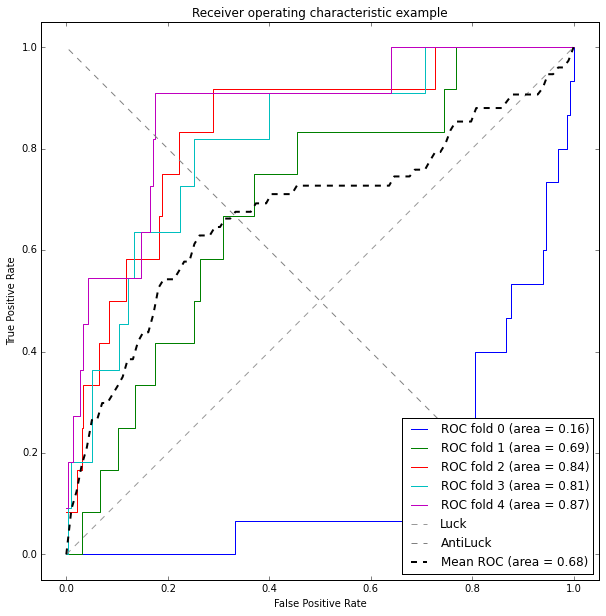

In [165]:
mean_tpr = 0.0
mean_fpr = np.linspace(0, 1, 100)
all_tpr = []

plt.figure(figsize=(10,10))

for i, (train, test) in enumerate(cv):
    probas_ = classifier.fit(X_acl_best.ix[train], y_acl_train.ix[train]).predict_proba(X_acl_best.ix[test])
    # Compute ROC curve and area the curve
    fpr, tpr, thresholds = roc_curve(y_acl_train.ix[test], probas_[:, 1])
    mean_tpr += interp(mean_fpr, fpr, tpr)
    mean_tpr[0] = 0.0
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw=1, label='ROC fold %d (area = %0.2f)' % (i, roc_auc))

plt.plot([0, 1], [0, 1], '--', color=(0.6, 0.6, 0.6), label='Luck')
plt.plot([1, 0], [0, 1], '--', color=(.5,.5,.5), label='AntiLuck')

mean_tpr /= len(cv)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
acl_best_thresh = thresholds[np.argmax(mean_tpr - mean_fpr)]
plt.plot(mean_fpr, mean_tpr, 'k--',
         label='Mean ROC (area = %0.2f)' % mean_auc, lw=2)

plt.xlim([-0.05, 1.05])
plt.ylim([-0.05, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic example')
plt.legend(loc="lower right")

In [168]:
X_acl_test = pd.DataFrame(acl_scale_fit.transform(X_acl_test).transpose()[best_acl_cols].transpose(), columns = X_acl_test.columns[best_acl_cols])

In [169]:
acl_probas = classifier.fit(X_acl_best, y_acl_train).predict_proba(X_acl_test)
X_acl_pred = []
for row in acl_probas:
    if row[1] > acl_best_thresh:
        X_acl_pred.append(1)
    else:
        X_acl_pred.append(0)


In [170]:
accuracy_score(X_acl_pred, y_acl_test)

0.92038834951456305

In [171]:
precision_score(X_acl_pred, y_acl_test)

0.5

In [172]:
recall_score(X_acl_pred, y_acl_test)

0.14634146341463414

In [173]:
f1_score(X_acl_pred, y_acl_test)

0.22641509433962262

# NOISE POP MUSIC FESTIVAL

In [174]:
y_noi, X_noi = df.noi_2015, df.ix[:, 'fans':'noi_counts']
X_noi_train, X_noi_test, y_noi_train, y_noi_test = train_test_split(X_noi, y_noi, test_size = 0.25, random_state = 4444)
noi_scale_fit = StandardScaler().fit(X_noi_train)
X_noi_train_scaled = pd.DataFrame(noi_scale_fit.transform(X_noi_train), columns = X_noi_train.columns)
new_noi_features = SelectKBest(f_classif, k = 10)
X_noi_best = new_noi_features.fit_transform(X_noi_train_scaled, y_noi_train)
best_noi_cols = new_noi_features.get_support(True)
X_noi_best = pd.DataFrame(X_noi_best, columns = X_noi.columns[best_noi_cols])
X_noi.columns[best_noi_cols]

Index([u'2015_shows', u'country', u'pop', u'hip hop', u'folk', u'bon_counts',
       u'acl_counts', u'sas_counts', u'sxs_counts', u'noi_counts'],
      dtype='object')

In [147]:
cw_range = [{1:1-cw, 0:cw} for cw in np.arange(.01, .2, .01)]
gamma_range = np.logspace(-5, 0, 9)
param_grid = dict(gamma=gamma_range, class_weight=cw_range)
cv = ShuffleSplit(len(y_noi_train), n_iter=5, test_size=0.2, random_state=42)
for score in ['accuracy','precision', 'recall']:
    grid = GridSearchCV(SVC(kernel = 'rbf'), param_grid=param_grid, cv=cv, scoring = score, verbose= 10)
    grid.fit(X_noi_best, y_noi_train)
    print("The best parameters are %s with a score of %0.2f"
          % (grid.best_params_, grid.best_score_))

Fitting 5 folds for each of 171 candidates, totalling 855 fits
[CV] gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s

[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.1s



[CV] gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.993528 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.983819 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.987055 -   0.0s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999

[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.5s



[CV] gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.983819 -   0.0s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.987055 -   0.0s
[CV] gamma=0.000177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=0.000177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=0.000177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.993528 -   0.1s
[CV] gamma=0.000177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.00

[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    0.8s
[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    1.1s



[CV] gamma=0.000749894209332, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.983819 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.987055 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.993528 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.003162277

[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    1.5s
[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    1.8s



[CV] gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.880259 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.970874 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.919094 -   0.1s
[CV] gamma=0.237137370566, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.237137370566, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.786408 -   0.1s
[CV] gamma=0.237137370566, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.237137370566, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.799353 -   0.1s
[CV] gamma=0.237137370566, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.237137370566, class_weight={0: 0.01

[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    2.3s
[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    2.7s



[CV] gamma=4.21696503429e-05, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.02, 1: 0.97999999999999998}, score=1.000000 -   0.0s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.02, 1: 0.97999999999999998}, score=1.000000 -   0.0s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.993528 -   0.0s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.983819 -   0.0s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.987055 -   0.0s
[CV] gamma=0.000177827941004, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.00

[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    3.0s
[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    3.4s



[CV] gamma=0.0133352143216, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.987055 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.980583 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.983819 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.987055 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.056234132519, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.964401 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.056234132519, class_weight=

[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    3.8s
[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    4.2s



[CV] gamma=4.21696503429e-05, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.993528 -   0.0s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.983819 -   0.0s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.987055 -   0.0s
[CV] gamma=0.000177827941004, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=1.000000 -   0.0s
[CV] gamma=0.000177827941004, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.029

[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    4.6s
[Parallel(n_jobs=1)]: Done 128 jobs       | elapsed:    4.9s



[CV] gamma=0.237137370566, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.237137370566, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.990291 -   0.0s
[CV] gamma=0.237137370566, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.237137370566, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.993528 -   0.0s
[CV] gamma=0.237137370566, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.237137370566, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.983819 -   0.0s
[CV] gamma=0.237137370566, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.237137370566, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.987055 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=1.0, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.99

[Parallel(n_jobs=1)]: Done 145 jobs       | elapsed:    5.3s
[Parallel(n_jobs=1)]: Done 162 jobs       | elapsed:    5.7s



[CV] gamma=0.0133352143216, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=1.000000 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=1.000000 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.993528 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.983819 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.040000000000000001, 1: 

[Parallel(n_jobs=1)]: Done 181 jobs       | elapsed:    6.1s
[Parallel(n_jobs=1)]: Done 200 jobs       | elapsed:    6.5s



[CV] gamma=0.000749894209332, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996}, score=0.987055 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996}, score=1.000000 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996}, score=1.000000 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996}, score=0.993528 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.05000000000

[Parallel(n_jobs=1)]: Done 221 jobs       | elapsed:    6.9s
[Parallel(n_jobs=1)]: Done 242 jobs       | elapsed:    7.3s



[CV] gamma=0.000749894209332, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995}, score=1.000000 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995}, score=1.000000 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995}, score=0.993528 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995}, score=0.983819 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.060

[Parallel(n_jobs=1)]: Done 265 jobs       | elapsed:    7.7s
[Parallel(n_jobs=1)]: Done 288 jobs       | elapsed:    8.1s



[CV] gamma=0.000749894209332, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005}, score=0.993528 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005}, score=0.983819 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005}, score=0.987055 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005}, score=1.000000 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.0699999

[Parallel(n_jobs=1)]: Done 313 jobs       | elapsed:    8.6s
[Parallel(n_jobs=1)]: Done 338 jobs       | elapsed:    8.9s



[CV] gamma=0.00316227766017, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.983819 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.987055 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=1.000000 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=1.000000 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.080000000000000002,

[Parallel(n_jobs=1)]: Done 365 jobs       | elapsed:    9.4s
[Parallel(n_jobs=1)]: Done 392 jobs       | elapsed:    9.8s



[CV] gamma=0.056234132519, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.056234132519, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003}, score=1.000000 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.056234132519, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003}, score=1.000000 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.056234132519, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003}, score=0.993528 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.056234132519, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003}, score=0.983819 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.056234132519, class_weight={0: 0.089999999999999997, 1: 0.91000000

[Parallel(n_jobs=1)]: Done 421 jobs       | elapsed:   10.2s
[Parallel(n_jobs=1)]: Done 450 jobs       | elapsed:   10.7s



[CV] gamma=1.0, class_weight={0: 0.099999999999999992, 1: 0.90000000000000002} 
[CV]  gamma=1.0, class_weight={0: 0.099999999999999992, 1: 0.90000000000000002}, score=0.987055 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=1.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=1.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.993528 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.983819 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.987055 -   0.0s
[CV]

[Parallel(n_jobs=1)]: Done 481 jobs       | elapsed:   11.1s
[Parallel(n_jobs=1)]: Done 512 jobs       | elapsed:   11.6s



[CV] gamma=0.000177827941004, class_weight={0: 0.12, 1: 0.88} ........
[CV]  gamma=0.000177827941004, class_weight={0: 0.12, 1: 0.88}, score=0.983819 -   0.0s
[CV] gamma=0.000177827941004, class_weight={0: 0.12, 1: 0.88} ........
[CV]  gamma=0.000177827941004, class_weight={0: 0.12, 1: 0.88}, score=0.987055 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.12, 1: 0.88} ........
[CV]  gamma=0.000749894209332, class_weight={0: 0.12, 1: 0.88}, score=1.000000 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.12, 1: 0.88} ........
[CV]  gamma=0.000749894209332, class_weight={0: 0.12, 1: 0.88}, score=1.000000 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.12, 1: 0.88} ........
[CV]  gamma=0.000749894209332, class_weight={0: 0.12, 1: 0.88}, score=0.993528 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.12, 1: 0.88} ........
[CV]  gamma=0.000749894209332, class_weight={0: 0.12, 1: 0.88}, score=0.983819 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0

[Parallel(n_jobs=1)]: Done 545 jobs       | elapsed:   12.1s
[Parallel(n_jobs=1)]: Done 578 jobs       | elapsed:   12.5s



[CV] gamma=0.237137370566, class_weight={0: 0.13, 1: 0.87} ...........
[CV]  gamma=0.237137370566, class_weight={0: 0.13, 1: 0.87}, score=1.000000 -   0.0s
[CV] gamma=0.237137370566, class_weight={0: 0.13, 1: 0.87} ...........
[CV]  gamma=0.237137370566, class_weight={0: 0.13, 1: 0.87}, score=0.993528 -   0.0s
[CV] gamma=0.237137370566, class_weight={0: 0.13, 1: 0.87} ...........
[CV]  gamma=0.237137370566, class_weight={0: 0.13, 1: 0.87}, score=0.983819 -   0.0s
[CV] gamma=0.237137370566, class_weight={0: 0.13, 1: 0.87} ...........
[CV]  gamma=0.237137370566, class_weight={0: 0.13, 1: 0.87}, score=0.987055 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.13, 1: 0.87} ......................
[CV]  gamma=1.0, class_weight={0: 0.13, 1: 0.87}, score=1.000000 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.13, 1: 0.87} ......................
[CV]  gamma=1.0, class_weight={0: 0.13, 1: 0.87}, score=1.000000 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.13, 1: 0.87} ......................
[CV]  gamma=1.

[Parallel(n_jobs=1)]: Done 613 jobs       | elapsed:   13.0s
[Parallel(n_jobs=1)]: Done 648 jobs       | elapsed:   13.6s



[CV] gamma=0.000749894209332, class_weight={0: 0.15000000000000002, 1: 0.84999999999999998} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.15000000000000002, 1: 0.84999999999999998}, score=1.000000 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.15000000000000002, 1: 0.84999999999999998} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.15000000000000002, 1: 0.84999999999999998}, score=1.000000 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.15000000000000002, 1: 0.84999999999999998} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.15000000000000002, 1: 0.84999999999999998}, score=0.993528 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.15000000000000002, 1: 0.84999999999999998} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.15000000000000002, 1: 0.84999999999999998}, score=0.983819 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.15000000000000002, 1: 0.84999999999999998} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.150000000000

[Parallel(n_jobs=1)]: Done 685 jobs       | elapsed:   14.2s
[Parallel(n_jobs=1)]: Done 722 jobs       | elapsed:   14.8s



[CV] gamma=1e-05, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=1e-05, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.993528 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=1e-05, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.983819 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=1e-05, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.987055 -   0.0s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=1.000000 -   0.0s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=1.000000 -   0.0s
[CV] gamma=4.216

[Parallel(n_jobs=1)]: Done 761 jobs       | elapsed:   15.3s
[Parallel(n_jobs=1)]: Done 800 jobs       | elapsed:   15.8s



[CV] gamma=0.237137370566, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995} 
[CV]  gamma=0.237137370566, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995}, score=1.000000 -   0.0s
[CV] gamma=0.237137370566, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995} 
[CV]  gamma=0.237137370566, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995}, score=1.000000 -   0.0s
[CV] gamma=0.237137370566, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995} 
[CV]  gamma=0.237137370566, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995}, score=0.993528 -   0.0s
[CV] gamma=0.237137370566, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995} 
[CV]  gamma=0.237137370566, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995}, score=0.983819 -   0.0s
[CV] gamma=0.237137370566, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995} 
[CV]  gamma=0.237137370566, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995}

[Parallel(n_jobs=1)]: Done 841 jobs       | elapsed:   16.5s
[Parallel(n_jobs=1)]: Done 855 out of 855 | elapsed:   16.8s finished



The best parameters are {'gamma': 1.0000000000000001e-05, 'class_weight': {0: 0.02, 1: 0.97999999999999998}} with a score of 0.99
Fitting 5 folds for each of 171 candidates, totalling 855 fits
[CV] gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s

[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.2s



[CV] gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999

[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.6s



[CV] gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.0s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=0.000177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=0.000177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=0.000177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=0.000177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.00

[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    0.9s
[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    1.3s



[CV] gamma=0.000749894209332, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=0.000749894209332, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.003162277

[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    1.8s
[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    2.3s



[CV] gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.166667 -   0.1s
[CV] gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.043478 -   0.1s
[CV] gamma=0.237137370566, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.237137370566, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=0.237137370566, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.237137370566, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=0.237137370566, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.237137370566, class_weight={0: 0.01

[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    3.0s
[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    3.5s



[CV] gamma=4.21696503429e-05, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.000000 -   0.0s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.000000 -   0.0s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.000000 -   0.0s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.000000 -   0.0s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.000000 -   0.0s
[CV] gamma=0.000177827941004, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.00

[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    4.0s
[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    4.5s



[CV] gamma=0.0133352143216, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.000000 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.000000 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.000000 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.000000 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.056234132519, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.000000 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.056234132519, class_weight=

[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    5.0s
[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    5.5s



[CV] gamma=4.21696503429e-05, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.000000 -   0.0s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.000000 -   0.0s
[CV] gamma=0.000177827941004, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.000000 -   0.0s
[CV] gamma=0.000177827941004, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.000000 -   0.0s
[CV] gamma=0.000177827941004, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.029

[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    5.9s
[Parallel(n_jobs=1)]: Done 128 jobs       | elapsed:    6.3s



[CV] gamma=0.237137370566, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.237137370566, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.000000 -   0.0s
[CV] gamma=0.237137370566, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.237137370566, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.000000 -   0.0s
[CV] gamma=0.237137370566, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.237137370566, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.000000 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=1.0, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.000000 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=1.0, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.000000 -   0.0s
[CV] gam

[Parallel(n_jobs=1)]: Done 145 jobs       | elapsed:    6.8s
[Parallel(n_jobs=1)]: Done 162 jobs       | elapsed:    7.2s



[CV] gamma=0.0133352143216, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.000000 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.000000 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.000000 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.056234132519, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.000000 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.056234132519, class_weight={0: 0.040000000000000001, 1: 0.95

[Parallel(n_jobs=1)]: Done 181 jobs       | elapsed:    7.7s
[Parallel(n_jobs=1)]: Done 200 jobs       | elapsed:    8.0s



[CV] gamma=0.00316227766017, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996}, score=0.000000 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996}, score=0.000000 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996}, score=0.000000 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996}, score=0.000000 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.0500000000000

[Parallel(n_jobs=1)]: Done 221 jobs       | elapsed:    8.5s
[Parallel(n_jobs=1)]: Done 242 jobs       | elapsed:    8.9s



[CV] gamma=0.000749894209332, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995}, score=0.000000 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995}, score=0.000000 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995}, score=0.000000 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995}, score=0.000000 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.0600000

[Parallel(n_jobs=1)]: Done 265 jobs       | elapsed:    9.5s
[Parallel(n_jobs=1)]: Done 288 jobs       | elapsed:   10.0s



[CV]  gamma=0.000749894209332, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005}, score=0.000000 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005}, score=0.000000 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005}, score=0.000000 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005}, score=0.000000 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005}, score=0.000000 -   0.0s
[CV] gamma=0.00316227766017, cla

[Parallel(n_jobs=1)]: Done 313 jobs       | elapsed:   10.5s
[Parallel(n_jobs=1)]: Done 338 jobs       | elapsed:   10.8s



[CV] gamma=0.00316227766017, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.08000000000000000

[Parallel(n_jobs=1)]: Done 365 jobs       | elapsed:   11.3s
[Parallel(n_jobs=1)]: Done 392 jobs       | elapsed:   11.7s



[CV] gamma=0.056234132519, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.056234132519, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003}, score=0.000000 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.056234132519, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003}, score=0.000000 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.056234132519, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003}, score=0.000000 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.056234132519, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003}, score=0.000000 -   0.0s
[CV] gamma=0.237137370566, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.237137370566, class_weight={0: 0.089999999999999997, 1: 0.91000000

[Parallel(n_jobs=1)]: Done 421 jobs       | elapsed:   12.1s
[Parallel(n_jobs=1)]: Done 450 jobs       | elapsed:   12.6s



[CV] gamma=1.0, class_weight={0: 0.099999999999999992, 1: 0.90000000000000002} 
[CV]  gamma=1.0, class_weight={0: 0.099999999999999992, 1: 0.90000000000000002}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV]

[Parallel(n_jobs=1)]: Done 481 jobs       | elapsed:   13.0s
[Parallel(n_jobs=1)]: Done 512 jobs       | elapsed:   13.5s



[CV] gamma=0.000177827941004, class_weight={0: 0.12, 1: 0.88} ........
[CV]  gamma=0.000177827941004, class_weight={0: 0.12, 1: 0.88}, score=0.000000 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.12, 1: 0.88} ........
[CV]  gamma=0.000749894209332, class_weight={0: 0.12, 1: 0.88}, score=0.000000 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.12, 1: 0.88} ........
[CV]  gamma=0.000749894209332, class_weight={0: 0.12, 1: 0.88}, score=0.000000 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.12, 1: 0.88} ........
[CV]  gamma=0.000749894209332, class_weight={0: 0.12, 1: 0.88}, score=0.000000 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.12, 1: 0.88} ........
[CV]  gamma=0.000749894209332, class_weight={0: 0.12, 1: 0.88}, score=0.000000 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.12, 1: 0.88} ........
[CV]  gamma=0.000749894209332, class_weight={0: 0.12, 1: 0.88}, score=0.000000 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0:

[Parallel(n_jobs=1)]: Done 545 jobs       | elapsed:   14.0s
[Parallel(n_jobs=1)]: Done 578 jobs       | elapsed:   14.3s



[CV] gamma=0.237137370566, class_weight={0: 0.13, 1: 0.87} ...........
[CV]  gamma=0.237137370566, class_weight={0: 0.13, 1: 0.87}, score=0.000000 -   0.0s
[CV] gamma=0.237137370566, class_weight={0: 0.13, 1: 0.87} ...........
[CV]  gamma=0.237137370566, class_weight={0: 0.13, 1: 0.87}, score=0.000000 -   0.0s
[CV] gamma=0.237137370566, class_weight={0: 0.13, 1: 0.87} ...........
[CV]  gamma=0.237137370566, class_weight={0: 0.13, 1: 0.87}, score=0.000000 -   0.0s
[CV] gamma=0.237137370566, class_weight={0: 0.13, 1: 0.87} ...........
[CV]  gamma=0.237137370566, class_weight={0: 0.13, 1: 0.87}, score=0.000000 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.13, 1: 0.87} ......................
[CV]  gamma=1.0, class_weight={0: 0.13, 1: 0.87}, score=0.000000 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.13, 1: 0.87} ......................
[CV]  gamma=1.0, class_weight={0: 0.13, 1: 0.87}, score=0.000000 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.13, 1: 0.87} ......................
[CV]  gamma=1.

[Parallel(n_jobs=1)]: Done 613 jobs       | elapsed:   14.9s
[Parallel(n_jobs=1)]: Done 648 jobs       | elapsed:   15.3s



[CV] gamma=0.000749894209332, class_weight={0: 0.15000000000000002, 1: 0.84999999999999998} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.15000000000000002, 1: 0.84999999999999998}, score=0.000000 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.15000000000000002, 1: 0.84999999999999998} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.15000000000000002, 1: 0.84999999999999998}, score=0.000000 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.15000000000000002, 1: 0.84999999999999998} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.15000000000000002, 1: 0.84999999999999998}, score=0.000000 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.15000000000000002, 1: 0.84999999999999998} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.15000000000000002, 1: 0.84999999999999998}, score=0.000000 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.15000000000000002, 1: 0.84999999999999998} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.150000000000

[Parallel(n_jobs=1)]: Done 685 jobs       | elapsed:   15.9s
[Parallel(n_jobs=1)]: Done 722 jobs       | elapsed:   16.4s



[CV] gamma=1e-05, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=1e-05, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=1e-05, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=1e-05, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=1e-05, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=1e-05, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.000000 -   0.0s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.170000000000000

[Parallel(n_jobs=1)]: Done 761 jobs       | elapsed:   16.8s
[Parallel(n_jobs=1)]: Done 800 jobs       | elapsed:   17.3s



[CV]  gamma=0.056234132519, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995}, score=0.000000 -   0.0s
[CV] gamma=0.237137370566, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995} 
[CV]  gamma=0.237137370566, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995}, score=0.000000 -   0.0s
[CV] gamma=0.237137370566, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995} 
[CV]  gamma=0.237137370566, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995}, score=0.000000 -   0.0s
[CV] gamma=0.237137370566, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995} 
[CV]  gamma=0.237137370566, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995}, score=0.000000 -   0.0s
[CV] gamma=0.237137370566, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995} 
[CV]  gamma=0.237137370566, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995}, score=0.000000 -   0.0s
[CV] gamma=0.237137370566, class_weight={0: 0.18000000000000002,

[Parallel(n_jobs=1)]: Done 841 jobs       | elapsed:   17.8s
[Parallel(n_jobs=1)]: Done 855 out of 855 | elapsed:   18.1s finished



The best parameters are {'gamma': 0.056234132519034911, 'class_weight': {0: 0.02, 1: 0.97999999999999998}} with a score of 0.20
Fitting 5 folds for each of 171 candidates, totalling 855 fits
[CV] gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s

/Users/johngilling/anaconda/lib/python2.7/site-packages/sklearn/metrics/classification.py:960: UndefinedMetricWarning: Recall is ill-defined and being set to 0.0 due to no true samples.
  'recall', 'true', average, warn_for)
[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.1s



[CV] gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999

[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.5s



[CV] gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.0s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.0s
[CV] gamma=0.000177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=0.000177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=0.000177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=0.000177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.00

[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    0.8s
[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    1.1s



[CV] gamma=0.000749894209332, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.003162277

[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    1.5s
[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    1.9s



[CV] gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.200000 -   0.1s
[CV] gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.250000 -   0.1s
[CV] gamma=0.237137370566, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.237137370566, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=0.237137370566, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.237137370566, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=0.237137370566, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.237137370566, class_weight={0: 0.01

[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    2.4s
[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    2.8s



[CV] gamma=1e-05, class_weight={0: 0.02, 1: 0.97999999999999998} .....
[CV]  gamma=1e-05, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.000000 -   0.0s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.000000 -   0.0s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.000000 -   0.0s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.000000 -   0.0s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.000000 -   0.0s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=4.21696503429e-05, clas

[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    3.3s
[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    3.8s



[CV] gamma=0.0133352143216, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.000000 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.000000 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.000000 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.056234132519, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.000000 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.056234132519, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.000000 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.056234132519, class_weight={0

[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    4.2s
[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    4.6s



[CV] gamma=4.21696503429e-05, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.000000 -   0.0s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.000000 -   0.0s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.000000 -   0.0s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.000000 -   0.0s
[CV] gamma=0.000177827941004, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.029

[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    5.0s
[Parallel(n_jobs=1)]: Done 128 jobs       | elapsed:    5.4s



[CV] gamma=0.237137370566, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.237137370566, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.000000 -   0.0s
[CV] gamma=0.237137370566, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.237137370566, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.000000 -   0.0s
[CV] gamma=0.237137370566, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.237137370566, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.000000 -   0.0s
[CV] gamma=0.237137370566, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.237137370566, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.000000 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=1.0, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.00

[Parallel(n_jobs=1)]: Done 145 jobs       | elapsed:    5.8s
[Parallel(n_jobs=1)]: Done 162 jobs       | elapsed:    6.2s



[CV] gamma=0.0133352143216, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.000000 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.000000 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.000000 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.056234132519, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.000000 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.056234132519, class_weight={0: 0.040000000000000001, 1: 0.95

[Parallel(n_jobs=1)]: Done 181 jobs       | elapsed:    6.7s
[Parallel(n_jobs=1)]: Done 200 jobs       | elapsed:    7.1s



[CV] gamma=0.000749894209332, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996}, score=0.000000 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996}, score=0.000000 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996}, score=0.000000 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996}, score=0.000000 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.0500000

[Parallel(n_jobs=1)]: Done 221 jobs       | elapsed:    7.5s
[Parallel(n_jobs=1)]: Done 242 jobs       | elapsed:    7.9s



[CV] gamma=0.000749894209332, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995}, score=0.000000 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995}, score=0.000000 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995}, score=0.000000 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995}, score=0.000000 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.06000

[Parallel(n_jobs=1)]: Done 265 jobs       | elapsed:    8.3s
[Parallel(n_jobs=1)]: Done 288 jobs       | elapsed:    8.7s



[CV] gamma=0.000749894209332, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005}, score=0.000000 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005}, score=0.000000 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005}, score=0.000000 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005}, score=0.000000 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.069999999

[Parallel(n_jobs=1)]: Done 313 jobs       | elapsed:    9.1s
[Parallel(n_jobs=1)]: Done 338 jobs       | elapsed:    9.4s



[CV] gamma=0.00316227766017, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.000000 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.0800000000000

[Parallel(n_jobs=1)]: Done 365 jobs       | elapsed:    9.9s
[Parallel(n_jobs=1)]: Done 392 jobs       | elapsed:   10.3s



[CV] gamma=0.056234132519, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.056234132519, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003}, score=0.000000 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.056234132519, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003}, score=0.000000 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.056234132519, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003}, score=0.000000 -   0.0s
[CV] gamma=0.237137370566, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.237137370566, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003}, score=0.000000 -   0.0s
[CV] gamma=0.237137370566, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.237137370566, class_weight={0: 0.089999999999999997, 1: 0.91000000

[Parallel(n_jobs=1)]: Done 421 jobs       | elapsed:   10.7s
[Parallel(n_jobs=1)]: Done 450 jobs       | elapsed:   11.2s



[CV] gamma=1.0, class_weight={0: 0.099999999999999992, 1: 0.90000000000000002} 
[CV]  gamma=1.0, class_weight={0: 0.099999999999999992, 1: 0.90000000000000002}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV]

[Parallel(n_jobs=1)]: Done 481 jobs       | elapsed:   11.6s
[Parallel(n_jobs=1)]: Done 512 jobs       | elapsed:   12.0s



[CV] gamma=0.000177827941004, class_weight={0: 0.12, 1: 0.88} ........
[CV]  gamma=0.000177827941004, class_weight={0: 0.12, 1: 0.88}, score=0.000000 -   0.0s
[CV] gamma=0.000177827941004, class_weight={0: 0.12, 1: 0.88} ........
[CV]  gamma=0.000177827941004, class_weight={0: 0.12, 1: 0.88}, score=0.000000 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.12, 1: 0.88} ........
[CV]  gamma=0.000749894209332, class_weight={0: 0.12, 1: 0.88}, score=0.000000 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.12, 1: 0.88} ........
[CV]  gamma=0.000749894209332, class_weight={0: 0.12, 1: 0.88}, score=0.000000 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.12, 1: 0.88} ........
[CV]  gamma=0.000749894209332, class_weight={0: 0.12, 1: 0.88}, score=0.000000 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.12, 1: 0.88} ........
[CV]  gamma=0.000749894209332, class_weight={0: 0.12, 1: 0.88}, score=0.000000 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0

[Parallel(n_jobs=1)]: Done 545 jobs       | elapsed:   12.4s
[Parallel(n_jobs=1)]: Done 578 jobs       | elapsed:   12.8s



[CV] gamma=0.237137370566, class_weight={0: 0.13, 1: 0.87} ...........
[CV]  gamma=0.237137370566, class_weight={0: 0.13, 1: 0.87}, score=0.000000 -   0.0s
[CV] gamma=0.237137370566, class_weight={0: 0.13, 1: 0.87} ...........
[CV]  gamma=0.237137370566, class_weight={0: 0.13, 1: 0.87}, score=0.000000 -   0.0s
[CV] gamma=0.237137370566, class_weight={0: 0.13, 1: 0.87} ...........
[CV]  gamma=0.237137370566, class_weight={0: 0.13, 1: 0.87}, score=0.000000 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.13, 1: 0.87} ......................
[CV]  gamma=1.0, class_weight={0: 0.13, 1: 0.87}, score=0.000000 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.13, 1: 0.87} ......................
[CV]  gamma=1.0, class_weight={0: 0.13, 1: 0.87}, score=0.000000 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.13, 1: 0.87} ......................
[CV]  gamma=1.0, class_weight={0: 0.13, 1: 0.87}, score=0.000000 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.13, 1: 0.87} ......................
[CV]  gamma=1.0, class_we

[Parallel(n_jobs=1)]: Done 613 jobs       | elapsed:   13.2s
[Parallel(n_jobs=1)]: Done 648 jobs       | elapsed:   13.6s



[CV] gamma=0.000749894209332, class_weight={0: 0.15000000000000002, 1: 0.84999999999999998} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.15000000000000002, 1: 0.84999999999999998}, score=0.000000 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.15000000000000002, 1: 0.84999999999999998} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.15000000000000002, 1: 0.84999999999999998}, score=0.000000 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.15000000000000002, 1: 0.84999999999999998} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.15000000000000002, 1: 0.84999999999999998}, score=0.000000 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.15000000000000002, 1: 0.84999999999999998} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.15000000000000002, 1: 0.84999999999999998}, score=0.000000 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.15000000000000002, 1: 0.84999999999999998} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.15000000000000

[Parallel(n_jobs=1)]: Done 685 jobs       | elapsed:   14.0s
[Parallel(n_jobs=1)]: Done 722 jobs       | elapsed:   14.5s



[CV] gamma=1e-05, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=1e-05, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=1e-05, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=1e-05, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=1e-05, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=1e-05, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.000000 -   0.0s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.170000000000000

[Parallel(n_jobs=1)]: Done 761 jobs       | elapsed:   14.8s
[Parallel(n_jobs=1)]: Done 800 jobs       | elapsed:   15.3s



[CV] gamma=0.056234132519, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995} 
[CV]  gamma=0.056234132519, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995}, score=0.000000 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995} 
[CV]  gamma=0.056234132519, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995}, score=0.000000 -   0.0s
[CV] gamma=0.237137370566, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995} 
[CV]  gamma=0.237137370566, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995}, score=0.000000 -   0.0s
[CV] gamma=0.237137370566, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995} 
[CV]  gamma=0.237137370566, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995}, score=0.000000 -   0.0s
[CV] gamma=0.237137370566, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995} 
[CV]  gamma=0.237137370566, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995}

[Parallel(n_jobs=1)]: Done 841 jobs       | elapsed:   15.8s
[Parallel(n_jobs=1)]: Done 855 out of 855 | elapsed:   16.1s finished



The best parameters are {'gamma': 0.056234132519034911, 'class_weight': {0: 0.01, 1: 0.98999999999999999}} with a score of 0.09


The best parameters are {'gamma': 1.0e-05, 'class_weight': {0: 0.02, 1: 0.98}} with an accuracy score of 0.99.

The best parameters are {'gamma': 0.05623, 'class_weight': {0: 0.02, 1: 0.98}} with a precision score of 0.20.

The best parameters are {'gamma': 0.05623, 'class_weight': {0: 0.01, 1: 0.99}} with a recall score of 0.09.

In [148]:
cw_range = [{1:1-cw, 0:cw} for cw in np.arange(.01, .02, .001)]
gamma_range = np.logspace(-5, 0, 9)
param_grid = dict(gamma=gamma_range, class_weight=cw_range)
cv = ShuffleSplit(len(y_noi_train), n_iter=5, test_size=0.2, random_state=42)
for score in ['accuracy','precision', 'recall']:
    grid = GridSearchCV(SVC(kernel = 'rbf'), param_grid=param_grid, cv=cv, scoring = score, verbose= 10)
    grid.fit(X_noi_best, y_noi_train)
    print("The best parameters are %s with a score of %0.2f"
          % (grid.best_params_, grid.best_score_))

Fitting 5 folds for each of 90 candidates, totalling 450 fits
[CV] gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s

[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.1s



[CV] gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.993528 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.983819 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.987055 -   0.0s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999

[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.5s



[CV] gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.983819 -   0.1s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.987055 -   0.1s
[CV] gamma=0.000177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=0.000177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=0.000177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.993528 -   0.1s
[CV] gamma=0.000177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.00

[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    0.7s
[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    1.0s



[CV] gamma=0.000749894209332, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.983819 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.987055 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.993528 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.003162277

[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    1.4s
[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    1.8s



[CV] gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.880259 -   0.1s
[CV] gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.970874 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.919094 -   0.0s
[CV] gamma=0.237137370566, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.237137370566, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.786408 -   0.1s
[CV] gamma=0.237137370566, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.237137370566, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.799353 -   0.1s
[CV] gamma=0.237137370566, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.237137370566, class_weight={0: 0.01

[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    2.3s
[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    2.8s



[CV] gamma=1e-05, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=1e-05, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score=0.987055 -   0.0s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score=1.000000 -   0.1s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score=1.000000 -   0.1s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score=0.993528 -   0.1s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.010999999999999999, 1: 0.98

[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    3.4s
[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    4.1s



[CV] gamma=0.0133352143216, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score=0.944984 -   0.1s
[CV] gamma=0.0133352143216, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score=0.983819 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score=0.987055 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=0.056234132519, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score=0.809061 -   0.1s
[CV] gamma=0.056234132519, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=0.056234132519, class_weight={0: 0.010999999999999999, 1: 0.98

[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    4.8s
[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    5.6s



[CV] gamma=4.21696503429e-05, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999}, score=0.983819 -   0.0s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999}, score=0.987055 -   0.0s
[CV] gamma=0.000177827941004, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.000177827941004, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.000177827941004, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.011

[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    6.4s
[Parallel(n_jobs=1)]: Done 128 jobs       | elapsed:    7.2s



[CV] gamma=0.237137370566, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999} 
[CV]  gamma=0.237137370566, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999}, score=0.980583 -   0.0s
[CV] gamma=0.237137370566, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999} 
[CV]  gamma=0.237137370566, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999}, score=0.957929 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999} 
[CV]  gamma=1.0, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999}, score=0.977346 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999} 
[CV]  gamma=1.0, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999}, score=0.967638 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999} 
[CV]  gamma=1.0, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999}, score=0.993528 -   0.1s
[CV] gamma=1.0, class_weight={

[Parallel(n_jobs=1)]: Done 145 jobs       | elapsed:    8.1s
[Parallel(n_jobs=1)]: Done 162 jobs       | elapsed:    9.1s



[CV] gamma=0.0133352143216, class_weight={0: 0.012999999999999998, 1: 0.98699999999999999} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.012999999999999998, 1: 0.98699999999999999}, score=0.951456 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.012999999999999998, 1: 0.98699999999999999} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.012999999999999998, 1: 0.98699999999999999}, score=0.983819 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.012999999999999998, 1: 0.98699999999999999} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.012999999999999998, 1: 0.98699999999999999}, score=0.987055 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.012999999999999998, 1: 0.98699999999999999} 
[CV]  gamma=0.056234132519, class_weight={0: 0.012999999999999998, 1: 0.98699999999999999}, score=0.870550 -   0.1s
[CV] gamma=0.056234132519, class_weight={0: 0.012999999999999998, 1: 0.98699999999999999} 
[CV]  gamma=0.056234132519, class_weight={0: 0.012999999999999998, 1: 0.98

[Parallel(n_jobs=1)]: Done 181 jobs       | elapsed:   10.2s
[Parallel(n_jobs=1)]: Done 200 jobs       | elapsed:   11.0s



[CV] gamma=0.00316227766017, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999}, score=1.000000 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999}, score=0.993528 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999}, score=0.983819 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.0139999999999

[Parallel(n_jobs=1)]: Done 221 jobs       | elapsed:   12.0s
[Parallel(n_jobs=1)]: Done 242 jobs       | elapsed:   13.1s



[CV] gamma=0.000749894209332, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999}, score=0.993528 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999}, score=0.983819 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999}, score=0.987055 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.0149999

[Parallel(n_jobs=1)]: Done 265 jobs       | elapsed:   14.1s
[Parallel(n_jobs=1)]: Done 288 jobs       | elapsed:   15.0s



[CV] gamma=0.000749894209332, class_weight={0: 0.015999999999999993, 1: 0.98399999999999999} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.015999999999999993, 1: 0.98399999999999999}, score=0.983819 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.015999999999999993, 1: 0.98399999999999999} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.015999999999999993, 1: 0.98399999999999999}, score=0.987055 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.015999999999999993, 1: 0.98399999999999999} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.015999999999999993, 1: 0.98399999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.015999999999999993, 1: 0.98399999999999999} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.015999999999999993, 1: 0.98399999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.015999999999999993, 1: 0.98399999999999999} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.015999999

[Parallel(n_jobs=1)]: Done 313 jobs       | elapsed:   16.2s
[Parallel(n_jobs=1)]: Done 338 jobs       | elapsed:   17.3s



[CV] gamma=0.00316227766017, class_weight={0: 0.016999999999999994, 1: 0.98299999999999998} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.016999999999999994, 1: 0.98299999999999998}, score=0.983819 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.016999999999999994, 1: 0.98299999999999998} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.016999999999999994, 1: 0.98299999999999998}, score=0.987055 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.016999999999999994, 1: 0.98299999999999998} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.016999999999999994, 1: 0.98299999999999998}, score=0.967638 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.016999999999999994, 1: 0.98299999999999998} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.016999999999999994, 1: 0.98299999999999998}, score=0.970874 -   0.1s
[CV] gamma=0.0133352143216, class_weight={0: 0.016999999999999994, 1: 0.98299999999999998} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.016999999999999994,

[Parallel(n_jobs=1)]: Done 365 jobs       | elapsed:   18.6s
[Parallel(n_jobs=1)]: Done 392 jobs       | elapsed:   19.8s



[CV] gamma=0.056234132519, class_weight={0: 0.017999999999999995, 1: 0.98199999999999998} 
[CV]  gamma=0.056234132519, class_weight={0: 0.017999999999999995, 1: 0.98199999999999998}, score=0.964401 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.017999999999999995, 1: 0.98199999999999998} 
[CV]  gamma=0.056234132519, class_weight={0: 0.017999999999999995, 1: 0.98199999999999998}, score=0.983819 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.017999999999999995, 1: 0.98199999999999998} 
[CV]  gamma=0.056234132519, class_weight={0: 0.017999999999999995, 1: 0.98199999999999998}, score=0.990291 -   0.0s
[CV] gamma=0.237137370566, class_weight={0: 0.017999999999999995, 1: 0.98199999999999998} 
[CV]  gamma=0.237137370566, class_weight={0: 0.017999999999999995, 1: 0.98199999999999998}, score=0.980583 -   0.1s
[CV] gamma=0.237137370566, class_weight={0: 0.017999999999999995, 1: 0.98199999999999998} 
[CV]  gamma=0.237137370566, class_weight={0: 0.017999999999999995, 1: 0.98199999

[Parallel(n_jobs=1)]: Done 421 jobs       | elapsed:   21.1s
[Parallel(n_jobs=1)]: Done 450 jobs       | elapsed:   22.4s



[CV] gamma=1.0, class_weight={0: 0.018999999999999993, 1: 0.98099999999999998} 
[CV]  gamma=1.0, class_weight={0: 0.018999999999999993, 1: 0.98099999999999998}, score=0.987055 -   0.0s
The best parameters are {'gamma': 1.0000000000000001e-05, 'class_weight': {0: 0.010999999999999999, 1: 0.98899999999999999}} with a score of 0.99
Fitting 5 folds for each of 90 candidates, totalling 450 fits
[CV] gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s

[Parallel(n_jobs=1)]: Done 450 out of 450 | elapsed:   22.4s finished
[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.1s



[CV] gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s

[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.3s



[CV] gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.0s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=4.21696503429e-05, clas

[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.6s
[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    1.0s



[CV] gamma=0.000177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=0.000177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=0.000749894209332, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=0.000749894209332, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=0.000749894209332, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=0.000749894209332, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.00

[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    1.4s
[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    1.8s



[CV] gamma=0.0133352143216, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=0.0133352143216, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=0.0133352143216, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=0.0133352143216, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=0.0133352143216, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.056234132519, class_weigh

[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    2.3s
[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    2.9s



[CV] gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=1e-05, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score=0.000000 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=1e-05, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score

[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    3.6s
[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    4.4s



[CV] gamma=0.000749894209332, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score=0.000000 -   0.1s
[CV] gamma=0.000749894209332, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score=0.000000 -   0.1s
[CV] gamma=0.000749894209332, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score=0.000000 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score=0.000000 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.01099

[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    5.1s
[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    5.8s



[CV] gamma=1.0, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=1.0, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score=0.000000 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=1.0, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score=0.000000 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=1.0, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score=0.000000 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=1.0, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score=0.000000 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=1.0, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score=0.000000 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.011999999999999999, 1: 0.987999999999

[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    6.6s
[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    7.3s



[CV] gamma=0.00316227766017, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999}, score=0.000000 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999}, score=0.000000 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999}, score=0.000000 -   0.1s
[CV] gamma=0.0133352143216, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999}, score=0.000000 -   0.1s
[CV] gamma=0.0133352143216, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.011999999999999999,

[Parallel(n_jobs=1)]: Done 128 jobs       | elapsed:    8.0s
[Parallel(n_jobs=1)]: Done 145 jobs       | elapsed:    8.9s



[CV] gamma=4.21696503429e-05, class_weight={0: 0.012999999999999998, 1: 0.98699999999999999} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.012999999999999998, 1: 0.98699999999999999}, score=0.000000 -   0.0s
[CV] gamma=0.000177827941004, class_weight={0: 0.012999999999999998, 1: 0.98699999999999999} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.012999999999999998, 1: 0.98699999999999999}, score=0.000000 -   0.1s
[CV] gamma=0.000177827941004, class_weight={0: 0.012999999999999998, 1: 0.98699999999999999} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.012999999999999998, 1: 0.98699999999999999}, score=0.000000 -   0.1s
[CV] gamma=0.000177827941004, class_weight={0: 0.012999999999999998, 1: 0.98699999999999999} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.012999999999999998, 1: 0.98699999999999999}, score=0.000000 -   0.1s
[CV] gamma=0.000177827941004, class_weight={0: 0.012999999999999998, 1: 0.98699999999999999} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.012

[Parallel(n_jobs=1)]: Done 162 jobs       | elapsed:    9.8s
[Parallel(n_jobs=1)]: Done 181 jobs       | elapsed:   10.7s



[CV] gamma=1e-05, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999} 
[CV]  gamma=1e-05, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999} 
[CV]  gamma=1e-05, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999} 
[CV]  gamma=1e-05, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999} 
[CV]  gamma=1e-05, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999}, score=0.000000 -   0.0s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999}, score=0.000000 -   0.1s
[CV] gamma=4.21696503429e-05, 

[Parallel(n_jobs=1)]: Done 200 jobs       | elapsed:   11.5s
[Parallel(n_jobs=1)]: Done 221 jobs       | elapsed:   12.4s



[CV] gamma=1.0, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999} 
[CV]  gamma=1.0, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999}, score=0.000000 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999} 
[CV]  gamma=1.0, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999}, score=0.000000 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999} 
[CV]  gamma=1.0, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999}, score=0.000000 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999} 
[CV]  gamma=1.0, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999} 
[CV]  gamma=1e-05, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999}, score=0.000000 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.014999999999999996, 1: 0.98499999

[Parallel(n_jobs=1)]: Done 242 jobs       | elapsed:   13.3s
[Parallel(n_jobs=1)]: Done 265 jobs       | elapsed:   14.3s



[CV] gamma=1.0, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999} 
[CV]  gamma=1.0, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999}, score=0.000000 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999} 
[CV]  gamma=1.0, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999}, score=0.000000 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999} 
[CV]  gamma=1.0, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999}, score=0.000000 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999} 
[CV]  gamma=1.0, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999}, score=0.000000 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999} 
[CV]  gamma=1.0, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.015999999999999993, 1: 0.983999999999

[Parallel(n_jobs=1)]: Done 288 jobs       | elapsed:   15.1s
[Parallel(n_jobs=1)]: Done 313 jobs       | elapsed:   16.0s



[CV] gamma=1.0, class_weight={0: 0.015999999999999993, 1: 0.98399999999999999} 
[CV]  gamma=1.0, class_weight={0: 0.015999999999999993, 1: 0.98399999999999999}, score=0.000000 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.015999999999999993, 1: 0.98399999999999999} 
[CV]  gamma=1.0, class_weight={0: 0.015999999999999993, 1: 0.98399999999999999}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.016999999999999994, 1: 0.98299999999999998} 
[CV]  gamma=1e-05, class_weight={0: 0.016999999999999994, 1: 0.98299999999999998}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.016999999999999994, 1: 0.98299999999999998} 
[CV]  gamma=1e-05, class_weight={0: 0.016999999999999994, 1: 0.98299999999999998}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.016999999999999994, 1: 0.98299999999999998} 
[CV]  gamma=1e-05, class_weight={0: 0.016999999999999994, 1: 0.98299999999999998}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.016999999999999994, 1: 0.

[Parallel(n_jobs=1)]: Done 338 jobs       | elapsed:   17.0s
[Parallel(n_jobs=1)]: Done 365 jobs       | elapsed:   18.1s



[CV] gamma=1e-05, class_weight={0: 0.017999999999999995, 1: 0.98199999999999998} 
[CV]  gamma=1e-05, class_weight={0: 0.017999999999999995, 1: 0.98199999999999998}, score=0.000000 -   0.0s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.017999999999999995, 1: 0.98199999999999998} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.017999999999999995, 1: 0.98199999999999998}, score=0.000000 -   0.0s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.017999999999999995, 1: 0.98199999999999998} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.017999999999999995, 1: 0.98199999999999998}, score=0.000000 -   0.0s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.017999999999999995, 1: 0.98199999999999998} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.017999999999999995, 1: 0.98199999999999998}, score=0.000000 -   0.0s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.017999999999999995, 1: 0.98199999999999998} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.017999999999999995, 1: 0.98

[Parallel(n_jobs=1)]: Done 392 jobs       | elapsed:   19.1s
[Parallel(n_jobs=1)]: Done 421 jobs       | elapsed:   20.2s



[CV] gamma=0.000749894209332, class_weight={0: 0.018999999999999993, 1: 0.98099999999999998} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.018999999999999993, 1: 0.98099999999999998}, score=0.000000 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.018999999999999993, 1: 0.98099999999999998} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.018999999999999993, 1: 0.98099999999999998}, score=0.000000 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.018999999999999993, 1: 0.98099999999999998} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.018999999999999993, 1: 0.98099999999999998}, score=0.000000 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.018999999999999993, 1: 0.98099999999999998} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.018999999999999993, 1: 0.98099999999999998}, score=0.000000 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.018999999999999993, 1: 0.98099999999999998} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.01899

[Parallel(n_jobs=1)]: Done 450 jobs       | elapsed:   21.3s
[Parallel(n_jobs=1)]: Done 450 out of 450 | elapsed:   21.3s finished
[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.1s



[CV] gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s

[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.3s



[CV] gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.0s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.0s
[CV] gamma=0.000177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.00

[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.5s
[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    0.8s



[CV] gamma=0.000177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.0s
[CV] gamma=0.000177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=0.000749894209332, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=0.000749894209332, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=0.000749894209332, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.00

[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    1.1s
[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    1.6s



[CV] gamma=0.0133352143216, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=0.0133352143216, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=0.0133352143216, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=0.0133352143216, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=0.0133352143216, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.056234132519, class_weigh

[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    2.0s
[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    2.6s



[CV] gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999} .......
[CV]  gamma=1.0, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.000000 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=1e-05, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score=0.000000 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=1e-05, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score

[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    3.1s
[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    3.8s



[CV] gamma=0.000749894209332, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score=0.000000 -   0.1s
[CV] gamma=0.000749894209332, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score=0.000000 -   0.1s
[CV] gamma=0.000749894209332, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score=0.000000 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score=0.000000 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.01099

[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    4.5s
[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    5.2s



[CV] gamma=1.0, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=1.0, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score=0.000000 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=1.0, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score=0.000000 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=1.0, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score=0.000000 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=1.0, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score=0.000000 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999} 
[CV]  gamma=1.0, class_weight={0: 0.010999999999999999, 1: 0.98899999999999999}, score=0.000000 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.011999999999999999, 1: 0.987999999999

[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    6.0s
[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    6.8s



[CV] gamma=0.00316227766017, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999}, score=0.000000 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999}, score=0.000000 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999}, score=0.000000 -   0.1s
[CV] gamma=0.0133352143216, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999}, score=0.000000 -   0.1s
[CV] gamma=0.0133352143216, class_weight={0: 0.011999999999999999, 1: 0.98799999999999999} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.011999999999999999,

[Parallel(n_jobs=1)]: Done 128 jobs       | elapsed:    7.6s
[Parallel(n_jobs=1)]: Done 145 jobs       | elapsed:    8.4s



[CV] gamma=0.000177827941004, class_weight={0: 0.012999999999999998, 1: 0.98699999999999999} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.012999999999999998, 1: 0.98699999999999999}, score=0.000000 -   0.1s
[CV] gamma=0.000177827941004, class_weight={0: 0.012999999999999998, 1: 0.98699999999999999} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.012999999999999998, 1: 0.98699999999999999}, score=0.000000 -   0.1s
[CV] gamma=0.000177827941004, class_weight={0: 0.012999999999999998, 1: 0.98699999999999999} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.012999999999999998, 1: 0.98699999999999999}, score=0.000000 -   0.0s
[CV] gamma=0.000177827941004, class_weight={0: 0.012999999999999998, 1: 0.98699999999999999} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.012999999999999998, 1: 0.98699999999999999}, score=0.000000 -   0.0s
[CV] gamma=0.000177827941004, class_weight={0: 0.012999999999999998, 1: 0.98699999999999999} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.012

[Parallel(n_jobs=1)]: Done 162 jobs       | elapsed:    9.3s
[Parallel(n_jobs=1)]: Done 181 jobs       | elapsed:   10.2s



[CV] gamma=1e-05, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999} 
[CV]  gamma=1e-05, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999}, score=0.000000 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999} 
[CV]  gamma=1e-05, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999}, score=0.000000 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999} 
[CV]  gamma=1e-05, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999} 
[CV]  gamma=1e-05, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999}, score=0.000000 -   0.0s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999}, score=0.000000 -   0.1s
[CV] gamma=4.21696503429e-05, 

[Parallel(n_jobs=1)]: Done 200 jobs       | elapsed:   11.1s
[Parallel(n_jobs=1)]: Done 221 jobs       | elapsed:   12.0s



[CV]  gamma=1.0, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999}, score=0.000000 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999} 
[CV]  gamma=1.0, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999}, score=0.000000 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999} 
[CV]  gamma=1.0, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999}, score=0.000000 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999} 
[CV]  gamma=1.0, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999}, score=0.000000 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999} 
[CV]  gamma=1.0, class_weight={0: 0.013999999999999997, 1: 0.98599999999999999}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999} 
[CV]  gamma=1e-05, class_weight={0: 0.014999999999999996, 1: 0.984999999

[Parallel(n_jobs=1)]: Done 242 jobs       | elapsed:   13.0s
[Parallel(n_jobs=1)]: Done 265 jobs       | elapsed:   13.9s



[CV] gamma=1.0, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999} 
[CV]  gamma=1.0, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999}, score=0.000000 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999} 
[CV]  gamma=1.0, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999}, score=0.000000 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999} 
[CV]  gamma=1.0, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999}, score=0.000000 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999} 
[CV]  gamma=1.0, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999}, score=0.000000 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999} 
[CV]  gamma=1.0, class_weight={0: 0.014999999999999996, 1: 0.98499999999999999}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.015999999999999993, 1: 0.983999999999

[Parallel(n_jobs=1)]: Done 288 jobs       | elapsed:   14.9s
[Parallel(n_jobs=1)]: Done 313 jobs       | elapsed:   16.0s



[CV] gamma=1.0, class_weight={0: 0.015999999999999993, 1: 0.98399999999999999} 
[CV]  gamma=1.0, class_weight={0: 0.015999999999999993, 1: 0.98399999999999999}, score=0.000000 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.015999999999999993, 1: 0.98399999999999999} 
[CV]  gamma=1.0, class_weight={0: 0.015999999999999993, 1: 0.98399999999999999}, score=0.000000 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.015999999999999993, 1: 0.98399999999999999} 
[CV]  gamma=1.0, class_weight={0: 0.015999999999999993, 1: 0.98399999999999999}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.016999999999999994, 1: 0.98299999999999998} 
[CV]  gamma=1e-05, class_weight={0: 0.016999999999999994, 1: 0.98299999999999998}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.016999999999999994, 1: 0.98299999999999998} 
[CV]  gamma=1e-05, class_weight={0: 0.016999999999999994, 1: 0.98299999999999998}, score=0.000000 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.016999999999999994, 1: 0.9829

[Parallel(n_jobs=1)]: Done 338 jobs       | elapsed:   17.1s
[Parallel(n_jobs=1)]: Done 365 jobs       | elapsed:   18.3s



[CV] gamma=4.21696503429e-05, class_weight={0: 0.017999999999999995, 1: 0.98199999999999998} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.017999999999999995, 1: 0.98199999999999998}, score=0.000000 -   0.0s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.017999999999999995, 1: 0.98199999999999998} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.017999999999999995, 1: 0.98199999999999998}, score=0.000000 -   0.0s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.017999999999999995, 1: 0.98199999999999998} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.017999999999999995, 1: 0.98199999999999998}, score=0.000000 -   0.0s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.017999999999999995, 1: 0.98199999999999998} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.017999999999999995, 1: 0.98199999999999998}, score=0.000000 -   0.0s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.017999999999999995, 1: 0.98199999999999998} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.017

[Parallel(n_jobs=1)]: Done 392 jobs       | elapsed:   19.4s
[Parallel(n_jobs=1)]: Done 421 jobs       | elapsed:   20.6s



[CV] gamma=0.000749894209332, class_weight={0: 0.018999999999999993, 1: 0.98099999999999998} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.018999999999999993, 1: 0.98099999999999998}, score=0.000000 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.018999999999999993, 1: 0.98099999999999998} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.018999999999999993, 1: 0.98099999999999998}, score=0.000000 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.018999999999999993, 1: 0.98099999999999998} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.018999999999999993, 1: 0.98099999999999998}, score=0.000000 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.018999999999999993, 1: 0.98099999999999998} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.018999999999999993, 1: 0.98099999999999998}, score=0.000000 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.018999999999999993, 1: 0.98099999999999998} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.018

[Parallel(n_jobs=1)]: Done 450 jobs       | elapsed:   21.6s
[Parallel(n_jobs=1)]: Done 450 out of 450 | elapsed:   21.6s finished


The best parameters are {'gamma': 1.0e-05, 'class_weight': {0: 0.011, 1: 0.989}} with an accuracy score of 0.99.

The best parameters are {'gamma': 0.05623, 'class_weight': {0: 0.018, 1: 0.982}} with a precision score of 0.20.

The best parameters are {'gamma': 0.05623, 'class_weight': {0: 0.01, 1: 0.99}} with a recall score of 0.09.

In [175]:
cv = ShuffleSplit(len(y_noi_train), n_iter=5, test_size = 0.4, random_state = 43)
classifier = SVC(kernel='rbf', gamma = 0.05, class_weight = {0: 0.01, 1:0.99}, probability=True,
                     random_state=42)

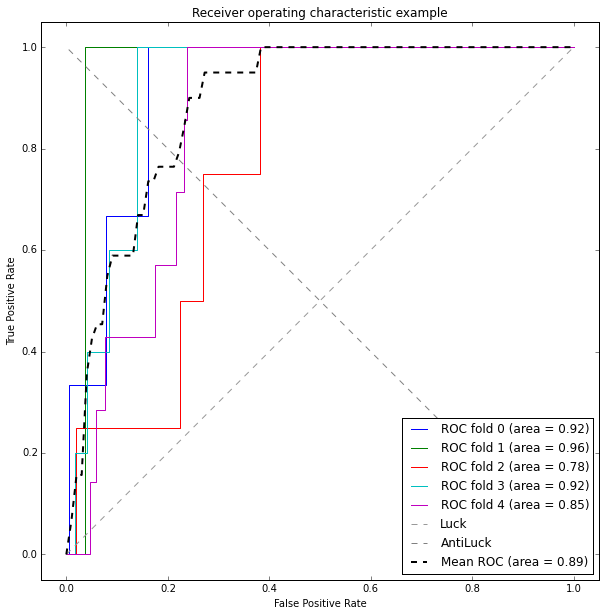

In [176]:
mean_tpr = 0.0
mean_fpr = np.linspace(0, 1, 100)
all_tpr = []

plt.figure(figsize=(10,10))

for i, (train, test) in enumerate(cv):
    probas_ = classifier.fit(X_noi_best.ix[train], y_noi_train.ix[train]).predict_proba(X_noi_best.ix[test])
    # Compute ROC curve and area the curve
    fpr, tpr, thresholds = roc_curve(y_noi_train.ix[test], probas_[:, 1])
    mean_tpr += interp(mean_fpr, fpr, tpr)
    mean_tpr[0] = 0.0
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw=1, label='ROC fold %d (area = %0.2f)' % (i, roc_auc))

plt.plot([0, 1], [0, 1], '--', color=(0.6, 0.6, 0.6), label='Luck')
plt.plot([1, 0], [0, 1], '--', color=(.5,.5,.5), label='AntiLuck')

mean_tpr /= len(cv)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
noi_best_thresh = thresholds[np.argmax(mean_tpr - mean_fpr)]
plt.plot(mean_fpr, mean_tpr, 'k--',
         label='Mean ROC (area = %0.2f)' % mean_auc, lw=2)

plt.xlim([-0.05, 1.05])
plt.ylim([-0.05, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic example')
plt.legend(loc="lower right")

In [177]:
X_noi_test = pd.DataFrame(noi_scale_fit.transform(X_noi_test).transpose()[best_noi_cols].transpose(), columns = X_noi_test.columns[best_noi_cols])

In [180]:
noi_probas = classifier.fit(X_noi_best, y_noi_train).predict_proba(X_noi_test)
X_noi_pred = []
for row in noi_probas:
    if row[1] > noi_best_thresh:
        X_noi_pred.append(1)
    else:
        X_noi_pred.append(0)

In [181]:
accuracy_score(X_noi_pred, y_noi_test)

0.77281553398058256

In [184]:
precision_score(X_noi_pred, y_noi_test)

0.33333333333333331

In [186]:
recall_score(X_noi_pred, y_noi_test)

0.0086206896551724137

In [187]:
f1_score(X_noi_pred, y_noi_test)

0.01680672268907563

# BEALE STREET MUSIC FESTIVAL

In [188]:
y_bea, X_bea = df.bea_2015, df.ix[:, 'fans':'noi_counts']
X_bea_train, X_bea_test, y_bea_train, y_bea_test = train_test_split(X_bea, y_bea, test_size = 0.25, random_state = 4444)
bea_scale_fit = StandardScaler().fit(X_bea_train)
X_bea_train_scaled = pd.DataFrame(bea_scale_fit.transform(X_bea_train), columns = X_bea_train.columns)
new_bea_features = SelectKBest(f_classif, k = 10)
X_bea_best = new_bea_features.fit_transform(X_bea_train_scaled, y_bea_train)
best_bea_cols = new_bea_features.get_support(True)
X_bea_best = pd.DataFrame(X_bea_best, columns = X_bea.columns[best_bea_cols])
X_bea.columns[best_bea_cols]

Index([u'2015_shows', u'2014_shows', u'2012_shows', u'2011_shows', u'miles',
       u'all_shows', u'familiarity', u'metal', u'blues', u'bea_counts'],
      dtype='object')

In [189]:
cw_range = [{1:1-cw, 0:cw} for cw in np.arange(.01, .2, .01)]
gamma_range = np.logspace(-5, 0, 9)
param_grid = dict(gamma=gamma_range, class_weight=cw_range)
cv = ShuffleSplit(len(y_bea_train), n_iter=5, test_size=0.2, random_state=42)
for score in ['accuracy','precision', 'recall']:
    grid = GridSearchCV(SVC(kernel = 'rbf'), param_grid=param_grid, cv=cv, scoring = score, verbose= 10)
    grid.fit(X_bea_best, y_bea_train)
    print("The best parameters are %s with a score of %0.2f"
          % (grid.best_params_, grid.best_score_))

Fitting 5 folds for each of 171 candidates, totalling 855 fits
[CV] gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.019417 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.019417 -   0.1s

[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.1s



[CV] gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.019417 -   0.1s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.019417 -   0.1s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999

[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.5s



[CV] gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=0.000177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.019417 -   0.1s
[CV] gamma=0.000177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.019417 -   0.1s
[CV] gamma=0.000177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=0.000177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.00

[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    0.9s
[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    1.2s



[CV] gamma=0.000749894209332, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=0.000749894209332, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.278317 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.207120 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.611650 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.003162277

[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    1.6s
[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    2.0s



[CV] gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.912621 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.915858 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.915858 -   0.0s
[CV] gamma=0.237137370566, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.237137370566, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.825243 -   0.1s
[CV] gamma=0.237137370566, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.237137370566, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.822006 -   0.0s
[CV] gamma=0.237137370566, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.237137370566, class_weight={0: 0.01

[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    2.4s
[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    3.0s



[CV] gamma=4.21696503429e-05, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.980583 -   0.1s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.980583 -   0.1s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.977346 -   0.1s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.977346 -   0.1s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.977346 -   0.1s
[CV] gamma=0.000177827941004, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.00

[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    3.7s
[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    4.4s



[CV] gamma=0.0133352143216, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.938511 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.941748 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.944984 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.056234132519, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.928803 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.056234132519, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.922330 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.056234132519, class_weight={0

[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    4.9s
[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    5.6s



[CV] gamma=4.21696503429e-05, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.977346 -   0.0s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.977346 -   0.0s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.977346 -   0.1s
[CV] gamma=0.000177827941004, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.980583 -   0.1s
[CV] gamma=0.000177827941004, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.029

[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    6.4s
[Parallel(n_jobs=1)]: Done 128 jobs       | elapsed:    6.8s



[CV] gamma=0.237137370566, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.237137370566, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.925566 -   0.0s
[CV] gamma=0.237137370566, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.237137370566, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.915858 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=1.0, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.980583 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=1.0, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.977346 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=1.0, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.977346 -   0.1s
[CV] gamma=1.0, class_weight={

[Parallel(n_jobs=1)]: Done 145 jobs       | elapsed:    7.6s
[Parallel(n_jobs=1)]: Done 162 jobs       | elapsed:    8.2s



[CV] gamma=0.0133352143216, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.951456 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.938511 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.944984 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.944984 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.056234132519, class_weight={0: 0.040000000000000001, 1: 0.

[Parallel(n_jobs=1)]: Done 181 jobs       | elapsed:    8.8s
[Parallel(n_jobs=1)]: Done 200 jobs       | elapsed:    9.4s



[CV] gamma=0.000749894209332, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996}, score=0.980583 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996}, score=0.954693 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996}, score=0.951456 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996}, score=0.941748 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.05000000000

[Parallel(n_jobs=1)]: Done 221 jobs       | elapsed:    9.9s
[Parallel(n_jobs=1)]: Done 242 jobs       | elapsed:   10.6s



[CV] gamma=0.000749894209332, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995}, score=0.977346 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995}, score=0.980583 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995}, score=0.980583 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995}, score=0.954693 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.0600000

[Parallel(n_jobs=1)]: Done 265 jobs       | elapsed:   11.1s
[Parallel(n_jobs=1)]: Done 288 jobs       | elapsed:   11.8s



[CV] gamma=0.000749894209332, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005}, score=0.980583 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005}, score=0.980583 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005}, score=0.954693 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005}, score=0.951456 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.069999999

[Parallel(n_jobs=1)]: Done 313 jobs       | elapsed:   12.4s
[Parallel(n_jobs=1)]: Done 338 jobs       | elapsed:   13.0s



[CV] gamma=0.00316227766017, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.951456 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.954693 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.944984 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.944984 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.080000000000000

[Parallel(n_jobs=1)]: Done 365 jobs       | elapsed:   13.7s
[Parallel(n_jobs=1)]: Done 392 jobs       | elapsed:   14.2s



[CV] gamma=0.056234132519, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.056234132519, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003}, score=0.951456 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.056234132519, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003}, score=0.944984 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.056234132519, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003}, score=0.941748 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.056234132519, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003}, score=0.941748 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.056234132519, class_weight={0: 0.089999999999999997, 1: 0.91000000

[Parallel(n_jobs=1)]: Done 421 jobs       | elapsed:   14.9s
[Parallel(n_jobs=1)]: Done 450 jobs       | elapsed:   15.6s



[CV] gamma=1e-05, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.980583 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.980583 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.977346 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.977346 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.977346 -   0.0s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.980583 -   0.0s
[CV] gam

[Parallel(n_jobs=1)]: Done 481 jobs       | elapsed:   16.1s
[Parallel(n_jobs=1)]: Done 512 jobs       | elapsed:   16.8s



[CV] gamma=0.000749894209332, class_weight={0: 0.12, 1: 0.88} ........
[CV]  gamma=0.000749894209332, class_weight={0: 0.12, 1: 0.88}, score=0.980583 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.12, 1: 0.88} ........
[CV]  gamma=0.000749894209332, class_weight={0: 0.12, 1: 0.88}, score=0.977346 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.12, 1: 0.88} ........
[CV]  gamma=0.000749894209332, class_weight={0: 0.12, 1: 0.88}, score=0.977346 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.12, 1: 0.88} ........
[CV]  gamma=0.000749894209332, class_weight={0: 0.12, 1: 0.88}, score=0.977346 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.12, 1: 0.88} .........
[CV]  gamma=0.00316227766017, class_weight={0: 0.12, 1: 0.88}, score=0.977346 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.12, 1: 0.88} .........
[CV]  gamma=0.00316227766017, class_weight={0: 0.12, 1: 0.88}, score=0.983819 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0

[Parallel(n_jobs=1)]: Done 545 jobs       | elapsed:   17.5s
[Parallel(n_jobs=1)]: Done 578 jobs       | elapsed:   18.0s



[CV] gamma=0.237137370566, class_weight={0: 0.13, 1: 0.87} ...........
[CV]  gamma=0.237137370566, class_weight={0: 0.13, 1: 0.87}, score=0.977346 -   0.0s
[CV] gamma=0.237137370566, class_weight={0: 0.13, 1: 0.87} ...........
[CV]  gamma=0.237137370566, class_weight={0: 0.13, 1: 0.87}, score=0.977346 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.13, 1: 0.87} ......................
[CV]  gamma=1.0, class_weight={0: 0.13, 1: 0.87}, score=0.980583 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.13, 1: 0.87} ......................
[CV]  gamma=1.0, class_weight={0: 0.13, 1: 0.87}, score=0.980583 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.13, 1: 0.87} ......................
[CV]  gamma=1.0, class_weight={0: 0.13, 1: 0.87}, score=0.977346 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.13, 1: 0.87} ......................
[CV]  gamma=1.0, class_weight={0: 0.13, 1: 0.87}, score=0.977346 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.13, 1: 0.87} ......................
[CV]  gamma=1.0, class_weight={0: 0.

[Parallel(n_jobs=1)]: Done 613 jobs       | elapsed:   18.7s
[Parallel(n_jobs=1)]: Done 648 jobs       | elapsed:   19.4s



[CV] gamma=0.000749894209332, class_weight={0: 0.15000000000000002, 1: 0.84999999999999998} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.15000000000000002, 1: 0.84999999999999998}, score=0.977346 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.15000000000000002, 1: 0.84999999999999998} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.15000000000000002, 1: 0.84999999999999998}, score=0.977346 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.15000000000000002, 1: 0.84999999999999998} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.15000000000000002, 1: 0.84999999999999998}, score=0.977346 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.15000000000000002, 1: 0.84999999999999998} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.15000000000000002, 1: 0.84999999999999998}, score=0.977346 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.15000000000000002, 1: 0.84999999999999998} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.1500000000000000

[Parallel(n_jobs=1)]: Done 685 jobs       | elapsed:   20.2s
[Parallel(n_jobs=1)]: Done 722 jobs       | elapsed:   21.1s



[CV] gamma=1e-05, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=1e-05, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.980583 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=1e-05, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.977346 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=1e-05, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.977346 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=1e-05, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.977346 -   0.0s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.980583 -   0.0s
[CV] gamma=4.21696503429e-05, class_weig

[Parallel(n_jobs=1)]: Done 761 jobs       | elapsed:   21.7s
[Parallel(n_jobs=1)]: Done 800 jobs       | elapsed:   22.5s



[CV] gamma=0.237137370566, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995} 
[CV]  gamma=0.237137370566, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995}, score=0.980583 -   0.0s
[CV] gamma=0.237137370566, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995} 
[CV]  gamma=0.237137370566, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995}, score=0.974110 -   0.0s
[CV] gamma=0.237137370566, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995} 
[CV]  gamma=0.237137370566, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995}, score=0.977346 -   0.0s
[CV] gamma=0.237137370566, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995} 
[CV]  gamma=0.237137370566, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995}, score=0.977346 -   0.0s
[CV] gamma=0.237137370566, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995} 
[CV]  gamma=0.237137370566, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995}

[Parallel(n_jobs=1)]: Done 841 jobs       | elapsed:   23.3s
[Parallel(n_jobs=1)]: Done 855 out of 855 | elapsed:   23.8s finished



[CV] gamma=1.0, class_weight={0: 0.19, 1: 0.81000000000000005} .......
[CV]  gamma=1.0, class_weight={0: 0.19, 1: 0.81000000000000005}, score=0.977346 -   0.0s
The best parameters are {'gamma': 0.00074989420933245586, 'class_weight': {0: 0.029999999999999999, 1: 0.96999999999999997}} with a score of 0.98
Fitting 5 folds for each of 171 candidates, totalling 855 fits
[CV] gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.019417 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.019417 -   0.1s

[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.2s



[CV] gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.019417 -   0.1s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.019417 -   0.1s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999

[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.4s
[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.6s



[CV] gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=0.000177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.019417 -   0.1s
[CV] gamma=0.000177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.019417 -   0.1s
[CV] gamma=0.000177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=0.000177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.00

[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    1.0s
[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    1.4s



[CV] gamma=0.000749894209332, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=0.000749894209332, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.026201 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.023904 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.055118 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.003162277

[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    2.0s
[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    2.4s



[CV] gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.187500 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.205882 -   0.1s
[CV] gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.212121 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.212121 -   0.0s
[CV] gamma=0.237137370566, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.237137370566, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.100000 -   0.1s
[CV] gamma=0.237137370566, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.237137370566, class_weight={0: 0.01

[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    2.9s
[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    3.7s



[CV] gamma=4.21696503429e-05, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.000000 -   0.1s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.000000 -   0.1s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.000000 -   0.1s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.000000 -   0.1s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.000000 -   0.1s
[CV] gamma=0.000177827941004, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.00

[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    4.6s
[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    5.4s



[CV] gamma=0.0133352143216, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.269231 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.280000 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.291667 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.056234132519, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.214286 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.056234132519, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.200000 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.056234132519, class_weight={0

[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    6.0s
[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    6.9s



[CV] gamma=4.21696503429e-05, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.000000 -   0.0s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.000000 -   0.1s
[CV] gamma=0.000177827941004, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.000000 -   0.0s
[CV] gamma=0.000177827941004, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.000000 -   0.1s
[CV] gamma=0.000177827941004, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.029

[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    7.7s
[Parallel(n_jobs=1)]: Done 128 jobs       | elapsed:    8.1s



[CV] gamma=0.237137370566, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.237137370566, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.233333 -   0.0s
[CV] gamma=0.237137370566, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.237137370566, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.212121 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=1.0, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.000000 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=1.0, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.000000 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=1.0, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.000000 -   0.1s
[CV] gamma=1.0, class_weight={

[Parallel(n_jobs=1)]: Done 145 jobs       | elapsed:    8.8s
[Parallel(n_jobs=1)]: Done 162 jobs       | elapsed:    9.5s



[CV] gamma=0.0133352143216, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.285714 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.269231 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.291667 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=0.291667 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.056234132519, class_weight={0: 0.040000000000000001, 1: 0.

[Parallel(n_jobs=1)]: Done 181 jobs       | elapsed:   10.2s
[Parallel(n_jobs=1)]: Done 200 jobs       | elapsed:   11.0s



[CV] gamma=0.00316227766017, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996}, score=0.300000 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996}, score=0.285714 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996}, score=0.280000 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996}, score=0.291667 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.0500000000000

[Parallel(n_jobs=1)]: Done 221 jobs       | elapsed:   11.6s
[Parallel(n_jobs=1)]: Done 242 jobs       | elapsed:   12.2s



[CV] gamma=0.000749894209332, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995}, score=1.000000 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995}, score=0.000000 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995}, score=1.000000 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995}, score=1.000000 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.06000

[Parallel(n_jobs=1)]: Done 265 jobs       | elapsed:   12.9s
[Parallel(n_jobs=1)]: Done 288 jobs       | elapsed:   13.5s



[CV] gamma=0.000749894209332, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005}, score=1.000000 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005}, score=0.000000 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005}, score=1.000000 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005}, score=1.000000 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.06999

[Parallel(n_jobs=1)]: Done 313 jobs       | elapsed:   14.1s
[Parallel(n_jobs=1)]: Done 338 jobs       | elapsed:   14.8s



[CV] gamma=0.00316227766017, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.285714 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.266667 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.291667 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.250000 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.080000000000000

[Parallel(n_jobs=1)]: Done 365 jobs       | elapsed:   15.5s
[Parallel(n_jobs=1)]: Done 392 jobs       | elapsed:   16.0s



[CV] gamma=0.056234132519, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.056234132519, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003}, score=0.210526 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.056234132519, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003}, score=0.280000 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.056234132519, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003}, score=0.260870 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.056234132519, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003}, score=0.238095 -   0.0s
[CV] gamma=0.237137370566, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.237137370566, class_weight={0: 0.089999999999999997, 1: 0.91000000

[Parallel(n_jobs=1)]: Done 421 jobs       | elapsed:   16.7s
[Parallel(n_jobs=1)]: Done 450 jobs       | elapsed:   17.4s



[CV] gamma=1e-05, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gam

[Parallel(n_jobs=1)]: Done 481 jobs       | elapsed:   17.9s
[Parallel(n_jobs=1)]: Done 512 jobs       | elapsed:   18.6s



[CV] gamma=0.000749894209332, class_weight={0: 0.12, 1: 0.88} ........
[CV]  gamma=0.000749894209332, class_weight={0: 0.12, 1: 0.88}, score=0.000000 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.12, 1: 0.88} ........
[CV]  gamma=0.000749894209332, class_weight={0: 0.12, 1: 0.88}, score=0.000000 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.12, 1: 0.88} ........
[CV]  gamma=0.000749894209332, class_weight={0: 0.12, 1: 0.88}, score=0.000000 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.12, 1: 0.88} ........
[CV]  gamma=0.000749894209332, class_weight={0: 0.12, 1: 0.88}, score=0.000000 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.12, 1: 0.88} .........
[CV]  gamma=0.00316227766017, class_weight={0: 0.12, 1: 0.88}, score=0.333333 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.12, 1: 0.88} .........
[CV]  gamma=0.00316227766017, class_weight={0: 0.12, 1: 0.88}, score=1.000000 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0

[Parallel(n_jobs=1)]: Done 545 jobs       | elapsed:   19.3s
[Parallel(n_jobs=1)]: Done 578 jobs       | elapsed:   19.8s



[CV]  gamma=0.237137370566, class_weight={0: 0.13, 1: 0.87}, score=0.000000 -   0.0s
[CV] gamma=0.237137370566, class_weight={0: 0.13, 1: 0.87} ...........
[CV]  gamma=0.237137370566, class_weight={0: 0.13, 1: 0.87}, score=0.000000 -   0.0s
[CV] gamma=0.237137370566, class_weight={0: 0.13, 1: 0.87} ...........
[CV]  gamma=0.237137370566, class_weight={0: 0.13, 1: 0.87}, score=0.400000 -   0.0s
[CV] gamma=0.237137370566, class_weight={0: 0.13, 1: 0.87} ...........
[CV]  gamma=0.237137370566, class_weight={0: 0.13, 1: 0.87}, score=0.000000 -   0.0s
[CV] gamma=0.237137370566, class_weight={0: 0.13, 1: 0.87} ...........
[CV]  gamma=0.237137370566, class_weight={0: 0.13, 1: 0.87}, score=0.500000 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.13, 1: 0.87} ......................
[CV]  gamma=1.0, class_weight={0: 0.13, 1: 0.87}, score=0.000000 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.13, 1: 0.87} ......................
[CV]  gamma=1.0, class_weight={0: 0.13, 1: 0.87}, score=0.000000 -   0.1s


[Parallel(n_jobs=1)]: Done 613 jobs       | elapsed:   20.6s
[Parallel(n_jobs=1)]: Done 648 jobs       | elapsed:   21.3s



[CV] gamma=0.000749894209332, class_weight={0: 0.15000000000000002, 1: 0.84999999999999998} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.15000000000000002, 1: 0.84999999999999998}, score=0.000000 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.15000000000000002, 1: 0.84999999999999998} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.15000000000000002, 1: 0.84999999999999998}, score=0.000000 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.15000000000000002, 1: 0.84999999999999998} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.15000000000000002, 1: 0.84999999999999998}, score=0.000000 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.15000000000000002, 1: 0.84999999999999998} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.15000000000000002, 1: 0.84999999999999998}, score=0.000000 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.15000000000000002, 1: 0.84999999999999998} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.150000000000

[Parallel(n_jobs=1)]: Done 685 jobs       | elapsed:   21.9s
[Parallel(n_jobs=1)]: Done 722 jobs       | elapsed:   22.5s



[CV] gamma=1e-05, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=1e-05, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=1e-05, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=1e-05, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=1e-05, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=1e-05, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.000000 -   0.0s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.170000000000000

[Parallel(n_jobs=1)]: Done 761 jobs       | elapsed:   23.0s
[Parallel(n_jobs=1)]: Done 800 jobs       | elapsed:   23.5s



[CV] gamma=0.056234132519, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995} 
[CV]  gamma=0.056234132519, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995}, score=0.333333 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995} 
[CV]  gamma=0.056234132519, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995}, score=0.363636 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995} 
[CV]  gamma=0.056234132519, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995}, score=0.375000 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995} 
[CV]  gamma=0.056234132519, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995}, score=0.222222 -   0.0s
[CV] gamma=0.237137370566, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995} 
[CV]  gamma=0.237137370566, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995}

[Parallel(n_jobs=1)]: Done 841 jobs       | elapsed:   24.1s
[Parallel(n_jobs=1)]: Done 855 out of 855 | elapsed:   24.5s finished



[CV] gamma=1.0, class_weight={0: 0.19, 1: 0.81000000000000005} .......
[CV]  gamma=1.0, class_weight={0: 0.19, 1: 0.81000000000000005}, score=0.000000 -   0.0s
The best parameters are {'gamma': 0.00074989420933245586, 'class_weight': {0: 0.029999999999999999, 1: 0.96999999999999997}} with a score of 0.80
Fitting 5 folds for each of 171 candidates, totalling 855 fits
[CV] gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s

[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.2s



[CV] gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999

[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.4s
[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.6s



[CV] gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.000177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.000177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.000177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.000177827941004, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.00

[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    0.9s
[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    1.3s



[CV] gamma=0.000749894209332, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.000749894209332, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.003162277

[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    1.8s
[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    2.2s



[CV] gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.056234132519, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.0s
[CV] gamma=0.237137370566, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.237137370566, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.0s
[CV] gamma=0.237137370566, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.237137370566, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.237137370566, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.237137370566, class_weight={0: 0.01

[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    2.6s
[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    3.3s



[CV] gamma=4.21696503429e-05, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.000000 -   0.1s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.000000 -   0.1s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.000000 -   0.1s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.000000 -   0.1s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.000000 -   0.1s
[CV] gamma=0.000177827941004, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.00

[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    4.0s
[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    4.5s



[CV] gamma=0.0133352143216, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.02, 1: 0.97999999999999998}, score=1.000000 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.02, 1: 0.97999999999999998}, score=1.000000 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.02, 1: 0.97999999999999998}, score=1.000000 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.02, 1: 0.97999999999999998}, score=1.000000 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.056234132519, class_weight={0: 0.02, 1: 0.97999999999999998}, score=1.000000 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.056234132519, class_weight=

[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    4.9s
[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    5.5s



[CV] gamma=4.21696503429e-05, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.000000 -   0.0s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.000000 -   0.0s
[CV] gamma=0.000177827941004, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.000000 -   0.0s
[CV] gamma=0.000177827941004, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.000000 -   0.0s
[CV] gamma=0.000177827941004, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.000177827941004, class_weight={0: 0.029

[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    6.2s
[Parallel(n_jobs=1)]: Done 128 jobs       | elapsed:    6.6s



[CV] gamma=0.237137370566, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.237137370566, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=1.000000 -   0.0s
[CV] gamma=0.237137370566, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.237137370566, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=1.000000 -   0.0s
[CV] gamma=0.237137370566, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=0.237137370566, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=1.000000 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=1.0, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.000000 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997} 
[CV]  gamma=1.0, class_weight={0: 0.029999999999999999, 1: 0.96999999999999997}, score=0.000000 -   0.0s
[CV] gam

[Parallel(n_jobs=1)]: Done 145 jobs       | elapsed:    7.3s
[Parallel(n_jobs=1)]: Done 162 jobs       | elapsed:    7.9s



[CV] gamma=0.0133352143216, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=1.000000 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=1.000000 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=1.000000 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996}, score=1.000000 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.040000000000000001, 1: 0.95999999999999996} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.040000000000000001, 1: 

[Parallel(n_jobs=1)]: Done 181 jobs       | elapsed:    8.5s
[Parallel(n_jobs=1)]: Done 200 jobs       | elapsed:    9.1s



[CV] gamma=0.00316227766017, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996}, score=1.000000 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996}, score=1.000000 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996}, score=1.000000 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996}, score=1.000000 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.050000000000000003, 1: 0.94999999999999996} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.0500000000000

[Parallel(n_jobs=1)]: Done 221 jobs       | elapsed:    9.7s
[Parallel(n_jobs=1)]: Done 242 jobs       | elapsed:   10.3s



[CV] gamma=0.000749894209332, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995}, score=0.166667 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995}, score=0.000000 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995}, score=0.142857 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995}, score=0.142857 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.060000000000000005, 1: 0.93999999999999995} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.06000

[Parallel(n_jobs=1)]: Done 265 jobs       | elapsed:   10.8s
[Parallel(n_jobs=1)]: Done 288 jobs       | elapsed:   11.6s



[CV] gamma=0.000749894209332, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005}, score=0.142857 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005}, score=0.142857 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005}, score=1.000000 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005}, score=1.000000 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.069999999999999993, 1: 0.93000000000000005} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.069999999

[Parallel(n_jobs=1)]: Done 313 jobs       | elapsed:   12.2s
[Parallel(n_jobs=1)]: Done 338 jobs       | elapsed:   12.8s



[CV] gamma=0.00316227766017, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=1.000000 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=0.714286 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=1.000000 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004}, score=1.000000 -   0.0s
[CV] gamma=0.0133352143216, class_weight={0: 0.080000000000000002, 1: 0.92000000000000004} 
[CV]  gamma=0.0133352143216, class_weight={0: 0.080000000000000002,

[Parallel(n_jobs=1)]: Done 365 jobs       | elapsed:   13.6s
[Parallel(n_jobs=1)]: Done 392 jobs       | elapsed:   14.2s



[CV] gamma=0.056234132519, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.056234132519, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003}, score=0.666667 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.056234132519, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003}, score=0.666667 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.056234132519, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003}, score=1.000000 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.056234132519, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003}, score=0.857143 -   0.0s
[CV] gamma=0.056234132519, class_weight={0: 0.089999999999999997, 1: 0.91000000000000003} 
[CV]  gamma=0.056234132519, class_weight={0: 0.089999999999999997, 1: 0.91000000

[Parallel(n_jobs=1)]: Done 421 jobs       | elapsed:   14.9s
[Parallel(n_jobs=1)]: Done 450 jobs       | elapsed:   15.6s



[CV] gamma=1e-05, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.11, 1: 0.89000000000000001} .....
[CV]  gamma=1e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.11, 1: 0.89000000000000001} 
[CV]  gamma=4.21696503429e-05, class_weight={0: 0.11, 1: 0.89000000000000001}, score=0.000000 -   0.0s
[CV] gam

[Parallel(n_jobs=1)]: Done 481 jobs       | elapsed:   16.1s
[Parallel(n_jobs=1)]: Done 512 jobs       | elapsed:   16.9s



[CV] gamma=0.000749894209332, class_weight={0: 0.12, 1: 0.88} ........
[CV]  gamma=0.000749894209332, class_weight={0: 0.12, 1: 0.88}, score=0.000000 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.12, 1: 0.88} ........
[CV]  gamma=0.000749894209332, class_weight={0: 0.12, 1: 0.88}, score=0.000000 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.12, 1: 0.88} ........
[CV]  gamma=0.000749894209332, class_weight={0: 0.12, 1: 0.88}, score=0.000000 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.12, 1: 0.88} ........
[CV]  gamma=0.000749894209332, class_weight={0: 0.12, 1: 0.88}, score=0.000000 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.12, 1: 0.88} .........
[CV]  gamma=0.00316227766017, class_weight={0: 0.12, 1: 0.88}, score=0.166667 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.12, 1: 0.88} .........
[CV]  gamma=0.00316227766017, class_weight={0: 0.12, 1: 0.88}, score=0.166667 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0

[Parallel(n_jobs=1)]: Done 545 jobs       | elapsed:   17.7s
[Parallel(n_jobs=1)]: Done 578 jobs       | elapsed:   18.2s



[CV] gamma=0.237137370566, class_weight={0: 0.13, 1: 0.87} ...........
[CV]  gamma=0.237137370566, class_weight={0: 0.13, 1: 0.87}, score=0.285714 -   0.0s
[CV] gamma=0.237137370566, class_weight={0: 0.13, 1: 0.87} ...........
[CV]  gamma=0.237137370566, class_weight={0: 0.13, 1: 0.87}, score=0.000000 -   0.0s
[CV] gamma=0.237137370566, class_weight={0: 0.13, 1: 0.87} ...........
[CV]  gamma=0.237137370566, class_weight={0: 0.13, 1: 0.87}, score=0.142857 -   0.0s
[CV] gamma=1.0, class_weight={0: 0.13, 1: 0.87} ......................
[CV]  gamma=1.0, class_weight={0: 0.13, 1: 0.87}, score=0.000000 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.13, 1: 0.87} ......................
[CV]  gamma=1.0, class_weight={0: 0.13, 1: 0.87}, score=0.000000 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.13, 1: 0.87} ......................
[CV]  gamma=1.0, class_weight={0: 0.13, 1: 0.87}, score=0.000000 -   0.1s
[CV] gamma=1.0, class_weight={0: 0.13, 1: 0.87} ......................
[CV]  gamma=1.0, class_we

[Parallel(n_jobs=1)]: Done 613 jobs       | elapsed:   19.0s
[Parallel(n_jobs=1)]: Done 648 jobs       | elapsed:   19.7s



[CV] gamma=0.000749894209332, class_weight={0: 0.15000000000000002, 1: 0.84999999999999998} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.15000000000000002, 1: 0.84999999999999998}, score=0.000000 -   0.0s
[CV] gamma=0.000749894209332, class_weight={0: 0.15000000000000002, 1: 0.84999999999999998} 
[CV]  gamma=0.000749894209332, class_weight={0: 0.15000000000000002, 1: 0.84999999999999998}, score=0.000000 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.15000000000000002, 1: 0.84999999999999998} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.15000000000000002, 1: 0.84999999999999998}, score=0.166667 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.15000000000000002, 1: 0.84999999999999998} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.15000000000000002, 1: 0.84999999999999998}, score=0.166667 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.15000000000000002, 1: 0.84999999999999998} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.15000000000000002,

[Parallel(n_jobs=1)]: Done 685 jobs       | elapsed:   20.4s
[Parallel(n_jobs=1)]: Done 722 jobs       | elapsed:   21.1s



[CV] gamma=1e-05, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=1e-05, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=1e-05, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=1e-05, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=1e-05, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.000000 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996} 
[CV]  gamma=1e-05, class_weight={0: 0.17000000000000001, 1: 0.82999999999999996}, score=0.000000 -   0.0s
[CV] gamma=4.21696503429e-05, class_weight={0: 0.170000000000000

[Parallel(n_jobs=1)]: Done 761 jobs       | elapsed:   21.7s
[Parallel(n_jobs=1)]: Done 800 jobs       | elapsed:   22.3s



[CV] gamma=0.237137370566, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995} 
[CV]  gamma=0.237137370566, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995}, score=0.000000 -   0.0s
[CV] gamma=0.237137370566, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995} 
[CV]  gamma=0.237137370566, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995}, score=0.000000 -   0.0s
[CV] gamma=0.237137370566, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995} 
[CV]  gamma=0.237137370566, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995}, score=0.000000 -   0.0s
[CV] gamma=0.237137370566, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995} 
[CV]  gamma=0.237137370566, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995}, score=0.000000 -   0.0s
[CV] gamma=0.237137370566, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995} 
[CV]  gamma=0.237137370566, class_weight={0: 0.18000000000000002, 1: 0.81999999999999995}

[Parallel(n_jobs=1)]: Done 841 jobs       | elapsed:   23.1s
[Parallel(n_jobs=1)]: Done 855 out of 855 | elapsed:   23.5s finished



The best parameters are {'gamma': 1.0000000000000001e-05, 'class_weight': {0: 0.01, 1: 0.98999999999999999}} with a score of 1.00


The best parameters are {'gamma': 0.00075, 'class_weight': {0: 0.03, 1: 0.97}} with an accuracy score of 0.98.

The best parameters are {'gamma': 0.00075, 'class_weight': {0: 0.03, 1: 0.97}} with a precision score of 0.80.

The best parameters are {'gamma': 1.0e-05, 'class_weight': {0: 0.01, 1: 0.99}} with a recall score of 1.00.

In [190]:
cw_range = [{1:1-cw, 0:cw} for cw in np.arange(.01, .03, .004)]
gamma_range = np.logspace(-5, -3, 5)
param_grid = dict(gamma=gamma_range, class_weight=cw_range)
cv = ShuffleSplit(len(y_bea_train), n_iter=5, test_size=0.2, random_state=42)
for score in ['accuracy','precision', 'recall']:
    grid = GridSearchCV(SVC(kernel = 'rbf'), param_grid=param_grid, cv=cv, scoring = score, verbose= 10)
    grid.fit(X_bea_best, y_bea_train)
    print("The best parameters are %s with a score of %0.2f"
          % (grid.best_params_, grid.best_score_))

Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV] gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.019417 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.019417 -   0.1s

[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.1s



[CV] gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.019417 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.019417 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999

[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.5s



[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=0.0001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.019417 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=0.0001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.019417 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=0.0001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=0.0001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.0

[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    0.9s
[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    1.2s



[CV] gamma=0.000316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.000316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=0.000316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.000316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.019417 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.019417 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.02265

[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    1.7s
[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    2.2s



[CV] gamma=3.16227766017e-05, class_weight={0: 0.014, 1: 0.98599999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.014, 1: 0.98599999999999999}, score=0.022654 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.014, 1: 0.98599999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.014, 1: 0.98599999999999999}, score=0.022654 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.014, 1: 0.98599999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.014, 1: 0.98599999999999999}, score=0.022654 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.014, 1: 0.98599999999999999} ...
[CV]  gamma=0.0001, class_weight={0: 0.014, 1: 0.98599999999999999}, score=0.019417 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.014, 1: 0.98599999999999999} ...
[CV]  gamma=0.0001, class_weight={0: 0.014, 1: 0.98599999999999999}, score=0.019417 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.014, 1: 0.98599999999999999} ...
[CV]  gamma=0.0001, class_weight={0: 0.014, 1: 0.98

[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    2.9s
[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    3.5s



[CV] gamma=1e-05, class_weight={0: 0.018000000000000002, 1: 0.98199999999999998} 
[CV]  gamma=1e-05, class_weight={0: 0.018000000000000002, 1: 0.98199999999999998}, score=0.019417 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.018000000000000002, 1: 0.98199999999999998} 
[CV]  gamma=1e-05, class_weight={0: 0.018000000000000002, 1: 0.98199999999999998}, score=0.019417 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.018000000000000002, 1: 0.98199999999999998} 
[CV]  gamma=1e-05, class_weight={0: 0.018000000000000002, 1: 0.98199999999999998}, score=0.977346 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.018000000000000002, 1: 0.98199999999999998} 
[CV]  gamma=1e-05, class_weight={0: 0.018000000000000002, 1: 0.98199999999999998}, score=0.977346 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.018000000000000002, 1: 0.98199999999999998} 
[CV]  gamma=1e-05, class_weight={0: 0.018000000000000002, 1: 0.98199999999999998}, score=0.977346 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01800

[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    4.2s
[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    5.0s



[CV] gamma=0.001, class_weight={0: 0.018000000000000002, 1: 0.98199999999999998} 
[CV]  gamma=0.001, class_weight={0: 0.018000000000000002, 1: 0.98199999999999998}, score=0.967638 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.018000000000000002, 1: 0.98199999999999998} 
[CV]  gamma=0.001, class_weight={0: 0.018000000000000002, 1: 0.98199999999999998}, score=0.964401 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.018000000000000002, 1: 0.98199999999999998} 
[CV]  gamma=0.001, class_weight={0: 0.018000000000000002, 1: 0.98199999999999998}, score=0.961165 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.021999999999999999, 1: 0.97799999999999998} 
[CV]  gamma=1e-05, class_weight={0: 0.021999999999999999, 1: 0.97799999999999998}, score=0.980583 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.021999999999999999, 1: 0.97799999999999998} 
[CV]  gamma=1e-05, class_weight={0: 0.021999999999999999, 1: 0.97799999999999998}, score=0.980583 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.02199999999999999

[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    5.8s
[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    6.7s



[CV] gamma=0.001, class_weight={0: 0.021999999999999999, 1: 0.97799999999999998} 
[CV]  gamma=0.001, class_weight={0: 0.021999999999999999, 1: 0.97799999999999998}, score=0.970874 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.021999999999999999, 1: 0.97799999999999998} 
[CV]  gamma=0.001, class_weight={0: 0.021999999999999999, 1: 0.97799999999999998}, score=0.970874 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.026000000000000002, 1: 0.97399999999999998} 
[CV]  gamma=1e-05, class_weight={0: 0.026000000000000002, 1: 0.97399999999999998}, score=0.980583 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.026000000000000002, 1: 0.97399999999999998} 
[CV]  gamma=1e-05, class_weight={0: 0.026000000000000002, 1: 0.97399999999999998}, score=0.980583 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.026000000000000002, 1: 0.97399999999999998} 
[CV]  gamma=1e-05, class_weight={0: 0.026000000000000002, 1: 0.97399999999999998}, score=0.977346 -   0.0s
[CV] gamma=1e-05, class_weight={0: 0.02600000000000000

[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    7.5s
[Parallel(n_jobs=1)]: Done 125 out of 125 | elapsed:    8.1s finished



The best parameters are {'gamma': 1.0000000000000001e-05, 'class_weight': {0: 0.021999999999999999, 1: 0.97799999999999998}} with a score of 0.98
Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV] gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.019417 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.019417 -   0.1s

[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.1s



[CV] gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.019417 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.019417 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999

[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.4s
[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.6s



[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=0.0001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.019417 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=0.0001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.019417 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=0.0001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=0.0001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.0

[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    1.0s
[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    1.3s



[CV] gamma=0.000316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.000316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=0.000316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.000316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.019417 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.019417 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.022654 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=0.02265

[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    1.9s
[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    2.4s



[CV] gamma=3.16227766017e-05, class_weight={0: 0.014, 1: 0.98599999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.014, 1: 0.98599999999999999}, score=0.022654 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.014, 1: 0.98599999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.014, 1: 0.98599999999999999}, score=0.022654 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.014, 1: 0.98599999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.014, 1: 0.98599999999999999}, score=0.022654 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.014, 1: 0.98599999999999999} ...
[CV]  gamma=0.0001, class_weight={0: 0.014, 1: 0.98599999999999999}, score=0.019417 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.014, 1: 0.98599999999999999} ...
[CV]  gamma=0.0001, class_weight={0: 0.014, 1: 0.98599999999999999}, score=0.019417 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.014, 1: 0.98599999999999999} ...
[CV]  gamma=0.0001, class_weight={0: 0.014, 1: 0.98

[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    3.0s
[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    3.7s



[CV] gamma=1e-05, class_weight={0: 0.018000000000000002, 1: 0.98199999999999998} 
[CV]  gamma=1e-05, class_weight={0: 0.018000000000000002, 1: 0.98199999999999998}, score=0.019417 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.018000000000000002, 1: 0.98199999999999998} 
[CV]  gamma=1e-05, class_weight={0: 0.018000000000000002, 1: 0.98199999999999998}, score=0.019417 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.018000000000000002, 1: 0.98199999999999998} 
[CV]  gamma=1e-05, class_weight={0: 0.018000000000000002, 1: 0.98199999999999998}, score=0.000000 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.018000000000000002, 1: 0.98199999999999998} 
[CV]  gamma=1e-05, class_weight={0: 0.018000000000000002, 1: 0.98199999999999998}, score=0.000000 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.018000000000000002, 1: 0.98199999999999998} 
[CV]  gamma=1e-05, class_weight={0: 0.018000000000000002, 1: 0.98199999999999998}, score=0.000000 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01800

[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    4.5s
[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    5.3s



[CV] gamma=0.001, class_weight={0: 0.018000000000000002, 1: 0.98199999999999998} 
[CV]  gamma=0.001, class_weight={0: 0.018000000000000002, 1: 0.98199999999999998}, score=0.200000 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.018000000000000002, 1: 0.98199999999999998} 
[CV]  gamma=0.001, class_weight={0: 0.018000000000000002, 1: 0.98199999999999998}, score=0.300000 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.018000000000000002, 1: 0.98199999999999998} 
[CV]  gamma=0.001, class_weight={0: 0.018000000000000002, 1: 0.98199999999999998}, score=0.222222 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.021999999999999999, 1: 0.97799999999999998} 
[CV]  gamma=1e-05, class_weight={0: 0.021999999999999999, 1: 0.97799999999999998}, score=0.000000 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.021999999999999999, 1: 0.97799999999999998} 
[CV]  gamma=1e-05, class_weight={0: 0.021999999999999999, 1: 0.97799999999999998}, score=0.000000 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.02199999999999999

[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    6.1s
[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    7.1s



[CV] gamma=0.001, class_weight={0: 0.021999999999999999, 1: 0.97799999999999998} 
[CV]  gamma=0.001, class_weight={0: 0.021999999999999999, 1: 0.97799999999999998}, score=0.333333 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.021999999999999999, 1: 0.97799999999999998} 
[CV]  gamma=0.001, class_weight={0: 0.021999999999999999, 1: 0.97799999999999998}, score=0.333333 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.026000000000000002, 1: 0.97399999999999998} 
[CV]  gamma=1e-05, class_weight={0: 0.026000000000000002, 1: 0.97399999999999998}, score=0.000000 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.026000000000000002, 1: 0.97399999999999998} 
[CV]  gamma=1e-05, class_weight={0: 0.026000000000000002, 1: 0.97399999999999998}, score=0.000000 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.026000000000000002, 1: 0.97399999999999998} 
[CV]  gamma=1e-05, class_weight={0: 0.026000000000000002, 1: 0.97399999999999998}, score=0.000000 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.02600000000000000

[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    8.1s
[Parallel(n_jobs=1)]: Done 125 out of 125 | elapsed:    8.9s finished



The best parameters are {'gamma': 0.001, 'class_weight': {0: 0.026000000000000002, 1: 0.97399999999999998}} with a score of 0.45
Fitting 5 folds for each of 25 candidates, totalling 125 fits
[CV] gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s

[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.2s



[CV] gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=1e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999

[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.5s
[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.7s



[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=0.0001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=0.0001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=0.0001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.01, 1: 0.98999999999999999} ....
[CV]  gamma=0.0001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.0

[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    1.2s
[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    1.7s



[CV] gamma=0.000316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.000316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.000316227766017, class_weight={0: 0.01, 1: 0.98999999999999999} 
[CV]  gamma=0.000316227766017, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999} .....
[CV]  gamma=0.001, class_weight={0: 0.01, 1: 0.98999999999999999}, score=1.00000

[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    2.3s
[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    2.9s



[CV] gamma=3.16227766017e-05, class_weight={0: 0.014, 1: 0.98599999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.014, 1: 0.98599999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.014, 1: 0.98599999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.014, 1: 0.98599999999999999}, score=1.000000 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.014, 1: 0.98599999999999999} 
[CV]  gamma=3.16227766017e-05, class_weight={0: 0.014, 1: 0.98599999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.014, 1: 0.98599999999999999} ...
[CV]  gamma=0.0001, class_weight={0: 0.014, 1: 0.98599999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.014, 1: 0.98599999999999999} ...
[CV]  gamma=0.0001, class_weight={0: 0.014, 1: 0.98599999999999999}, score=1.000000 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.014, 1: 0.98599999999999999} ...
[CV]  gamma=0.0001, class_weight={0: 0.014, 1: 0.98

[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    3.7s
[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    4.5s



[CV] gamma=1e-05, class_weight={0: 0.018000000000000002, 1: 0.98199999999999998} 
[CV]  gamma=1e-05, class_weight={0: 0.018000000000000002, 1: 0.98199999999999998}, score=1.000000 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.018000000000000002, 1: 0.98199999999999998} 
[CV]  gamma=1e-05, class_weight={0: 0.018000000000000002, 1: 0.98199999999999998}, score=1.000000 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.018000000000000002, 1: 0.98199999999999998} 
[CV]  gamma=1e-05, class_weight={0: 0.018000000000000002, 1: 0.98199999999999998}, score=0.000000 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.018000000000000002, 1: 0.98199999999999998} 
[CV]  gamma=1e-05, class_weight={0: 0.018000000000000002, 1: 0.98199999999999998}, score=0.000000 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.018000000000000002, 1: 0.98199999999999998} 
[CV]  gamma=1e-05, class_weight={0: 0.018000000000000002, 1: 0.98199999999999998}, score=0.000000 -   0.1s
[CV] gamma=3.16227766017e-05, class_weight={0: 0.01800

[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    5.5s
[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    6.4s



[CV] gamma=0.001, class_weight={0: 0.018000000000000002, 1: 0.98199999999999998} 
[CV]  gamma=0.001, class_weight={0: 0.018000000000000002, 1: 0.98199999999999998}, score=0.142857 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.018000000000000002, 1: 0.98199999999999998} 
[CV]  gamma=0.001, class_weight={0: 0.018000000000000002, 1: 0.98199999999999998}, score=0.428571 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.018000000000000002, 1: 0.98199999999999998} 
[CV]  gamma=0.001, class_weight={0: 0.018000000000000002, 1: 0.98199999999999998}, score=0.285714 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.021999999999999999, 1: 0.97799999999999998} 
[CV]  gamma=1e-05, class_weight={0: 0.021999999999999999, 1: 0.97799999999999998}, score=0.000000 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.021999999999999999, 1: 0.97799999999999998} 
[CV]  gamma=1e-05, class_weight={0: 0.021999999999999999, 1: 0.97799999999999998}, score=0.000000 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.02199999999999999

[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    7.4s
[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    8.4s



[CV] gamma=0.001, class_weight={0: 0.021999999999999999, 1: 0.97799999999999998} 
[CV]  gamma=0.001, class_weight={0: 0.021999999999999999, 1: 0.97799999999999998}, score=0.285714 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.021999999999999999, 1: 0.97799999999999998} 
[CV]  gamma=0.001, class_weight={0: 0.021999999999999999, 1: 0.97799999999999998}, score=0.285714 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.026000000000000002, 1: 0.97399999999999998} 
[CV]  gamma=1e-05, class_weight={0: 0.026000000000000002, 1: 0.97399999999999998}, score=0.000000 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.026000000000000002, 1: 0.97399999999999998} 
[CV]  gamma=1e-05, class_weight={0: 0.026000000000000002, 1: 0.97399999999999998}, score=0.000000 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.026000000000000002, 1: 0.97399999999999998} 
[CV]  gamma=1e-05, class_weight={0: 0.026000000000000002, 1: 0.97399999999999998}, score=0.000000 -   0.1s
[CV] gamma=1e-05, class_weight={0: 0.02600000000000000

[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    9.4s
[Parallel(n_jobs=1)]: Done 125 out of 125 | elapsed:   10.2s finished



The best parameters are {'gamma': 1.0000000000000001e-05, 'class_weight': {0: 0.01, 1: 0.98999999999999999}} with a score of 1.00


The best parameters are {'gamma': 1.0e-05, 'class_weight': {0: 0.022, 1: 0.978}} with an accuracy score of 0.98.

The best parameters are {'gamma': 0.001, 'class_weight': {0: 0.026, 1: 0.974}} with a precision score of 0.45.

The best parameters are {'gamma': 1.0e-05, 'class_weight': {0: 0.01, 1: 0.99}} with a recall score of 1.00.

In [191]:
cw_range = [{1:1-cw, 0:cw} for cw in np.arange(.02, .03, .001)]
gamma_range = np.logspace(-4, -2, 5)
param_grid = dict(gamma=gamma_range, class_weight=cw_range)
cv = ShuffleSplit(len(y_bea_train), n_iter=5, test_size=0.2, random_state=42)
for score in ['accuracy','precision', 'recall']:
    grid = GridSearchCV(SVC(kernel = 'rbf'), param_grid=param_grid, cv=cv, scoring = score, verbose= 10)
    grid.fit(X_bea_best, y_bea_train)
    print("The best parameters are %s with a score of %0.2f"
          % (grid.best_params_, grid.best_score_))

Fitting 5 folds for each of 50 candidates, totalling 250 fits
[CV] gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998} ....
[CV]  gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.980583 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998} ....
[CV]  gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.980583 -   0.1s

[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.1s



[CV] gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998} ....
[CV]  gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.977346 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998} ....
[CV]  gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.977346 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998} ....
[CV]  gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.977346 -   0.1s
[CV] gamma=0.000316227766017, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.000316227766017, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.980583 -   0.1s
[CV] gamma=0.000316227766017, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.000316227766017, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.980583 -   0.1s
[CV] gamma=0.000316227766017, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.000316227766017, class_weight={0: 0.02, 1: 0.97999999999

[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.3s
[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.5s



[CV] gamma=0.000316227766017, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.000316227766017, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.977346 -   0.1s
[CV] gamma=0.000316227766017, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.000316227766017, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.977346 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.02, 1: 0.97999999999999998} .....
[CV]  gamma=0.001, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.974110 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.02, 1: 0.97999999999999998} .....
[CV]  gamma=0.001, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.970874 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.02, 1: 0.97999999999999998} .....
[CV]  gamma=0.001, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.970874 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.02, 1: 0.97999999999999998} .....
[CV]  gamma=0.001, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.97411

[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    0.8s
[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    1.1s



[CV] gamma=0.00316227766017, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.944984 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.935275 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.02, 1: 0.97999999999999998} ......
[CV]  gamma=0.01, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.954693 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.02, 1: 0.97999999999999998} ......
[CV]  gamma=0.01, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.951456 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.02, 1: 0.97999999999999998} ......
[CV]  gamma=0.01, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.938511 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.02, 1: 0.97999999999999998} ......
[CV]  gamma=0.01, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.944984 -   0.

[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    1.3s
[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    1.8s



[CV] gamma=0.000316227766017, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998} 
[CV]  gamma=0.000316227766017, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998}, score=0.977346 -   0.1s
[CV] gamma=0.000316227766017, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998} 
[CV]  gamma=0.000316227766017, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998}, score=0.977346 -   0.1s
[CV] gamma=0.000316227766017, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998} 
[CV]  gamma=0.000316227766017, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998}, score=0.977346 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998} 
[CV]  gamma=0.001, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998}, score=0.977346 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998} 
[CV]  gamma=0.001, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998}, score=

[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    2.3s
[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    2.7s



[CV] gamma=0.01, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998} 
[CV]  gamma=0.01, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998}, score=0.944984 -   0.0s
[CV] gamma=0.0001, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998} 
[CV]  gamma=0.0001, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998}, score=0.980583 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998} 
[CV]  gamma=0.0001, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998}, score=0.980583 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998} 
[CV]  gamma=0.0001, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998}, score=0.977346 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998} 
[CV]  gamma=0.0001, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998}, score=0.977346 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.0220000000

[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    3.4s
[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    4.0s



[CV] gamma=0.01, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998} 
[CV]  gamma=0.01, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998}, score=0.951456 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998} 
[CV]  gamma=0.01, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998}, score=0.938511 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998} 
[CV]  gamma=0.01, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998}, score=0.944984 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998} 
[CV]  gamma=0.01, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998}, score=0.944984 -   0.0s
[CV] gamma=0.0001, class_weight={0: 0.023000000000000003, 1: 0.97699999999999998} 
[CV]  gamma=0.0001, class_weight={0: 0.023000000000000003, 1: 0.97699999999999998}, score=0.980583 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.023000000000000003, 1:

[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    4.7s
[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    5.4s



[CV] gamma=0.01, class_weight={0: 0.023000000000000003, 1: 0.97699999999999998} 
[CV]  gamma=0.01, class_weight={0: 0.023000000000000003, 1: 0.97699999999999998}, score=0.938511 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.023000000000000003, 1: 0.97699999999999998} 
[CV]  gamma=0.01, class_weight={0: 0.023000000000000003, 1: 0.97699999999999998}, score=0.944984 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.023000000000000003, 1: 0.97699999999999998} 
[CV]  gamma=0.01, class_weight={0: 0.023000000000000003, 1: 0.97699999999999998}, score=0.944984 -   0.0s
[CV] gamma=0.0001, class_weight={0: 0.024000000000000004, 1: 0.97599999999999998} 
[CV]  gamma=0.0001, class_weight={0: 0.024000000000000004, 1: 0.97599999999999998}, score=0.980583 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.024000000000000004, 1: 0.97599999999999998} 
[CV]  gamma=0.0001, class_weight={0: 0.024000000000000004, 1: 0.97599999999999998}, score=0.980583 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.024000000000000004

[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    6.2s
[Parallel(n_jobs=1)]: Done 128 jobs       | elapsed:    7.0s



[CV] gamma=0.0001, class_weight={0: 0.025000000000000005, 1: 0.97499999999999998} 
[CV]  gamma=0.0001, class_weight={0: 0.025000000000000005, 1: 0.97499999999999998}, score=0.977346 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.025000000000000005, 1: 0.97499999999999998} 
[CV]  gamma=0.0001, class_weight={0: 0.025000000000000005, 1: 0.97499999999999998}, score=0.977346 -   0.0s
[CV] gamma=0.000316227766017, class_weight={0: 0.025000000000000005, 1: 0.97499999999999998} 
[CV]  gamma=0.000316227766017, class_weight={0: 0.025000000000000005, 1: 0.97499999999999998}, score=0.980583 -   0.1s
[CV] gamma=0.000316227766017, class_weight={0: 0.025000000000000005, 1: 0.97499999999999998} 
[CV]  gamma=0.000316227766017, class_weight={0: 0.025000000000000005, 1: 0.97499999999999998}, score=0.980583 -   0.1s
[CV] gamma=0.000316227766017, class_weight={0: 0.025000000000000005, 1: 0.97499999999999998} 
[CV]  gamma=0.000316227766017, class_weight={0: 0.025000000000000005, 1: 0.97499999999999998}, sc

[Parallel(n_jobs=1)]: Done 145 jobs       | elapsed:    7.9s
[Parallel(n_jobs=1)]: Done 162 jobs       | elapsed:    8.8s



[CV] gamma=0.001, class_weight={0: 0.026000000000000006, 1: 0.97399999999999998} 
[CV]  gamma=0.001, class_weight={0: 0.026000000000000006, 1: 0.97399999999999998}, score=0.977346 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.026000000000000006, 1: 0.97399999999999998} 
[CV]  gamma=0.001, class_weight={0: 0.026000000000000006, 1: 0.97399999999999998}, score=0.970874 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.026000000000000006, 1: 0.97399999999999998} 
[CV]  gamma=0.001, class_weight={0: 0.026000000000000006, 1: 0.97399999999999998}, score=0.970874 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.026000000000000006, 1: 0.97399999999999998} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.026000000000000006, 1: 0.97399999999999998}, score=0.951456 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.026000000000000006, 1: 0.97399999999999998} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.026000000000000006, 1: 0.97399999999999998}, score=0.948220 -   0.1s
[CV] gamma

[Parallel(n_jobs=1)]: Done 181 jobs       | elapsed:    9.8s
[Parallel(n_jobs=1)]: Done 200 jobs       | elapsed:   10.8s



[CV] gamma=0.0001, class_weight={0: 0.028000000000000008, 1: 0.97199999999999998} 
[CV]  gamma=0.0001, class_weight={0: 0.028000000000000008, 1: 0.97199999999999998}, score=0.980583 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.028000000000000008, 1: 0.97199999999999998} 
[CV]  gamma=0.0001, class_weight={0: 0.028000000000000008, 1: 0.97199999999999998}, score=0.980583 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.028000000000000008, 1: 0.97199999999999998} 
[CV]  gamma=0.0001, class_weight={0: 0.028000000000000008, 1: 0.97199999999999998}, score=0.977346 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.028000000000000008, 1: 0.97199999999999998} 
[CV]  gamma=0.0001, class_weight={0: 0.028000000000000008, 1: 0.97199999999999998}, score=0.977346 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.028000000000000008, 1: 0.97199999999999998} 
[CV]  gamma=0.0001, class_weight={0: 0.028000000000000008, 1: 0.97199999999999998}, score=0.977346 -   0.1s
[CV] gamma=0.000316227766017, class_weight={

[Parallel(n_jobs=1)]: Done 221 jobs       | elapsed:   12.0s
[Parallel(n_jobs=1)]: Done 242 jobs       | elapsed:   13.0s



[CV] gamma=0.00316227766017, class_weight={0: 0.029000000000000008, 1: 0.97099999999999997} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.029000000000000008, 1: 0.97099999999999997}, score=0.938511 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.029000000000000008, 1: 0.97099999999999997} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.029000000000000008, 1: 0.97099999999999997}, score=0.944984 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.029000000000000008, 1: 0.97099999999999997} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.029000000000000008, 1: 0.97099999999999997}, score=0.944984 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.029000000000000008, 1: 0.97099999999999997} 
[CV]  gamma=0.01, class_weight={0: 0.029000000000000008, 1: 0.97099999999999997}, score=0.954693 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.029000000000000008, 1: 0.97099999999999997} 
[CV]  gamma=0.01, class_weight={0: 0.029000000000000008, 1: 0.97099999999999997}, score=0.951456 -

[Parallel(n_jobs=1)]: Done 250 out of 250 | elapsed:   13.3s finished
[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.1s



[CV] gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998} ....
[CV]  gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.000000 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998} ....
[CV]  gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.000000 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998} ....
[CV]  gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.000000 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998} ....
[CV]  gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.000000 -   0.1s

[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.2s
[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.4s



[CV] gamma=0.000316227766017, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.000316227766017, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.000000 -   0.1s
[CV] gamma=0.000316227766017, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.000316227766017, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.000000 -   0.1s
[CV] gamma=0.000316227766017, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.000316227766017, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.000000 -   0.1s
[CV] gamma=0.000316227766017, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.000316227766017, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.000000 -   0.1s
[CV] gamma=0.000316227766017, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.000316227766017, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.000000 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.02, 1: 0.97999999999999998} .....
[CV]  gamma=0.001, clas

[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.7s
[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    1.0s



[CV] gamma=0.001, class_weight={0: 0.02, 1: 0.97999999999999998} .....
[CV]  gamma=0.001, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.428571 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.02, 1: 0.97999999999999998} .....
[CV]  gamma=0.001, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.250000 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.285714 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.272727 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.233333 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.02, 1: 0.979

[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    1.4s
[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    1.8s



[CV] gamma=0.0001, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998} 
[CV]  gamma=0.0001, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998}, score=0.000000 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998} 
[CV]  gamma=0.0001, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998}, score=0.000000 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998} 
[CV]  gamma=0.0001, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998}, score=0.000000 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998} 
[CV]  gamma=0.0001, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998}, score=0.000000 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998} 
[CV]  gamma=0.0001, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998}, score=0.000000 -   0.1s
[CV] gamma=0.000316227766017, class_weight={

[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    2.4s
[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    3.1s



[CV] gamma=0.00316227766017, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998}, score=0.272727 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998}, score=0.233333 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998}, score=0.291667 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998}, score=0.280000 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998} 
[CV]  gamma=0.01, class_weight={0: 0.021000000000000001, 1: 0.978999999999

[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    3.6s
[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    4.4s



[CV] gamma=0.001, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998} 
[CV]  gamma=0.001, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998}, score=0.500000 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998} 
[CV]  gamma=0.001, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998}, score=0.333333 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998} 
[CV]  gamma=0.001, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998}, score=0.333333 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998} 
[CV]  gamma=0.001, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998}, score=0.333333 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998}, score=0.285714 -   0.1s
[CV] gamma=0.00316227766017, cla

[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    5.0s
[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    5.8s



[CV] gamma=0.001, class_weight={0: 0.023000000000000003, 1: 0.97699999999999998} 
[CV]  gamma=0.001, class_weight={0: 0.023000000000000003, 1: 0.97699999999999998}, score=0.500000 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.023000000000000003, 1: 0.97699999999999998} 
[CV]  gamma=0.001, class_weight={0: 0.023000000000000003, 1: 0.97699999999999998}, score=0.666667 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.023000000000000003, 1: 0.97699999999999998} 
[CV]  gamma=0.001, class_weight={0: 0.023000000000000003, 1: 0.97699999999999998}, score=0.500000 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.023000000000000003, 1: 0.97699999999999998} 
[CV]  gamma=0.001, class_weight={0: 0.023000000000000003, 1: 0.97699999999999998}, score=0.333333 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.023000000000000003, 1: 0.97699999999999998} 
[CV]  gamma=0.001, class_weight={0: 0.023000000000000003, 1: 0.97699999999999998}, score=0.250000 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.023000

[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    6.5s
[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    7.4s



[CV] gamma=0.001, class_weight={0: 0.024000000000000004, 1: 0.97599999999999998} 
[CV]  gamma=0.001, class_weight={0: 0.024000000000000004, 1: 0.97599999999999998}, score=0.333333 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.024000000000000004, 1: 0.97599999999999998} 
[CV]  gamma=0.001, class_weight={0: 0.024000000000000004, 1: 0.97599999999999998}, score=0.250000 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.024000000000000004, 1: 0.97599999999999998} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.024000000000000004, 1: 0.97599999999999998}, score=0.285714 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.024000000000000004, 1: 0.97599999999999998} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.024000000000000004, 1: 0.97599999999999998}, score=0.272727 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.024000000000000004, 1: 0.97599999999999998} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.024000000000000004, 1: 0.97599999999999998}, score=0.2592

[Parallel(n_jobs=1)]: Done 128 jobs       | elapsed:    8.1s
[Parallel(n_jobs=1)]: Done 145 jobs       | elapsed:    9.1s



[CV] gamma=0.01, class_weight={0: 0.025000000000000005, 1: 0.97499999999999998} 
[CV]  gamma=0.01, class_weight={0: 0.025000000000000005, 1: 0.97499999999999998}, score=0.300000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.025000000000000005, 1: 0.97499999999999998} 
[CV]  gamma=0.01, class_weight={0: 0.025000000000000005, 1: 0.97499999999999998}, score=0.285714 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.025000000000000005, 1: 0.97499999999999998} 
[CV]  gamma=0.01, class_weight={0: 0.025000000000000005, 1: 0.97499999999999998}, score=0.269231 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.025000000000000005, 1: 0.97499999999999998} 
[CV]  gamma=0.01, class_weight={0: 0.025000000000000005, 1: 0.97499999999999998}, score=0.291667 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.025000000000000005, 1: 0.97499999999999998} 
[CV]  gamma=0.01, class_weight={0: 0.025000000000000005, 1: 0.97499999999999998}, score=0.291667 -   0.0s
[CV] gamma=0.0001, class_weight={0: 0.026000000000000006, 1: 0.9

[Parallel(n_jobs=1)]: Done 162 jobs       | elapsed:    9.9s
[Parallel(n_jobs=1)]: Done 181 jobs       | elapsed:   10.8s



[CV] gamma=0.000316227766017, class_weight={0: 0.027000000000000007, 1: 0.97299999999999998} 
[CV]  gamma=0.000316227766017, class_weight={0: 0.027000000000000007, 1: 0.97299999999999998}, score=0.000000 -   0.1s
[CV] gamma=0.000316227766017, class_weight={0: 0.027000000000000007, 1: 0.97299999999999998} 
[CV]  gamma=0.000316227766017, class_weight={0: 0.027000000000000007, 1: 0.97299999999999998}, score=0.000000 -   0.0s
[CV] gamma=0.000316227766017, class_weight={0: 0.027000000000000007, 1: 0.97299999999999998} 
[CV]  gamma=0.000316227766017, class_weight={0: 0.027000000000000007, 1: 0.97299999999999998}, score=0.000000 -   0.0s
[CV] gamma=0.000316227766017, class_weight={0: 0.027000000000000007, 1: 0.97299999999999998} 
[CV]  gamma=0.000316227766017, class_weight={0: 0.027000000000000007, 1: 0.97299999999999998}, score=0.000000 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.027000000000000007, 1: 0.97299999999999998} 
[CV]  gamma=0.001, class_weight={0: 0.027000000000000007, 1: 0.97

[Parallel(n_jobs=1)]: Done 200 jobs       | elapsed:   11.7s
[Parallel(n_jobs=1)]: Done 221 jobs       | elapsed:   12.9s



[CV] gamma=0.01, class_weight={0: 0.028000000000000008, 1: 0.97199999999999998} 
[CV]  gamma=0.01, class_weight={0: 0.028000000000000008, 1: 0.97199999999999998}, score=0.285714 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.028000000000000008, 1: 0.97199999999999998} 
[CV]  gamma=0.01, class_weight={0: 0.028000000000000008, 1: 0.97199999999999998}, score=0.269231 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.028000000000000008, 1: 0.97199999999999998} 
[CV]  gamma=0.01, class_weight={0: 0.028000000000000008, 1: 0.97199999999999998}, score=0.291667 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.028000000000000008, 1: 0.97199999999999998} 
[CV]  gamma=0.01, class_weight={0: 0.028000000000000008, 1: 0.97199999999999998}, score=0.291667 -   0.0s
[CV] gamma=0.0001, class_weight={0: 0.029000000000000008, 1: 0.97099999999999997} 
[CV]  gamma=0.0001, class_weight={0: 0.029000000000000008, 1: 0.97099999999999997}, score=0.000000 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.029000000000000008, 1:

[Parallel(n_jobs=1)]: Done 242 jobs       | elapsed:   14.0s
[Parallel(n_jobs=1)]: Done 250 out of 250 | elapsed:   14.4s finished



[CV] gamma=0.01, class_weight={0: 0.029000000000000008, 1: 0.97099999999999997} 
[CV]  gamma=0.01, class_weight={0: 0.029000000000000008, 1: 0.97099999999999997}, score=0.291667 -   0.0s
The best parameters are {'gamma': 0.001, 'class_weight': {0: 0.028000000000000008, 1: 0.97199999999999998}} with a score of 0.55
Fitting 5 folds for each of 50 candidates, totalling 250 fits
[CV] gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998} ....
[CV]  gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.000000 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998} ....
[CV]  gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.000000 -   0.1s

[Parallel(n_jobs=1)]: Done   1 jobs       | elapsed:    0.1s
[Parallel(n_jobs=1)]: Done   2 jobs       | elapsed:    0.2s



[CV] gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998} ....
[CV]  gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.000000 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998} ....
[CV]  gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.000000 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998} ....
[CV]  gamma=0.0001, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.000000 -   0.1s
[CV] gamma=0.000316227766017, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.000316227766017, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.000000 -   0.1s
[CV] gamma=0.000316227766017, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.000316227766017, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.000000 -   0.1s
[CV] gamma=0.000316227766017, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.000316227766017, class_weight={0: 0.02, 1: 0.97999999999

[Parallel(n_jobs=1)]: Done   5 jobs       | elapsed:    0.4s
[Parallel(n_jobs=1)]: Done   8 jobs       | elapsed:    0.6s



[CV] gamma=0.000316227766017, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.000316227766017, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.000000 -   0.1s
[CV] gamma=0.000316227766017, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.000316227766017, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.000000 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.02, 1: 0.97999999999999998} .....
[CV]  gamma=0.001, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.333333 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.02, 1: 0.97999999999999998} .....
[CV]  gamma=0.001, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.333333 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.02, 1: 0.97999999999999998} .....
[CV]  gamma=0.001, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.142857 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.02, 1: 0.97999999999999998} .....
[CV]  gamma=0.001, class_weight={0: 0.02, 1: 0.97999999999999998}, score=0.42857

[Parallel(n_jobs=1)]: Done  13 jobs       | elapsed:    1.0s
[Parallel(n_jobs=1)]: Done  18 jobs       | elapsed:    1.4s



[CV] gamma=0.00316227766017, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.02, 1: 0.97999999999999998}, score=1.000000 -   0.1s
[CV] gamma=0.00316227766017, class_weight={0: 0.02, 1: 0.97999999999999998} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.02, 1: 0.97999999999999998}, score=1.000000 -   0.1s
[CV] gamma=0.01, class_weight={0: 0.02, 1: 0.97999999999999998} ......
[CV]  gamma=0.01, class_weight={0: 0.02, 1: 0.97999999999999998}, score=1.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.02, 1: 0.97999999999999998} ......
[CV]  gamma=0.01, class_weight={0: 0.02, 1: 0.97999999999999998}, score=1.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.02, 1: 0.97999999999999998} ......
[CV]  gamma=0.01, class_weight={0: 0.02, 1: 0.97999999999999998}, score=1.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.02, 1: 0.97999999999999998} ......
[CV]  gamma=0.01, class_weight={0: 0.02, 1: 0.97999999999999998}, score=1.000000 -   0.

[Parallel(n_jobs=1)]: Done  25 jobs       | elapsed:    1.8s
[Parallel(n_jobs=1)]: Done  32 jobs       | elapsed:    2.3s



[CV] gamma=0.000316227766017, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998} 
[CV]  gamma=0.000316227766017, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998}, score=0.000000 -   0.1s
[CV] gamma=0.000316227766017, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998} 
[CV]  gamma=0.000316227766017, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998}, score=0.000000 -   0.1s
[CV] gamma=0.000316227766017, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998} 
[CV]  gamma=0.000316227766017, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998}, score=0.000000 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998} 
[CV]  gamma=0.001, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998}, score=0.333333 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998} 
[CV]  gamma=0.001, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998}, score=

[Parallel(n_jobs=1)]: Done  41 jobs       | elapsed:    3.0s
[Parallel(n_jobs=1)]: Done  50 jobs       | elapsed:    3.4s



[CV] gamma=0.01, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998} 
[CV]  gamma=0.01, class_weight={0: 0.021000000000000001, 1: 0.97899999999999998}, score=1.000000 -   0.0s
[CV] gamma=0.0001, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998} 
[CV]  gamma=0.0001, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998}, score=0.000000 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998} 
[CV]  gamma=0.0001, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998}, score=0.000000 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998} 
[CV]  gamma=0.0001, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998}, score=0.000000 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998} 
[CV]  gamma=0.0001, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998}, score=0.000000 -   0.0s
[CV] gamma=0.0001, class_weight={0: 0.0220000000

[Parallel(n_jobs=1)]: Done  61 jobs       | elapsed:    4.1s
[Parallel(n_jobs=1)]: Done  72 jobs       | elapsed:    4.7s



[CV] gamma=0.01, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998} 
[CV]  gamma=0.01, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998}, score=1.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998} 
[CV]  gamma=0.01, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998}, score=1.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998} 
[CV]  gamma=0.01, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998}, score=1.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998} 
[CV]  gamma=0.01, class_weight={0: 0.022000000000000002, 1: 0.97799999999999998}, score=1.000000 -   0.0s
[CV] gamma=0.0001, class_weight={0: 0.023000000000000003, 1: 0.97699999999999998} 
[CV]  gamma=0.0001, class_weight={0: 0.023000000000000003, 1: 0.97699999999999998}, score=0.000000 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.023000000000000003, 1:

[Parallel(n_jobs=1)]: Done  85 jobs       | elapsed:    5.5s
[Parallel(n_jobs=1)]: Done  98 jobs       | elapsed:    6.2s



[CV] gamma=0.01, class_weight={0: 0.023000000000000003, 1: 0.97699999999999998} 
[CV]  gamma=0.01, class_weight={0: 0.023000000000000003, 1: 0.97699999999999998}, score=1.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.023000000000000003, 1: 0.97699999999999998} 
[CV]  gamma=0.01, class_weight={0: 0.023000000000000003, 1: 0.97699999999999998}, score=1.000000 -   0.0s
[CV] gamma=0.0001, class_weight={0: 0.024000000000000004, 1: 0.97599999999999998} 
[CV]  gamma=0.0001, class_weight={0: 0.024000000000000004, 1: 0.97599999999999998}, score=0.000000 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.024000000000000004, 1: 0.97599999999999998} 
[CV]  gamma=0.0001, class_weight={0: 0.024000000000000004, 1: 0.97599999999999998}, score=0.000000 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.024000000000000004, 1: 0.97599999999999998} 
[CV]  gamma=0.0001, class_weight={0: 0.024000000000000004, 1: 0.97599999999999998}, score=0.000000 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.02400000000000

[Parallel(n_jobs=1)]: Done 113 jobs       | elapsed:    7.1s
[Parallel(n_jobs=1)]: Done 128 jobs       | elapsed:    7.8s



[CV] gamma=0.0001, class_weight={0: 0.025000000000000005, 1: 0.97499999999999998} 
[CV]  gamma=0.0001, class_weight={0: 0.025000000000000005, 1: 0.97499999999999998}, score=0.000000 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.025000000000000005, 1: 0.97499999999999998} 
[CV]  gamma=0.0001, class_weight={0: 0.025000000000000005, 1: 0.97499999999999998}, score=0.000000 -   0.1s
[CV] gamma=0.000316227766017, class_weight={0: 0.025000000000000005, 1: 0.97499999999999998} 
[CV]  gamma=0.000316227766017, class_weight={0: 0.025000000000000005, 1: 0.97499999999999998}, score=0.000000 -   0.1s
[CV] gamma=0.000316227766017, class_weight={0: 0.025000000000000005, 1: 0.97499999999999998} 
[CV]  gamma=0.000316227766017, class_weight={0: 0.025000000000000005, 1: 0.97499999999999998}, score=0.000000 -   0.1s
[CV] gamma=0.000316227766017, class_weight={0: 0.025000000000000005, 1: 0.97499999999999998} 
[CV]  gamma=0.000316227766017, class_weight={0: 0.025000000000000005, 1: 0.97499999999999998}, sc

[Parallel(n_jobs=1)]: Done 145 jobs       | elapsed:    8.8s
[Parallel(n_jobs=1)]: Done 162 jobs       | elapsed:    9.7s



[CV] gamma=0.001, class_weight={0: 0.026000000000000006, 1: 0.97399999999999998} 
[CV]  gamma=0.001, class_weight={0: 0.026000000000000006, 1: 0.97399999999999998}, score=0.142857 -   0.1s
[CV] gamma=0.001, class_weight={0: 0.026000000000000006, 1: 0.97399999999999998} 
[CV]  gamma=0.001, class_weight={0: 0.026000000000000006, 1: 0.97399999999999998}, score=0.285714 -   0.0s
[CV] gamma=0.001, class_weight={0: 0.026000000000000006, 1: 0.97399999999999998} 
[CV]  gamma=0.001, class_weight={0: 0.026000000000000006, 1: 0.97399999999999998}, score=0.142857 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.026000000000000006, 1: 0.97399999999999998} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.026000000000000006, 1: 0.97399999999999998}, score=1.000000 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.026000000000000006, 1: 0.97399999999999998} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.026000000000000006, 1: 0.97399999999999998}, score=1.000000 -   0.0s
[CV] gamma

[Parallel(n_jobs=1)]: Done 181 jobs       | elapsed:   10.5s
[Parallel(n_jobs=1)]: Done 200 jobs       | elapsed:   11.5s



[CV] gamma=0.01, class_weight={0: 0.027000000000000007, 1: 0.97299999999999998} 
[CV]  gamma=0.01, class_weight={0: 0.027000000000000007, 1: 0.97299999999999998}, score=1.000000 -   0.0s
[CV] gamma=0.0001, class_weight={0: 0.028000000000000008, 1: 0.97199999999999998} 
[CV]  gamma=0.0001, class_weight={0: 0.028000000000000008, 1: 0.97199999999999998}, score=0.000000 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.028000000000000008, 1: 0.97199999999999998} 
[CV]  gamma=0.0001, class_weight={0: 0.028000000000000008, 1: 0.97199999999999998}, score=0.000000 -   0.0s
[CV] gamma=0.0001, class_weight={0: 0.028000000000000008, 1: 0.97199999999999998} 
[CV]  gamma=0.0001, class_weight={0: 0.028000000000000008, 1: 0.97199999999999998}, score=0.000000 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.028000000000000008, 1: 0.97199999999999998} 
[CV]  gamma=0.0001, class_weight={0: 0.028000000000000008, 1: 0.97199999999999998}, score=0.000000 -   0.1s
[CV] gamma=0.0001, class_weight={0: 0.0280000000

[Parallel(n_jobs=1)]: Done 221 jobs       | elapsed:   12.6s
[Parallel(n_jobs=1)]: Done 242 jobs       | elapsed:   13.5s



[CV] gamma=0.00316227766017, class_weight={0: 0.029000000000000008, 1: 0.97099999999999997} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.029000000000000008, 1: 0.97099999999999997}, score=1.000000 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.029000000000000008, 1: 0.97099999999999997} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.029000000000000008, 1: 0.97099999999999997}, score=1.000000 -   0.0s
[CV] gamma=0.00316227766017, class_weight={0: 0.029000000000000008, 1: 0.97099999999999997} 
[CV]  gamma=0.00316227766017, class_weight={0: 0.029000000000000008, 1: 0.97099999999999997}, score=1.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.029000000000000008, 1: 0.97099999999999997} 
[CV]  gamma=0.01, class_weight={0: 0.029000000000000008, 1: 0.97099999999999997}, score=1.000000 -   0.0s
[CV] gamma=0.01, class_weight={0: 0.029000000000000008, 1: 0.97099999999999997} 
[CV]  gamma=0.01, class_weight={0: 0.029000000000000008, 1: 0.97099999999999997}, score=1.000000 -

[Parallel(n_jobs=1)]: Done 250 out of 250 | elapsed:   13.8s finished


The best parameters are {'gamma': 0.0001, 'class_weight': {0: 0.02, 1: 0.98}} with an accuracy score of 0.98.

The best parameters are {'gamma': 0.001, 'class_weight': {0: 0.028, 1: 0.972}} with a precision score of 0.55.

The best parameters are {'gamma': 0.00316, 'class_weight': {0: 0.02, 1: 0.98}} with a recall score of 1.00.

In [192]:
cv = ShuffleSplit(len(y_bea_train), n_iter=5, test_size = 0.2, random_state = 43)
classifier = SVC(kernel='rbf', gamma = 0.001, class_weight = {0: 0.02, 1:0.98}, probability=True,
                     random_state=42)

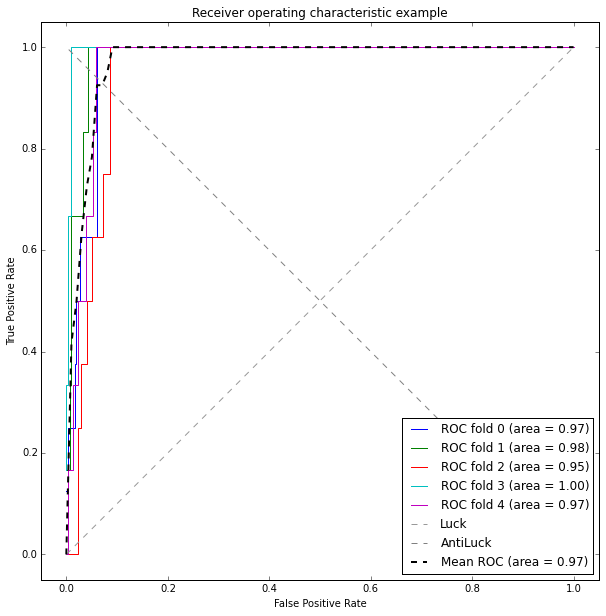

In [193]:
mean_tpr = 0.0
mean_fpr = np.linspace(0, 1, 100)
all_tpr = []

plt.figure(figsize=(10,10))

for i, (train, test) in enumerate(cv):
    probas_ = classifier.fit(X_bea_best.ix[train], y_bea_train.ix[train]).predict_proba(X_bea_best.ix[test])
    # Compute ROC curve and area the curve
    fpr, tpr, thresholds = roc_curve(y_bea_train.ix[test], probas_[:, 1])
    mean_tpr += interp(mean_fpr, fpr, tpr)
    mean_tpr[0] = 0.0
    roc_auc = auc(fpr, tpr)
    plt.plot(fpr, tpr, lw=1, label='ROC fold %d (area = %0.2f)' % (i, roc_auc))

plt.plot([0, 1], [0, 1], '--', color=(0.6, 0.6, 0.6), label='Luck')
plt.plot([1, 0], [0, 1], '--', color=(.5,.5,.5), label='AntiLuck')

mean_tpr /= len(cv)
mean_tpr[-1] = 1.0
mean_auc = auc(mean_fpr, mean_tpr)
bea_best_thresh = thresholds[np.argmax(mean_tpr - mean_fpr)]
plt.plot(mean_fpr, mean_tpr, 'k--',
         label='Mean ROC (area = %0.2f)' % mean_auc, lw=2)

plt.xlim([-0.05, 1.05])
plt.ylim([-0.05, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Receiver operating characteristic example')
plt.legend(loc="lower right")

In [194]:
X_bea_test = pd.DataFrame(bea_scale_fit.transform(X_bea_test).transpose()[best_bea_cols].transpose(), columns = X_bea_test.columns[best_bea_cols])

In [195]:
bea_probas = classifier.fit(X_bea_best, y_bea_train).predict_proba(X_bea_test)
X_bea_pred = []
for row in bea_probas:
    if row[1] > bea_best_thresh:
        X_bea_pred.append(1)
    else:
        X_bea_pred.append(0)

In [196]:
accuracy_score(X_bea_pred, y_bea_test)

0.9398058252427185

In [197]:
precision_score(X_bea_pred, y_bea_test)

1.0

In [198]:
recall_score(X_bea_pred, y_bea_test)

0.29545454545454547

In [199]:
f1_score(X_bea_pred, y_bea_test)

0.45614035087719301

WHEW!